# LSST-like shear measurement

In [2]:
import argparse
import numpy as np
import sys, os
import math
import logging
import time
import galsim
import galsim.roman as roman
import datetime
import pandas as pd
import matplotlib.pyplot as plt

### Code to Simulate galaxies as LSST might observe them (without non-linearity effects)

In [3]:
def parse_args(argv):
    parser = argparse.ArgumentParser(prog='demo13', add_help=True)
    parser.add_argument('-f', '--filters', type=str, default='YJH', action='store',
                        help='Which filters to simulate (default = "YJH")')
    parser.add_argument('-o', '--outpath', type=str, default='output',
                        help='Which directory to put the output files')
    parser.add_argument('-n', '--nobj', type=int, default=1000,
                        help='How many objects to draw')
    parser.add_argument('--seed', type=int, default=12345,
                        help='Initial seed for random numbers')
    parser.add_argument('-s', '--sca', type=int, default=7, choices=range(1,19),
                        help='Which SCA to simulate (default is arbitrarily SCA 7)')
    parser.add_argument('-t', '--test', action='store_const', default=False, const=True,
                        help='Whether to use the smaller test sample, rather than the full COSMOS samples')
    parser.add_argument('-v', '--verbosity', type=int, default=2, choices=range(0,4),
                        help='Verbosity level')

    args = parser.parse_args(argv)
    return args

def main(filters='Y',outpath='Istudy',nobj=1,seed=88888,sca=7,test=False,verbosity=2):
    scale=.2
    use_filters = filters
    outpath = outpath
    nobj = nobj
    seed = seed
    use_SCA = sca

    # Make output directory if not already present.
    if not os.path.isdir(outpath):
        os.mkdir(outpath)

    # Use a logger to output some information about the run.
    logging.basicConfig(format="%(message)s", stream=sys.stdout)
    logger = logging.getLogger("demo13")
    logging_levels = { 0: logging.CRITICAL,
                       1: logging.WARNING,
                       2: logging.INFO,
                       3: logging.DEBUG }
    level = logging_levels[verbosity]
    logger.setLevel(level)
    

    if test:
        cat1 = galsim.COSMOSCatalog('real_galaxy_catalog_23.5_example.fits', dir='data',
                                    area=roman.collecting_area, exptime=roman.exptime)
        cat2 = cat1
    else:
        cat1 = galsim.COSMOSCatalog(sample='25.2', area=350000, exptime=30)#collecting area lsst and 30 sec exposure
        cat2 = galsim.COSMOSCatalog(sample='23.5', area=350000, exptime=30)

    logger.info('Read in %d galaxies from I<25.2 catalog'%cat1.nobjects)
    logger.info('Read in %d galaxies from I<23.5 catalog'%cat2.nobjects)
    x = 100
    y = 100
    image_pos = galsim.PositionD(x,y)
    logger.debug('Position = %s',image_pos)
    
    wcs = galsim.PixelScale(scale).withOrigin(image_pos)
    psf =  galsim.Kolmogorov(lam=500, r0=.15, scale_unit = galsim.arcsec)

    g1=[]
    g2=[]
    e1=[]
    e2=[]
    e1c=[]
    e2c=[]
    cerr=[]
    rr=[]
    snr=[]

    for i_obj in range(nobj):
        full_image = galsim.ImageF(200, 200, wcs=wcs)

        image_rng = galsim.UniformDeviate(seed +1 * nobj)

        

        
        obj_rng = galsim.UniformDeviate(seed + 1 + 10**6 + 0)
        # The rng for photon shooting should be different for each filter.

        # We'll deal with this below.  The config processing calculates this before the
        # position, so to get the same answers, we need to do the same here.
        p = obj_rng()



        obj_rng = galsim.UniformDeviate(seed + 1 + 10**6 + i_obj)
        # The rng for photon shooting should be different for each filter.
        phot_rng = galsim.UniformDeviate(seed + 1 + i_obj + 1*nobj)




        if p < 0.9:
            # Faint galaxy
            logger.debug('Faint galaxy')

            # Select a random galaxy from the catalog.
            obj = cat1.makeGalaxy(chromatic=False, gal_type='parametric', rng=obj_rng)
            logger.debug('galaxy index = %s',obj.index)

            # Rotate the galaxy randomly
            theta = obj_rng() * 2 * np.pi * galsim.radians
            logger.debug('theta = %s',theta)
            obj = obj.rotate(theta)

#             elif p < 0.9:
#                 # Star
#                 logger.debug('Star')

#                 # Use a log-normal distribution for the stellar fluxes.  This gives a few very
#                 # bright stars, but not too many.
#                 # cf. https://en.wikipedia.org/wiki/Log-normal_distribution
#                 # mu_x, sigma_x are the target mean, std.dev.
#                 # mu,sigma are the parameters of the function.
#                 mu_x = 1.e5
#                 sigma_x = 2.e5
#                 mu = np.log(mu_x**2 / (mu_x**2+sigma_x**2)**0.5)
#                 sigma = (np.log(1 + sigma_x**2/mu_x**2))**0.5
#                 gd = galsim.GaussianDeviate(obj_rng, mean=mu, sigma=sigma)
#                 flux = np.exp(gd())
#                 logger.debug('flux = %s',flux)

#                 # Normalize the SED to have this flux in the Y band.
#                 sed = vega_sed.withFlux(flux, y_bandpass)

#                 obj = galsim.DeltaFunction() * sed

        else:
            # Bright galaxy
            logger.debug('Bright galaxy')

            obj = cat2.makeGalaxy(chromatic=False, gal_type='parametric', rng=obj_rng)
            logger.debug('galaxy index = %s',obj.index)

            # Scale up the area by a factor of 2, and the flux by a factor of 4.
            # This is not necessarily physical, but it is intended to add some more big,
            # bright galaxies to the scene to make the final image a bit more interesting.
            #obj = obj.dilate(2) * 4
            # Rotate the galaxy randomly
            theta = obj_rng() * 2 * np.pi * galsim.radians
            logger.debug('theta = %s',theta)
            obj = obj.rotate(theta)

        # Convolve the (chromatic) object with the (chromatic) PSF.
        obj = obj.shear(g1=.06, g2=0.0)
        final = galsim.Convolve(obj, psf)
        stamp = final.drawImage(center=image_pos, wcs=wcs.local(image_pos),
                                method='phot', rng=phot_rng)

        # Find the overlapping bounds between the large image and the individual stamp.

        # Now we're done with the per-object drawing for this image.  The rest will be done for the
        # entire image at once.


        # At this point in the image generation process, an integer number of photons gets
        # detected.  Because of how GalSim's photon shooting works for InterpolatedImage
        # (used implicitly in the PSF implementation), the image has non-integral values at this
        # point.  So the first thing we do is quantize that to an integer number of photons.
#        stamp.quantize()

        
        
        # Write the final image to a file.
        point = galsim.DeltaFunction()
        psff = galsim.Convolve(point, psf)
        final_epsf_image = psff.drawImage(scale = scale)
#         final_epsf_image.quantize()

#         hsm = galsim.hsm.HSMParams(regauss_too_small=1)
        result = galsim.hsm.EstimateShear(stamp, final_epsf_image,strict=False,shear_est='KSB')#hsmparams=hsm,


        #result = galsim.hsm.FindAdaptiveMom(full_image,strict=False)
        if result.error_message == "":

            #out_filename = os.path.join(outpath,'test1_{0}.fits'.format(nobj))
            #full_image.write(out_filename)

            #dffinal = pd.DataFrame(np.array([result.observed_shape.g1]))
            #df = pd.concat([df,dffinal])
            g1.extend([result.observed_shape.g1])
            g2.extend([result.observed_shape.g2])
            e1.extend([result.observed_shape.e1])
            e2.extend([result.observed_shape.e2])
            e1c.extend([result.corrected_g1])
            e2c.extend([result.corrected_g2])
            cerr.extend([result.corrected_shape_err])
            rr.extend([result.resolution_factor])
            snr.extend([np.sum(stamp.array)/np.sqrt(np.sum(stamp.array))])
            
        logger.info('Galaxy {0:d}'.format(i_obj))
    result_dict = dict(g1 = np.array(g1), 
                       g2 = np.array(g2), 
                       e1 = np.array(e1), 
                       e2=np.array(e2), 
                       g1_corrected=np.array(e1c), 
                       g2_corrected=np.array(e2c), 
                       corrected_err=np.array(cerr),
                       resolution_factor=np.array(rr),
                       SNR = np.array(snr))
    df = pd.DataFrame(result_dict)
    df.to_csv('shear_est_g106g20_lsst.csv')
    logger.info('You can display the output in ds9 with a command line that looks something like:')
    logger.info('ds9 -zoom 0.6 -scale limits -10 100 -rgb '+
                '-red output/demo13_H158.fits '+
                '-green output/demo13_J129.fits '+
                '-blue output/demo13_Y106.fits')
    
    return result, final_epsf_image,obj,stamp

In [227]:
%%time
d = main(nobj=500000)

Read in 81499 galaxies from I<25.2 catalog
Read in 50932 galaxies from I<23.5 catalog
Galaxy 0
Galaxy 1
Galaxy 2
Galaxy 3
Galaxy 4
Galaxy 5
Galaxy 6
Galaxy 7
Galaxy 8
Galaxy 9
Galaxy 10
Galaxy 11
Galaxy 12
Galaxy 13
Galaxy 14
Galaxy 15
Galaxy 16
Galaxy 17
Galaxy 18
Galaxy 19
Galaxy 20
Galaxy 21
Galaxy 22
Galaxy 23
Galaxy 24
Galaxy 25
Galaxy 26
Galaxy 27
Galaxy 28
Galaxy 29
Galaxy 30
Galaxy 31
Galaxy 32
Galaxy 33
Galaxy 34
Galaxy 35
Galaxy 36
Galaxy 37
Galaxy 38
Galaxy 39
Galaxy 40
Galaxy 41
Galaxy 42
Galaxy 43
Galaxy 44
Galaxy 45
Galaxy 46
Galaxy 47
Galaxy 48
Galaxy 49
Galaxy 50
Galaxy 51
Galaxy 52
Galaxy 53
Galaxy 54
Galaxy 55
Galaxy 56
Galaxy 57
Galaxy 58
Galaxy 59
Galaxy 60
Galaxy 61
Galaxy 62
Galaxy 63
Galaxy 64
Galaxy 65
Galaxy 66
Galaxy 67
Galaxy 68
Galaxy 69
Galaxy 70
Galaxy 71
Galaxy 72
Galaxy 73
Galaxy 74
Galaxy 75
Galaxy 76
Galaxy 77
Galaxy 78
Galaxy 79
Galaxy 80
Galaxy 81
Galaxy 82
Galaxy 83
Galaxy 84
Galaxy 85
Galaxy 86
Galaxy 87
Galaxy 88
Galaxy 89
Galaxy 90
Galaxy 91
Gala

Galaxy 747
Galaxy 748
Galaxy 749
Galaxy 750
Galaxy 751
Galaxy 752
Galaxy 753
Galaxy 754
Galaxy 755
Galaxy 756
Galaxy 757
Galaxy 758
Galaxy 759
Galaxy 760
Galaxy 761
Galaxy 762
Galaxy 763
Galaxy 764
Galaxy 765
Galaxy 766
Galaxy 767
Galaxy 768
Galaxy 769
Galaxy 770
Galaxy 771
Galaxy 772
Galaxy 773
Galaxy 774
Galaxy 775
Galaxy 776
Galaxy 777
Galaxy 778
Galaxy 779
Galaxy 780
Galaxy 781
Galaxy 782
Galaxy 783
Galaxy 784
Galaxy 785
Galaxy 786
Galaxy 787
Galaxy 788
Galaxy 789
Galaxy 790
Galaxy 791
Galaxy 792
Galaxy 793
Galaxy 794
Galaxy 795
Galaxy 796
Galaxy 797
Galaxy 798
Galaxy 799
Galaxy 800
Galaxy 801
Galaxy 802
Galaxy 803
Galaxy 804
Galaxy 805
Galaxy 806
Galaxy 807
Galaxy 808
Galaxy 809
Galaxy 810
Galaxy 811
Galaxy 812
Galaxy 813
Galaxy 814
Galaxy 815
Galaxy 816
Galaxy 817
Galaxy 818
Galaxy 819
Galaxy 820
Galaxy 821
Galaxy 822
Galaxy 823
Galaxy 824
Galaxy 825
Galaxy 826
Galaxy 827
Galaxy 828
Galaxy 829
Galaxy 830
Galaxy 831
Galaxy 832
Galaxy 833
Galaxy 834
Galaxy 835
Galaxy 836
Galaxy 837

Galaxy 1451
Galaxy 1452
Galaxy 1453
Galaxy 1454
Galaxy 1455
Galaxy 1456
Galaxy 1457
Galaxy 1458
Galaxy 1459
Galaxy 1460
Galaxy 1461
Galaxy 1462
Galaxy 1463
Galaxy 1464
Galaxy 1465
Galaxy 1466
Galaxy 1467
Galaxy 1468
Galaxy 1469
Galaxy 1470
Galaxy 1471
Galaxy 1472
Galaxy 1473
Galaxy 1474
Galaxy 1475
Galaxy 1476
Galaxy 1477
Galaxy 1478
Galaxy 1479
Galaxy 1480
Galaxy 1481
Galaxy 1482
Galaxy 1483
Galaxy 1484
Galaxy 1485
Galaxy 1486
Galaxy 1487
Galaxy 1488
Galaxy 1489
Galaxy 1490
Galaxy 1491
Galaxy 1492
Galaxy 1493
Galaxy 1494
Galaxy 1495
Galaxy 1496
Galaxy 1497
Galaxy 1498
Galaxy 1499
Galaxy 1500
Galaxy 1501
Galaxy 1502
Galaxy 1503
Galaxy 1504
Galaxy 1505
Galaxy 1506
Galaxy 1507
Galaxy 1508
Galaxy 1509
Galaxy 1510
Galaxy 1511
Galaxy 1512
Galaxy 1513
Galaxy 1514
Galaxy 1515
Galaxy 1516
Galaxy 1517
Galaxy 1518
Galaxy 1519
Galaxy 1520
Galaxy 1521
Galaxy 1522
Galaxy 1523
Galaxy 1524
Galaxy 1525
Galaxy 1526
Galaxy 1527
Galaxy 1528
Galaxy 1529
Galaxy 1530
Galaxy 1531
Galaxy 1532
Galaxy 1533
Gala

Galaxy 2134
Galaxy 2135
Galaxy 2136
Galaxy 2137
Galaxy 2138
Galaxy 2139
Galaxy 2140
Galaxy 2141
Galaxy 2142
Galaxy 2143
Galaxy 2144
Galaxy 2145
Galaxy 2146
Galaxy 2147
Galaxy 2148
Galaxy 2149
Galaxy 2150
Galaxy 2151
Galaxy 2152
Galaxy 2153
Galaxy 2154
Galaxy 2155
Galaxy 2156
Galaxy 2157
Galaxy 2158
Galaxy 2159
Galaxy 2160
Galaxy 2161
Galaxy 2162
Galaxy 2163
Galaxy 2164
Galaxy 2165
Galaxy 2166
Galaxy 2167
Galaxy 2168
Galaxy 2169
Galaxy 2170
Galaxy 2171
Galaxy 2172
Galaxy 2173
Galaxy 2174
Galaxy 2175
Galaxy 2176
Galaxy 2177
Galaxy 2178
Galaxy 2179
Galaxy 2180
Galaxy 2181
Galaxy 2182
Galaxy 2183
Galaxy 2184
Galaxy 2185
Galaxy 2186
Galaxy 2187
Galaxy 2188
Galaxy 2189
Galaxy 2190
Galaxy 2191
Galaxy 2192
Galaxy 2193
Galaxy 2194
Galaxy 2195
Galaxy 2196
Galaxy 2197
Galaxy 2198
Galaxy 2199
Galaxy 2200
Galaxy 2201
Galaxy 2202
Galaxy 2203
Galaxy 2204
Galaxy 2205
Galaxy 2206
Galaxy 2207
Galaxy 2208
Galaxy 2209
Galaxy 2210
Galaxy 2211
Galaxy 2212
Galaxy 2213
Galaxy 2214
Galaxy 2215
Galaxy 2216
Gala

Galaxy 2817
Galaxy 2818
Galaxy 2819
Galaxy 2820
Galaxy 2821
Galaxy 2822
Galaxy 2823
Galaxy 2824
Galaxy 2825
Galaxy 2826
Galaxy 2827
Galaxy 2828
Galaxy 2829
Galaxy 2830
Galaxy 2831
Galaxy 2832
Galaxy 2833
Galaxy 2834
Galaxy 2835
Galaxy 2836
Galaxy 2837
Galaxy 2838
Galaxy 2839
Galaxy 2840
Galaxy 2841
Galaxy 2842
Galaxy 2843
Galaxy 2844
Galaxy 2845
Galaxy 2846
Galaxy 2847
Galaxy 2848
Galaxy 2849
Galaxy 2850
Galaxy 2851
Galaxy 2852
Galaxy 2853
Galaxy 2854
Galaxy 2855
Galaxy 2856
Galaxy 2857
Galaxy 2858
Galaxy 2859
Galaxy 2860
Galaxy 2861
Galaxy 2862
Galaxy 2863
Galaxy 2864
Galaxy 2865
Galaxy 2866
Galaxy 2867
Galaxy 2868
Galaxy 2869
Galaxy 2870
Galaxy 2871
Galaxy 2872
Galaxy 2873
Galaxy 2874
Galaxy 2875
Galaxy 2876
Galaxy 2877
Galaxy 2878
Galaxy 2879
Galaxy 2880
Galaxy 2881
Galaxy 2882
Galaxy 2883
Galaxy 2884
Galaxy 2885
Galaxy 2886
Galaxy 2887
Galaxy 2888
Galaxy 2889
Galaxy 2890
Galaxy 2891
Galaxy 2892
Galaxy 2893
Galaxy 2894
Galaxy 2895
Galaxy 2896
Galaxy 2897
Galaxy 2898
Galaxy 2899
Gala

Galaxy 3500
Galaxy 3501
Galaxy 3502
Galaxy 3503
Galaxy 3504
Galaxy 3505
Galaxy 3506
Galaxy 3507
Galaxy 3508
Galaxy 3509
Galaxy 3510
Galaxy 3511
Galaxy 3512
Galaxy 3513
Galaxy 3514
Galaxy 3515
Galaxy 3516
Galaxy 3517
Galaxy 3518
Galaxy 3519
Galaxy 3520
Galaxy 3521
Galaxy 3522
Galaxy 3523
Galaxy 3524
Galaxy 3525
Galaxy 3526
Galaxy 3527
Galaxy 3528
Galaxy 3529
Galaxy 3530
Galaxy 3531
Galaxy 3532
Galaxy 3533
Galaxy 3534
Galaxy 3535
Galaxy 3536
Galaxy 3537
Galaxy 3538
Galaxy 3539
Galaxy 3540
Galaxy 3541
Galaxy 3542
Galaxy 3543
Galaxy 3544
Galaxy 3545
Galaxy 3546
Galaxy 3547
Galaxy 3548
Galaxy 3549
Galaxy 3550
Galaxy 3551
Galaxy 3552
Galaxy 3553
Galaxy 3554
Galaxy 3555
Galaxy 3556
Galaxy 3557
Galaxy 3558
Galaxy 3559
Galaxy 3560
Galaxy 3561
Galaxy 3562
Galaxy 3563
Galaxy 3564
Galaxy 3565
Galaxy 3566
Galaxy 3567
Galaxy 3568
Galaxy 3569
Galaxy 3570
Galaxy 3571
Galaxy 3572
Galaxy 3573
Galaxy 3574
Galaxy 3575
Galaxy 3576
Galaxy 3577
Galaxy 3578
Galaxy 3579
Galaxy 3580
Galaxy 3581
Galaxy 3582
Gala

Galaxy 4183
Galaxy 4184
Galaxy 4185
Galaxy 4186
Galaxy 4187
Galaxy 4188
Galaxy 4189
Galaxy 4190
Galaxy 4191
Galaxy 4192
Galaxy 4193
Galaxy 4194
Galaxy 4195
Galaxy 4196
Galaxy 4197
Galaxy 4198
Galaxy 4199
Galaxy 4200
Galaxy 4201
Galaxy 4202
Galaxy 4203
Galaxy 4204
Galaxy 4205
Galaxy 4206
Galaxy 4207
Galaxy 4208
Galaxy 4209
Galaxy 4210
Galaxy 4211
Galaxy 4212
Galaxy 4213
Galaxy 4214
Galaxy 4215
Galaxy 4216
Galaxy 4217
Galaxy 4218
Galaxy 4219
Galaxy 4220
Galaxy 4221
Galaxy 4222
Galaxy 4223
Galaxy 4224
Galaxy 4225
Galaxy 4226
Galaxy 4227
Galaxy 4228
Galaxy 4229
Galaxy 4230
Galaxy 4231
Galaxy 4232
Galaxy 4233
Galaxy 4234
Galaxy 4235
Galaxy 4236
Galaxy 4237
Galaxy 4238
Galaxy 4239
Galaxy 4240
Galaxy 4241
Galaxy 4242
Galaxy 4243
Galaxy 4244
Galaxy 4245
Galaxy 4246
Galaxy 4247
Galaxy 4248
Galaxy 4249
Galaxy 4250
Galaxy 4251
Galaxy 4252
Galaxy 4253
Galaxy 4254
Galaxy 4255
Galaxy 4256
Galaxy 4257
Galaxy 4258
Galaxy 4259
Galaxy 4260
Galaxy 4261
Galaxy 4262
Galaxy 4263
Galaxy 4264
Galaxy 4265
Gala

Galaxy 4866
Galaxy 4867
Galaxy 4868
Galaxy 4869
Galaxy 4870
Galaxy 4871
Galaxy 4872
Galaxy 4873
Galaxy 4874
Galaxy 4875
Galaxy 4876
Galaxy 4877
Galaxy 4878
Galaxy 4879
Galaxy 4880
Galaxy 4881
Galaxy 4882
Galaxy 4883
Galaxy 4884
Galaxy 4885
Galaxy 4886
Galaxy 4887
Galaxy 4888
Galaxy 4889
Galaxy 4890
Galaxy 4891
Galaxy 4892
Galaxy 4893
Galaxy 4894
Galaxy 4895
Galaxy 4896
Galaxy 4897
Galaxy 4898
Galaxy 4899
Galaxy 4900
Galaxy 4901
Galaxy 4902
Galaxy 4903
Galaxy 4904
Galaxy 4905
Galaxy 4906
Galaxy 4907
Galaxy 4908
Galaxy 4909
Galaxy 4910
Galaxy 4911
Galaxy 4912
Galaxy 4913
Galaxy 4914
Galaxy 4915
Galaxy 4916
Galaxy 4917
Galaxy 4918
Galaxy 4919
Galaxy 4920
Galaxy 4921
Galaxy 4922
Galaxy 4923
Galaxy 4924
Galaxy 4925
Galaxy 4926
Galaxy 4927
Galaxy 4928
Galaxy 4929
Galaxy 4930
Galaxy 4931
Galaxy 4932
Galaxy 4933
Galaxy 4934
Galaxy 4935
Galaxy 4936
Galaxy 4937
Galaxy 4938
Galaxy 4939
Galaxy 4940
Galaxy 4941
Galaxy 4942
Galaxy 4943
Galaxy 4944
Galaxy 4945
Galaxy 4946
Galaxy 4947
Galaxy 4948
Gala

Galaxy 5549
Galaxy 5550
Galaxy 5551
Galaxy 5552
Galaxy 5553
Galaxy 5554
Galaxy 5555
Galaxy 5556
Galaxy 5557
Galaxy 5558
Galaxy 5559
Galaxy 5560
Galaxy 5561
Galaxy 5562
Galaxy 5563
Galaxy 5564
Galaxy 5565
Galaxy 5566
Galaxy 5567
Galaxy 5568
Galaxy 5569
Galaxy 5570
Galaxy 5571
Galaxy 5572
Galaxy 5573
Galaxy 5574
Galaxy 5575
Galaxy 5576
Galaxy 5577
Galaxy 5578
Galaxy 5579
Galaxy 5580
Galaxy 5581
Galaxy 5582
Galaxy 5583
Galaxy 5584
Galaxy 5585
Galaxy 5586
Galaxy 5587
Galaxy 5588
Galaxy 5589
Galaxy 5590
Galaxy 5591
Galaxy 5592
Galaxy 5593
Galaxy 5594
Galaxy 5595
Galaxy 5596
Galaxy 5597
Galaxy 5598
Galaxy 5599
Galaxy 5600
Galaxy 5601
Galaxy 5602
Galaxy 5603
Galaxy 5604
Galaxy 5605
Galaxy 5606
Galaxy 5607
Galaxy 5608
Galaxy 5609
Galaxy 5610
Galaxy 5611
Galaxy 5612
Galaxy 5613
Galaxy 5614
Galaxy 5615
Galaxy 5616
Galaxy 5617
Galaxy 5618
Galaxy 5619
Galaxy 5620
Galaxy 5621
Galaxy 5622
Galaxy 5623
Galaxy 5624
Galaxy 5625
Galaxy 5626
Galaxy 5627
Galaxy 5628
Galaxy 5629
Galaxy 5630
Galaxy 5631
Gala

Galaxy 6232
Galaxy 6233
Galaxy 6234
Galaxy 6235
Galaxy 6236
Galaxy 6237
Galaxy 6238
Galaxy 6239
Galaxy 6240
Galaxy 6241
Galaxy 6242
Galaxy 6243
Galaxy 6244
Galaxy 6245
Galaxy 6246
Galaxy 6247
Galaxy 6248
Galaxy 6249
Galaxy 6250
Galaxy 6251
Galaxy 6252
Galaxy 6253
Galaxy 6254
Galaxy 6255
Galaxy 6256
Galaxy 6257
Galaxy 6258
Galaxy 6259
Galaxy 6260
Galaxy 6261
Galaxy 6262
Galaxy 6263
Galaxy 6264
Galaxy 6265
Galaxy 6266
Galaxy 6267
Galaxy 6268
Galaxy 6269
Galaxy 6270
Galaxy 6271
Galaxy 6272
Galaxy 6273
Galaxy 6274
Galaxy 6275
Galaxy 6276
Galaxy 6277
Galaxy 6278
Galaxy 6279
Galaxy 6280
Galaxy 6281
Galaxy 6282
Galaxy 6283
Galaxy 6284
Galaxy 6285
Galaxy 6286
Galaxy 6287
Galaxy 6288
Galaxy 6289
Galaxy 6290
Galaxy 6291
Galaxy 6292
Galaxy 6293
Galaxy 6294
Galaxy 6295
Galaxy 6296
Galaxy 6297
Galaxy 6298
Galaxy 6299
Galaxy 6300
Galaxy 6301
Galaxy 6302
Galaxy 6303
Galaxy 6304
Galaxy 6305
Galaxy 6306
Galaxy 6307
Galaxy 6308
Galaxy 6309
Galaxy 6310
Galaxy 6311
Galaxy 6312
Galaxy 6313
Galaxy 6314
Gala

Galaxy 6915
Galaxy 6916
Galaxy 6917
Galaxy 6918
Galaxy 6919
Galaxy 6920
Galaxy 6921
Galaxy 6922
Galaxy 6923
Galaxy 6924
Galaxy 6925
Galaxy 6926
Galaxy 6927
Galaxy 6928
Galaxy 6929
Galaxy 6930
Galaxy 6931
Galaxy 6932
Galaxy 6933
Galaxy 6934
Galaxy 6935
Galaxy 6936
Galaxy 6937
Galaxy 6938
Galaxy 6939
Galaxy 6940
Galaxy 6941
Galaxy 6942
Galaxy 6943
Galaxy 6944
Galaxy 6945
Galaxy 6946
Galaxy 6947
Galaxy 6948
Galaxy 6949
Galaxy 6950
Galaxy 6951
Galaxy 6952
Galaxy 6953
Galaxy 6954
Galaxy 6955
Galaxy 6956
Galaxy 6957
Galaxy 6958
Galaxy 6959
Galaxy 6960
Galaxy 6961
Galaxy 6962
Galaxy 6963
Galaxy 6964
Galaxy 6965
Galaxy 6966
Galaxy 6967
Galaxy 6968
Galaxy 6969
Galaxy 6970
Galaxy 6971
Galaxy 6972
Galaxy 6973
Galaxy 6974
Galaxy 6975
Galaxy 6976
Galaxy 6977
Galaxy 6978
Galaxy 6979
Galaxy 6980
Galaxy 6981
Galaxy 6982
Galaxy 6983
Galaxy 6984
Galaxy 6985
Galaxy 6986
Galaxy 6987
Galaxy 6988
Galaxy 6989
Galaxy 6990
Galaxy 6991
Galaxy 6992
Galaxy 6993
Galaxy 6994
Galaxy 6995
Galaxy 6996
Galaxy 6997
Gala

Galaxy 7598
Galaxy 7599
Galaxy 7600
Galaxy 7601
Galaxy 7602
Galaxy 7603
Galaxy 7604
Galaxy 7605
Galaxy 7606
Galaxy 7607
Galaxy 7608
Galaxy 7609
Galaxy 7610
Galaxy 7611
Galaxy 7612
Galaxy 7613
Galaxy 7614
Galaxy 7615
Galaxy 7616
Galaxy 7617
Galaxy 7618
Galaxy 7619
Galaxy 7620
Galaxy 7621
Galaxy 7622
Galaxy 7623
Galaxy 7624
Galaxy 7625
Galaxy 7626
Galaxy 7627
Galaxy 7628
Galaxy 7629
Galaxy 7630
Galaxy 7631
Galaxy 7632
Galaxy 7633
Galaxy 7634
Galaxy 7635
Galaxy 7636
Galaxy 7637
Galaxy 7638
Galaxy 7639
Galaxy 7640
Galaxy 7641
Galaxy 7642
Galaxy 7643
Galaxy 7644
Galaxy 7645
Galaxy 7646
Galaxy 7647
Galaxy 7648
Galaxy 7649
Galaxy 7650
Galaxy 7651
Galaxy 7652
Galaxy 7653
Galaxy 7654
Galaxy 7655
Galaxy 7656
Galaxy 7657
Galaxy 7658
Galaxy 7659
Galaxy 7660
Galaxy 7661
Galaxy 7662
Galaxy 7663
Galaxy 7664
Galaxy 7665
Galaxy 7666
Galaxy 7667
Galaxy 7668
Galaxy 7669
Galaxy 7670
Galaxy 7671
Galaxy 7672
Galaxy 7673
Galaxy 7674
Galaxy 7675
Galaxy 7676
Galaxy 7677
Galaxy 7678
Galaxy 7679
Galaxy 7680
Gala

Galaxy 8281
Galaxy 8282
Galaxy 8283
Galaxy 8284
Galaxy 8285
Galaxy 8286
Galaxy 8287
Galaxy 8288
Galaxy 8289
Galaxy 8290
Galaxy 8291
Galaxy 8292
Galaxy 8293
Galaxy 8294
Galaxy 8295
Galaxy 8296
Galaxy 8297
Galaxy 8298
Galaxy 8299
Galaxy 8300
Galaxy 8301
Galaxy 8302
Galaxy 8303
Galaxy 8304
Galaxy 8305
Galaxy 8306
Galaxy 8307
Galaxy 8308
Galaxy 8309
Galaxy 8310
Galaxy 8311
Galaxy 8312
Galaxy 8313
Galaxy 8314
Galaxy 8315
Galaxy 8316
Galaxy 8317
Galaxy 8318
Galaxy 8319
Galaxy 8320
Galaxy 8321
Galaxy 8322
Galaxy 8323
Galaxy 8324
Galaxy 8325
Galaxy 8326
Galaxy 8327
Galaxy 8328
Galaxy 8329
Galaxy 8330
Galaxy 8331
Galaxy 8332
Galaxy 8333
Galaxy 8334
Galaxy 8335
Galaxy 8336
Galaxy 8337
Galaxy 8338
Galaxy 8339
Galaxy 8340
Galaxy 8341
Galaxy 8342
Galaxy 8343
Galaxy 8344
Galaxy 8345
Galaxy 8346
Galaxy 8347
Galaxy 8348
Galaxy 8349
Galaxy 8350
Galaxy 8351
Galaxy 8352
Galaxy 8353
Galaxy 8354
Galaxy 8355
Galaxy 8356
Galaxy 8357
Galaxy 8358
Galaxy 8359
Galaxy 8360
Galaxy 8361
Galaxy 8362
Galaxy 8363
Gala

Galaxy 8964
Galaxy 8965
Galaxy 8966
Galaxy 8967
Galaxy 8968
Galaxy 8969
Galaxy 8970
Galaxy 8971
Galaxy 8972
Galaxy 8973
Galaxy 8974
Galaxy 8975
Galaxy 8976
Galaxy 8977
Galaxy 8978
Galaxy 8979
Galaxy 8980
Galaxy 8981
Galaxy 8982
Galaxy 8983
Galaxy 8984
Galaxy 8985
Galaxy 8986
Galaxy 8987
Galaxy 8988
Galaxy 8989
Galaxy 8990
Galaxy 8991
Galaxy 8992
Galaxy 8993
Galaxy 8994
Galaxy 8995
Galaxy 8996
Galaxy 8997
Galaxy 8998
Galaxy 8999
Galaxy 9000
Galaxy 9001
Galaxy 9002
Galaxy 9003
Galaxy 9004
Galaxy 9005
Galaxy 9006
Galaxy 9007
Galaxy 9008
Galaxy 9009
Galaxy 9010
Galaxy 9011
Galaxy 9012
Galaxy 9013
Galaxy 9014
Galaxy 9015
Galaxy 9016
Galaxy 9017
Galaxy 9018
Galaxy 9019
Galaxy 9020
Galaxy 9021
Galaxy 9022
Galaxy 9023
Galaxy 9024
Galaxy 9025
Galaxy 9026
Galaxy 9027
Galaxy 9028
Galaxy 9029
Galaxy 9030
Galaxy 9031
Galaxy 9032
Galaxy 9033
Galaxy 9034
Galaxy 9035
Galaxy 9036
Galaxy 9037
Galaxy 9038
Galaxy 9039
Galaxy 9040
Galaxy 9041
Galaxy 9042
Galaxy 9043
Galaxy 9044
Galaxy 9045
Galaxy 9046
Gala

Galaxy 9647
Galaxy 9648
Galaxy 9649
Galaxy 9650
Galaxy 9651
Galaxy 9652
Galaxy 9653
Galaxy 9654
Galaxy 9655
Galaxy 9656
Galaxy 9657
Galaxy 9658
Galaxy 9659
Galaxy 9660
Galaxy 9661
Galaxy 9662
Galaxy 9663
Galaxy 9664
Galaxy 9665
Galaxy 9666
Galaxy 9667
Galaxy 9668
Galaxy 9669
Galaxy 9670
Galaxy 9671
Galaxy 9672
Galaxy 9673
Galaxy 9674
Galaxy 9675
Galaxy 9676
Galaxy 9677
Galaxy 9678
Galaxy 9679
Galaxy 9680
Galaxy 9681
Galaxy 9682
Galaxy 9683
Galaxy 9684
Galaxy 9685
Galaxy 9686
Galaxy 9687
Galaxy 9688
Galaxy 9689
Galaxy 9690
Galaxy 9691
Galaxy 9692
Galaxy 9693
Galaxy 9694
Galaxy 9695
Galaxy 9696
Galaxy 9697
Galaxy 9698
Galaxy 9699
Galaxy 9700
Galaxy 9701
Galaxy 9702
Galaxy 9703
Galaxy 9704
Galaxy 9705
Galaxy 9706
Galaxy 9707
Galaxy 9708
Galaxy 9709
Galaxy 9710
Galaxy 9711
Galaxy 9712
Galaxy 9713
Galaxy 9714
Galaxy 9715
Galaxy 9716
Galaxy 9717
Galaxy 9718
Galaxy 9719
Galaxy 9720
Galaxy 9721
Galaxy 9722
Galaxy 9723
Galaxy 9724
Galaxy 9725
Galaxy 9726
Galaxy 9727
Galaxy 9728
Galaxy 9729
Gala

Galaxy 10305
Galaxy 10306
Galaxy 10307
Galaxy 10308
Galaxy 10309
Galaxy 10310
Galaxy 10311
Galaxy 10312
Galaxy 10313
Galaxy 10314
Galaxy 10315
Galaxy 10316
Galaxy 10317
Galaxy 10318
Galaxy 10319
Galaxy 10320
Galaxy 10321
Galaxy 10322
Galaxy 10323
Galaxy 10324
Galaxy 10325
Galaxy 10326
Galaxy 10327
Galaxy 10328
Galaxy 10329
Galaxy 10330
Galaxy 10331
Galaxy 10332
Galaxy 10333
Galaxy 10334
Galaxy 10335
Galaxy 10336
Galaxy 10337
Galaxy 10338
Galaxy 10339
Galaxy 10340
Galaxy 10341
Galaxy 10342
Galaxy 10343
Galaxy 10344
Galaxy 10345
Galaxy 10346
Galaxy 10347
Galaxy 10348
Galaxy 10349
Galaxy 10350
Galaxy 10351
Galaxy 10352
Galaxy 10353
Galaxy 10354
Galaxy 10355
Galaxy 10356
Galaxy 10357
Galaxy 10358
Galaxy 10359
Galaxy 10360
Galaxy 10361
Galaxy 10362
Galaxy 10363
Galaxy 10364
Galaxy 10365
Galaxy 10366
Galaxy 10367
Galaxy 10368
Galaxy 10369
Galaxy 10370
Galaxy 10371
Galaxy 10372
Galaxy 10373
Galaxy 10374
Galaxy 10375
Galaxy 10376
Galaxy 10377
Galaxy 10378
Galaxy 10379
Galaxy 10380
Galaxy 10381

Galaxy 10936
Galaxy 10937
Galaxy 10938
Galaxy 10939
Galaxy 10940
Galaxy 10941
Galaxy 10942
Galaxy 10943
Galaxy 10944
Galaxy 10945
Galaxy 10946
Galaxy 10947
Galaxy 10948
Galaxy 10949
Galaxy 10950
Galaxy 10951
Galaxy 10952
Galaxy 10953
Galaxy 10954
Galaxy 10955
Galaxy 10956
Galaxy 10957
Galaxy 10958
Galaxy 10959
Galaxy 10960
Galaxy 10961
Galaxy 10962
Galaxy 10963
Galaxy 10964
Galaxy 10965
Galaxy 10966
Galaxy 10967
Galaxy 10968
Galaxy 10969
Galaxy 10970
Galaxy 10971
Galaxy 10972
Galaxy 10973
Galaxy 10974
Galaxy 10975
Galaxy 10976
Galaxy 10977
Galaxy 10978
Galaxy 10979
Galaxy 10980
Galaxy 10981
Galaxy 10982
Galaxy 10983
Galaxy 10984
Galaxy 10985
Galaxy 10986
Galaxy 10987
Galaxy 10988
Galaxy 10989
Galaxy 10990
Galaxy 10991
Galaxy 10992
Galaxy 10993
Galaxy 10994
Galaxy 10995
Galaxy 10996
Galaxy 10997
Galaxy 10998
Galaxy 10999
Galaxy 11000
Galaxy 11001
Galaxy 11002
Galaxy 11003
Galaxy 11004
Galaxy 11005
Galaxy 11006
Galaxy 11007
Galaxy 11008
Galaxy 11009
Galaxy 11010
Galaxy 11011
Galaxy 11012

Galaxy 11567
Galaxy 11568
Galaxy 11569
Galaxy 11570
Galaxy 11571
Galaxy 11572
Galaxy 11573
Galaxy 11574
Galaxy 11575
Galaxy 11576
Galaxy 11577
Galaxy 11578
Galaxy 11579
Galaxy 11580
Galaxy 11581
Galaxy 11582
Galaxy 11583
Galaxy 11584
Galaxy 11585
Galaxy 11586
Galaxy 11587
Galaxy 11588
Galaxy 11589
Galaxy 11590
Galaxy 11591
Galaxy 11592
Galaxy 11593
Galaxy 11594
Galaxy 11595
Galaxy 11596
Galaxy 11597
Galaxy 11598
Galaxy 11599
Galaxy 11600
Galaxy 11601
Galaxy 11602
Galaxy 11603
Galaxy 11604
Galaxy 11605
Galaxy 11606
Galaxy 11607
Galaxy 11608
Galaxy 11609
Galaxy 11610
Galaxy 11611
Galaxy 11612
Galaxy 11613
Galaxy 11614
Galaxy 11615
Galaxy 11616
Galaxy 11617
Galaxy 11618
Galaxy 11619
Galaxy 11620
Galaxy 11621
Galaxy 11622
Galaxy 11623
Galaxy 11624
Galaxy 11625
Galaxy 11626
Galaxy 11627
Galaxy 11628
Galaxy 11629
Galaxy 11630
Galaxy 11631
Galaxy 11632
Galaxy 11633
Galaxy 11634
Galaxy 11635
Galaxy 11636
Galaxy 11637
Galaxy 11638
Galaxy 11639
Galaxy 11640
Galaxy 11641
Galaxy 11642
Galaxy 11643

Galaxy 12198
Galaxy 12199
Galaxy 12200
Galaxy 12201
Galaxy 12202
Galaxy 12203
Galaxy 12204
Galaxy 12205
Galaxy 12206
Galaxy 12207
Galaxy 12208
Galaxy 12209
Galaxy 12210
Galaxy 12211
Galaxy 12212
Galaxy 12213
Galaxy 12214
Galaxy 12215
Galaxy 12216
Galaxy 12217
Galaxy 12218
Galaxy 12219
Galaxy 12220
Galaxy 12221
Galaxy 12222
Galaxy 12223
Galaxy 12224
Galaxy 12225
Galaxy 12226
Galaxy 12227
Galaxy 12228
Galaxy 12229
Galaxy 12230
Galaxy 12231
Galaxy 12232
Galaxy 12233
Galaxy 12234
Galaxy 12235
Galaxy 12236
Galaxy 12237
Galaxy 12238
Galaxy 12239
Galaxy 12240
Galaxy 12241
Galaxy 12242
Galaxy 12243
Galaxy 12244
Galaxy 12245
Galaxy 12246
Galaxy 12247
Galaxy 12248
Galaxy 12249
Galaxy 12250
Galaxy 12251
Galaxy 12252
Galaxy 12253
Galaxy 12254
Galaxy 12255
Galaxy 12256
Galaxy 12257
Galaxy 12258
Galaxy 12259
Galaxy 12260
Galaxy 12261
Galaxy 12262
Galaxy 12263
Galaxy 12264
Galaxy 12265
Galaxy 12266
Galaxy 12267
Galaxy 12268
Galaxy 12269
Galaxy 12270
Galaxy 12271
Galaxy 12272
Galaxy 12273
Galaxy 12274

Galaxy 12829
Galaxy 12830
Galaxy 12831
Galaxy 12832
Galaxy 12833
Galaxy 12834
Galaxy 12835
Galaxy 12836
Galaxy 12837
Galaxy 12838
Galaxy 12839
Galaxy 12840
Galaxy 12841
Galaxy 12842
Galaxy 12843
Galaxy 12844
Galaxy 12845
Galaxy 12846
Galaxy 12847
Galaxy 12848
Galaxy 12849
Galaxy 12850
Galaxy 12851
Galaxy 12852
Galaxy 12853
Galaxy 12854
Galaxy 12855
Galaxy 12856
Galaxy 12857
Galaxy 12858
Galaxy 12859
Galaxy 12860
Galaxy 12861
Galaxy 12862
Galaxy 12863
Galaxy 12864
Galaxy 12865
Galaxy 12866
Galaxy 12867
Galaxy 12868
Galaxy 12869
Galaxy 12870
Galaxy 12871
Galaxy 12872
Galaxy 12873
Galaxy 12874
Galaxy 12875
Galaxy 12876
Galaxy 12877
Galaxy 12878
Galaxy 12879
Galaxy 12880
Galaxy 12881
Galaxy 12882
Galaxy 12883
Galaxy 12884
Galaxy 12885
Galaxy 12886
Galaxy 12887
Galaxy 12888
Galaxy 12889
Galaxy 12890
Galaxy 12891
Galaxy 12892
Galaxy 12893
Galaxy 12894
Galaxy 12895
Galaxy 12896
Galaxy 12897
Galaxy 12898
Galaxy 12899
Galaxy 12900
Galaxy 12901
Galaxy 12902
Galaxy 12903
Galaxy 12904
Galaxy 12905

Galaxy 13460
Galaxy 13461
Galaxy 13462
Galaxy 13463
Galaxy 13464
Galaxy 13465
Galaxy 13466
Galaxy 13467
Galaxy 13468
Galaxy 13469
Galaxy 13470
Galaxy 13471
Galaxy 13472
Galaxy 13473
Galaxy 13474
Galaxy 13475
Galaxy 13476
Galaxy 13477
Galaxy 13478
Galaxy 13479
Galaxy 13480
Galaxy 13481
Galaxy 13482
Galaxy 13483
Galaxy 13484
Galaxy 13485
Galaxy 13486
Galaxy 13487
Galaxy 13488
Galaxy 13489
Galaxy 13490
Galaxy 13491
Galaxy 13492
Galaxy 13493
Galaxy 13494
Galaxy 13495
Galaxy 13496
Galaxy 13497
Galaxy 13498
Galaxy 13499
Galaxy 13500
Galaxy 13501
Galaxy 13502
Galaxy 13503
Galaxy 13504
Galaxy 13505
Galaxy 13506
Galaxy 13507
Galaxy 13508
Galaxy 13509
Galaxy 13510
Galaxy 13511
Galaxy 13512
Galaxy 13513
Galaxy 13514
Galaxy 13515
Galaxy 13516
Galaxy 13517
Galaxy 13518
Galaxy 13519
Galaxy 13520
Galaxy 13521
Galaxy 13522
Galaxy 13523
Galaxy 13524
Galaxy 13525
Galaxy 13526
Galaxy 13527
Galaxy 13528
Galaxy 13529
Galaxy 13530
Galaxy 13531
Galaxy 13532
Galaxy 13533
Galaxy 13534
Galaxy 13535
Galaxy 13536

Galaxy 14091
Galaxy 14092
Galaxy 14093
Galaxy 14094
Galaxy 14095
Galaxy 14096
Galaxy 14097
Galaxy 14098
Galaxy 14099
Galaxy 14100
Galaxy 14101
Galaxy 14102
Galaxy 14103
Galaxy 14104
Galaxy 14105
Galaxy 14106
Galaxy 14107
Galaxy 14108
Galaxy 14109
Galaxy 14110
Galaxy 14111
Galaxy 14112
Galaxy 14113
Galaxy 14114
Galaxy 14115
Galaxy 14116
Galaxy 14117
Galaxy 14118
Galaxy 14119
Galaxy 14120
Galaxy 14121
Galaxy 14122
Galaxy 14123
Galaxy 14124
Galaxy 14125
Galaxy 14126
Galaxy 14127
Galaxy 14128
Galaxy 14129
Galaxy 14130
Galaxy 14131
Galaxy 14132
Galaxy 14133
Galaxy 14134
Galaxy 14135
Galaxy 14136
Galaxy 14137
Galaxy 14138
Galaxy 14139
Galaxy 14140
Galaxy 14141
Galaxy 14142
Galaxy 14143
Galaxy 14144
Galaxy 14145
Galaxy 14146
Galaxy 14147
Galaxy 14148
Galaxy 14149
Galaxy 14150
Galaxy 14151
Galaxy 14152
Galaxy 14153
Galaxy 14154
Galaxy 14155
Galaxy 14156
Galaxy 14157
Galaxy 14158
Galaxy 14159
Galaxy 14160
Galaxy 14161
Galaxy 14162
Galaxy 14163
Galaxy 14164
Galaxy 14165
Galaxy 14166
Galaxy 14167

Galaxy 14722
Galaxy 14723
Galaxy 14724
Galaxy 14725
Galaxy 14726
Galaxy 14727
Galaxy 14728
Galaxy 14729
Galaxy 14730
Galaxy 14731
Galaxy 14732
Galaxy 14733
Galaxy 14734
Galaxy 14735
Galaxy 14736
Galaxy 14737
Galaxy 14738
Galaxy 14739
Galaxy 14740
Galaxy 14741
Galaxy 14742
Galaxy 14743
Galaxy 14744
Galaxy 14745
Galaxy 14746
Galaxy 14747
Galaxy 14748
Galaxy 14749
Galaxy 14750
Galaxy 14751
Galaxy 14752
Galaxy 14753
Galaxy 14754
Galaxy 14755
Galaxy 14756
Galaxy 14757
Galaxy 14758
Galaxy 14759
Galaxy 14760
Galaxy 14761
Galaxy 14762
Galaxy 14763
Galaxy 14764
Galaxy 14765
Galaxy 14766
Galaxy 14767
Galaxy 14768
Galaxy 14769
Galaxy 14770
Galaxy 14771
Galaxy 14772
Galaxy 14773
Galaxy 14774
Galaxy 14775
Galaxy 14776
Galaxy 14777
Galaxy 14778
Galaxy 14779
Galaxy 14780
Galaxy 14781
Galaxy 14782
Galaxy 14783
Galaxy 14784
Galaxy 14785
Galaxy 14786
Galaxy 14787
Galaxy 14788
Galaxy 14789
Galaxy 14790
Galaxy 14791
Galaxy 14792
Galaxy 14793
Galaxy 14794
Galaxy 14795
Galaxy 14796
Galaxy 14797
Galaxy 14798

Galaxy 15353
Galaxy 15354
Galaxy 15355
Galaxy 15356
Galaxy 15357
Galaxy 15358
Galaxy 15359
Galaxy 15360
Galaxy 15361
Galaxy 15362
Galaxy 15363
Galaxy 15364
Galaxy 15365
Galaxy 15366
Galaxy 15367
Galaxy 15368
Galaxy 15369
Galaxy 15370
Galaxy 15371
Galaxy 15372
Galaxy 15373
Galaxy 15374
Galaxy 15375
Galaxy 15376
Galaxy 15377
Galaxy 15378
Galaxy 15379
Galaxy 15380
Galaxy 15381
Galaxy 15382
Galaxy 15383
Galaxy 15384
Galaxy 15385
Galaxy 15386
Galaxy 15387
Galaxy 15388
Galaxy 15389
Galaxy 15390
Galaxy 15391
Galaxy 15392
Galaxy 15393
Galaxy 15394
Galaxy 15395
Galaxy 15396
Galaxy 15397
Galaxy 15398
Galaxy 15399
Galaxy 15400
Galaxy 15401
Galaxy 15402
Galaxy 15403
Galaxy 15404
Galaxy 15405
Galaxy 15406
Galaxy 15407
Galaxy 15408
Galaxy 15409
Galaxy 15410
Galaxy 15411
Galaxy 15412
Galaxy 15413
Galaxy 15414
Galaxy 15415
Galaxy 15416
Galaxy 15417
Galaxy 15418
Galaxy 15419
Galaxy 15420
Galaxy 15421
Galaxy 15422
Galaxy 15423
Galaxy 15424
Galaxy 15425
Galaxy 15426
Galaxy 15427
Galaxy 15428
Galaxy 15429

Galaxy 15984
Galaxy 15985
Galaxy 15986
Galaxy 15987
Galaxy 15988
Galaxy 15989
Galaxy 15990
Galaxy 15991
Galaxy 15992
Galaxy 15993
Galaxy 15994
Galaxy 15995
Galaxy 15996
Galaxy 15997
Galaxy 15998
Galaxy 15999
Galaxy 16000
Galaxy 16001
Galaxy 16002
Galaxy 16003
Galaxy 16004
Galaxy 16005
Galaxy 16006
Galaxy 16007
Galaxy 16008
Galaxy 16009
Galaxy 16010
Galaxy 16011
Galaxy 16012
Galaxy 16013
Galaxy 16014
Galaxy 16015
Galaxy 16016
Galaxy 16017
Galaxy 16018
Galaxy 16019
Galaxy 16020
Galaxy 16021
Galaxy 16022
Galaxy 16023
Galaxy 16024
Galaxy 16025
Galaxy 16026
Galaxy 16027
Galaxy 16028
Galaxy 16029
Galaxy 16030
Galaxy 16031
Galaxy 16032
Galaxy 16033
Galaxy 16034
Galaxy 16035
Galaxy 16036
Galaxy 16037
Galaxy 16038
Galaxy 16039
Galaxy 16040
Galaxy 16041
Galaxy 16042
Galaxy 16043
Galaxy 16044
Galaxy 16045
Galaxy 16046
Galaxy 16047
Galaxy 16048
Galaxy 16049
Galaxy 16050
Galaxy 16051
Galaxy 16052
Galaxy 16053
Galaxy 16054
Galaxy 16055
Galaxy 16056
Galaxy 16057
Galaxy 16058
Galaxy 16059
Galaxy 16060

Galaxy 16615
Galaxy 16616
Galaxy 16617
Galaxy 16618
Galaxy 16619
Galaxy 16620
Galaxy 16621
Galaxy 16622
Galaxy 16623
Galaxy 16624
Galaxy 16625
Galaxy 16626
Galaxy 16627
Galaxy 16628
Galaxy 16629
Galaxy 16630
Galaxy 16631
Galaxy 16632
Galaxy 16633
Galaxy 16634
Galaxy 16635
Galaxy 16636
Galaxy 16637
Galaxy 16638
Galaxy 16639
Galaxy 16640
Galaxy 16641
Galaxy 16642
Galaxy 16643
Galaxy 16644
Galaxy 16645
Galaxy 16646
Galaxy 16647
Galaxy 16648
Galaxy 16649
Galaxy 16650
Galaxy 16651
Galaxy 16652
Galaxy 16653
Galaxy 16654
Galaxy 16655
Galaxy 16656
Galaxy 16657
Galaxy 16658
Galaxy 16659
Galaxy 16660
Galaxy 16661
Galaxy 16662
Galaxy 16663
Galaxy 16664
Galaxy 16665
Galaxy 16666
Galaxy 16667
Galaxy 16668
Galaxy 16669
Galaxy 16670
Galaxy 16671
Galaxy 16672
Galaxy 16673
Galaxy 16674
Galaxy 16675
Galaxy 16676
Galaxy 16677
Galaxy 16678
Galaxy 16679
Galaxy 16680
Galaxy 16681
Galaxy 16682
Galaxy 16683
Galaxy 16684
Galaxy 16685
Galaxy 16686
Galaxy 16687
Galaxy 16688
Galaxy 16689
Galaxy 16690
Galaxy 16691

Galaxy 17246
Galaxy 17247
Galaxy 17248
Galaxy 17249
Galaxy 17250
Galaxy 17251
Galaxy 17252
Galaxy 17253
Galaxy 17254
Galaxy 17255
Galaxy 17256
Galaxy 17257
Galaxy 17258
Galaxy 17259
Galaxy 17260
Galaxy 17261
Galaxy 17262
Galaxy 17263
Galaxy 17264
Galaxy 17265
Galaxy 17266
Galaxy 17267
Galaxy 17268
Galaxy 17269
Galaxy 17270
Galaxy 17271
Galaxy 17272
Galaxy 17273
Galaxy 17274
Galaxy 17275
Galaxy 17276
Galaxy 17277
Galaxy 17278
Galaxy 17279
Galaxy 17280
Galaxy 17281
Galaxy 17282
Galaxy 17283
Galaxy 17284
Galaxy 17285
Galaxy 17286
Galaxy 17287
Galaxy 17288
Galaxy 17289
Galaxy 17290
Galaxy 17291
Galaxy 17292
Galaxy 17293
Galaxy 17294
Galaxy 17295
Galaxy 17296
Galaxy 17297
Galaxy 17298
Galaxy 17299
Galaxy 17300
Galaxy 17301
Galaxy 17302
Galaxy 17303
Galaxy 17304
Galaxy 17305
Galaxy 17306
Galaxy 17307
Galaxy 17308
Galaxy 17309
Galaxy 17310
Galaxy 17311
Galaxy 17312
Galaxy 17313
Galaxy 17314
Galaxy 17315
Galaxy 17316
Galaxy 17317
Galaxy 17318
Galaxy 17319
Galaxy 17320
Galaxy 17321
Galaxy 17322

Galaxy 17877
Galaxy 17878
Galaxy 17879
Galaxy 17880
Galaxy 17881
Galaxy 17882
Galaxy 17883
Galaxy 17884
Galaxy 17885
Galaxy 17886
Galaxy 17887
Galaxy 17888
Galaxy 17889
Galaxy 17890
Galaxy 17891
Galaxy 17892
Galaxy 17893
Galaxy 17894
Galaxy 17895
Galaxy 17896
Galaxy 17897
Galaxy 17898
Galaxy 17899
Galaxy 17900
Galaxy 17901
Galaxy 17902
Galaxy 17903
Galaxy 17904
Galaxy 17905
Galaxy 17906
Galaxy 17907
Galaxy 17908
Galaxy 17909
Galaxy 17910
Galaxy 17911
Galaxy 17912
Galaxy 17913
Galaxy 17914
Galaxy 17915
Galaxy 17916
Galaxy 17917
Galaxy 17918
Galaxy 17919
Galaxy 17920
Galaxy 17921
Galaxy 17922
Galaxy 17923
Galaxy 17924
Galaxy 17925
Galaxy 17926
Galaxy 17927
Galaxy 17928
Galaxy 17929
Galaxy 17930
Galaxy 17931
Galaxy 17932
Galaxy 17933
Galaxy 17934
Galaxy 17935
Galaxy 17936
Galaxy 17937
Galaxy 17938
Galaxy 17939
Galaxy 17940
Galaxy 17941
Galaxy 17942
Galaxy 17943
Galaxy 17944
Galaxy 17945
Galaxy 17946
Galaxy 17947
Galaxy 17948
Galaxy 17949
Galaxy 17950
Galaxy 17951
Galaxy 17952
Galaxy 17953

Galaxy 18508
Galaxy 18509
Galaxy 18510
Galaxy 18511
Galaxy 18512
Galaxy 18513
Galaxy 18514
Galaxy 18515
Galaxy 18516
Galaxy 18517
Galaxy 18518
Galaxy 18519
Galaxy 18520
Galaxy 18521
Galaxy 18522
Galaxy 18523
Galaxy 18524
Galaxy 18525
Galaxy 18526
Galaxy 18527
Galaxy 18528
Galaxy 18529
Galaxy 18530
Galaxy 18531
Galaxy 18532
Galaxy 18533
Galaxy 18534
Galaxy 18535
Galaxy 18536
Galaxy 18537
Galaxy 18538
Galaxy 18539
Galaxy 18540
Galaxy 18541
Galaxy 18542
Galaxy 18543
Galaxy 18544
Galaxy 18545
Galaxy 18546
Galaxy 18547
Galaxy 18548
Galaxy 18549
Galaxy 18550
Galaxy 18551
Galaxy 18552
Galaxy 18553
Galaxy 18554
Galaxy 18555
Galaxy 18556
Galaxy 18557
Galaxy 18558
Galaxy 18559
Galaxy 18560
Galaxy 18561
Galaxy 18562
Galaxy 18563
Galaxy 18564
Galaxy 18565
Galaxy 18566
Galaxy 18567
Galaxy 18568
Galaxy 18569
Galaxy 18570
Galaxy 18571
Galaxy 18572
Galaxy 18573
Galaxy 18574
Galaxy 18575
Galaxy 18576
Galaxy 18577
Galaxy 18578
Galaxy 18579
Galaxy 18580
Galaxy 18581
Galaxy 18582
Galaxy 18583
Galaxy 18584

Galaxy 19139
Galaxy 19140
Galaxy 19141
Galaxy 19142
Galaxy 19143
Galaxy 19144
Galaxy 19145
Galaxy 19146
Galaxy 19147
Galaxy 19148
Galaxy 19149
Galaxy 19150
Galaxy 19151
Galaxy 19152
Galaxy 19153
Galaxy 19154
Galaxy 19155
Galaxy 19156
Galaxy 19157
Galaxy 19158
Galaxy 19159
Galaxy 19160
Galaxy 19161
Galaxy 19162
Galaxy 19163
Galaxy 19164
Galaxy 19165
Galaxy 19166
Galaxy 19167
Galaxy 19168
Galaxy 19169
Galaxy 19170
Galaxy 19171
Galaxy 19172
Galaxy 19173
Galaxy 19174
Galaxy 19175
Galaxy 19176
Galaxy 19177
Galaxy 19178
Galaxy 19179
Galaxy 19180
Galaxy 19181
Galaxy 19182
Galaxy 19183
Galaxy 19184
Galaxy 19185
Galaxy 19186
Galaxy 19187
Galaxy 19188
Galaxy 19189
Galaxy 19190
Galaxy 19191
Galaxy 19192
Galaxy 19193
Galaxy 19194
Galaxy 19195
Galaxy 19196
Galaxy 19197
Galaxy 19198
Galaxy 19199
Galaxy 19200
Galaxy 19201
Galaxy 19202
Galaxy 19203
Galaxy 19204
Galaxy 19205
Galaxy 19206
Galaxy 19207
Galaxy 19208
Galaxy 19209
Galaxy 19210
Galaxy 19211
Galaxy 19212
Galaxy 19213
Galaxy 19214
Galaxy 19215

Galaxy 19770
Galaxy 19771
Galaxy 19772
Galaxy 19773
Galaxy 19774
Galaxy 19775
Galaxy 19776
Galaxy 19777
Galaxy 19778
Galaxy 19779
Galaxy 19780
Galaxy 19781
Galaxy 19782
Galaxy 19783
Galaxy 19784
Galaxy 19785
Galaxy 19786
Galaxy 19787
Galaxy 19788
Galaxy 19789
Galaxy 19790
Galaxy 19791
Galaxy 19792
Galaxy 19793
Galaxy 19794
Galaxy 19795
Galaxy 19796
Galaxy 19797
Galaxy 19798
Galaxy 19799
Galaxy 19800
Galaxy 19801
Galaxy 19802
Galaxy 19803
Galaxy 19804
Galaxy 19805
Galaxy 19806
Galaxy 19807
Galaxy 19808
Galaxy 19809
Galaxy 19810
Galaxy 19811
Galaxy 19812
Galaxy 19813
Galaxy 19814
Galaxy 19815
Galaxy 19816
Galaxy 19817
Galaxy 19818
Galaxy 19819
Galaxy 19820
Galaxy 19821
Galaxy 19822
Galaxy 19823
Galaxy 19824
Galaxy 19825
Galaxy 19826
Galaxy 19827
Galaxy 19828
Galaxy 19829
Galaxy 19830
Galaxy 19831
Galaxy 19832
Galaxy 19833
Galaxy 19834
Galaxy 19835
Galaxy 19836
Galaxy 19837
Galaxy 19838
Galaxy 19839
Galaxy 19840
Galaxy 19841
Galaxy 19842
Galaxy 19843
Galaxy 19844
Galaxy 19845
Galaxy 19846

Galaxy 20401
Galaxy 20402
Galaxy 20403
Galaxy 20404
Galaxy 20405
Galaxy 20406
Galaxy 20407
Galaxy 20408
Galaxy 20409
Galaxy 20410
Galaxy 20411
Galaxy 20412
Galaxy 20413
Galaxy 20414
Galaxy 20415
Galaxy 20416
Galaxy 20417
Galaxy 20418
Galaxy 20419
Galaxy 20420
Galaxy 20421
Galaxy 20422
Galaxy 20423
Galaxy 20424
Galaxy 20425
Galaxy 20426
Galaxy 20427
Galaxy 20428
Galaxy 20429
Galaxy 20430
Galaxy 20431
Galaxy 20432
Galaxy 20433
Galaxy 20434
Galaxy 20435
Galaxy 20436
Galaxy 20437
Galaxy 20438
Galaxy 20439
Galaxy 20440
Galaxy 20441
Galaxy 20442
Galaxy 20443
Galaxy 20444
Galaxy 20445
Galaxy 20446
Galaxy 20447
Galaxy 20448
Galaxy 20449
Galaxy 20450
Galaxy 20451
Galaxy 20452
Galaxy 20453
Galaxy 20454
Galaxy 20455
Galaxy 20456
Galaxy 20457
Galaxy 20458
Galaxy 20459
Galaxy 20460
Galaxy 20461
Galaxy 20462
Galaxy 20463
Galaxy 20464
Galaxy 20465
Galaxy 20466
Galaxy 20467
Galaxy 20468
Galaxy 20469
Galaxy 20470
Galaxy 20471
Galaxy 20472
Galaxy 20473
Galaxy 20474
Galaxy 20475
Galaxy 20476
Galaxy 20477

Galaxy 21032
Galaxy 21033
Galaxy 21034
Galaxy 21035
Galaxy 21036
Galaxy 21037
Galaxy 21038
Galaxy 21039
Galaxy 21040
Galaxy 21041
Galaxy 21042
Galaxy 21043
Galaxy 21044
Galaxy 21045
Galaxy 21046
Galaxy 21047
Galaxy 21048
Galaxy 21049
Galaxy 21050
Galaxy 21051
Galaxy 21052
Galaxy 21053
Galaxy 21054
Galaxy 21055
Galaxy 21056
Galaxy 21057
Galaxy 21058
Galaxy 21059
Galaxy 21060
Galaxy 21061
Galaxy 21062
Galaxy 21063
Galaxy 21064
Galaxy 21065
Galaxy 21066
Galaxy 21067
Galaxy 21068
Galaxy 21069
Galaxy 21070
Galaxy 21071
Galaxy 21072
Galaxy 21073
Galaxy 21074
Galaxy 21075
Galaxy 21076
Galaxy 21077
Galaxy 21078
Galaxy 21079
Galaxy 21080
Galaxy 21081
Galaxy 21082
Galaxy 21083
Galaxy 21084
Galaxy 21085
Galaxy 21086
Galaxy 21087
Galaxy 21088
Galaxy 21089
Galaxy 21090
Galaxy 21091
Galaxy 21092
Galaxy 21093
Galaxy 21094
Galaxy 21095
Galaxy 21096
Galaxy 21097
Galaxy 21098
Galaxy 21099
Galaxy 21100
Galaxy 21101
Galaxy 21102
Galaxy 21103
Galaxy 21104
Galaxy 21105
Galaxy 21106
Galaxy 21107
Galaxy 21108

Galaxy 21663
Galaxy 21664
Galaxy 21665
Galaxy 21666
Galaxy 21667
Galaxy 21668
Galaxy 21669
Galaxy 21670
Galaxy 21671
Galaxy 21672
Galaxy 21673
Galaxy 21674
Galaxy 21675
Galaxy 21676
Galaxy 21677
Galaxy 21678
Galaxy 21679
Galaxy 21680
Galaxy 21681
Galaxy 21682
Galaxy 21683
Galaxy 21684
Galaxy 21685
Galaxy 21686
Galaxy 21687
Galaxy 21688
Galaxy 21689
Galaxy 21690
Galaxy 21691
Galaxy 21692
Galaxy 21693
Galaxy 21694
Galaxy 21695
Galaxy 21696
Galaxy 21697
Galaxy 21698
Galaxy 21699
Galaxy 21700
Galaxy 21701
Galaxy 21702
Galaxy 21703
Galaxy 21704
Galaxy 21705
Galaxy 21706
Galaxy 21707
Galaxy 21708
Galaxy 21709
Galaxy 21710
Galaxy 21711
Galaxy 21712
Galaxy 21713
Galaxy 21714
Galaxy 21715
Galaxy 21716
Galaxy 21717
Galaxy 21718
Galaxy 21719
Galaxy 21720
Galaxy 21721
Galaxy 21722
Galaxy 21723
Galaxy 21724
Galaxy 21725
Galaxy 21726
Galaxy 21727
Galaxy 21728
Galaxy 21729
Galaxy 21730
Galaxy 21731
Galaxy 21732
Galaxy 21733
Galaxy 21734
Galaxy 21735
Galaxy 21736
Galaxy 21737
Galaxy 21738
Galaxy 21739

Galaxy 22294
Galaxy 22295
Galaxy 22296
Galaxy 22297
Galaxy 22298
Galaxy 22299
Galaxy 22300
Galaxy 22301
Galaxy 22302
Galaxy 22303
Galaxy 22304
Galaxy 22305
Galaxy 22306
Galaxy 22307
Galaxy 22308
Galaxy 22309
Galaxy 22310
Galaxy 22311
Galaxy 22312
Galaxy 22313
Galaxy 22314
Galaxy 22315
Galaxy 22316
Galaxy 22317
Galaxy 22318
Galaxy 22319
Galaxy 22320
Galaxy 22321
Galaxy 22322
Galaxy 22323
Galaxy 22324
Galaxy 22325
Galaxy 22326
Galaxy 22327
Galaxy 22328
Galaxy 22329
Galaxy 22330
Galaxy 22331
Galaxy 22332
Galaxy 22333
Galaxy 22334
Galaxy 22335
Galaxy 22336
Galaxy 22337
Galaxy 22338
Galaxy 22339
Galaxy 22340
Galaxy 22341
Galaxy 22342
Galaxy 22343
Galaxy 22344
Galaxy 22345
Galaxy 22346
Galaxy 22347
Galaxy 22348
Galaxy 22349
Galaxy 22350
Galaxy 22351
Galaxy 22352
Galaxy 22353
Galaxy 22354
Galaxy 22355
Galaxy 22356
Galaxy 22357
Galaxy 22358
Galaxy 22359
Galaxy 22360
Galaxy 22361
Galaxy 22362
Galaxy 22363
Galaxy 22364
Galaxy 22365
Galaxy 22366
Galaxy 22367
Galaxy 22368
Galaxy 22369
Galaxy 22370

Galaxy 22925
Galaxy 22926
Galaxy 22927
Galaxy 22928
Galaxy 22929
Galaxy 22930
Galaxy 22931
Galaxy 22932
Galaxy 22933
Galaxy 22934
Galaxy 22935
Galaxy 22936
Galaxy 22937
Galaxy 22938
Galaxy 22939
Galaxy 22940
Galaxy 22941
Galaxy 22942
Galaxy 22943
Galaxy 22944
Galaxy 22945
Galaxy 22946
Galaxy 22947
Galaxy 22948
Galaxy 22949
Galaxy 22950
Galaxy 22951
Galaxy 22952
Galaxy 22953
Galaxy 22954
Galaxy 22955
Galaxy 22956
Galaxy 22957
Galaxy 22958
Galaxy 22959
Galaxy 22960
Galaxy 22961
Galaxy 22962
Galaxy 22963
Galaxy 22964
Galaxy 22965
Galaxy 22966
Galaxy 22967
Galaxy 22968
Galaxy 22969
Galaxy 22970
Galaxy 22971
Galaxy 22972
Galaxy 22973
Galaxy 22974
Galaxy 22975
Galaxy 22976
Galaxy 22977
Galaxy 22978
Galaxy 22979
Galaxy 22980
Galaxy 22981
Galaxy 22982
Galaxy 22983
Galaxy 22984
Galaxy 22985
Galaxy 22986
Galaxy 22987
Galaxy 22988
Galaxy 22989
Galaxy 22990
Galaxy 22991
Galaxy 22992
Galaxy 22993
Galaxy 22994
Galaxy 22995
Galaxy 22996
Galaxy 22997
Galaxy 22998
Galaxy 22999
Galaxy 23000
Galaxy 23001

Galaxy 23556
Galaxy 23557
Galaxy 23558
Galaxy 23559
Galaxy 23560
Galaxy 23561
Galaxy 23562
Galaxy 23563
Galaxy 23564
Galaxy 23565
Galaxy 23566
Galaxy 23567
Galaxy 23568
Galaxy 23569
Galaxy 23570
Galaxy 23571
Galaxy 23572
Galaxy 23573
Galaxy 23574
Galaxy 23575
Galaxy 23576
Galaxy 23577
Galaxy 23578
Galaxy 23579
Galaxy 23580
Galaxy 23581
Galaxy 23582
Galaxy 23583
Galaxy 23584
Galaxy 23585
Galaxy 23586
Galaxy 23587
Galaxy 23588
Galaxy 23589
Galaxy 23590
Galaxy 23591
Galaxy 23592
Galaxy 23593
Galaxy 23594
Galaxy 23595
Galaxy 23596
Galaxy 23597
Galaxy 23598
Galaxy 23599
Galaxy 23600
Galaxy 23601
Galaxy 23602
Galaxy 23603
Galaxy 23604
Galaxy 23605
Galaxy 23606
Galaxy 23607
Galaxy 23608
Galaxy 23609
Galaxy 23610
Galaxy 23611
Galaxy 23612
Galaxy 23613
Galaxy 23614
Galaxy 23615
Galaxy 23616
Galaxy 23617
Galaxy 23618
Galaxy 23619
Galaxy 23620
Galaxy 23621
Galaxy 23622
Galaxy 23623
Galaxy 23624
Galaxy 23625
Galaxy 23626
Galaxy 23627
Galaxy 23628
Galaxy 23629
Galaxy 23630
Galaxy 23631
Galaxy 23632

Galaxy 24187
Galaxy 24188
Galaxy 24189
Galaxy 24190
Galaxy 24191
Galaxy 24192
Galaxy 24193
Galaxy 24194
Galaxy 24195
Galaxy 24196
Galaxy 24197
Galaxy 24198
Galaxy 24199
Galaxy 24200
Galaxy 24201
Galaxy 24202
Galaxy 24203
Galaxy 24204
Galaxy 24205
Galaxy 24206
Galaxy 24207
Galaxy 24208
Galaxy 24209
Galaxy 24210
Galaxy 24211
Galaxy 24212
Galaxy 24213
Galaxy 24214
Galaxy 24215
Galaxy 24216
Galaxy 24217
Galaxy 24218
Galaxy 24219
Galaxy 24220
Galaxy 24221
Galaxy 24222
Galaxy 24223
Galaxy 24224
Galaxy 24225
Galaxy 24226
Galaxy 24227
Galaxy 24228
Galaxy 24229
Galaxy 24230
Galaxy 24231
Galaxy 24232
Galaxy 24233
Galaxy 24234
Galaxy 24235
Galaxy 24236
Galaxy 24237
Galaxy 24238
Galaxy 24239
Galaxy 24240
Galaxy 24241
Galaxy 24242
Galaxy 24243
Galaxy 24244
Galaxy 24245
Galaxy 24246
Galaxy 24247
Galaxy 24248
Galaxy 24249
Galaxy 24250
Galaxy 24251
Galaxy 24252
Galaxy 24253
Galaxy 24254
Galaxy 24255
Galaxy 24256
Galaxy 24257
Galaxy 24258
Galaxy 24259
Galaxy 24260
Galaxy 24261
Galaxy 24262
Galaxy 24263

Galaxy 24818
Galaxy 24819
Galaxy 24820
Galaxy 24821
Galaxy 24822
Galaxy 24823
Galaxy 24824
Galaxy 24825
Galaxy 24826
Galaxy 24827
Galaxy 24828
Galaxy 24829
Galaxy 24830
Galaxy 24831
Galaxy 24832
Galaxy 24833
Galaxy 24834
Galaxy 24835
Galaxy 24836
Galaxy 24837
Galaxy 24838
Galaxy 24839
Galaxy 24840
Galaxy 24841
Galaxy 24842
Galaxy 24843
Galaxy 24844
Galaxy 24845
Galaxy 24846
Galaxy 24847
Galaxy 24848
Galaxy 24849
Galaxy 24850
Galaxy 24851
Galaxy 24852
Galaxy 24853
Galaxy 24854
Galaxy 24855
Galaxy 24856
Galaxy 24857
Galaxy 24858
Galaxy 24859
Galaxy 24860
Galaxy 24861
Galaxy 24862
Galaxy 24863
Galaxy 24864
Galaxy 24865
Galaxy 24866
Galaxy 24867
Galaxy 24868
Galaxy 24869
Galaxy 24870
Galaxy 24871
Galaxy 24872
Galaxy 24873
Galaxy 24874
Galaxy 24875
Galaxy 24876
Galaxy 24877
Galaxy 24878
Galaxy 24879
Galaxy 24880
Galaxy 24881
Galaxy 24882
Galaxy 24883
Galaxy 24884
Galaxy 24885
Galaxy 24886
Galaxy 24887
Galaxy 24888
Galaxy 24889
Galaxy 24890
Galaxy 24891
Galaxy 24892
Galaxy 24893
Galaxy 24894

Galaxy 25449
Galaxy 25450
Galaxy 25451
Galaxy 25452
Galaxy 25453
Galaxy 25454
Galaxy 25455
Galaxy 25456
Galaxy 25457
Galaxy 25458
Galaxy 25459
Galaxy 25460
Galaxy 25461
Galaxy 25462
Galaxy 25463
Galaxy 25464
Galaxy 25465
Galaxy 25466
Galaxy 25467
Galaxy 25468
Galaxy 25469
Galaxy 25470
Galaxy 25471
Galaxy 25472
Galaxy 25473
Galaxy 25474
Galaxy 25475
Galaxy 25476
Galaxy 25477
Galaxy 25478
Galaxy 25479
Galaxy 25480
Galaxy 25481
Galaxy 25482
Galaxy 25483
Galaxy 25484
Galaxy 25485
Galaxy 25486
Galaxy 25487
Galaxy 25488
Galaxy 25489
Galaxy 25490
Galaxy 25491
Galaxy 25492
Galaxy 25493
Galaxy 25494
Galaxy 25495
Galaxy 25496
Galaxy 25497
Galaxy 25498
Galaxy 25499
Galaxy 25500
Galaxy 25501
Galaxy 25502
Galaxy 25503
Galaxy 25504
Galaxy 25505
Galaxy 25506
Galaxy 25507
Galaxy 25508
Galaxy 25509
Galaxy 25510
Galaxy 25511
Galaxy 25512
Galaxy 25513
Galaxy 25514
Galaxy 25515
Galaxy 25516
Galaxy 25517
Galaxy 25518
Galaxy 25519
Galaxy 25520
Galaxy 25521
Galaxy 25522
Galaxy 25523
Galaxy 25524
Galaxy 25525

Galaxy 26080
Galaxy 26081
Galaxy 26082
Galaxy 26083
Galaxy 26084
Galaxy 26085
Galaxy 26086
Galaxy 26087
Galaxy 26088
Galaxy 26089
Galaxy 26090
Galaxy 26091
Galaxy 26092
Galaxy 26093
Galaxy 26094
Galaxy 26095
Galaxy 26096
Galaxy 26097
Galaxy 26098
Galaxy 26099
Galaxy 26100
Galaxy 26101
Galaxy 26102
Galaxy 26103
Galaxy 26104
Galaxy 26105
Galaxy 26106
Galaxy 26107
Galaxy 26108
Galaxy 26109
Galaxy 26110
Galaxy 26111
Galaxy 26112
Galaxy 26113
Galaxy 26114
Galaxy 26115
Galaxy 26116
Galaxy 26117
Galaxy 26118
Galaxy 26119
Galaxy 26120
Galaxy 26121
Galaxy 26122
Galaxy 26123
Galaxy 26124
Galaxy 26125
Galaxy 26126
Galaxy 26127
Galaxy 26128
Galaxy 26129
Galaxy 26130
Galaxy 26131
Galaxy 26132
Galaxy 26133
Galaxy 26134
Galaxy 26135
Galaxy 26136
Galaxy 26137
Galaxy 26138
Galaxy 26139
Galaxy 26140
Galaxy 26141
Galaxy 26142
Galaxy 26143
Galaxy 26144
Galaxy 26145
Galaxy 26146
Galaxy 26147
Galaxy 26148
Galaxy 26149
Galaxy 26150
Galaxy 26151
Galaxy 26152
Galaxy 26153
Galaxy 26154
Galaxy 26155
Galaxy 26156

Galaxy 26711
Galaxy 26712
Galaxy 26713
Galaxy 26714
Galaxy 26715
Galaxy 26716
Galaxy 26717
Galaxy 26718
Galaxy 26719
Galaxy 26720
Galaxy 26721
Galaxy 26722
Galaxy 26723
Galaxy 26724
Galaxy 26725
Galaxy 26726
Galaxy 26727
Galaxy 26728
Galaxy 26729
Galaxy 26730
Galaxy 26731
Galaxy 26732
Galaxy 26733
Galaxy 26734
Galaxy 26735
Galaxy 26736
Galaxy 26737
Galaxy 26738
Galaxy 26739
Galaxy 26740
Galaxy 26741
Galaxy 26742
Galaxy 26743
Galaxy 26744
Galaxy 26745
Galaxy 26746
Galaxy 26747
Galaxy 26748
Galaxy 26749
Galaxy 26750
Galaxy 26751
Galaxy 26752
Galaxy 26753
Galaxy 26754
Galaxy 26755
Galaxy 26756
Galaxy 26757
Galaxy 26758
Galaxy 26759
Galaxy 26760
Galaxy 26761
Galaxy 26762
Galaxy 26763
Galaxy 26764
Galaxy 26765
Galaxy 26766
Galaxy 26767
Galaxy 26768
Galaxy 26769
Galaxy 26770
Galaxy 26771
Galaxy 26772
Galaxy 26773
Galaxy 26774
Galaxy 26775
Galaxy 26776
Galaxy 26777
Galaxy 26778
Galaxy 26779
Galaxy 26780
Galaxy 26781
Galaxy 26782
Galaxy 26783
Galaxy 26784
Galaxy 26785
Galaxy 26786
Galaxy 26787

Galaxy 27342
Galaxy 27343
Galaxy 27344
Galaxy 27345
Galaxy 27346
Galaxy 27347
Galaxy 27348
Galaxy 27349
Galaxy 27350
Galaxy 27351
Galaxy 27352
Galaxy 27353
Galaxy 27354
Galaxy 27355
Galaxy 27356
Galaxy 27357
Galaxy 27358
Galaxy 27359
Galaxy 27360
Galaxy 27361
Galaxy 27362
Galaxy 27363
Galaxy 27364
Galaxy 27365
Galaxy 27366
Galaxy 27367
Galaxy 27368
Galaxy 27369
Galaxy 27370
Galaxy 27371
Galaxy 27372
Galaxy 27373
Galaxy 27374
Galaxy 27375
Galaxy 27376
Galaxy 27377
Galaxy 27378
Galaxy 27379
Galaxy 27380
Galaxy 27381
Galaxy 27382
Galaxy 27383
Galaxy 27384
Galaxy 27385
Galaxy 27386
Galaxy 27387
Galaxy 27388
Galaxy 27389
Galaxy 27390
Galaxy 27391
Galaxy 27392
Galaxy 27393
Galaxy 27394
Galaxy 27395
Galaxy 27396
Galaxy 27397
Galaxy 27398
Galaxy 27399
Galaxy 27400
Galaxy 27401
Galaxy 27402
Galaxy 27403
Galaxy 27404
Galaxy 27405
Galaxy 27406
Galaxy 27407
Galaxy 27408
Galaxy 27409
Galaxy 27410
Galaxy 27411
Galaxy 27412
Galaxy 27413
Galaxy 27414
Galaxy 27415
Galaxy 27416
Galaxy 27417
Galaxy 27418

Galaxy 27973
Galaxy 27974
Galaxy 27975
Galaxy 27976
Galaxy 27977
Galaxy 27978
Galaxy 27979
Galaxy 27980
Galaxy 27981
Galaxy 27982
Galaxy 27983
Galaxy 27984
Galaxy 27985
Galaxy 27986
Galaxy 27987
Galaxy 27988
Galaxy 27989
Galaxy 27990
Galaxy 27991
Galaxy 27992
Galaxy 27993
Galaxy 27994
Galaxy 27995
Galaxy 27996
Galaxy 27997
Galaxy 27998
Galaxy 27999
Galaxy 28000
Galaxy 28001
Galaxy 28002
Galaxy 28003
Galaxy 28004
Galaxy 28005
Galaxy 28006
Galaxy 28007
Galaxy 28008
Galaxy 28009
Galaxy 28010
Galaxy 28011
Galaxy 28012
Galaxy 28013
Galaxy 28014
Galaxy 28015
Galaxy 28016
Galaxy 28017
Galaxy 28018
Galaxy 28019
Galaxy 28020
Galaxy 28021
Galaxy 28022
Galaxy 28023
Galaxy 28024
Galaxy 28025
Galaxy 28026
Galaxy 28027
Galaxy 28028
Galaxy 28029
Galaxy 28030
Galaxy 28031
Galaxy 28032
Galaxy 28033
Galaxy 28034
Galaxy 28035
Galaxy 28036
Galaxy 28037
Galaxy 28038
Galaxy 28039
Galaxy 28040
Galaxy 28041
Galaxy 28042
Galaxy 28043
Galaxy 28044
Galaxy 28045
Galaxy 28046
Galaxy 28047
Galaxy 28048
Galaxy 28049

Galaxy 28604
Galaxy 28605
Galaxy 28606
Galaxy 28607
Galaxy 28608
Galaxy 28609
Galaxy 28610
Galaxy 28611
Galaxy 28612
Galaxy 28613
Galaxy 28614
Galaxy 28615
Galaxy 28616
Galaxy 28617
Galaxy 28618
Galaxy 28619
Galaxy 28620
Galaxy 28621
Galaxy 28622
Galaxy 28623
Galaxy 28624
Galaxy 28625
Galaxy 28626
Galaxy 28627
Galaxy 28628
Galaxy 28629
Galaxy 28630
Galaxy 28631
Galaxy 28632
Galaxy 28633
Galaxy 28634
Galaxy 28635
Galaxy 28636
Galaxy 28637
Galaxy 28638
Galaxy 28639
Galaxy 28640
Galaxy 28641
Galaxy 28642
Galaxy 28643
Galaxy 28644
Galaxy 28645
Galaxy 28646
Galaxy 28647
Galaxy 28648
Galaxy 28649
Galaxy 28650
Galaxy 28651
Galaxy 28652
Galaxy 28653
Galaxy 28654
Galaxy 28655
Galaxy 28656
Galaxy 28657
Galaxy 28658
Galaxy 28659
Galaxy 28660
Galaxy 28661
Galaxy 28662
Galaxy 28663
Galaxy 28664
Galaxy 28665
Galaxy 28666
Galaxy 28667
Galaxy 28668
Galaxy 28669
Galaxy 28670
Galaxy 28671
Galaxy 28672
Galaxy 28673
Galaxy 28674
Galaxy 28675
Galaxy 28676
Galaxy 28677
Galaxy 28678
Galaxy 28679
Galaxy 28680

Galaxy 29235
Galaxy 29236
Galaxy 29237
Galaxy 29238
Galaxy 29239
Galaxy 29240
Galaxy 29241
Galaxy 29242
Galaxy 29243
Galaxy 29244
Galaxy 29245
Galaxy 29246
Galaxy 29247
Galaxy 29248
Galaxy 29249
Galaxy 29250
Galaxy 29251
Galaxy 29252
Galaxy 29253
Galaxy 29254
Galaxy 29255
Galaxy 29256
Galaxy 29257
Galaxy 29258
Galaxy 29259
Galaxy 29260
Galaxy 29261
Galaxy 29262
Galaxy 29263
Galaxy 29264
Galaxy 29265
Galaxy 29266
Galaxy 29267
Galaxy 29268
Galaxy 29269
Galaxy 29270
Galaxy 29271
Galaxy 29272
Galaxy 29273
Galaxy 29274
Galaxy 29275
Galaxy 29276
Galaxy 29277
Galaxy 29278
Galaxy 29279
Galaxy 29280
Galaxy 29281
Galaxy 29282
Galaxy 29283
Galaxy 29284
Galaxy 29285
Galaxy 29286
Galaxy 29287
Galaxy 29288
Galaxy 29289
Galaxy 29290
Galaxy 29291
Galaxy 29292
Galaxy 29293
Galaxy 29294
Galaxy 29295
Galaxy 29296
Galaxy 29297
Galaxy 29298
Galaxy 29299
Galaxy 29300
Galaxy 29301
Galaxy 29302
Galaxy 29303
Galaxy 29304
Galaxy 29305
Galaxy 29306
Galaxy 29307
Galaxy 29308
Galaxy 29309
Galaxy 29310
Galaxy 29311

Galaxy 29866
Galaxy 29867
Galaxy 29868
Galaxy 29869
Galaxy 29870
Galaxy 29871
Galaxy 29872
Galaxy 29873
Galaxy 29874
Galaxy 29875
Galaxy 29876
Galaxy 29877
Galaxy 29878
Galaxy 29879
Galaxy 29880
Galaxy 29881
Galaxy 29882
Galaxy 29883
Galaxy 29884
Galaxy 29885
Galaxy 29886
Galaxy 29887
Galaxy 29888
Galaxy 29889
Galaxy 29890
Galaxy 29891
Galaxy 29892
Galaxy 29893
Galaxy 29894
Galaxy 29895
Galaxy 29896
Galaxy 29897
Galaxy 29898
Galaxy 29899
Galaxy 29900
Galaxy 29901
Galaxy 29902
Galaxy 29903
Galaxy 29904
Galaxy 29905
Galaxy 29906
Galaxy 29907
Galaxy 29908
Galaxy 29909
Galaxy 29910
Galaxy 29911
Galaxy 29912
Galaxy 29913
Galaxy 29914
Galaxy 29915
Galaxy 29916
Galaxy 29917
Galaxy 29918
Galaxy 29919
Galaxy 29920
Galaxy 29921
Galaxy 29922
Galaxy 29923
Galaxy 29924
Galaxy 29925
Galaxy 29926
Galaxy 29927
Galaxy 29928
Galaxy 29929
Galaxy 29930
Galaxy 29931
Galaxy 29932
Galaxy 29933
Galaxy 29934
Galaxy 29935
Galaxy 29936
Galaxy 29937
Galaxy 29938
Galaxy 29939
Galaxy 29940
Galaxy 29941
Galaxy 29942

Galaxy 30497
Galaxy 30498
Galaxy 30499
Galaxy 30500
Galaxy 30501
Galaxy 30502
Galaxy 30503
Galaxy 30504
Galaxy 30505
Galaxy 30506
Galaxy 30507
Galaxy 30508
Galaxy 30509
Galaxy 30510
Galaxy 30511
Galaxy 30512
Galaxy 30513
Galaxy 30514
Galaxy 30515
Galaxy 30516
Galaxy 30517
Galaxy 30518
Galaxy 30519
Galaxy 30520
Galaxy 30521
Galaxy 30522
Galaxy 30523
Galaxy 30524
Galaxy 30525
Galaxy 30526
Galaxy 30527
Galaxy 30528
Galaxy 30529
Galaxy 30530
Galaxy 30531
Galaxy 30532
Galaxy 30533
Galaxy 30534
Galaxy 30535
Galaxy 30536
Galaxy 30537
Galaxy 30538
Galaxy 30539
Galaxy 30540
Galaxy 30541
Galaxy 30542
Galaxy 30543
Galaxy 30544
Galaxy 30545
Galaxy 30546
Galaxy 30547
Galaxy 30548
Galaxy 30549
Galaxy 30550
Galaxy 30551
Galaxy 30552
Galaxy 30553
Galaxy 30554
Galaxy 30555
Galaxy 30556
Galaxy 30557
Galaxy 30558
Galaxy 30559
Galaxy 30560
Galaxy 30561
Galaxy 30562
Galaxy 30563
Galaxy 30564
Galaxy 30565
Galaxy 30566
Galaxy 30567
Galaxy 30568
Galaxy 30569
Galaxy 30570
Galaxy 30571
Galaxy 30572
Galaxy 30573

Galaxy 31128
Galaxy 31129
Galaxy 31130
Galaxy 31131
Galaxy 31132
Galaxy 31133
Galaxy 31134
Galaxy 31135
Galaxy 31136
Galaxy 31137
Galaxy 31138
Galaxy 31139
Galaxy 31140
Galaxy 31141
Galaxy 31142
Galaxy 31143
Galaxy 31144
Galaxy 31145
Galaxy 31146
Galaxy 31147
Galaxy 31148
Galaxy 31149
Galaxy 31150
Galaxy 31151
Galaxy 31152
Galaxy 31153
Galaxy 31154
Galaxy 31155
Galaxy 31156
Galaxy 31157
Galaxy 31158
Galaxy 31159
Galaxy 31160
Galaxy 31161
Galaxy 31162
Galaxy 31163
Galaxy 31164
Galaxy 31165
Galaxy 31166
Galaxy 31167
Galaxy 31168
Galaxy 31169
Galaxy 31170
Galaxy 31171
Galaxy 31172
Galaxy 31173
Galaxy 31174
Galaxy 31175
Galaxy 31176
Galaxy 31177
Galaxy 31178
Galaxy 31179
Galaxy 31180
Galaxy 31181
Galaxy 31182
Galaxy 31183
Galaxy 31184
Galaxy 31185
Galaxy 31186
Galaxy 31187
Galaxy 31188
Galaxy 31189
Galaxy 31190
Galaxy 31191
Galaxy 31192
Galaxy 31193
Galaxy 31194
Galaxy 31195
Galaxy 31196
Galaxy 31197
Galaxy 31198
Galaxy 31199
Galaxy 31200
Galaxy 31201
Galaxy 31202
Galaxy 31203
Galaxy 31204

Galaxy 31759
Galaxy 31760
Galaxy 31761
Galaxy 31762
Galaxy 31763
Galaxy 31764
Galaxy 31765
Galaxy 31766
Galaxy 31767
Galaxy 31768
Galaxy 31769
Galaxy 31770
Galaxy 31771
Galaxy 31772
Galaxy 31773
Galaxy 31774
Galaxy 31775
Galaxy 31776
Galaxy 31777
Galaxy 31778
Galaxy 31779
Galaxy 31780
Galaxy 31781
Galaxy 31782
Galaxy 31783
Galaxy 31784
Galaxy 31785
Galaxy 31786
Galaxy 31787
Galaxy 31788
Galaxy 31789
Galaxy 31790
Galaxy 31791
Galaxy 31792
Galaxy 31793
Galaxy 31794
Galaxy 31795
Galaxy 31796
Galaxy 31797
Galaxy 31798
Galaxy 31799
Galaxy 31800
Galaxy 31801
Galaxy 31802
Galaxy 31803
Galaxy 31804
Galaxy 31805
Galaxy 31806
Galaxy 31807
Galaxy 31808
Galaxy 31809
Galaxy 31810
Galaxy 31811
Galaxy 31812
Galaxy 31813
Galaxy 31814
Galaxy 31815
Galaxy 31816
Galaxy 31817
Galaxy 31818
Galaxy 31819
Galaxy 31820
Galaxy 31821
Galaxy 31822
Galaxy 31823
Galaxy 31824
Galaxy 31825
Galaxy 31826
Galaxy 31827
Galaxy 31828
Galaxy 31829
Galaxy 31830
Galaxy 31831
Galaxy 31832
Galaxy 31833
Galaxy 31834
Galaxy 31835

Galaxy 32390
Galaxy 32391
Galaxy 32392
Galaxy 32393
Galaxy 32394
Galaxy 32395
Galaxy 32396
Galaxy 32397
Galaxy 32398
Galaxy 32399
Galaxy 32400
Galaxy 32401
Galaxy 32402
Galaxy 32403
Galaxy 32404
Galaxy 32405
Galaxy 32406
Galaxy 32407
Galaxy 32408
Galaxy 32409
Galaxy 32410
Galaxy 32411
Galaxy 32412
Galaxy 32413
Galaxy 32414
Galaxy 32415
Galaxy 32416
Galaxy 32417
Galaxy 32418
Galaxy 32419
Galaxy 32420
Galaxy 32421
Galaxy 32422
Galaxy 32423
Galaxy 32424
Galaxy 32425
Galaxy 32426
Galaxy 32427
Galaxy 32428
Galaxy 32429
Galaxy 32430
Galaxy 32431
Galaxy 32432
Galaxy 32433
Galaxy 32434
Galaxy 32435
Galaxy 32436
Galaxy 32437
Galaxy 32438
Galaxy 32439
Galaxy 32440
Galaxy 32441
Galaxy 32442
Galaxy 32443
Galaxy 32444
Galaxy 32445
Galaxy 32446
Galaxy 32447
Galaxy 32448
Galaxy 32449
Galaxy 32450
Galaxy 32451
Galaxy 32452
Galaxy 32453
Galaxy 32454
Galaxy 32455
Galaxy 32456
Galaxy 32457
Galaxy 32458
Galaxy 32459
Galaxy 32460
Galaxy 32461
Galaxy 32462
Galaxy 32463
Galaxy 32464
Galaxy 32465
Galaxy 32466

Galaxy 33021
Galaxy 33022
Galaxy 33023
Galaxy 33024
Galaxy 33025
Galaxy 33026
Galaxy 33027
Galaxy 33028
Galaxy 33029
Galaxy 33030
Galaxy 33031
Galaxy 33032
Galaxy 33033
Galaxy 33034
Galaxy 33035
Galaxy 33036
Galaxy 33037
Galaxy 33038
Galaxy 33039
Galaxy 33040
Galaxy 33041
Galaxy 33042
Galaxy 33043
Galaxy 33044
Galaxy 33045
Galaxy 33046
Galaxy 33047
Galaxy 33048
Galaxy 33049
Galaxy 33050
Galaxy 33051
Galaxy 33052
Galaxy 33053
Galaxy 33054
Galaxy 33055
Galaxy 33056
Galaxy 33057
Galaxy 33058
Galaxy 33059
Galaxy 33060
Galaxy 33061
Galaxy 33062
Galaxy 33063
Galaxy 33064
Galaxy 33065
Galaxy 33066
Galaxy 33067
Galaxy 33068
Galaxy 33069
Galaxy 33070
Galaxy 33071
Galaxy 33072
Galaxy 33073
Galaxy 33074
Galaxy 33075
Galaxy 33076
Galaxy 33077
Galaxy 33078
Galaxy 33079
Galaxy 33080
Galaxy 33081
Galaxy 33082
Galaxy 33083
Galaxy 33084
Galaxy 33085
Galaxy 33086
Galaxy 33087
Galaxy 33088
Galaxy 33089
Galaxy 33090
Galaxy 33091
Galaxy 33092
Galaxy 33093
Galaxy 33094
Galaxy 33095
Galaxy 33096
Galaxy 33097

Galaxy 33652
Galaxy 33653
Galaxy 33654
Galaxy 33655
Galaxy 33656
Galaxy 33657
Galaxy 33658
Galaxy 33659
Galaxy 33660
Galaxy 33661
Galaxy 33662
Galaxy 33663
Galaxy 33664
Galaxy 33665
Galaxy 33666
Galaxy 33667
Galaxy 33668
Galaxy 33669
Galaxy 33670
Galaxy 33671
Galaxy 33672
Galaxy 33673
Galaxy 33674
Galaxy 33675
Galaxy 33676
Galaxy 33677
Galaxy 33678
Galaxy 33679
Galaxy 33680
Galaxy 33681
Galaxy 33682
Galaxy 33683
Galaxy 33684
Galaxy 33685
Galaxy 33686
Galaxy 33687
Galaxy 33688
Galaxy 33689
Galaxy 33690
Galaxy 33691
Galaxy 33692
Galaxy 33693
Galaxy 33694
Galaxy 33695
Galaxy 33696
Galaxy 33697
Galaxy 33698
Galaxy 33699
Galaxy 33700
Galaxy 33701
Galaxy 33702
Galaxy 33703
Galaxy 33704
Galaxy 33705
Galaxy 33706
Galaxy 33707
Galaxy 33708
Galaxy 33709
Galaxy 33710
Galaxy 33711
Galaxy 33712
Galaxy 33713
Galaxy 33714
Galaxy 33715
Galaxy 33716
Galaxy 33717
Galaxy 33718
Galaxy 33719
Galaxy 33720
Galaxy 33721
Galaxy 33722
Galaxy 33723
Galaxy 33724
Galaxy 33725
Galaxy 33726
Galaxy 33727
Galaxy 33728

Galaxy 34283
Galaxy 34284
Galaxy 34285
Galaxy 34286
Galaxy 34287
Galaxy 34288
Galaxy 34289
Galaxy 34290
Galaxy 34291
Galaxy 34292
Galaxy 34293
Galaxy 34294
Galaxy 34295
Galaxy 34296
Galaxy 34297
Galaxy 34298
Galaxy 34299
Galaxy 34300
Galaxy 34301
Galaxy 34302
Galaxy 34303
Galaxy 34304
Galaxy 34305
Galaxy 34306
Galaxy 34307
Galaxy 34308
Galaxy 34309
Galaxy 34310
Galaxy 34311
Galaxy 34312
Galaxy 34313
Galaxy 34314
Galaxy 34315
Galaxy 34316
Galaxy 34317
Galaxy 34318
Galaxy 34319
Galaxy 34320
Galaxy 34321
Galaxy 34322
Galaxy 34323
Galaxy 34324
Galaxy 34325
Galaxy 34326
Galaxy 34327
Galaxy 34328
Galaxy 34329
Galaxy 34330
Galaxy 34331
Galaxy 34332
Galaxy 34333
Galaxy 34334
Galaxy 34335
Galaxy 34336
Galaxy 34337
Galaxy 34338
Galaxy 34339
Galaxy 34340
Galaxy 34341
Galaxy 34342
Galaxy 34343
Galaxy 34344
Galaxy 34345
Galaxy 34346
Galaxy 34347
Galaxy 34348
Galaxy 34349
Galaxy 34350
Galaxy 34351
Galaxy 34352
Galaxy 34353
Galaxy 34354
Galaxy 34355
Galaxy 34356
Galaxy 34357
Galaxy 34358
Galaxy 34359

Galaxy 34914
Galaxy 34915
Galaxy 34916
Galaxy 34917
Galaxy 34918
Galaxy 34919
Galaxy 34920
Galaxy 34921
Galaxy 34922
Galaxy 34923
Galaxy 34924
Galaxy 34925
Galaxy 34926
Galaxy 34927
Galaxy 34928
Galaxy 34929
Galaxy 34930
Galaxy 34931
Galaxy 34932
Galaxy 34933
Galaxy 34934
Galaxy 34935
Galaxy 34936
Galaxy 34937
Galaxy 34938
Galaxy 34939
Galaxy 34940
Galaxy 34941
Galaxy 34942
Galaxy 34943
Galaxy 34944
Galaxy 34945
Galaxy 34946
Galaxy 34947
Galaxy 34948
Galaxy 34949
Galaxy 34950
Galaxy 34951
Galaxy 34952
Galaxy 34953
Galaxy 34954
Galaxy 34955
Galaxy 34956
Galaxy 34957
Galaxy 34958
Galaxy 34959
Galaxy 34960
Galaxy 34961
Galaxy 34962
Galaxy 34963
Galaxy 34964
Galaxy 34965
Galaxy 34966
Galaxy 34967
Galaxy 34968
Galaxy 34969
Galaxy 34970
Galaxy 34971
Galaxy 34972
Galaxy 34973
Galaxy 34974
Galaxy 34975
Galaxy 34976
Galaxy 34977
Galaxy 34978
Galaxy 34979
Galaxy 34980
Galaxy 34981
Galaxy 34982
Galaxy 34983
Galaxy 34984
Galaxy 34985
Galaxy 34986
Galaxy 34987
Galaxy 34988
Galaxy 34989
Galaxy 34990

Galaxy 35545
Galaxy 35546
Galaxy 35547
Galaxy 35548
Galaxy 35549
Galaxy 35550
Galaxy 35551
Galaxy 35552
Galaxy 35553
Galaxy 35554
Galaxy 35555
Galaxy 35556
Galaxy 35557
Galaxy 35558
Galaxy 35559
Galaxy 35560
Galaxy 35561
Galaxy 35562
Galaxy 35563
Galaxy 35564
Galaxy 35565
Galaxy 35566
Galaxy 35567
Galaxy 35568
Galaxy 35569
Galaxy 35570
Galaxy 35571
Galaxy 35572
Galaxy 35573
Galaxy 35574
Galaxy 35575
Galaxy 35576
Galaxy 35577
Galaxy 35578
Galaxy 35579
Galaxy 35580
Galaxy 35581
Galaxy 35582
Galaxy 35583
Galaxy 35584
Galaxy 35585
Galaxy 35586
Galaxy 35587
Galaxy 35588
Galaxy 35589
Galaxy 35590
Galaxy 35591
Galaxy 35592
Galaxy 35593
Galaxy 35594
Galaxy 35595
Galaxy 35596
Galaxy 35597
Galaxy 35598
Galaxy 35599
Galaxy 35600
Galaxy 35601
Galaxy 35602
Galaxy 35603
Galaxy 35604
Galaxy 35605
Galaxy 35606
Galaxy 35607
Galaxy 35608
Galaxy 35609
Galaxy 35610
Galaxy 35611
Galaxy 35612
Galaxy 35613
Galaxy 35614
Galaxy 35615
Galaxy 35616
Galaxy 35617
Galaxy 35618
Galaxy 35619
Galaxy 35620
Galaxy 35621

Galaxy 36176
Galaxy 36177
Galaxy 36178
Galaxy 36179
Galaxy 36180
Galaxy 36181
Galaxy 36182
Galaxy 36183
Galaxy 36184
Galaxy 36185
Galaxy 36186
Galaxy 36187
Galaxy 36188
Galaxy 36189
Galaxy 36190
Galaxy 36191
Galaxy 36192
Galaxy 36193
Galaxy 36194
Galaxy 36195
Galaxy 36196
Galaxy 36197
Galaxy 36198
Galaxy 36199
Galaxy 36200
Galaxy 36201
Galaxy 36202
Galaxy 36203
Galaxy 36204
Galaxy 36205
Galaxy 36206
Galaxy 36207
Galaxy 36208
Galaxy 36209
Galaxy 36210
Galaxy 36211
Galaxy 36212
Galaxy 36213
Galaxy 36214
Galaxy 36215
Galaxy 36216
Galaxy 36217
Galaxy 36218
Galaxy 36219
Galaxy 36220
Galaxy 36221
Galaxy 36222
Galaxy 36223
Galaxy 36224
Galaxy 36225
Galaxy 36226
Galaxy 36227
Galaxy 36228
Galaxy 36229
Galaxy 36230
Galaxy 36231
Galaxy 36232
Galaxy 36233
Galaxy 36234
Galaxy 36235
Galaxy 36236
Galaxy 36237
Galaxy 36238
Galaxy 36239
Galaxy 36240
Galaxy 36241
Galaxy 36242
Galaxy 36243
Galaxy 36244
Galaxy 36245
Galaxy 36246
Galaxy 36247
Galaxy 36248
Galaxy 36249
Galaxy 36250
Galaxy 36251
Galaxy 36252

Galaxy 36807
Galaxy 36808
Galaxy 36809
Galaxy 36810
Galaxy 36811
Galaxy 36812
Galaxy 36813
Galaxy 36814
Galaxy 36815
Galaxy 36816
Galaxy 36817
Galaxy 36818
Galaxy 36819
Galaxy 36820
Galaxy 36821
Galaxy 36822
Galaxy 36823
Galaxy 36824
Galaxy 36825
Galaxy 36826
Galaxy 36827
Galaxy 36828
Galaxy 36829
Galaxy 36830
Galaxy 36831
Galaxy 36832
Galaxy 36833
Galaxy 36834
Galaxy 36835
Galaxy 36836
Galaxy 36837
Galaxy 36838
Galaxy 36839
Galaxy 36840
Galaxy 36841
Galaxy 36842
Galaxy 36843
Galaxy 36844
Galaxy 36845
Galaxy 36846
Galaxy 36847
Galaxy 36848
Galaxy 36849
Galaxy 36850
Galaxy 36851
Galaxy 36852
Galaxy 36853
Galaxy 36854
Galaxy 36855
Galaxy 36856
Galaxy 36857
Galaxy 36858
Galaxy 36859
Galaxy 36860
Galaxy 36861
Galaxy 36862
Galaxy 36863
Galaxy 36864
Galaxy 36865
Galaxy 36866
Galaxy 36867
Galaxy 36868
Galaxy 36869
Galaxy 36870
Galaxy 36871
Galaxy 36872
Galaxy 36873
Galaxy 36874
Galaxy 36875
Galaxy 36876
Galaxy 36877
Galaxy 36878
Galaxy 36879
Galaxy 36880
Galaxy 36881
Galaxy 36882
Galaxy 36883

Galaxy 37438
Galaxy 37439
Galaxy 37440
Galaxy 37441
Galaxy 37442
Galaxy 37443
Galaxy 37444
Galaxy 37445
Galaxy 37446
Galaxy 37447
Galaxy 37448
Galaxy 37449
Galaxy 37450
Galaxy 37451
Galaxy 37452
Galaxy 37453
Galaxy 37454
Galaxy 37455
Galaxy 37456
Galaxy 37457
Galaxy 37458
Galaxy 37459
Galaxy 37460
Galaxy 37461
Galaxy 37462
Galaxy 37463
Galaxy 37464
Galaxy 37465
Galaxy 37466
Galaxy 37467
Galaxy 37468
Galaxy 37469
Galaxy 37470
Galaxy 37471
Galaxy 37472
Galaxy 37473
Galaxy 37474
Galaxy 37475
Galaxy 37476
Galaxy 37477
Galaxy 37478
Galaxy 37479
Galaxy 37480
Galaxy 37481
Galaxy 37482
Galaxy 37483
Galaxy 37484
Galaxy 37485
Galaxy 37486
Galaxy 37487
Galaxy 37488
Galaxy 37489
Galaxy 37490
Galaxy 37491
Galaxy 37492
Galaxy 37493
Galaxy 37494
Galaxy 37495
Galaxy 37496
Galaxy 37497
Galaxy 37498
Galaxy 37499
Galaxy 37500
Galaxy 37501
Galaxy 37502
Galaxy 37503
Galaxy 37504
Galaxy 37505
Galaxy 37506
Galaxy 37507
Galaxy 37508
Galaxy 37509
Galaxy 37510
Galaxy 37511
Galaxy 37512
Galaxy 37513
Galaxy 37514

Galaxy 38069
Galaxy 38070
Galaxy 38071
Galaxy 38072
Galaxy 38073
Galaxy 38074
Galaxy 38075
Galaxy 38076
Galaxy 38077
Galaxy 38078
Galaxy 38079
Galaxy 38080
Galaxy 38081
Galaxy 38082
Galaxy 38083
Galaxy 38084
Galaxy 38085
Galaxy 38086
Galaxy 38087
Galaxy 38088
Galaxy 38089
Galaxy 38090
Galaxy 38091
Galaxy 38092
Galaxy 38093
Galaxy 38094
Galaxy 38095
Galaxy 38096
Galaxy 38097
Galaxy 38098
Galaxy 38099
Galaxy 38100
Galaxy 38101
Galaxy 38102
Galaxy 38103
Galaxy 38104
Galaxy 38105
Galaxy 38106
Galaxy 38107
Galaxy 38108
Galaxy 38109
Galaxy 38110
Galaxy 38111
Galaxy 38112
Galaxy 38113
Galaxy 38114
Galaxy 38115
Galaxy 38116
Galaxy 38117
Galaxy 38118
Galaxy 38119
Galaxy 38120
Galaxy 38121
Galaxy 38122
Galaxy 38123
Galaxy 38124
Galaxy 38125
Galaxy 38126
Galaxy 38127
Galaxy 38128
Galaxy 38129
Galaxy 38130
Galaxy 38131
Galaxy 38132
Galaxy 38133
Galaxy 38134
Galaxy 38135
Galaxy 38136
Galaxy 38137
Galaxy 38138
Galaxy 38139
Galaxy 38140
Galaxy 38141
Galaxy 38142
Galaxy 38143
Galaxy 38144
Galaxy 38145

Galaxy 38700
Galaxy 38701
Galaxy 38702
Galaxy 38703
Galaxy 38704
Galaxy 38705
Galaxy 38706
Galaxy 38707
Galaxy 38708
Galaxy 38709
Galaxy 38710
Galaxy 38711
Galaxy 38712
Galaxy 38713
Galaxy 38714
Galaxy 38715
Galaxy 38716
Galaxy 38717
Galaxy 38718
Galaxy 38719
Galaxy 38720
Galaxy 38721
Galaxy 38722
Galaxy 38723
Galaxy 38724
Galaxy 38725
Galaxy 38726
Galaxy 38727
Galaxy 38728
Galaxy 38729
Galaxy 38730
Galaxy 38731
Galaxy 38732
Galaxy 38733
Galaxy 38734
Galaxy 38735
Galaxy 38736
Galaxy 38737
Galaxy 38738
Galaxy 38739
Galaxy 38740
Galaxy 38741
Galaxy 38742
Galaxy 38743
Galaxy 38744
Galaxy 38745
Galaxy 38746
Galaxy 38747
Galaxy 38748
Galaxy 38749
Galaxy 38750
Galaxy 38751
Galaxy 38752
Galaxy 38753
Galaxy 38754
Galaxy 38755
Galaxy 38756
Galaxy 38757
Galaxy 38758
Galaxy 38759
Galaxy 38760
Galaxy 38761
Galaxy 38762
Galaxy 38763
Galaxy 38764
Galaxy 38765
Galaxy 38766
Galaxy 38767
Galaxy 38768
Galaxy 38769
Galaxy 38770
Galaxy 38771
Galaxy 38772
Galaxy 38773
Galaxy 38774
Galaxy 38775
Galaxy 38776

Galaxy 39331
Galaxy 39332
Galaxy 39333
Galaxy 39334
Galaxy 39335
Galaxy 39336
Galaxy 39337
Galaxy 39338
Galaxy 39339
Galaxy 39340
Galaxy 39341
Galaxy 39342
Galaxy 39343
Galaxy 39344
Galaxy 39345
Galaxy 39346
Galaxy 39347
Galaxy 39348
Galaxy 39349
Galaxy 39350
Galaxy 39351
Galaxy 39352
Galaxy 39353
Galaxy 39354
Galaxy 39355
Galaxy 39356
Galaxy 39357
Galaxy 39358
Galaxy 39359
Galaxy 39360
Galaxy 39361
Galaxy 39362
Galaxy 39363
Galaxy 39364
Galaxy 39365
Galaxy 39366
Galaxy 39367
Galaxy 39368
Galaxy 39369
Galaxy 39370
Galaxy 39371
Galaxy 39372
Galaxy 39373
Galaxy 39374
Galaxy 39375
Galaxy 39376
Galaxy 39377
Galaxy 39378
Galaxy 39379
Galaxy 39380
Galaxy 39381
Galaxy 39382
Galaxy 39383
Galaxy 39384
Galaxy 39385
Galaxy 39386
Galaxy 39387
Galaxy 39388
Galaxy 39389
Galaxy 39390
Galaxy 39391
Galaxy 39392
Galaxy 39393
Galaxy 39394
Galaxy 39395
Galaxy 39396
Galaxy 39397
Galaxy 39398
Galaxy 39399
Galaxy 39400
Galaxy 39401
Galaxy 39402
Galaxy 39403
Galaxy 39404
Galaxy 39405
Galaxy 39406
Galaxy 39407

Galaxy 39962
Galaxy 39963
Galaxy 39964
Galaxy 39965
Galaxy 39966
Galaxy 39967
Galaxy 39968
Galaxy 39969
Galaxy 39970
Galaxy 39971
Galaxy 39972
Galaxy 39973
Galaxy 39974
Galaxy 39975
Galaxy 39976
Galaxy 39977
Galaxy 39978
Galaxy 39979
Galaxy 39980
Galaxy 39981
Galaxy 39982
Galaxy 39983
Galaxy 39984
Galaxy 39985
Galaxy 39986
Galaxy 39987
Galaxy 39988
Galaxy 39989
Galaxy 39990
Galaxy 39991
Galaxy 39992
Galaxy 39993
Galaxy 39994
Galaxy 39995
Galaxy 39996
Galaxy 39997
Galaxy 39998
Galaxy 39999
Galaxy 40000
Galaxy 40001
Galaxy 40002
Galaxy 40003
Galaxy 40004
Galaxy 40005
Galaxy 40006
Galaxy 40007
Galaxy 40008
Galaxy 40009
Galaxy 40010
Galaxy 40011
Galaxy 40012
Galaxy 40013
Galaxy 40014
Galaxy 40015
Galaxy 40016
Galaxy 40017
Galaxy 40018
Galaxy 40019
Galaxy 40020
Galaxy 40021
Galaxy 40022
Galaxy 40023
Galaxy 40024
Galaxy 40025
Galaxy 40026
Galaxy 40027
Galaxy 40028
Galaxy 40029
Galaxy 40030
Galaxy 40031
Galaxy 40032
Galaxy 40033
Galaxy 40034
Galaxy 40035
Galaxy 40036
Galaxy 40037
Galaxy 40038

Galaxy 40593
Galaxy 40594
Galaxy 40595
Galaxy 40596
Galaxy 40597
Galaxy 40598
Galaxy 40599
Galaxy 40600
Galaxy 40601
Galaxy 40602
Galaxy 40603
Galaxy 40604
Galaxy 40605
Galaxy 40606
Galaxy 40607
Galaxy 40608
Galaxy 40609
Galaxy 40610
Galaxy 40611
Galaxy 40612
Galaxy 40613
Galaxy 40614
Galaxy 40615
Galaxy 40616
Galaxy 40617
Galaxy 40618
Galaxy 40619
Galaxy 40620
Galaxy 40621
Galaxy 40622
Galaxy 40623
Galaxy 40624
Galaxy 40625
Galaxy 40626
Galaxy 40627
Galaxy 40628
Galaxy 40629
Galaxy 40630
Galaxy 40631
Galaxy 40632
Galaxy 40633
Galaxy 40634
Galaxy 40635
Galaxy 40636
Galaxy 40637
Galaxy 40638
Galaxy 40639
Galaxy 40640
Galaxy 40641
Galaxy 40642
Galaxy 40643
Galaxy 40644
Galaxy 40645
Galaxy 40646
Galaxy 40647
Galaxy 40648
Galaxy 40649
Galaxy 40650
Galaxy 40651
Galaxy 40652
Galaxy 40653
Galaxy 40654
Galaxy 40655
Galaxy 40656
Galaxy 40657
Galaxy 40658
Galaxy 40659
Galaxy 40660
Galaxy 40661
Galaxy 40662
Galaxy 40663
Galaxy 40664
Galaxy 40665
Galaxy 40666
Galaxy 40667
Galaxy 40668
Galaxy 40669

Galaxy 41224
Galaxy 41225
Galaxy 41226
Galaxy 41227
Galaxy 41228
Galaxy 41229
Galaxy 41230
Galaxy 41231
Galaxy 41232
Galaxy 41233
Galaxy 41234
Galaxy 41235
Galaxy 41236
Galaxy 41237
Galaxy 41238
Galaxy 41239
Galaxy 41240
Galaxy 41241
Galaxy 41242
Galaxy 41243
Galaxy 41244
Galaxy 41245
Galaxy 41246
Galaxy 41247
Galaxy 41248
Galaxy 41249
Galaxy 41250
Galaxy 41251
Galaxy 41252
Galaxy 41253
Galaxy 41254
Galaxy 41255
Galaxy 41256
Galaxy 41257
Galaxy 41258
Galaxy 41259
Galaxy 41260
Galaxy 41261
Galaxy 41262
Galaxy 41263
Galaxy 41264
Galaxy 41265
Galaxy 41266
Galaxy 41267
Galaxy 41268
Galaxy 41269
Galaxy 41270
Galaxy 41271
Galaxy 41272
Galaxy 41273
Galaxy 41274
Galaxy 41275
Galaxy 41276
Galaxy 41277
Galaxy 41278
Galaxy 41279
Galaxy 41280
Galaxy 41281
Galaxy 41282
Galaxy 41283
Galaxy 41284
Galaxy 41285
Galaxy 41286
Galaxy 41287
Galaxy 41288
Galaxy 41289
Galaxy 41290
Galaxy 41291
Galaxy 41292
Galaxy 41293
Galaxy 41294
Galaxy 41295
Galaxy 41296
Galaxy 41297
Galaxy 41298
Galaxy 41299
Galaxy 41300

Galaxy 41855
Galaxy 41856
Galaxy 41857
Galaxy 41858
Galaxy 41859
Galaxy 41860
Galaxy 41861
Galaxy 41862
Galaxy 41863
Galaxy 41864
Galaxy 41865
Galaxy 41866
Galaxy 41867
Galaxy 41868
Galaxy 41869
Galaxy 41870
Galaxy 41871
Galaxy 41872
Galaxy 41873
Galaxy 41874
Galaxy 41875
Galaxy 41876
Galaxy 41877
Galaxy 41878
Galaxy 41879
Galaxy 41880
Galaxy 41881
Galaxy 41882
Galaxy 41883
Galaxy 41884
Galaxy 41885
Galaxy 41886
Galaxy 41887
Galaxy 41888
Galaxy 41889
Galaxy 41890
Galaxy 41891
Galaxy 41892
Galaxy 41893
Galaxy 41894
Galaxy 41895
Galaxy 41896
Galaxy 41897
Galaxy 41898
Galaxy 41899
Galaxy 41900
Galaxy 41901
Galaxy 41902
Galaxy 41903
Galaxy 41904
Galaxy 41905
Galaxy 41906
Galaxy 41907
Galaxy 41908
Galaxy 41909
Galaxy 41910
Galaxy 41911
Galaxy 41912
Galaxy 41913
Galaxy 41914
Galaxy 41915
Galaxy 41916
Galaxy 41917
Galaxy 41918
Galaxy 41919
Galaxy 41920
Galaxy 41921
Galaxy 41922
Galaxy 41923
Galaxy 41924
Galaxy 41925
Galaxy 41926
Galaxy 41927
Galaxy 41928
Galaxy 41929
Galaxy 41930
Galaxy 41931

Galaxy 42486
Galaxy 42487
Galaxy 42488
Galaxy 42489
Galaxy 42490
Galaxy 42491
Galaxy 42492
Galaxy 42493
Galaxy 42494
Galaxy 42495
Galaxy 42496
Galaxy 42497
Galaxy 42498
Galaxy 42499
Galaxy 42500
Galaxy 42501
Galaxy 42502
Galaxy 42503
Galaxy 42504
Galaxy 42505
Galaxy 42506
Galaxy 42507
Galaxy 42508
Galaxy 42509
Galaxy 42510
Galaxy 42511
Galaxy 42512
Galaxy 42513
Galaxy 42514
Galaxy 42515
Galaxy 42516
Galaxy 42517
Galaxy 42518
Galaxy 42519
Galaxy 42520
Galaxy 42521
Galaxy 42522
Galaxy 42523
Galaxy 42524
Galaxy 42525
Galaxy 42526
Galaxy 42527
Galaxy 42528
Galaxy 42529
Galaxy 42530
Galaxy 42531
Galaxy 42532
Galaxy 42533
Galaxy 42534
Galaxy 42535
Galaxy 42536
Galaxy 42537
Galaxy 42538
Galaxy 42539
Galaxy 42540
Galaxy 42541
Galaxy 42542
Galaxy 42543
Galaxy 42544
Galaxy 42545
Galaxy 42546
Galaxy 42547
Galaxy 42548
Galaxy 42549
Galaxy 42550
Galaxy 42551
Galaxy 42552
Galaxy 42553
Galaxy 42554
Galaxy 42555
Galaxy 42556
Galaxy 42557
Galaxy 42558
Galaxy 42559
Galaxy 42560
Galaxy 42561
Galaxy 42562

Galaxy 43117
Galaxy 43118
Galaxy 43119
Galaxy 43120
Galaxy 43121
Galaxy 43122
Galaxy 43123
Galaxy 43124
Galaxy 43125
Galaxy 43126
Galaxy 43127
Galaxy 43128
Galaxy 43129
Galaxy 43130
Galaxy 43131
Galaxy 43132
Galaxy 43133
Galaxy 43134
Galaxy 43135
Galaxy 43136
Galaxy 43137
Galaxy 43138
Galaxy 43139
Galaxy 43140
Galaxy 43141
Galaxy 43142
Galaxy 43143
Galaxy 43144
Galaxy 43145
Galaxy 43146
Galaxy 43147
Galaxy 43148
Galaxy 43149
Galaxy 43150
Galaxy 43151
Galaxy 43152
Galaxy 43153
Galaxy 43154
Galaxy 43155
Galaxy 43156
Galaxy 43157
Galaxy 43158
Galaxy 43159
Galaxy 43160
Galaxy 43161
Galaxy 43162
Galaxy 43163
Galaxy 43164
Galaxy 43165
Galaxy 43166
Galaxy 43167
Galaxy 43168
Galaxy 43169
Galaxy 43170
Galaxy 43171
Galaxy 43172
Galaxy 43173
Galaxy 43174
Galaxy 43175
Galaxy 43176
Galaxy 43177
Galaxy 43178
Galaxy 43179
Galaxy 43180
Galaxy 43181
Galaxy 43182
Galaxy 43183
Galaxy 43184
Galaxy 43185
Galaxy 43186
Galaxy 43187
Galaxy 43188
Galaxy 43189
Galaxy 43190
Galaxy 43191
Galaxy 43192
Galaxy 43193

Galaxy 43748
Galaxy 43749
Galaxy 43750
Galaxy 43751
Galaxy 43752
Galaxy 43753
Galaxy 43754
Galaxy 43755
Galaxy 43756
Galaxy 43757
Galaxy 43758
Galaxy 43759
Galaxy 43760
Galaxy 43761
Galaxy 43762
Galaxy 43763
Galaxy 43764
Galaxy 43765
Galaxy 43766
Galaxy 43767
Galaxy 43768
Galaxy 43769
Galaxy 43770
Galaxy 43771
Galaxy 43772
Galaxy 43773
Galaxy 43774
Galaxy 43775
Galaxy 43776
Galaxy 43777
Galaxy 43778
Galaxy 43779
Galaxy 43780
Galaxy 43781
Galaxy 43782
Galaxy 43783
Galaxy 43784
Galaxy 43785
Galaxy 43786
Galaxy 43787
Galaxy 43788
Galaxy 43789
Galaxy 43790
Galaxy 43791
Galaxy 43792
Galaxy 43793
Galaxy 43794
Galaxy 43795
Galaxy 43796
Galaxy 43797
Galaxy 43798
Galaxy 43799
Galaxy 43800
Galaxy 43801
Galaxy 43802
Galaxy 43803
Galaxy 43804
Galaxy 43805
Galaxy 43806
Galaxy 43807
Galaxy 43808
Galaxy 43809
Galaxy 43810
Galaxy 43811
Galaxy 43812
Galaxy 43813
Galaxy 43814
Galaxy 43815
Galaxy 43816
Galaxy 43817
Galaxy 43818
Galaxy 43819
Galaxy 43820
Galaxy 43821
Galaxy 43822
Galaxy 43823
Galaxy 43824

Galaxy 44379
Galaxy 44380
Galaxy 44381
Galaxy 44382
Galaxy 44383
Galaxy 44384
Galaxy 44385
Galaxy 44386
Galaxy 44387
Galaxy 44388
Galaxy 44389
Galaxy 44390
Galaxy 44391
Galaxy 44392
Galaxy 44393
Galaxy 44394
Galaxy 44395
Galaxy 44396
Galaxy 44397
Galaxy 44398
Galaxy 44399
Galaxy 44400
Galaxy 44401
Galaxy 44402
Galaxy 44403
Galaxy 44404
Galaxy 44405
Galaxy 44406
Galaxy 44407
Galaxy 44408
Galaxy 44409
Galaxy 44410
Galaxy 44411
Galaxy 44412
Galaxy 44413
Galaxy 44414
Galaxy 44415
Galaxy 44416
Galaxy 44417
Galaxy 44418
Galaxy 44419
Galaxy 44420
Galaxy 44421
Galaxy 44422
Galaxy 44423
Galaxy 44424
Galaxy 44425
Galaxy 44426
Galaxy 44427
Galaxy 44428
Galaxy 44429
Galaxy 44430
Galaxy 44431
Galaxy 44432
Galaxy 44433
Galaxy 44434
Galaxy 44435
Galaxy 44436
Galaxy 44437
Galaxy 44438
Galaxy 44439
Galaxy 44440
Galaxy 44441
Galaxy 44442
Galaxy 44443
Galaxy 44444
Galaxy 44445
Galaxy 44446
Galaxy 44447
Galaxy 44448
Galaxy 44449
Galaxy 44450
Galaxy 44451
Galaxy 44452
Galaxy 44453
Galaxy 44454
Galaxy 44455

Galaxy 45010
Galaxy 45011
Galaxy 45012
Galaxy 45013
Galaxy 45014
Galaxy 45015
Galaxy 45016
Galaxy 45017
Galaxy 45018
Galaxy 45019
Galaxy 45020
Galaxy 45021
Galaxy 45022
Galaxy 45023
Galaxy 45024
Galaxy 45025
Galaxy 45026
Galaxy 45027
Galaxy 45028
Galaxy 45029
Galaxy 45030
Galaxy 45031
Galaxy 45032
Galaxy 45033
Galaxy 45034
Galaxy 45035
Galaxy 45036
Galaxy 45037
Galaxy 45038
Galaxy 45039
Galaxy 45040
Galaxy 45041
Galaxy 45042
Galaxy 45043
Galaxy 45044
Galaxy 45045
Galaxy 45046
Galaxy 45047
Galaxy 45048
Galaxy 45049
Galaxy 45050
Galaxy 45051
Galaxy 45052
Galaxy 45053
Galaxy 45054
Galaxy 45055
Galaxy 45056
Galaxy 45057
Galaxy 45058
Galaxy 45059
Galaxy 45060
Galaxy 45061
Galaxy 45062
Galaxy 45063
Galaxy 45064
Galaxy 45065
Galaxy 45066
Galaxy 45067
Galaxy 45068
Galaxy 45069
Galaxy 45070
Galaxy 45071
Galaxy 45072
Galaxy 45073
Galaxy 45074
Galaxy 45075
Galaxy 45076
Galaxy 45077
Galaxy 45078
Galaxy 45079
Galaxy 45080
Galaxy 45081
Galaxy 45082
Galaxy 45083
Galaxy 45084
Galaxy 45085
Galaxy 45086

Galaxy 45641
Galaxy 45642
Galaxy 45643
Galaxy 45644
Galaxy 45645
Galaxy 45646
Galaxy 45647
Galaxy 45648
Galaxy 45649
Galaxy 45650
Galaxy 45651
Galaxy 45652
Galaxy 45653
Galaxy 45654
Galaxy 45655
Galaxy 45656
Galaxy 45657
Galaxy 45658
Galaxy 45659
Galaxy 45660
Galaxy 45661
Galaxy 45662
Galaxy 45663
Galaxy 45664
Galaxy 45665
Galaxy 45666
Galaxy 45667
Galaxy 45668
Galaxy 45669
Galaxy 45670
Galaxy 45671
Galaxy 45672
Galaxy 45673
Galaxy 45674
Galaxy 45675
Galaxy 45676
Galaxy 45677
Galaxy 45678
Galaxy 45679
Galaxy 45680
Galaxy 45681
Galaxy 45682
Galaxy 45683
Galaxy 45684
Galaxy 45685
Galaxy 45686
Galaxy 45687
Galaxy 45688
Galaxy 45689
Galaxy 45690
Galaxy 45691
Galaxy 45692
Galaxy 45693
Galaxy 45694
Galaxy 45695
Galaxy 45696
Galaxy 45697
Galaxy 45698
Galaxy 45699
Galaxy 45700
Galaxy 45701
Galaxy 45702
Galaxy 45703
Galaxy 45704
Galaxy 45705
Galaxy 45706
Galaxy 45707
Galaxy 45708
Galaxy 45709
Galaxy 45710
Galaxy 45711
Galaxy 45712
Galaxy 45713
Galaxy 45714
Galaxy 45715
Galaxy 45716
Galaxy 45717

Galaxy 46272
Galaxy 46273
Galaxy 46274
Galaxy 46275
Galaxy 46276
Galaxy 46277
Galaxy 46278
Galaxy 46279
Galaxy 46280
Galaxy 46281
Galaxy 46282
Galaxy 46283
Galaxy 46284
Galaxy 46285
Galaxy 46286
Galaxy 46287
Galaxy 46288
Galaxy 46289
Galaxy 46290
Galaxy 46291
Galaxy 46292
Galaxy 46293
Galaxy 46294
Galaxy 46295
Galaxy 46296
Galaxy 46297
Galaxy 46298
Galaxy 46299
Galaxy 46300
Galaxy 46301
Galaxy 46302
Galaxy 46303
Galaxy 46304
Galaxy 46305
Galaxy 46306
Galaxy 46307
Galaxy 46308
Galaxy 46309
Galaxy 46310
Galaxy 46311
Galaxy 46312
Galaxy 46313
Galaxy 46314
Galaxy 46315
Galaxy 46316
Galaxy 46317
Galaxy 46318
Galaxy 46319
Galaxy 46320
Galaxy 46321
Galaxy 46322
Galaxy 46323
Galaxy 46324
Galaxy 46325
Galaxy 46326
Galaxy 46327
Galaxy 46328
Galaxy 46329
Galaxy 46330
Galaxy 46331
Galaxy 46332
Galaxy 46333
Galaxy 46334
Galaxy 46335
Galaxy 46336
Galaxy 46337
Galaxy 46338
Galaxy 46339
Galaxy 46340
Galaxy 46341
Galaxy 46342
Galaxy 46343
Galaxy 46344
Galaxy 46345
Galaxy 46346
Galaxy 46347
Galaxy 46348

Galaxy 46903
Galaxy 46904
Galaxy 46905
Galaxy 46906
Galaxy 46907
Galaxy 46908
Galaxy 46909
Galaxy 46910
Galaxy 46911
Galaxy 46912
Galaxy 46913
Galaxy 46914
Galaxy 46915
Galaxy 46916
Galaxy 46917
Galaxy 46918
Galaxy 46919
Galaxy 46920
Galaxy 46921
Galaxy 46922
Galaxy 46923
Galaxy 46924
Galaxy 46925
Galaxy 46926
Galaxy 46927
Galaxy 46928
Galaxy 46929
Galaxy 46930
Galaxy 46931
Galaxy 46932
Galaxy 46933
Galaxy 46934
Galaxy 46935
Galaxy 46936
Galaxy 46937
Galaxy 46938
Galaxy 46939
Galaxy 46940
Galaxy 46941
Galaxy 46942
Galaxy 46943
Galaxy 46944
Galaxy 46945
Galaxy 46946
Galaxy 46947
Galaxy 46948
Galaxy 46949
Galaxy 46950
Galaxy 46951
Galaxy 46952
Galaxy 46953
Galaxy 46954
Galaxy 46955
Galaxy 46956
Galaxy 46957
Galaxy 46958
Galaxy 46959
Galaxy 46960
Galaxy 46961
Galaxy 46962
Galaxy 46963
Galaxy 46964
Galaxy 46965
Galaxy 46966
Galaxy 46967
Galaxy 46968
Galaxy 46969
Galaxy 46970
Galaxy 46971
Galaxy 46972
Galaxy 46973
Galaxy 46974
Galaxy 46975
Galaxy 46976
Galaxy 46977
Galaxy 46978
Galaxy 46979

Galaxy 47534
Galaxy 47535
Galaxy 47536
Galaxy 47537
Galaxy 47538
Galaxy 47539
Galaxy 47540
Galaxy 47541
Galaxy 47542
Galaxy 47543
Galaxy 47544
Galaxy 47545
Galaxy 47546
Galaxy 47547
Galaxy 47548
Galaxy 47549
Galaxy 47550
Galaxy 47551
Galaxy 47552
Galaxy 47553
Galaxy 47554
Galaxy 47555
Galaxy 47556
Galaxy 47557
Galaxy 47558
Galaxy 47559
Galaxy 47560
Galaxy 47561
Galaxy 47562
Galaxy 47563
Galaxy 47564
Galaxy 47565
Galaxy 47566
Galaxy 47567
Galaxy 47568
Galaxy 47569
Galaxy 47570
Galaxy 47571
Galaxy 47572
Galaxy 47573
Galaxy 47574
Galaxy 47575
Galaxy 47576
Galaxy 47577
Galaxy 47578
Galaxy 47579
Galaxy 47580
Galaxy 47581
Galaxy 47582
Galaxy 47583
Galaxy 47584
Galaxy 47585
Galaxy 47586
Galaxy 47587
Galaxy 47588
Galaxy 47589
Galaxy 47590
Galaxy 47591
Galaxy 47592
Galaxy 47593
Galaxy 47594
Galaxy 47595
Galaxy 47596
Galaxy 47597
Galaxy 47598
Galaxy 47599
Galaxy 47600
Galaxy 47601
Galaxy 47602
Galaxy 47603
Galaxy 47604
Galaxy 47605
Galaxy 47606
Galaxy 47607
Galaxy 47608
Galaxy 47609
Galaxy 47610

Galaxy 48165
Galaxy 48166
Galaxy 48167
Galaxy 48168
Galaxy 48169
Galaxy 48170
Galaxy 48171
Galaxy 48172
Galaxy 48173
Galaxy 48174
Galaxy 48175
Galaxy 48176
Galaxy 48177
Galaxy 48178
Galaxy 48179
Galaxy 48180
Galaxy 48181
Galaxy 48182
Galaxy 48183
Galaxy 48184
Galaxy 48185
Galaxy 48186
Galaxy 48187
Galaxy 48188
Galaxy 48189
Galaxy 48190
Galaxy 48191
Galaxy 48192
Galaxy 48193
Galaxy 48194
Galaxy 48195
Galaxy 48196
Galaxy 48197
Galaxy 48198
Galaxy 48199
Galaxy 48200
Galaxy 48201
Galaxy 48202
Galaxy 48203
Galaxy 48204
Galaxy 48205
Galaxy 48206
Galaxy 48207
Galaxy 48208
Galaxy 48209
Galaxy 48210
Galaxy 48211
Galaxy 48212
Galaxy 48213
Galaxy 48214
Galaxy 48215
Galaxy 48216
Galaxy 48217
Galaxy 48218
Galaxy 48219
Galaxy 48220
Galaxy 48221
Galaxy 48222
Galaxy 48223
Galaxy 48224
Galaxy 48225
Galaxy 48226
Galaxy 48227
Galaxy 48228
Galaxy 48229
Galaxy 48230
Galaxy 48231
Galaxy 48232
Galaxy 48233
Galaxy 48234
Galaxy 48235
Galaxy 48236
Galaxy 48237
Galaxy 48238
Galaxy 48239
Galaxy 48240
Galaxy 48241

Galaxy 48796
Galaxy 48797
Galaxy 48798
Galaxy 48799
Galaxy 48800
Galaxy 48801
Galaxy 48802
Galaxy 48803
Galaxy 48804
Galaxy 48805
Galaxy 48806
Galaxy 48807
Galaxy 48808
Galaxy 48809
Galaxy 48810
Galaxy 48811
Galaxy 48812
Galaxy 48813
Galaxy 48814
Galaxy 48815
Galaxy 48816
Galaxy 48817
Galaxy 48818
Galaxy 48819
Galaxy 48820
Galaxy 48821
Galaxy 48822
Galaxy 48823
Galaxy 48824
Galaxy 48825
Galaxy 48826
Galaxy 48827
Galaxy 48828
Galaxy 48829
Galaxy 48830
Galaxy 48831
Galaxy 48832
Galaxy 48833
Galaxy 48834
Galaxy 48835
Galaxy 48836
Galaxy 48837
Galaxy 48838
Galaxy 48839
Galaxy 48840
Galaxy 48841
Galaxy 48842
Galaxy 48843
Galaxy 48844
Galaxy 48845
Galaxy 48846
Galaxy 48847
Galaxy 48848
Galaxy 48849
Galaxy 48850
Galaxy 48851
Galaxy 48852
Galaxy 48853
Galaxy 48854
Galaxy 48855
Galaxy 48856
Galaxy 48857
Galaxy 48858
Galaxy 48859
Galaxy 48860
Galaxy 48861
Galaxy 48862
Galaxy 48863
Galaxy 48864
Galaxy 48865
Galaxy 48866
Galaxy 48867
Galaxy 48868
Galaxy 48869
Galaxy 48870
Galaxy 48871
Galaxy 48872

Galaxy 49427
Galaxy 49428
Galaxy 49429
Galaxy 49430
Galaxy 49431
Galaxy 49432
Galaxy 49433
Galaxy 49434
Galaxy 49435
Galaxy 49436
Galaxy 49437
Galaxy 49438
Galaxy 49439
Galaxy 49440
Galaxy 49441
Galaxy 49442
Galaxy 49443
Galaxy 49444
Galaxy 49445
Galaxy 49446
Galaxy 49447
Galaxy 49448
Galaxy 49449
Galaxy 49450
Galaxy 49451
Galaxy 49452
Galaxy 49453
Galaxy 49454
Galaxy 49455
Galaxy 49456
Galaxy 49457
Galaxy 49458
Galaxy 49459
Galaxy 49460
Galaxy 49461
Galaxy 49462
Galaxy 49463
Galaxy 49464
Galaxy 49465
Galaxy 49466
Galaxy 49467
Galaxy 49468
Galaxy 49469
Galaxy 49470
Galaxy 49471
Galaxy 49472
Galaxy 49473
Galaxy 49474
Galaxy 49475
Galaxy 49476
Galaxy 49477
Galaxy 49478
Galaxy 49479
Galaxy 49480
Galaxy 49481
Galaxy 49482
Galaxy 49483
Galaxy 49484
Galaxy 49485
Galaxy 49486
Galaxy 49487
Galaxy 49488
Galaxy 49489
Galaxy 49490
Galaxy 49491
Galaxy 49492
Galaxy 49493
Galaxy 49494
Galaxy 49495
Galaxy 49496
Galaxy 49497
Galaxy 49498
Galaxy 49499
Galaxy 49500
Galaxy 49501
Galaxy 49502
Galaxy 49503

Galaxy 50058
Galaxy 50059
Galaxy 50060
Galaxy 50061
Galaxy 50062
Galaxy 50063
Galaxy 50064
Galaxy 50065
Galaxy 50066
Galaxy 50067
Galaxy 50068
Galaxy 50069
Galaxy 50070
Galaxy 50071
Galaxy 50072
Galaxy 50073
Galaxy 50074
Galaxy 50075
Galaxy 50076
Galaxy 50077
Galaxy 50078
Galaxy 50079
Galaxy 50080
Galaxy 50081
Galaxy 50082
Galaxy 50083
Galaxy 50084
Galaxy 50085
Galaxy 50086
Galaxy 50087
Galaxy 50088
Galaxy 50089
Galaxy 50090
Galaxy 50091
Galaxy 50092
Galaxy 50093
Galaxy 50094
Galaxy 50095
Galaxy 50096
Galaxy 50097
Galaxy 50098
Galaxy 50099
Galaxy 50100
Galaxy 50101
Galaxy 50102
Galaxy 50103
Galaxy 50104
Galaxy 50105
Galaxy 50106
Galaxy 50107
Galaxy 50108
Galaxy 50109
Galaxy 50110
Galaxy 50111
Galaxy 50112
Galaxy 50113
Galaxy 50114
Galaxy 50115
Galaxy 50116
Galaxy 50117
Galaxy 50118
Galaxy 50119
Galaxy 50120
Galaxy 50121
Galaxy 50122
Galaxy 50123
Galaxy 50124
Galaxy 50125
Galaxy 50126
Galaxy 50127
Galaxy 50128
Galaxy 50129
Galaxy 50130
Galaxy 50131
Galaxy 50132
Galaxy 50133
Galaxy 50134

Galaxy 50689
Galaxy 50690
Galaxy 50691
Galaxy 50692
Galaxy 50693
Galaxy 50694
Galaxy 50695
Galaxy 50696
Galaxy 50697
Galaxy 50698
Galaxy 50699
Galaxy 50700
Galaxy 50701
Galaxy 50702
Galaxy 50703
Galaxy 50704
Galaxy 50705
Galaxy 50706
Galaxy 50707
Galaxy 50708
Galaxy 50709
Galaxy 50710
Galaxy 50711
Galaxy 50712
Galaxy 50713
Galaxy 50714
Galaxy 50715
Galaxy 50716
Galaxy 50717
Galaxy 50718
Galaxy 50719
Galaxy 50720
Galaxy 50721
Galaxy 50722
Galaxy 50723
Galaxy 50724
Galaxy 50725
Galaxy 50726
Galaxy 50727
Galaxy 50728
Galaxy 50729
Galaxy 50730
Galaxy 50731
Galaxy 50732
Galaxy 50733
Galaxy 50734
Galaxy 50735
Galaxy 50736
Galaxy 50737
Galaxy 50738
Galaxy 50739
Galaxy 50740
Galaxy 50741
Galaxy 50742
Galaxy 50743
Galaxy 50744
Galaxy 50745
Galaxy 50746
Galaxy 50747
Galaxy 50748
Galaxy 50749
Galaxy 50750
Galaxy 50751
Galaxy 50752
Galaxy 50753
Galaxy 50754
Galaxy 50755
Galaxy 50756
Galaxy 50757
Galaxy 50758
Galaxy 50759
Galaxy 50760
Galaxy 50761
Galaxy 50762
Galaxy 50763
Galaxy 50764
Galaxy 50765

Galaxy 51320
Galaxy 51321
Galaxy 51322
Galaxy 51323
Galaxy 51324
Galaxy 51325
Galaxy 51326
Galaxy 51327
Galaxy 51328
Galaxy 51329
Galaxy 51330
Galaxy 51331
Galaxy 51332
Galaxy 51333
Galaxy 51334
Galaxy 51335
Galaxy 51336
Galaxy 51337
Galaxy 51338
Galaxy 51339
Galaxy 51340
Galaxy 51341
Galaxy 51342
Galaxy 51343
Galaxy 51344
Galaxy 51345
Galaxy 51346
Galaxy 51347
Galaxy 51348
Galaxy 51349
Galaxy 51350
Galaxy 51351
Galaxy 51352
Galaxy 51353
Galaxy 51354
Galaxy 51355
Galaxy 51356
Galaxy 51357
Galaxy 51358
Galaxy 51359
Galaxy 51360
Galaxy 51361
Galaxy 51362
Galaxy 51363
Galaxy 51364
Galaxy 51365
Galaxy 51366
Galaxy 51367
Galaxy 51368
Galaxy 51369
Galaxy 51370
Galaxy 51371
Galaxy 51372
Galaxy 51373
Galaxy 51374
Galaxy 51375
Galaxy 51376
Galaxy 51377
Galaxy 51378
Galaxy 51379
Galaxy 51380
Galaxy 51381
Galaxy 51382
Galaxy 51383
Galaxy 51384
Galaxy 51385
Galaxy 51386
Galaxy 51387
Galaxy 51388
Galaxy 51389
Galaxy 51390
Galaxy 51391
Galaxy 51392
Galaxy 51393
Galaxy 51394
Galaxy 51395
Galaxy 51396

Galaxy 51951
Galaxy 51952
Galaxy 51953
Galaxy 51954
Galaxy 51955
Galaxy 51956
Galaxy 51957
Galaxy 51958
Galaxy 51959
Galaxy 51960
Galaxy 51961
Galaxy 51962
Galaxy 51963
Galaxy 51964
Galaxy 51965
Galaxy 51966
Galaxy 51967
Galaxy 51968
Galaxy 51969
Galaxy 51970
Galaxy 51971
Galaxy 51972
Galaxy 51973
Galaxy 51974
Galaxy 51975
Galaxy 51976
Galaxy 51977
Galaxy 51978
Galaxy 51979
Galaxy 51980
Galaxy 51981
Galaxy 51982
Galaxy 51983
Galaxy 51984
Galaxy 51985
Galaxy 51986
Galaxy 51987
Galaxy 51988
Galaxy 51989
Galaxy 51990
Galaxy 51991
Galaxy 51992
Galaxy 51993
Galaxy 51994
Galaxy 51995
Galaxy 51996
Galaxy 51997
Galaxy 51998
Galaxy 51999
Galaxy 52000
Galaxy 52001
Galaxy 52002
Galaxy 52003
Galaxy 52004
Galaxy 52005
Galaxy 52006
Galaxy 52007
Galaxy 52008
Galaxy 52009
Galaxy 52010
Galaxy 52011
Galaxy 52012
Galaxy 52013
Galaxy 52014
Galaxy 52015
Galaxy 52016
Galaxy 52017
Galaxy 52018
Galaxy 52019
Galaxy 52020
Galaxy 52021
Galaxy 52022
Galaxy 52023
Galaxy 52024
Galaxy 52025
Galaxy 52026
Galaxy 52027

Galaxy 52582
Galaxy 52583
Galaxy 52584
Galaxy 52585
Galaxy 52586
Galaxy 52587
Galaxy 52588
Galaxy 52589
Galaxy 52590
Galaxy 52591
Galaxy 52592
Galaxy 52593
Galaxy 52594
Galaxy 52595
Galaxy 52596
Galaxy 52597
Galaxy 52598
Galaxy 52599
Galaxy 52600
Galaxy 52601
Galaxy 52602
Galaxy 52603
Galaxy 52604
Galaxy 52605
Galaxy 52606
Galaxy 52607
Galaxy 52608
Galaxy 52609
Galaxy 52610
Galaxy 52611
Galaxy 52612
Galaxy 52613
Galaxy 52614
Galaxy 52615
Galaxy 52616
Galaxy 52617
Galaxy 52618
Galaxy 52619
Galaxy 52620
Galaxy 52621
Galaxy 52622
Galaxy 52623
Galaxy 52624
Galaxy 52625
Galaxy 52626
Galaxy 52627
Galaxy 52628
Galaxy 52629
Galaxy 52630
Galaxy 52631
Galaxy 52632
Galaxy 52633
Galaxy 52634
Galaxy 52635
Galaxy 52636
Galaxy 52637
Galaxy 52638
Galaxy 52639
Galaxy 52640
Galaxy 52641
Galaxy 52642
Galaxy 52643
Galaxy 52644
Galaxy 52645
Galaxy 52646
Galaxy 52647
Galaxy 52648
Galaxy 52649
Galaxy 52650
Galaxy 52651
Galaxy 52652
Galaxy 52653
Galaxy 52654
Galaxy 52655
Galaxy 52656
Galaxy 52657
Galaxy 52658

Galaxy 53213
Galaxy 53214
Galaxy 53215
Galaxy 53216
Galaxy 53217
Galaxy 53218
Galaxy 53219
Galaxy 53220
Galaxy 53221
Galaxy 53222
Galaxy 53223
Galaxy 53224
Galaxy 53225
Galaxy 53226
Galaxy 53227
Galaxy 53228
Galaxy 53229
Galaxy 53230
Galaxy 53231
Galaxy 53232
Galaxy 53233
Galaxy 53234
Galaxy 53235
Galaxy 53236
Galaxy 53237
Galaxy 53238
Galaxy 53239
Galaxy 53240
Galaxy 53241
Galaxy 53242
Galaxy 53243
Galaxy 53244
Galaxy 53245
Galaxy 53246
Galaxy 53247
Galaxy 53248
Galaxy 53249
Galaxy 53250
Galaxy 53251
Galaxy 53252
Galaxy 53253
Galaxy 53254
Galaxy 53255
Galaxy 53256
Galaxy 53257
Galaxy 53258
Galaxy 53259
Galaxy 53260
Galaxy 53261
Galaxy 53262
Galaxy 53263
Galaxy 53264
Galaxy 53265
Galaxy 53266
Galaxy 53267
Galaxy 53268
Galaxy 53269
Galaxy 53270
Galaxy 53271
Galaxy 53272
Galaxy 53273
Galaxy 53274
Galaxy 53275
Galaxy 53276
Galaxy 53277
Galaxy 53278
Galaxy 53279
Galaxy 53280
Galaxy 53281
Galaxy 53282
Galaxy 53283
Galaxy 53284
Galaxy 53285
Galaxy 53286
Galaxy 53287
Galaxy 53288
Galaxy 53289

Galaxy 53844
Galaxy 53845
Galaxy 53846
Galaxy 53847
Galaxy 53848
Galaxy 53849
Galaxy 53850
Galaxy 53851
Galaxy 53852
Galaxy 53853
Galaxy 53854
Galaxy 53855
Galaxy 53856
Galaxy 53857
Galaxy 53858
Galaxy 53859
Galaxy 53860
Galaxy 53861
Galaxy 53862
Galaxy 53863
Galaxy 53864
Galaxy 53865
Galaxy 53866
Galaxy 53867
Galaxy 53868
Galaxy 53869
Galaxy 53870
Galaxy 53871
Galaxy 53872
Galaxy 53873
Galaxy 53874
Galaxy 53875
Galaxy 53876
Galaxy 53877
Galaxy 53878
Galaxy 53879
Galaxy 53880
Galaxy 53881
Galaxy 53882
Galaxy 53883
Galaxy 53884
Galaxy 53885
Galaxy 53886
Galaxy 53887
Galaxy 53888
Galaxy 53889
Galaxy 53890
Galaxy 53891
Galaxy 53892
Galaxy 53893
Galaxy 53894
Galaxy 53895
Galaxy 53896
Galaxy 53897
Galaxy 53898
Galaxy 53899
Galaxy 53900
Galaxy 53901
Galaxy 53902
Galaxy 53903
Galaxy 53904
Galaxy 53905
Galaxy 53906
Galaxy 53907
Galaxy 53908
Galaxy 53909
Galaxy 53910
Galaxy 53911
Galaxy 53912
Galaxy 53913
Galaxy 53914
Galaxy 53915
Galaxy 53916
Galaxy 53917
Galaxy 53918
Galaxy 53919
Galaxy 53920

Galaxy 54475
Galaxy 54476
Galaxy 54477
Galaxy 54478
Galaxy 54479
Galaxy 54480
Galaxy 54481
Galaxy 54482
Galaxy 54483
Galaxy 54484
Galaxy 54485
Galaxy 54486
Galaxy 54487
Galaxy 54488
Galaxy 54489
Galaxy 54490
Galaxy 54491
Galaxy 54492
Galaxy 54493
Galaxy 54494
Galaxy 54495
Galaxy 54496
Galaxy 54497
Galaxy 54498
Galaxy 54499
Galaxy 54500
Galaxy 54501
Galaxy 54502
Galaxy 54503
Galaxy 54504
Galaxy 54505
Galaxy 54506
Galaxy 54507
Galaxy 54508
Galaxy 54509
Galaxy 54510
Galaxy 54511
Galaxy 54512
Galaxy 54513
Galaxy 54514
Galaxy 54515
Galaxy 54516
Galaxy 54517
Galaxy 54518
Galaxy 54519
Galaxy 54520
Galaxy 54521
Galaxy 54522
Galaxy 54523
Galaxy 54524
Galaxy 54525
Galaxy 54526
Galaxy 54527
Galaxy 54528
Galaxy 54529
Galaxy 54530
Galaxy 54531
Galaxy 54532
Galaxy 54533
Galaxy 54534
Galaxy 54535
Galaxy 54536
Galaxy 54537
Galaxy 54538
Galaxy 54539
Galaxy 54540
Galaxy 54541
Galaxy 54542
Galaxy 54543
Galaxy 54544
Galaxy 54545
Galaxy 54546
Galaxy 54547
Galaxy 54548
Galaxy 54549
Galaxy 54550
Galaxy 54551

Galaxy 55106
Galaxy 55107
Galaxy 55108
Galaxy 55109
Galaxy 55110
Galaxy 55111
Galaxy 55112
Galaxy 55113
Galaxy 55114
Galaxy 55115
Galaxy 55116
Galaxy 55117
Galaxy 55118
Galaxy 55119
Galaxy 55120
Galaxy 55121
Galaxy 55122
Galaxy 55123
Galaxy 55124
Galaxy 55125
Galaxy 55126
Galaxy 55127
Galaxy 55128
Galaxy 55129
Galaxy 55130
Galaxy 55131
Galaxy 55132
Galaxy 55133
Galaxy 55134
Galaxy 55135
Galaxy 55136
Galaxy 55137
Galaxy 55138
Galaxy 55139
Galaxy 55140
Galaxy 55141
Galaxy 55142
Galaxy 55143
Galaxy 55144
Galaxy 55145
Galaxy 55146
Galaxy 55147
Galaxy 55148
Galaxy 55149
Galaxy 55150
Galaxy 55151
Galaxy 55152
Galaxy 55153
Galaxy 55154
Galaxy 55155
Galaxy 55156
Galaxy 55157
Galaxy 55158
Galaxy 55159
Galaxy 55160
Galaxy 55161
Galaxy 55162
Galaxy 55163
Galaxy 55164
Galaxy 55165
Galaxy 55166
Galaxy 55167
Galaxy 55168
Galaxy 55169
Galaxy 55170
Galaxy 55171
Galaxy 55172
Galaxy 55173
Galaxy 55174
Galaxy 55175
Galaxy 55176
Galaxy 55177
Galaxy 55178
Galaxy 55179
Galaxy 55180
Galaxy 55181
Galaxy 55182

Galaxy 55737
Galaxy 55738
Galaxy 55739
Galaxy 55740
Galaxy 55741
Galaxy 55742
Galaxy 55743
Galaxy 55744
Galaxy 55745
Galaxy 55746
Galaxy 55747
Galaxy 55748
Galaxy 55749
Galaxy 55750
Galaxy 55751
Galaxy 55752
Galaxy 55753
Galaxy 55754
Galaxy 55755
Galaxy 55756
Galaxy 55757
Galaxy 55758
Galaxy 55759
Galaxy 55760
Galaxy 55761
Galaxy 55762
Galaxy 55763
Galaxy 55764
Galaxy 55765
Galaxy 55766
Galaxy 55767
Galaxy 55768
Galaxy 55769
Galaxy 55770
Galaxy 55771
Galaxy 55772
Galaxy 55773
Galaxy 55774
Galaxy 55775
Galaxy 55776
Galaxy 55777
Galaxy 55778
Galaxy 55779
Galaxy 55780
Galaxy 55781
Galaxy 55782
Galaxy 55783
Galaxy 55784
Galaxy 55785
Galaxy 55786
Galaxy 55787
Galaxy 55788
Galaxy 55789
Galaxy 55790
Galaxy 55791
Galaxy 55792
Galaxy 55793
Galaxy 55794
Galaxy 55795
Galaxy 55796
Galaxy 55797
Galaxy 55798
Galaxy 55799
Galaxy 55800
Galaxy 55801
Galaxy 55802
Galaxy 55803
Galaxy 55804
Galaxy 55805
Galaxy 55806
Galaxy 55807
Galaxy 55808
Galaxy 55809
Galaxy 55810
Galaxy 55811
Galaxy 55812
Galaxy 55813

Galaxy 56368
Galaxy 56369
Galaxy 56370
Galaxy 56371
Galaxy 56372
Galaxy 56373
Galaxy 56374
Galaxy 56375
Galaxy 56376
Galaxy 56377
Galaxy 56378
Galaxy 56379
Galaxy 56380
Galaxy 56381
Galaxy 56382
Galaxy 56383
Galaxy 56384
Galaxy 56385
Galaxy 56386
Galaxy 56387
Galaxy 56388
Galaxy 56389
Galaxy 56390
Galaxy 56391
Galaxy 56392
Galaxy 56393
Galaxy 56394
Galaxy 56395
Galaxy 56396
Galaxy 56397
Galaxy 56398
Galaxy 56399
Galaxy 56400
Galaxy 56401
Galaxy 56402
Galaxy 56403
Galaxy 56404
Galaxy 56405
Galaxy 56406
Galaxy 56407
Galaxy 56408
Galaxy 56409
Galaxy 56410
Galaxy 56411
Galaxy 56412
Galaxy 56413
Galaxy 56414
Galaxy 56415
Galaxy 56416
Galaxy 56417
Galaxy 56418
Galaxy 56419
Galaxy 56420
Galaxy 56421
Galaxy 56422
Galaxy 56423
Galaxy 56424
Galaxy 56425
Galaxy 56426
Galaxy 56427
Galaxy 56428
Galaxy 56429
Galaxy 56430
Galaxy 56431
Galaxy 56432
Galaxy 56433
Galaxy 56434
Galaxy 56435
Galaxy 56436
Galaxy 56437
Galaxy 56438
Galaxy 56439
Galaxy 56440
Galaxy 56441
Galaxy 56442
Galaxy 56443
Galaxy 56444

Galaxy 56999
Galaxy 57000
Galaxy 57001
Galaxy 57002
Galaxy 57003
Galaxy 57004
Galaxy 57005
Galaxy 57006
Galaxy 57007
Galaxy 57008
Galaxy 57009
Galaxy 57010
Galaxy 57011
Galaxy 57012
Galaxy 57013
Galaxy 57014
Galaxy 57015
Galaxy 57016
Galaxy 57017
Galaxy 57018
Galaxy 57019
Galaxy 57020
Galaxy 57021
Galaxy 57022
Galaxy 57023
Galaxy 57024
Galaxy 57025
Galaxy 57026
Galaxy 57027
Galaxy 57028
Galaxy 57029
Galaxy 57030
Galaxy 57031
Galaxy 57032
Galaxy 57033
Galaxy 57034
Galaxy 57035
Galaxy 57036
Galaxy 57037
Galaxy 57038
Galaxy 57039
Galaxy 57040
Galaxy 57041
Galaxy 57042
Galaxy 57043
Galaxy 57044
Galaxy 57045
Galaxy 57046
Galaxy 57047
Galaxy 57048
Galaxy 57049
Galaxy 57050
Galaxy 57051
Galaxy 57052
Galaxy 57053
Galaxy 57054
Galaxy 57055
Galaxy 57056
Galaxy 57057
Galaxy 57058
Galaxy 57059
Galaxy 57060
Galaxy 57061
Galaxy 57062
Galaxy 57063
Galaxy 57064
Galaxy 57065
Galaxy 57066
Galaxy 57067
Galaxy 57068
Galaxy 57069
Galaxy 57070
Galaxy 57071
Galaxy 57072
Galaxy 57073
Galaxy 57074
Galaxy 57075

Galaxy 57630
Galaxy 57631
Galaxy 57632
Galaxy 57633
Galaxy 57634
Galaxy 57635
Galaxy 57636
Galaxy 57637
Galaxy 57638
Galaxy 57639
Galaxy 57640
Galaxy 57641
Galaxy 57642
Galaxy 57643
Galaxy 57644
Galaxy 57645
Galaxy 57646
Galaxy 57647
Galaxy 57648
Galaxy 57649
Galaxy 57650
Galaxy 57651
Galaxy 57652
Galaxy 57653
Galaxy 57654
Galaxy 57655
Galaxy 57656
Galaxy 57657
Galaxy 57658
Galaxy 57659
Galaxy 57660
Galaxy 57661
Galaxy 57662
Galaxy 57663
Galaxy 57664
Galaxy 57665
Galaxy 57666
Galaxy 57667
Galaxy 57668
Galaxy 57669
Galaxy 57670
Galaxy 57671
Galaxy 57672
Galaxy 57673
Galaxy 57674
Galaxy 57675
Galaxy 57676
Galaxy 57677
Galaxy 57678
Galaxy 57679
Galaxy 57680
Galaxy 57681
Galaxy 57682
Galaxy 57683
Galaxy 57684
Galaxy 57685
Galaxy 57686
Galaxy 57687
Galaxy 57688
Galaxy 57689
Galaxy 57690
Galaxy 57691
Galaxy 57692
Galaxy 57693
Galaxy 57694
Galaxy 57695
Galaxy 57696
Galaxy 57697
Galaxy 57698
Galaxy 57699
Galaxy 57700
Galaxy 57701
Galaxy 57702
Galaxy 57703
Galaxy 57704
Galaxy 57705
Galaxy 57706

Galaxy 58261
Galaxy 58262
Galaxy 58263
Galaxy 58264
Galaxy 58265
Galaxy 58266
Galaxy 58267
Galaxy 58268
Galaxy 58269
Galaxy 58270
Galaxy 58271
Galaxy 58272
Galaxy 58273
Galaxy 58274
Galaxy 58275
Galaxy 58276
Galaxy 58277
Galaxy 58278
Galaxy 58279
Galaxy 58280
Galaxy 58281
Galaxy 58282
Galaxy 58283
Galaxy 58284
Galaxy 58285
Galaxy 58286
Galaxy 58287
Galaxy 58288
Galaxy 58289
Galaxy 58290
Galaxy 58291
Galaxy 58292
Galaxy 58293
Galaxy 58294
Galaxy 58295
Galaxy 58296
Galaxy 58297
Galaxy 58298
Galaxy 58299
Galaxy 58300
Galaxy 58301
Galaxy 58302
Galaxy 58303
Galaxy 58304
Galaxy 58305
Galaxy 58306
Galaxy 58307
Galaxy 58308
Galaxy 58309
Galaxy 58310
Galaxy 58311
Galaxy 58312
Galaxy 58313
Galaxy 58314
Galaxy 58315
Galaxy 58316
Galaxy 58317
Galaxy 58318
Galaxy 58319
Galaxy 58320
Galaxy 58321
Galaxy 58322
Galaxy 58323
Galaxy 58324
Galaxy 58325
Galaxy 58326
Galaxy 58327
Galaxy 58328
Galaxy 58329
Galaxy 58330
Galaxy 58331
Galaxy 58332
Galaxy 58333
Galaxy 58334
Galaxy 58335
Galaxy 58336
Galaxy 58337

Galaxy 58892
Galaxy 58893
Galaxy 58894
Galaxy 58895
Galaxy 58896
Galaxy 58897
Galaxy 58898
Galaxy 58899
Galaxy 58900
Galaxy 58901
Galaxy 58902
Galaxy 58903
Galaxy 58904
Galaxy 58905
Galaxy 58906
Galaxy 58907
Galaxy 58908
Galaxy 58909
Galaxy 58910
Galaxy 58911
Galaxy 58912
Galaxy 58913
Galaxy 58914
Galaxy 58915
Galaxy 58916
Galaxy 58917
Galaxy 58918
Galaxy 58919
Galaxy 58920
Galaxy 58921
Galaxy 58922
Galaxy 58923
Galaxy 58924
Galaxy 58925
Galaxy 58926
Galaxy 58927
Galaxy 58928
Galaxy 58929
Galaxy 58930
Galaxy 58931
Galaxy 58932
Galaxy 58933
Galaxy 58934
Galaxy 58935
Galaxy 58936
Galaxy 58937
Galaxy 58938
Galaxy 58939
Galaxy 58940
Galaxy 58941
Galaxy 58942
Galaxy 58943
Galaxy 58944
Galaxy 58945
Galaxy 58946
Galaxy 58947
Galaxy 58948
Galaxy 58949
Galaxy 58950
Galaxy 58951
Galaxy 58952
Galaxy 58953
Galaxy 58954
Galaxy 58955
Galaxy 58956
Galaxy 58957
Galaxy 58958
Galaxy 58959
Galaxy 58960
Galaxy 58961
Galaxy 58962
Galaxy 58963
Galaxy 58964
Galaxy 58965
Galaxy 58966
Galaxy 58967
Galaxy 58968

Galaxy 59523
Galaxy 59524
Galaxy 59525
Galaxy 59526
Galaxy 59527
Galaxy 59528
Galaxy 59529
Galaxy 59530
Galaxy 59531
Galaxy 59532
Galaxy 59533
Galaxy 59534
Galaxy 59535
Galaxy 59536
Galaxy 59537
Galaxy 59538
Galaxy 59539
Galaxy 59540
Galaxy 59541
Galaxy 59542
Galaxy 59543
Galaxy 59544
Galaxy 59545
Galaxy 59546
Galaxy 59547
Galaxy 59548
Galaxy 59549
Galaxy 59550
Galaxy 59551
Galaxy 59552
Galaxy 59553
Galaxy 59554
Galaxy 59555
Galaxy 59556
Galaxy 59557
Galaxy 59558
Galaxy 59559
Galaxy 59560
Galaxy 59561
Galaxy 59562
Galaxy 59563
Galaxy 59564
Galaxy 59565
Galaxy 59566
Galaxy 59567
Galaxy 59568
Galaxy 59569
Galaxy 59570
Galaxy 59571
Galaxy 59572
Galaxy 59573
Galaxy 59574
Galaxy 59575
Galaxy 59576
Galaxy 59577
Galaxy 59578
Galaxy 59579
Galaxy 59580
Galaxy 59581
Galaxy 59582
Galaxy 59583
Galaxy 59584
Galaxy 59585
Galaxy 59586
Galaxy 59587
Galaxy 59588
Galaxy 59589
Galaxy 59590
Galaxy 59591
Galaxy 59592
Galaxy 59593
Galaxy 59594
Galaxy 59595
Galaxy 59596
Galaxy 59597
Galaxy 59598
Galaxy 59599

Galaxy 60154
Galaxy 60155
Galaxy 60156
Galaxy 60157
Galaxy 60158
Galaxy 60159
Galaxy 60160
Galaxy 60161
Galaxy 60162
Galaxy 60163
Galaxy 60164
Galaxy 60165
Galaxy 60166
Galaxy 60167
Galaxy 60168
Galaxy 60169
Galaxy 60170
Galaxy 60171
Galaxy 60172
Galaxy 60173
Galaxy 60174
Galaxy 60175
Galaxy 60176
Galaxy 60177
Galaxy 60178
Galaxy 60179
Galaxy 60180
Galaxy 60181
Galaxy 60182
Galaxy 60183
Galaxy 60184
Galaxy 60185
Galaxy 60186
Galaxy 60187
Galaxy 60188
Galaxy 60189
Galaxy 60190
Galaxy 60191
Galaxy 60192
Galaxy 60193
Galaxy 60194
Galaxy 60195
Galaxy 60196
Galaxy 60197
Galaxy 60198
Galaxy 60199
Galaxy 60200
Galaxy 60201
Galaxy 60202
Galaxy 60203
Galaxy 60204
Galaxy 60205
Galaxy 60206
Galaxy 60207
Galaxy 60208
Galaxy 60209
Galaxy 60210
Galaxy 60211
Galaxy 60212
Galaxy 60213
Galaxy 60214
Galaxy 60215
Galaxy 60216
Galaxy 60217
Galaxy 60218
Galaxy 60219
Galaxy 60220
Galaxy 60221
Galaxy 60222
Galaxy 60223
Galaxy 60224
Galaxy 60225
Galaxy 60226
Galaxy 60227
Galaxy 60228
Galaxy 60229
Galaxy 60230

Galaxy 60785
Galaxy 60786
Galaxy 60787
Galaxy 60788
Galaxy 60789
Galaxy 60790
Galaxy 60791
Galaxy 60792
Galaxy 60793
Galaxy 60794
Galaxy 60795
Galaxy 60796
Galaxy 60797
Galaxy 60798
Galaxy 60799
Galaxy 60800
Galaxy 60801
Galaxy 60802
Galaxy 60803
Galaxy 60804
Galaxy 60805
Galaxy 60806
Galaxy 60807
Galaxy 60808
Galaxy 60809
Galaxy 60810
Galaxy 60811
Galaxy 60812
Galaxy 60813
Galaxy 60814
Galaxy 60815
Galaxy 60816
Galaxy 60817
Galaxy 60818
Galaxy 60819
Galaxy 60820
Galaxy 60821
Galaxy 60822
Galaxy 60823
Galaxy 60824
Galaxy 60825
Galaxy 60826
Galaxy 60827
Galaxy 60828
Galaxy 60829
Galaxy 60830
Galaxy 60831
Galaxy 60832
Galaxy 60833
Galaxy 60834
Galaxy 60835
Galaxy 60836
Galaxy 60837
Galaxy 60838
Galaxy 60839
Galaxy 60840
Galaxy 60841
Galaxy 60842
Galaxy 60843
Galaxy 60844
Galaxy 60845
Galaxy 60846
Galaxy 60847
Galaxy 60848
Galaxy 60849
Galaxy 60850
Galaxy 60851
Galaxy 60852
Galaxy 60853
Galaxy 60854
Galaxy 60855
Galaxy 60856
Galaxy 60857
Galaxy 60858
Galaxy 60859
Galaxy 60860
Galaxy 60861

Galaxy 62046
Galaxy 62047
Galaxy 62048
Galaxy 62049
Galaxy 62050
Galaxy 62051
Galaxy 62052
Galaxy 62053
Galaxy 62054
Galaxy 62055
Galaxy 62056
Galaxy 62057
Galaxy 62058
Galaxy 62059
Galaxy 62060
Galaxy 62061
Galaxy 62062
Galaxy 62063
Galaxy 62064
Galaxy 62065
Galaxy 62066
Galaxy 62067
Galaxy 62068
Galaxy 62069
Galaxy 62070
Galaxy 62071
Galaxy 62072
Galaxy 62073
Galaxy 62074
Galaxy 62075
Galaxy 62076
Galaxy 62077
Galaxy 62078
Galaxy 62079
Galaxy 62080
Galaxy 62081
Galaxy 62082
Galaxy 62083
Galaxy 62084
Galaxy 62085
Galaxy 62086
Galaxy 62087
Galaxy 62088
Galaxy 62089
Galaxy 62090
Galaxy 62091
Galaxy 62092
Galaxy 62093
Galaxy 62094
Galaxy 62095
Galaxy 62096
Galaxy 62097
Galaxy 62098
Galaxy 62099
Galaxy 62100
Galaxy 62101
Galaxy 62102
Galaxy 62103
Galaxy 62104
Galaxy 62105
Galaxy 62106
Galaxy 62107
Galaxy 62108
Galaxy 62109
Galaxy 62110
Galaxy 62111
Galaxy 62112
Galaxy 62113
Galaxy 62114
Galaxy 62115
Galaxy 62116
Galaxy 62117
Galaxy 62118
Galaxy 62119
Galaxy 62120
Galaxy 62121
Galaxy 62122

Galaxy 62677
Galaxy 62678
Galaxy 62679
Galaxy 62680
Galaxy 62681
Galaxy 62682
Galaxy 62683
Galaxy 62684
Galaxy 62685
Galaxy 62686
Galaxy 62687
Galaxy 62688
Galaxy 62689
Galaxy 62690
Galaxy 62691
Galaxy 62692
Galaxy 62693
Galaxy 62694
Galaxy 62695
Galaxy 62696
Galaxy 62697
Galaxy 62698
Galaxy 62699
Galaxy 62700
Galaxy 62701
Galaxy 62702
Galaxy 62703
Galaxy 62704
Galaxy 62705
Galaxy 62706
Galaxy 62707
Galaxy 62708
Galaxy 62709
Galaxy 62710
Galaxy 62711
Galaxy 62712
Galaxy 62713
Galaxy 62714
Galaxy 62715
Galaxy 62716
Galaxy 62717
Galaxy 62718
Galaxy 62719
Galaxy 62720
Galaxy 62721
Galaxy 62722
Galaxy 62723
Galaxy 62724
Galaxy 62725
Galaxy 62726
Galaxy 62727
Galaxy 62728
Galaxy 62729
Galaxy 62730
Galaxy 62731
Galaxy 62732
Galaxy 62733
Galaxy 62734
Galaxy 62735
Galaxy 62736
Galaxy 62737
Galaxy 62738
Galaxy 62739
Galaxy 62740
Galaxy 62741
Galaxy 62742
Galaxy 62743
Galaxy 62744
Galaxy 62745
Galaxy 62746
Galaxy 62747
Galaxy 62748
Galaxy 62749
Galaxy 62750
Galaxy 62751
Galaxy 62752
Galaxy 62753

Galaxy 63308
Galaxy 63309
Galaxy 63310
Galaxy 63311
Galaxy 63312
Galaxy 63313
Galaxy 63314
Galaxy 63315
Galaxy 63316
Galaxy 63317
Galaxy 63318
Galaxy 63319
Galaxy 63320
Galaxy 63321
Galaxy 63322
Galaxy 63323
Galaxy 63324
Galaxy 63325
Galaxy 63326
Galaxy 63327
Galaxy 63328
Galaxy 63329
Galaxy 63330
Galaxy 63331
Galaxy 63332
Galaxy 63333
Galaxy 63334
Galaxy 63335
Galaxy 63336
Galaxy 63337
Galaxy 63338
Galaxy 63339
Galaxy 63340
Galaxy 63341
Galaxy 63342
Galaxy 63343
Galaxy 63344
Galaxy 63345
Galaxy 63346
Galaxy 63347
Galaxy 63348
Galaxy 63349
Galaxy 63350
Galaxy 63351
Galaxy 63352
Galaxy 63353
Galaxy 63354
Galaxy 63355
Galaxy 63356
Galaxy 63357
Galaxy 63358
Galaxy 63359
Galaxy 63360
Galaxy 63361
Galaxy 63362
Galaxy 63363
Galaxy 63364
Galaxy 63365
Galaxy 63366
Galaxy 63367
Galaxy 63368
Galaxy 63369
Galaxy 63370
Galaxy 63371
Galaxy 63372
Galaxy 63373
Galaxy 63374
Galaxy 63375
Galaxy 63376
Galaxy 63377
Galaxy 63378
Galaxy 63379
Galaxy 63380
Galaxy 63381
Galaxy 63382
Galaxy 63383
Galaxy 63384

Galaxy 63939
Galaxy 63940
Galaxy 63941
Galaxy 63942
Galaxy 63943
Galaxy 63944
Galaxy 63945
Galaxy 63946
Galaxy 63947
Galaxy 63948
Galaxy 63949
Galaxy 63950
Galaxy 63951
Galaxy 63952
Galaxy 63953
Galaxy 63954
Galaxy 63955
Galaxy 63956
Galaxy 63957
Galaxy 63958
Galaxy 63959
Galaxy 63960
Galaxy 63961
Galaxy 63962
Galaxy 63963
Galaxy 63964
Galaxy 63965
Galaxy 63966
Galaxy 63967
Galaxy 63968
Galaxy 63969
Galaxy 63970
Galaxy 63971
Galaxy 63972
Galaxy 63973
Galaxy 63974
Galaxy 63975
Galaxy 63976
Galaxy 63977
Galaxy 63978
Galaxy 63979
Galaxy 63980
Galaxy 63981
Galaxy 63982
Galaxy 63983
Galaxy 63984
Galaxy 63985
Galaxy 63986
Galaxy 63987
Galaxy 63988
Galaxy 63989
Galaxy 63990
Galaxy 63991
Galaxy 63992
Galaxy 63993
Galaxy 63994
Galaxy 63995
Galaxy 63996
Galaxy 63997
Galaxy 63998
Galaxy 63999
Galaxy 64000
Galaxy 64001
Galaxy 64002
Galaxy 64003
Galaxy 64004
Galaxy 64005
Galaxy 64006
Galaxy 64007
Galaxy 64008
Galaxy 64009
Galaxy 64010
Galaxy 64011
Galaxy 64012
Galaxy 64013
Galaxy 64014
Galaxy 64015

Galaxy 64570
Galaxy 64571
Galaxy 64572
Galaxy 64573
Galaxy 64574
Galaxy 64575
Galaxy 64576
Galaxy 64577
Galaxy 64578
Galaxy 64579
Galaxy 64580
Galaxy 64581
Galaxy 64582
Galaxy 64583
Galaxy 64584
Galaxy 64585
Galaxy 64586
Galaxy 64587
Galaxy 64588
Galaxy 64589
Galaxy 64590
Galaxy 64591
Galaxy 64592
Galaxy 64593
Galaxy 64594
Galaxy 64595
Galaxy 64596
Galaxy 64597
Galaxy 64598
Galaxy 64599
Galaxy 64600
Galaxy 64601
Galaxy 64602
Galaxy 64603
Galaxy 64604
Galaxy 64605
Galaxy 64606
Galaxy 64607
Galaxy 64608
Galaxy 64609
Galaxy 64610
Galaxy 64611
Galaxy 64612
Galaxy 64613
Galaxy 64614
Galaxy 64615
Galaxy 64616
Galaxy 64617
Galaxy 64618
Galaxy 64619
Galaxy 64620
Galaxy 64621
Galaxy 64622
Galaxy 64623
Galaxy 64624
Galaxy 64625
Galaxy 64626
Galaxy 64627
Galaxy 64628
Galaxy 64629
Galaxy 64630
Galaxy 64631
Galaxy 64632
Galaxy 64633
Galaxy 64634
Galaxy 64635
Galaxy 64636
Galaxy 64637
Galaxy 64638
Galaxy 64639
Galaxy 64640
Galaxy 64641
Galaxy 64642
Galaxy 64643
Galaxy 64644
Galaxy 64645
Galaxy 64646

Galaxy 65201
Galaxy 65202
Galaxy 65203
Galaxy 65204
Galaxy 65205
Galaxy 65206
Galaxy 65207
Galaxy 65208
Galaxy 65209
Galaxy 65210
Galaxy 65211
Galaxy 65212
Galaxy 65213
Galaxy 65214
Galaxy 65215
Galaxy 65216
Galaxy 65217
Galaxy 65218
Galaxy 65219
Galaxy 65220
Galaxy 65221
Galaxy 65222
Galaxy 65223
Galaxy 65224
Galaxy 65225
Galaxy 65226
Galaxy 65227
Galaxy 65228
Galaxy 65229
Galaxy 65230
Galaxy 65231
Galaxy 65232
Galaxy 65233
Galaxy 65234
Galaxy 65235
Galaxy 65236
Galaxy 65237
Galaxy 65238
Galaxy 65239
Galaxy 65240
Galaxy 65241
Galaxy 65242
Galaxy 65243
Galaxy 65244
Galaxy 65245
Galaxy 65246
Galaxy 65247
Galaxy 65248
Galaxy 65249
Galaxy 65250
Galaxy 65251
Galaxy 65252
Galaxy 65253
Galaxy 65254
Galaxy 65255
Galaxy 65256
Galaxy 65257
Galaxy 65258
Galaxy 65259
Galaxy 65260
Galaxy 65261
Galaxy 65262
Galaxy 65263
Galaxy 65264
Galaxy 65265
Galaxy 65266
Galaxy 65267
Galaxy 65268
Galaxy 65269
Galaxy 65270
Galaxy 65271
Galaxy 65272
Galaxy 65273
Galaxy 65274
Galaxy 65275
Galaxy 65276
Galaxy 65277

Galaxy 65832
Galaxy 65833
Galaxy 65834
Galaxy 65835
Galaxy 65836
Galaxy 65837
Galaxy 65838
Galaxy 65839
Galaxy 65840
Galaxy 65841
Galaxy 65842
Galaxy 65843
Galaxy 65844
Galaxy 65845
Galaxy 65846
Galaxy 65847
Galaxy 65848
Galaxy 65849
Galaxy 65850
Galaxy 65851
Galaxy 65852
Galaxy 65853
Galaxy 65854
Galaxy 65855
Galaxy 65856
Galaxy 65857
Galaxy 65858
Galaxy 65859
Galaxy 65860
Galaxy 65861
Galaxy 65862
Galaxy 65863
Galaxy 65864
Galaxy 65865
Galaxy 65866
Galaxy 65867
Galaxy 65868
Galaxy 65869
Galaxy 65870
Galaxy 65871
Galaxy 65872
Galaxy 65873
Galaxy 65874
Galaxy 65875
Galaxy 65876
Galaxy 65877
Galaxy 65878
Galaxy 65879
Galaxy 65880
Galaxy 65881
Galaxy 65882
Galaxy 65883
Galaxy 65884
Galaxy 65885
Galaxy 65886
Galaxy 65887
Galaxy 65888
Galaxy 65889
Galaxy 65890
Galaxy 65891
Galaxy 65892
Galaxy 65893
Galaxy 65894
Galaxy 65895
Galaxy 65896
Galaxy 65897
Galaxy 65898
Galaxy 65899
Galaxy 65900
Galaxy 65901
Galaxy 65902
Galaxy 65903
Galaxy 65904
Galaxy 65905
Galaxy 65906
Galaxy 65907
Galaxy 65908

Galaxy 66463
Galaxy 66464
Galaxy 66465
Galaxy 66466
Galaxy 66467
Galaxy 66468
Galaxy 66469
Galaxy 66470
Galaxy 66471
Galaxy 66472
Galaxy 66473
Galaxy 66474
Galaxy 66475
Galaxy 66476
Galaxy 66477
Galaxy 66478
Galaxy 66479
Galaxy 66480
Galaxy 66481
Galaxy 66482
Galaxy 66483
Galaxy 66484
Galaxy 66485
Galaxy 66486
Galaxy 66487
Galaxy 66488
Galaxy 66489
Galaxy 66490
Galaxy 66491
Galaxy 66492
Galaxy 66493
Galaxy 66494
Galaxy 66495
Galaxy 66496
Galaxy 66497
Galaxy 66498
Galaxy 66499
Galaxy 66500
Galaxy 66501
Galaxy 66502
Galaxy 66503
Galaxy 66504
Galaxy 66505
Galaxy 66506
Galaxy 66507
Galaxy 66508
Galaxy 66509
Galaxy 66510
Galaxy 66511
Galaxy 66512
Galaxy 66513
Galaxy 66514
Galaxy 66515
Galaxy 66516
Galaxy 66517
Galaxy 66518
Galaxy 66519
Galaxy 66520
Galaxy 66521
Galaxy 66522
Galaxy 66523
Galaxy 66524
Galaxy 66525
Galaxy 66526
Galaxy 66527
Galaxy 66528
Galaxy 66529
Galaxy 66530
Galaxy 66531
Galaxy 66532
Galaxy 66533
Galaxy 66534
Galaxy 66535
Galaxy 66536
Galaxy 66537
Galaxy 66538
Galaxy 66539

Galaxy 67094
Galaxy 67095
Galaxy 67096
Galaxy 67097
Galaxy 67098
Galaxy 67099
Galaxy 67100
Galaxy 67101
Galaxy 67102
Galaxy 67103
Galaxy 67104
Galaxy 67105
Galaxy 67106
Galaxy 67107
Galaxy 67108
Galaxy 67109
Galaxy 67110
Galaxy 67111
Galaxy 67112
Galaxy 67113
Galaxy 67114
Galaxy 67115
Galaxy 67116
Galaxy 67117
Galaxy 67118
Galaxy 67119
Galaxy 67120
Galaxy 67121
Galaxy 67122
Galaxy 67123
Galaxy 67124
Galaxy 67125
Galaxy 67126
Galaxy 67127
Galaxy 67128
Galaxy 67129
Galaxy 67130
Galaxy 67131
Galaxy 67132
Galaxy 67133
Galaxy 67134
Galaxy 67135
Galaxy 67136
Galaxy 67137
Galaxy 67138
Galaxy 67139
Galaxy 67140
Galaxy 67141
Galaxy 67142
Galaxy 67143
Galaxy 67144
Galaxy 67145
Galaxy 67146
Galaxy 67147
Galaxy 67148
Galaxy 67149
Galaxy 67150
Galaxy 67151
Galaxy 67152
Galaxy 67153
Galaxy 67154
Galaxy 67155
Galaxy 67156
Galaxy 67157
Galaxy 67158
Galaxy 67159
Galaxy 67160
Galaxy 67161
Galaxy 67162
Galaxy 67163
Galaxy 67164
Galaxy 67165
Galaxy 67166
Galaxy 67167
Galaxy 67168
Galaxy 67169
Galaxy 67170

Galaxy 67725
Galaxy 67726
Galaxy 67727
Galaxy 67728
Galaxy 67729
Galaxy 67730
Galaxy 67731
Galaxy 67732
Galaxy 67733
Galaxy 67734
Galaxy 67735
Galaxy 67736
Galaxy 67737
Galaxy 67738
Galaxy 67739
Galaxy 67740
Galaxy 67741
Galaxy 67742
Galaxy 67743
Galaxy 67744
Galaxy 67745
Galaxy 67746
Galaxy 67747
Galaxy 67748
Galaxy 67749
Galaxy 67750
Galaxy 67751
Galaxy 67752
Galaxy 67753
Galaxy 67754
Galaxy 67755
Galaxy 67756
Galaxy 67757
Galaxy 67758
Galaxy 67759
Galaxy 67760
Galaxy 67761
Galaxy 67762
Galaxy 67763
Galaxy 67764
Galaxy 67765
Galaxy 67766
Galaxy 67767
Galaxy 67768
Galaxy 67769
Galaxy 67770
Galaxy 67771
Galaxy 67772
Galaxy 67773
Galaxy 67774
Galaxy 67775
Galaxy 67776
Galaxy 67777
Galaxy 67778
Galaxy 67779
Galaxy 67780
Galaxy 67781
Galaxy 67782
Galaxy 67783
Galaxy 67784
Galaxy 67785
Galaxy 67786
Galaxy 67787
Galaxy 67788
Galaxy 67789
Galaxy 67790
Galaxy 67791
Galaxy 67792
Galaxy 67793
Galaxy 67794
Galaxy 67795
Galaxy 67796
Galaxy 67797
Galaxy 67798
Galaxy 67799
Galaxy 67800
Galaxy 67801

Galaxy 68356
Galaxy 68357
Galaxy 68358
Galaxy 68359
Galaxy 68360
Galaxy 68361
Galaxy 68362
Galaxy 68363
Galaxy 68364
Galaxy 68365
Galaxy 68366
Galaxy 68367
Galaxy 68368
Galaxy 68369
Galaxy 68370
Galaxy 68371
Galaxy 68372
Galaxy 68373
Galaxy 68374
Galaxy 68375
Galaxy 68376
Galaxy 68377
Galaxy 68378
Galaxy 68379
Galaxy 68380
Galaxy 68381
Galaxy 68382
Galaxy 68383
Galaxy 68384
Galaxy 68385
Galaxy 68386
Galaxy 68387
Galaxy 68388
Galaxy 68389
Galaxy 68390
Galaxy 68391
Galaxy 68392
Galaxy 68393
Galaxy 68394
Galaxy 68395
Galaxy 68396
Galaxy 68397
Galaxy 68398
Galaxy 68399
Galaxy 68400
Galaxy 68401
Galaxy 68402
Galaxy 68403
Galaxy 68404
Galaxy 68405
Galaxy 68406
Galaxy 68407
Galaxy 68408
Galaxy 68409
Galaxy 68410
Galaxy 68411
Galaxy 68412
Galaxy 68413
Galaxy 68414
Galaxy 68415
Galaxy 68416
Galaxy 68417
Galaxy 68418
Galaxy 68419
Galaxy 68420
Galaxy 68421
Galaxy 68422
Galaxy 68423
Galaxy 68424
Galaxy 68425
Galaxy 68426
Galaxy 68427
Galaxy 68428
Galaxy 68429
Galaxy 68430
Galaxy 68431
Galaxy 68432

Galaxy 68987
Galaxy 68988
Galaxy 68989
Galaxy 68990
Galaxy 68991
Galaxy 68992
Galaxy 68993
Galaxy 68994
Galaxy 68995
Galaxy 68996
Galaxy 68997
Galaxy 68998
Galaxy 68999
Galaxy 69000
Galaxy 69001
Galaxy 69002
Galaxy 69003
Galaxy 69004
Galaxy 69005
Galaxy 69006
Galaxy 69007
Galaxy 69008
Galaxy 69009
Galaxy 69010
Galaxy 69011
Galaxy 69012
Galaxy 69013
Galaxy 69014
Galaxy 69015
Galaxy 69016
Galaxy 69017
Galaxy 69018
Galaxy 69019
Galaxy 69020
Galaxy 69021
Galaxy 69022
Galaxy 69023
Galaxy 69024
Galaxy 69025
Galaxy 69026
Galaxy 69027
Galaxy 69028
Galaxy 69029
Galaxy 69030
Galaxy 69031
Galaxy 69032
Galaxy 69033
Galaxy 69034
Galaxy 69035
Galaxy 69036
Galaxy 69037
Galaxy 69038
Galaxy 69039
Galaxy 69040
Galaxy 69041
Galaxy 69042
Galaxy 69043
Galaxy 69044
Galaxy 69045
Galaxy 69046
Galaxy 69047
Galaxy 69048
Galaxy 69049
Galaxy 69050
Galaxy 69051
Galaxy 69052
Galaxy 69053
Galaxy 69054
Galaxy 69055
Galaxy 69056
Galaxy 69057
Galaxy 69058
Galaxy 69059
Galaxy 69060
Galaxy 69061
Galaxy 69062
Galaxy 69063

Galaxy 69618
Galaxy 69619
Galaxy 69620
Galaxy 69621
Galaxy 69622
Galaxy 69623
Galaxy 69624
Galaxy 69625
Galaxy 69626
Galaxy 69627
Galaxy 69628
Galaxy 69629
Galaxy 69630
Galaxy 69631
Galaxy 69632
Galaxy 69633
Galaxy 69634
Galaxy 69635
Galaxy 69636
Galaxy 69637
Galaxy 69638
Galaxy 69639
Galaxy 69640
Galaxy 69641
Galaxy 69642
Galaxy 69643
Galaxy 69644
Galaxy 69645
Galaxy 69646
Galaxy 69647
Galaxy 69648
Galaxy 69649
Galaxy 69650
Galaxy 69651
Galaxy 69652
Galaxy 69653
Galaxy 69654
Galaxy 69655
Galaxy 69656
Galaxy 69657
Galaxy 69658
Galaxy 69659
Galaxy 69660
Galaxy 69661
Galaxy 69662
Galaxy 69663
Galaxy 69664
Galaxy 69665
Galaxy 69666
Galaxy 69667
Galaxy 69668
Galaxy 69669
Galaxy 69670
Galaxy 69671
Galaxy 69672
Galaxy 69673
Galaxy 69674
Galaxy 69675
Galaxy 69676
Galaxy 69677
Galaxy 69678
Galaxy 69679
Galaxy 69680
Galaxy 69681
Galaxy 69682
Galaxy 69683
Galaxy 69684
Galaxy 69685
Galaxy 69686
Galaxy 69687
Galaxy 69688
Galaxy 69689
Galaxy 69690
Galaxy 69691
Galaxy 69692
Galaxy 69693
Galaxy 69694

Galaxy 70249
Galaxy 70250
Galaxy 70251
Galaxy 70252
Galaxy 70253
Galaxy 70254
Galaxy 70255
Galaxy 70256
Galaxy 70257
Galaxy 70258
Galaxy 70259
Galaxy 70260
Galaxy 70261
Galaxy 70262
Galaxy 70263
Galaxy 70264
Galaxy 70265
Galaxy 70266
Galaxy 70267
Galaxy 70268
Galaxy 70269
Galaxy 70270
Galaxy 70271
Galaxy 70272
Galaxy 70273
Galaxy 70274
Galaxy 70275
Galaxy 70276
Galaxy 70277
Galaxy 70278
Galaxy 70279
Galaxy 70280
Galaxy 70281
Galaxy 70282
Galaxy 70283
Galaxy 70284
Galaxy 70285
Galaxy 70286
Galaxy 70287
Galaxy 70288
Galaxy 70289
Galaxy 70290
Galaxy 70291
Galaxy 70292
Galaxy 70293
Galaxy 70294
Galaxy 70295
Galaxy 70296
Galaxy 70297
Galaxy 70298
Galaxy 70299
Galaxy 70300
Galaxy 70301
Galaxy 70302
Galaxy 70303
Galaxy 70304
Galaxy 70305
Galaxy 70306
Galaxy 70307
Galaxy 70308
Galaxy 70309
Galaxy 70310
Galaxy 70311
Galaxy 70312
Galaxy 70313
Galaxy 70314
Galaxy 70315
Galaxy 70316
Galaxy 70317
Galaxy 70318
Galaxy 70319
Galaxy 70320
Galaxy 70321
Galaxy 70322
Galaxy 70323
Galaxy 70324
Galaxy 70325

Galaxy 70880
Galaxy 70881
Galaxy 70882
Galaxy 70883
Galaxy 70884
Galaxy 70885
Galaxy 70886
Galaxy 70887
Galaxy 70888
Galaxy 70889
Galaxy 70890
Galaxy 70891
Galaxy 70892
Galaxy 70893
Galaxy 70894
Galaxy 70895
Galaxy 70896
Galaxy 70897
Galaxy 70898
Galaxy 70899
Galaxy 70900
Galaxy 70901
Galaxy 70902
Galaxy 70903
Galaxy 70904
Galaxy 70905
Galaxy 70906
Galaxy 70907
Galaxy 70908
Galaxy 70909
Galaxy 70910
Galaxy 70911
Galaxy 70912
Galaxy 70913
Galaxy 70914
Galaxy 70915
Galaxy 70916
Galaxy 70917
Galaxy 70918
Galaxy 70919
Galaxy 70920
Galaxy 70921
Galaxy 70922
Galaxy 70923
Galaxy 70924
Galaxy 70925
Galaxy 70926
Galaxy 70927
Galaxy 70928
Galaxy 70929
Galaxy 70930
Galaxy 70931
Galaxy 70932
Galaxy 70933
Galaxy 70934
Galaxy 70935
Galaxy 70936
Galaxy 70937
Galaxy 70938
Galaxy 70939
Galaxy 70940
Galaxy 70941
Galaxy 70942
Galaxy 70943
Galaxy 70944
Galaxy 70945
Galaxy 70946
Galaxy 70947
Galaxy 70948
Galaxy 70949
Galaxy 70950
Galaxy 70951
Galaxy 70952
Galaxy 70953
Galaxy 70954
Galaxy 70955
Galaxy 70956

Galaxy 71511
Galaxy 71512
Galaxy 71513
Galaxy 71514
Galaxy 71515
Galaxy 71516
Galaxy 71517
Galaxy 71518
Galaxy 71519
Galaxy 71520
Galaxy 71521
Galaxy 71522
Galaxy 71523
Galaxy 71524
Galaxy 71525
Galaxy 71526
Galaxy 71527
Galaxy 71528
Galaxy 71529
Galaxy 71530
Galaxy 71531
Galaxy 71532
Galaxy 71533
Galaxy 71534
Galaxy 71535
Galaxy 71536
Galaxy 71537
Galaxy 71538
Galaxy 71539
Galaxy 71540
Galaxy 71541
Galaxy 71542
Galaxy 71543
Galaxy 71544
Galaxy 71545
Galaxy 71546
Galaxy 71547
Galaxy 71548
Galaxy 71549
Galaxy 71550
Galaxy 71551
Galaxy 71552
Galaxy 71553
Galaxy 71554
Galaxy 71555
Galaxy 71556
Galaxy 71557
Galaxy 71558
Galaxy 71559
Galaxy 71560
Galaxy 71561
Galaxy 71562
Galaxy 71563
Galaxy 71564
Galaxy 71565
Galaxy 71566
Galaxy 71567
Galaxy 71568
Galaxy 71569
Galaxy 71570
Galaxy 71571
Galaxy 71572
Galaxy 71573
Galaxy 71574
Galaxy 71575
Galaxy 71576
Galaxy 71577
Galaxy 71578
Galaxy 71579
Galaxy 71580
Galaxy 71581
Galaxy 71582
Galaxy 71583
Galaxy 71584
Galaxy 71585
Galaxy 71586
Galaxy 71587

Galaxy 72142
Galaxy 72143
Galaxy 72144
Galaxy 72145
Galaxy 72146
Galaxy 72147
Galaxy 72148
Galaxy 72149
Galaxy 72150
Galaxy 72151
Galaxy 72152
Galaxy 72153
Galaxy 72154
Galaxy 72155
Galaxy 72156
Galaxy 72157
Galaxy 72158
Galaxy 72159
Galaxy 72160
Galaxy 72161
Galaxy 72162
Galaxy 72163
Galaxy 72164
Galaxy 72165
Galaxy 72166
Galaxy 72167
Galaxy 72168
Galaxy 72169
Galaxy 72170
Galaxy 72171
Galaxy 72172
Galaxy 72173
Galaxy 72174
Galaxy 72175
Galaxy 72176
Galaxy 72177
Galaxy 72178
Galaxy 72179
Galaxy 72180
Galaxy 72181
Galaxy 72182
Galaxy 72183
Galaxy 72184
Galaxy 72185
Galaxy 72186
Galaxy 72187
Galaxy 72188
Galaxy 72189
Galaxy 72190
Galaxy 72191
Galaxy 72192
Galaxy 72193
Galaxy 72194
Galaxy 72195
Galaxy 72196
Galaxy 72197
Galaxy 72198
Galaxy 72199
Galaxy 72200
Galaxy 72201
Galaxy 72202
Galaxy 72203
Galaxy 72204
Galaxy 72205
Galaxy 72206
Galaxy 72207
Galaxy 72208
Galaxy 72209
Galaxy 72210
Galaxy 72211
Galaxy 72212
Galaxy 72213
Galaxy 72214
Galaxy 72215
Galaxy 72216
Galaxy 72217
Galaxy 72218

Galaxy 72773
Galaxy 72774
Galaxy 72775
Galaxy 72776
Galaxy 72777
Galaxy 72778
Galaxy 72779
Galaxy 72780
Galaxy 72781
Galaxy 72782
Galaxy 72783
Galaxy 72784
Galaxy 72785
Galaxy 72786
Galaxy 72787
Galaxy 72788
Galaxy 72789
Galaxy 72790
Galaxy 72791
Galaxy 72792
Galaxy 72793
Galaxy 72794
Galaxy 72795
Galaxy 72796
Galaxy 72797
Galaxy 72798
Galaxy 72799
Galaxy 72800
Galaxy 72801
Galaxy 72802
Galaxy 72803
Galaxy 72804
Galaxy 72805
Galaxy 72806
Galaxy 72807
Galaxy 72808
Galaxy 72809
Galaxy 72810
Galaxy 72811
Galaxy 72812
Galaxy 72813
Galaxy 72814
Galaxy 72815
Galaxy 72816
Galaxy 72817
Galaxy 72818
Galaxy 72819
Galaxy 72820
Galaxy 72821
Galaxy 72822
Galaxy 72823
Galaxy 72824
Galaxy 72825
Galaxy 72826
Galaxy 72827
Galaxy 72828
Galaxy 72829
Galaxy 72830
Galaxy 72831
Galaxy 72832
Galaxy 72833
Galaxy 72834
Galaxy 72835
Galaxy 72836
Galaxy 72837
Galaxy 72838
Galaxy 72839
Galaxy 72840
Galaxy 72841
Galaxy 72842
Galaxy 72843
Galaxy 72844
Galaxy 72845
Galaxy 72846
Galaxy 72847
Galaxy 72848
Galaxy 72849

Galaxy 73404
Galaxy 73405
Galaxy 73406
Galaxy 73407
Galaxy 73408
Galaxy 73409
Galaxy 73410
Galaxy 73411
Galaxy 73412
Galaxy 73413
Galaxy 73414
Galaxy 73415
Galaxy 73416
Galaxy 73417
Galaxy 73418
Galaxy 73419
Galaxy 73420
Galaxy 73421
Galaxy 73422
Galaxy 73423
Galaxy 73424
Galaxy 73425
Galaxy 73426
Galaxy 73427
Galaxy 73428
Galaxy 73429
Galaxy 73430
Galaxy 73431
Galaxy 73432
Galaxy 73433
Galaxy 73434
Galaxy 73435
Galaxy 73436
Galaxy 73437
Galaxy 73438
Galaxy 73439
Galaxy 73440
Galaxy 73441
Galaxy 73442
Galaxy 73443
Galaxy 73444
Galaxy 73445
Galaxy 73446
Galaxy 73447
Galaxy 73448
Galaxy 73449
Galaxy 73450
Galaxy 73451
Galaxy 73452
Galaxy 73453
Galaxy 73454
Galaxy 73455
Galaxy 73456
Galaxy 73457
Galaxy 73458
Galaxy 73459
Galaxy 73460
Galaxy 73461
Galaxy 73462
Galaxy 73463
Galaxy 73464
Galaxy 73465
Galaxy 73466
Galaxy 73467
Galaxy 73468
Galaxy 73469
Galaxy 73470
Galaxy 73471
Galaxy 73472
Galaxy 73473
Galaxy 73474
Galaxy 73475
Galaxy 73476
Galaxy 73477
Galaxy 73478
Galaxy 73479
Galaxy 73480

Galaxy 74035
Galaxy 74036
Galaxy 74037
Galaxy 74038
Galaxy 74039
Galaxy 74040
Galaxy 74041
Galaxy 74042
Galaxy 74043
Galaxy 74044
Galaxy 74045
Galaxy 74046
Galaxy 74047
Galaxy 74048
Galaxy 74049
Galaxy 74050
Galaxy 74051
Galaxy 74052
Galaxy 74053
Galaxy 74054
Galaxy 74055
Galaxy 74056
Galaxy 74057
Galaxy 74058
Galaxy 74059
Galaxy 74060
Galaxy 74061
Galaxy 74062
Galaxy 74063
Galaxy 74064
Galaxy 74065
Galaxy 74066
Galaxy 74067
Galaxy 74068
Galaxy 74069
Galaxy 74070
Galaxy 74071
Galaxy 74072
Galaxy 74073
Galaxy 74074
Galaxy 74075
Galaxy 74076
Galaxy 74077
Galaxy 74078
Galaxy 74079
Galaxy 74080
Galaxy 74081
Galaxy 74082
Galaxy 74083
Galaxy 74084
Galaxy 74085
Galaxy 74086
Galaxy 74087
Galaxy 74088
Galaxy 74089
Galaxy 74090
Galaxy 74091
Galaxy 74092
Galaxy 74093
Galaxy 74094
Galaxy 74095
Galaxy 74096
Galaxy 74097
Galaxy 74098
Galaxy 74099
Galaxy 74100
Galaxy 74101
Galaxy 74102
Galaxy 74103
Galaxy 74104
Galaxy 74105
Galaxy 74106
Galaxy 74107
Galaxy 74108
Galaxy 74109
Galaxy 74110
Galaxy 74111

Galaxy 74666
Galaxy 74667
Galaxy 74668
Galaxy 74669
Galaxy 74670
Galaxy 74671
Galaxy 74672
Galaxy 74673
Galaxy 74674
Galaxy 74675
Galaxy 74676
Galaxy 74677
Galaxy 74678
Galaxy 74679
Galaxy 74680
Galaxy 74681
Galaxy 74682
Galaxy 74683
Galaxy 74684
Galaxy 74685
Galaxy 74686
Galaxy 74687
Galaxy 74688
Galaxy 74689
Galaxy 74690
Galaxy 74691
Galaxy 74692
Galaxy 74693
Galaxy 74694
Galaxy 74695
Galaxy 74696
Galaxy 74697
Galaxy 74698
Galaxy 74699
Galaxy 74700
Galaxy 74701
Galaxy 74702
Galaxy 74703
Galaxy 74704
Galaxy 74705
Galaxy 74706
Galaxy 74707
Galaxy 74708
Galaxy 74709
Galaxy 74710
Galaxy 74711
Galaxy 74712
Galaxy 74713
Galaxy 74714
Galaxy 74715
Galaxy 74716
Galaxy 74717
Galaxy 74718
Galaxy 74719
Galaxy 74720
Galaxy 74721
Galaxy 74722
Galaxy 74723
Galaxy 74724
Galaxy 74725
Galaxy 74726
Galaxy 74727
Galaxy 74728
Galaxy 74729
Galaxy 74730
Galaxy 74731
Galaxy 74732
Galaxy 74733
Galaxy 74734
Galaxy 74735
Galaxy 74736
Galaxy 74737
Galaxy 74738
Galaxy 74739
Galaxy 74740
Galaxy 74741
Galaxy 74742

Galaxy 75297
Galaxy 75298
Galaxy 75299
Galaxy 75300
Galaxy 75301
Galaxy 75302
Galaxy 75303
Galaxy 75304
Galaxy 75305
Galaxy 75306
Galaxy 75307
Galaxy 75308
Galaxy 75309
Galaxy 75310
Galaxy 75311
Galaxy 75312
Galaxy 75313
Galaxy 75314
Galaxy 75315
Galaxy 75316
Galaxy 75317
Galaxy 75318
Galaxy 75319
Galaxy 75320
Galaxy 75321
Galaxy 75322
Galaxy 75323
Galaxy 75324
Galaxy 75325
Galaxy 75326
Galaxy 75327
Galaxy 75328
Galaxy 75329
Galaxy 75330
Galaxy 75331
Galaxy 75332
Galaxy 75333
Galaxy 75334
Galaxy 75335
Galaxy 75336
Galaxy 75337
Galaxy 75338
Galaxy 75339
Galaxy 75340
Galaxy 75341
Galaxy 75342
Galaxy 75343
Galaxy 75344
Galaxy 75345
Galaxy 75346
Galaxy 75347
Galaxy 75348
Galaxy 75349
Galaxy 75350
Galaxy 75351
Galaxy 75352
Galaxy 75353
Galaxy 75354
Galaxy 75355
Galaxy 75356
Galaxy 75357
Galaxy 75358
Galaxy 75359
Galaxy 75360
Galaxy 75361
Galaxy 75362
Galaxy 75363
Galaxy 75364
Galaxy 75365
Galaxy 75366
Galaxy 75367
Galaxy 75368
Galaxy 75369
Galaxy 75370
Galaxy 75371
Galaxy 75372
Galaxy 75373

Galaxy 75928
Galaxy 75929
Galaxy 75930
Galaxy 75931
Galaxy 75932
Galaxy 75933
Galaxy 75934
Galaxy 75935
Galaxy 75936
Galaxy 75937
Galaxy 75938
Galaxy 75939
Galaxy 75940
Galaxy 75941
Galaxy 75942
Galaxy 75943
Galaxy 75944
Galaxy 75945
Galaxy 75946
Galaxy 75947
Galaxy 75948
Galaxy 75949
Galaxy 75950
Galaxy 75951
Galaxy 75952
Galaxy 75953
Galaxy 75954
Galaxy 75955
Galaxy 75956
Galaxy 75957
Galaxy 75958
Galaxy 75959
Galaxy 75960
Galaxy 75961
Galaxy 75962
Galaxy 75963
Galaxy 75964
Galaxy 75965
Galaxy 75966
Galaxy 75967
Galaxy 75968
Galaxy 75969
Galaxy 75970
Galaxy 75971
Galaxy 75972
Galaxy 75973
Galaxy 75974
Galaxy 75975
Galaxy 75976
Galaxy 75977
Galaxy 75978
Galaxy 75979
Galaxy 75980
Galaxy 75981
Galaxy 75982
Galaxy 75983
Galaxy 75984
Galaxy 75985
Galaxy 75986
Galaxy 75987
Galaxy 75988
Galaxy 75989
Galaxy 75990
Galaxy 75991
Galaxy 75992
Galaxy 75993
Galaxy 75994
Galaxy 75995
Galaxy 75996
Galaxy 75997
Galaxy 75998
Galaxy 75999
Galaxy 76000
Galaxy 76001
Galaxy 76002
Galaxy 76003
Galaxy 76004

Galaxy 76559
Galaxy 76560
Galaxy 76561
Galaxy 76562
Galaxy 76563
Galaxy 76564
Galaxy 76565
Galaxy 76566
Galaxy 76567
Galaxy 76568
Galaxy 76569
Galaxy 76570
Galaxy 76571
Galaxy 76572
Galaxy 76573
Galaxy 76574
Galaxy 76575
Galaxy 76576
Galaxy 76577
Galaxy 76578
Galaxy 76579
Galaxy 76580
Galaxy 76581
Galaxy 76582
Galaxy 76583
Galaxy 76584
Galaxy 76585
Galaxy 76586
Galaxy 76587
Galaxy 76588
Galaxy 76589
Galaxy 76590
Galaxy 76591
Galaxy 76592
Galaxy 76593
Galaxy 76594
Galaxy 76595
Galaxy 76596
Galaxy 76597
Galaxy 76598
Galaxy 76599
Galaxy 76600
Galaxy 76601
Galaxy 76602
Galaxy 76603
Galaxy 76604
Galaxy 76605
Galaxy 76606
Galaxy 76607
Galaxy 76608
Galaxy 76609
Galaxy 76610
Galaxy 76611
Galaxy 76612
Galaxy 76613
Galaxy 76614
Galaxy 76615
Galaxy 76616
Galaxy 76617
Galaxy 76618
Galaxy 76619
Galaxy 76620
Galaxy 76621
Galaxy 76622
Galaxy 76623
Galaxy 76624
Galaxy 76625
Galaxy 76626
Galaxy 76627
Galaxy 76628
Galaxy 76629
Galaxy 76630
Galaxy 76631
Galaxy 76632
Galaxy 76633
Galaxy 76634
Galaxy 76635

Galaxy 77190
Galaxy 77191
Galaxy 77192
Galaxy 77193
Galaxy 77194
Galaxy 77195
Galaxy 77196
Galaxy 77197
Galaxy 77198
Galaxy 77199
Galaxy 77200
Galaxy 77201
Galaxy 77202
Galaxy 77203
Galaxy 77204
Galaxy 77205
Galaxy 77206
Galaxy 77207
Galaxy 77208
Galaxy 77209
Galaxy 77210
Galaxy 77211
Galaxy 77212
Galaxy 77213
Galaxy 77214
Galaxy 77215
Galaxy 77216
Galaxy 77217
Galaxy 77218
Galaxy 77219
Galaxy 77220
Galaxy 77221
Galaxy 77222
Galaxy 77223
Galaxy 77224
Galaxy 77225
Galaxy 77226
Galaxy 77227
Galaxy 77228
Galaxy 77229
Galaxy 77230
Galaxy 77231
Galaxy 77232
Galaxy 77233
Galaxy 77234
Galaxy 77235
Galaxy 77236
Galaxy 77237
Galaxy 77238
Galaxy 77239
Galaxy 77240
Galaxy 77241
Galaxy 77242
Galaxy 77243
Galaxy 77244
Galaxy 77245
Galaxy 77246
Galaxy 77247
Galaxy 77248
Galaxy 77249
Galaxy 77250
Galaxy 77251
Galaxy 77252
Galaxy 77253
Galaxy 77254
Galaxy 77255
Galaxy 77256
Galaxy 77257
Galaxy 77258
Galaxy 77259
Galaxy 77260
Galaxy 77261
Galaxy 77262
Galaxy 77263
Galaxy 77264
Galaxy 77265
Galaxy 77266

Galaxy 77821
Galaxy 77822
Galaxy 77823
Galaxy 77824
Galaxy 77825
Galaxy 77826
Galaxy 77827
Galaxy 77828
Galaxy 77829
Galaxy 77830
Galaxy 77831
Galaxy 77832
Galaxy 77833
Galaxy 77834
Galaxy 77835
Galaxy 77836
Galaxy 77837
Galaxy 77838
Galaxy 77839
Galaxy 77840
Galaxy 77841
Galaxy 77842
Galaxy 77843
Galaxy 77844
Galaxy 77845
Galaxy 77846
Galaxy 77847
Galaxy 77848
Galaxy 77849
Galaxy 77850
Galaxy 77851
Galaxy 77852
Galaxy 77853
Galaxy 77854
Galaxy 77855
Galaxy 77856
Galaxy 77857
Galaxy 77858
Galaxy 77859
Galaxy 77860
Galaxy 77861
Galaxy 77862
Galaxy 77863
Galaxy 77864
Galaxy 77865
Galaxy 77866
Galaxy 77867
Galaxy 77868
Galaxy 77869
Galaxy 77870
Galaxy 77871
Galaxy 77872
Galaxy 77873
Galaxy 77874
Galaxy 77875
Galaxy 77876
Galaxy 77877
Galaxy 77878
Galaxy 77879
Galaxy 77880
Galaxy 77881
Galaxy 77882
Galaxy 77883
Galaxy 77884
Galaxy 77885
Galaxy 77886
Galaxy 77887
Galaxy 77888
Galaxy 77889
Galaxy 77890
Galaxy 77891
Galaxy 77892
Galaxy 77893
Galaxy 77894
Galaxy 77895
Galaxy 77896
Galaxy 77897

Galaxy 78452
Galaxy 78453
Galaxy 78454
Galaxy 78455
Galaxy 78456
Galaxy 78457
Galaxy 78458
Galaxy 78459
Galaxy 78460
Galaxy 78461
Galaxy 78462
Galaxy 78463
Galaxy 78464
Galaxy 78465
Galaxy 78466
Galaxy 78467
Galaxy 78468
Galaxy 78469
Galaxy 78470
Galaxy 78471
Galaxy 78472
Galaxy 78473
Galaxy 78474
Galaxy 78475
Galaxy 78476
Galaxy 78477
Galaxy 78478
Galaxy 78479
Galaxy 78480
Galaxy 78481
Galaxy 78482
Galaxy 78483
Galaxy 78484
Galaxy 78485
Galaxy 78486
Galaxy 78487
Galaxy 78488
Galaxy 78489
Galaxy 78490
Galaxy 78491
Galaxy 78492
Galaxy 78493
Galaxy 78494
Galaxy 78495
Galaxy 78496
Galaxy 78497
Galaxy 78498
Galaxy 78499
Galaxy 78500
Galaxy 78501
Galaxy 78502
Galaxy 78503
Galaxy 78504
Galaxy 78505
Galaxy 78506
Galaxy 78507
Galaxy 78508
Galaxy 78509
Galaxy 78510
Galaxy 78511
Galaxy 78512
Galaxy 78513
Galaxy 78514
Galaxy 78515
Galaxy 78516
Galaxy 78517
Galaxy 78518
Galaxy 78519
Galaxy 78520
Galaxy 78521
Galaxy 78522
Galaxy 78523
Galaxy 78524
Galaxy 78525
Galaxy 78526
Galaxy 78527
Galaxy 78528

Galaxy 79083
Galaxy 79084
Galaxy 79085
Galaxy 79086
Galaxy 79087
Galaxy 79088
Galaxy 79089
Galaxy 79090
Galaxy 79091
Galaxy 79092
Galaxy 79093
Galaxy 79094
Galaxy 79095
Galaxy 79096
Galaxy 79097
Galaxy 79098
Galaxy 79099
Galaxy 79100
Galaxy 79101
Galaxy 79102
Galaxy 79103
Galaxy 79104
Galaxy 79105
Galaxy 79106
Galaxy 79107
Galaxy 79108
Galaxy 79109
Galaxy 79110
Galaxy 79111
Galaxy 79112
Galaxy 79113
Galaxy 79114
Galaxy 79115
Galaxy 79116
Galaxy 79117
Galaxy 79118
Galaxy 79119
Galaxy 79120
Galaxy 79121
Galaxy 79122
Galaxy 79123
Galaxy 79124
Galaxy 79125
Galaxy 79126
Galaxy 79127
Galaxy 79128
Galaxy 79129
Galaxy 79130
Galaxy 79131
Galaxy 79132
Galaxy 79133
Galaxy 79134
Galaxy 79135
Galaxy 79136
Galaxy 79137
Galaxy 79138
Galaxy 79139
Galaxy 79140
Galaxy 79141
Galaxy 79142
Galaxy 79143
Galaxy 79144
Galaxy 79145
Galaxy 79146
Galaxy 79147
Galaxy 79148
Galaxy 79149
Galaxy 79150
Galaxy 79151
Galaxy 79152
Galaxy 79153
Galaxy 79154
Galaxy 79155
Galaxy 79156
Galaxy 79157
Galaxy 79158
Galaxy 79159

Galaxy 79714
Galaxy 79715
Galaxy 79716
Galaxy 79717
Galaxy 79718
Galaxy 79719
Galaxy 79720
Galaxy 79721
Galaxy 79722
Galaxy 79723
Galaxy 79724
Galaxy 79725
Galaxy 79726
Galaxy 79727
Galaxy 79728
Galaxy 79729
Galaxy 79730
Galaxy 79731
Galaxy 79732
Galaxy 79733
Galaxy 79734
Galaxy 79735
Galaxy 79736
Galaxy 79737
Galaxy 79738
Galaxy 79739
Galaxy 79740
Galaxy 79741
Galaxy 79742
Galaxy 79743
Galaxy 79744
Galaxy 79745
Galaxy 79746
Galaxy 79747
Galaxy 79748
Galaxy 79749
Galaxy 79750
Galaxy 79751
Galaxy 79752
Galaxy 79753
Galaxy 79754
Galaxy 79755
Galaxy 79756
Galaxy 79757
Galaxy 79758
Galaxy 79759
Galaxy 79760
Galaxy 79761
Galaxy 79762
Galaxy 79763
Galaxy 79764
Galaxy 79765
Galaxy 79766
Galaxy 79767
Galaxy 79768
Galaxy 79769
Galaxy 79770
Galaxy 79771
Galaxy 79772
Galaxy 79773
Galaxy 79774
Galaxy 79775
Galaxy 79776
Galaxy 79777
Galaxy 79778
Galaxy 79779
Galaxy 79780
Galaxy 79781
Galaxy 79782
Galaxy 79783
Galaxy 79784
Galaxy 79785
Galaxy 79786
Galaxy 79787
Galaxy 79788
Galaxy 79789
Galaxy 79790

Galaxy 80345
Galaxy 80346
Galaxy 80347
Galaxy 80348
Galaxy 80349
Galaxy 80350
Galaxy 80351
Galaxy 80352
Galaxy 80353
Galaxy 80354
Galaxy 80355
Galaxy 80356
Galaxy 80357
Galaxy 80358
Galaxy 80359
Galaxy 80360
Galaxy 80361
Galaxy 80362
Galaxy 80363
Galaxy 80364
Galaxy 80365
Galaxy 80366
Galaxy 80367
Galaxy 80368
Galaxy 80369
Galaxy 80370
Galaxy 80371
Galaxy 80372
Galaxy 80373
Galaxy 80374
Galaxy 80375
Galaxy 80376
Galaxy 80377
Galaxy 80378
Galaxy 80379
Galaxy 80380
Galaxy 80381
Galaxy 80382
Galaxy 80383
Galaxy 80384
Galaxy 80385
Galaxy 80386
Galaxy 80387
Galaxy 80388
Galaxy 80389
Galaxy 80390
Galaxy 80391
Galaxy 80392
Galaxy 80393
Galaxy 80394
Galaxy 80395
Galaxy 80396
Galaxy 80397
Galaxy 80398
Galaxy 80399
Galaxy 80400
Galaxy 80401
Galaxy 80402
Galaxy 80403
Galaxy 80404
Galaxy 80405
Galaxy 80406
Galaxy 80407
Galaxy 80408
Galaxy 80409
Galaxy 80410
Galaxy 80411
Galaxy 80412
Galaxy 80413
Galaxy 80414
Galaxy 80415
Galaxy 80416
Galaxy 80417
Galaxy 80418
Galaxy 80419
Galaxy 80420
Galaxy 80421

Galaxy 80976
Galaxy 80977
Galaxy 80978
Galaxy 80979
Galaxy 80980
Galaxy 80981
Galaxy 80982
Galaxy 80983
Galaxy 80984
Galaxy 80985
Galaxy 80986
Galaxy 80987
Galaxy 80988
Galaxy 80989
Galaxy 80990
Galaxy 80991
Galaxy 80992
Galaxy 80993
Galaxy 80994
Galaxy 80995
Galaxy 80996
Galaxy 80997
Galaxy 80998
Galaxy 80999
Galaxy 81000
Galaxy 81001
Galaxy 81002
Galaxy 81003
Galaxy 81004
Galaxy 81005
Galaxy 81006
Galaxy 81007
Galaxy 81008
Galaxy 81009
Galaxy 81010
Galaxy 81011
Galaxy 81012
Galaxy 81013
Galaxy 81014
Galaxy 81015
Galaxy 81016
Galaxy 81017
Galaxy 81018
Galaxy 81019
Galaxy 81020
Galaxy 81021
Galaxy 81022
Galaxy 81023
Galaxy 81024
Galaxy 81025
Galaxy 81026
Galaxy 81027
Galaxy 81028
Galaxy 81029
Galaxy 81030
Galaxy 81031
Galaxy 81032
Galaxy 81033
Galaxy 81034
Galaxy 81035
Galaxy 81036
Galaxy 81037
Galaxy 81038
Galaxy 81039
Galaxy 81040
Galaxy 81041
Galaxy 81042
Galaxy 81043
Galaxy 81044
Galaxy 81045
Galaxy 81046
Galaxy 81047
Galaxy 81048
Galaxy 81049
Galaxy 81050
Galaxy 81051
Galaxy 81052

Galaxy 81607
Galaxy 81608
Galaxy 81609
Galaxy 81610
Galaxy 81611
Galaxy 81612
Galaxy 81613
Galaxy 81614
Galaxy 81615
Galaxy 81616
Galaxy 81617
Galaxy 81618
Galaxy 81619
Galaxy 81620
Galaxy 81621
Galaxy 81622
Galaxy 81623
Galaxy 81624
Galaxy 81625
Galaxy 81626
Galaxy 81627
Galaxy 81628
Galaxy 81629
Galaxy 81630
Galaxy 81631
Galaxy 81632
Galaxy 81633
Galaxy 81634
Galaxy 81635
Galaxy 81636
Galaxy 81637
Galaxy 81638
Galaxy 81639
Galaxy 81640
Galaxy 81641
Galaxy 81642
Galaxy 81643
Galaxy 81644
Galaxy 81645
Galaxy 81646
Galaxy 81647
Galaxy 81648
Galaxy 81649
Galaxy 81650
Galaxy 81651
Galaxy 81652
Galaxy 81653
Galaxy 81654
Galaxy 81655
Galaxy 81656
Galaxy 81657
Galaxy 81658
Galaxy 81659
Galaxy 81660
Galaxy 81661
Galaxy 81662
Galaxy 81663
Galaxy 81664
Galaxy 81665
Galaxy 81666
Galaxy 81667
Galaxy 81668
Galaxy 81669
Galaxy 81670
Galaxy 81671
Galaxy 81672
Galaxy 81673
Galaxy 81674
Galaxy 81675
Galaxy 81676
Galaxy 81677
Galaxy 81678
Galaxy 81679
Galaxy 81680
Galaxy 81681
Galaxy 81682
Galaxy 81683

Galaxy 82238
Galaxy 82239
Galaxy 82240
Galaxy 82241
Galaxy 82242
Galaxy 82243
Galaxy 82244
Galaxy 82245
Galaxy 82246
Galaxy 82247
Galaxy 82248
Galaxy 82249
Galaxy 82250
Galaxy 82251
Galaxy 82252
Galaxy 82253
Galaxy 82254
Galaxy 82255
Galaxy 82256
Galaxy 82257
Galaxy 82258
Galaxy 82259
Galaxy 82260
Galaxy 82261
Galaxy 82262
Galaxy 82263
Galaxy 82264
Galaxy 82265
Galaxy 82266
Galaxy 82267
Galaxy 82268
Galaxy 82269
Galaxy 82270
Galaxy 82271
Galaxy 82272
Galaxy 82273
Galaxy 82274
Galaxy 82275
Galaxy 82276
Galaxy 82277
Galaxy 82278
Galaxy 82279
Galaxy 82280
Galaxy 82281
Galaxy 82282
Galaxy 82283
Galaxy 82284
Galaxy 82285
Galaxy 82286
Galaxy 82287
Galaxy 82288
Galaxy 82289
Galaxy 82290
Galaxy 82291
Galaxy 82292
Galaxy 82293
Galaxy 82294
Galaxy 82295
Galaxy 82296
Galaxy 82297
Galaxy 82298
Galaxy 82299
Galaxy 82300
Galaxy 82301
Galaxy 82302
Galaxy 82303
Galaxy 82304
Galaxy 82305
Galaxy 82306
Galaxy 82307
Galaxy 82308
Galaxy 82309
Galaxy 82310
Galaxy 82311
Galaxy 82312
Galaxy 82313
Galaxy 82314

Galaxy 82869
Galaxy 82870
Galaxy 82871
Galaxy 82872
Galaxy 82873
Galaxy 82874
Galaxy 82875
Galaxy 82876
Galaxy 82877
Galaxy 82878
Galaxy 82879
Galaxy 82880
Galaxy 82881
Galaxy 82882
Galaxy 82883
Galaxy 82884
Galaxy 82885
Galaxy 82886
Galaxy 82887
Galaxy 82888
Galaxy 82889
Galaxy 82890
Galaxy 82891
Galaxy 82892
Galaxy 82893
Galaxy 82894
Galaxy 82895
Galaxy 82896
Galaxy 82897
Galaxy 82898
Galaxy 82899
Galaxy 82900
Galaxy 82901
Galaxy 82902
Galaxy 82903
Galaxy 82904
Galaxy 82905
Galaxy 82906
Galaxy 82907
Galaxy 82908
Galaxy 82909
Galaxy 82910
Galaxy 82911
Galaxy 82912
Galaxy 82913
Galaxy 82914
Galaxy 82915
Galaxy 82916
Galaxy 82917
Galaxy 82918
Galaxy 82919
Galaxy 82920
Galaxy 82921
Galaxy 82922
Galaxy 82923
Galaxy 82924
Galaxy 82925
Galaxy 82926
Galaxy 82927
Galaxy 82928
Galaxy 82929
Galaxy 82930
Galaxy 82931
Galaxy 82932
Galaxy 82933
Galaxy 82934
Galaxy 82935
Galaxy 82936
Galaxy 82937
Galaxy 82938
Galaxy 82939
Galaxy 82940
Galaxy 82941
Galaxy 82942
Galaxy 82943
Galaxy 82944
Galaxy 82945

Galaxy 83500
Galaxy 83501
Galaxy 83502
Galaxy 83503
Galaxy 83504
Galaxy 83505
Galaxy 83506
Galaxy 83507
Galaxy 83508
Galaxy 83509
Galaxy 83510
Galaxy 83511
Galaxy 83512
Galaxy 83513
Galaxy 83514
Galaxy 83515
Galaxy 83516
Galaxy 83517
Galaxy 83518
Galaxy 83519
Galaxy 83520
Galaxy 83521
Galaxy 83522
Galaxy 83523
Galaxy 83524
Galaxy 83525
Galaxy 83526
Galaxy 83527
Galaxy 83528
Galaxy 83529
Galaxy 83530
Galaxy 83531
Galaxy 83532
Galaxy 83533
Galaxy 83534
Galaxy 83535
Galaxy 83536
Galaxy 83537
Galaxy 83538
Galaxy 83539
Galaxy 83540
Galaxy 83541
Galaxy 83542
Galaxy 83543
Galaxy 83544
Galaxy 83545
Galaxy 83546
Galaxy 83547
Galaxy 83548
Galaxy 83549
Galaxy 83550
Galaxy 83551
Galaxy 83552
Galaxy 83553
Galaxy 83554
Galaxy 83555
Galaxy 83556
Galaxy 83557
Galaxy 83558
Galaxy 83559
Galaxy 83560
Galaxy 83561
Galaxy 83562
Galaxy 83563
Galaxy 83564
Galaxy 83565
Galaxy 83566
Galaxy 83567
Galaxy 83568
Galaxy 83569
Galaxy 83570
Galaxy 83571
Galaxy 83572
Galaxy 83573
Galaxy 83574
Galaxy 83575
Galaxy 83576

Galaxy 84131
Galaxy 84132
Galaxy 84133
Galaxy 84134
Galaxy 84135
Galaxy 84136
Galaxy 84137
Galaxy 84138
Galaxy 84139
Galaxy 84140
Galaxy 84141
Galaxy 84142
Galaxy 84143
Galaxy 84144
Galaxy 84145
Galaxy 84146
Galaxy 84147
Galaxy 84148
Galaxy 84149
Galaxy 84150
Galaxy 84151
Galaxy 84152
Galaxy 84153
Galaxy 84154
Galaxy 84155
Galaxy 84156
Galaxy 84157
Galaxy 84158
Galaxy 84159
Galaxy 84160
Galaxy 84161
Galaxy 84162
Galaxy 84163
Galaxy 84164
Galaxy 84165
Galaxy 84166
Galaxy 84167
Galaxy 84168
Galaxy 84169
Galaxy 84170
Galaxy 84171
Galaxy 84172
Galaxy 84173
Galaxy 84174
Galaxy 84175
Galaxy 84176
Galaxy 84177
Galaxy 84178
Galaxy 84179
Galaxy 84180
Galaxy 84181
Galaxy 84182
Galaxy 84183
Galaxy 84184
Galaxy 84185
Galaxy 84186
Galaxy 84187
Galaxy 84188
Galaxy 84189
Galaxy 84190
Galaxy 84191
Galaxy 84192
Galaxy 84193
Galaxy 84194
Galaxy 84195
Galaxy 84196
Galaxy 84197
Galaxy 84198
Galaxy 84199
Galaxy 84200
Galaxy 84201
Galaxy 84202
Galaxy 84203
Galaxy 84204
Galaxy 84205
Galaxy 84206
Galaxy 84207

Galaxy 84762
Galaxy 84763
Galaxy 84764
Galaxy 84765
Galaxy 84766
Galaxy 84767
Galaxy 84768
Galaxy 84769
Galaxy 84770
Galaxy 84771
Galaxy 84772
Galaxy 84773
Galaxy 84774
Galaxy 84775
Galaxy 84776
Galaxy 84777
Galaxy 84778
Galaxy 84779
Galaxy 84780
Galaxy 84781
Galaxy 84782
Galaxy 84783
Galaxy 84784
Galaxy 84785
Galaxy 84786
Galaxy 84787
Galaxy 84788
Galaxy 84789
Galaxy 84790
Galaxy 84791
Galaxy 84792
Galaxy 84793
Galaxy 84794
Galaxy 84795
Galaxy 84796
Galaxy 84797
Galaxy 84798
Galaxy 84799
Galaxy 84800
Galaxy 84801
Galaxy 84802
Galaxy 84803
Galaxy 84804
Galaxy 84805
Galaxy 84806
Galaxy 84807
Galaxy 84808
Galaxy 84809
Galaxy 84810
Galaxy 84811
Galaxy 84812
Galaxy 84813
Galaxy 84814
Galaxy 84815
Galaxy 84816
Galaxy 84817
Galaxy 84818
Galaxy 84819
Galaxy 84820
Galaxy 84821
Galaxy 84822
Galaxy 84823
Galaxy 84824
Galaxy 84825
Galaxy 84826
Galaxy 84827
Galaxy 84828
Galaxy 84829
Galaxy 84830
Galaxy 84831
Galaxy 84832
Galaxy 84833
Galaxy 84834
Galaxy 84835
Galaxy 84836
Galaxy 84837
Galaxy 84838

Galaxy 85393
Galaxy 85394
Galaxy 85395
Galaxy 85396
Galaxy 85397
Galaxy 85398
Galaxy 85399
Galaxy 85400
Galaxy 85401
Galaxy 85402
Galaxy 85403
Galaxy 85404
Galaxy 85405
Galaxy 85406
Galaxy 85407
Galaxy 85408
Galaxy 85409
Galaxy 85410
Galaxy 85411
Galaxy 85412
Galaxy 85413
Galaxy 85414
Galaxy 85415
Galaxy 85416
Galaxy 85417
Galaxy 85418
Galaxy 85419
Galaxy 85420
Galaxy 85421
Galaxy 85422
Galaxy 85423
Galaxy 85424
Galaxy 85425
Galaxy 85426
Galaxy 85427
Galaxy 85428
Galaxy 85429
Galaxy 85430
Galaxy 85431
Galaxy 85432
Galaxy 85433
Galaxy 85434
Galaxy 85435
Galaxy 85436
Galaxy 85437
Galaxy 85438
Galaxy 85439
Galaxy 85440
Galaxy 85441
Galaxy 85442
Galaxy 85443
Galaxy 85444
Galaxy 85445
Galaxy 85446
Galaxy 85447
Galaxy 85448
Galaxy 85449
Galaxy 85450
Galaxy 85451
Galaxy 85452
Galaxy 85453
Galaxy 85454
Galaxy 85455
Galaxy 85456
Galaxy 85457
Galaxy 85458
Galaxy 85459
Galaxy 85460
Galaxy 85461
Galaxy 85462
Galaxy 85463
Galaxy 85464
Galaxy 85465
Galaxy 85466
Galaxy 85467
Galaxy 85468
Galaxy 85469

Galaxy 86024
Galaxy 86025
Galaxy 86026
Galaxy 86027
Galaxy 86028
Galaxy 86029
Galaxy 86030
Galaxy 86031
Galaxy 86032
Galaxy 86033
Galaxy 86034
Galaxy 86035
Galaxy 86036
Galaxy 86037
Galaxy 86038
Galaxy 86039
Galaxy 86040
Galaxy 86041
Galaxy 86042
Galaxy 86043
Galaxy 86044
Galaxy 86045
Galaxy 86046
Galaxy 86047
Galaxy 86048
Galaxy 86049
Galaxy 86050
Galaxy 86051
Galaxy 86052
Galaxy 86053
Galaxy 86054
Galaxy 86055
Galaxy 86056
Galaxy 86057
Galaxy 86058
Galaxy 86059
Galaxy 86060
Galaxy 86061
Galaxy 86062
Galaxy 86063
Galaxy 86064
Galaxy 86065
Galaxy 86066
Galaxy 86067
Galaxy 86068
Galaxy 86069
Galaxy 86070
Galaxy 86071
Galaxy 86072
Galaxy 86073
Galaxy 86074
Galaxy 86075
Galaxy 86076
Galaxy 86077
Galaxy 86078
Galaxy 86079
Galaxy 86080
Galaxy 86081
Galaxy 86082
Galaxy 86083
Galaxy 86084
Galaxy 86085
Galaxy 86086
Galaxy 86087
Galaxy 86088
Galaxy 86089
Galaxy 86090
Galaxy 86091
Galaxy 86092
Galaxy 86093
Galaxy 86094
Galaxy 86095
Galaxy 86096
Galaxy 86097
Galaxy 86098
Galaxy 86099
Galaxy 86100

Galaxy 86655
Galaxy 86656
Galaxy 86657
Galaxy 86658
Galaxy 86659
Galaxy 86660
Galaxy 86661
Galaxy 86662
Galaxy 86663
Galaxy 86664
Galaxy 86665
Galaxy 86666
Galaxy 86667
Galaxy 86668
Galaxy 86669
Galaxy 86670
Galaxy 86671
Galaxy 86672
Galaxy 86673
Galaxy 86674
Galaxy 86675
Galaxy 86676
Galaxy 86677
Galaxy 86678
Galaxy 86679
Galaxy 86680
Galaxy 86681
Galaxy 86682
Galaxy 86683
Galaxy 86684
Galaxy 86685
Galaxy 86686
Galaxy 86687
Galaxy 86688
Galaxy 86689
Galaxy 86690
Galaxy 86691
Galaxy 86692
Galaxy 86693
Galaxy 86694
Galaxy 86695
Galaxy 86696
Galaxy 86697
Galaxy 86698
Galaxy 86699
Galaxy 86700
Galaxy 86701
Galaxy 86702
Galaxy 86703
Galaxy 86704
Galaxy 86705
Galaxy 86706
Galaxy 86707
Galaxy 86708
Galaxy 86709
Galaxy 86710
Galaxy 86711
Galaxy 86712
Galaxy 86713
Galaxy 86714
Galaxy 86715
Galaxy 86716
Galaxy 86717
Galaxy 86718
Galaxy 86719
Galaxy 86720
Galaxy 86721
Galaxy 86722
Galaxy 86723
Galaxy 86724
Galaxy 86725
Galaxy 86726
Galaxy 86727
Galaxy 86728
Galaxy 86729
Galaxy 86730
Galaxy 86731

Galaxy 87286
Galaxy 87287
Galaxy 87288
Galaxy 87289
Galaxy 87290
Galaxy 87291
Galaxy 87292
Galaxy 87293
Galaxy 87294
Galaxy 87295
Galaxy 87296
Galaxy 87297
Galaxy 87298
Galaxy 87299
Galaxy 87300
Galaxy 87301
Galaxy 87302
Galaxy 87303
Galaxy 87304
Galaxy 87305
Galaxy 87306
Galaxy 87307
Galaxy 87308
Galaxy 87309
Galaxy 87310
Galaxy 87311
Galaxy 87312
Galaxy 87313
Galaxy 87314
Galaxy 87315
Galaxy 87316
Galaxy 87317
Galaxy 87318
Galaxy 87319
Galaxy 87320
Galaxy 87321
Galaxy 87322
Galaxy 87323
Galaxy 87324
Galaxy 87325
Galaxy 87326
Galaxy 87327
Galaxy 87328
Galaxy 87329
Galaxy 87330
Galaxy 87331
Galaxy 87332
Galaxy 87333
Galaxy 87334
Galaxy 87335
Galaxy 87336
Galaxy 87337
Galaxy 87338
Galaxy 87339
Galaxy 87340
Galaxy 87341
Galaxy 87342
Galaxy 87343
Galaxy 87344
Galaxy 87345
Galaxy 87346
Galaxy 87347
Galaxy 87348
Galaxy 87349
Galaxy 87350
Galaxy 87351
Galaxy 87352
Galaxy 87353
Galaxy 87354
Galaxy 87355
Galaxy 87356
Galaxy 87357
Galaxy 87358
Galaxy 87359
Galaxy 87360
Galaxy 87361
Galaxy 87362

Galaxy 87917
Galaxy 87918
Galaxy 87919
Galaxy 87920
Galaxy 87921
Galaxy 87922
Galaxy 87923
Galaxy 87924
Galaxy 87925
Galaxy 87926
Galaxy 87927
Galaxy 87928
Galaxy 87929
Galaxy 87930
Galaxy 87931
Galaxy 87932
Galaxy 87933
Galaxy 87934
Galaxy 87935
Galaxy 87936
Galaxy 87937
Galaxy 87938
Galaxy 87939
Galaxy 87940
Galaxy 87941
Galaxy 87942
Galaxy 87943
Galaxy 87944
Galaxy 87945
Galaxy 87946
Galaxy 87947
Galaxy 87948
Galaxy 87949
Galaxy 87950
Galaxy 87951
Galaxy 87952
Galaxy 87953
Galaxy 87954
Galaxy 87955
Galaxy 87956
Galaxy 87957
Galaxy 87958
Galaxy 87959
Galaxy 87960
Galaxy 87961
Galaxy 87962
Galaxy 87963
Galaxy 87964
Galaxy 87965
Galaxy 87966
Galaxy 87967
Galaxy 87968
Galaxy 87969
Galaxy 87970
Galaxy 87971
Galaxy 87972
Galaxy 87973
Galaxy 87974
Galaxy 87975
Galaxy 87976
Galaxy 87977
Galaxy 87978
Galaxy 87979
Galaxy 87980
Galaxy 87981
Galaxy 87982
Galaxy 87983
Galaxy 87984
Galaxy 87985
Galaxy 87986
Galaxy 87987
Galaxy 87988
Galaxy 87989
Galaxy 87990
Galaxy 87991
Galaxy 87992
Galaxy 87993

Galaxy 88548
Galaxy 88549
Galaxy 88550
Galaxy 88551
Galaxy 88552
Galaxy 88553
Galaxy 88554
Galaxy 88555
Galaxy 88556
Galaxy 88557
Galaxy 88558
Galaxy 88559
Galaxy 88560
Galaxy 88561
Galaxy 88562
Galaxy 88563
Galaxy 88564
Galaxy 88565
Galaxy 88566
Galaxy 88567
Galaxy 88568
Galaxy 88569
Galaxy 88570
Galaxy 88571
Galaxy 88572
Galaxy 88573
Galaxy 88574
Galaxy 88575
Galaxy 88576
Galaxy 88577
Galaxy 88578
Galaxy 88579
Galaxy 88580
Galaxy 88581
Galaxy 88582
Galaxy 88583
Galaxy 88584
Galaxy 88585
Galaxy 88586
Galaxy 88587
Galaxy 88588
Galaxy 88589
Galaxy 88590
Galaxy 88591
Galaxy 88592
Galaxy 88593
Galaxy 88594
Galaxy 88595
Galaxy 88596
Galaxy 88597
Galaxy 88598
Galaxy 88599
Galaxy 88600
Galaxy 88601
Galaxy 88602
Galaxy 88603
Galaxy 88604
Galaxy 88605
Galaxy 88606
Galaxy 88607
Galaxy 88608
Galaxy 88609
Galaxy 88610
Galaxy 88611
Galaxy 88612
Galaxy 88613
Galaxy 88614
Galaxy 88615
Galaxy 88616
Galaxy 88617
Galaxy 88618
Galaxy 88619
Galaxy 88620
Galaxy 88621
Galaxy 88622
Galaxy 88623
Galaxy 88624

Galaxy 89179
Galaxy 89180
Galaxy 89181
Galaxy 89182
Galaxy 89183
Galaxy 89184
Galaxy 89185
Galaxy 89186
Galaxy 89187
Galaxy 89188
Galaxy 89189
Galaxy 89190
Galaxy 89191
Galaxy 89192
Galaxy 89193
Galaxy 89194
Galaxy 89195
Galaxy 89196
Galaxy 89197
Galaxy 89198
Galaxy 89199
Galaxy 89200
Galaxy 89201
Galaxy 89202
Galaxy 89203
Galaxy 89204
Galaxy 89205
Galaxy 89206
Galaxy 89207
Galaxy 89208
Galaxy 89209
Galaxy 89210
Galaxy 89211
Galaxy 89212
Galaxy 89213
Galaxy 89214
Galaxy 89215
Galaxy 89216
Galaxy 89217
Galaxy 89218
Galaxy 89219
Galaxy 89220
Galaxy 89221
Galaxy 89222
Galaxy 89223
Galaxy 89224
Galaxy 89225
Galaxy 89226
Galaxy 89227
Galaxy 89228
Galaxy 89229
Galaxy 89230
Galaxy 89231
Galaxy 89232
Galaxy 89233
Galaxy 89234
Galaxy 89235
Galaxy 89236
Galaxy 89237
Galaxy 89238
Galaxy 89239
Galaxy 89240
Galaxy 89241
Galaxy 89242
Galaxy 89243
Galaxy 89244
Galaxy 89245
Galaxy 89246
Galaxy 89247
Galaxy 89248
Galaxy 89249
Galaxy 89250
Galaxy 89251
Galaxy 89252
Galaxy 89253
Galaxy 89254
Galaxy 89255

Galaxy 89810
Galaxy 89811
Galaxy 89812
Galaxy 89813
Galaxy 89814
Galaxy 89815
Galaxy 89816
Galaxy 89817
Galaxy 89818
Galaxy 89819
Galaxy 89820
Galaxy 89821
Galaxy 89822
Galaxy 89823
Galaxy 89824
Galaxy 89825
Galaxy 89826
Galaxy 89827
Galaxy 89828
Galaxy 89829
Galaxy 89830
Galaxy 89831
Galaxy 89832
Galaxy 89833
Galaxy 89834
Galaxy 89835
Galaxy 89836
Galaxy 89837
Galaxy 89838
Galaxy 89839
Galaxy 89840
Galaxy 89841
Galaxy 89842
Galaxy 89843
Galaxy 89844
Galaxy 89845
Galaxy 89846
Galaxy 89847
Galaxy 89848
Galaxy 89849
Galaxy 89850
Galaxy 89851
Galaxy 89852
Galaxy 89853
Galaxy 89854
Galaxy 89855
Galaxy 89856
Galaxy 89857
Galaxy 89858
Galaxy 89859
Galaxy 89860
Galaxy 89861
Galaxy 89862
Galaxy 89863
Galaxy 89864
Galaxy 89865
Galaxy 89866
Galaxy 89867
Galaxy 89868
Galaxy 89869
Galaxy 89870
Galaxy 89871
Galaxy 89872
Galaxy 89873
Galaxy 89874
Galaxy 89875
Galaxy 89876
Galaxy 89877
Galaxy 89878
Galaxy 89879
Galaxy 89880
Galaxy 89881
Galaxy 89882
Galaxy 89883
Galaxy 89884
Galaxy 89885
Galaxy 89886

Galaxy 90441
Galaxy 90442
Galaxy 90443
Galaxy 90444
Galaxy 90445
Galaxy 90446
Galaxy 90447
Galaxy 90448
Galaxy 90449
Galaxy 90450
Galaxy 90451
Galaxy 90452
Galaxy 90453
Galaxy 90454
Galaxy 90455
Galaxy 90456
Galaxy 90457
Galaxy 90458
Galaxy 90459
Galaxy 90460
Galaxy 90461
Galaxy 90462
Galaxy 90463
Galaxy 90464
Galaxy 90465
Galaxy 90466
Galaxy 90467
Galaxy 90468
Galaxy 90469
Galaxy 90470
Galaxy 90471
Galaxy 90472
Galaxy 90473
Galaxy 90474
Galaxy 90475
Galaxy 90476
Galaxy 90477
Galaxy 90478
Galaxy 90479
Galaxy 90480
Galaxy 90481
Galaxy 90482
Galaxy 90483
Galaxy 90484
Galaxy 90485
Galaxy 90486
Galaxy 90487
Galaxy 90488
Galaxy 90489
Galaxy 90490
Galaxy 90491
Galaxy 90492
Galaxy 90493
Galaxy 90494
Galaxy 90495
Galaxy 90496
Galaxy 90497
Galaxy 90498
Galaxy 90499
Galaxy 90500
Galaxy 90501
Galaxy 90502
Galaxy 90503
Galaxy 90504
Galaxy 90505
Galaxy 90506
Galaxy 90507
Galaxy 90508
Galaxy 90509
Galaxy 90510
Galaxy 90511
Galaxy 90512
Galaxy 90513
Galaxy 90514
Galaxy 90515
Galaxy 90516
Galaxy 90517

Galaxy 91072
Galaxy 91073
Galaxy 91074
Galaxy 91075
Galaxy 91076
Galaxy 91077
Galaxy 91078
Galaxy 91079
Galaxy 91080
Galaxy 91081
Galaxy 91082
Galaxy 91083
Galaxy 91084
Galaxy 91085
Galaxy 91086
Galaxy 91087
Galaxy 91088
Galaxy 91089
Galaxy 91090
Galaxy 91091
Galaxy 91092
Galaxy 91093
Galaxy 91094
Galaxy 91095
Galaxy 91096
Galaxy 91097
Galaxy 91098
Galaxy 91099
Galaxy 91100
Galaxy 91101
Galaxy 91102
Galaxy 91103
Galaxy 91104
Galaxy 91105
Galaxy 91106
Galaxy 91107
Galaxy 91108
Galaxy 91109
Galaxy 91110
Galaxy 91111
Galaxy 91112
Galaxy 91113
Galaxy 91114
Galaxy 91115
Galaxy 91116
Galaxy 91117
Galaxy 91118
Galaxy 91119
Galaxy 91120
Galaxy 91121
Galaxy 91122
Galaxy 91123
Galaxy 91124
Galaxy 91125
Galaxy 91126
Galaxy 91127
Galaxy 91128
Galaxy 91129
Galaxy 91130
Galaxy 91131
Galaxy 91132
Galaxy 91133
Galaxy 91134
Galaxy 91135
Galaxy 91136
Galaxy 91137
Galaxy 91138
Galaxy 91139
Galaxy 91140
Galaxy 91141
Galaxy 91142
Galaxy 91143
Galaxy 91144
Galaxy 91145
Galaxy 91146
Galaxy 91147
Galaxy 91148

Galaxy 91703
Galaxy 91704
Galaxy 91705
Galaxy 91706
Galaxy 91707
Galaxy 91708
Galaxy 91709
Galaxy 91710
Galaxy 91711
Galaxy 91712
Galaxy 91713
Galaxy 91714
Galaxy 91715
Galaxy 91716
Galaxy 91717
Galaxy 91718
Galaxy 91719
Galaxy 91720
Galaxy 91721
Galaxy 91722
Galaxy 91723
Galaxy 91724
Galaxy 91725
Galaxy 91726
Galaxy 91727
Galaxy 91728
Galaxy 91729
Galaxy 91730
Galaxy 91731
Galaxy 91732
Galaxy 91733
Galaxy 91734
Galaxy 91735
Galaxy 91736
Galaxy 91737
Galaxy 91738
Galaxy 91739
Galaxy 91740
Galaxy 91741
Galaxy 91742
Galaxy 91743
Galaxy 91744
Galaxy 91745
Galaxy 91746
Galaxy 91747
Galaxy 91748
Galaxy 91749
Galaxy 91750
Galaxy 91751
Galaxy 91752
Galaxy 91753
Galaxy 91754
Galaxy 91755
Galaxy 91756
Galaxy 91757
Galaxy 91758
Galaxy 91759
Galaxy 91760
Galaxy 91761
Galaxy 91762
Galaxy 91763
Galaxy 91764
Galaxy 91765
Galaxy 91766
Galaxy 91767
Galaxy 91768
Galaxy 91769
Galaxy 91770
Galaxy 91771
Galaxy 91772
Galaxy 91773
Galaxy 91774
Galaxy 91775
Galaxy 91776
Galaxy 91777
Galaxy 91778
Galaxy 91779

Galaxy 92334
Galaxy 92335
Galaxy 92336
Galaxy 92337
Galaxy 92338
Galaxy 92339
Galaxy 92340
Galaxy 92341
Galaxy 92342
Galaxy 92343
Galaxy 92344
Galaxy 92345
Galaxy 92346
Galaxy 92347
Galaxy 92348
Galaxy 92349
Galaxy 92350
Galaxy 92351
Galaxy 92352
Galaxy 92353
Galaxy 92354
Galaxy 92355
Galaxy 92356
Galaxy 92357
Galaxy 92358
Galaxy 92359
Galaxy 92360
Galaxy 92361
Galaxy 92362
Galaxy 92363
Galaxy 92364
Galaxy 92365
Galaxy 92366
Galaxy 92367
Galaxy 92368
Galaxy 92369
Galaxy 92370
Galaxy 92371
Galaxy 92372
Galaxy 92373
Galaxy 92374
Galaxy 92375
Galaxy 92376
Galaxy 92377
Galaxy 92378
Galaxy 92379
Galaxy 92380
Galaxy 92381
Galaxy 92382
Galaxy 92383
Galaxy 92384
Galaxy 92385
Galaxy 92386
Galaxy 92387
Galaxy 92388
Galaxy 92389
Galaxy 92390
Galaxy 92391
Galaxy 92392
Galaxy 92393
Galaxy 92394
Galaxy 92395
Galaxy 92396
Galaxy 92397
Galaxy 92398
Galaxy 92399
Galaxy 92400
Galaxy 92401
Galaxy 92402
Galaxy 92403
Galaxy 92404
Galaxy 92405
Galaxy 92406
Galaxy 92407
Galaxy 92408
Galaxy 92409
Galaxy 92410

Galaxy 92965
Galaxy 92966
Galaxy 92967
Galaxy 92968
Galaxy 92969
Galaxy 92970
Galaxy 92971
Galaxy 92972
Galaxy 92973
Galaxy 92974
Galaxy 92975
Galaxy 92976
Galaxy 92977
Galaxy 92978
Galaxy 92979
Galaxy 92980
Galaxy 92981
Galaxy 92982
Galaxy 92983
Galaxy 92984
Galaxy 92985
Galaxy 92986
Galaxy 92987
Galaxy 92988
Galaxy 92989
Galaxy 92990
Galaxy 92991
Galaxy 92992
Galaxy 92993
Galaxy 92994
Galaxy 92995
Galaxy 92996
Galaxy 92997
Galaxy 92998
Galaxy 92999
Galaxy 93000
Galaxy 93001
Galaxy 93002
Galaxy 93003
Galaxy 93004
Galaxy 93005
Galaxy 93006
Galaxy 93007
Galaxy 93008
Galaxy 93009
Galaxy 93010
Galaxy 93011
Galaxy 93012
Galaxy 93013
Galaxy 93014
Galaxy 93015
Galaxy 93016
Galaxy 93017
Galaxy 93018
Galaxy 93019
Galaxy 93020
Galaxy 93021
Galaxy 93022
Galaxy 93023
Galaxy 93024
Galaxy 93025
Galaxy 93026
Galaxy 93027
Galaxy 93028
Galaxy 93029
Galaxy 93030
Galaxy 93031
Galaxy 93032
Galaxy 93033
Galaxy 93034
Galaxy 93035
Galaxy 93036
Galaxy 93037
Galaxy 93038
Galaxy 93039
Galaxy 93040
Galaxy 93041

Galaxy 93596
Galaxy 93597
Galaxy 93598
Galaxy 93599
Galaxy 93600
Galaxy 93601
Galaxy 93602
Galaxy 93603
Galaxy 93604
Galaxy 93605
Galaxy 93606
Galaxy 93607
Galaxy 93608
Galaxy 93609
Galaxy 93610
Galaxy 93611
Galaxy 93612
Galaxy 93613
Galaxy 93614
Galaxy 93615
Galaxy 93616
Galaxy 93617
Galaxy 93618
Galaxy 93619
Galaxy 93620
Galaxy 93621
Galaxy 93622
Galaxy 93623
Galaxy 93624
Galaxy 93625
Galaxy 93626
Galaxy 93627
Galaxy 93628
Galaxy 93629
Galaxy 93630
Galaxy 93631
Galaxy 93632
Galaxy 93633
Galaxy 93634
Galaxy 93635
Galaxy 93636
Galaxy 93637
Galaxy 93638
Galaxy 93639
Galaxy 93640
Galaxy 93641
Galaxy 93642
Galaxy 93643
Galaxy 93644
Galaxy 93645
Galaxy 93646
Galaxy 93647
Galaxy 93648
Galaxy 93649
Galaxy 93650
Galaxy 93651
Galaxy 93652
Galaxy 93653
Galaxy 93654
Galaxy 93655
Galaxy 93656
Galaxy 93657
Galaxy 93658
Galaxy 93659
Galaxy 93660
Galaxy 93661
Galaxy 93662
Galaxy 93663
Galaxy 93664
Galaxy 93665
Galaxy 93666
Galaxy 93667
Galaxy 93668
Galaxy 93669
Galaxy 93670
Galaxy 93671
Galaxy 93672

Galaxy 94227
Galaxy 94228
Galaxy 94229
Galaxy 94230
Galaxy 94231
Galaxy 94232
Galaxy 94233
Galaxy 94234
Galaxy 94235
Galaxy 94236
Galaxy 94237
Galaxy 94238
Galaxy 94239
Galaxy 94240
Galaxy 94241
Galaxy 94242
Galaxy 94243
Galaxy 94244
Galaxy 94245
Galaxy 94246
Galaxy 94247
Galaxy 94248
Galaxy 94249
Galaxy 94250
Galaxy 94251
Galaxy 94252
Galaxy 94253
Galaxy 94254
Galaxy 94255
Galaxy 94256
Galaxy 94257
Galaxy 94258
Galaxy 94259
Galaxy 94260
Galaxy 94261
Galaxy 94262
Galaxy 94263
Galaxy 94264
Galaxy 94265
Galaxy 94266
Galaxy 94267
Galaxy 94268
Galaxy 94269
Galaxy 94270
Galaxy 94271
Galaxy 94272
Galaxy 94273
Galaxy 94274
Galaxy 94275
Galaxy 94276
Galaxy 94277
Galaxy 94278
Galaxy 94279
Galaxy 94280
Galaxy 94281
Galaxy 94282
Galaxy 94283
Galaxy 94284
Galaxy 94285
Galaxy 94286
Galaxy 94287
Galaxy 94288
Galaxy 94289
Galaxy 94290
Galaxy 94291
Galaxy 94292
Galaxy 94293
Galaxy 94294
Galaxy 94295
Galaxy 94296
Galaxy 94297
Galaxy 94298
Galaxy 94299
Galaxy 94300
Galaxy 94301
Galaxy 94302
Galaxy 94303

Galaxy 94858
Galaxy 94859
Galaxy 94860
Galaxy 94861
Galaxy 94862
Galaxy 94863
Galaxy 94864
Galaxy 94865
Galaxy 94866
Galaxy 94867
Galaxy 94868
Galaxy 94869
Galaxy 94870
Galaxy 94871
Galaxy 94872
Galaxy 94873
Galaxy 94874
Galaxy 94875
Galaxy 94876
Galaxy 94877
Galaxy 94878
Galaxy 94879
Galaxy 94880
Galaxy 94881
Galaxy 94882
Galaxy 94883
Galaxy 94884
Galaxy 94885
Galaxy 94886
Galaxy 94887
Galaxy 94888
Galaxy 94889
Galaxy 94890
Galaxy 94891
Galaxy 94892
Galaxy 94893
Galaxy 94894
Galaxy 94895
Galaxy 94896
Galaxy 94897
Galaxy 94898
Galaxy 94899
Galaxy 94900
Galaxy 94901
Galaxy 94902
Galaxy 94903
Galaxy 94904
Galaxy 94905
Galaxy 94906
Galaxy 94907
Galaxy 94908
Galaxy 94909
Galaxy 94910
Galaxy 94911
Galaxy 94912
Galaxy 94913
Galaxy 94914
Galaxy 94915
Galaxy 94916
Galaxy 94917
Galaxy 94918
Galaxy 94919
Galaxy 94920
Galaxy 94921
Galaxy 94922
Galaxy 94923
Galaxy 94924
Galaxy 94925
Galaxy 94926
Galaxy 94927
Galaxy 94928
Galaxy 94929
Galaxy 94930
Galaxy 94931
Galaxy 94932
Galaxy 94933
Galaxy 94934

Galaxy 95489
Galaxy 95490
Galaxy 95491
Galaxy 95492
Galaxy 95493
Galaxy 95494
Galaxy 95495
Galaxy 95496
Galaxy 95497
Galaxy 95498
Galaxy 95499
Galaxy 95500
Galaxy 95501
Galaxy 95502
Galaxy 95503
Galaxy 95504
Galaxy 95505
Galaxy 95506
Galaxy 95507
Galaxy 95508
Galaxy 95509
Galaxy 95510
Galaxy 95511
Galaxy 95512
Galaxy 95513
Galaxy 95514
Galaxy 95515
Galaxy 95516
Galaxy 95517
Galaxy 95518
Galaxy 95519
Galaxy 95520
Galaxy 95521
Galaxy 95522
Galaxy 95523
Galaxy 95524
Galaxy 95525
Galaxy 95526
Galaxy 95527
Galaxy 95528
Galaxy 95529
Galaxy 95530
Galaxy 95531
Galaxy 95532
Galaxy 95533
Galaxy 95534
Galaxy 95535
Galaxy 95536
Galaxy 95537
Galaxy 95538
Galaxy 95539
Galaxy 95540
Galaxy 95541
Galaxy 95542
Galaxy 95543
Galaxy 95544
Galaxy 95545
Galaxy 95546
Galaxy 95547
Galaxy 95548
Galaxy 95549
Galaxy 95550
Galaxy 95551
Galaxy 95552
Galaxy 95553
Galaxy 95554
Galaxy 95555
Galaxy 95556
Galaxy 95557
Galaxy 95558
Galaxy 95559
Galaxy 95560
Galaxy 95561
Galaxy 95562
Galaxy 95563
Galaxy 95564
Galaxy 95565

Galaxy 96120
Galaxy 96121
Galaxy 96122
Galaxy 96123
Galaxy 96124
Galaxy 96125
Galaxy 96126
Galaxy 96127
Galaxy 96128
Galaxy 96129
Galaxy 96130
Galaxy 96131
Galaxy 96132
Galaxy 96133
Galaxy 96134
Galaxy 96135
Galaxy 96136
Galaxy 96137
Galaxy 96138
Galaxy 96139
Galaxy 96140
Galaxy 96141
Galaxy 96142
Galaxy 96143
Galaxy 96144
Galaxy 96145
Galaxy 96146
Galaxy 96147
Galaxy 96148
Galaxy 96149
Galaxy 96150
Galaxy 96151
Galaxy 96152
Galaxy 96153
Galaxy 96154
Galaxy 96155
Galaxy 96156
Galaxy 96157
Galaxy 96158
Galaxy 96159
Galaxy 96160
Galaxy 96161
Galaxy 96162
Galaxy 96163
Galaxy 96164
Galaxy 96165
Galaxy 96166
Galaxy 96167
Galaxy 96168
Galaxy 96169
Galaxy 96170
Galaxy 96171
Galaxy 96172
Galaxy 96173
Galaxy 96174
Galaxy 96175
Galaxy 96176
Galaxy 96177
Galaxy 96178
Galaxy 96179
Galaxy 96180
Galaxy 96181
Galaxy 96182
Galaxy 96183
Galaxy 96184
Galaxy 96185
Galaxy 96186
Galaxy 96187
Galaxy 96188
Galaxy 96189
Galaxy 96190
Galaxy 96191
Galaxy 96192
Galaxy 96193
Galaxy 96194
Galaxy 96195
Galaxy 96196

Galaxy 96751
Galaxy 96752
Galaxy 96753
Galaxy 96754
Galaxy 96755
Galaxy 96756
Galaxy 96757
Galaxy 96758
Galaxy 96759
Galaxy 96760
Galaxy 96761
Galaxy 96762
Galaxy 96763
Galaxy 96764
Galaxy 96765
Galaxy 96766
Galaxy 96767
Galaxy 96768
Galaxy 96769
Galaxy 96770
Galaxy 96771
Galaxy 96772
Galaxy 96773
Galaxy 96774
Galaxy 96775
Galaxy 96776
Galaxy 96777
Galaxy 96778
Galaxy 96779
Galaxy 96780
Galaxy 96781
Galaxy 96782
Galaxy 96783
Galaxy 96784
Galaxy 96785
Galaxy 96786
Galaxy 96787
Galaxy 96788
Galaxy 96789
Galaxy 96790
Galaxy 96791
Galaxy 96792
Galaxy 96793
Galaxy 96794
Galaxy 96795
Galaxy 96796
Galaxy 96797
Galaxy 96798
Galaxy 96799
Galaxy 96800
Galaxy 96801
Galaxy 96802
Galaxy 96803
Galaxy 96804
Galaxy 96805
Galaxy 96806
Galaxy 96807
Galaxy 96808
Galaxy 96809
Galaxy 96810
Galaxy 96811
Galaxy 96812
Galaxy 96813
Galaxy 96814
Galaxy 96815
Galaxy 96816
Galaxy 96817
Galaxy 96818
Galaxy 96819
Galaxy 96820
Galaxy 96821
Galaxy 96822
Galaxy 96823
Galaxy 96824
Galaxy 96825
Galaxy 96826
Galaxy 96827

Galaxy 97382
Galaxy 97383
Galaxy 97384
Galaxy 97385
Galaxy 97386
Galaxy 97387
Galaxy 97388
Galaxy 97389
Galaxy 97390
Galaxy 97391
Galaxy 97392
Galaxy 97393
Galaxy 97394
Galaxy 97395
Galaxy 97396
Galaxy 97397
Galaxy 97398
Galaxy 97399
Galaxy 97400
Galaxy 97401
Galaxy 97402
Galaxy 97403
Galaxy 97404
Galaxy 97405
Galaxy 97406
Galaxy 97407
Galaxy 97408
Galaxy 97409
Galaxy 97410
Galaxy 97411
Galaxy 97412
Galaxy 97413
Galaxy 97414
Galaxy 97415
Galaxy 97416
Galaxy 97417
Galaxy 97418
Galaxy 97419
Galaxy 97420
Galaxy 97421
Galaxy 97422
Galaxy 97423
Galaxy 97424
Galaxy 97425
Galaxy 97426
Galaxy 97427
Galaxy 97428
Galaxy 97429
Galaxy 97430
Galaxy 97431
Galaxy 97432
Galaxy 97433
Galaxy 97434
Galaxy 97435
Galaxy 97436
Galaxy 97437
Galaxy 97438
Galaxy 97439
Galaxy 97440
Galaxy 97441
Galaxy 97442
Galaxy 97443
Galaxy 97444
Galaxy 97445
Galaxy 97446
Galaxy 97447
Galaxy 97448
Galaxy 97449
Galaxy 97450
Galaxy 97451
Galaxy 97452
Galaxy 97453
Galaxy 97454
Galaxy 97455
Galaxy 97456
Galaxy 97457
Galaxy 97458

Galaxy 98013
Galaxy 98014
Galaxy 98015
Galaxy 98016
Galaxy 98017
Galaxy 98018
Galaxy 98019
Galaxy 98020
Galaxy 98021
Galaxy 98022
Galaxy 98023
Galaxy 98024
Galaxy 98025
Galaxy 98026
Galaxy 98027
Galaxy 98028
Galaxy 98029
Galaxy 98030
Galaxy 98031
Galaxy 98032
Galaxy 98033
Galaxy 98034
Galaxy 98035
Galaxy 98036
Galaxy 98037
Galaxy 98038
Galaxy 98039
Galaxy 98040
Galaxy 98041
Galaxy 98042
Galaxy 98043
Galaxy 98044
Galaxy 98045
Galaxy 98046
Galaxy 98047
Galaxy 98048
Galaxy 98049
Galaxy 98050
Galaxy 98051
Galaxy 98052
Galaxy 98053
Galaxy 98054
Galaxy 98055
Galaxy 98056
Galaxy 98057
Galaxy 98058
Galaxy 98059
Galaxy 98060
Galaxy 98061
Galaxy 98062
Galaxy 98063
Galaxy 98064
Galaxy 98065
Galaxy 98066
Galaxy 98067
Galaxy 98068
Galaxy 98069
Galaxy 98070
Galaxy 98071
Galaxy 98072
Galaxy 98073
Galaxy 98074
Galaxy 98075
Galaxy 98076
Galaxy 98077
Galaxy 98078
Galaxy 98079
Galaxy 98080
Galaxy 98081
Galaxy 98082
Galaxy 98083
Galaxy 98084
Galaxy 98085
Galaxy 98086
Galaxy 98087
Galaxy 98088
Galaxy 98089

Galaxy 98644
Galaxy 98645
Galaxy 98646
Galaxy 98647
Galaxy 98648
Galaxy 98649
Galaxy 98650
Galaxy 98651
Galaxy 98652
Galaxy 98653
Galaxy 98654
Galaxy 98655
Galaxy 98656
Galaxy 98657
Galaxy 98658
Galaxy 98659
Galaxy 98660
Galaxy 98661
Galaxy 98662
Galaxy 98663
Galaxy 98664
Galaxy 98665
Galaxy 98666
Galaxy 98667
Galaxy 98668
Galaxy 98669
Galaxy 98670
Galaxy 98671
Galaxy 98672
Galaxy 98673
Galaxy 98674
Galaxy 98675
Galaxy 98676
Galaxy 98677
Galaxy 98678
Galaxy 98679
Galaxy 98680
Galaxy 98681
Galaxy 98682
Galaxy 98683
Galaxy 98684
Galaxy 98685
Galaxy 98686
Galaxy 98687
Galaxy 98688
Galaxy 98689
Galaxy 98690
Galaxy 98691
Galaxy 98692
Galaxy 98693
Galaxy 98694
Galaxy 98695
Galaxy 98696
Galaxy 98697
Galaxy 98698
Galaxy 98699
Galaxy 98700
Galaxy 98701
Galaxy 98702
Galaxy 98703
Galaxy 98704
Galaxy 98705
Galaxy 98706
Galaxy 98707
Galaxy 98708
Galaxy 98709
Galaxy 98710
Galaxy 98711
Galaxy 98712
Galaxy 98713
Galaxy 98714
Galaxy 98715
Galaxy 98716
Galaxy 98717
Galaxy 98718
Galaxy 98719
Galaxy 98720

Galaxy 99275
Galaxy 99276
Galaxy 99277
Galaxy 99278
Galaxy 99279
Galaxy 99280
Galaxy 99281
Galaxy 99282
Galaxy 99283
Galaxy 99284
Galaxy 99285
Galaxy 99286
Galaxy 99287
Galaxy 99288
Galaxy 99289
Galaxy 99290
Galaxy 99291
Galaxy 99292
Galaxy 99293
Galaxy 99294
Galaxy 99295
Galaxy 99296
Galaxy 99297
Galaxy 99298
Galaxy 99299
Galaxy 99300
Galaxy 99301
Galaxy 99302
Galaxy 99303
Galaxy 99304
Galaxy 99305
Galaxy 99306
Galaxy 99307
Galaxy 99308
Galaxy 99309
Galaxy 99310
Galaxy 99311
Galaxy 99312
Galaxy 99313
Galaxy 99314
Galaxy 99315
Galaxy 99316
Galaxy 99317
Galaxy 99318
Galaxy 99319
Galaxy 99320
Galaxy 99321
Galaxy 99322
Galaxy 99323
Galaxy 99324
Galaxy 99325
Galaxy 99326
Galaxy 99327
Galaxy 99328
Galaxy 99329
Galaxy 99330
Galaxy 99331
Galaxy 99332
Galaxy 99333
Galaxy 99334
Galaxy 99335
Galaxy 99336
Galaxy 99337
Galaxy 99338
Galaxy 99339
Galaxy 99340
Galaxy 99341
Galaxy 99342
Galaxy 99343
Galaxy 99344
Galaxy 99345
Galaxy 99346
Galaxy 99347
Galaxy 99348
Galaxy 99349
Galaxy 99350
Galaxy 99351

Galaxy 99906
Galaxy 99907
Galaxy 99908
Galaxy 99909
Galaxy 99910
Galaxy 99911
Galaxy 99912
Galaxy 99913
Galaxy 99914
Galaxy 99915
Galaxy 99916
Galaxy 99917
Galaxy 99918
Galaxy 99919
Galaxy 99920
Galaxy 99921
Galaxy 99922
Galaxy 99923
Galaxy 99924
Galaxy 99925
Galaxy 99926
Galaxy 99927
Galaxy 99928
Galaxy 99929
Galaxy 99930
Galaxy 99931
Galaxy 99932
Galaxy 99933
Galaxy 99934
Galaxy 99935
Galaxy 99936
Galaxy 99937
Galaxy 99938
Galaxy 99939
Galaxy 99940
Galaxy 99941
Galaxy 99942
Galaxy 99943
Galaxy 99944
Galaxy 99945
Galaxy 99946
Galaxy 99947
Galaxy 99948
Galaxy 99949
Galaxy 99950
Galaxy 99951
Galaxy 99952
Galaxy 99953
Galaxy 99954
Galaxy 99955
Galaxy 99956
Galaxy 99957
Galaxy 99958
Galaxy 99959
Galaxy 99960
Galaxy 99961
Galaxy 99962
Galaxy 99963
Galaxy 99964
Galaxy 99965
Galaxy 99966
Galaxy 99967
Galaxy 99968
Galaxy 99969
Galaxy 99970
Galaxy 99971
Galaxy 99972
Galaxy 99973
Galaxy 99974
Galaxy 99975
Galaxy 99976
Galaxy 99977
Galaxy 99978
Galaxy 99979
Galaxy 99980
Galaxy 99981
Galaxy 99982

Galaxy 100498
Galaxy 100499
Galaxy 100500
Galaxy 100501
Galaxy 100502
Galaxy 100503
Galaxy 100504
Galaxy 100505
Galaxy 100506
Galaxy 100507
Galaxy 100508
Galaxy 100509
Galaxy 100510
Galaxy 100511
Galaxy 100512
Galaxy 100513
Galaxy 100514
Galaxy 100515
Galaxy 100516
Galaxy 100517
Galaxy 100518
Galaxy 100519
Galaxy 100520
Galaxy 100521
Galaxy 100522
Galaxy 100523
Galaxy 100524
Galaxy 100525
Galaxy 100526
Galaxy 100527
Galaxy 100528
Galaxy 100529
Galaxy 100530
Galaxy 100531
Galaxy 100532
Galaxy 100533
Galaxy 100534
Galaxy 100535
Galaxy 100536
Galaxy 100537
Galaxy 100538
Galaxy 100539
Galaxy 100540
Galaxy 100541
Galaxy 100542
Galaxy 100543
Galaxy 100544
Galaxy 100545
Galaxy 100546
Galaxy 100547
Galaxy 100548
Galaxy 100549
Galaxy 100550
Galaxy 100551
Galaxy 100552
Galaxy 100553
Galaxy 100554
Galaxy 100555
Galaxy 100556
Galaxy 100557
Galaxy 100558
Galaxy 100559
Galaxy 100560
Galaxy 100561
Galaxy 100562
Galaxy 100563
Galaxy 100564
Galaxy 100565
Galaxy 100566
Galaxy 100567
Galaxy 100568
Galaxy

Galaxy 101084
Galaxy 101085
Galaxy 101086
Galaxy 101087
Galaxy 101088
Galaxy 101089
Galaxy 101090
Galaxy 101091
Galaxy 101092
Galaxy 101093
Galaxy 101094
Galaxy 101095
Galaxy 101096
Galaxy 101097
Galaxy 101098
Galaxy 101099
Galaxy 101100
Galaxy 101101
Galaxy 101102
Galaxy 101103
Galaxy 101104
Galaxy 101105
Galaxy 101106
Galaxy 101107
Galaxy 101108
Galaxy 101109
Galaxy 101110
Galaxy 101111
Galaxy 101112
Galaxy 101113
Galaxy 101114
Galaxy 101115
Galaxy 101116
Galaxy 101117
Galaxy 101118
Galaxy 101119
Galaxy 101120
Galaxy 101121
Galaxy 101122
Galaxy 101123
Galaxy 101124
Galaxy 101125
Galaxy 101126
Galaxy 101127
Galaxy 101128
Galaxy 101129
Galaxy 101130
Galaxy 101131
Galaxy 101132
Galaxy 101133
Galaxy 101134
Galaxy 101135
Galaxy 101136
Galaxy 101137
Galaxy 101138
Galaxy 101139
Galaxy 101140
Galaxy 101141
Galaxy 101142
Galaxy 101143
Galaxy 101144
Galaxy 101145
Galaxy 101146
Galaxy 101147
Galaxy 101148
Galaxy 101149
Galaxy 101150
Galaxy 101151
Galaxy 101152
Galaxy 101153
Galaxy 101154
Galaxy

Galaxy 101670
Galaxy 101671
Galaxy 101672
Galaxy 101673
Galaxy 101674
Galaxy 101675
Galaxy 101676
Galaxy 101677
Galaxy 101678
Galaxy 101679
Galaxy 101680
Galaxy 101681
Galaxy 101682
Galaxy 101683
Galaxy 101684
Galaxy 101685
Galaxy 101686
Galaxy 101687
Galaxy 101688
Galaxy 101689
Galaxy 101690
Galaxy 101691
Galaxy 101692
Galaxy 101693
Galaxy 101694
Galaxy 101695
Galaxy 101696
Galaxy 101697
Galaxy 101698
Galaxy 101699
Galaxy 101700
Galaxy 101701
Galaxy 101702
Galaxy 101703
Galaxy 101704
Galaxy 101705
Galaxy 101706
Galaxy 101707
Galaxy 101708
Galaxy 101709
Galaxy 101710
Galaxy 101711
Galaxy 101712
Galaxy 101713
Galaxy 101714
Galaxy 101715
Galaxy 101716
Galaxy 101717
Galaxy 101718
Galaxy 101719
Galaxy 101720
Galaxy 101721
Galaxy 101722
Galaxy 101723
Galaxy 101724
Galaxy 101725
Galaxy 101726
Galaxy 101727
Galaxy 101728
Galaxy 101729
Galaxy 101730
Galaxy 101731
Galaxy 101732
Galaxy 101733
Galaxy 101734
Galaxy 101735
Galaxy 101736
Galaxy 101737
Galaxy 101738
Galaxy 101739
Galaxy 101740
Galaxy

Galaxy 102256
Galaxy 102257
Galaxy 102258
Galaxy 102259
Galaxy 102260
Galaxy 102261
Galaxy 102262
Galaxy 102263
Galaxy 102264
Galaxy 102265
Galaxy 102266
Galaxy 102267
Galaxy 102268
Galaxy 102269
Galaxy 102270
Galaxy 102271
Galaxy 102272
Galaxy 102273
Galaxy 102274
Galaxy 102275
Galaxy 102276
Galaxy 102277
Galaxy 102278
Galaxy 102279
Galaxy 102280
Galaxy 102281
Galaxy 102282
Galaxy 102283
Galaxy 102284
Galaxy 102285
Galaxy 102286
Galaxy 102287
Galaxy 102288
Galaxy 102289
Galaxy 102290
Galaxy 102291
Galaxy 102292
Galaxy 102293
Galaxy 102294
Galaxy 102295
Galaxy 102296
Galaxy 102297
Galaxy 102298
Galaxy 102299
Galaxy 102300
Galaxy 102301
Galaxy 102302
Galaxy 102303
Galaxy 102304
Galaxy 102305
Galaxy 102306
Galaxy 102307
Galaxy 102308
Galaxy 102309
Galaxy 102310
Galaxy 102311
Galaxy 102312
Galaxy 102313
Galaxy 102314
Galaxy 102315
Galaxy 102316
Galaxy 102317
Galaxy 102318
Galaxy 102319
Galaxy 102320
Galaxy 102321
Galaxy 102322
Galaxy 102323
Galaxy 102324
Galaxy 102325
Galaxy 102326
Galaxy

Galaxy 102842
Galaxy 102843
Galaxy 102844
Galaxy 102845
Galaxy 102846
Galaxy 102847
Galaxy 102848
Galaxy 102849
Galaxy 102850
Galaxy 102851
Galaxy 102852
Galaxy 102853
Galaxy 102854
Galaxy 102855
Galaxy 102856
Galaxy 102857
Galaxy 102858
Galaxy 102859
Galaxy 102860
Galaxy 102861
Galaxy 102862
Galaxy 102863
Galaxy 102864
Galaxy 102865
Galaxy 102866
Galaxy 102867
Galaxy 102868
Galaxy 102869
Galaxy 102870
Galaxy 102871
Galaxy 102872
Galaxy 102873
Galaxy 102874
Galaxy 102875
Galaxy 102876
Galaxy 102877
Galaxy 102878
Galaxy 102879
Galaxy 102880
Galaxy 102881
Galaxy 102882
Galaxy 102883
Galaxy 102884
Galaxy 102885
Galaxy 102886
Galaxy 102887
Galaxy 102888
Galaxy 102889
Galaxy 102890
Galaxy 102891
Galaxy 102892
Galaxy 102893
Galaxy 102894
Galaxy 102895
Galaxy 102896
Galaxy 102897
Galaxy 102898
Galaxy 102899
Galaxy 102900
Galaxy 102901
Galaxy 102902
Galaxy 102903
Galaxy 102904
Galaxy 102905
Galaxy 102906
Galaxy 102907
Galaxy 102908
Galaxy 102909
Galaxy 102910
Galaxy 102911
Galaxy 102912
Galaxy

Galaxy 103428
Galaxy 103429
Galaxy 103430
Galaxy 103431
Galaxy 103432
Galaxy 103433
Galaxy 103434
Galaxy 103435
Galaxy 103436
Galaxy 103437
Galaxy 103438
Galaxy 103439
Galaxy 103440
Galaxy 103441
Galaxy 103442
Galaxy 103443
Galaxy 103444
Galaxy 103445
Galaxy 103446
Galaxy 103447
Galaxy 103448
Galaxy 103449
Galaxy 103450
Galaxy 103451
Galaxy 103452
Galaxy 103453
Galaxy 103454
Galaxy 103455
Galaxy 103456
Galaxy 103457
Galaxy 103458
Galaxy 103459
Galaxy 103460
Galaxy 103461
Galaxy 103462
Galaxy 103463
Galaxy 103464
Galaxy 103465
Galaxy 103466
Galaxy 103467
Galaxy 103468
Galaxy 103469
Galaxy 103470
Galaxy 103471
Galaxy 103472
Galaxy 103473
Galaxy 103474
Galaxy 103475
Galaxy 103476
Galaxy 103477
Galaxy 103478
Galaxy 103479
Galaxy 103480
Galaxy 103481
Galaxy 103482
Galaxy 103483
Galaxy 103484
Galaxy 103485
Galaxy 103486
Galaxy 103487
Galaxy 103488
Galaxy 103489
Galaxy 103490
Galaxy 103491
Galaxy 103492
Galaxy 103493
Galaxy 103494
Galaxy 103495
Galaxy 103496
Galaxy 103497
Galaxy 103498
Galaxy

Galaxy 104014
Galaxy 104015
Galaxy 104016
Galaxy 104017
Galaxy 104018
Galaxy 104019
Galaxy 104020
Galaxy 104021
Galaxy 104022
Galaxy 104023
Galaxy 104024
Galaxy 104025
Galaxy 104026
Galaxy 104027
Galaxy 104028
Galaxy 104029
Galaxy 104030
Galaxy 104031
Galaxy 104032
Galaxy 104033
Galaxy 104034
Galaxy 104035
Galaxy 104036
Galaxy 104037
Galaxy 104038
Galaxy 104039
Galaxy 104040
Galaxy 104041
Galaxy 104042
Galaxy 104043
Galaxy 104044
Galaxy 104045
Galaxy 104046
Galaxy 104047
Galaxy 104048
Galaxy 104049
Galaxy 104050
Galaxy 104051
Galaxy 104052
Galaxy 104053
Galaxy 104054
Galaxy 104055
Galaxy 104056
Galaxy 104057
Galaxy 104058
Galaxy 104059
Galaxy 104060
Galaxy 104061
Galaxy 104062
Galaxy 104063
Galaxy 104064
Galaxy 104065
Galaxy 104066
Galaxy 104067
Galaxy 104068
Galaxy 104069
Galaxy 104070
Galaxy 104071
Galaxy 104072
Galaxy 104073
Galaxy 104074
Galaxy 104075
Galaxy 104076
Galaxy 104077
Galaxy 104078
Galaxy 104079
Galaxy 104080
Galaxy 104081
Galaxy 104082
Galaxy 104083
Galaxy 104084
Galaxy

Galaxy 104600
Galaxy 104601
Galaxy 104602
Galaxy 104603
Galaxy 104604
Galaxy 104605
Galaxy 104606
Galaxy 104607
Galaxy 104608
Galaxy 104609
Galaxy 104610
Galaxy 104611
Galaxy 104612
Galaxy 104613
Galaxy 104614
Galaxy 104615
Galaxy 104616
Galaxy 104617
Galaxy 104618
Galaxy 104619
Galaxy 104620
Galaxy 104621
Galaxy 104622
Galaxy 104623
Galaxy 104624
Galaxy 104625
Galaxy 104626
Galaxy 104627
Galaxy 104628
Galaxy 104629
Galaxy 104630
Galaxy 104631
Galaxy 104632
Galaxy 104633
Galaxy 104634
Galaxy 104635
Galaxy 104636
Galaxy 104637
Galaxy 104638
Galaxy 104639
Galaxy 104640
Galaxy 104641
Galaxy 104642
Galaxy 104643
Galaxy 104644
Galaxy 104645
Galaxy 104646
Galaxy 104647
Galaxy 104648
Galaxy 104649
Galaxy 104650
Galaxy 104651
Galaxy 104652
Galaxy 104653
Galaxy 104654
Galaxy 104655
Galaxy 104656
Galaxy 104657
Galaxy 104658
Galaxy 104659
Galaxy 104660
Galaxy 104661
Galaxy 104662
Galaxy 104663
Galaxy 104664
Galaxy 104665
Galaxy 104666
Galaxy 104667
Galaxy 104668
Galaxy 104669
Galaxy 104670
Galaxy

Galaxy 105186
Galaxy 105187
Galaxy 105188
Galaxy 105189
Galaxy 105190
Galaxy 105191
Galaxy 105192
Galaxy 105193
Galaxy 105194
Galaxy 105195
Galaxy 105196
Galaxy 105197
Galaxy 105198
Galaxy 105199
Galaxy 105200
Galaxy 105201
Galaxy 105202
Galaxy 105203
Galaxy 105204
Galaxy 105205
Galaxy 105206
Galaxy 105207
Galaxy 105208
Galaxy 105209
Galaxy 105210
Galaxy 105211
Galaxy 105212
Galaxy 105213
Galaxy 105214
Galaxy 105215
Galaxy 105216
Galaxy 105217
Galaxy 105218
Galaxy 105219
Galaxy 105220
Galaxy 105221
Galaxy 105222
Galaxy 105223
Galaxy 105224
Galaxy 105225
Galaxy 105226
Galaxy 105227
Galaxy 105228
Galaxy 105229
Galaxy 105230
Galaxy 105231
Galaxy 105232
Galaxy 105233
Galaxy 105234
Galaxy 105235
Galaxy 105236
Galaxy 105237
Galaxy 105238
Galaxy 105239
Galaxy 105240
Galaxy 105241
Galaxy 105242
Galaxy 105243
Galaxy 105244
Galaxy 105245
Galaxy 105246
Galaxy 105247
Galaxy 105248
Galaxy 105249
Galaxy 105250
Galaxy 105251
Galaxy 105252
Galaxy 105253
Galaxy 105254
Galaxy 105255
Galaxy 105256
Galaxy

Galaxy 105772
Galaxy 105773
Galaxy 105774
Galaxy 105775
Galaxy 105776
Galaxy 105777
Galaxy 105778
Galaxy 105779
Galaxy 105780
Galaxy 105781
Galaxy 105782
Galaxy 105783
Galaxy 105784
Galaxy 105785
Galaxy 105786
Galaxy 105787
Galaxy 105788
Galaxy 105789
Galaxy 105790
Galaxy 105791
Galaxy 105792
Galaxy 105793
Galaxy 105794
Galaxy 105795
Galaxy 105796
Galaxy 105797
Galaxy 105798
Galaxy 105799
Galaxy 105800
Galaxy 105801
Galaxy 105802
Galaxy 105803
Galaxy 105804
Galaxy 105805
Galaxy 105806
Galaxy 105807
Galaxy 105808
Galaxy 105809
Galaxy 105810
Galaxy 105811
Galaxy 105812
Galaxy 105813
Galaxy 105814
Galaxy 105815
Galaxy 105816
Galaxy 105817
Galaxy 105818
Galaxy 105819
Galaxy 105820
Galaxy 105821
Galaxy 105822
Galaxy 105823
Galaxy 105824
Galaxy 105825
Galaxy 105826
Galaxy 105827
Galaxy 105828
Galaxy 105829
Galaxy 105830
Galaxy 105831
Galaxy 105832
Galaxy 105833
Galaxy 105834
Galaxy 105835
Galaxy 105836
Galaxy 105837
Galaxy 105838
Galaxy 105839
Galaxy 105840
Galaxy 105841
Galaxy 105842
Galaxy

Galaxy 106358
Galaxy 106359
Galaxy 106360
Galaxy 106361
Galaxy 106362
Galaxy 106363
Galaxy 106364
Galaxy 106365
Galaxy 106366
Galaxy 106367
Galaxy 106368
Galaxy 106369
Galaxy 106370
Galaxy 106371
Galaxy 106372
Galaxy 106373
Galaxy 106374
Galaxy 106375
Galaxy 106376
Galaxy 106377
Galaxy 106378
Galaxy 106379
Galaxy 106380
Galaxy 106381
Galaxy 106382
Galaxy 106383
Galaxy 106384
Galaxy 106385
Galaxy 106386
Galaxy 106387
Galaxy 106388
Galaxy 106389
Galaxy 106390
Galaxy 106391
Galaxy 106392
Galaxy 106393
Galaxy 106394
Galaxy 106395
Galaxy 106396
Galaxy 106397
Galaxy 106398
Galaxy 106399
Galaxy 106400
Galaxy 106401
Galaxy 106402
Galaxy 106403
Galaxy 106404
Galaxy 106405
Galaxy 106406
Galaxy 106407
Galaxy 106408
Galaxy 106409
Galaxy 106410
Galaxy 106411
Galaxy 106412
Galaxy 106413
Galaxy 106414
Galaxy 106415
Galaxy 106416
Galaxy 106417
Galaxy 106418
Galaxy 106419
Galaxy 106420
Galaxy 106421
Galaxy 106422
Galaxy 106423
Galaxy 106424
Galaxy 106425
Galaxy 106426
Galaxy 106427
Galaxy 106428
Galaxy

Galaxy 106944
Galaxy 106945
Galaxy 106946
Galaxy 106947
Galaxy 106948
Galaxy 106949
Galaxy 106950
Galaxy 106951
Galaxy 106952
Galaxy 106953
Galaxy 106954
Galaxy 106955
Galaxy 106956
Galaxy 106957
Galaxy 106958
Galaxy 106959
Galaxy 106960
Galaxy 106961
Galaxy 106962
Galaxy 106963
Galaxy 106964
Galaxy 106965
Galaxy 106966
Galaxy 106967
Galaxy 106968
Galaxy 106969
Galaxy 106970
Galaxy 106971
Galaxy 106972
Galaxy 106973
Galaxy 106974
Galaxy 106975
Galaxy 106976
Galaxy 106977
Galaxy 106978
Galaxy 106979
Galaxy 106980
Galaxy 106981
Galaxy 106982
Galaxy 106983
Galaxy 106984
Galaxy 106985
Galaxy 106986
Galaxy 106987
Galaxy 106988
Galaxy 106989
Galaxy 106990
Galaxy 106991
Galaxy 106992
Galaxy 106993
Galaxy 106994
Galaxy 106995
Galaxy 106996
Galaxy 106997
Galaxy 106998
Galaxy 106999
Galaxy 107000
Galaxy 107001
Galaxy 107002
Galaxy 107003
Galaxy 107004
Galaxy 107005
Galaxy 107006
Galaxy 107007
Galaxy 107008
Galaxy 107009
Galaxy 107010
Galaxy 107011
Galaxy 107012
Galaxy 107013
Galaxy 107014
Galaxy

Galaxy 107530
Galaxy 107531
Galaxy 107532
Galaxy 107533
Galaxy 107534
Galaxy 107535
Galaxy 107536
Galaxy 107537
Galaxy 107538
Galaxy 107539
Galaxy 107540
Galaxy 107541
Galaxy 107542
Galaxy 107543
Galaxy 107544
Galaxy 107545
Galaxy 107546
Galaxy 107547
Galaxy 107548
Galaxy 107549
Galaxy 107550
Galaxy 107551
Galaxy 107552
Galaxy 107553
Galaxy 107554
Galaxy 107555
Galaxy 107556
Galaxy 107557
Galaxy 107558
Galaxy 107559
Galaxy 107560
Galaxy 107561
Galaxy 107562
Galaxy 107563
Galaxy 107564
Galaxy 107565
Galaxy 107566
Galaxy 107567
Galaxy 107568
Galaxy 107569
Galaxy 107570
Galaxy 107571
Galaxy 107572
Galaxy 107573
Galaxy 107574
Galaxy 107575
Galaxy 107576
Galaxy 107577
Galaxy 107578
Galaxy 107579
Galaxy 107580
Galaxy 107581
Galaxy 107582
Galaxy 107583
Galaxy 107584
Galaxy 107585
Galaxy 107586
Galaxy 107587
Galaxy 107588
Galaxy 107589
Galaxy 107590
Galaxy 107591
Galaxy 107592
Galaxy 107593
Galaxy 107594
Galaxy 107595
Galaxy 107596
Galaxy 107597
Galaxy 107598
Galaxy 107599
Galaxy 107600
Galaxy

Galaxy 108116
Galaxy 108117
Galaxy 108118
Galaxy 108119
Galaxy 108120
Galaxy 108121
Galaxy 108122
Galaxy 108123
Galaxy 108124
Galaxy 108125
Galaxy 108126
Galaxy 108127
Galaxy 108128
Galaxy 108129
Galaxy 108130
Galaxy 108131
Galaxy 108132
Galaxy 108133
Galaxy 108134
Galaxy 108135
Galaxy 108136
Galaxy 108137
Galaxy 108138
Galaxy 108139
Galaxy 108140
Galaxy 108141
Galaxy 108142
Galaxy 108143
Galaxy 108144
Galaxy 108145
Galaxy 108146
Galaxy 108147
Galaxy 108148
Galaxy 108149
Galaxy 108150
Galaxy 108151
Galaxy 108152
Galaxy 108153
Galaxy 108154
Galaxy 108155
Galaxy 108156
Galaxy 108157
Galaxy 108158
Galaxy 108159
Galaxy 108160
Galaxy 108161
Galaxy 108162
Galaxy 108163
Galaxy 108164
Galaxy 108165
Galaxy 108166
Galaxy 108167
Galaxy 108168
Galaxy 108169
Galaxy 108170
Galaxy 108171
Galaxy 108172
Galaxy 108173
Galaxy 108174
Galaxy 108175
Galaxy 108176
Galaxy 108177
Galaxy 108178
Galaxy 108179
Galaxy 108180
Galaxy 108181
Galaxy 108182
Galaxy 108183
Galaxy 108184
Galaxy 108185
Galaxy 108186
Galaxy

Galaxy 108702
Galaxy 108703
Galaxy 108704
Galaxy 108705
Galaxy 108706
Galaxy 108707
Galaxy 108708
Galaxy 108709
Galaxy 108710
Galaxy 108711
Galaxy 108712
Galaxy 108713
Galaxy 108714
Galaxy 108715
Galaxy 108716
Galaxy 108717
Galaxy 108718
Galaxy 108719
Galaxy 108720
Galaxy 108721
Galaxy 108722
Galaxy 108723
Galaxy 108724
Galaxy 108725
Galaxy 108726
Galaxy 108727
Galaxy 108728
Galaxy 108729
Galaxy 108730
Galaxy 108731
Galaxy 108732
Galaxy 108733
Galaxy 108734
Galaxy 108735
Galaxy 108736
Galaxy 108737
Galaxy 108738
Galaxy 108739
Galaxy 108740
Galaxy 108741
Galaxy 108742
Galaxy 108743
Galaxy 108744
Galaxy 108745
Galaxy 108746
Galaxy 108747
Galaxy 108748
Galaxy 108749
Galaxy 108750
Galaxy 108751
Galaxy 108752
Galaxy 108753
Galaxy 108754
Galaxy 108755
Galaxy 108756
Galaxy 108757
Galaxy 108758
Galaxy 108759
Galaxy 108760
Galaxy 108761
Galaxy 108762
Galaxy 108763
Galaxy 108764
Galaxy 108765
Galaxy 108766
Galaxy 108767
Galaxy 108768
Galaxy 108769
Galaxy 108770
Galaxy 108771
Galaxy 108772
Galaxy

Galaxy 109288
Galaxy 109289
Galaxy 109290
Galaxy 109291
Galaxy 109292
Galaxy 109293
Galaxy 109294
Galaxy 109295
Galaxy 109296
Galaxy 109297
Galaxy 109298
Galaxy 109299
Galaxy 109300
Galaxy 109301
Galaxy 109302
Galaxy 109303
Galaxy 109304
Galaxy 109305
Galaxy 109306
Galaxy 109307
Galaxy 109308
Galaxy 109309
Galaxy 109310
Galaxy 109311
Galaxy 109312
Galaxy 109313
Galaxy 109314
Galaxy 109315
Galaxy 109316
Galaxy 109317
Galaxy 109318
Galaxy 109319
Galaxy 109320
Galaxy 109321
Galaxy 109322
Galaxy 109323
Galaxy 109324
Galaxy 109325
Galaxy 109326
Galaxy 109327
Galaxy 109328
Galaxy 109329
Galaxy 109330
Galaxy 109331
Galaxy 109332
Galaxy 109333
Galaxy 109334
Galaxy 109335
Galaxy 109336
Galaxy 109337
Galaxy 109338
Galaxy 109339
Galaxy 109340
Galaxy 109341
Galaxy 109342
Galaxy 109343
Galaxy 109344
Galaxy 109345
Galaxy 109346
Galaxy 109347
Galaxy 109348
Galaxy 109349
Galaxy 109350
Galaxy 109351
Galaxy 109352
Galaxy 109353
Galaxy 109354
Galaxy 109355
Galaxy 109356
Galaxy 109357
Galaxy 109358
Galaxy

Galaxy 109874
Galaxy 109875
Galaxy 109876
Galaxy 109877
Galaxy 109878
Galaxy 109879
Galaxy 109880
Galaxy 109881
Galaxy 109882
Galaxy 109883
Galaxy 109884
Galaxy 109885
Galaxy 109886
Galaxy 109887
Galaxy 109888
Galaxy 109889
Galaxy 109890
Galaxy 109891
Galaxy 109892
Galaxy 109893
Galaxy 109894
Galaxy 109895
Galaxy 109896
Galaxy 109897
Galaxy 109898
Galaxy 109899
Galaxy 109900
Galaxy 109901
Galaxy 109902
Galaxy 109903
Galaxy 109904
Galaxy 109905
Galaxy 109906
Galaxy 109907
Galaxy 109908
Galaxy 109909
Galaxy 109910
Galaxy 109911
Galaxy 109912
Galaxy 109913
Galaxy 109914
Galaxy 109915
Galaxy 109916
Galaxy 109917
Galaxy 109918
Galaxy 109919
Galaxy 109920
Galaxy 109921
Galaxy 109922
Galaxy 109923
Galaxy 109924
Galaxy 109925
Galaxy 109926
Galaxy 109927
Galaxy 109928
Galaxy 109929
Galaxy 109930
Galaxy 109931
Galaxy 109932
Galaxy 109933
Galaxy 109934
Galaxy 109935
Galaxy 109936
Galaxy 109937
Galaxy 109938
Galaxy 109939
Galaxy 109940
Galaxy 109941
Galaxy 109942
Galaxy 109943
Galaxy 109944
Galaxy

Galaxy 110460
Galaxy 110461
Galaxy 110462
Galaxy 110463
Galaxy 110464
Galaxy 110465
Galaxy 110466
Galaxy 110467
Galaxy 110468
Galaxy 110469
Galaxy 110470
Galaxy 110471
Galaxy 110472
Galaxy 110473
Galaxy 110474
Galaxy 110475
Galaxy 110476
Galaxy 110477
Galaxy 110478
Galaxy 110479
Galaxy 110480
Galaxy 110481
Galaxy 110482
Galaxy 110483
Galaxy 110484
Galaxy 110485
Galaxy 110486
Galaxy 110487
Galaxy 110488
Galaxy 110489
Galaxy 110490
Galaxy 110491
Galaxy 110492
Galaxy 110493
Galaxy 110494
Galaxy 110495
Galaxy 110496
Galaxy 110497
Galaxy 110498
Galaxy 110499
Galaxy 110500
Galaxy 110501
Galaxy 110502
Galaxy 110503
Galaxy 110504
Galaxy 110505
Galaxy 110506
Galaxy 110507
Galaxy 110508
Galaxy 110509
Galaxy 110510
Galaxy 110511
Galaxy 110512
Galaxy 110513
Galaxy 110514
Galaxy 110515
Galaxy 110516
Galaxy 110517
Galaxy 110518
Galaxy 110519
Galaxy 110520
Galaxy 110521
Galaxy 110522
Galaxy 110523
Galaxy 110524
Galaxy 110525
Galaxy 110526
Galaxy 110527
Galaxy 110528
Galaxy 110529
Galaxy 110530
Galaxy

Galaxy 111046
Galaxy 111047
Galaxy 111048
Galaxy 111049
Galaxy 111050
Galaxy 111051
Galaxy 111052
Galaxy 111053
Galaxy 111054
Galaxy 111055
Galaxy 111056
Galaxy 111057
Galaxy 111058
Galaxy 111059
Galaxy 111060
Galaxy 111061
Galaxy 111062
Galaxy 111063
Galaxy 111064
Galaxy 111065
Galaxy 111066
Galaxy 111067
Galaxy 111068
Galaxy 111069
Galaxy 111070
Galaxy 111071
Galaxy 111072
Galaxy 111073
Galaxy 111074
Galaxy 111075
Galaxy 111076
Galaxy 111077
Galaxy 111078
Galaxy 111079
Galaxy 111080
Galaxy 111081
Galaxy 111082
Galaxy 111083
Galaxy 111084
Galaxy 111085
Galaxy 111086
Galaxy 111087
Galaxy 111088
Galaxy 111089
Galaxy 111090
Galaxy 111091
Galaxy 111092
Galaxy 111093
Galaxy 111094
Galaxy 111095
Galaxy 111096
Galaxy 111097
Galaxy 111098
Galaxy 111099
Galaxy 111100
Galaxy 111101
Galaxy 111102
Galaxy 111103
Galaxy 111104
Galaxy 111105
Galaxy 111106
Galaxy 111107
Galaxy 111108
Galaxy 111109
Galaxy 111110
Galaxy 111111
Galaxy 111112
Galaxy 111113
Galaxy 111114
Galaxy 111115
Galaxy 111116
Galaxy

Galaxy 111632
Galaxy 111633
Galaxy 111634
Galaxy 111635
Galaxy 111636
Galaxy 111637
Galaxy 111638
Galaxy 111639
Galaxy 111640
Galaxy 111641
Galaxy 111642
Galaxy 111643
Galaxy 111644
Galaxy 111645
Galaxy 111646
Galaxy 111647
Galaxy 111648
Galaxy 111649
Galaxy 111650
Galaxy 111651
Galaxy 111652
Galaxy 111653
Galaxy 111654
Galaxy 111655
Galaxy 111656
Galaxy 111657
Galaxy 111658
Galaxy 111659
Galaxy 111660
Galaxy 111661
Galaxy 111662
Galaxy 111663
Galaxy 111664
Galaxy 111665
Galaxy 111666
Galaxy 111667
Galaxy 111668
Galaxy 111669
Galaxy 111670
Galaxy 111671
Galaxy 111672
Galaxy 111673
Galaxy 111674
Galaxy 111675
Galaxy 111676
Galaxy 111677
Galaxy 111678
Galaxy 111679
Galaxy 111680
Galaxy 111681
Galaxy 111682
Galaxy 111683
Galaxy 111684
Galaxy 111685
Galaxy 111686
Galaxy 111687
Galaxy 111688
Galaxy 111689
Galaxy 111690
Galaxy 111691
Galaxy 111692
Galaxy 111693
Galaxy 111694
Galaxy 111695
Galaxy 111696
Galaxy 111697
Galaxy 111698
Galaxy 111699
Galaxy 111700
Galaxy 111701
Galaxy 111702
Galaxy

Galaxy 112218
Galaxy 112219
Galaxy 112220
Galaxy 112221
Galaxy 112222
Galaxy 112223
Galaxy 112224
Galaxy 112225
Galaxy 112226
Galaxy 112227
Galaxy 112228
Galaxy 112229
Galaxy 112230
Galaxy 112231
Galaxy 112232
Galaxy 112233
Galaxy 112234
Galaxy 112235
Galaxy 112236
Galaxy 112237
Galaxy 112238
Galaxy 112239
Galaxy 112240
Galaxy 112241
Galaxy 112242
Galaxy 112243
Galaxy 112244
Galaxy 112245
Galaxy 112246
Galaxy 112247
Galaxy 112248
Galaxy 112249
Galaxy 112250
Galaxy 112251
Galaxy 112252
Galaxy 112253
Galaxy 112254
Galaxy 112255
Galaxy 112256
Galaxy 112257
Galaxy 112258
Galaxy 112259
Galaxy 112260
Galaxy 112261
Galaxy 112262
Galaxy 112263
Galaxy 112264
Galaxy 112265
Galaxy 112266
Galaxy 112267
Galaxy 112268
Galaxy 112269
Galaxy 112270
Galaxy 112271
Galaxy 112272
Galaxy 112273
Galaxy 112274
Galaxy 112275
Galaxy 112276
Galaxy 112277
Galaxy 112278
Galaxy 112279
Galaxy 112280
Galaxy 112281
Galaxy 112282
Galaxy 112283
Galaxy 112284
Galaxy 112285
Galaxy 112286
Galaxy 112287
Galaxy 112288
Galaxy

Galaxy 112804
Galaxy 112805
Galaxy 112806
Galaxy 112807
Galaxy 112808
Galaxy 112809
Galaxy 112810
Galaxy 112811
Galaxy 112812
Galaxy 112813
Galaxy 112814
Galaxy 112815
Galaxy 112816
Galaxy 112817
Galaxy 112818
Galaxy 112819
Galaxy 112820
Galaxy 112821
Galaxy 112822
Galaxy 112823
Galaxy 112824
Galaxy 112825
Galaxy 112826
Galaxy 112827
Galaxy 112828
Galaxy 112829
Galaxy 112830
Galaxy 112831
Galaxy 112832
Galaxy 112833
Galaxy 112834
Galaxy 112835
Galaxy 112836
Galaxy 112837
Galaxy 112838
Galaxy 112839
Galaxy 112840
Galaxy 112841
Galaxy 112842
Galaxy 112843
Galaxy 112844
Galaxy 112845
Galaxy 112846
Galaxy 112847
Galaxy 112848
Galaxy 112849
Galaxy 112850
Galaxy 112851
Galaxy 112852
Galaxy 112853
Galaxy 112854
Galaxy 112855
Galaxy 112856
Galaxy 112857
Galaxy 112858
Galaxy 112859
Galaxy 112860
Galaxy 112861
Galaxy 112862
Galaxy 112863
Galaxy 112864
Galaxy 112865
Galaxy 112866
Galaxy 112867
Galaxy 112868
Galaxy 112869
Galaxy 112870
Galaxy 112871
Galaxy 112872
Galaxy 112873
Galaxy 112874
Galaxy

Galaxy 113390
Galaxy 113391
Galaxy 113392
Galaxy 113393
Galaxy 113394
Galaxy 113395
Galaxy 113396
Galaxy 113397
Galaxy 113398
Galaxy 113399
Galaxy 113400
Galaxy 113401
Galaxy 113402
Galaxy 113403
Galaxy 113404
Galaxy 113405
Galaxy 113406
Galaxy 113407
Galaxy 113408
Galaxy 113409
Galaxy 113410
Galaxy 113411
Galaxy 113412
Galaxy 113413
Galaxy 113414
Galaxy 113415
Galaxy 113416
Galaxy 113417
Galaxy 113418
Galaxy 113419
Galaxy 113420
Galaxy 113421
Galaxy 113422
Galaxy 113423
Galaxy 113424
Galaxy 113425
Galaxy 113426
Galaxy 113427
Galaxy 113428
Galaxy 113429
Galaxy 113430
Galaxy 113431
Galaxy 113432
Galaxy 113433
Galaxy 113434
Galaxy 113435
Galaxy 113436
Galaxy 113437
Galaxy 113438
Galaxy 113439
Galaxy 113440
Galaxy 113441
Galaxy 113442
Galaxy 113443
Galaxy 113444
Galaxy 113445
Galaxy 113446
Galaxy 113447
Galaxy 113448
Galaxy 113449
Galaxy 113450
Galaxy 113451
Galaxy 113452
Galaxy 113453
Galaxy 113454
Galaxy 113455
Galaxy 113456
Galaxy 113457
Galaxy 113458
Galaxy 113459
Galaxy 113460
Galaxy

Galaxy 113976
Galaxy 113977
Galaxy 113978
Galaxy 113979
Galaxy 113980
Galaxy 113981
Galaxy 113982
Galaxy 113983
Galaxy 113984
Galaxy 113985
Galaxy 113986
Galaxy 113987
Galaxy 113988
Galaxy 113989
Galaxy 113990
Galaxy 113991
Galaxy 113992
Galaxy 113993
Galaxy 113994
Galaxy 113995
Galaxy 113996
Galaxy 113997
Galaxy 113998
Galaxy 113999
Galaxy 114000
Galaxy 114001
Galaxy 114002
Galaxy 114003
Galaxy 114004
Galaxy 114005
Galaxy 114006
Galaxy 114007
Galaxy 114008
Galaxy 114009
Galaxy 114010
Galaxy 114011
Galaxy 114012
Galaxy 114013
Galaxy 114014
Galaxy 114015
Galaxy 114016
Galaxy 114017
Galaxy 114018
Galaxy 114019
Galaxy 114020
Galaxy 114021
Galaxy 114022
Galaxy 114023
Galaxy 114024
Galaxy 114025
Galaxy 114026
Galaxy 114027
Galaxy 114028
Galaxy 114029
Galaxy 114030
Galaxy 114031
Galaxy 114032
Galaxy 114033
Galaxy 114034
Galaxy 114035
Galaxy 114036
Galaxy 114037
Galaxy 114038
Galaxy 114039
Galaxy 114040
Galaxy 114041
Galaxy 114042
Galaxy 114043
Galaxy 114044
Galaxy 114045
Galaxy 114046
Galaxy

Galaxy 114562
Galaxy 114563
Galaxy 114564
Galaxy 114565
Galaxy 114566
Galaxy 114567
Galaxy 114568
Galaxy 114569
Galaxy 114570
Galaxy 114571
Galaxy 114572
Galaxy 114573
Galaxy 114574
Galaxy 114575
Galaxy 114576
Galaxy 114577
Galaxy 114578
Galaxy 114579
Galaxy 114580
Galaxy 114581
Galaxy 114582
Galaxy 114583
Galaxy 114584
Galaxy 114585
Galaxy 114586
Galaxy 114587
Galaxy 114588
Galaxy 114589
Galaxy 114590
Galaxy 114591
Galaxy 114592
Galaxy 114593
Galaxy 114594
Galaxy 114595
Galaxy 114596
Galaxy 114597
Galaxy 114598
Galaxy 114599
Galaxy 114600
Galaxy 114601
Galaxy 114602
Galaxy 114603
Galaxy 114604
Galaxy 114605
Galaxy 114606
Galaxy 114607
Galaxy 114608
Galaxy 114609
Galaxy 114610
Galaxy 114611
Galaxy 114612
Galaxy 114613
Galaxy 114614
Galaxy 114615
Galaxy 114616
Galaxy 114617
Galaxy 114618
Galaxy 114619
Galaxy 114620
Galaxy 114621
Galaxy 114622
Galaxy 114623
Galaxy 114624
Galaxy 114625
Galaxy 114626
Galaxy 114627
Galaxy 114628
Galaxy 114629
Galaxy 114630
Galaxy 114631
Galaxy 114632
Galaxy

Galaxy 115148
Galaxy 115149
Galaxy 115150
Galaxy 115151
Galaxy 115152
Galaxy 115153
Galaxy 115154
Galaxy 115155
Galaxy 115156
Galaxy 115157
Galaxy 115158
Galaxy 115159
Galaxy 115160
Galaxy 115161
Galaxy 115162
Galaxy 115163
Galaxy 115164
Galaxy 115165
Galaxy 115166
Galaxy 115167
Galaxy 115168
Galaxy 115169
Galaxy 115170
Galaxy 115171
Galaxy 115172
Galaxy 115173
Galaxy 115174
Galaxy 115175
Galaxy 115176
Galaxy 115177
Galaxy 115178
Galaxy 115179
Galaxy 115180
Galaxy 115181
Galaxy 115182
Galaxy 115183
Galaxy 115184
Galaxy 115185
Galaxy 115186
Galaxy 115187
Galaxy 115188
Galaxy 115189
Galaxy 115190
Galaxy 115191
Galaxy 115192
Galaxy 115193
Galaxy 115194
Galaxy 115195
Galaxy 115196
Galaxy 115197
Galaxy 115198
Galaxy 115199
Galaxy 115200
Galaxy 115201
Galaxy 115202
Galaxy 115203
Galaxy 115204
Galaxy 115205
Galaxy 115206
Galaxy 115207
Galaxy 115208
Galaxy 115209
Galaxy 115210
Galaxy 115211
Galaxy 115212
Galaxy 115213
Galaxy 115214
Galaxy 115215
Galaxy 115216
Galaxy 115217
Galaxy 115218
Galaxy

Galaxy 115734
Galaxy 115735
Galaxy 115736
Galaxy 115737
Galaxy 115738
Galaxy 115739
Galaxy 115740
Galaxy 115741
Galaxy 115742
Galaxy 115743
Galaxy 115744
Galaxy 115745
Galaxy 115746
Galaxy 115747
Galaxy 115748
Galaxy 115749
Galaxy 115750
Galaxy 115751
Galaxy 115752
Galaxy 115753
Galaxy 115754
Galaxy 115755
Galaxy 115756
Galaxy 115757
Galaxy 115758
Galaxy 115759
Galaxy 115760
Galaxy 115761
Galaxy 115762
Galaxy 115763
Galaxy 115764
Galaxy 115765
Galaxy 115766
Galaxy 115767
Galaxy 115768
Galaxy 115769
Galaxy 115770
Galaxy 115771
Galaxy 115772
Galaxy 115773
Galaxy 115774
Galaxy 115775
Galaxy 115776
Galaxy 115777
Galaxy 115778
Galaxy 115779
Galaxy 115780
Galaxy 115781
Galaxy 115782
Galaxy 115783
Galaxy 115784
Galaxy 115785
Galaxy 115786
Galaxy 115787
Galaxy 115788
Galaxy 115789
Galaxy 115790
Galaxy 115791
Galaxy 115792
Galaxy 115793
Galaxy 115794
Galaxy 115795
Galaxy 115796
Galaxy 115797
Galaxy 115798
Galaxy 115799
Galaxy 115800
Galaxy 115801
Galaxy 115802
Galaxy 115803
Galaxy 115804
Galaxy

Galaxy 116320
Galaxy 116321
Galaxy 116322
Galaxy 116323
Galaxy 116324
Galaxy 116325
Galaxy 116326
Galaxy 116327
Galaxy 116328
Galaxy 116329
Galaxy 116330
Galaxy 116331
Galaxy 116332
Galaxy 116333
Galaxy 116334
Galaxy 116335
Galaxy 116336
Galaxy 116337
Galaxy 116338
Galaxy 116339
Galaxy 116340
Galaxy 116341
Galaxy 116342
Galaxy 116343
Galaxy 116344
Galaxy 116345
Galaxy 116346
Galaxy 116347
Galaxy 116348
Galaxy 116349
Galaxy 116350
Galaxy 116351
Galaxy 116352
Galaxy 116353
Galaxy 116354
Galaxy 116355
Galaxy 116356
Galaxy 116357
Galaxy 116358
Galaxy 116359
Galaxy 116360
Galaxy 116361
Galaxy 116362
Galaxy 116363
Galaxy 116364
Galaxy 116365
Galaxy 116366
Galaxy 116367
Galaxy 116368
Galaxy 116369
Galaxy 116370
Galaxy 116371
Galaxy 116372
Galaxy 116373
Galaxy 116374
Galaxy 116375
Galaxy 116376
Galaxy 116377
Galaxy 116378
Galaxy 116379
Galaxy 116380
Galaxy 116381
Galaxy 116382
Galaxy 116383
Galaxy 116384
Galaxy 116385
Galaxy 116386
Galaxy 116387
Galaxy 116388
Galaxy 116389
Galaxy 116390
Galaxy

Galaxy 116906
Galaxy 116907
Galaxy 116908
Galaxy 116909
Galaxy 116910
Galaxy 116911
Galaxy 116912
Galaxy 116913
Galaxy 116914
Galaxy 116915
Galaxy 116916
Galaxy 116917
Galaxy 116918
Galaxy 116919
Galaxy 116920
Galaxy 116921
Galaxy 116922
Galaxy 116923
Galaxy 116924
Galaxy 116925
Galaxy 116926
Galaxy 116927
Galaxy 116928
Galaxy 116929
Galaxy 116930
Galaxy 116931
Galaxy 116932
Galaxy 116933
Galaxy 116934
Galaxy 116935
Galaxy 116936
Galaxy 116937
Galaxy 116938
Galaxy 116939
Galaxy 116940
Galaxy 116941
Galaxy 116942
Galaxy 116943
Galaxy 116944
Galaxy 116945
Galaxy 116946
Galaxy 116947
Galaxy 116948
Galaxy 116949
Galaxy 116950
Galaxy 116951
Galaxy 116952
Galaxy 116953
Galaxy 116954
Galaxy 116955
Galaxy 116956
Galaxy 116957
Galaxy 116958
Galaxy 116959
Galaxy 116960
Galaxy 116961
Galaxy 116962
Galaxy 116963
Galaxy 116964
Galaxy 116965
Galaxy 116966
Galaxy 116967
Galaxy 116968
Galaxy 116969
Galaxy 116970
Galaxy 116971
Galaxy 116972
Galaxy 116973
Galaxy 116974
Galaxy 116975
Galaxy 116976
Galaxy

Galaxy 117492
Galaxy 117493
Galaxy 117494
Galaxy 117495
Galaxy 117496
Galaxy 117497
Galaxy 117498
Galaxy 117499
Galaxy 117500
Galaxy 117501
Galaxy 117502
Galaxy 117503
Galaxy 117504
Galaxy 117505
Galaxy 117506
Galaxy 117507
Galaxy 117508
Galaxy 117509
Galaxy 117510
Galaxy 117511
Galaxy 117512
Galaxy 117513
Galaxy 117514
Galaxy 117515
Galaxy 117516
Galaxy 117517
Galaxy 117518
Galaxy 117519
Galaxy 117520
Galaxy 117521
Galaxy 117522
Galaxy 117523
Galaxy 117524
Galaxy 117525
Galaxy 117526
Galaxy 117527
Galaxy 117528
Galaxy 117529
Galaxy 117530
Galaxy 117531
Galaxy 117532
Galaxy 117533
Galaxy 117534
Galaxy 117535
Galaxy 117536
Galaxy 117537
Galaxy 117538
Galaxy 117539
Galaxy 117540
Galaxy 117541
Galaxy 117542
Galaxy 117543
Galaxy 117544
Galaxy 117545
Galaxy 117546
Galaxy 117547
Galaxy 117548
Galaxy 117549
Galaxy 117550
Galaxy 117551
Galaxy 117552
Galaxy 117553
Galaxy 117554
Galaxy 117555
Galaxy 117556
Galaxy 117557
Galaxy 117558
Galaxy 117559
Galaxy 117560
Galaxy 117561
Galaxy 117562
Galaxy

Galaxy 118078
Galaxy 118079
Galaxy 118080
Galaxy 118081
Galaxy 118082
Galaxy 118083
Galaxy 118084
Galaxy 118085
Galaxy 118086
Galaxy 118087
Galaxy 118088
Galaxy 118089
Galaxy 118090
Galaxy 118091
Galaxy 118092
Galaxy 118093
Galaxy 118094
Galaxy 118095
Galaxy 118096
Galaxy 118097
Galaxy 118098
Galaxy 118099
Galaxy 118100
Galaxy 118101
Galaxy 118102
Galaxy 118103
Galaxy 118104
Galaxy 118105
Galaxy 118106
Galaxy 118107
Galaxy 118108
Galaxy 118109
Galaxy 118110
Galaxy 118111
Galaxy 118112
Galaxy 118113
Galaxy 118114
Galaxy 118115
Galaxy 118116
Galaxy 118117
Galaxy 118118
Galaxy 118119
Galaxy 118120
Galaxy 118121
Galaxy 118122
Galaxy 118123
Galaxy 118124
Galaxy 118125
Galaxy 118126
Galaxy 118127
Galaxy 118128
Galaxy 118129
Galaxy 118130
Galaxy 118131
Galaxy 118132
Galaxy 118133
Galaxy 118134
Galaxy 118135
Galaxy 118136
Galaxy 118137
Galaxy 118138
Galaxy 118139
Galaxy 118140
Galaxy 118141
Galaxy 118142
Galaxy 118143
Galaxy 118144
Galaxy 118145
Galaxy 118146
Galaxy 118147
Galaxy 118148
Galaxy

Galaxy 118664
Galaxy 118665
Galaxy 118666
Galaxy 118667
Galaxy 118668
Galaxy 118669
Galaxy 118670
Galaxy 118671
Galaxy 118672
Galaxy 118673
Galaxy 118674
Galaxy 118675
Galaxy 118676
Galaxy 118677
Galaxy 118678
Galaxy 118679
Galaxy 118680
Galaxy 118681
Galaxy 118682
Galaxy 118683
Galaxy 118684
Galaxy 118685
Galaxy 118686
Galaxy 118687
Galaxy 118688
Galaxy 118689
Galaxy 118690
Galaxy 118691
Galaxy 118692
Galaxy 118693
Galaxy 118694
Galaxy 118695
Galaxy 118696
Galaxy 118697
Galaxy 118698
Galaxy 118699
Galaxy 118700
Galaxy 118701
Galaxy 118702
Galaxy 118703
Galaxy 118704
Galaxy 118705
Galaxy 118706
Galaxy 118707
Galaxy 118708
Galaxy 118709
Galaxy 118710
Galaxy 118711
Galaxy 118712
Galaxy 118713
Galaxy 118714
Galaxy 118715
Galaxy 118716
Galaxy 118717
Galaxy 118718
Galaxy 118719
Galaxy 118720
Galaxy 118721
Galaxy 118722
Galaxy 118723
Galaxy 118724
Galaxy 118725
Galaxy 118726
Galaxy 118727
Galaxy 118728
Galaxy 118729
Galaxy 118730
Galaxy 118731
Galaxy 118732
Galaxy 118733
Galaxy 118734
Galaxy

Galaxy 119250
Galaxy 119251
Galaxy 119252
Galaxy 119253
Galaxy 119254
Galaxy 119255
Galaxy 119256
Galaxy 119257
Galaxy 119258
Galaxy 119259
Galaxy 119260
Galaxy 119261
Galaxy 119262
Galaxy 119263
Galaxy 119264
Galaxy 119265
Galaxy 119266
Galaxy 119267
Galaxy 119268
Galaxy 119269
Galaxy 119270
Galaxy 119271
Galaxy 119272
Galaxy 119273
Galaxy 119274
Galaxy 119275
Galaxy 119276
Galaxy 119277
Galaxy 119278
Galaxy 119279
Galaxy 119280
Galaxy 119281
Galaxy 119282
Galaxy 119283
Galaxy 119284
Galaxy 119285
Galaxy 119286
Galaxy 119287
Galaxy 119288
Galaxy 119289
Galaxy 119290
Galaxy 119291
Galaxy 119292
Galaxy 119293
Galaxy 119294
Galaxy 119295
Galaxy 119296
Galaxy 119297
Galaxy 119298
Galaxy 119299
Galaxy 119300
Galaxy 119301
Galaxy 119302
Galaxy 119303
Galaxy 119304
Galaxy 119305
Galaxy 119306
Galaxy 119307
Galaxy 119308
Galaxy 119309
Galaxy 119310
Galaxy 119311
Galaxy 119312
Galaxy 119313
Galaxy 119314
Galaxy 119315
Galaxy 119316
Galaxy 119317
Galaxy 119318
Galaxy 119319
Galaxy 119320
Galaxy

Galaxy 119836
Galaxy 119837
Galaxy 119838
Galaxy 119839
Galaxy 119840
Galaxy 119841
Galaxy 119842
Galaxy 119843
Galaxy 119844
Galaxy 119845
Galaxy 119846
Galaxy 119847
Galaxy 119848
Galaxy 119849
Galaxy 119850
Galaxy 119851
Galaxy 119852
Galaxy 119853
Galaxy 119854
Galaxy 119855
Galaxy 119856
Galaxy 119857
Galaxy 119858
Galaxy 119859
Galaxy 119860
Galaxy 119861
Galaxy 119862
Galaxy 119863
Galaxy 119864
Galaxy 119865
Galaxy 119866
Galaxy 119867
Galaxy 119868
Galaxy 119869
Galaxy 119870
Galaxy 119871
Galaxy 119872
Galaxy 119873
Galaxy 119874
Galaxy 119875
Galaxy 119876
Galaxy 119877
Galaxy 119878
Galaxy 119879
Galaxy 119880
Galaxy 119881
Galaxy 119882
Galaxy 119883
Galaxy 119884
Galaxy 119885
Galaxy 119886
Galaxy 119887
Galaxy 119888
Galaxy 119889
Galaxy 119890
Galaxy 119891
Galaxy 119892
Galaxy 119893
Galaxy 119894
Galaxy 119895
Galaxy 119896
Galaxy 119897
Galaxy 119898
Galaxy 119899
Galaxy 119900
Galaxy 119901
Galaxy 119902
Galaxy 119903
Galaxy 119904
Galaxy 119905
Galaxy 119906
Galaxy

Galaxy 120422
Galaxy 120423
Galaxy 120424
Galaxy 120425
Galaxy 120426
Galaxy 120427
Galaxy 120428
Galaxy 120429
Galaxy 120430
Galaxy 120431
Galaxy 120432
Galaxy 120433
Galaxy 120434
Galaxy 120435
Galaxy 120436
Galaxy 120437
Galaxy 120438
Galaxy 120439
Galaxy 120440
Galaxy 120441
Galaxy 120442
Galaxy 120443
Galaxy 120444
Galaxy 120445
Galaxy 120446
Galaxy 120447
Galaxy 120448
Galaxy 120449
Galaxy 120450
Galaxy 120451
Galaxy 120452
Galaxy 120453
Galaxy 120454
Galaxy 120455
Galaxy 120456
Galaxy 120457
Galaxy 120458
Galaxy 120459
Galaxy 120460
Galaxy 120461
Galaxy 120462
Galaxy 120463
Galaxy 120464
Galaxy 120465
Galaxy 120466
Galaxy 120467
Galaxy 120468
Galaxy 120469
Galaxy 120470
Galaxy 120471
Galaxy 120472
Galaxy 120473
Galaxy 120474
Galaxy 120475
Galaxy 120476
Galaxy 120477
Galaxy 120478
Galaxy 120479
Galaxy 120480
Galaxy 120481
Galaxy 120482
Galaxy 120483
Galaxy 120484
Galaxy 120485
Galaxy 120486
Galaxy 120487
Galaxy 120488
Galaxy 120489
Galaxy 120490
Galaxy 120491
Galaxy 120492
Galaxy

Galaxy 121008
Galaxy 121009
Galaxy 121010
Galaxy 121011
Galaxy 121012
Galaxy 121013
Galaxy 121014
Galaxy 121015
Galaxy 121016
Galaxy 121017
Galaxy 121018
Galaxy 121019
Galaxy 121020
Galaxy 121021
Galaxy 121022
Galaxy 121023
Galaxy 121024
Galaxy 121025
Galaxy 121026
Galaxy 121027
Galaxy 121028
Galaxy 121029
Galaxy 121030
Galaxy 121031
Galaxy 121032
Galaxy 121033
Galaxy 121034
Galaxy 121035
Galaxy 121036
Galaxy 121037
Galaxy 121038
Galaxy 121039
Galaxy 121040
Galaxy 121041
Galaxy 121042
Galaxy 121043
Galaxy 121044
Galaxy 121045
Galaxy 121046
Galaxy 121047
Galaxy 121048
Galaxy 121049
Galaxy 121050
Galaxy 121051
Galaxy 121052
Galaxy 121053
Galaxy 121054
Galaxy 121055
Galaxy 121056
Galaxy 121057
Galaxy 121058
Galaxy 121059
Galaxy 121060
Galaxy 121061
Galaxy 121062
Galaxy 121063
Galaxy 121064
Galaxy 121065
Galaxy 121066
Galaxy 121067
Galaxy 121068
Galaxy 121069
Galaxy 121070
Galaxy 121071
Galaxy 121072
Galaxy 121073
Galaxy 121074
Galaxy 121075
Galaxy 121076
Galaxy 121077
Galaxy 121078
Galaxy

Galaxy 121594
Galaxy 121595
Galaxy 121596
Galaxy 121597
Galaxy 121598
Galaxy 121599
Galaxy 121600
Galaxy 121601
Galaxy 121602
Galaxy 121603
Galaxy 121604
Galaxy 121605
Galaxy 121606
Galaxy 121607
Galaxy 121608
Galaxy 121609
Galaxy 121610
Galaxy 121611
Galaxy 121612
Galaxy 121613
Galaxy 121614
Galaxy 121615
Galaxy 121616
Galaxy 121617
Galaxy 121618
Galaxy 121619
Galaxy 121620
Galaxy 121621
Galaxy 121622
Galaxy 121623
Galaxy 121624
Galaxy 121625
Galaxy 121626
Galaxy 121627
Galaxy 121628
Galaxy 121629
Galaxy 121630
Galaxy 121631
Galaxy 121632
Galaxy 121633
Galaxy 121634
Galaxy 121635
Galaxy 121636
Galaxy 121637
Galaxy 121638
Galaxy 121639
Galaxy 121640
Galaxy 121641
Galaxy 121642
Galaxy 121643
Galaxy 121644
Galaxy 121645
Galaxy 121646
Galaxy 121647
Galaxy 121648
Galaxy 121649
Galaxy 121650
Galaxy 121651
Galaxy 121652
Galaxy 121653
Galaxy 121654
Galaxy 121655
Galaxy 121656
Galaxy 121657
Galaxy 121658
Galaxy 121659
Galaxy 121660
Galaxy 121661
Galaxy 121662
Galaxy 121663
Galaxy 121664
Galaxy

Galaxy 122180
Galaxy 122181
Galaxy 122182
Galaxy 122183
Galaxy 122184
Galaxy 122185
Galaxy 122186
Galaxy 122187
Galaxy 122188
Galaxy 122189
Galaxy 122190
Galaxy 122191
Galaxy 122192
Galaxy 122193
Galaxy 122194
Galaxy 122195
Galaxy 122196
Galaxy 122197
Galaxy 122198
Galaxy 122199
Galaxy 122200
Galaxy 122201
Galaxy 122202
Galaxy 122203
Galaxy 122204
Galaxy 122205
Galaxy 122206
Galaxy 122207
Galaxy 122208
Galaxy 122209
Galaxy 122210
Galaxy 122211
Galaxy 122212
Galaxy 122213
Galaxy 122214
Galaxy 122215
Galaxy 122216
Galaxy 122217
Galaxy 122218
Galaxy 122219
Galaxy 122220
Galaxy 122221
Galaxy 122222
Galaxy 122223
Galaxy 122224
Galaxy 122225
Galaxy 122226
Galaxy 122227
Galaxy 122228
Galaxy 122229
Galaxy 122230
Galaxy 122231
Galaxy 122232
Galaxy 122233
Galaxy 122234
Galaxy 122235
Galaxy 122236
Galaxy 122237
Galaxy 122238
Galaxy 122239
Galaxy 122240
Galaxy 122241
Galaxy 122242
Galaxy 122243
Galaxy 122244
Galaxy 122245
Galaxy 122246
Galaxy 122247
Galaxy 122248
Galaxy 122249
Galaxy 122250
Galaxy

Galaxy 122766
Galaxy 122767
Galaxy 122768
Galaxy 122769
Galaxy 122770
Galaxy 122771
Galaxy 122772
Galaxy 122773
Galaxy 122774
Galaxy 122775
Galaxy 122776
Galaxy 122777
Galaxy 122778
Galaxy 122779
Galaxy 122780
Galaxy 122781
Galaxy 122782
Galaxy 122783
Galaxy 122784
Galaxy 122785
Galaxy 122786
Galaxy 122787
Galaxy 122788
Galaxy 122789
Galaxy 122790
Galaxy 122791
Galaxy 122792
Galaxy 122793
Galaxy 122794
Galaxy 122795
Galaxy 122796
Galaxy 122797
Galaxy 122798
Galaxy 122799
Galaxy 122800
Galaxy 122801
Galaxy 122802
Galaxy 122803
Galaxy 122804
Galaxy 122805
Galaxy 122806
Galaxy 122807
Galaxy 122808
Galaxy 122809
Galaxy 122810
Galaxy 122811
Galaxy 122812
Galaxy 122813
Galaxy 122814
Galaxy 122815
Galaxy 122816
Galaxy 122817
Galaxy 122818
Galaxy 122819
Galaxy 122820
Galaxy 122821
Galaxy 122822
Galaxy 122823
Galaxy 122824
Galaxy 122825
Galaxy 122826
Galaxy 122827
Galaxy 122828
Galaxy 122829
Galaxy 122830
Galaxy 122831
Galaxy 122832
Galaxy 122833
Galaxy 122834
Galaxy 122835
Galaxy 122836
Galaxy

Galaxy 123352
Galaxy 123353
Galaxy 123354
Galaxy 123355
Galaxy 123356
Galaxy 123357
Galaxy 123358
Galaxy 123359
Galaxy 123360
Galaxy 123361
Galaxy 123362
Galaxy 123363
Galaxy 123364
Galaxy 123365
Galaxy 123366
Galaxy 123367
Galaxy 123368
Galaxy 123369
Galaxy 123370
Galaxy 123371
Galaxy 123372
Galaxy 123373
Galaxy 123374
Galaxy 123375
Galaxy 123376
Galaxy 123377
Galaxy 123378
Galaxy 123379
Galaxy 123380
Galaxy 123381
Galaxy 123382
Galaxy 123383
Galaxy 123384
Galaxy 123385
Galaxy 123386
Galaxy 123387
Galaxy 123388
Galaxy 123389
Galaxy 123390
Galaxy 123391
Galaxy 123392
Galaxy 123393
Galaxy 123394
Galaxy 123395
Galaxy 123396
Galaxy 123397
Galaxy 123398
Galaxy 123399
Galaxy 123400
Galaxy 123401
Galaxy 123402
Galaxy 123403
Galaxy 123404
Galaxy 123405
Galaxy 123406
Galaxy 123407
Galaxy 123408
Galaxy 123409
Galaxy 123410
Galaxy 123411
Galaxy 123412
Galaxy 123413
Galaxy 123414
Galaxy 123415
Galaxy 123416
Galaxy 123417
Galaxy 123418
Galaxy 123419
Galaxy 123420
Galaxy 123421
Galaxy 123422
Galaxy

Galaxy 123938
Galaxy 123939
Galaxy 123940
Galaxy 123941
Galaxy 123942
Galaxy 123943
Galaxy 123944
Galaxy 123945
Galaxy 123946
Galaxy 123947
Galaxy 123948
Galaxy 123949
Galaxy 123950
Galaxy 123951
Galaxy 123952
Galaxy 123953
Galaxy 123954
Galaxy 123955
Galaxy 123956
Galaxy 123957
Galaxy 123958
Galaxy 123959
Galaxy 123960
Galaxy 123961
Galaxy 123962
Galaxy 123963
Galaxy 123964
Galaxy 123965
Galaxy 123966
Galaxy 123967
Galaxy 123968
Galaxy 123969
Galaxy 123970
Galaxy 123971
Galaxy 123972
Galaxy 123973
Galaxy 123974
Galaxy 123975
Galaxy 123976
Galaxy 123977
Galaxy 123978
Galaxy 123979
Galaxy 123980
Galaxy 123981
Galaxy 123982
Galaxy 123983
Galaxy 123984
Galaxy 123985
Galaxy 123986
Galaxy 123987
Galaxy 123988
Galaxy 123989
Galaxy 123990
Galaxy 123991
Galaxy 123992
Galaxy 123993
Galaxy 123994
Galaxy 123995
Galaxy 123996
Galaxy 123997
Galaxy 123998
Galaxy 123999
Galaxy 124000
Galaxy 124001
Galaxy 124002
Galaxy 124003
Galaxy 124004
Galaxy 124005
Galaxy 124006
Galaxy 124007
Galaxy 124008
Galaxy

Galaxy 124524
Galaxy 124525
Galaxy 124526
Galaxy 124527
Galaxy 124528
Galaxy 124529
Galaxy 124530
Galaxy 124531
Galaxy 124532
Galaxy 124533
Galaxy 124534
Galaxy 124535
Galaxy 124536
Galaxy 124537
Galaxy 124538
Galaxy 124539
Galaxy 124540
Galaxy 124541
Galaxy 124542
Galaxy 124543
Galaxy 124544
Galaxy 124545
Galaxy 124546
Galaxy 124547
Galaxy 124548
Galaxy 124549
Galaxy 124550
Galaxy 124551
Galaxy 124552
Galaxy 124553
Galaxy 124554
Galaxy 124555
Galaxy 124556
Galaxy 124557
Galaxy 124558
Galaxy 124559
Galaxy 124560
Galaxy 124561
Galaxy 124562
Galaxy 124563
Galaxy 124564
Galaxy 124565
Galaxy 124566
Galaxy 124567
Galaxy 124568
Galaxy 124569
Galaxy 124570
Galaxy 124571
Galaxy 124572
Galaxy 124573
Galaxy 124574
Galaxy 124575
Galaxy 124576
Galaxy 124577
Galaxy 124578
Galaxy 124579
Galaxy 124580
Galaxy 124581
Galaxy 124582
Galaxy 124583
Galaxy 124584
Galaxy 124585
Galaxy 124586
Galaxy 124587
Galaxy 124588
Galaxy 124589
Galaxy 124590
Galaxy 124591
Galaxy 124592
Galaxy 124593
Galaxy 124594
Galaxy

Galaxy 125110
Galaxy 125111
Galaxy 125112
Galaxy 125113
Galaxy 125114
Galaxy 125115
Galaxy 125116
Galaxy 125117
Galaxy 125118
Galaxy 125119
Galaxy 125120
Galaxy 125121
Galaxy 125122
Galaxy 125123
Galaxy 125124
Galaxy 125125
Galaxy 125126
Galaxy 125127
Galaxy 125128
Galaxy 125129
Galaxy 125130
Galaxy 125131
Galaxy 125132
Galaxy 125133
Galaxy 125134
Galaxy 125135
Galaxy 125136
Galaxy 125137
Galaxy 125138
Galaxy 125139
Galaxy 125140
Galaxy 125141
Galaxy 125142
Galaxy 125143
Galaxy 125144
Galaxy 125145
Galaxy 125146
Galaxy 125147
Galaxy 125148
Galaxy 125149
Galaxy 125150
Galaxy 125151
Galaxy 125152
Galaxy 125153
Galaxy 125154
Galaxy 125155
Galaxy 125156
Galaxy 125157
Galaxy 125158
Galaxy 125159
Galaxy 125160
Galaxy 125161
Galaxy 125162
Galaxy 125163
Galaxy 125164
Galaxy 125165
Galaxy 125166
Galaxy 125167
Galaxy 125168
Galaxy 125169
Galaxy 125170
Galaxy 125171
Galaxy 125172
Galaxy 125173
Galaxy 125174
Galaxy 125175
Galaxy 125176
Galaxy 125177
Galaxy 125178
Galaxy 125179
Galaxy 125180
Galaxy

Galaxy 125696
Galaxy 125697
Galaxy 125698
Galaxy 125699
Galaxy 125700
Galaxy 125701
Galaxy 125702
Galaxy 125703
Galaxy 125704
Galaxy 125705
Galaxy 125706
Galaxy 125707
Galaxy 125708
Galaxy 125709
Galaxy 125710
Galaxy 125711
Galaxy 125712
Galaxy 125713
Galaxy 125714
Galaxy 125715
Galaxy 125716
Galaxy 125717
Galaxy 125718
Galaxy 125719
Galaxy 125720
Galaxy 125721
Galaxy 125722
Galaxy 125723
Galaxy 125724
Galaxy 125725
Galaxy 125726
Galaxy 125727
Galaxy 125728
Galaxy 125729
Galaxy 125730
Galaxy 125731
Galaxy 125732
Galaxy 125733
Galaxy 125734
Galaxy 125735
Galaxy 125736
Galaxy 125737
Galaxy 125738
Galaxy 125739
Galaxy 125740
Galaxy 125741
Galaxy 125742
Galaxy 125743
Galaxy 125744
Galaxy 125745
Galaxy 125746
Galaxy 125747
Galaxy 125748
Galaxy 125749
Galaxy 125750
Galaxy 125751
Galaxy 125752
Galaxy 125753
Galaxy 125754
Galaxy 125755
Galaxy 125756
Galaxy 125757
Galaxy 125758
Galaxy 125759
Galaxy 125760
Galaxy 125761
Galaxy 125762
Galaxy 125763
Galaxy 125764
Galaxy 125765
Galaxy 125766
Galaxy

Galaxy 126282
Galaxy 126283
Galaxy 126284
Galaxy 126285
Galaxy 126286
Galaxy 126287
Galaxy 126288
Galaxy 126289
Galaxy 126290
Galaxy 126291
Galaxy 126292
Galaxy 126293
Galaxy 126294
Galaxy 126295
Galaxy 126296
Galaxy 126297
Galaxy 126298
Galaxy 126299
Galaxy 126300
Galaxy 126301
Galaxy 126302
Galaxy 126303
Galaxy 126304
Galaxy 126305
Galaxy 126306
Galaxy 126307
Galaxy 126308
Galaxy 126309
Galaxy 126310
Galaxy 126311
Galaxy 126312
Galaxy 126313
Galaxy 126314
Galaxy 126315
Galaxy 126316
Galaxy 126317
Galaxy 126318
Galaxy 126319
Galaxy 126320
Galaxy 126321
Galaxy 126322
Galaxy 126323
Galaxy 126324
Galaxy 126325
Galaxy 126326
Galaxy 126327
Galaxy 126328
Galaxy 126329
Galaxy 126330
Galaxy 126331
Galaxy 126332
Galaxy 126333
Galaxy 126334
Galaxy 126335
Galaxy 126336
Galaxy 126337
Galaxy 126338
Galaxy 126339
Galaxy 126340
Galaxy 126341
Galaxy 126342
Galaxy 126343
Galaxy 126344
Galaxy 126345
Galaxy 126346
Galaxy 126347
Galaxy 126348
Galaxy 126349
Galaxy 126350
Galaxy 126351
Galaxy 126352
Galaxy

Galaxy 126868
Galaxy 126869
Galaxy 126870
Galaxy 126871
Galaxy 126872
Galaxy 126873
Galaxy 126874
Galaxy 126875
Galaxy 126876
Galaxy 126877
Galaxy 126878
Galaxy 126879
Galaxy 126880
Galaxy 126881
Galaxy 126882
Galaxy 126883
Galaxy 126884
Galaxy 126885
Galaxy 126886
Galaxy 126887
Galaxy 126888
Galaxy 126889
Galaxy 126890
Galaxy 126891
Galaxy 126892
Galaxy 126893
Galaxy 126894
Galaxy 126895
Galaxy 126896
Galaxy 126897
Galaxy 126898
Galaxy 126899
Galaxy 126900
Galaxy 126901
Galaxy 126902
Galaxy 126903
Galaxy 126904
Galaxy 126905
Galaxy 126906
Galaxy 126907
Galaxy 126908
Galaxy 126909
Galaxy 126910
Galaxy 126911
Galaxy 126912
Galaxy 126913
Galaxy 126914
Galaxy 126915
Galaxy 126916
Galaxy 126917
Galaxy 126918
Galaxy 126919
Galaxy 126920
Galaxy 126921
Galaxy 126922
Galaxy 126923
Galaxy 126924
Galaxy 126925
Galaxy 126926
Galaxy 126927
Galaxy 126928
Galaxy 126929
Galaxy 126930
Galaxy 126931
Galaxy 126932
Galaxy 126933
Galaxy 126934
Galaxy 126935
Galaxy 126936
Galaxy 126937
Galaxy 126938
Galaxy

Galaxy 127454
Galaxy 127455
Galaxy 127456
Galaxy 127457
Galaxy 127458
Galaxy 127459
Galaxy 127460
Galaxy 127461
Galaxy 127462
Galaxy 127463
Galaxy 127464
Galaxy 127465
Galaxy 127466
Galaxy 127467
Galaxy 127468
Galaxy 127469
Galaxy 127470
Galaxy 127471
Galaxy 127472
Galaxy 127473
Galaxy 127474
Galaxy 127475
Galaxy 127476
Galaxy 127477
Galaxy 127478
Galaxy 127479
Galaxy 127480
Galaxy 127481
Galaxy 127482
Galaxy 127483
Galaxy 127484
Galaxy 127485
Galaxy 127486
Galaxy 127487
Galaxy 127488
Galaxy 127489
Galaxy 127490
Galaxy 127491
Galaxy 127492
Galaxy 127493
Galaxy 127494
Galaxy 127495
Galaxy 127496
Galaxy 127497
Galaxy 127498
Galaxy 127499
Galaxy 127500
Galaxy 127501
Galaxy 127502
Galaxy 127503
Galaxy 127504
Galaxy 127505
Galaxy 127506
Galaxy 127507
Galaxy 127508
Galaxy 127509
Galaxy 127510
Galaxy 127511
Galaxy 127512
Galaxy 127513
Galaxy 127514
Galaxy 127515
Galaxy 127516
Galaxy 127517
Galaxy 127518
Galaxy 127519
Galaxy 127520
Galaxy 127521
Galaxy 127522
Galaxy 127523
Galaxy 127524
Galaxy

Galaxy 128040
Galaxy 128041
Galaxy 128042
Galaxy 128043
Galaxy 128044
Galaxy 128045
Galaxy 128046
Galaxy 128047
Galaxy 128048
Galaxy 128049
Galaxy 128050
Galaxy 128051
Galaxy 128052
Galaxy 128053
Galaxy 128054
Galaxy 128055
Galaxy 128056
Galaxy 128057
Galaxy 128058
Galaxy 128059
Galaxy 128060
Galaxy 128061
Galaxy 128062
Galaxy 128063
Galaxy 128064
Galaxy 128065
Galaxy 128066
Galaxy 128067
Galaxy 128068
Galaxy 128069
Galaxy 128070
Galaxy 128071
Galaxy 128072
Galaxy 128073
Galaxy 128074
Galaxy 128075
Galaxy 128076
Galaxy 128077
Galaxy 128078
Galaxy 128079
Galaxy 128080
Galaxy 128081
Galaxy 128082
Galaxy 128083
Galaxy 128084
Galaxy 128085
Galaxy 128086
Galaxy 128087
Galaxy 128088
Galaxy 128089
Galaxy 128090
Galaxy 128091
Galaxy 128092
Galaxy 128093
Galaxy 128094
Galaxy 128095
Galaxy 128096
Galaxy 128097
Galaxy 128098
Galaxy 128099
Galaxy 128100
Galaxy 128101
Galaxy 128102
Galaxy 128103
Galaxy 128104
Galaxy 128105
Galaxy 128106
Galaxy 128107
Galaxy 128108
Galaxy 128109
Galaxy 128110
Galaxy

Galaxy 128626
Galaxy 128627
Galaxy 128628
Galaxy 128629
Galaxy 128630
Galaxy 128631
Galaxy 128632
Galaxy 128633
Galaxy 128634
Galaxy 128635
Galaxy 128636
Galaxy 128637
Galaxy 128638
Galaxy 128639
Galaxy 128640
Galaxy 128641
Galaxy 128642
Galaxy 128643
Galaxy 128644
Galaxy 128645
Galaxy 128646
Galaxy 128647
Galaxy 128648
Galaxy 128649
Galaxy 128650
Galaxy 128651
Galaxy 128652
Galaxy 128653
Galaxy 128654
Galaxy 128655
Galaxy 128656
Galaxy 128657
Galaxy 128658
Galaxy 128659
Galaxy 128660
Galaxy 128661
Galaxy 128662
Galaxy 128663
Galaxy 128664
Galaxy 128665
Galaxy 128666
Galaxy 128667
Galaxy 128668
Galaxy 128669
Galaxy 128670
Galaxy 128671
Galaxy 128672
Galaxy 128673
Galaxy 128674
Galaxy 128675
Galaxy 128676
Galaxy 128677
Galaxy 128678
Galaxy 128679
Galaxy 128680
Galaxy 128681
Galaxy 128682
Galaxy 128683
Galaxy 128684
Galaxy 128685
Galaxy 128686
Galaxy 128687
Galaxy 128688
Galaxy 128689
Galaxy 128690
Galaxy 128691
Galaxy 128692
Galaxy 128693
Galaxy 128694
Galaxy 128695
Galaxy 128696
Galaxy

Galaxy 129212
Galaxy 129213
Galaxy 129214
Galaxy 129215
Galaxy 129216
Galaxy 129217
Galaxy 129218
Galaxy 129219
Galaxy 129220
Galaxy 129221
Galaxy 129222
Galaxy 129223
Galaxy 129224
Galaxy 129225
Galaxy 129226
Galaxy 129227
Galaxy 129228
Galaxy 129229
Galaxy 129230
Galaxy 129231
Galaxy 129232
Galaxy 129233
Galaxy 129234
Galaxy 129235
Galaxy 129236
Galaxy 129237
Galaxy 129238
Galaxy 129239
Galaxy 129240
Galaxy 129241
Galaxy 129242
Galaxy 129243
Galaxy 129244
Galaxy 129245
Galaxy 129246
Galaxy 129247
Galaxy 129248
Galaxy 129249
Galaxy 129250
Galaxy 129251
Galaxy 129252
Galaxy 129253
Galaxy 129254
Galaxy 129255
Galaxy 129256
Galaxy 129257
Galaxy 129258
Galaxy 129259
Galaxy 129260
Galaxy 129261
Galaxy 129262
Galaxy 129263
Galaxy 129264
Galaxy 129265
Galaxy 129266
Galaxy 129267
Galaxy 129268
Galaxy 129269
Galaxy 129270
Galaxy 129271
Galaxy 129272
Galaxy 129273
Galaxy 129274
Galaxy 129275
Galaxy 129276
Galaxy 129277
Galaxy 129278
Galaxy 129279
Galaxy 129280
Galaxy 129281
Galaxy 129282
Galaxy

Galaxy 129798
Galaxy 129799
Galaxy 129800
Galaxy 129801
Galaxy 129802
Galaxy 129803
Galaxy 129804
Galaxy 129805
Galaxy 129806
Galaxy 129807
Galaxy 129808
Galaxy 129809
Galaxy 129810
Galaxy 129811
Galaxy 129812
Galaxy 129813
Galaxy 129814
Galaxy 129815
Galaxy 129816
Galaxy 129817
Galaxy 129818
Galaxy 129819
Galaxy 129820
Galaxy 129821
Galaxy 129822
Galaxy 129823
Galaxy 129824
Galaxy 129825
Galaxy 129826
Galaxy 129827
Galaxy 129828
Galaxy 129829
Galaxy 129830
Galaxy 129831
Galaxy 129832
Galaxy 129833
Galaxy 129834
Galaxy 129835
Galaxy 129836
Galaxy 129837
Galaxy 129838
Galaxy 129839
Galaxy 129840
Galaxy 129841
Galaxy 129842
Galaxy 129843
Galaxy 129844
Galaxy 129845
Galaxy 129846
Galaxy 129847
Galaxy 129848
Galaxy 129849
Galaxy 129850
Galaxy 129851
Galaxy 129852
Galaxy 129853
Galaxy 129854
Galaxy 129855
Galaxy 129856
Galaxy 129857
Galaxy 129858
Galaxy 129859
Galaxy 129860
Galaxy 129861
Galaxy 129862
Galaxy 129863
Galaxy 129864
Galaxy 129865
Galaxy 129866
Galaxy 129867
Galaxy 129868
Galaxy

Galaxy 130384
Galaxy 130385
Galaxy 130386
Galaxy 130387
Galaxy 130388
Galaxy 130389
Galaxy 130390
Galaxy 130391
Galaxy 130392
Galaxy 130393
Galaxy 130394
Galaxy 130395
Galaxy 130396
Galaxy 130397
Galaxy 130398
Galaxy 130399
Galaxy 130400
Galaxy 130401
Galaxy 130402
Galaxy 130403
Galaxy 130404
Galaxy 130405
Galaxy 130406
Galaxy 130407
Galaxy 130408
Galaxy 130409
Galaxy 130410
Galaxy 130411
Galaxy 130412
Galaxy 130413
Galaxy 130414
Galaxy 130415
Galaxy 130416
Galaxy 130417
Galaxy 130418
Galaxy 130419
Galaxy 130420
Galaxy 130421
Galaxy 130422
Galaxy 130423
Galaxy 130424
Galaxy 130425
Galaxy 130426
Galaxy 130427
Galaxy 130428
Galaxy 130429
Galaxy 130430
Galaxy 130431
Galaxy 130432
Galaxy 130433
Galaxy 130434
Galaxy 130435
Galaxy 130436
Galaxy 130437
Galaxy 130438
Galaxy 130439
Galaxy 130440
Galaxy 130441
Galaxy 130442
Galaxy 130443
Galaxy 130444
Galaxy 130445
Galaxy 130446
Galaxy 130447
Galaxy 130448
Galaxy 130449
Galaxy 130450
Galaxy 130451
Galaxy 130452
Galaxy 130453
Galaxy 130454
Galaxy

Galaxy 130970
Galaxy 130971
Galaxy 130972
Galaxy 130973
Galaxy 130974
Galaxy 130975
Galaxy 130976
Galaxy 130977
Galaxy 130978
Galaxy 130979
Galaxy 130980
Galaxy 130981
Galaxy 130982
Galaxy 130983
Galaxy 130984
Galaxy 130985
Galaxy 130986
Galaxy 130987
Galaxy 130988
Galaxy 130989
Galaxy 130990
Galaxy 130991
Galaxy 130992
Galaxy 130993
Galaxy 130994
Galaxy 130995
Galaxy 130996
Galaxy 130997
Galaxy 130998
Galaxy 130999
Galaxy 131000
Galaxy 131001
Galaxy 131002
Galaxy 131003
Galaxy 131004
Galaxy 131005
Galaxy 131006
Galaxy 131007
Galaxy 131008
Galaxy 131009
Galaxy 131010
Galaxy 131011
Galaxy 131012
Galaxy 131013
Galaxy 131014
Galaxy 131015
Galaxy 131016
Galaxy 131017
Galaxy 131018
Galaxy 131019
Galaxy 131020
Galaxy 131021
Galaxy 131022
Galaxy 131023
Galaxy 131024
Galaxy 131025
Galaxy 131026
Galaxy 131027
Galaxy 131028
Galaxy 131029
Galaxy 131030
Galaxy 131031
Galaxy 131032
Galaxy 131033
Galaxy 131034
Galaxy 131035
Galaxy 131036
Galaxy 131037
Galaxy 131038
Galaxy 131039
Galaxy 131040
Galaxy

Galaxy 131556
Galaxy 131557
Galaxy 131558
Galaxy 131559
Galaxy 131560
Galaxy 131561
Galaxy 131562
Galaxy 131563
Galaxy 131564
Galaxy 131565
Galaxy 131566
Galaxy 131567
Galaxy 131568
Galaxy 131569
Galaxy 131570
Galaxy 131571
Galaxy 131572
Galaxy 131573
Galaxy 131574
Galaxy 131575
Galaxy 131576
Galaxy 131577
Galaxy 131578
Galaxy 131579
Galaxy 131580
Galaxy 131581
Galaxy 131582
Galaxy 131583
Galaxy 131584
Galaxy 131585
Galaxy 131586
Galaxy 131587
Galaxy 131588
Galaxy 131589
Galaxy 131590
Galaxy 131591
Galaxy 131592
Galaxy 131593
Galaxy 131594
Galaxy 131595
Galaxy 131596
Galaxy 131597
Galaxy 131598
Galaxy 131599
Galaxy 131600
Galaxy 131601
Galaxy 131602
Galaxy 131603
Galaxy 131604
Galaxy 131605
Galaxy 131606
Galaxy 131607
Galaxy 131608
Galaxy 131609
Galaxy 131610
Galaxy 131611
Galaxy 131612
Galaxy 131613
Galaxy 131614
Galaxy 131615
Galaxy 131616
Galaxy 131617
Galaxy 131618
Galaxy 131619
Galaxy 131620
Galaxy 131621
Galaxy 131622
Galaxy 131623
Galaxy 131624
Galaxy 131625
Galaxy 131626
Galaxy

Galaxy 132142
Galaxy 132143
Galaxy 132144
Galaxy 132145
Galaxy 132146
Galaxy 132147
Galaxy 132148
Galaxy 132149
Galaxy 132150
Galaxy 132151
Galaxy 132152
Galaxy 132153
Galaxy 132154
Galaxy 132155
Galaxy 132156
Galaxy 132157
Galaxy 132158
Galaxy 132159
Galaxy 132160
Galaxy 132161
Galaxy 132162
Galaxy 132163
Galaxy 132164
Galaxy 132165
Galaxy 132166
Galaxy 132167
Galaxy 132168
Galaxy 132169
Galaxy 132170
Galaxy 132171
Galaxy 132172
Galaxy 132173
Galaxy 132174
Galaxy 132175
Galaxy 132176
Galaxy 132177
Galaxy 132178
Galaxy 132179
Galaxy 132180
Galaxy 132181
Galaxy 132182
Galaxy 132183
Galaxy 132184
Galaxy 132185
Galaxy 132186
Galaxy 132187
Galaxy 132188
Galaxy 132189
Galaxy 132190
Galaxy 132191
Galaxy 132192
Galaxy 132193
Galaxy 132194
Galaxy 132195
Galaxy 132196
Galaxy 132197
Galaxy 132198
Galaxy 132199
Galaxy 132200
Galaxy 132201
Galaxy 132202
Galaxy 132203
Galaxy 132204
Galaxy 132205
Galaxy 132206
Galaxy 132207
Galaxy 132208
Galaxy 132209
Galaxy 132210
Galaxy 132211
Galaxy 132212
Galaxy

Galaxy 132728
Galaxy 132729
Galaxy 132730
Galaxy 132731
Galaxy 132732
Galaxy 132733
Galaxy 132734
Galaxy 132735
Galaxy 132736
Galaxy 132737
Galaxy 132738
Galaxy 132739
Galaxy 132740
Galaxy 132741
Galaxy 132742
Galaxy 132743
Galaxy 132744
Galaxy 132745
Galaxy 132746
Galaxy 132747
Galaxy 132748
Galaxy 132749
Galaxy 132750
Galaxy 132751
Galaxy 132752
Galaxy 132753
Galaxy 132754
Galaxy 132755
Galaxy 132756
Galaxy 132757
Galaxy 132758
Galaxy 132759
Galaxy 132760
Galaxy 132761
Galaxy 132762
Galaxy 132763
Galaxy 132764
Galaxy 132765
Galaxy 132766
Galaxy 132767
Galaxy 132768
Galaxy 132769
Galaxy 132770
Galaxy 132771
Galaxy 132772
Galaxy 132773
Galaxy 132774
Galaxy 132775
Galaxy 132776
Galaxy 132777
Galaxy 132778
Galaxy 132779
Galaxy 132780
Galaxy 132781
Galaxy 132782
Galaxy 132783
Galaxy 132784
Galaxy 132785
Galaxy 132786
Galaxy 132787
Galaxy 132788
Galaxy 132789
Galaxy 132790
Galaxy 132791
Galaxy 132792
Galaxy 132793
Galaxy 132794
Galaxy 132795
Galaxy 132796
Galaxy 132797
Galaxy 132798
Galaxy

Galaxy 133314
Galaxy 133315
Galaxy 133316
Galaxy 133317
Galaxy 133318
Galaxy 133319
Galaxy 133320
Galaxy 133321
Galaxy 133322
Galaxy 133323
Galaxy 133324
Galaxy 133325
Galaxy 133326
Galaxy 133327
Galaxy 133328
Galaxy 133329
Galaxy 133330
Galaxy 133331
Galaxy 133332
Galaxy 133333
Galaxy 133334
Galaxy 133335
Galaxy 133336
Galaxy 133337
Galaxy 133338
Galaxy 133339
Galaxy 133340
Galaxy 133341
Galaxy 133342
Galaxy 133343
Galaxy 133344
Galaxy 133345
Galaxy 133346
Galaxy 133347
Galaxy 133348
Galaxy 133349
Galaxy 133350
Galaxy 133351
Galaxy 133352
Galaxy 133353
Galaxy 133354
Galaxy 133355
Galaxy 133356
Galaxy 133357
Galaxy 133358
Galaxy 133359
Galaxy 133360
Galaxy 133361
Galaxy 133362
Galaxy 133363
Galaxy 133364
Galaxy 133365
Galaxy 133366
Galaxy 133367
Galaxy 133368
Galaxy 133369
Galaxy 133370
Galaxy 133371
Galaxy 133372
Galaxy 133373
Galaxy 133374
Galaxy 133375
Galaxy 133376
Galaxy 133377
Galaxy 133378
Galaxy 133379
Galaxy 133380
Galaxy 133381
Galaxy 133382
Galaxy 133383
Galaxy 133384
Galaxy

Galaxy 133900
Galaxy 133901
Galaxy 133902
Galaxy 133903
Galaxy 133904
Galaxy 133905
Galaxy 133906
Galaxy 133907
Galaxy 133908
Galaxy 133909
Galaxy 133910
Galaxy 133911
Galaxy 133912
Galaxy 133913
Galaxy 133914
Galaxy 133915
Galaxy 133916
Galaxy 133917
Galaxy 133918
Galaxy 133919
Galaxy 133920
Galaxy 133921
Galaxy 133922
Galaxy 133923
Galaxy 133924
Galaxy 133925
Galaxy 133926
Galaxy 133927
Galaxy 133928
Galaxy 133929
Galaxy 133930
Galaxy 133931
Galaxy 133932
Galaxy 133933
Galaxy 133934
Galaxy 133935
Galaxy 133936
Galaxy 133937
Galaxy 133938
Galaxy 133939
Galaxy 133940
Galaxy 133941
Galaxy 133942
Galaxy 133943
Galaxy 133944
Galaxy 133945
Galaxy 133946
Galaxy 133947
Galaxy 133948
Galaxy 133949
Galaxy 133950
Galaxy 133951
Galaxy 133952
Galaxy 133953
Galaxy 133954
Galaxy 133955
Galaxy 133956
Galaxy 133957
Galaxy 133958
Galaxy 133959
Galaxy 133960
Galaxy 133961
Galaxy 133962
Galaxy 133963
Galaxy 133964
Galaxy 133965
Galaxy 133966
Galaxy 133967
Galaxy 133968
Galaxy 133969
Galaxy 133970
Galaxy

Galaxy 134486
Galaxy 134487
Galaxy 134488
Galaxy 134489
Galaxy 134490
Galaxy 134491
Galaxy 134492
Galaxy 134493
Galaxy 134494
Galaxy 134495
Galaxy 134496
Galaxy 134497
Galaxy 134498
Galaxy 134499
Galaxy 134500
Galaxy 134501
Galaxy 134502
Galaxy 134503
Galaxy 134504
Galaxy 134505
Galaxy 134506
Galaxy 134507
Galaxy 134508
Galaxy 134509
Galaxy 134510
Galaxy 134511
Galaxy 134512
Galaxy 134513
Galaxy 134514
Galaxy 134515
Galaxy 134516
Galaxy 134517
Galaxy 134518
Galaxy 134519
Galaxy 134520
Galaxy 134521
Galaxy 134522
Galaxy 134523
Galaxy 134524
Galaxy 134525
Galaxy 134526
Galaxy 134527
Galaxy 134528
Galaxy 134529
Galaxy 134530
Galaxy 134531
Galaxy 134532
Galaxy 134533
Galaxy 134534
Galaxy 134535
Galaxy 134536
Galaxy 134537
Galaxy 134538
Galaxy 134539
Galaxy 134540
Galaxy 134541
Galaxy 134542
Galaxy 134543
Galaxy 134544
Galaxy 134545
Galaxy 134546
Galaxy 134547
Galaxy 134548
Galaxy 134549
Galaxy 134550
Galaxy 134551
Galaxy 134552
Galaxy 134553
Galaxy 134554
Galaxy 134555
Galaxy 134556
Galaxy

Galaxy 135072
Galaxy 135073
Galaxy 135074
Galaxy 135075
Galaxy 135076
Galaxy 135077
Galaxy 135078
Galaxy 135079
Galaxy 135080
Galaxy 135081
Galaxy 135082
Galaxy 135083
Galaxy 135084
Galaxy 135085
Galaxy 135086
Galaxy 135087
Galaxy 135088
Galaxy 135089
Galaxy 135090
Galaxy 135091
Galaxy 135092
Galaxy 135093
Galaxy 135094
Galaxy 135095
Galaxy 135096
Galaxy 135097
Galaxy 135098
Galaxy 135099
Galaxy 135100
Galaxy 135101
Galaxy 135102
Galaxy 135103
Galaxy 135104
Galaxy 135105
Galaxy 135106
Galaxy 135107
Galaxy 135108
Galaxy 135109
Galaxy 135110
Galaxy 135111
Galaxy 135112
Galaxy 135113
Galaxy 135114
Galaxy 135115
Galaxy 135116
Galaxy 135117
Galaxy 135118
Galaxy 135119
Galaxy 135120
Galaxy 135121
Galaxy 135122
Galaxy 135123
Galaxy 135124
Galaxy 135125
Galaxy 135126
Galaxy 135127
Galaxy 135128
Galaxy 135129
Galaxy 135130
Galaxy 135131
Galaxy 135132
Galaxy 135133
Galaxy 135134
Galaxy 135135
Galaxy 135136
Galaxy 135137
Galaxy 135138
Galaxy 135139
Galaxy 135140
Galaxy 135141
Galaxy 135142
Galaxy

Galaxy 135658
Galaxy 135659
Galaxy 135660
Galaxy 135661
Galaxy 135662
Galaxy 135663
Galaxy 135664
Galaxy 135665
Galaxy 135666
Galaxy 135667
Galaxy 135668
Galaxy 135669
Galaxy 135670
Galaxy 135671
Galaxy 135672
Galaxy 135673
Galaxy 135674
Galaxy 135675
Galaxy 135676
Galaxy 135677
Galaxy 135678
Galaxy 135679
Galaxy 135680
Galaxy 135681
Galaxy 135682
Galaxy 135683
Galaxy 135684
Galaxy 135685
Galaxy 135686
Galaxy 135687
Galaxy 135688
Galaxy 135689
Galaxy 135690
Galaxy 135691
Galaxy 135692
Galaxy 135693
Galaxy 135694
Galaxy 135695
Galaxy 135696
Galaxy 135697
Galaxy 135698
Galaxy 135699
Galaxy 135700
Galaxy 135701
Galaxy 135702
Galaxy 135703
Galaxy 135704
Galaxy 135705
Galaxy 135706
Galaxy 135707
Galaxy 135708
Galaxy 135709
Galaxy 135710
Galaxy 135711
Galaxy 135712
Galaxy 135713
Galaxy 135714
Galaxy 135715
Galaxy 135716
Galaxy 135717
Galaxy 135718
Galaxy 135719
Galaxy 135720
Galaxy 135721
Galaxy 135722
Galaxy 135723
Galaxy 135724
Galaxy 135725
Galaxy 135726
Galaxy 135727
Galaxy 135728
Galaxy

Galaxy 136244
Galaxy 136245
Galaxy 136246
Galaxy 136247
Galaxy 136248
Galaxy 136249
Galaxy 136250
Galaxy 136251
Galaxy 136252
Galaxy 136253
Galaxy 136254
Galaxy 136255
Galaxy 136256
Galaxy 136257
Galaxy 136258
Galaxy 136259
Galaxy 136260
Galaxy 136261
Galaxy 136262
Galaxy 136263
Galaxy 136264
Galaxy 136265
Galaxy 136266
Galaxy 136267
Galaxy 136268
Galaxy 136269
Galaxy 136270
Galaxy 136271
Galaxy 136272
Galaxy 136273
Galaxy 136274
Galaxy 136275
Galaxy 136276
Galaxy 136277
Galaxy 136278
Galaxy 136279
Galaxy 136280
Galaxy 136281
Galaxy 136282
Galaxy 136283
Galaxy 136284
Galaxy 136285
Galaxy 136286
Galaxy 136287
Galaxy 136288
Galaxy 136289
Galaxy 136290
Galaxy 136291
Galaxy 136292
Galaxy 136293
Galaxy 136294
Galaxy 136295
Galaxy 136296
Galaxy 136297
Galaxy 136298
Galaxy 136299
Galaxy 136300
Galaxy 136301
Galaxy 136302
Galaxy 136303
Galaxy 136304
Galaxy 136305
Galaxy 136306
Galaxy 136307
Galaxy 136308
Galaxy 136309
Galaxy 136310
Galaxy 136311
Galaxy 136312
Galaxy 136313
Galaxy 136314
Galaxy

Galaxy 136830
Galaxy 136831
Galaxy 136832
Galaxy 136833
Galaxy 136834
Galaxy 136835
Galaxy 136836
Galaxy 136837
Galaxy 136838
Galaxy 136839
Galaxy 136840
Galaxy 136841
Galaxy 136842
Galaxy 136843
Galaxy 136844
Galaxy 136845
Galaxy 136846
Galaxy 136847
Galaxy 136848
Galaxy 136849
Galaxy 136850
Galaxy 136851
Galaxy 136852
Galaxy 136853
Galaxy 136854
Galaxy 136855
Galaxy 136856
Galaxy 136857
Galaxy 136858
Galaxy 136859
Galaxy 136860
Galaxy 136861
Galaxy 136862
Galaxy 136863
Galaxy 136864
Galaxy 136865
Galaxy 136866
Galaxy 136867
Galaxy 136868
Galaxy 136869
Galaxy 136870
Galaxy 136871
Galaxy 136872
Galaxy 136873
Galaxy 136874
Galaxy 136875
Galaxy 136876
Galaxy 136877
Galaxy 136878
Galaxy 136879
Galaxy 136880
Galaxy 136881
Galaxy 136882
Galaxy 136883
Galaxy 136884
Galaxy 136885
Galaxy 136886
Galaxy 136887
Galaxy 136888
Galaxy 136889
Galaxy 136890
Galaxy 136891
Galaxy 136892
Galaxy 136893
Galaxy 136894
Galaxy 136895
Galaxy 136896
Galaxy 136897
Galaxy 136898
Galaxy 136899
Galaxy 136900
Galaxy

Galaxy 137416
Galaxy 137417
Galaxy 137418
Galaxy 137419
Galaxy 137420
Galaxy 137421
Galaxy 137422
Galaxy 137423
Galaxy 137424
Galaxy 137425
Galaxy 137426
Galaxy 137427
Galaxy 137428
Galaxy 137429
Galaxy 137430
Galaxy 137431
Galaxy 137432
Galaxy 137433
Galaxy 137434
Galaxy 137435
Galaxy 137436
Galaxy 137437
Galaxy 137438
Galaxy 137439
Galaxy 137440
Galaxy 137441
Galaxy 137442
Galaxy 137443
Galaxy 137444
Galaxy 137445
Galaxy 137446
Galaxy 137447
Galaxy 137448
Galaxy 137449
Galaxy 137450
Galaxy 137451
Galaxy 137452
Galaxy 137453
Galaxy 137454
Galaxy 137455
Galaxy 137456
Galaxy 137457
Galaxy 137458
Galaxy 137459
Galaxy 137460
Galaxy 137461
Galaxy 137462
Galaxy 137463
Galaxy 137464
Galaxy 137465
Galaxy 137466
Galaxy 137467
Galaxy 137468
Galaxy 137469
Galaxy 137470
Galaxy 137471
Galaxy 137472
Galaxy 137473
Galaxy 137474
Galaxy 137475
Galaxy 137476
Galaxy 137477
Galaxy 137478
Galaxy 137479
Galaxy 137480
Galaxy 137481
Galaxy 137482
Galaxy 137483
Galaxy 137484
Galaxy 137485
Galaxy 137486
Galaxy

Galaxy 138002
Galaxy 138003
Galaxy 138004
Galaxy 138005
Galaxy 138006
Galaxy 138007
Galaxy 138008
Galaxy 138009
Galaxy 138010
Galaxy 138011
Galaxy 138012
Galaxy 138013
Galaxy 138014
Galaxy 138015
Galaxy 138016
Galaxy 138017
Galaxy 138018
Galaxy 138019
Galaxy 138020
Galaxy 138021
Galaxy 138022
Galaxy 138023
Galaxy 138024
Galaxy 138025
Galaxy 138026
Galaxy 138027
Galaxy 138028
Galaxy 138029
Galaxy 138030
Galaxy 138031
Galaxy 138032
Galaxy 138033
Galaxy 138034
Galaxy 138035
Galaxy 138036
Galaxy 138037
Galaxy 138038
Galaxy 138039
Galaxy 138040
Galaxy 138041
Galaxy 138042
Galaxy 138043
Galaxy 138044
Galaxy 138045
Galaxy 138046
Galaxy 138047
Galaxy 138048
Galaxy 138049
Galaxy 138050
Galaxy 138051
Galaxy 138052
Galaxy 138053
Galaxy 138054
Galaxy 138055
Galaxy 138056
Galaxy 138057
Galaxy 138058
Galaxy 138059
Galaxy 138060
Galaxy 138061
Galaxy 138062
Galaxy 138063
Galaxy 138064
Galaxy 138065
Galaxy 138066
Galaxy 138067
Galaxy 138068
Galaxy 138069
Galaxy 138070
Galaxy 138071
Galaxy 138072
Galaxy

Galaxy 138588
Galaxy 138589
Galaxy 138590
Galaxy 138591
Galaxy 138592
Galaxy 138593
Galaxy 138594
Galaxy 138595
Galaxy 138596
Galaxy 138597
Galaxy 138598
Galaxy 138599
Galaxy 138600
Galaxy 138601
Galaxy 138602
Galaxy 138603
Galaxy 138604
Galaxy 138605
Galaxy 138606
Galaxy 138607
Galaxy 138608
Galaxy 138609
Galaxy 138610
Galaxy 138611
Galaxy 138612
Galaxy 138613
Galaxy 138614
Galaxy 138615
Galaxy 138616
Galaxy 138617
Galaxy 138618
Galaxy 138619
Galaxy 138620
Galaxy 138621
Galaxy 138622
Galaxy 138623
Galaxy 138624
Galaxy 138625
Galaxy 138626
Galaxy 138627
Galaxy 138628
Galaxy 138629
Galaxy 138630
Galaxy 138631
Galaxy 138632
Galaxy 138633
Galaxy 138634
Galaxy 138635
Galaxy 138636
Galaxy 138637
Galaxy 138638
Galaxy 138639
Galaxy 138640
Galaxy 138641
Galaxy 138642
Galaxy 138643
Galaxy 138644
Galaxy 138645
Galaxy 138646
Galaxy 138647
Galaxy 138648
Galaxy 138649
Galaxy 138650
Galaxy 138651
Galaxy 138652
Galaxy 138653
Galaxy 138654
Galaxy 138655
Galaxy 138656
Galaxy 138657
Galaxy 138658
Galaxy

Galaxy 139174
Galaxy 139175
Galaxy 139176
Galaxy 139177
Galaxy 139178
Galaxy 139179
Galaxy 139180
Galaxy 139181
Galaxy 139182
Galaxy 139183
Galaxy 139184
Galaxy 139185
Galaxy 139186
Galaxy 139187
Galaxy 139188
Galaxy 139189
Galaxy 139190
Galaxy 139191
Galaxy 139192
Galaxy 139193
Galaxy 139194
Galaxy 139195
Galaxy 139196
Galaxy 139197
Galaxy 139198
Galaxy 139199
Galaxy 139200
Galaxy 139201
Galaxy 139202
Galaxy 139203
Galaxy 139204
Galaxy 139205
Galaxy 139206
Galaxy 139207
Galaxy 139208
Galaxy 139209
Galaxy 139210
Galaxy 139211
Galaxy 139212
Galaxy 139213
Galaxy 139214
Galaxy 139215
Galaxy 139216
Galaxy 139217
Galaxy 139218
Galaxy 139219
Galaxy 139220
Galaxy 139221
Galaxy 139222
Galaxy 139223
Galaxy 139224
Galaxy 139225
Galaxy 139226
Galaxy 139227
Galaxy 139228
Galaxy 139229
Galaxy 139230
Galaxy 139231
Galaxy 139232
Galaxy 139233
Galaxy 139234
Galaxy 139235
Galaxy 139236
Galaxy 139237
Galaxy 139238
Galaxy 139239
Galaxy 139240
Galaxy 139241
Galaxy 139242
Galaxy 139243
Galaxy 139244
Galaxy

Galaxy 139760
Galaxy 139761
Galaxy 139762
Galaxy 139763
Galaxy 139764
Galaxy 139765
Galaxy 139766
Galaxy 139767
Galaxy 139768
Galaxy 139769
Galaxy 139770
Galaxy 139771
Galaxy 139772
Galaxy 139773
Galaxy 139774
Galaxy 139775
Galaxy 139776
Galaxy 139777
Galaxy 139778
Galaxy 139779
Galaxy 139780
Galaxy 139781
Galaxy 139782
Galaxy 139783
Galaxy 139784
Galaxy 139785
Galaxy 139786
Galaxy 139787
Galaxy 139788
Galaxy 139789
Galaxy 139790
Galaxy 139791
Galaxy 139792
Galaxy 139793
Galaxy 139794
Galaxy 139795
Galaxy 139796
Galaxy 139797
Galaxy 139798
Galaxy 139799
Galaxy 139800
Galaxy 139801
Galaxy 139802
Galaxy 139803
Galaxy 139804
Galaxy 139805
Galaxy 139806
Galaxy 139807
Galaxy 139808
Galaxy 139809
Galaxy 139810
Galaxy 139811
Galaxy 139812
Galaxy 139813
Galaxy 139814
Galaxy 139815
Galaxy 139816
Galaxy 139817
Galaxy 139818
Galaxy 139819
Galaxy 139820
Galaxy 139821
Galaxy 139822
Galaxy 139823
Galaxy 139824
Galaxy 139825
Galaxy 139826
Galaxy 139827
Galaxy 139828
Galaxy 139829
Galaxy 139830
Galaxy

Galaxy 140346
Galaxy 140347
Galaxy 140348
Galaxy 140349
Galaxy 140350
Galaxy 140351
Galaxy 140352
Galaxy 140353
Galaxy 140354
Galaxy 140355
Galaxy 140356
Galaxy 140357
Galaxy 140358
Galaxy 140359
Galaxy 140360
Galaxy 140361
Galaxy 140362
Galaxy 140363
Galaxy 140364
Galaxy 140365
Galaxy 140366
Galaxy 140367
Galaxy 140368
Galaxy 140369
Galaxy 140370
Galaxy 140371
Galaxy 140372
Galaxy 140373
Galaxy 140374
Galaxy 140375
Galaxy 140376
Galaxy 140377
Galaxy 140378
Galaxy 140379
Galaxy 140380
Galaxy 140381
Galaxy 140382
Galaxy 140383
Galaxy 140384
Galaxy 140385
Galaxy 140386
Galaxy 140387
Galaxy 140388
Galaxy 140389
Galaxy 140390
Galaxy 140391
Galaxy 140392
Galaxy 140393
Galaxy 140394
Galaxy 140395
Galaxy 140396
Galaxy 140397
Galaxy 140398
Galaxy 140399
Galaxy 140400
Galaxy 140401
Galaxy 140402
Galaxy 140403
Galaxy 140404
Galaxy 140405
Galaxy 140406
Galaxy 140407
Galaxy 140408
Galaxy 140409
Galaxy 140410
Galaxy 140411
Galaxy 140412
Galaxy 140413
Galaxy 140414
Galaxy 140415
Galaxy 140416
Galaxy

Galaxy 140932
Galaxy 140933
Galaxy 140934
Galaxy 140935
Galaxy 140936
Galaxy 140937
Galaxy 140938
Galaxy 140939
Galaxy 140940
Galaxy 140941
Galaxy 140942
Galaxy 140943
Galaxy 140944
Galaxy 140945
Galaxy 140946
Galaxy 140947
Galaxy 140948
Galaxy 140949
Galaxy 140950
Galaxy 140951
Galaxy 140952
Galaxy 140953
Galaxy 140954
Galaxy 140955
Galaxy 140956
Galaxy 140957
Galaxy 140958
Galaxy 140959
Galaxy 140960
Galaxy 140961
Galaxy 140962
Galaxy 140963
Galaxy 140964
Galaxy 140965
Galaxy 140966
Galaxy 140967
Galaxy 140968
Galaxy 140969
Galaxy 140970
Galaxy 140971
Galaxy 140972
Galaxy 140973
Galaxy 140974
Galaxy 140975
Galaxy 140976
Galaxy 140977
Galaxy 140978
Galaxy 140979
Galaxy 140980
Galaxy 140981
Galaxy 140982
Galaxy 140983
Galaxy 140984
Galaxy 140985
Galaxy 140986
Galaxy 140987
Galaxy 140988
Galaxy 140989
Galaxy 140990
Galaxy 140991
Galaxy 140992
Galaxy 140993
Galaxy 140994
Galaxy 140995
Galaxy 140996
Galaxy 140997
Galaxy 140998
Galaxy 140999
Galaxy 141000
Galaxy 141001
Galaxy 141002
Galaxy

Galaxy 141518
Galaxy 141519
Galaxy 141520
Galaxy 141521
Galaxy 141522
Galaxy 141523
Galaxy 141524
Galaxy 141525
Galaxy 141526
Galaxy 141527
Galaxy 141528
Galaxy 141529
Galaxy 141530
Galaxy 141531
Galaxy 141532
Galaxy 141533
Galaxy 141534
Galaxy 141535
Galaxy 141536
Galaxy 141537
Galaxy 141538
Galaxy 141539
Galaxy 141540
Galaxy 141541
Galaxy 141542
Galaxy 141543
Galaxy 141544
Galaxy 141545
Galaxy 141546
Galaxy 141547
Galaxy 141548
Galaxy 141549
Galaxy 141550
Galaxy 141551
Galaxy 141552
Galaxy 141553
Galaxy 141554
Galaxy 141555
Galaxy 141556
Galaxy 141557
Galaxy 141558
Galaxy 141559
Galaxy 141560
Galaxy 141561
Galaxy 141562
Galaxy 141563
Galaxy 141564
Galaxy 141565
Galaxy 141566
Galaxy 141567
Galaxy 141568
Galaxy 141569
Galaxy 141570
Galaxy 141571
Galaxy 141572
Galaxy 141573
Galaxy 141574
Galaxy 141575
Galaxy 141576
Galaxy 141577
Galaxy 141578
Galaxy 141579
Galaxy 141580
Galaxy 141581
Galaxy 141582
Galaxy 141583
Galaxy 141584
Galaxy 141585
Galaxy 141586
Galaxy 141587
Galaxy 141588
Galaxy

Galaxy 142104
Galaxy 142105
Galaxy 142106
Galaxy 142107
Galaxy 142108
Galaxy 142109
Galaxy 142110
Galaxy 142111
Galaxy 142112
Galaxy 142113
Galaxy 142114
Galaxy 142115
Galaxy 142116
Galaxy 142117
Galaxy 142118
Galaxy 142119
Galaxy 142120
Galaxy 142121
Galaxy 142122
Galaxy 142123
Galaxy 142124
Galaxy 142125
Galaxy 142126
Galaxy 142127
Galaxy 142128
Galaxy 142129
Galaxy 142130
Galaxy 142131
Galaxy 142132
Galaxy 142133
Galaxy 142134
Galaxy 142135
Galaxy 142136
Galaxy 142137
Galaxy 142138
Galaxy 142139
Galaxy 142140
Galaxy 142141
Galaxy 142142
Galaxy 142143
Galaxy 142144
Galaxy 142145
Galaxy 142146
Galaxy 142147
Galaxy 142148
Galaxy 142149
Galaxy 142150
Galaxy 142151
Galaxy 142152
Galaxy 142153
Galaxy 142154
Galaxy 142155
Galaxy 142156
Galaxy 142157
Galaxy 142158
Galaxy 142159
Galaxy 142160
Galaxy 142161
Galaxy 142162
Galaxy 142163
Galaxy 142164
Galaxy 142165
Galaxy 142166
Galaxy 142167
Galaxy 142168
Galaxy 142169
Galaxy 142170
Galaxy 142171
Galaxy 142172
Galaxy 142173
Galaxy 142174
Galaxy

Galaxy 142690
Galaxy 142691
Galaxy 142692
Galaxy 142693
Galaxy 142694
Galaxy 142695
Galaxy 142696
Galaxy 142697
Galaxy 142698
Galaxy 142699
Galaxy 142700
Galaxy 142701
Galaxy 142702
Galaxy 142703
Galaxy 142704
Galaxy 142705
Galaxy 142706
Galaxy 142707
Galaxy 142708
Galaxy 142709
Galaxy 142710
Galaxy 142711
Galaxy 142712
Galaxy 142713
Galaxy 142714
Galaxy 142715
Galaxy 142716
Galaxy 142717
Galaxy 142718
Galaxy 142719
Galaxy 142720
Galaxy 142721
Galaxy 142722
Galaxy 142723
Galaxy 142724
Galaxy 142725
Galaxy 142726
Galaxy 142727
Galaxy 142728
Galaxy 142729
Galaxy 142730
Galaxy 142731
Galaxy 142732
Galaxy 142733
Galaxy 142734
Galaxy 142735
Galaxy 142736
Galaxy 142737
Galaxy 142738
Galaxy 142739
Galaxy 142740
Galaxy 142741
Galaxy 142742
Galaxy 142743
Galaxy 142744
Galaxy 142745
Galaxy 142746
Galaxy 142747
Galaxy 142748
Galaxy 142749
Galaxy 142750
Galaxy 142751
Galaxy 142752
Galaxy 142753
Galaxy 142754
Galaxy 142755
Galaxy 142756
Galaxy 142757
Galaxy 142758
Galaxy 142759
Galaxy 142760
Galaxy

Galaxy 143276
Galaxy 143277
Galaxy 143278
Galaxy 143279
Galaxy 143280
Galaxy 143281
Galaxy 143282
Galaxy 143283
Galaxy 143284
Galaxy 143285
Galaxy 143286
Galaxy 143287
Galaxy 143288
Galaxy 143289
Galaxy 143290
Galaxy 143291
Galaxy 143292
Galaxy 143293
Galaxy 143294
Galaxy 143295
Galaxy 143296
Galaxy 143297
Galaxy 143298
Galaxy 143299
Galaxy 143300
Galaxy 143301
Galaxy 143302
Galaxy 143303
Galaxy 143304
Galaxy 143305
Galaxy 143306
Galaxy 143307
Galaxy 143308
Galaxy 143309
Galaxy 143310
Galaxy 143311
Galaxy 143312
Galaxy 143313
Galaxy 143314
Galaxy 143315
Galaxy 143316
Galaxy 143317
Galaxy 143318
Galaxy 143319
Galaxy 143320
Galaxy 143321
Galaxy 143322
Galaxy 143323
Galaxy 143324
Galaxy 143325
Galaxy 143326
Galaxy 143327
Galaxy 143328
Galaxy 143329
Galaxy 143330
Galaxy 143331
Galaxy 143332
Galaxy 143333
Galaxy 143334
Galaxy 143335
Galaxy 143336
Galaxy 143337
Galaxy 143338
Galaxy 143339
Galaxy 143340
Galaxy 143341
Galaxy 143342
Galaxy 143343
Galaxy 143344
Galaxy 143345
Galaxy 143346
Galaxy

Galaxy 143862
Galaxy 143863
Galaxy 143864
Galaxy 143865
Galaxy 143866
Galaxy 143867
Galaxy 143868
Galaxy 143869
Galaxy 143870
Galaxy 143871
Galaxy 143872
Galaxy 143873
Galaxy 143874
Galaxy 143875
Galaxy 143876
Galaxy 143877
Galaxy 143878
Galaxy 143879
Galaxy 143880
Galaxy 143881
Galaxy 143882
Galaxy 143883
Galaxy 143884
Galaxy 143885
Galaxy 143886
Galaxy 143887
Galaxy 143888
Galaxy 143889
Galaxy 143890
Galaxy 143891
Galaxy 143892
Galaxy 143893
Galaxy 143894
Galaxy 143895
Galaxy 143896
Galaxy 143897
Galaxy 143898
Galaxy 143899
Galaxy 143900
Galaxy 143901
Galaxy 143902
Galaxy 143903
Galaxy 143904
Galaxy 143905
Galaxy 143906
Galaxy 143907
Galaxy 143908
Galaxy 143909
Galaxy 143910
Galaxy 143911
Galaxy 143912
Galaxy 143913
Galaxy 143914
Galaxy 143915
Galaxy 143916
Galaxy 143917
Galaxy 143918
Galaxy 143919
Galaxy 143920
Galaxy 143921
Galaxy 143922
Galaxy 143923
Galaxy 143924
Galaxy 143925
Galaxy 143926
Galaxy 143927
Galaxy 143928
Galaxy 143929
Galaxy 143930
Galaxy 143931
Galaxy 143932
Galaxy

Galaxy 144448
Galaxy 144449
Galaxy 144450
Galaxy 144451
Galaxy 144452
Galaxy 144453
Galaxy 144454
Galaxy 144455
Galaxy 144456
Galaxy 144457
Galaxy 144458
Galaxy 144459
Galaxy 144460
Galaxy 144461
Galaxy 144462
Galaxy 144463
Galaxy 144464
Galaxy 144465
Galaxy 144466
Galaxy 144467
Galaxy 144468
Galaxy 144469
Galaxy 144470
Galaxy 144471
Galaxy 144472
Galaxy 144473
Galaxy 144474
Galaxy 144475
Galaxy 144476
Galaxy 144477
Galaxy 144478
Galaxy 144479
Galaxy 144480
Galaxy 144481
Galaxy 144482
Galaxy 144483
Galaxy 144484
Galaxy 144485
Galaxy 144486
Galaxy 144487
Galaxy 144488
Galaxy 144489
Galaxy 144490
Galaxy 144491
Galaxy 144492
Galaxy 144493
Galaxy 144494
Galaxy 144495
Galaxy 144496
Galaxy 144497
Galaxy 144498
Galaxy 144499
Galaxy 144500
Galaxy 144501
Galaxy 144502
Galaxy 144503
Galaxy 144504
Galaxy 144505
Galaxy 144506
Galaxy 144507
Galaxy 144508
Galaxy 144509
Galaxy 144510
Galaxy 144511
Galaxy 144512
Galaxy 144513
Galaxy 144514
Galaxy 144515
Galaxy 144516
Galaxy 144517
Galaxy 144518
Galaxy

Galaxy 145034
Galaxy 145035
Galaxy 145036
Galaxy 145037
Galaxy 145038
Galaxy 145039
Galaxy 145040
Galaxy 145041
Galaxy 145042
Galaxy 145043
Galaxy 145044
Galaxy 145045
Galaxy 145046
Galaxy 145047
Galaxy 145048
Galaxy 145049
Galaxy 145050
Galaxy 145051
Galaxy 145052
Galaxy 145053
Galaxy 145054
Galaxy 145055
Galaxy 145056
Galaxy 145057
Galaxy 145058
Galaxy 145059
Galaxy 145060
Galaxy 145061
Galaxy 145062
Galaxy 145063
Galaxy 145064
Galaxy 145065
Galaxy 145066
Galaxy 145067
Galaxy 145068
Galaxy 145069
Galaxy 145070
Galaxy 145071
Galaxy 145072
Galaxy 145073
Galaxy 145074
Galaxy 145075
Galaxy 145076
Galaxy 145077
Galaxy 145078
Galaxy 145079
Galaxy 145080
Galaxy 145081
Galaxy 145082
Galaxy 145083
Galaxy 145084
Galaxy 145085
Galaxy 145086
Galaxy 145087
Galaxy 145088
Galaxy 145089
Galaxy 145090
Galaxy 145091
Galaxy 145092
Galaxy 145093
Galaxy 145094
Galaxy 145095
Galaxy 145096
Galaxy 145097
Galaxy 145098
Galaxy 145099
Galaxy 145100
Galaxy 145101
Galaxy 145102
Galaxy 145103
Galaxy 145104
Galaxy

Galaxy 145620
Galaxy 145621
Galaxy 145622
Galaxy 145623
Galaxy 145624
Galaxy 145625
Galaxy 145626
Galaxy 145627
Galaxy 145628
Galaxy 145629
Galaxy 145630
Galaxy 145631
Galaxy 145632
Galaxy 145633
Galaxy 145634
Galaxy 145635
Galaxy 145636
Galaxy 145637
Galaxy 145638
Galaxy 145639
Galaxy 145640
Galaxy 145641
Galaxy 145642
Galaxy 145643
Galaxy 145644
Galaxy 145645
Galaxy 145646
Galaxy 145647
Galaxy 145648
Galaxy 145649
Galaxy 145650
Galaxy 145651
Galaxy 145652
Galaxy 145653
Galaxy 145654
Galaxy 145655
Galaxy 145656
Galaxy 145657
Galaxy 145658
Galaxy 145659
Galaxy 145660
Galaxy 145661
Galaxy 145662
Galaxy 145663
Galaxy 145664
Galaxy 145665
Galaxy 145666
Galaxy 145667
Galaxy 145668
Galaxy 145669
Galaxy 145670
Galaxy 145671
Galaxy 145672
Galaxy 145673
Galaxy 145674
Galaxy 145675
Galaxy 145676
Galaxy 145677
Galaxy 145678
Galaxy 145679
Galaxy 145680
Galaxy 145681
Galaxy 145682
Galaxy 145683
Galaxy 145684
Galaxy 145685
Galaxy 145686
Galaxy 145687
Galaxy 145688
Galaxy 145689
Galaxy 145690
Galaxy

Galaxy 146206
Galaxy 146207
Galaxy 146208
Galaxy 146209
Galaxy 146210
Galaxy 146211
Galaxy 146212
Galaxy 146213
Galaxy 146214
Galaxy 146215
Galaxy 146216
Galaxy 146217
Galaxy 146218
Galaxy 146219
Galaxy 146220
Galaxy 146221
Galaxy 146222
Galaxy 146223
Galaxy 146224
Galaxy 146225
Galaxy 146226
Galaxy 146227
Galaxy 146228
Galaxy 146229
Galaxy 146230
Galaxy 146231
Galaxy 146232
Galaxy 146233
Galaxy 146234
Galaxy 146235
Galaxy 146236
Galaxy 146237
Galaxy 146238
Galaxy 146239
Galaxy 146240
Galaxy 146241
Galaxy 146242
Galaxy 146243
Galaxy 146244
Galaxy 146245
Galaxy 146246
Galaxy 146247
Galaxy 146248
Galaxy 146249
Galaxy 146250
Galaxy 146251
Galaxy 146252
Galaxy 146253
Galaxy 146254
Galaxy 146255
Galaxy 146256
Galaxy 146257
Galaxy 146258
Galaxy 146259
Galaxy 146260
Galaxy 146261
Galaxy 146262
Galaxy 146263
Galaxy 146264
Galaxy 146265
Galaxy 146266
Galaxy 146267
Galaxy 146268
Galaxy 146269
Galaxy 146270
Galaxy 146271
Galaxy 146272
Galaxy 146273
Galaxy 146274
Galaxy 146275
Galaxy 146276
Galaxy

Galaxy 146792
Galaxy 146793
Galaxy 146794
Galaxy 146795
Galaxy 146796
Galaxy 146797
Galaxy 146798
Galaxy 146799
Galaxy 146800
Galaxy 146801
Galaxy 146802
Galaxy 146803
Galaxy 146804
Galaxy 146805
Galaxy 146806
Galaxy 146807
Galaxy 146808
Galaxy 146809
Galaxy 146810
Galaxy 146811
Galaxy 146812
Galaxy 146813
Galaxy 146814
Galaxy 146815
Galaxy 146816
Galaxy 146817
Galaxy 146818
Galaxy 146819
Galaxy 146820
Galaxy 146821
Galaxy 146822
Galaxy 146823
Galaxy 146824
Galaxy 146825
Galaxy 146826
Galaxy 146827
Galaxy 146828
Galaxy 146829
Galaxy 146830
Galaxy 146831
Galaxy 146832
Galaxy 146833
Galaxy 146834
Galaxy 146835
Galaxy 146836
Galaxy 146837
Galaxy 146838
Galaxy 146839
Galaxy 146840
Galaxy 146841
Galaxy 146842
Galaxy 146843
Galaxy 146844
Galaxy 146845
Galaxy 146846
Galaxy 146847
Galaxy 146848
Galaxy 146849
Galaxy 146850
Galaxy 146851
Galaxy 146852
Galaxy 146853
Galaxy 146854
Galaxy 146855
Galaxy 146856
Galaxy 146857
Galaxy 146858
Galaxy 146859
Galaxy 146860
Galaxy 146861
Galaxy 146862
Galaxy

Galaxy 147378
Galaxy 147379
Galaxy 147380
Galaxy 147381
Galaxy 147382
Galaxy 147383
Galaxy 147384
Galaxy 147385
Galaxy 147386
Galaxy 147387
Galaxy 147388
Galaxy 147389
Galaxy 147390
Galaxy 147391
Galaxy 147392
Galaxy 147393
Galaxy 147394
Galaxy 147395
Galaxy 147396
Galaxy 147397
Galaxy 147398
Galaxy 147399
Galaxy 147400
Galaxy 147401
Galaxy 147402
Galaxy 147403
Galaxy 147404
Galaxy 147405
Galaxy 147406
Galaxy 147407
Galaxy 147408
Galaxy 147409
Galaxy 147410
Galaxy 147411
Galaxy 147412
Galaxy 147413
Galaxy 147414
Galaxy 147415
Galaxy 147416
Galaxy 147417
Galaxy 147418
Galaxy 147419
Galaxy 147420
Galaxy 147421
Galaxy 147422
Galaxy 147423
Galaxy 147424
Galaxy 147425
Galaxy 147426
Galaxy 147427
Galaxy 147428
Galaxy 147429
Galaxy 147430
Galaxy 147431
Galaxy 147432
Galaxy 147433
Galaxy 147434
Galaxy 147435
Galaxy 147436
Galaxy 147437
Galaxy 147438
Galaxy 147439
Galaxy 147440
Galaxy 147441
Galaxy 147442
Galaxy 147443
Galaxy 147444
Galaxy 147445
Galaxy 147446
Galaxy 147447
Galaxy 147448
Galaxy

Galaxy 147964
Galaxy 147965
Galaxy 147966
Galaxy 147967
Galaxy 147968
Galaxy 147969
Galaxy 147970
Galaxy 147971
Galaxy 147972
Galaxy 147973
Galaxy 147974
Galaxy 147975
Galaxy 147976
Galaxy 147977
Galaxy 147978
Galaxy 147979
Galaxy 147980
Galaxy 147981
Galaxy 147982
Galaxy 147983
Galaxy 147984
Galaxy 147985
Galaxy 147986
Galaxy 147987
Galaxy 147988
Galaxy 147989
Galaxy 147990
Galaxy 147991
Galaxy 147992
Galaxy 147993
Galaxy 147994
Galaxy 147995
Galaxy 147996
Galaxy 147997
Galaxy 147998
Galaxy 147999
Galaxy 148000
Galaxy 148001
Galaxy 148002
Galaxy 148003
Galaxy 148004
Galaxy 148005
Galaxy 148006
Galaxy 148007
Galaxy 148008
Galaxy 148009
Galaxy 148010
Galaxy 148011
Galaxy 148012
Galaxy 148013
Galaxy 148014
Galaxy 148015
Galaxy 148016
Galaxy 148017
Galaxy 148018
Galaxy 148019
Galaxy 148020
Galaxy 148021
Galaxy 148022
Galaxy 148023
Galaxy 148024
Galaxy 148025
Galaxy 148026
Galaxy 148027
Galaxy 148028
Galaxy 148029
Galaxy 148030
Galaxy 148031
Galaxy 148032
Galaxy 148033
Galaxy 148034
Galaxy

Galaxy 148550
Galaxy 148551
Galaxy 148552
Galaxy 148553
Galaxy 148554
Galaxy 148555
Galaxy 148556
Galaxy 148557
Galaxy 148558
Galaxy 148559
Galaxy 148560
Galaxy 148561
Galaxy 148562
Galaxy 148563
Galaxy 148564
Galaxy 148565
Galaxy 148566
Galaxy 148567
Galaxy 148568
Galaxy 148569
Galaxy 148570
Galaxy 148571
Galaxy 148572
Galaxy 148573
Galaxy 148574
Galaxy 148575
Galaxy 148576
Galaxy 148577
Galaxy 148578
Galaxy 148579
Galaxy 148580
Galaxy 148581
Galaxy 148582
Galaxy 148583
Galaxy 148584
Galaxy 148585
Galaxy 148586
Galaxy 148587
Galaxy 148588
Galaxy 148589
Galaxy 148590
Galaxy 148591
Galaxy 148592
Galaxy 148593
Galaxy 148594
Galaxy 148595
Galaxy 148596
Galaxy 148597
Galaxy 148598
Galaxy 148599
Galaxy 148600
Galaxy 148601
Galaxy 148602
Galaxy 148603
Galaxy 148604
Galaxy 148605
Galaxy 148606
Galaxy 148607
Galaxy 148608
Galaxy 148609
Galaxy 148610
Galaxy 148611
Galaxy 148612
Galaxy 148613
Galaxy 148614
Galaxy 148615
Galaxy 148616
Galaxy 148617
Galaxy 148618
Galaxy 148619
Galaxy 148620
Galaxy

Galaxy 149136
Galaxy 149137
Galaxy 149138
Galaxy 149139
Galaxy 149140
Galaxy 149141
Galaxy 149142
Galaxy 149143
Galaxy 149144
Galaxy 149145
Galaxy 149146
Galaxy 149147
Galaxy 149148
Galaxy 149149
Galaxy 149150
Galaxy 149151
Galaxy 149152
Galaxy 149153
Galaxy 149154
Galaxy 149155
Galaxy 149156
Galaxy 149157
Galaxy 149158
Galaxy 149159
Galaxy 149160
Galaxy 149161
Galaxy 149162
Galaxy 149163
Galaxy 149164
Galaxy 149165
Galaxy 149166
Galaxy 149167
Galaxy 149168
Galaxy 149169
Galaxy 149170
Galaxy 149171
Galaxy 149172
Galaxy 149173
Galaxy 149174
Galaxy 149175
Galaxy 149176
Galaxy 149177
Galaxy 149178
Galaxy 149179
Galaxy 149180
Galaxy 149181
Galaxy 149182
Galaxy 149183
Galaxy 149184
Galaxy 149185
Galaxy 149186
Galaxy 149187
Galaxy 149188
Galaxy 149189
Galaxy 149190
Galaxy 149191
Galaxy 149192
Galaxy 149193
Galaxy 149194
Galaxy 149195
Galaxy 149196
Galaxy 149197
Galaxy 149198
Galaxy 149199
Galaxy 149200
Galaxy 149201
Galaxy 149202
Galaxy 149203
Galaxy 149204
Galaxy 149205
Galaxy 149206
Galaxy

Galaxy 149722
Galaxy 149723
Galaxy 149724
Galaxy 149725
Galaxy 149726
Galaxy 149727
Galaxy 149728
Galaxy 149729
Galaxy 149730
Galaxy 149731
Galaxy 149732
Galaxy 149733
Galaxy 149734
Galaxy 149735
Galaxy 149736
Galaxy 149737
Galaxy 149738
Galaxy 149739
Galaxy 149740
Galaxy 149741
Galaxy 149742
Galaxy 149743
Galaxy 149744
Galaxy 149745
Galaxy 149746
Galaxy 149747
Galaxy 149748
Galaxy 149749
Galaxy 149750
Galaxy 149751
Galaxy 149752
Galaxy 149753
Galaxy 149754
Galaxy 149755
Galaxy 149756
Galaxy 149757
Galaxy 149758
Galaxy 149759
Galaxy 149760
Galaxy 149761
Galaxy 149762
Galaxy 149763
Galaxy 149764
Galaxy 149765
Galaxy 149766
Galaxy 149767
Galaxy 149768
Galaxy 149769
Galaxy 149770
Galaxy 149771
Galaxy 149772
Galaxy 149773
Galaxy 149774
Galaxy 149775
Galaxy 149776
Galaxy 149777
Galaxy 149778
Galaxy 149779
Galaxy 149780
Galaxy 149781
Galaxy 149782
Galaxy 149783
Galaxy 149784
Galaxy 149785
Galaxy 149786
Galaxy 149787
Galaxy 149788
Galaxy 149789
Galaxy 149790
Galaxy 149791
Galaxy 149792
Galaxy

Galaxy 150308
Galaxy 150309
Galaxy 150310
Galaxy 150311
Galaxy 150312
Galaxy 150313
Galaxy 150314
Galaxy 150315
Galaxy 150316
Galaxy 150317
Galaxy 150318
Galaxy 150319
Galaxy 150320
Galaxy 150321
Galaxy 150322
Galaxy 150323
Galaxy 150324
Galaxy 150325
Galaxy 150326
Galaxy 150327
Galaxy 150328
Galaxy 150329
Galaxy 150330
Galaxy 150331
Galaxy 150332
Galaxy 150333
Galaxy 150334
Galaxy 150335
Galaxy 150336
Galaxy 150337
Galaxy 150338
Galaxy 150339
Galaxy 150340
Galaxy 150341
Galaxy 150342
Galaxy 150343
Galaxy 150344
Galaxy 150345
Galaxy 150346
Galaxy 150347
Galaxy 150348
Galaxy 150349
Galaxy 150350
Galaxy 150351
Galaxy 150352
Galaxy 150353
Galaxy 150354
Galaxy 150355
Galaxy 150356
Galaxy 150357
Galaxy 150358
Galaxy 150359
Galaxy 150360
Galaxy 150361
Galaxy 150362
Galaxy 150363
Galaxy 150364
Galaxy 150365
Galaxy 150366
Galaxy 150367
Galaxy 150368
Galaxy 150369
Galaxy 150370
Galaxy 150371
Galaxy 150372
Galaxy 150373
Galaxy 150374
Galaxy 150375
Galaxy 150376
Galaxy 150377
Galaxy 150378
Galaxy

Galaxy 150894
Galaxy 150895
Galaxy 150896
Galaxy 150897
Galaxy 150898
Galaxy 150899
Galaxy 150900
Galaxy 150901
Galaxy 150902
Galaxy 150903
Galaxy 150904
Galaxy 150905
Galaxy 150906
Galaxy 150907
Galaxy 150908
Galaxy 150909
Galaxy 150910
Galaxy 150911
Galaxy 150912
Galaxy 150913
Galaxy 150914
Galaxy 150915
Galaxy 150916
Galaxy 150917
Galaxy 150918
Galaxy 150919
Galaxy 150920
Galaxy 150921
Galaxy 150922
Galaxy 150923
Galaxy 150924
Galaxy 150925
Galaxy 150926
Galaxy 150927
Galaxy 150928
Galaxy 150929
Galaxy 150930
Galaxy 150931
Galaxy 150932
Galaxy 150933
Galaxy 150934
Galaxy 150935
Galaxy 150936
Galaxy 150937
Galaxy 150938
Galaxy 150939
Galaxy 150940
Galaxy 150941
Galaxy 150942
Galaxy 150943
Galaxy 150944
Galaxy 150945
Galaxy 150946
Galaxy 150947
Galaxy 150948
Galaxy 150949
Galaxy 150950
Galaxy 150951
Galaxy 150952
Galaxy 150953
Galaxy 150954
Galaxy 150955
Galaxy 150956
Galaxy 150957
Galaxy 150958
Galaxy 150959
Galaxy 150960
Galaxy 150961
Galaxy 150962
Galaxy 150963
Galaxy 150964
Galaxy

Galaxy 151480
Galaxy 151481
Galaxy 151482
Galaxy 151483
Galaxy 151484
Galaxy 151485
Galaxy 151486
Galaxy 151487
Galaxy 151488
Galaxy 151489
Galaxy 151490
Galaxy 151491
Galaxy 151492
Galaxy 151493
Galaxy 151494
Galaxy 151495
Galaxy 151496
Galaxy 151497
Galaxy 151498
Galaxy 151499
Galaxy 151500
Galaxy 151501
Galaxy 151502
Galaxy 151503
Galaxy 151504
Galaxy 151505
Galaxy 151506
Galaxy 151507
Galaxy 151508
Galaxy 151509
Galaxy 151510
Galaxy 151511
Galaxy 151512
Galaxy 151513
Galaxy 151514
Galaxy 151515
Galaxy 151516
Galaxy 151517
Galaxy 151518
Galaxy 151519
Galaxy 151520
Galaxy 151521
Galaxy 151522
Galaxy 151523
Galaxy 151524
Galaxy 151525
Galaxy 151526
Galaxy 151527
Galaxy 151528
Galaxy 151529
Galaxy 151530
Galaxy 151531
Galaxy 151532
Galaxy 151533
Galaxy 151534
Galaxy 151535
Galaxy 151536
Galaxy 151537
Galaxy 151538
Galaxy 151539
Galaxy 151540
Galaxy 151541
Galaxy 151542
Galaxy 151543
Galaxy 151544
Galaxy 151545
Galaxy 151546
Galaxy 151547
Galaxy 151548
Galaxy 151549
Galaxy 151550
Galaxy

Galaxy 152066
Galaxy 152067
Galaxy 152068
Galaxy 152069
Galaxy 152070
Galaxy 152071
Galaxy 152072
Galaxy 152073
Galaxy 152074
Galaxy 152075
Galaxy 152076
Galaxy 152077
Galaxy 152078
Galaxy 152079
Galaxy 152080
Galaxy 152081
Galaxy 152082
Galaxy 152083
Galaxy 152084
Galaxy 152085
Galaxy 152086
Galaxy 152087
Galaxy 152088
Galaxy 152089
Galaxy 152090
Galaxy 152091
Galaxy 152092
Galaxy 152093
Galaxy 152094
Galaxy 152095
Galaxy 152096
Galaxy 152097
Galaxy 152098
Galaxy 152099
Galaxy 152100
Galaxy 152101
Galaxy 152102
Galaxy 152103
Galaxy 152104
Galaxy 152105
Galaxy 152106
Galaxy 152107
Galaxy 152108
Galaxy 152109
Galaxy 152110
Galaxy 152111
Galaxy 152112
Galaxy 152113
Galaxy 152114
Galaxy 152115
Galaxy 152116
Galaxy 152117
Galaxy 152118
Galaxy 152119
Galaxy 152120
Galaxy 152121
Galaxy 152122
Galaxy 152123
Galaxy 152124
Galaxy 152125
Galaxy 152126
Galaxy 152127
Galaxy 152128
Galaxy 152129
Galaxy 152130
Galaxy 152131
Galaxy 152132
Galaxy 152133
Galaxy 152134
Galaxy 152135
Galaxy 152136
Galaxy

Galaxy 152652
Galaxy 152653
Galaxy 152654
Galaxy 152655
Galaxy 152656
Galaxy 152657
Galaxy 152658
Galaxy 152659
Galaxy 152660
Galaxy 152661
Galaxy 152662
Galaxy 152663
Galaxy 152664
Galaxy 152665
Galaxy 152666
Galaxy 152667
Galaxy 152668
Galaxy 152669
Galaxy 152670
Galaxy 152671
Galaxy 152672
Galaxy 152673
Galaxy 152674
Galaxy 152675
Galaxy 152676
Galaxy 152677
Galaxy 152678
Galaxy 152679
Galaxy 152680
Galaxy 152681
Galaxy 152682
Galaxy 152683
Galaxy 152684
Galaxy 152685
Galaxy 152686
Galaxy 152687
Galaxy 152688
Galaxy 152689
Galaxy 152690
Galaxy 152691
Galaxy 152692
Galaxy 152693
Galaxy 152694
Galaxy 152695
Galaxy 152696
Galaxy 152697
Galaxy 152698
Galaxy 152699
Galaxy 152700
Galaxy 152701
Galaxy 152702
Galaxy 152703
Galaxy 152704
Galaxy 152705
Galaxy 152706
Galaxy 152707
Galaxy 152708
Galaxy 152709
Galaxy 152710
Galaxy 152711
Galaxy 152712
Galaxy 152713
Galaxy 152714
Galaxy 152715
Galaxy 152716
Galaxy 152717
Galaxy 152718
Galaxy 152719
Galaxy 152720
Galaxy 152721
Galaxy 152722
Galaxy

Galaxy 153238
Galaxy 153239
Galaxy 153240
Galaxy 153241
Galaxy 153242
Galaxy 153243
Galaxy 153244
Galaxy 153245
Galaxy 153246
Galaxy 153247
Galaxy 153248
Galaxy 153249
Galaxy 153250
Galaxy 153251
Galaxy 153252
Galaxy 153253
Galaxy 153254
Galaxy 153255
Galaxy 153256
Galaxy 153257
Galaxy 153258
Galaxy 153259
Galaxy 153260
Galaxy 153261
Galaxy 153262
Galaxy 153263
Galaxy 153264
Galaxy 153265
Galaxy 153266
Galaxy 153267
Galaxy 153268
Galaxy 153269
Galaxy 153270
Galaxy 153271
Galaxy 153272
Galaxy 153273
Galaxy 153274
Galaxy 153275
Galaxy 153276
Galaxy 153277
Galaxy 153278
Galaxy 153279
Galaxy 153280
Galaxy 153281
Galaxy 153282
Galaxy 153283
Galaxy 153284
Galaxy 153285
Galaxy 153286
Galaxy 153287
Galaxy 153288
Galaxy 153289
Galaxy 153290
Galaxy 153291
Galaxy 153292
Galaxy 153293
Galaxy 153294
Galaxy 153295
Galaxy 153296
Galaxy 153297
Galaxy 153298
Galaxy 153299
Galaxy 153300
Galaxy 153301
Galaxy 153302
Galaxy 153303
Galaxy 153304
Galaxy 153305
Galaxy 153306
Galaxy 153307
Galaxy 153308
Galaxy

Galaxy 153824
Galaxy 153825
Galaxy 153826
Galaxy 153827
Galaxy 153828
Galaxy 153829
Galaxy 153830
Galaxy 153831
Galaxy 153832
Galaxy 153833
Galaxy 153834
Galaxy 153835
Galaxy 153836
Galaxy 153837
Galaxy 153838
Galaxy 153839
Galaxy 153840
Galaxy 153841
Galaxy 153842
Galaxy 153843
Galaxy 153844
Galaxy 153845
Galaxy 153846
Galaxy 153847
Galaxy 153848
Galaxy 153849
Galaxy 153850
Galaxy 153851
Galaxy 153852
Galaxy 153853
Galaxy 153854
Galaxy 153855
Galaxy 153856
Galaxy 153857
Galaxy 153858
Galaxy 153859
Galaxy 153860
Galaxy 153861
Galaxy 153862
Galaxy 153863
Galaxy 153864
Galaxy 153865
Galaxy 153866
Galaxy 153867
Galaxy 153868
Galaxy 153869
Galaxy 153870
Galaxy 153871
Galaxy 153872
Galaxy 153873
Galaxy 153874
Galaxy 153875
Galaxy 153876
Galaxy 153877
Galaxy 153878
Galaxy 153879
Galaxy 153880
Galaxy 153881
Galaxy 153882
Galaxy 153883
Galaxy 153884
Galaxy 153885
Galaxy 153886
Galaxy 153887
Galaxy 153888
Galaxy 153889
Galaxy 153890
Galaxy 153891
Galaxy 153892
Galaxy 153893
Galaxy 153894
Galaxy

Galaxy 154410
Galaxy 154411
Galaxy 154412
Galaxy 154413
Galaxy 154414
Galaxy 154415
Galaxy 154416
Galaxy 154417
Galaxy 154418
Galaxy 154419
Galaxy 154420
Galaxy 154421
Galaxy 154422
Galaxy 154423
Galaxy 154424
Galaxy 154425
Galaxy 154426
Galaxy 154427
Galaxy 154428
Galaxy 154429
Galaxy 154430
Galaxy 154431
Galaxy 154432
Galaxy 154433
Galaxy 154434
Galaxy 154435
Galaxy 154436
Galaxy 154437
Galaxy 154438
Galaxy 154439
Galaxy 154440
Galaxy 154441
Galaxy 154442
Galaxy 154443
Galaxy 154444
Galaxy 154445
Galaxy 154446
Galaxy 154447
Galaxy 154448
Galaxy 154449
Galaxy 154450
Galaxy 154451
Galaxy 154452
Galaxy 154453
Galaxy 154454
Galaxy 154455
Galaxy 154456
Galaxy 154457
Galaxy 154458
Galaxy 154459
Galaxy 154460
Galaxy 154461
Galaxy 154462
Galaxy 154463
Galaxy 154464
Galaxy 154465
Galaxy 154466
Galaxy 154467
Galaxy 154468
Galaxy 154469
Galaxy 154470
Galaxy 154471
Galaxy 154472
Galaxy 154473
Galaxy 154474
Galaxy 154475
Galaxy 154476
Galaxy 154477
Galaxy 154478
Galaxy 154479
Galaxy 154480
Galaxy

Galaxy 154996
Galaxy 154997
Galaxy 154998
Galaxy 154999
Galaxy 155000
Galaxy 155001
Galaxy 155002
Galaxy 155003
Galaxy 155004
Galaxy 155005
Galaxy 155006
Galaxy 155007
Galaxy 155008
Galaxy 155009
Galaxy 155010
Galaxy 155011
Galaxy 155012
Galaxy 155013
Galaxy 155014
Galaxy 155015
Galaxy 155016
Galaxy 155017
Galaxy 155018
Galaxy 155019
Galaxy 155020
Galaxy 155021
Galaxy 155022
Galaxy 155023
Galaxy 155024
Galaxy 155025
Galaxy 155026
Galaxy 155027
Galaxy 155028
Galaxy 155029
Galaxy 155030
Galaxy 155031
Galaxy 155032
Galaxy 155033
Galaxy 155034
Galaxy 155035
Galaxy 155036
Galaxy 155037
Galaxy 155038
Galaxy 155039
Galaxy 155040
Galaxy 155041
Galaxy 155042
Galaxy 155043
Galaxy 155044
Galaxy 155045
Galaxy 155046
Galaxy 155047
Galaxy 155048
Galaxy 155049
Galaxy 155050
Galaxy 155051
Galaxy 155052
Galaxy 155053
Galaxy 155054
Galaxy 155055
Galaxy 155056
Galaxy 155057
Galaxy 155058
Galaxy 155059
Galaxy 155060
Galaxy 155061
Galaxy 155062
Galaxy 155063
Galaxy 155064
Galaxy 155065
Galaxy 155066
Galaxy

Galaxy 155582
Galaxy 155583
Galaxy 155584
Galaxy 155585
Galaxy 155586
Galaxy 155587
Galaxy 155588
Galaxy 155589
Galaxy 155590
Galaxy 155591
Galaxy 155592
Galaxy 155593
Galaxy 155594
Galaxy 155595
Galaxy 155596
Galaxy 155597
Galaxy 155598
Galaxy 155599
Galaxy 155600
Galaxy 155601
Galaxy 155602
Galaxy 155603
Galaxy 155604
Galaxy 155605
Galaxy 155606
Galaxy 155607
Galaxy 155608
Galaxy 155609
Galaxy 155610
Galaxy 155611
Galaxy 155612
Galaxy 155613
Galaxy 155614
Galaxy 155615
Galaxy 155616
Galaxy 155617
Galaxy 155618
Galaxy 155619
Galaxy 155620
Galaxy 155621
Galaxy 155622
Galaxy 155623
Galaxy 155624
Galaxy 155625
Galaxy 155626
Galaxy 155627
Galaxy 155628
Galaxy 155629
Galaxy 155630
Galaxy 155631
Galaxy 155632
Galaxy 155633
Galaxy 155634
Galaxy 155635
Galaxy 155636
Galaxy 155637
Galaxy 155638
Galaxy 155639
Galaxy 155640
Galaxy 155641
Galaxy 155642
Galaxy 155643
Galaxy 155644
Galaxy 155645
Galaxy 155646
Galaxy 155647
Galaxy 155648
Galaxy 155649
Galaxy 155650
Galaxy 155651
Galaxy 155652
Galaxy

Galaxy 156168
Galaxy 156169
Galaxy 156170
Galaxy 156171
Galaxy 156172
Galaxy 156173
Galaxy 156174
Galaxy 156175
Galaxy 156176
Galaxy 156177
Galaxy 156178
Galaxy 156179
Galaxy 156180
Galaxy 156181
Galaxy 156182
Galaxy 156183
Galaxy 156184
Galaxy 156185
Galaxy 156186
Galaxy 156187
Galaxy 156188
Galaxy 156189
Galaxy 156190
Galaxy 156191
Galaxy 156192
Galaxy 156193
Galaxy 156194
Galaxy 156195
Galaxy 156196
Galaxy 156197
Galaxy 156198
Galaxy 156199
Galaxy 156200
Galaxy 156201
Galaxy 156202
Galaxy 156203
Galaxy 156204
Galaxy 156205
Galaxy 156206
Galaxy 156207
Galaxy 156208
Galaxy 156209
Galaxy 156210
Galaxy 156211
Galaxy 156212
Galaxy 156213
Galaxy 156214
Galaxy 156215
Galaxy 156216
Galaxy 156217
Galaxy 156218
Galaxy 156219
Galaxy 156220
Galaxy 156221
Galaxy 156222
Galaxy 156223
Galaxy 156224
Galaxy 156225
Galaxy 156226
Galaxy 156227
Galaxy 156228
Galaxy 156229
Galaxy 156230
Galaxy 156231
Galaxy 156232
Galaxy 156233
Galaxy 156234
Galaxy 156235
Galaxy 156236
Galaxy 156237
Galaxy 156238
Galaxy

Galaxy 156754
Galaxy 156755
Galaxy 156756
Galaxy 156757
Galaxy 156758
Galaxy 156759
Galaxy 156760
Galaxy 156761
Galaxy 156762
Galaxy 156763
Galaxy 156764
Galaxy 156765
Galaxy 156766
Galaxy 156767
Galaxy 156768
Galaxy 156769
Galaxy 156770
Galaxy 156771
Galaxy 156772
Galaxy 156773
Galaxy 156774
Galaxy 156775
Galaxy 156776
Galaxy 156777
Galaxy 156778
Galaxy 156779
Galaxy 156780
Galaxy 156781
Galaxy 156782
Galaxy 156783
Galaxy 156784
Galaxy 156785
Galaxy 156786
Galaxy 156787
Galaxy 156788
Galaxy 156789
Galaxy 156790
Galaxy 156791
Galaxy 156792
Galaxy 156793
Galaxy 156794
Galaxy 156795
Galaxy 156796
Galaxy 156797
Galaxy 156798
Galaxy 156799
Galaxy 156800
Galaxy 156801
Galaxy 156802
Galaxy 156803
Galaxy 156804
Galaxy 156805
Galaxy 156806
Galaxy 156807
Galaxy 156808
Galaxy 156809
Galaxy 156810
Galaxy 156811
Galaxy 156812
Galaxy 156813
Galaxy 156814
Galaxy 156815
Galaxy 156816
Galaxy 156817
Galaxy 156818
Galaxy 156819
Galaxy 156820
Galaxy 156821
Galaxy 156822
Galaxy 156823
Galaxy 156824
Galaxy

Galaxy 157340
Galaxy 157341
Galaxy 157342
Galaxy 157343
Galaxy 157344
Galaxy 157345
Galaxy 157346
Galaxy 157347
Galaxy 157348
Galaxy 157349
Galaxy 157350
Galaxy 157351
Galaxy 157352
Galaxy 157353
Galaxy 157354
Galaxy 157355
Galaxy 157356
Galaxy 157357
Galaxy 157358
Galaxy 157359
Galaxy 157360
Galaxy 157361
Galaxy 157362
Galaxy 157363
Galaxy 157364
Galaxy 157365
Galaxy 157366
Galaxy 157367
Galaxy 157368
Galaxy 157369
Galaxy 157370
Galaxy 157371
Galaxy 157372
Galaxy 157373
Galaxy 157374
Galaxy 157375
Galaxy 157376
Galaxy 157377
Galaxy 157378
Galaxy 157379
Galaxy 157380
Galaxy 157381
Galaxy 157382
Galaxy 157383
Galaxy 157384
Galaxy 157385
Galaxy 157386
Galaxy 157387
Galaxy 157388
Galaxy 157389
Galaxy 157390
Galaxy 157391
Galaxy 157392
Galaxy 157393
Galaxy 157394
Galaxy 157395
Galaxy 157396
Galaxy 157397
Galaxy 157398
Galaxy 157399
Galaxy 157400
Galaxy 157401
Galaxy 157402
Galaxy 157403
Galaxy 157404
Galaxy 157405
Galaxy 157406
Galaxy 157407
Galaxy 157408
Galaxy 157409
Galaxy 157410
Galaxy

Galaxy 157926
Galaxy 157927
Galaxy 157928
Galaxy 157929
Galaxy 157930
Galaxy 157931
Galaxy 157932
Galaxy 157933
Galaxy 157934
Galaxy 157935
Galaxy 157936
Galaxy 157937
Galaxy 157938
Galaxy 157939
Galaxy 157940
Galaxy 157941
Galaxy 157942
Galaxy 157943
Galaxy 157944
Galaxy 157945
Galaxy 157946
Galaxy 157947
Galaxy 157948
Galaxy 157949
Galaxy 157950
Galaxy 157951
Galaxy 157952
Galaxy 157953
Galaxy 157954
Galaxy 157955
Galaxy 157956
Galaxy 157957
Galaxy 157958
Galaxy 157959
Galaxy 157960
Galaxy 157961
Galaxy 157962
Galaxy 157963
Galaxy 157964
Galaxy 157965
Galaxy 157966
Galaxy 157967
Galaxy 157968
Galaxy 157969
Galaxy 157970
Galaxy 157971
Galaxy 157972
Galaxy 157973
Galaxy 157974
Galaxy 157975
Galaxy 157976
Galaxy 157977
Galaxy 157978
Galaxy 157979
Galaxy 157980
Galaxy 157981
Galaxy 157982
Galaxy 157983
Galaxy 157984
Galaxy 157985
Galaxy 157986
Galaxy 157987
Galaxy 157988
Galaxy 157989
Galaxy 157990
Galaxy 157991
Galaxy 157992
Galaxy 157993
Galaxy 157994
Galaxy 157995
Galaxy 157996
Galaxy

Galaxy 158512
Galaxy 158513
Galaxy 158514
Galaxy 158515
Galaxy 158516
Galaxy 158517
Galaxy 158518
Galaxy 158519
Galaxy 158520
Galaxy 158521
Galaxy 158522
Galaxy 158523
Galaxy 158524
Galaxy 158525
Galaxy 158526
Galaxy 158527
Galaxy 158528
Galaxy 158529
Galaxy 158530
Galaxy 158531
Galaxy 158532
Galaxy 158533
Galaxy 158534
Galaxy 158535
Galaxy 158536
Galaxy 158537
Galaxy 158538
Galaxy 158539
Galaxy 158540
Galaxy 158541
Galaxy 158542
Galaxy 158543
Galaxy 158544
Galaxy 158545
Galaxy 158546
Galaxy 158547
Galaxy 158548
Galaxy 158549
Galaxy 158550
Galaxy 158551
Galaxy 158552
Galaxy 158553
Galaxy 158554
Galaxy 158555
Galaxy 158556
Galaxy 158557
Galaxy 158558
Galaxy 158559
Galaxy 158560
Galaxy 158561
Galaxy 158562
Galaxy 158563
Galaxy 158564
Galaxy 158565
Galaxy 158566
Galaxy 158567
Galaxy 158568
Galaxy 158569
Galaxy 158570
Galaxy 158571
Galaxy 158572
Galaxy 158573
Galaxy 158574
Galaxy 158575
Galaxy 158576
Galaxy 158577
Galaxy 158578
Galaxy 158579
Galaxy 158580
Galaxy 158581
Galaxy 158582
Galaxy

Galaxy 159098
Galaxy 159099
Galaxy 159100
Galaxy 159101
Galaxy 159102
Galaxy 159103
Galaxy 159104
Galaxy 159105
Galaxy 159106
Galaxy 159107
Galaxy 159108
Galaxy 159109
Galaxy 159110
Galaxy 159111
Galaxy 159112
Galaxy 159113
Galaxy 159114
Galaxy 159115
Galaxy 159116
Galaxy 159117
Galaxy 159118
Galaxy 159119
Galaxy 159120
Galaxy 159121
Galaxy 159122
Galaxy 159123
Galaxy 159124
Galaxy 159125
Galaxy 159126
Galaxy 159127
Galaxy 159128
Galaxy 159129
Galaxy 159130
Galaxy 159131
Galaxy 159132
Galaxy 159133
Galaxy 159134
Galaxy 159135
Galaxy 159136
Galaxy 159137
Galaxy 159138
Galaxy 159139
Galaxy 159140
Galaxy 159141
Galaxy 159142
Galaxy 159143
Galaxy 159144
Galaxy 159145
Galaxy 159146
Galaxy 159147
Galaxy 159148
Galaxy 159149
Galaxy 159150
Galaxy 159151
Galaxy 159152
Galaxy 159153
Galaxy 159154
Galaxy 159155
Galaxy 159156
Galaxy 159157
Galaxy 159158
Galaxy 159159
Galaxy 159160
Galaxy 159161
Galaxy 159162
Galaxy 159163
Galaxy 159164
Galaxy 159165
Galaxy 159166
Galaxy 159167
Galaxy 159168
Galaxy

Galaxy 159684
Galaxy 159685
Galaxy 159686
Galaxy 159687
Galaxy 159688
Galaxy 159689
Galaxy 159690
Galaxy 159691
Galaxy 159692
Galaxy 159693
Galaxy 159694
Galaxy 159695
Galaxy 159696
Galaxy 159697
Galaxy 159698
Galaxy 159699
Galaxy 159700
Galaxy 159701
Galaxy 159702
Galaxy 159703
Galaxy 159704
Galaxy 159705
Galaxy 159706
Galaxy 159707
Galaxy 159708
Galaxy 159709
Galaxy 159710
Galaxy 159711
Galaxy 159712
Galaxy 159713
Galaxy 159714
Galaxy 159715
Galaxy 159716
Galaxy 159717
Galaxy 159718
Galaxy 159719
Galaxy 159720
Galaxy 159721
Galaxy 159722
Galaxy 159723
Galaxy 159724
Galaxy 159725
Galaxy 159726
Galaxy 159727
Galaxy 159728
Galaxy 159729
Galaxy 159730
Galaxy 159731
Galaxy 159732
Galaxy 159733
Galaxy 159734
Galaxy 159735
Galaxy 159736
Galaxy 159737
Galaxy 159738
Galaxy 159739
Galaxy 159740
Galaxy 159741
Galaxy 159742
Galaxy 159743
Galaxy 159744
Galaxy 159745
Galaxy 159746
Galaxy 159747
Galaxy 159748
Galaxy 159749
Galaxy 159750
Galaxy 159751
Galaxy 159752
Galaxy 159753
Galaxy 159754
Galaxy

Galaxy 160270
Galaxy 160271
Galaxy 160272
Galaxy 160273
Galaxy 160274
Galaxy 160275
Galaxy 160276
Galaxy 160277
Galaxy 160278
Galaxy 160279
Galaxy 160280
Galaxy 160281
Galaxy 160282
Galaxy 160283
Galaxy 160284
Galaxy 160285
Galaxy 160286
Galaxy 160287
Galaxy 160288
Galaxy 160289
Galaxy 160290
Galaxy 160291
Galaxy 160292
Galaxy 160293
Galaxy 160294
Galaxy 160295
Galaxy 160296
Galaxy 160297
Galaxy 160298
Galaxy 160299
Galaxy 160300
Galaxy 160301
Galaxy 160302
Galaxy 160303
Galaxy 160304
Galaxy 160305
Galaxy 160306
Galaxy 160307
Galaxy 160308
Galaxy 160309
Galaxy 160310
Galaxy 160311
Galaxy 160312
Galaxy 160313
Galaxy 160314
Galaxy 160315
Galaxy 160316
Galaxy 160317
Galaxy 160318
Galaxy 160319
Galaxy 160320
Galaxy 160321
Galaxy 160322
Galaxy 160323
Galaxy 160324
Galaxy 160325
Galaxy 160326
Galaxy 160327
Galaxy 160328
Galaxy 160329
Galaxy 160330
Galaxy 160331
Galaxy 160332
Galaxy 160333
Galaxy 160334
Galaxy 160335
Galaxy 160336
Galaxy 160337
Galaxy 160338
Galaxy 160339
Galaxy 160340
Galaxy

Galaxy 160856
Galaxy 160857
Galaxy 160858
Galaxy 160859
Galaxy 160860
Galaxy 160861
Galaxy 160862
Galaxy 160863
Galaxy 160864
Galaxy 160865
Galaxy 160866
Galaxy 160867
Galaxy 160868
Galaxy 160869
Galaxy 160870
Galaxy 160871
Galaxy 160872
Galaxy 160873
Galaxy 160874
Galaxy 160875
Galaxy 160876
Galaxy 160877
Galaxy 160878
Galaxy 160879
Galaxy 160880
Galaxy 160881
Galaxy 160882
Galaxy 160883
Galaxy 160884
Galaxy 160885
Galaxy 160886
Galaxy 160887
Galaxy 160888
Galaxy 160889
Galaxy 160890
Galaxy 160891
Galaxy 160892
Galaxy 160893
Galaxy 160894
Galaxy 160895
Galaxy 160896
Galaxy 160897
Galaxy 160898
Galaxy 160899
Galaxy 160900
Galaxy 160901
Galaxy 160902
Galaxy 160903
Galaxy 160904
Galaxy 160905
Galaxy 160906
Galaxy 160907
Galaxy 160908
Galaxy 160909
Galaxy 160910
Galaxy 160911
Galaxy 160912
Galaxy 160913
Galaxy 160914
Galaxy 160915
Galaxy 160916
Galaxy 160917
Galaxy 160918
Galaxy 160919
Galaxy 160920
Galaxy 160921
Galaxy 160922
Galaxy 160923
Galaxy 160924
Galaxy 160925
Galaxy 160926
Galaxy

Galaxy 161442
Galaxy 161443
Galaxy 161444
Galaxy 161445
Galaxy 161446
Galaxy 161447
Galaxy 161448
Galaxy 161449
Galaxy 161450
Galaxy 161451
Galaxy 161452
Galaxy 161453
Galaxy 161454
Galaxy 161455
Galaxy 161456
Galaxy 161457
Galaxy 161458
Galaxy 161459
Galaxy 161460
Galaxy 161461
Galaxy 161462
Galaxy 161463
Galaxy 161464
Galaxy 161465
Galaxy 161466
Galaxy 161467
Galaxy 161468
Galaxy 161469
Galaxy 161470
Galaxy 161471
Galaxy 161472
Galaxy 161473
Galaxy 161474
Galaxy 161475
Galaxy 161476
Galaxy 161477
Galaxy 161478
Galaxy 161479
Galaxy 161480
Galaxy 161481
Galaxy 161482
Galaxy 161483
Galaxy 161484
Galaxy 161485
Galaxy 161486
Galaxy 161487
Galaxy 161488
Galaxy 161489
Galaxy 161490
Galaxy 161491
Galaxy 161492
Galaxy 161493
Galaxy 161494
Galaxy 161495
Galaxy 161496
Galaxy 161497
Galaxy 161498
Galaxy 161499
Galaxy 161500
Galaxy 161501
Galaxy 161502
Galaxy 161503
Galaxy 161504
Galaxy 161505
Galaxy 161506
Galaxy 161507
Galaxy 161508
Galaxy 161509
Galaxy 161510
Galaxy 161511
Galaxy 161512
Galaxy

Galaxy 162028
Galaxy 162029
Galaxy 162030
Galaxy 162031
Galaxy 162032
Galaxy 162033
Galaxy 162034
Galaxy 162035
Galaxy 162036
Galaxy 162037
Galaxy 162038
Galaxy 162039
Galaxy 162040
Galaxy 162041
Galaxy 162042
Galaxy 162043
Galaxy 162044
Galaxy 162045
Galaxy 162046
Galaxy 162047
Galaxy 162048
Galaxy 162049
Galaxy 162050
Galaxy 162051
Galaxy 162052
Galaxy 162053
Galaxy 162054
Galaxy 162055
Galaxy 162056
Galaxy 162057
Galaxy 162058
Galaxy 162059
Galaxy 162060
Galaxy 162061
Galaxy 162062
Galaxy 162063
Galaxy 162064
Galaxy 162065
Galaxy 162066
Galaxy 162067
Galaxy 162068
Galaxy 162069
Galaxy 162070
Galaxy 162071
Galaxy 162072
Galaxy 162073
Galaxy 162074
Galaxy 162075
Galaxy 162076
Galaxy 162077
Galaxy 162078
Galaxy 162079
Galaxy 162080
Galaxy 162081
Galaxy 162082
Galaxy 162083
Galaxy 162084
Galaxy 162085
Galaxy 162086
Galaxy 162087
Galaxy 162088
Galaxy 162089
Galaxy 162090
Galaxy 162091
Galaxy 162092
Galaxy 162093
Galaxy 162094
Galaxy 162095
Galaxy 162096
Galaxy 162097
Galaxy 162098
Galaxy

Galaxy 162614
Galaxy 162615
Galaxy 162616
Galaxy 162617
Galaxy 162618
Galaxy 162619
Galaxy 162620
Galaxy 162621
Galaxy 162622
Galaxy 162623
Galaxy 162624
Galaxy 162625
Galaxy 162626
Galaxy 162627
Galaxy 162628
Galaxy 162629
Galaxy 162630
Galaxy 162631
Galaxy 162632
Galaxy 162633
Galaxy 162634
Galaxy 162635
Galaxy 162636
Galaxy 162637
Galaxy 162638
Galaxy 162639
Galaxy 162640
Galaxy 162641
Galaxy 162642
Galaxy 162643
Galaxy 162644
Galaxy 162645
Galaxy 162646
Galaxy 162647
Galaxy 162648
Galaxy 162649
Galaxy 162650
Galaxy 162651
Galaxy 162652
Galaxy 162653
Galaxy 162654
Galaxy 162655
Galaxy 162656
Galaxy 162657
Galaxy 162658
Galaxy 162659
Galaxy 162660
Galaxy 162661
Galaxy 162662
Galaxy 162663
Galaxy 162664
Galaxy 162665
Galaxy 162666
Galaxy 162667
Galaxy 162668
Galaxy 162669
Galaxy 162670
Galaxy 162671
Galaxy 162672
Galaxy 162673
Galaxy 162674
Galaxy 162675
Galaxy 162676
Galaxy 162677
Galaxy 162678
Galaxy 162679
Galaxy 162680
Galaxy 162681
Galaxy 162682
Galaxy 162683
Galaxy 162684
Galaxy

Galaxy 163200
Galaxy 163201
Galaxy 163202
Galaxy 163203
Galaxy 163204
Galaxy 163205
Galaxy 163206
Galaxy 163207
Galaxy 163208
Galaxy 163209
Galaxy 163210
Galaxy 163211
Galaxy 163212
Galaxy 163213
Galaxy 163214
Galaxy 163215
Galaxy 163216
Galaxy 163217
Galaxy 163218
Galaxy 163219
Galaxy 163220
Galaxy 163221
Galaxy 163222
Galaxy 163223
Galaxy 163224
Galaxy 163225
Galaxy 163226
Galaxy 163227
Galaxy 163228
Galaxy 163229
Galaxy 163230
Galaxy 163231
Galaxy 163232
Galaxy 163233
Galaxy 163234
Galaxy 163235
Galaxy 163236
Galaxy 163237
Galaxy 163238
Galaxy 163239
Galaxy 163240
Galaxy 163241
Galaxy 163242
Galaxy 163243
Galaxy 163244
Galaxy 163245
Galaxy 163246
Galaxy 163247
Galaxy 163248
Galaxy 163249
Galaxy 163250
Galaxy 163251
Galaxy 163252
Galaxy 163253
Galaxy 163254
Galaxy 163255
Galaxy 163256
Galaxy 163257
Galaxy 163258
Galaxy 163259
Galaxy 163260
Galaxy 163261
Galaxy 163262
Galaxy 163263
Galaxy 163264
Galaxy 163265
Galaxy 163266
Galaxy 163267
Galaxy 163268
Galaxy 163269
Galaxy 163270
Galaxy

Galaxy 163786
Galaxy 163787
Galaxy 163788
Galaxy 163789
Galaxy 163790
Galaxy 163791
Galaxy 163792
Galaxy 163793
Galaxy 163794
Galaxy 163795
Galaxy 163796
Galaxy 163797
Galaxy 163798
Galaxy 163799
Galaxy 163800
Galaxy 163801
Galaxy 163802
Galaxy 163803
Galaxy 163804
Galaxy 163805
Galaxy 163806
Galaxy 163807
Galaxy 163808
Galaxy 163809
Galaxy 163810
Galaxy 163811
Galaxy 163812
Galaxy 163813
Galaxy 163814
Galaxy 163815
Galaxy 163816
Galaxy 163817
Galaxy 163818
Galaxy 163819
Galaxy 163820
Galaxy 163821
Galaxy 163822
Galaxy 163823
Galaxy 163824
Galaxy 163825
Galaxy 163826
Galaxy 163827
Galaxy 163828
Galaxy 163829
Galaxy 163830
Galaxy 163831
Galaxy 163832
Galaxy 163833
Galaxy 163834
Galaxy 163835
Galaxy 163836
Galaxy 163837
Galaxy 163838
Galaxy 163839
Galaxy 163840
Galaxy 163841
Galaxy 163842
Galaxy 163843
Galaxy 163844
Galaxy 163845
Galaxy 163846
Galaxy 163847
Galaxy 163848
Galaxy 163849
Galaxy 163850
Galaxy 163851
Galaxy 163852
Galaxy 163853
Galaxy 163854
Galaxy 163855
Galaxy 163856
Galaxy

Galaxy 164372
Galaxy 164373
Galaxy 164374
Galaxy 164375
Galaxy 164376
Galaxy 164377
Galaxy 164378
Galaxy 164379
Galaxy 164380
Galaxy 164381
Galaxy 164382
Galaxy 164383
Galaxy 164384
Galaxy 164385
Galaxy 164386
Galaxy 164387
Galaxy 164388
Galaxy 164389
Galaxy 164390
Galaxy 164391
Galaxy 164392
Galaxy 164393
Galaxy 164394
Galaxy 164395
Galaxy 164396
Galaxy 164397
Galaxy 164398
Galaxy 164399
Galaxy 164400
Galaxy 164401
Galaxy 164402
Galaxy 164403
Galaxy 164404
Galaxy 164405
Galaxy 164406
Galaxy 164407
Galaxy 164408
Galaxy 164409
Galaxy 164410
Galaxy 164411
Galaxy 164412
Galaxy 164413
Galaxy 164414
Galaxy 164415
Galaxy 164416
Galaxy 164417
Galaxy 164418
Galaxy 164419
Galaxy 164420
Galaxy 164421
Galaxy 164422
Galaxy 164423
Galaxy 164424
Galaxy 164425
Galaxy 164426
Galaxy 164427
Galaxy 164428
Galaxy 164429
Galaxy 164430
Galaxy 164431
Galaxy 164432
Galaxy 164433
Galaxy 164434
Galaxy 164435
Galaxy 164436
Galaxy 164437
Galaxy 164438
Galaxy 164439
Galaxy 164440
Galaxy 164441
Galaxy 164442
Galaxy

Galaxy 164958
Galaxy 164959
Galaxy 164960
Galaxy 164961
Galaxy 164962
Galaxy 164963
Galaxy 164964
Galaxy 164965
Galaxy 164966
Galaxy 164967
Galaxy 164968
Galaxy 164969
Galaxy 164970
Galaxy 164971
Galaxy 164972
Galaxy 164973
Galaxy 164974
Galaxy 164975
Galaxy 164976
Galaxy 164977
Galaxy 164978
Galaxy 164979
Galaxy 164980
Galaxy 164981
Galaxy 164982
Galaxy 164983
Galaxy 164984
Galaxy 164985
Galaxy 164986
Galaxy 164987
Galaxy 164988
Galaxy 164989
Galaxy 164990
Galaxy 164991
Galaxy 164992
Galaxy 164993
Galaxy 164994
Galaxy 164995
Galaxy 164996
Galaxy 164997
Galaxy 164998
Galaxy 164999
Galaxy 165000
Galaxy 165001
Galaxy 165002
Galaxy 165003
Galaxy 165004
Galaxy 165005
Galaxy 165006
Galaxy 165007
Galaxy 165008
Galaxy 165009
Galaxy 165010
Galaxy 165011
Galaxy 165012
Galaxy 165013
Galaxy 165014
Galaxy 165015
Galaxy 165016
Galaxy 165017
Galaxy 165018
Galaxy 165019
Galaxy 165020
Galaxy 165021
Galaxy 165022
Galaxy 165023
Galaxy 165024
Galaxy 165025
Galaxy 165026
Galaxy 165027
Galaxy 165028
Galaxy

Galaxy 165544
Galaxy 165545
Galaxy 165546
Galaxy 165547
Galaxy 165548
Galaxy 165549
Galaxy 165550
Galaxy 165551
Galaxy 165552
Galaxy 165553
Galaxy 165554
Galaxy 165555
Galaxy 165556
Galaxy 165557
Galaxy 165558
Galaxy 165559
Galaxy 165560
Galaxy 165561
Galaxy 165562
Galaxy 165563
Galaxy 165564
Galaxy 165565
Galaxy 165566
Galaxy 165567
Galaxy 165568
Galaxy 165569
Galaxy 165570
Galaxy 165571
Galaxy 165572
Galaxy 165573
Galaxy 165574
Galaxy 165575
Galaxy 165576
Galaxy 165577
Galaxy 165578
Galaxy 165579
Galaxy 165580
Galaxy 165581
Galaxy 165582
Galaxy 165583
Galaxy 165584
Galaxy 165585
Galaxy 165586
Galaxy 165587
Galaxy 165588
Galaxy 165589
Galaxy 165590
Galaxy 165591
Galaxy 165592
Galaxy 165593
Galaxy 165594
Galaxy 165595
Galaxy 165596
Galaxy 165597
Galaxy 165598
Galaxy 165599
Galaxy 165600
Galaxy 165601
Galaxy 165602
Galaxy 165603
Galaxy 165604
Galaxy 165605
Galaxy 165606
Galaxy 165607
Galaxy 165608
Galaxy 165609
Galaxy 165610
Galaxy 165611
Galaxy 165612
Galaxy 165613
Galaxy 165614
Galaxy

Galaxy 166130
Galaxy 166131
Galaxy 166132
Galaxy 166133
Galaxy 166134
Galaxy 166135
Galaxy 166136
Galaxy 166137
Galaxy 166138
Galaxy 166139
Galaxy 166140
Galaxy 166141
Galaxy 166142
Galaxy 166143
Galaxy 166144
Galaxy 166145
Galaxy 166146
Galaxy 166147
Galaxy 166148
Galaxy 166149
Galaxy 166150
Galaxy 166151
Galaxy 166152
Galaxy 166153
Galaxy 166154
Galaxy 166155
Galaxy 166156
Galaxy 166157
Galaxy 166158
Galaxy 166159
Galaxy 166160
Galaxy 166161
Galaxy 166162
Galaxy 166163
Galaxy 166164
Galaxy 166165
Galaxy 166166
Galaxy 166167
Galaxy 166168
Galaxy 166169
Galaxy 166170
Galaxy 166171
Galaxy 166172
Galaxy 166173
Galaxy 166174
Galaxy 166175
Galaxy 166176
Galaxy 166177
Galaxy 166178
Galaxy 166179
Galaxy 166180
Galaxy 166181
Galaxy 166182
Galaxy 166183
Galaxy 166184
Galaxy 166185
Galaxy 166186
Galaxy 166187
Galaxy 166188
Galaxy 166189
Galaxy 166190
Galaxy 166191
Galaxy 166192
Galaxy 166193
Galaxy 166194
Galaxy 166195
Galaxy 166196
Galaxy 166197
Galaxy 166198
Galaxy 166199
Galaxy 166200
Galaxy

Galaxy 166716
Galaxy 166717
Galaxy 166718
Galaxy 166719
Galaxy 166720
Galaxy 166721
Galaxy 166722
Galaxy 166723
Galaxy 166724
Galaxy 166725
Galaxy 166726
Galaxy 166727
Galaxy 166728
Galaxy 166729
Galaxy 166730
Galaxy 166731
Galaxy 166732
Galaxy 166733
Galaxy 166734
Galaxy 166735
Galaxy 166736
Galaxy 166737
Galaxy 166738
Galaxy 166739
Galaxy 166740
Galaxy 166741
Galaxy 166742
Galaxy 166743
Galaxy 166744
Galaxy 166745
Galaxy 166746
Galaxy 166747
Galaxy 166748
Galaxy 166749
Galaxy 166750
Galaxy 166751
Galaxy 166752
Galaxy 166753
Galaxy 166754
Galaxy 166755
Galaxy 166756
Galaxy 166757
Galaxy 166758
Galaxy 166759
Galaxy 166760
Galaxy 166761
Galaxy 166762
Galaxy 166763
Galaxy 166764
Galaxy 166765
Galaxy 166766
Galaxy 166767
Galaxy 166768
Galaxy 166769
Galaxy 166770
Galaxy 166771
Galaxy 166772
Galaxy 166773
Galaxy 166774
Galaxy 166775
Galaxy 166776
Galaxy 166777
Galaxy 166778
Galaxy 166779
Galaxy 166780
Galaxy 166781
Galaxy 166782
Galaxy 166783
Galaxy 166784
Galaxy 166785
Galaxy 166786
Galaxy

Galaxy 167302
Galaxy 167303
Galaxy 167304
Galaxy 167305
Galaxy 167306
Galaxy 167307
Galaxy 167308
Galaxy 167309
Galaxy 167310
Galaxy 167311
Galaxy 167312
Galaxy 167313
Galaxy 167314
Galaxy 167315
Galaxy 167316
Galaxy 167317
Galaxy 167318
Galaxy 167319
Galaxy 167320
Galaxy 167321
Galaxy 167322
Galaxy 167323
Galaxy 167324
Galaxy 167325
Galaxy 167326
Galaxy 167327
Galaxy 167328
Galaxy 167329
Galaxy 167330
Galaxy 167331
Galaxy 167332
Galaxy 167333
Galaxy 167334
Galaxy 167335
Galaxy 167336
Galaxy 167337
Galaxy 167338
Galaxy 167339
Galaxy 167340
Galaxy 167341
Galaxy 167342
Galaxy 167343
Galaxy 167344
Galaxy 167345
Galaxy 167346
Galaxy 167347
Galaxy 167348
Galaxy 167349
Galaxy 167350
Galaxy 167351
Galaxy 167352
Galaxy 167353
Galaxy 167354
Galaxy 167355
Galaxy 167356
Galaxy 167357
Galaxy 167358
Galaxy 167359
Galaxy 167360
Galaxy 167361
Galaxy 167362
Galaxy 167363
Galaxy 167364
Galaxy 167365
Galaxy 167366
Galaxy 167367
Galaxy 167368
Galaxy 167369
Galaxy 167370
Galaxy 167371
Galaxy 167372
Galaxy

Galaxy 167888
Galaxy 167889
Galaxy 167890
Galaxy 167891
Galaxy 167892
Galaxy 167893
Galaxy 167894
Galaxy 167895
Galaxy 167896
Galaxy 167897
Galaxy 167898
Galaxy 167899
Galaxy 167900
Galaxy 167901
Galaxy 167902
Galaxy 167903
Galaxy 167904
Galaxy 167905
Galaxy 167906
Galaxy 167907
Galaxy 167908
Galaxy 167909
Galaxy 167910
Galaxy 167911
Galaxy 167912
Galaxy 167913
Galaxy 167914
Galaxy 167915
Galaxy 167916
Galaxy 167917
Galaxy 167918
Galaxy 167919
Galaxy 167920
Galaxy 167921
Galaxy 167922
Galaxy 167923
Galaxy 167924
Galaxy 167925
Galaxy 167926
Galaxy 167927
Galaxy 167928
Galaxy 167929
Galaxy 167930
Galaxy 167931
Galaxy 167932
Galaxy 167933
Galaxy 167934
Galaxy 167935
Galaxy 167936
Galaxy 167937
Galaxy 167938
Galaxy 167939
Galaxy 167940
Galaxy 167941
Galaxy 167942
Galaxy 167943
Galaxy 167944
Galaxy 167945
Galaxy 167946
Galaxy 167947
Galaxy 167948
Galaxy 167949
Galaxy 167950
Galaxy 167951
Galaxy 167952
Galaxy 167953
Galaxy 167954
Galaxy 167955
Galaxy 167956
Galaxy 167957
Galaxy 167958
Galaxy

Galaxy 168474
Galaxy 168475
Galaxy 168476
Galaxy 168477
Galaxy 168478
Galaxy 168479
Galaxy 168480
Galaxy 168481
Galaxy 168482
Galaxy 168483
Galaxy 168484
Galaxy 168485
Galaxy 168486
Galaxy 168487
Galaxy 168488
Galaxy 168489
Galaxy 168490
Galaxy 168491
Galaxy 168492
Galaxy 168493
Galaxy 168494
Galaxy 168495
Galaxy 168496
Galaxy 168497
Galaxy 168498
Galaxy 168499
Galaxy 168500
Galaxy 168501
Galaxy 168502
Galaxy 168503
Galaxy 168504
Galaxy 168505
Galaxy 168506
Galaxy 168507
Galaxy 168508
Galaxy 168509
Galaxy 168510
Galaxy 168511
Galaxy 168512
Galaxy 168513
Galaxy 168514
Galaxy 168515
Galaxy 168516
Galaxy 168517
Galaxy 168518
Galaxy 168519
Galaxy 168520
Galaxy 168521
Galaxy 168522
Galaxy 168523
Galaxy 168524
Galaxy 168525
Galaxy 168526
Galaxy 168527
Galaxy 168528
Galaxy 168529
Galaxy 168530
Galaxy 168531
Galaxy 168532
Galaxy 168533
Galaxy 168534
Galaxy 168535
Galaxy 168536
Galaxy 168537
Galaxy 168538
Galaxy 168539
Galaxy 168540
Galaxy 168541
Galaxy 168542
Galaxy 168543
Galaxy 168544
Galaxy

Galaxy 169060
Galaxy 169061
Galaxy 169062
Galaxy 169063
Galaxy 169064
Galaxy 169065
Galaxy 169066
Galaxy 169067
Galaxy 169068
Galaxy 169069
Galaxy 169070
Galaxy 169071
Galaxy 169072
Galaxy 169073
Galaxy 169074
Galaxy 169075
Galaxy 169076
Galaxy 169077
Galaxy 169078
Galaxy 169079
Galaxy 169080
Galaxy 169081
Galaxy 169082
Galaxy 169083
Galaxy 169084
Galaxy 169085
Galaxy 169086
Galaxy 169087
Galaxy 169088
Galaxy 169089
Galaxy 169090
Galaxy 169091
Galaxy 169092
Galaxy 169093
Galaxy 169094
Galaxy 169095
Galaxy 169096
Galaxy 169097
Galaxy 169098
Galaxy 169099
Galaxy 169100
Galaxy 169101
Galaxy 169102
Galaxy 169103
Galaxy 169104
Galaxy 169105
Galaxy 169106
Galaxy 169107
Galaxy 169108
Galaxy 169109
Galaxy 169110
Galaxy 169111
Galaxy 169112
Galaxy 169113
Galaxy 169114
Galaxy 169115
Galaxy 169116
Galaxy 169117
Galaxy 169118
Galaxy 169119
Galaxy 169120
Galaxy 169121
Galaxy 169122
Galaxy 169123
Galaxy 169124
Galaxy 169125
Galaxy 169126
Galaxy 169127
Galaxy 169128
Galaxy 169129
Galaxy 169130
Galaxy

Galaxy 169646
Galaxy 169647
Galaxy 169648
Galaxy 169649
Galaxy 169650
Galaxy 169651
Galaxy 169652
Galaxy 169653
Galaxy 169654
Galaxy 169655
Galaxy 169656
Galaxy 169657
Galaxy 169658
Galaxy 169659
Galaxy 169660
Galaxy 169661
Galaxy 169662
Galaxy 169663
Galaxy 169664
Galaxy 169665
Galaxy 169666
Galaxy 169667
Galaxy 169668
Galaxy 169669
Galaxy 169670
Galaxy 169671
Galaxy 169672
Galaxy 169673
Galaxy 169674
Galaxy 169675
Galaxy 169676
Galaxy 169677
Galaxy 169678
Galaxy 169679
Galaxy 169680
Galaxy 169681
Galaxy 169682
Galaxy 169683
Galaxy 169684
Galaxy 169685
Galaxy 169686
Galaxy 169687
Galaxy 169688
Galaxy 169689
Galaxy 169690
Galaxy 169691
Galaxy 169692
Galaxy 169693
Galaxy 169694
Galaxy 169695
Galaxy 169696
Galaxy 169697
Galaxy 169698
Galaxy 169699
Galaxy 169700
Galaxy 169701
Galaxy 169702
Galaxy 169703
Galaxy 169704
Galaxy 169705
Galaxy 169706
Galaxy 169707
Galaxy 169708
Galaxy 169709
Galaxy 169710
Galaxy 169711
Galaxy 169712
Galaxy 169713
Galaxy 169714
Galaxy 169715
Galaxy 169716
Galaxy

Galaxy 170232
Galaxy 170233
Galaxy 170234
Galaxy 170235
Galaxy 170236
Galaxy 170237
Galaxy 170238
Galaxy 170239
Galaxy 170240
Galaxy 170241
Galaxy 170242
Galaxy 170243
Galaxy 170244
Galaxy 170245
Galaxy 170246
Galaxy 170247
Galaxy 170248
Galaxy 170249
Galaxy 170250
Galaxy 170251
Galaxy 170252
Galaxy 170253
Galaxy 170254
Galaxy 170255
Galaxy 170256
Galaxy 170257
Galaxy 170258
Galaxy 170259
Galaxy 170260
Galaxy 170261
Galaxy 170262
Galaxy 170263
Galaxy 170264
Galaxy 170265
Galaxy 170266
Galaxy 170267
Galaxy 170268
Galaxy 170269
Galaxy 170270
Galaxy 170271
Galaxy 170272
Galaxy 170273
Galaxy 170274
Galaxy 170275
Galaxy 170276
Galaxy 170277
Galaxy 170278
Galaxy 170279
Galaxy 170280
Galaxy 170281
Galaxy 170282
Galaxy 170283
Galaxy 170284
Galaxy 170285
Galaxy 170286
Galaxy 170287
Galaxy 170288
Galaxy 170289
Galaxy 170290
Galaxy 170291
Galaxy 170292
Galaxy 170293
Galaxy 170294
Galaxy 170295
Galaxy 170296
Galaxy 170297
Galaxy 170298
Galaxy 170299
Galaxy 170300
Galaxy 170301
Galaxy 170302
Galaxy

Galaxy 170818
Galaxy 170819
Galaxy 170820
Galaxy 170821
Galaxy 170822
Galaxy 170823
Galaxy 170824
Galaxy 170825
Galaxy 170826
Galaxy 170827
Galaxy 170828
Galaxy 170829
Galaxy 170830
Galaxy 170831
Galaxy 170832
Galaxy 170833
Galaxy 170834
Galaxy 170835
Galaxy 170836
Galaxy 170837
Galaxy 170838
Galaxy 170839
Galaxy 170840
Galaxy 170841
Galaxy 170842
Galaxy 170843
Galaxy 170844
Galaxy 170845
Galaxy 170846
Galaxy 170847
Galaxy 170848
Galaxy 170849
Galaxy 170850
Galaxy 170851
Galaxy 170852
Galaxy 170853
Galaxy 170854
Galaxy 170855
Galaxy 170856
Galaxy 170857
Galaxy 170858
Galaxy 170859
Galaxy 170860
Galaxy 170861
Galaxy 170862
Galaxy 170863
Galaxy 170864
Galaxy 170865
Galaxy 170866
Galaxy 170867
Galaxy 170868
Galaxy 170869
Galaxy 170870
Galaxy 170871
Galaxy 170872
Galaxy 170873
Galaxy 170874
Galaxy 170875
Galaxy 170876
Galaxy 170877
Galaxy 170878
Galaxy 170879
Galaxy 170880
Galaxy 170881
Galaxy 170882
Galaxy 170883
Galaxy 170884
Galaxy 170885
Galaxy 170886
Galaxy 170887
Galaxy 170888
Galaxy

Galaxy 171404
Galaxy 171405
Galaxy 171406
Galaxy 171407
Galaxy 171408
Galaxy 171409
Galaxy 171410
Galaxy 171411
Galaxy 171412
Galaxy 171413
Galaxy 171414
Galaxy 171415
Galaxy 171416
Galaxy 171417
Galaxy 171418
Galaxy 171419
Galaxy 171420
Galaxy 171421
Galaxy 171422
Galaxy 171423
Galaxy 171424
Galaxy 171425
Galaxy 171426
Galaxy 171427
Galaxy 171428
Galaxy 171429
Galaxy 171430
Galaxy 171431
Galaxy 171432
Galaxy 171433
Galaxy 171434
Galaxy 171435
Galaxy 171436
Galaxy 171437
Galaxy 171438
Galaxy 171439
Galaxy 171440
Galaxy 171441
Galaxy 171442
Galaxy 171443
Galaxy 171444
Galaxy 171445
Galaxy 171446
Galaxy 171447
Galaxy 171448
Galaxy 171449
Galaxy 171450
Galaxy 171451
Galaxy 171452
Galaxy 171453
Galaxy 171454
Galaxy 171455
Galaxy 171456
Galaxy 171457
Galaxy 171458
Galaxy 171459
Galaxy 171460
Galaxy 171461
Galaxy 171462
Galaxy 171463
Galaxy 171464
Galaxy 171465
Galaxy 171466
Galaxy 171467
Galaxy 171468
Galaxy 171469
Galaxy 171470
Galaxy 171471
Galaxy 171472
Galaxy 171473
Galaxy 171474
Galaxy

Galaxy 171990
Galaxy 171991
Galaxy 171992
Galaxy 171993
Galaxy 171994
Galaxy 171995
Galaxy 171996
Galaxy 171997
Galaxy 171998
Galaxy 171999
Galaxy 172000
Galaxy 172001
Galaxy 172002
Galaxy 172003
Galaxy 172004
Galaxy 172005
Galaxy 172006
Galaxy 172007
Galaxy 172008
Galaxy 172009
Galaxy 172010
Galaxy 172011
Galaxy 172012
Galaxy 172013
Galaxy 172014
Galaxy 172015
Galaxy 172016
Galaxy 172017
Galaxy 172018
Galaxy 172019
Galaxy 172020
Galaxy 172021
Galaxy 172022
Galaxy 172023
Galaxy 172024
Galaxy 172025
Galaxy 172026
Galaxy 172027
Galaxy 172028
Galaxy 172029
Galaxy 172030
Galaxy 172031
Galaxy 172032
Galaxy 172033
Galaxy 172034
Galaxy 172035
Galaxy 172036
Galaxy 172037
Galaxy 172038
Galaxy 172039
Galaxy 172040
Galaxy 172041
Galaxy 172042
Galaxy 172043
Galaxy 172044
Galaxy 172045
Galaxy 172046
Galaxy 172047
Galaxy 172048
Galaxy 172049
Galaxy 172050
Galaxy 172051
Galaxy 172052
Galaxy 172053
Galaxy 172054
Galaxy 172055
Galaxy 172056
Galaxy 172057
Galaxy 172058
Galaxy 172059
Galaxy 172060
Galaxy

Galaxy 172576
Galaxy 172577
Galaxy 172578
Galaxy 172579
Galaxy 172580
Galaxy 172581
Galaxy 172582
Galaxy 172583
Galaxy 172584
Galaxy 172585
Galaxy 172586
Galaxy 172587
Galaxy 172588
Galaxy 172589
Galaxy 172590
Galaxy 172591
Galaxy 172592
Galaxy 172593
Galaxy 172594
Galaxy 172595
Galaxy 172596
Galaxy 172597
Galaxy 172598
Galaxy 172599
Galaxy 172600
Galaxy 172601
Galaxy 172602
Galaxy 172603
Galaxy 172604
Galaxy 172605
Galaxy 172606
Galaxy 172607
Galaxy 172608
Galaxy 172609
Galaxy 172610
Galaxy 172611
Galaxy 172612
Galaxy 172613
Galaxy 172614
Galaxy 172615
Galaxy 172616
Galaxy 172617
Galaxy 172618
Galaxy 172619
Galaxy 172620
Galaxy 172621
Galaxy 172622
Galaxy 172623
Galaxy 172624
Galaxy 172625
Galaxy 172626
Galaxy 172627
Galaxy 172628
Galaxy 172629
Galaxy 172630
Galaxy 172631
Galaxy 172632
Galaxy 172633
Galaxy 172634
Galaxy 172635
Galaxy 172636
Galaxy 172637
Galaxy 172638
Galaxy 172639
Galaxy 172640
Galaxy 172641
Galaxy 172642
Galaxy 172643
Galaxy 172644
Galaxy 172645
Galaxy 172646
Galaxy

Galaxy 173162
Galaxy 173163
Galaxy 173164
Galaxy 173165
Galaxy 173166
Galaxy 173167
Galaxy 173168
Galaxy 173169
Galaxy 173170
Galaxy 173171
Galaxy 173172
Galaxy 173173
Galaxy 173174
Galaxy 173175
Galaxy 173176
Galaxy 173177
Galaxy 173178
Galaxy 173179
Galaxy 173180
Galaxy 173181
Galaxy 173182
Galaxy 173183
Galaxy 173184
Galaxy 173185
Galaxy 173186
Galaxy 173187
Galaxy 173188
Galaxy 173189
Galaxy 173190
Galaxy 173191
Galaxy 173192
Galaxy 173193
Galaxy 173194
Galaxy 173195
Galaxy 173196
Galaxy 173197
Galaxy 173198
Galaxy 173199
Galaxy 173200
Galaxy 173201
Galaxy 173202
Galaxy 173203
Galaxy 173204
Galaxy 173205
Galaxy 173206
Galaxy 173207
Galaxy 173208
Galaxy 173209
Galaxy 173210
Galaxy 173211
Galaxy 173212
Galaxy 173213
Galaxy 173214
Galaxy 173215
Galaxy 173216
Galaxy 173217
Galaxy 173218
Galaxy 173219
Galaxy 173220
Galaxy 173221
Galaxy 173222
Galaxy 173223
Galaxy 173224
Galaxy 173225
Galaxy 173226
Galaxy 173227
Galaxy 173228
Galaxy 173229
Galaxy 173230
Galaxy 173231
Galaxy 173232
Galaxy

Galaxy 173748
Galaxy 173749
Galaxy 173750
Galaxy 173751
Galaxy 173752
Galaxy 173753
Galaxy 173754
Galaxy 173755
Galaxy 173756
Galaxy 173757
Galaxy 173758
Galaxy 173759
Galaxy 173760
Galaxy 173761
Galaxy 173762
Galaxy 173763
Galaxy 173764
Galaxy 173765
Galaxy 173766
Galaxy 173767
Galaxy 173768
Galaxy 173769
Galaxy 173770
Galaxy 173771
Galaxy 173772
Galaxy 173773
Galaxy 173774
Galaxy 173775
Galaxy 173776
Galaxy 173777
Galaxy 173778
Galaxy 173779
Galaxy 173780
Galaxy 173781
Galaxy 173782
Galaxy 173783
Galaxy 173784
Galaxy 173785
Galaxy 173786
Galaxy 173787
Galaxy 173788
Galaxy 173789
Galaxy 173790
Galaxy 173791
Galaxy 173792
Galaxy 173793
Galaxy 173794
Galaxy 173795
Galaxy 173796
Galaxy 173797
Galaxy 173798
Galaxy 173799
Galaxy 173800
Galaxy 173801
Galaxy 173802
Galaxy 173803
Galaxy 173804
Galaxy 173805
Galaxy 173806
Galaxy 173807
Galaxy 173808
Galaxy 173809
Galaxy 173810
Galaxy 173811
Galaxy 173812
Galaxy 173813
Galaxy 173814
Galaxy 173815
Galaxy 173816
Galaxy 173817
Galaxy 173818
Galaxy

Galaxy 174334
Galaxy 174335
Galaxy 174336
Galaxy 174337
Galaxy 174338
Galaxy 174339
Galaxy 174340
Galaxy 174341
Galaxy 174342
Galaxy 174343
Galaxy 174344
Galaxy 174345
Galaxy 174346
Galaxy 174347
Galaxy 174348
Galaxy 174349
Galaxy 174350
Galaxy 174351
Galaxy 174352
Galaxy 174353
Galaxy 174354
Galaxy 174355
Galaxy 174356
Galaxy 174357
Galaxy 174358
Galaxy 174359
Galaxy 174360
Galaxy 174361
Galaxy 174362
Galaxy 174363
Galaxy 174364
Galaxy 174365
Galaxy 174366
Galaxy 174367
Galaxy 174368
Galaxy 174369
Galaxy 174370
Galaxy 174371
Galaxy 174372
Galaxy 174373
Galaxy 174374
Galaxy 174375
Galaxy 174376
Galaxy 174377
Galaxy 174378
Galaxy 174379
Galaxy 174380
Galaxy 174381
Galaxy 174382
Galaxy 174383
Galaxy 174384
Galaxy 174385
Galaxy 174386
Galaxy 174387
Galaxy 174388
Galaxy 174389
Galaxy 174390
Galaxy 174391
Galaxy 174392
Galaxy 174393
Galaxy 174394
Galaxy 174395
Galaxy 174396
Galaxy 174397
Galaxy 174398
Galaxy 174399
Galaxy 174400
Galaxy 174401
Galaxy 174402
Galaxy 174403
Galaxy 174404
Galaxy

Galaxy 174920
Galaxy 174921
Galaxy 174922
Galaxy 174923
Galaxy 174924
Galaxy 174925
Galaxy 174926
Galaxy 174927
Galaxy 174928
Galaxy 174929
Galaxy 174930
Galaxy 174931
Galaxy 174932
Galaxy 174933
Galaxy 174934
Galaxy 174935
Galaxy 174936
Galaxy 174937
Galaxy 174938
Galaxy 174939
Galaxy 174940
Galaxy 174941
Galaxy 174942
Galaxy 174943
Galaxy 174944
Galaxy 174945
Galaxy 174946
Galaxy 174947
Galaxy 174948
Galaxy 174949
Galaxy 174950
Galaxy 174951
Galaxy 174952
Galaxy 174953
Galaxy 174954
Galaxy 174955
Galaxy 174956
Galaxy 174957
Galaxy 174958
Galaxy 174959
Galaxy 174960
Galaxy 174961
Galaxy 174962
Galaxy 174963
Galaxy 174964
Galaxy 174965
Galaxy 174966
Galaxy 174967
Galaxy 174968
Galaxy 174969
Galaxy 174970
Galaxy 174971
Galaxy 174972
Galaxy 174973
Galaxy 174974
Galaxy 174975
Galaxy 174976
Galaxy 174977
Galaxy 174978
Galaxy 174979
Galaxy 174980
Galaxy 174981
Galaxy 174982
Galaxy 174983
Galaxy 174984
Galaxy 174985
Galaxy 174986
Galaxy 174987
Galaxy 174988
Galaxy 174989
Galaxy 174990
Galaxy

Galaxy 175506
Galaxy 175507
Galaxy 175508
Galaxy 175509
Galaxy 175510
Galaxy 175511
Galaxy 175512
Galaxy 175513
Galaxy 175514
Galaxy 175515
Galaxy 175516
Galaxy 175517
Galaxy 175518
Galaxy 175519
Galaxy 175520
Galaxy 175521
Galaxy 175522
Galaxy 175523
Galaxy 175524
Galaxy 175525
Galaxy 175526
Galaxy 175527
Galaxy 175528
Galaxy 175529
Galaxy 175530
Galaxy 175531
Galaxy 175532
Galaxy 175533
Galaxy 175534
Galaxy 175535
Galaxy 175536
Galaxy 175537
Galaxy 175538
Galaxy 175539
Galaxy 175540
Galaxy 175541
Galaxy 175542
Galaxy 175543
Galaxy 175544
Galaxy 175545
Galaxy 175546
Galaxy 175547
Galaxy 175548
Galaxy 175549
Galaxy 175550
Galaxy 175551
Galaxy 175552
Galaxy 175553
Galaxy 175554
Galaxy 175555
Galaxy 175556
Galaxy 175557
Galaxy 175558
Galaxy 175559
Galaxy 175560
Galaxy 175561
Galaxy 175562
Galaxy 175563
Galaxy 175564
Galaxy 175565
Galaxy 175566
Galaxy 175567
Galaxy 175568
Galaxy 175569
Galaxy 175570
Galaxy 175571
Galaxy 175572
Galaxy 175573
Galaxy 175574
Galaxy 175575
Galaxy 175576
Galaxy

Galaxy 176092
Galaxy 176093
Galaxy 176094
Galaxy 176095
Galaxy 176096
Galaxy 176097
Galaxy 176098
Galaxy 176099
Galaxy 176100
Galaxy 176101
Galaxy 176102
Galaxy 176103
Galaxy 176104
Galaxy 176105
Galaxy 176106
Galaxy 176107
Galaxy 176108
Galaxy 176109
Galaxy 176110
Galaxy 176111
Galaxy 176112
Galaxy 176113
Galaxy 176114
Galaxy 176115
Galaxy 176116
Galaxy 176117
Galaxy 176118
Galaxy 176119
Galaxy 176120
Galaxy 176121
Galaxy 176122
Galaxy 176123
Galaxy 176124
Galaxy 176125
Galaxy 176126
Galaxy 176127
Galaxy 176128
Galaxy 176129
Galaxy 176130
Galaxy 176131
Galaxy 176132
Galaxy 176133
Galaxy 176134
Galaxy 176135
Galaxy 176136
Galaxy 176137
Galaxy 176138
Galaxy 176139
Galaxy 176140
Galaxy 176141
Galaxy 176142
Galaxy 176143
Galaxy 176144
Galaxy 176145
Galaxy 176146
Galaxy 176147
Galaxy 176148
Galaxy 176149
Galaxy 176150
Galaxy 176151
Galaxy 176152
Galaxy 176153
Galaxy 176154
Galaxy 176155
Galaxy 176156
Galaxy 176157
Galaxy 176158
Galaxy 176159
Galaxy 176160
Galaxy 176161
Galaxy 176162
Galaxy

Galaxy 176678
Galaxy 176679
Galaxy 176680
Galaxy 176681
Galaxy 176682
Galaxy 176683
Galaxy 176684
Galaxy 176685
Galaxy 176686
Galaxy 176687
Galaxy 176688
Galaxy 176689
Galaxy 176690
Galaxy 176691
Galaxy 176692
Galaxy 176693
Galaxy 176694
Galaxy 176695
Galaxy 176696
Galaxy 176697
Galaxy 176698
Galaxy 176699
Galaxy 176700
Galaxy 176701
Galaxy 176702
Galaxy 176703
Galaxy 176704
Galaxy 176705
Galaxy 176706
Galaxy 176707
Galaxy 176708
Galaxy 176709
Galaxy 176710
Galaxy 176711
Galaxy 176712
Galaxy 176713
Galaxy 176714
Galaxy 176715
Galaxy 176716
Galaxy 176717
Galaxy 176718
Galaxy 176719
Galaxy 176720
Galaxy 176721
Galaxy 176722
Galaxy 176723
Galaxy 176724
Galaxy 176725
Galaxy 176726
Galaxy 176727
Galaxy 176728
Galaxy 176729
Galaxy 176730
Galaxy 176731
Galaxy 176732
Galaxy 176733
Galaxy 176734
Galaxy 176735
Galaxy 176736
Galaxy 176737
Galaxy 176738
Galaxy 176739
Galaxy 176740
Galaxy 176741
Galaxy 176742
Galaxy 176743
Galaxy 176744
Galaxy 176745
Galaxy 176746
Galaxy 176747
Galaxy 176748
Galaxy

Galaxy 177849
Galaxy 177850
Galaxy 177851
Galaxy 177852
Galaxy 177853
Galaxy 177854
Galaxy 177855
Galaxy 177856
Galaxy 177857
Galaxy 177858
Galaxy 177859
Galaxy 177860
Galaxy 177861
Galaxy 177862
Galaxy 177863
Galaxy 177864
Galaxy 177865
Galaxy 177866
Galaxy 177867
Galaxy 177868
Galaxy 177869
Galaxy 177870
Galaxy 177871
Galaxy 177872
Galaxy 177873
Galaxy 177874
Galaxy 177875
Galaxy 177876
Galaxy 177877
Galaxy 177878
Galaxy 177879
Galaxy 177880
Galaxy 177881
Galaxy 177882
Galaxy 177883
Galaxy 177884
Galaxy 177885
Galaxy 177886
Galaxy 177887
Galaxy 177888
Galaxy 177889
Galaxy 177890
Galaxy 177891
Galaxy 177892
Galaxy 177893
Galaxy 177894
Galaxy 177895
Galaxy 177896
Galaxy 177897
Galaxy 177898
Galaxy 177899
Galaxy 177900
Galaxy 177901
Galaxy 177902
Galaxy 177903
Galaxy 177904
Galaxy 177905
Galaxy 177906
Galaxy 177907
Galaxy 177908
Galaxy 177909
Galaxy 177910
Galaxy 177911
Galaxy 177912
Galaxy 177913
Galaxy 177914
Galaxy 177915
Galaxy 177916
Galaxy 177917
Galaxy 177918
Galaxy 177919
Galaxy

Galaxy 178435
Galaxy 178436
Galaxy 178437
Galaxy 178438
Galaxy 178439
Galaxy 178440
Galaxy 178441
Galaxy 178442
Galaxy 178443
Galaxy 178444
Galaxy 178445
Galaxy 178446
Galaxy 178447
Galaxy 178448
Galaxy 178449
Galaxy 178450
Galaxy 178451
Galaxy 178452
Galaxy 178453
Galaxy 178454
Galaxy 178455
Galaxy 178456
Galaxy 178457
Galaxy 178458
Galaxy 178459
Galaxy 178460
Galaxy 178461
Galaxy 178462
Galaxy 178463
Galaxy 178464
Galaxy 178465
Galaxy 178466
Galaxy 178467
Galaxy 178468
Galaxy 178469
Galaxy 178470
Galaxy 178471
Galaxy 178472
Galaxy 178473
Galaxy 178474
Galaxy 178475
Galaxy 178476
Galaxy 178477
Galaxy 178478
Galaxy 178479
Galaxy 178480
Galaxy 178481
Galaxy 178482
Galaxy 178483
Galaxy 178484
Galaxy 178485
Galaxy 178486
Galaxy 178487
Galaxy 178488
Galaxy 178489
Galaxy 178490
Galaxy 178491
Galaxy 178492
Galaxy 178493
Galaxy 178494
Galaxy 178495
Galaxy 178496
Galaxy 178497
Galaxy 178498
Galaxy 178499
Galaxy 178500
Galaxy 178501
Galaxy 178502
Galaxy 178503
Galaxy 178504
Galaxy 178505
Galaxy

Galaxy 179021
Galaxy 179022
Galaxy 179023
Galaxy 179024
Galaxy 179025
Galaxy 179026
Galaxy 179027
Galaxy 179028
Galaxy 179029
Galaxy 179030
Galaxy 179031
Galaxy 179032
Galaxy 179033
Galaxy 179034
Galaxy 179035
Galaxy 179036
Galaxy 179037
Galaxy 179038
Galaxy 179039
Galaxy 179040
Galaxy 179041
Galaxy 179042
Galaxy 179043
Galaxy 179044
Galaxy 179045
Galaxy 179046
Galaxy 179047
Galaxy 179048
Galaxy 179049
Galaxy 179050
Galaxy 179051
Galaxy 179052
Galaxy 179053
Galaxy 179054
Galaxy 179055
Galaxy 179056
Galaxy 179057
Galaxy 179058
Galaxy 179059
Galaxy 179060
Galaxy 179061
Galaxy 179062
Galaxy 179063
Galaxy 179064
Galaxy 179065
Galaxy 179066
Galaxy 179067
Galaxy 179068
Galaxy 179069
Galaxy 179070
Galaxy 179071
Galaxy 179072
Galaxy 179073
Galaxy 179074
Galaxy 179075
Galaxy 179076
Galaxy 179077
Galaxy 179078
Galaxy 179079
Galaxy 179080
Galaxy 179081
Galaxy 179082
Galaxy 179083
Galaxy 179084
Galaxy 179085
Galaxy 179086
Galaxy 179087
Galaxy 179088
Galaxy 179089
Galaxy 179090
Galaxy 179091
Galaxy

Galaxy 179607
Galaxy 179608
Galaxy 179609
Galaxy 179610
Galaxy 179611
Galaxy 179612
Galaxy 179613
Galaxy 179614
Galaxy 179615
Galaxy 179616
Galaxy 179617
Galaxy 179618
Galaxy 179619
Galaxy 179620
Galaxy 179621
Galaxy 179622
Galaxy 179623
Galaxy 179624
Galaxy 179625
Galaxy 179626
Galaxy 179627
Galaxy 179628
Galaxy 179629
Galaxy 179630
Galaxy 179631
Galaxy 179632
Galaxy 179633
Galaxy 179634
Galaxy 179635
Galaxy 179636
Galaxy 179637
Galaxy 179638
Galaxy 179639
Galaxy 179640
Galaxy 179641
Galaxy 179642
Galaxy 179643
Galaxy 179644
Galaxy 179645
Galaxy 179646
Galaxy 179647
Galaxy 179648
Galaxy 179649
Galaxy 179650
Galaxy 179651
Galaxy 179652
Galaxy 179653
Galaxy 179654
Galaxy 179655
Galaxy 179656
Galaxy 179657
Galaxy 179658
Galaxy 179659
Galaxy 179660
Galaxy 179661
Galaxy 179662
Galaxy 179663
Galaxy 179664
Galaxy 179665
Galaxy 179666
Galaxy 179667
Galaxy 179668
Galaxy 179669
Galaxy 179670
Galaxy 179671
Galaxy 179672
Galaxy 179673
Galaxy 179674
Galaxy 179675
Galaxy 179676
Galaxy 179677
Galaxy

Galaxy 180193
Galaxy 180194
Galaxy 180195
Galaxy 180196
Galaxy 180197
Galaxy 180198
Galaxy 180199
Galaxy 180200
Galaxy 180201
Galaxy 180202
Galaxy 180203
Galaxy 180204
Galaxy 180205
Galaxy 180206
Galaxy 180207
Galaxy 180208
Galaxy 180209
Galaxy 180210
Galaxy 180211
Galaxy 180212
Galaxy 180213
Galaxy 180214
Galaxy 180215
Galaxy 180216
Galaxy 180217
Galaxy 180218
Galaxy 180219
Galaxy 180220
Galaxy 180221
Galaxy 180222
Galaxy 180223
Galaxy 180224
Galaxy 180225
Galaxy 180226
Galaxy 180227
Galaxy 180228
Galaxy 180229
Galaxy 180230
Galaxy 180231
Galaxy 180232
Galaxy 180233
Galaxy 180234
Galaxy 180235
Galaxy 180236
Galaxy 180237
Galaxy 180238
Galaxy 180239
Galaxy 180240
Galaxy 180241
Galaxy 180242
Galaxy 180243
Galaxy 180244
Galaxy 180245
Galaxy 180246
Galaxy 180247
Galaxy 180248
Galaxy 180249
Galaxy 180250
Galaxy 180251
Galaxy 180252
Galaxy 180253
Galaxy 180254
Galaxy 180255
Galaxy 180256
Galaxy 180257
Galaxy 180258
Galaxy 180259
Galaxy 180260
Galaxy 180261
Galaxy 180262
Galaxy 180263
Galaxy

Galaxy 180779
Galaxy 180780
Galaxy 180781
Galaxy 180782
Galaxy 180783
Galaxy 180784
Galaxy 180785
Galaxy 180786
Galaxy 180787
Galaxy 180788
Galaxy 180789
Galaxy 180790
Galaxy 180791
Galaxy 180792
Galaxy 180793
Galaxy 180794
Galaxy 180795
Galaxy 180796
Galaxy 180797
Galaxy 180798
Galaxy 180799
Galaxy 180800
Galaxy 180801
Galaxy 180802
Galaxy 180803
Galaxy 180804
Galaxy 180805
Galaxy 180806
Galaxy 180807
Galaxy 180808
Galaxy 180809
Galaxy 180810
Galaxy 180811
Galaxy 180812
Galaxy 180813
Galaxy 180814
Galaxy 180815
Galaxy 180816
Galaxy 180817
Galaxy 180818
Galaxy 180819
Galaxy 180820
Galaxy 180821
Galaxy 180822
Galaxy 180823
Galaxy 180824
Galaxy 180825
Galaxy 180826
Galaxy 180827
Galaxy 180828
Galaxy 180829
Galaxy 180830
Galaxy 180831
Galaxy 180832
Galaxy 180833
Galaxy 180834
Galaxy 180835
Galaxy 180836
Galaxy 180837
Galaxy 180838
Galaxy 180839
Galaxy 180840
Galaxy 180841
Galaxy 180842
Galaxy 180843
Galaxy 180844
Galaxy 180845
Galaxy 180846
Galaxy 180847
Galaxy 180848
Galaxy 180849
Galaxy

Galaxy 181365
Galaxy 181366
Galaxy 181367
Galaxy 181368
Galaxy 181369
Galaxy 181370
Galaxy 181371
Galaxy 181372
Galaxy 181373
Galaxy 181374
Galaxy 181375
Galaxy 181376
Galaxy 181377
Galaxy 181378
Galaxy 181379
Galaxy 181380
Galaxy 181381
Galaxy 181382
Galaxy 181383
Galaxy 181384
Galaxy 181385
Galaxy 181386
Galaxy 181387
Galaxy 181388
Galaxy 181389
Galaxy 181390
Galaxy 181391
Galaxy 181392
Galaxy 181393
Galaxy 181394
Galaxy 181395
Galaxy 181396
Galaxy 181397
Galaxy 181398
Galaxy 181399
Galaxy 181400
Galaxy 181401
Galaxy 181402
Galaxy 181403
Galaxy 181404
Galaxy 181405
Galaxy 181406
Galaxy 181407
Galaxy 181408
Galaxy 181409
Galaxy 181410
Galaxy 181411
Galaxy 181412
Galaxy 181413
Galaxy 181414
Galaxy 181415
Galaxy 181416
Galaxy 181417
Galaxy 181418
Galaxy 181419
Galaxy 181420
Galaxy 181421
Galaxy 181422
Galaxy 181423
Galaxy 181424
Galaxy 181425
Galaxy 181426
Galaxy 181427
Galaxy 181428
Galaxy 181429
Galaxy 181430
Galaxy 181431
Galaxy 181432
Galaxy 181433
Galaxy 181434
Galaxy 181435
Galaxy

Galaxy 181951
Galaxy 181952
Galaxy 181953
Galaxy 181954
Galaxy 181955
Galaxy 181956
Galaxy 181957
Galaxy 181958
Galaxy 181959
Galaxy 181960
Galaxy 181961
Galaxy 181962
Galaxy 181963
Galaxy 181964
Galaxy 181965
Galaxy 181966
Galaxy 181967
Galaxy 181968
Galaxy 181969
Galaxy 181970
Galaxy 181971
Galaxy 181972
Galaxy 181973
Galaxy 181974
Galaxy 181975
Galaxy 181976
Galaxy 181977
Galaxy 181978
Galaxy 181979
Galaxy 181980
Galaxy 181981
Galaxy 181982
Galaxy 181983
Galaxy 181984
Galaxy 181985
Galaxy 181986
Galaxy 181987
Galaxy 181988
Galaxy 181989
Galaxy 181990
Galaxy 181991
Galaxy 181992
Galaxy 181993
Galaxy 181994
Galaxy 181995
Galaxy 181996
Galaxy 181997
Galaxy 181998
Galaxy 181999
Galaxy 182000
Galaxy 182001
Galaxy 182002
Galaxy 182003
Galaxy 182004
Galaxy 182005
Galaxy 182006
Galaxy 182007
Galaxy 182008
Galaxy 182009
Galaxy 182010
Galaxy 182011
Galaxy 182012
Galaxy 182013
Galaxy 182014
Galaxy 182015
Galaxy 182016
Galaxy 182017
Galaxy 182018
Galaxy 182019
Galaxy 182020
Galaxy 182021
Galaxy

Galaxy 182537
Galaxy 182538
Galaxy 182539
Galaxy 182540
Galaxy 182541
Galaxy 182542
Galaxy 182543
Galaxy 182544
Galaxy 182545
Galaxy 182546
Galaxy 182547
Galaxy 182548
Galaxy 182549
Galaxy 182550
Galaxy 182551
Galaxy 182552
Galaxy 182553
Galaxy 182554
Galaxy 182555
Galaxy 182556
Galaxy 182557
Galaxy 182558
Galaxy 182559
Galaxy 182560
Galaxy 182561
Galaxy 182562
Galaxy 182563
Galaxy 182564
Galaxy 182565
Galaxy 182566
Galaxy 182567
Galaxy 182568
Galaxy 182569
Galaxy 182570
Galaxy 182571
Galaxy 182572
Galaxy 182573
Galaxy 182574
Galaxy 182575
Galaxy 182576
Galaxy 182577
Galaxy 182578
Galaxy 182579
Galaxy 182580
Galaxy 182581
Galaxy 182582
Galaxy 182583
Galaxy 182584
Galaxy 182585
Galaxy 182586
Galaxy 182587
Galaxy 182588
Galaxy 182589
Galaxy 182590
Galaxy 182591
Galaxy 182592
Galaxy 182593
Galaxy 182594
Galaxy 182595
Galaxy 182596
Galaxy 182597
Galaxy 182598
Galaxy 182599
Galaxy 182600
Galaxy 182601
Galaxy 182602
Galaxy 182603
Galaxy 182604
Galaxy 182605
Galaxy 182606
Galaxy 182607
Galaxy

Galaxy 183123
Galaxy 183124
Galaxy 183125
Galaxy 183126
Galaxy 183127
Galaxy 183128
Galaxy 183129
Galaxy 183130
Galaxy 183131
Galaxy 183132
Galaxy 183133
Galaxy 183134
Galaxy 183135
Galaxy 183136
Galaxy 183137
Galaxy 183138
Galaxy 183139
Galaxy 183140
Galaxy 183141
Galaxy 183142
Galaxy 183143
Galaxy 183144
Galaxy 183145
Galaxy 183146
Galaxy 183147
Galaxy 183148
Galaxy 183149
Galaxy 183150
Galaxy 183151
Galaxy 183152
Galaxy 183153
Galaxy 183154
Galaxy 183155
Galaxy 183156
Galaxy 183157
Galaxy 183158
Galaxy 183159
Galaxy 183160
Galaxy 183161
Galaxy 183162
Galaxy 183163
Galaxy 183164
Galaxy 183165
Galaxy 183166
Galaxy 183167
Galaxy 183168
Galaxy 183169
Galaxy 183170
Galaxy 183171
Galaxy 183172
Galaxy 183173
Galaxy 183174
Galaxy 183175
Galaxy 183176
Galaxy 183177
Galaxy 183178
Galaxy 183179
Galaxy 183180
Galaxy 183181
Galaxy 183182
Galaxy 183183
Galaxy 183184
Galaxy 183185
Galaxy 183186
Galaxy 183187
Galaxy 183188
Galaxy 183189
Galaxy 183190
Galaxy 183191
Galaxy 183192
Galaxy 183193
Galaxy

Galaxy 183709
Galaxy 183710
Galaxy 183711
Galaxy 183712
Galaxy 183713
Galaxy 183714
Galaxy 183715
Galaxy 183716
Galaxy 183717
Galaxy 183718
Galaxy 183719
Galaxy 183720
Galaxy 183721
Galaxy 183722
Galaxy 183723
Galaxy 183724
Galaxy 183725
Galaxy 183726
Galaxy 183727
Galaxy 183728
Galaxy 183729
Galaxy 183730
Galaxy 183731
Galaxy 183732
Galaxy 183733
Galaxy 183734
Galaxy 183735
Galaxy 183736
Galaxy 183737
Galaxy 183738
Galaxy 183739
Galaxy 183740
Galaxy 183741
Galaxy 183742
Galaxy 183743
Galaxy 183744
Galaxy 183745
Galaxy 183746
Galaxy 183747
Galaxy 183748
Galaxy 183749
Galaxy 183750
Galaxy 183751
Galaxy 183752
Galaxy 183753
Galaxy 183754
Galaxy 183755
Galaxy 183756
Galaxy 183757
Galaxy 183758
Galaxy 183759
Galaxy 183760
Galaxy 183761
Galaxy 183762
Galaxy 183763
Galaxy 183764
Galaxy 183765
Galaxy 183766
Galaxy 183767
Galaxy 183768
Galaxy 183769
Galaxy 183770
Galaxy 183771
Galaxy 183772
Galaxy 183773
Galaxy 183774
Galaxy 183775
Galaxy 183776
Galaxy 183777
Galaxy 183778
Galaxy 183779
Galaxy

Galaxy 184295
Galaxy 184296
Galaxy 184297
Galaxy 184298
Galaxy 184299
Galaxy 184300
Galaxy 184301
Galaxy 184302
Galaxy 184303
Galaxy 184304
Galaxy 184305
Galaxy 184306
Galaxy 184307
Galaxy 184308
Galaxy 184309
Galaxy 184310
Galaxy 184311
Galaxy 184312
Galaxy 184313
Galaxy 184314
Galaxy 184315
Galaxy 184316
Galaxy 184317
Galaxy 184318
Galaxy 184319
Galaxy 184320
Galaxy 184321
Galaxy 184322
Galaxy 184323
Galaxy 184324
Galaxy 184325
Galaxy 184326
Galaxy 184327
Galaxy 184328
Galaxy 184329
Galaxy 184330
Galaxy 184331
Galaxy 184332
Galaxy 184333
Galaxy 184334
Galaxy 184335
Galaxy 184336
Galaxy 184337
Galaxy 184338
Galaxy 184339
Galaxy 184340
Galaxy 184341
Galaxy 184342
Galaxy 184343
Galaxy 184344
Galaxy 184345
Galaxy 184346
Galaxy 184347
Galaxy 184348
Galaxy 184349
Galaxy 184350
Galaxy 184351
Galaxy 184352
Galaxy 184353
Galaxy 184354
Galaxy 184355
Galaxy 184356
Galaxy 184357
Galaxy 184358
Galaxy 184359
Galaxy 184360
Galaxy 184361
Galaxy 184362
Galaxy 184363
Galaxy 184364
Galaxy 184365
Galaxy

Galaxy 184881
Galaxy 184882
Galaxy 184883
Galaxy 184884
Galaxy 184885
Galaxy 184886
Galaxy 184887
Galaxy 184888
Galaxy 184889
Galaxy 184890
Galaxy 184891
Galaxy 184892
Galaxy 184893
Galaxy 184894
Galaxy 184895
Galaxy 184896
Galaxy 184897
Galaxy 184898
Galaxy 184899
Galaxy 184900
Galaxy 184901
Galaxy 184902
Galaxy 184903
Galaxy 184904
Galaxy 184905
Galaxy 184906
Galaxy 184907
Galaxy 184908
Galaxy 184909
Galaxy 184910
Galaxy 184911
Galaxy 184912
Galaxy 184913
Galaxy 184914
Galaxy 184915
Galaxy 184916
Galaxy 184917
Galaxy 184918
Galaxy 184919
Galaxy 184920
Galaxy 184921
Galaxy 184922
Galaxy 184923
Galaxy 184924
Galaxy 184925
Galaxy 184926
Galaxy 184927
Galaxy 184928
Galaxy 184929
Galaxy 184930
Galaxy 184931
Galaxy 184932
Galaxy 184933
Galaxy 184934
Galaxy 184935
Galaxy 184936
Galaxy 184937
Galaxy 184938
Galaxy 184939
Galaxy 184940
Galaxy 184941
Galaxy 184942
Galaxy 184943
Galaxy 184944
Galaxy 184945
Galaxy 184946
Galaxy 184947
Galaxy 184948
Galaxy 184949
Galaxy 184950
Galaxy 184951
Galaxy

Galaxy 185467
Galaxy 185468
Galaxy 185469
Galaxy 185470
Galaxy 185471
Galaxy 185472
Galaxy 185473
Galaxy 185474
Galaxy 185475
Galaxy 185476
Galaxy 185477
Galaxy 185478
Galaxy 185479
Galaxy 185480
Galaxy 185481
Galaxy 185482
Galaxy 185483
Galaxy 185484
Galaxy 185485
Galaxy 185486
Galaxy 185487
Galaxy 185488
Galaxy 185489
Galaxy 185490
Galaxy 185491
Galaxy 185492
Galaxy 185493
Galaxy 185494
Galaxy 185495
Galaxy 185496
Galaxy 185497
Galaxy 185498
Galaxy 185499
Galaxy 185500
Galaxy 185501
Galaxy 185502
Galaxy 185503
Galaxy 185504
Galaxy 185505
Galaxy 185506
Galaxy 185507
Galaxy 185508
Galaxy 185509
Galaxy 185510
Galaxy 185511
Galaxy 185512
Galaxy 185513
Galaxy 185514
Galaxy 185515
Galaxy 185516
Galaxy 185517
Galaxy 185518
Galaxy 185519
Galaxy 185520
Galaxy 185521
Galaxy 185522
Galaxy 185523
Galaxy 185524
Galaxy 185525
Galaxy 185526
Galaxy 185527
Galaxy 185528
Galaxy 185529
Galaxy 185530
Galaxy 185531
Galaxy 185532
Galaxy 185533
Galaxy 185534
Galaxy 185535
Galaxy 185536
Galaxy 185537
Galaxy

Galaxy 186053
Galaxy 186054
Galaxy 186055
Galaxy 186056
Galaxy 186057
Galaxy 186058
Galaxy 186059
Galaxy 186060
Galaxy 186061
Galaxy 186062
Galaxy 186063
Galaxy 186064
Galaxy 186065
Galaxy 186066
Galaxy 186067
Galaxy 186068
Galaxy 186069
Galaxy 186070
Galaxy 186071
Galaxy 186072
Galaxy 186073
Galaxy 186074
Galaxy 186075
Galaxy 186076
Galaxy 186077
Galaxy 186078
Galaxy 186079
Galaxy 186080
Galaxy 186081
Galaxy 186082
Galaxy 186083
Galaxy 186084
Galaxy 186085
Galaxy 186086
Galaxy 186087
Galaxy 186088
Galaxy 186089
Galaxy 186090
Galaxy 186091
Galaxy 186092
Galaxy 186093
Galaxy 186094
Galaxy 186095
Galaxy 186096
Galaxy 186097
Galaxy 186098
Galaxy 186099
Galaxy 186100
Galaxy 186101
Galaxy 186102
Galaxy 186103
Galaxy 186104
Galaxy 186105
Galaxy 186106
Galaxy 186107
Galaxy 186108
Galaxy 186109
Galaxy 186110
Galaxy 186111
Galaxy 186112
Galaxy 186113
Galaxy 186114
Galaxy 186115
Galaxy 186116
Galaxy 186117
Galaxy 186118
Galaxy 186119
Galaxy 186120
Galaxy 186121
Galaxy 186122
Galaxy 186123
Galaxy

Galaxy 186639
Galaxy 186640
Galaxy 186641
Galaxy 186642
Galaxy 186643
Galaxy 186644
Galaxy 186645
Galaxy 186646
Galaxy 186647
Galaxy 186648
Galaxy 186649
Galaxy 186650
Galaxy 186651
Galaxy 186652
Galaxy 186653
Galaxy 186654
Galaxy 186655
Galaxy 186656
Galaxy 186657
Galaxy 186658
Galaxy 186659
Galaxy 186660
Galaxy 186661
Galaxy 186662
Galaxy 186663
Galaxy 186664
Galaxy 186665
Galaxy 186666
Galaxy 186667
Galaxy 186668
Galaxy 186669
Galaxy 186670
Galaxy 186671
Galaxy 186672
Galaxy 186673
Galaxy 186674
Galaxy 186675
Galaxy 186676
Galaxy 186677
Galaxy 186678
Galaxy 186679
Galaxy 186680
Galaxy 186681
Galaxy 186682
Galaxy 186683
Galaxy 186684
Galaxy 186685
Galaxy 186686
Galaxy 186687
Galaxy 186688
Galaxy 186689
Galaxy 186690
Galaxy 186691
Galaxy 186692
Galaxy 186693
Galaxy 186694
Galaxy 186695
Galaxy 186696
Galaxy 186697
Galaxy 186698
Galaxy 186699
Galaxy 186700
Galaxy 186701
Galaxy 186702
Galaxy 186703
Galaxy 186704
Galaxy 186705
Galaxy 186706
Galaxy 186707
Galaxy 186708
Galaxy 186709
Galaxy

Galaxy 187225
Galaxy 187226
Galaxy 187227
Galaxy 187228
Galaxy 187229
Galaxy 187230
Galaxy 187231
Galaxy 187232
Galaxy 187233
Galaxy 187234
Galaxy 187235
Galaxy 187236
Galaxy 187237
Galaxy 187238
Galaxy 187239
Galaxy 187240
Galaxy 187241
Galaxy 187242
Galaxy 187243
Galaxy 187244
Galaxy 187245
Galaxy 187246
Galaxy 187247
Galaxy 187248
Galaxy 187249
Galaxy 187250
Galaxy 187251
Galaxy 187252
Galaxy 187253
Galaxy 187254
Galaxy 187255
Galaxy 187256
Galaxy 187257
Galaxy 187258
Galaxy 187259
Galaxy 187260
Galaxy 187261
Galaxy 187262
Galaxy 187263
Galaxy 187264
Galaxy 187265
Galaxy 187266
Galaxy 187267
Galaxy 187268
Galaxy 187269
Galaxy 187270
Galaxy 187271
Galaxy 187272
Galaxy 187273
Galaxy 187274
Galaxy 187275
Galaxy 187276
Galaxy 187277
Galaxy 187278
Galaxy 187279
Galaxy 187280
Galaxy 187281
Galaxy 187282
Galaxy 187283
Galaxy 187284
Galaxy 187285
Galaxy 187286
Galaxy 187287
Galaxy 187288
Galaxy 187289
Galaxy 187290
Galaxy 187291
Galaxy 187292
Galaxy 187293
Galaxy 187294
Galaxy 187295
Galaxy

Galaxy 187811
Galaxy 187812
Galaxy 187813
Galaxy 187814
Galaxy 187815
Galaxy 187816
Galaxy 187817
Galaxy 187818
Galaxy 187819
Galaxy 187820
Galaxy 187821
Galaxy 187822
Galaxy 187823
Galaxy 187824
Galaxy 187825
Galaxy 187826
Galaxy 187827
Galaxy 187828
Galaxy 187829
Galaxy 187830
Galaxy 187831
Galaxy 187832
Galaxy 187833
Galaxy 187834
Galaxy 187835
Galaxy 187836
Galaxy 187837
Galaxy 187838
Galaxy 187839
Galaxy 187840
Galaxy 187841
Galaxy 187842
Galaxy 187843
Galaxy 187844
Galaxy 187845
Galaxy 187846
Galaxy 187847
Galaxy 187848
Galaxy 187849
Galaxy 187850
Galaxy 187851
Galaxy 187852
Galaxy 187853
Galaxy 187854
Galaxy 187855
Galaxy 187856
Galaxy 187857
Galaxy 187858
Galaxy 187859
Galaxy 187860
Galaxy 187861
Galaxy 187862
Galaxy 187863
Galaxy 187864
Galaxy 187865
Galaxy 187866
Galaxy 187867
Galaxy 187868
Galaxy 187869
Galaxy 187870
Galaxy 187871
Galaxy 187872
Galaxy 187873
Galaxy 187874
Galaxy 187875
Galaxy 187876
Galaxy 187877
Galaxy 187878
Galaxy 187879
Galaxy 187880
Galaxy 187881
Galaxy

Galaxy 188397
Galaxy 188398
Galaxy 188399
Galaxy 188400
Galaxy 188401
Galaxy 188402
Galaxy 188403
Galaxy 188404
Galaxy 188405
Galaxy 188406
Galaxy 188407
Galaxy 188408
Galaxy 188409
Galaxy 188410
Galaxy 188411
Galaxy 188412
Galaxy 188413
Galaxy 188414
Galaxy 188415
Galaxy 188416
Galaxy 188417
Galaxy 188418
Galaxy 188419
Galaxy 188420
Galaxy 188421
Galaxy 188422
Galaxy 188423
Galaxy 188424
Galaxy 188425
Galaxy 188426
Galaxy 188427
Galaxy 188428
Galaxy 188429
Galaxy 188430
Galaxy 188431
Galaxy 188432
Galaxy 188433
Galaxy 188434
Galaxy 188435
Galaxy 188436
Galaxy 188437
Galaxy 188438
Galaxy 188439
Galaxy 188440
Galaxy 188441
Galaxy 188442
Galaxy 188443
Galaxy 188444
Galaxy 188445
Galaxy 188446
Galaxy 188447
Galaxy 188448
Galaxy 188449
Galaxy 188450
Galaxy 188451
Galaxy 188452
Galaxy 188453
Galaxy 188454
Galaxy 188455
Galaxy 188456
Galaxy 188457
Galaxy 188458
Galaxy 188459
Galaxy 188460
Galaxy 188461
Galaxy 188462
Galaxy 188463
Galaxy 188464
Galaxy 188465
Galaxy 188466
Galaxy 188467
Galaxy

Galaxy 188983
Galaxy 188984
Galaxy 188985
Galaxy 188986
Galaxy 188987
Galaxy 188988
Galaxy 188989
Galaxy 188990
Galaxy 188991
Galaxy 188992
Galaxy 188993
Galaxy 188994
Galaxy 188995
Galaxy 188996
Galaxy 188997
Galaxy 188998
Galaxy 188999
Galaxy 189000
Galaxy 189001
Galaxy 189002
Galaxy 189003
Galaxy 189004
Galaxy 189005
Galaxy 189006
Galaxy 189007
Galaxy 189008
Galaxy 189009
Galaxy 189010
Galaxy 189011
Galaxy 189012
Galaxy 189013
Galaxy 189014
Galaxy 189015
Galaxy 189016
Galaxy 189017
Galaxy 189018
Galaxy 189019
Galaxy 189020
Galaxy 189021
Galaxy 189022
Galaxy 189023
Galaxy 189024
Galaxy 189025
Galaxy 189026
Galaxy 189027
Galaxy 189028
Galaxy 189029
Galaxy 189030
Galaxy 189031
Galaxy 189032
Galaxy 189033
Galaxy 189034
Galaxy 189035
Galaxy 189036
Galaxy 189037
Galaxy 189038
Galaxy 189039
Galaxy 189040
Galaxy 189041
Galaxy 189042
Galaxy 189043
Galaxy 189044
Galaxy 189045
Galaxy 189046
Galaxy 189047
Galaxy 189048
Galaxy 189049
Galaxy 189050
Galaxy 189051
Galaxy 189052
Galaxy 189053
Galaxy

Galaxy 189569
Galaxy 189570
Galaxy 189571
Galaxy 189572
Galaxy 189573
Galaxy 189574
Galaxy 189575
Galaxy 189576
Galaxy 189577
Galaxy 189578
Galaxy 189579
Galaxy 189580
Galaxy 189581
Galaxy 189582
Galaxy 189583
Galaxy 189584
Galaxy 189585
Galaxy 189586
Galaxy 189587
Galaxy 189588
Galaxy 189589
Galaxy 189590
Galaxy 189591
Galaxy 189592
Galaxy 189593
Galaxy 189594
Galaxy 189595
Galaxy 189596
Galaxy 189597
Galaxy 189598
Galaxy 189599
Galaxy 189600
Galaxy 189601
Galaxy 189602
Galaxy 189603
Galaxy 189604
Galaxy 189605
Galaxy 189606
Galaxy 189607
Galaxy 189608
Galaxy 189609
Galaxy 189610
Galaxy 189611
Galaxy 189612
Galaxy 189613
Galaxy 189614
Galaxy 189615
Galaxy 189616
Galaxy 189617
Galaxy 189618
Galaxy 189619
Galaxy 189620
Galaxy 189621
Galaxy 189622
Galaxy 189623
Galaxy 189624
Galaxy 189625
Galaxy 189626
Galaxy 189627
Galaxy 189628
Galaxy 189629
Galaxy 189630
Galaxy 189631
Galaxy 189632
Galaxy 189633
Galaxy 189634
Galaxy 189635
Galaxy 189636
Galaxy 189637
Galaxy 189638
Galaxy 189639
Galaxy

Galaxy 190155
Galaxy 190156
Galaxy 190157
Galaxy 190158
Galaxy 190159
Galaxy 190160
Galaxy 190161
Galaxy 190162
Galaxy 190163
Galaxy 190164
Galaxy 190165
Galaxy 190166
Galaxy 190167
Galaxy 190168
Galaxy 190169
Galaxy 190170
Galaxy 190171
Galaxy 190172
Galaxy 190173
Galaxy 190174
Galaxy 190175
Galaxy 190176
Galaxy 190177
Galaxy 190178
Galaxy 190179
Galaxy 190180
Galaxy 190181
Galaxy 190182
Galaxy 190183
Galaxy 190184
Galaxy 190185
Galaxy 190186
Galaxy 190187
Galaxy 190188
Galaxy 190189
Galaxy 190190
Galaxy 190191
Galaxy 190192
Galaxy 190193
Galaxy 190194
Galaxy 190195
Galaxy 190196
Galaxy 190197
Galaxy 190198
Galaxy 190199
Galaxy 190200
Galaxy 190201
Galaxy 190202
Galaxy 190203
Galaxy 190204
Galaxy 190205
Galaxy 190206
Galaxy 190207
Galaxy 190208
Galaxy 190209
Galaxy 190210
Galaxy 190211
Galaxy 190212
Galaxy 190213
Galaxy 190214
Galaxy 190215
Galaxy 190216
Galaxy 190217
Galaxy 190218
Galaxy 190219
Galaxy 190220
Galaxy 190221
Galaxy 190222
Galaxy 190223
Galaxy 190224
Galaxy 190225
Galaxy

Galaxy 190741
Galaxy 190742
Galaxy 190743
Galaxy 190744
Galaxy 190745
Galaxy 190746
Galaxy 190747
Galaxy 190748
Galaxy 190749
Galaxy 190750
Galaxy 190751
Galaxy 190752
Galaxy 190753
Galaxy 190754
Galaxy 190755
Galaxy 190756
Galaxy 190757
Galaxy 190758
Galaxy 190759
Galaxy 190760
Galaxy 190761
Galaxy 190762
Galaxy 190763
Galaxy 190764
Galaxy 190765
Galaxy 190766
Galaxy 190767
Galaxy 190768
Galaxy 190769
Galaxy 190770
Galaxy 190771
Galaxy 190772
Galaxy 190773
Galaxy 190774
Galaxy 190775
Galaxy 190776
Galaxy 190777
Galaxy 190778
Galaxy 190779
Galaxy 190780
Galaxy 190781
Galaxy 190782
Galaxy 190783
Galaxy 190784
Galaxy 190785
Galaxy 190786
Galaxy 190787
Galaxy 190788
Galaxy 190789
Galaxy 190790
Galaxy 190791
Galaxy 190792
Galaxy 190793
Galaxy 190794
Galaxy 190795
Galaxy 190796
Galaxy 190797
Galaxy 190798
Galaxy 190799
Galaxy 190800
Galaxy 190801
Galaxy 190802
Galaxy 190803
Galaxy 190804
Galaxy 190805
Galaxy 190806
Galaxy 190807
Galaxy 190808
Galaxy 190809
Galaxy 190810
Galaxy 190811
Galaxy

Galaxy 191327
Galaxy 191328
Galaxy 191329
Galaxy 191330
Galaxy 191331
Galaxy 191332
Galaxy 191333
Galaxy 191334
Galaxy 191335
Galaxy 191336
Galaxy 191337
Galaxy 191338
Galaxy 191339
Galaxy 191340
Galaxy 191341
Galaxy 191342
Galaxy 191343
Galaxy 191344
Galaxy 191345
Galaxy 191346
Galaxy 191347
Galaxy 191348
Galaxy 191349
Galaxy 191350
Galaxy 191351
Galaxy 191352
Galaxy 191353
Galaxy 191354
Galaxy 191355
Galaxy 191356
Galaxy 191357
Galaxy 191358
Galaxy 191359
Galaxy 191360
Galaxy 191361
Galaxy 191362
Galaxy 191363
Galaxy 191364
Galaxy 191365
Galaxy 191366
Galaxy 191367
Galaxy 191368
Galaxy 191369
Galaxy 191370
Galaxy 191371
Galaxy 191372
Galaxy 191373
Galaxy 191374
Galaxy 191375
Galaxy 191376
Galaxy 191377
Galaxy 191378
Galaxy 191379
Galaxy 191380
Galaxy 191381
Galaxy 191382
Galaxy 191383
Galaxy 191384
Galaxy 191385
Galaxy 191386
Galaxy 191387
Galaxy 191388
Galaxy 191389
Galaxy 191390
Galaxy 191391
Galaxy 191392
Galaxy 191393
Galaxy 191394
Galaxy 191395
Galaxy 191396
Galaxy 191397
Galaxy

Galaxy 191913
Galaxy 191914
Galaxy 191915
Galaxy 191916
Galaxy 191917
Galaxy 191918
Galaxy 191919
Galaxy 191920
Galaxy 191921
Galaxy 191922
Galaxy 191923
Galaxy 191924
Galaxy 191925
Galaxy 191926
Galaxy 191927
Galaxy 191928
Galaxy 191929
Galaxy 191930
Galaxy 191931
Galaxy 191932
Galaxy 191933
Galaxy 191934
Galaxy 191935
Galaxy 191936
Galaxy 191937
Galaxy 191938
Galaxy 191939
Galaxy 191940
Galaxy 191941
Galaxy 191942
Galaxy 191943
Galaxy 191944
Galaxy 191945
Galaxy 191946
Galaxy 191947
Galaxy 191948
Galaxy 191949
Galaxy 191950
Galaxy 191951
Galaxy 191952
Galaxy 191953
Galaxy 191954
Galaxy 191955
Galaxy 191956
Galaxy 191957
Galaxy 191958
Galaxy 191959
Galaxy 191960
Galaxy 191961
Galaxy 191962
Galaxy 191963
Galaxy 191964
Galaxy 191965
Galaxy 191966
Galaxy 191967
Galaxy 191968
Galaxy 191969
Galaxy 191970
Galaxy 191971
Galaxy 191972
Galaxy 191973
Galaxy 191974
Galaxy 191975
Galaxy 191976
Galaxy 191977
Galaxy 191978
Galaxy 191979
Galaxy 191980
Galaxy 191981
Galaxy 191982
Galaxy 191983
Galaxy

Galaxy 192499
Galaxy 192500
Galaxy 192501
Galaxy 192502
Galaxy 192503
Galaxy 192504
Galaxy 192505
Galaxy 192506
Galaxy 192507
Galaxy 192508
Galaxy 192509
Galaxy 192510
Galaxy 192511
Galaxy 192512
Galaxy 192513
Galaxy 192514
Galaxy 192515
Galaxy 192516
Galaxy 192517
Galaxy 192518
Galaxy 192519
Galaxy 192520
Galaxy 192521
Galaxy 192522
Galaxy 192523
Galaxy 192524
Galaxy 192525
Galaxy 192526
Galaxy 192527
Galaxy 192528
Galaxy 192529
Galaxy 192530
Galaxy 192531
Galaxy 192532
Galaxy 192533
Galaxy 192534
Galaxy 192535
Galaxy 192536
Galaxy 192537
Galaxy 192538
Galaxy 192539
Galaxy 192540
Galaxy 192541
Galaxy 192542
Galaxy 192543
Galaxy 192544
Galaxy 192545
Galaxy 192546
Galaxy 192547
Galaxy 192548
Galaxy 192549
Galaxy 192550
Galaxy 192551
Galaxy 192552
Galaxy 192553
Galaxy 192554
Galaxy 192555
Galaxy 192556
Galaxy 192557
Galaxy 192558
Galaxy 192559
Galaxy 192560
Galaxy 192561
Galaxy 192562
Galaxy 192563
Galaxy 192564
Galaxy 192565
Galaxy 192566
Galaxy 192567
Galaxy 192568
Galaxy 192569
Galaxy

Galaxy 193085
Galaxy 193086
Galaxy 193087
Galaxy 193088
Galaxy 193089
Galaxy 193090
Galaxy 193091
Galaxy 193092
Galaxy 193093
Galaxy 193094
Galaxy 193095
Galaxy 193096
Galaxy 193097
Galaxy 193098
Galaxy 193099
Galaxy 193100
Galaxy 193101
Galaxy 193102
Galaxy 193103
Galaxy 193104
Galaxy 193105
Galaxy 193106
Galaxy 193107
Galaxy 193108
Galaxy 193109
Galaxy 193110
Galaxy 193111
Galaxy 193112
Galaxy 193113
Galaxy 193114
Galaxy 193115
Galaxy 193116
Galaxy 193117
Galaxy 193118
Galaxy 193119
Galaxy 193120
Galaxy 193121
Galaxy 193122
Galaxy 193123
Galaxy 193124
Galaxy 193125
Galaxy 193126
Galaxy 193127
Galaxy 193128
Galaxy 193129
Galaxy 193130
Galaxy 193131
Galaxy 193132
Galaxy 193133
Galaxy 193134
Galaxy 193135
Galaxy 193136
Galaxy 193137
Galaxy 193138
Galaxy 193139
Galaxy 193140
Galaxy 193141
Galaxy 193142
Galaxy 193143
Galaxy 193144
Galaxy 193145
Galaxy 193146
Galaxy 193147
Galaxy 193148
Galaxy 193149
Galaxy 193150
Galaxy 193151
Galaxy 193152
Galaxy 193153
Galaxy 193154
Galaxy 193155
Galaxy

Galaxy 193671
Galaxy 193672
Galaxy 193673
Galaxy 193674
Galaxy 193675
Galaxy 193676
Galaxy 193677
Galaxy 193678
Galaxy 193679
Galaxy 193680
Galaxy 193681
Galaxy 193682
Galaxy 193683
Galaxy 193684
Galaxy 193685
Galaxy 193686
Galaxy 193687
Galaxy 193688
Galaxy 193689
Galaxy 193690
Galaxy 193691
Galaxy 193692
Galaxy 193693
Galaxy 193694
Galaxy 193695
Galaxy 193696
Galaxy 193697
Galaxy 193698
Galaxy 193699
Galaxy 193700
Galaxy 193701
Galaxy 193702
Galaxy 193703
Galaxy 193704
Galaxy 193705
Galaxy 193706
Galaxy 193707
Galaxy 193708
Galaxy 193709
Galaxy 193710
Galaxy 193711
Galaxy 193712
Galaxy 193713
Galaxy 193714
Galaxy 193715
Galaxy 193716
Galaxy 193717
Galaxy 193718
Galaxy 193719
Galaxy 193720
Galaxy 193721
Galaxy 193722
Galaxy 193723
Galaxy 193724
Galaxy 193725
Galaxy 193726
Galaxy 193727
Galaxy 193728
Galaxy 193729
Galaxy 193730
Galaxy 193731
Galaxy 193732
Galaxy 193733
Galaxy 193734
Galaxy 193735
Galaxy 193736
Galaxy 193737
Galaxy 193738
Galaxy 193739
Galaxy 193740
Galaxy 193741
Galaxy

Galaxy 194257
Galaxy 194258
Galaxy 194259
Galaxy 194260
Galaxy 194261
Galaxy 194262
Galaxy 194263
Galaxy 194264
Galaxy 194265
Galaxy 194266
Galaxy 194267
Galaxy 194268
Galaxy 194269
Galaxy 194270
Galaxy 194271
Galaxy 194272
Galaxy 194273
Galaxy 194274
Galaxy 194275
Galaxy 194276
Galaxy 194277
Galaxy 194278
Galaxy 194279
Galaxy 194280
Galaxy 194281
Galaxy 194282
Galaxy 194283
Galaxy 194284
Galaxy 194285
Galaxy 194286
Galaxy 194287
Galaxy 194288
Galaxy 194289
Galaxy 194290
Galaxy 194291
Galaxy 194292
Galaxy 194293
Galaxy 194294
Galaxy 194295
Galaxy 194296
Galaxy 194297
Galaxy 194298
Galaxy 194299
Galaxy 194300
Galaxy 194301
Galaxy 194302
Galaxy 194303
Galaxy 194304
Galaxy 194305
Galaxy 194306
Galaxy 194307
Galaxy 194308
Galaxy 194309
Galaxy 194310
Galaxy 194311
Galaxy 194312
Galaxy 194313
Galaxy 194314
Galaxy 194315
Galaxy 194316
Galaxy 194317
Galaxy 194318
Galaxy 194319
Galaxy 194320
Galaxy 194321
Galaxy 194322
Galaxy 194323
Galaxy 194324
Galaxy 194325
Galaxy 194326
Galaxy 194327
Galaxy

Galaxy 194843
Galaxy 194844
Galaxy 194845
Galaxy 194846
Galaxy 194847
Galaxy 194848
Galaxy 194849
Galaxy 194850
Galaxy 194851
Galaxy 194852
Galaxy 194853
Galaxy 194854
Galaxy 194855
Galaxy 194856
Galaxy 194857
Galaxy 194858
Galaxy 194859
Galaxy 194860
Galaxy 194861
Galaxy 194862
Galaxy 194863
Galaxy 194864
Galaxy 194865
Galaxy 194866
Galaxy 194867
Galaxy 194868
Galaxy 194869
Galaxy 194870
Galaxy 194871
Galaxy 194872
Galaxy 194873
Galaxy 194874
Galaxy 194875
Galaxy 194876
Galaxy 194877
Galaxy 194878
Galaxy 194879
Galaxy 194880
Galaxy 194881
Galaxy 194882
Galaxy 194883
Galaxy 194884
Galaxy 194885
Galaxy 194886
Galaxy 194887
Galaxy 194888
Galaxy 194889
Galaxy 194890
Galaxy 194891
Galaxy 194892
Galaxy 194893
Galaxy 194894
Galaxy 194895
Galaxy 194896
Galaxy 194897
Galaxy 194898
Galaxy 194899
Galaxy 194900
Galaxy 194901
Galaxy 194902
Galaxy 194903
Galaxy 194904
Galaxy 194905
Galaxy 194906
Galaxy 194907
Galaxy 194908
Galaxy 194909
Galaxy 194910
Galaxy 194911
Galaxy 194912
Galaxy 194913
Galaxy

Galaxy 195429
Galaxy 195430
Galaxy 195431
Galaxy 195432
Galaxy 195433
Galaxy 195434
Galaxy 195435
Galaxy 195436
Galaxy 195437
Galaxy 195438
Galaxy 195439
Galaxy 195440
Galaxy 195441
Galaxy 195442
Galaxy 195443
Galaxy 195444
Galaxy 195445
Galaxy 195446
Galaxy 195447
Galaxy 195448
Galaxy 195449
Galaxy 195450
Galaxy 195451
Galaxy 195452
Galaxy 195453
Galaxy 195454
Galaxy 195455
Galaxy 195456
Galaxy 195457
Galaxy 195458
Galaxy 195459
Galaxy 195460
Galaxy 195461
Galaxy 195462
Galaxy 195463
Galaxy 195464
Galaxy 195465
Galaxy 195466
Galaxy 195467
Galaxy 195468
Galaxy 195469
Galaxy 195470
Galaxy 195471
Galaxy 195472
Galaxy 195473
Galaxy 195474
Galaxy 195475
Galaxy 195476
Galaxy 195477
Galaxy 195478
Galaxy 195479
Galaxy 195480
Galaxy 195481
Galaxy 195482
Galaxy 195483
Galaxy 195484
Galaxy 195485
Galaxy 195486
Galaxy 195487
Galaxy 195488
Galaxy 195489
Galaxy 195490
Galaxy 195491
Galaxy 195492
Galaxy 195493
Galaxy 195494
Galaxy 195495
Galaxy 195496
Galaxy 195497
Galaxy 195498
Galaxy 195499
Galaxy

Galaxy 196015
Galaxy 196016
Galaxy 196017
Galaxy 196018
Galaxy 196019
Galaxy 196020
Galaxy 196021
Galaxy 196022
Galaxy 196023
Galaxy 196024
Galaxy 196025
Galaxy 196026
Galaxy 196027
Galaxy 196028
Galaxy 196029
Galaxy 196030
Galaxy 196031
Galaxy 196032
Galaxy 196033
Galaxy 196034
Galaxy 196035
Galaxy 196036
Galaxy 196037
Galaxy 196038
Galaxy 196039
Galaxy 196040
Galaxy 196041
Galaxy 196042
Galaxy 196043
Galaxy 196044
Galaxy 196045
Galaxy 196046
Galaxy 196047
Galaxy 196048
Galaxy 196049
Galaxy 196050
Galaxy 196051
Galaxy 196052
Galaxy 196053
Galaxy 196054
Galaxy 196055
Galaxy 196056
Galaxy 196057
Galaxy 196058
Galaxy 196059
Galaxy 196060
Galaxy 196061
Galaxy 196062
Galaxy 196063
Galaxy 196064
Galaxy 196065
Galaxy 196066
Galaxy 196067
Galaxy 196068
Galaxy 196069
Galaxy 196070
Galaxy 196071
Galaxy 196072
Galaxy 196073
Galaxy 196074
Galaxy 196075
Galaxy 196076
Galaxy 196077
Galaxy 196078
Galaxy 196079
Galaxy 196080
Galaxy 196081
Galaxy 196082
Galaxy 196083
Galaxy 196084
Galaxy 196085
Galaxy

Galaxy 196601
Galaxy 196602
Galaxy 196603
Galaxy 196604
Galaxy 196605
Galaxy 196606
Galaxy 196607
Galaxy 196608
Galaxy 196609
Galaxy 196610
Galaxy 196611
Galaxy 196612
Galaxy 196613
Galaxy 196614
Galaxy 196615
Galaxy 196616
Galaxy 196617
Galaxy 196618
Galaxy 196619
Galaxy 196620
Galaxy 196621
Galaxy 196622
Galaxy 196623
Galaxy 196624
Galaxy 196625
Galaxy 196626
Galaxy 196627
Galaxy 196628
Galaxy 196629
Galaxy 196630
Galaxy 196631
Galaxy 196632
Galaxy 196633
Galaxy 196634
Galaxy 196635
Galaxy 196636
Galaxy 196637
Galaxy 196638
Galaxy 196639
Galaxy 196640
Galaxy 196641
Galaxy 196642
Galaxy 196643
Galaxy 196644
Galaxy 196645
Galaxy 196646
Galaxy 196647
Galaxy 196648
Galaxy 196649
Galaxy 196650
Galaxy 196651
Galaxy 196652
Galaxy 196653
Galaxy 196654
Galaxy 196655
Galaxy 196656
Galaxy 196657
Galaxy 196658
Galaxy 196659
Galaxy 196660
Galaxy 196661
Galaxy 196662
Galaxy 196663
Galaxy 196664
Galaxy 196665
Galaxy 196666
Galaxy 196667
Galaxy 196668
Galaxy 196669
Galaxy 196670
Galaxy 196671
Galaxy

Galaxy 197187
Galaxy 197188
Galaxy 197189
Galaxy 197190
Galaxy 197191
Galaxy 197192
Galaxy 197193
Galaxy 197194
Galaxy 197195
Galaxy 197196
Galaxy 197197
Galaxy 197198
Galaxy 197199
Galaxy 197200
Galaxy 197201
Galaxy 197202
Galaxy 197203
Galaxy 197204
Galaxy 197205
Galaxy 197206
Galaxy 197207
Galaxy 197208
Galaxy 197209
Galaxy 197210
Galaxy 197211
Galaxy 197212
Galaxy 197213
Galaxy 197214
Galaxy 197215
Galaxy 197216
Galaxy 197217
Galaxy 197218
Galaxy 197219
Galaxy 197220
Galaxy 197221
Galaxy 197222
Galaxy 197223
Galaxy 197224
Galaxy 197225
Galaxy 197226
Galaxy 197227
Galaxy 197228
Galaxy 197229
Galaxy 197230
Galaxy 197231
Galaxy 197232
Galaxy 197233
Galaxy 197234
Galaxy 197235
Galaxy 197236
Galaxy 197237
Galaxy 197238
Galaxy 197239
Galaxy 197240
Galaxy 197241
Galaxy 197242
Galaxy 197243
Galaxy 197244
Galaxy 197245
Galaxy 197246
Galaxy 197247
Galaxy 197248
Galaxy 197249
Galaxy 197250
Galaxy 197251
Galaxy 197252
Galaxy 197253
Galaxy 197254
Galaxy 197255
Galaxy 197256
Galaxy 197257
Galaxy

Galaxy 197773
Galaxy 197774
Galaxy 197775
Galaxy 197776
Galaxy 197777
Galaxy 197778
Galaxy 197779
Galaxy 197780
Galaxy 197781
Galaxy 197782
Galaxy 197783
Galaxy 197784
Galaxy 197785
Galaxy 197786
Galaxy 197787
Galaxy 197788
Galaxy 197789
Galaxy 197790
Galaxy 197791
Galaxy 197792
Galaxy 197793
Galaxy 197794
Galaxy 197795
Galaxy 197796
Galaxy 197797
Galaxy 197798
Galaxy 197799
Galaxy 197800
Galaxy 197801
Galaxy 197802
Galaxy 197803
Galaxy 197804
Galaxy 197805
Galaxy 197806
Galaxy 197807
Galaxy 197808
Galaxy 197809
Galaxy 197810
Galaxy 197811
Galaxy 197812
Galaxy 197813
Galaxy 197814
Galaxy 197815
Galaxy 197816
Galaxy 197817
Galaxy 197818
Galaxy 197819
Galaxy 197820
Galaxy 197821
Galaxy 197822
Galaxy 197823
Galaxy 197824
Galaxy 197825
Galaxy 197826
Galaxy 197827
Galaxy 197828
Galaxy 197829
Galaxy 197830
Galaxy 197831
Galaxy 197832
Galaxy 197833
Galaxy 197834
Galaxy 197835
Galaxy 197836
Galaxy 197837
Galaxy 197838
Galaxy 197839
Galaxy 197840
Galaxy 197841
Galaxy 197842
Galaxy 197843
Galaxy

Galaxy 198359
Galaxy 198360
Galaxy 198361
Galaxy 198362
Galaxy 198363
Galaxy 198364
Galaxy 198365
Galaxy 198366
Galaxy 198367
Galaxy 198368
Galaxy 198369
Galaxy 198370
Galaxy 198371
Galaxy 198372
Galaxy 198373
Galaxy 198374
Galaxy 198375
Galaxy 198376
Galaxy 198377
Galaxy 198378
Galaxy 198379
Galaxy 198380
Galaxy 198381
Galaxy 198382
Galaxy 198383
Galaxy 198384
Galaxy 198385
Galaxy 198386
Galaxy 198387
Galaxy 198388
Galaxy 198389
Galaxy 198390
Galaxy 198391
Galaxy 198392
Galaxy 198393
Galaxy 198394
Galaxy 198395
Galaxy 198396
Galaxy 198397
Galaxy 198398
Galaxy 198399
Galaxy 198400
Galaxy 198401
Galaxy 198402
Galaxy 198403
Galaxy 198404
Galaxy 198405
Galaxy 198406
Galaxy 198407
Galaxy 198408
Galaxy 198409
Galaxy 198410
Galaxy 198411
Galaxy 198412
Galaxy 198413
Galaxy 198414
Galaxy 198415
Galaxy 198416
Galaxy 198417
Galaxy 198418
Galaxy 198419
Galaxy 198420
Galaxy 198421
Galaxy 198422
Galaxy 198423
Galaxy 198424
Galaxy 198425
Galaxy 198426
Galaxy 198427
Galaxy 198428
Galaxy 198429
Galaxy

Galaxy 198945
Galaxy 198946
Galaxy 198947
Galaxy 198948
Galaxy 198949
Galaxy 198950
Galaxy 198951
Galaxy 198952
Galaxy 198953
Galaxy 198954
Galaxy 198955
Galaxy 198956
Galaxy 198957
Galaxy 198958
Galaxy 198959
Galaxy 198960
Galaxy 198961
Galaxy 198962
Galaxy 198963
Galaxy 198964
Galaxy 198965
Galaxy 198966
Galaxy 198967
Galaxy 198968
Galaxy 198969
Galaxy 198970
Galaxy 198971
Galaxy 198972
Galaxy 198973
Galaxy 198974
Galaxy 198975
Galaxy 198976
Galaxy 198977
Galaxy 198978
Galaxy 198979
Galaxy 198980
Galaxy 198981
Galaxy 198982
Galaxy 198983
Galaxy 198984
Galaxy 198985
Galaxy 198986
Galaxy 198987
Galaxy 198988
Galaxy 198989
Galaxy 198990
Galaxy 198991
Galaxy 198992
Galaxy 198993
Galaxy 198994
Galaxy 198995
Galaxy 198996
Galaxy 198997
Galaxy 198998
Galaxy 198999
Galaxy 199000
Galaxy 199001
Galaxy 199002
Galaxy 199003
Galaxy 199004
Galaxy 199005
Galaxy 199006
Galaxy 199007
Galaxy 199008
Galaxy 199009
Galaxy 199010
Galaxy 199011
Galaxy 199012
Galaxy 199013
Galaxy 199014
Galaxy 199015
Galaxy

Galaxy 199531
Galaxy 199532
Galaxy 199533
Galaxy 199534
Galaxy 199535
Galaxy 199536
Galaxy 199537
Galaxy 199538
Galaxy 199539
Galaxy 199540
Galaxy 199541
Galaxy 199542
Galaxy 199543
Galaxy 199544
Galaxy 199545
Galaxy 199546
Galaxy 199547
Galaxy 199548
Galaxy 199549
Galaxy 199550
Galaxy 199551
Galaxy 199552
Galaxy 199553
Galaxy 199554
Galaxy 199555
Galaxy 199556
Galaxy 199557
Galaxy 199558
Galaxy 199559
Galaxy 199560
Galaxy 199561
Galaxy 199562
Galaxy 199563
Galaxy 199564
Galaxy 199565
Galaxy 199566
Galaxy 199567
Galaxy 199568
Galaxy 199569
Galaxy 199570
Galaxy 199571
Galaxy 199572
Galaxy 199573
Galaxy 199574
Galaxy 199575
Galaxy 199576
Galaxy 199577
Galaxy 199578
Galaxy 199579
Galaxy 199580
Galaxy 199581
Galaxy 199582
Galaxy 199583
Galaxy 199584
Galaxy 199585
Galaxy 199586
Galaxy 199587
Galaxy 199588
Galaxy 199589
Galaxy 199590
Galaxy 199591
Galaxy 199592
Galaxy 199593
Galaxy 199594
Galaxy 199595
Galaxy 199596
Galaxy 199597
Galaxy 199598
Galaxy 199599
Galaxy 199600
Galaxy 199601
Galaxy

Galaxy 200702
Galaxy 200703
Galaxy 200704
Galaxy 200705
Galaxy 200706
Galaxy 200707
Galaxy 200708
Galaxy 200709
Galaxy 200710
Galaxy 200711
Galaxy 200712
Galaxy 200713
Galaxy 200714
Galaxy 200715
Galaxy 200716
Galaxy 200717
Galaxy 200718
Galaxy 200719
Galaxy 200720
Galaxy 200721
Galaxy 200722
Galaxy 200723
Galaxy 200724
Galaxy 200725
Galaxy 200726
Galaxy 200727
Galaxy 200728
Galaxy 200729
Galaxy 200730
Galaxy 200731
Galaxy 200732
Galaxy 200733
Galaxy 200734
Galaxy 200735
Galaxy 200736
Galaxy 200737
Galaxy 200738
Galaxy 200739
Galaxy 200740
Galaxy 200741
Galaxy 200742
Galaxy 200743
Galaxy 200744
Galaxy 200745
Galaxy 200746
Galaxy 200747
Galaxy 200748
Galaxy 200749
Galaxy 200750
Galaxy 200751
Galaxy 200752
Galaxy 200753
Galaxy 200754
Galaxy 200755
Galaxy 200756
Galaxy 200757
Galaxy 200758
Galaxy 200759
Galaxy 200760
Galaxy 200761
Galaxy 200762
Galaxy 200763
Galaxy 200764
Galaxy 200765
Galaxy 200766
Galaxy 200767
Galaxy 200768
Galaxy 200769
Galaxy 200770
Galaxy 200771
Galaxy 200772
Galaxy

Galaxy 201288
Galaxy 201289
Galaxy 201290
Galaxy 201291
Galaxy 201292
Galaxy 201293
Galaxy 201294
Galaxy 201295
Galaxy 201296
Galaxy 201297
Galaxy 201298
Galaxy 201299
Galaxy 201300
Galaxy 201301
Galaxy 201302
Galaxy 201303
Galaxy 201304
Galaxy 201305
Galaxy 201306
Galaxy 201307
Galaxy 201308
Galaxy 201309
Galaxy 201310
Galaxy 201311
Galaxy 201312
Galaxy 201313
Galaxy 201314
Galaxy 201315
Galaxy 201316
Galaxy 201317
Galaxy 201318
Galaxy 201319
Galaxy 201320
Galaxy 201321
Galaxy 201322
Galaxy 201323
Galaxy 201324
Galaxy 201325
Galaxy 201326
Galaxy 201327
Galaxy 201328
Galaxy 201329
Galaxy 201330
Galaxy 201331
Galaxy 201332
Galaxy 201333
Galaxy 201334
Galaxy 201335
Galaxy 201336
Galaxy 201337
Galaxy 201338
Galaxy 201339
Galaxy 201340
Galaxy 201341
Galaxy 201342
Galaxy 201343
Galaxy 201344
Galaxy 201345
Galaxy 201346
Galaxy 201347
Galaxy 201348
Galaxy 201349
Galaxy 201350
Galaxy 201351
Galaxy 201352
Galaxy 201353
Galaxy 201354
Galaxy 201355
Galaxy 201356
Galaxy 201357
Galaxy 201358
Galaxy

Galaxy 201874
Galaxy 201875
Galaxy 201876
Galaxy 201877
Galaxy 201878
Galaxy 201879
Galaxy 201880
Galaxy 201881
Galaxy 201882
Galaxy 201883
Galaxy 201884
Galaxy 201885
Galaxy 201886
Galaxy 201887
Galaxy 201888
Galaxy 201889
Galaxy 201890
Galaxy 201891
Galaxy 201892
Galaxy 201893
Galaxy 201894
Galaxy 201895
Galaxy 201896
Galaxy 201897
Galaxy 201898
Galaxy 201899
Galaxy 201900
Galaxy 201901
Galaxy 201902
Galaxy 201903
Galaxy 201904
Galaxy 201905
Galaxy 201906
Galaxy 201907
Galaxy 201908
Galaxy 201909
Galaxy 201910
Galaxy 201911
Galaxy 201912
Galaxy 201913
Galaxy 201914
Galaxy 201915
Galaxy 201916
Galaxy 201917
Galaxy 201918
Galaxy 201919
Galaxy 201920
Galaxy 201921
Galaxy 201922
Galaxy 201923
Galaxy 201924
Galaxy 201925
Galaxy 201926
Galaxy 201927
Galaxy 201928
Galaxy 201929
Galaxy 201930
Galaxy 201931
Galaxy 201932
Galaxy 201933
Galaxy 201934
Galaxy 201935
Galaxy 201936
Galaxy 201937
Galaxy 201938
Galaxy 201939
Galaxy 201940
Galaxy 201941
Galaxy 201942
Galaxy 201943
Galaxy 201944
Galaxy

Galaxy 202460
Galaxy 202461
Galaxy 202462
Galaxy 202463
Galaxy 202464
Galaxy 202465
Galaxy 202466
Galaxy 202467
Galaxy 202468
Galaxy 202469
Galaxy 202470
Galaxy 202471
Galaxy 202472
Galaxy 202473
Galaxy 202474
Galaxy 202475
Galaxy 202476
Galaxy 202477
Galaxy 202478
Galaxy 202479
Galaxy 202480
Galaxy 202481
Galaxy 202482
Galaxy 202483
Galaxy 202484
Galaxy 202485
Galaxy 202486
Galaxy 202487
Galaxy 202488
Galaxy 202489
Galaxy 202490
Galaxy 202491
Galaxy 202492
Galaxy 202493
Galaxy 202494
Galaxy 202495
Galaxy 202496
Galaxy 202497
Galaxy 202498
Galaxy 202499
Galaxy 202500
Galaxy 202501
Galaxy 202502
Galaxy 202503
Galaxy 202504
Galaxy 202505
Galaxy 202506
Galaxy 202507
Galaxy 202508
Galaxy 202509
Galaxy 202510
Galaxy 202511
Galaxy 202512
Galaxy 202513
Galaxy 202514
Galaxy 202515
Galaxy 202516
Galaxy 202517
Galaxy 202518
Galaxy 202519
Galaxy 202520
Galaxy 202521
Galaxy 202522
Galaxy 202523
Galaxy 202524
Galaxy 202525
Galaxy 202526
Galaxy 202527
Galaxy 202528
Galaxy 202529
Galaxy 202530
Galaxy

Galaxy 203046
Galaxy 203047
Galaxy 203048
Galaxy 203049
Galaxy 203050
Galaxy 203051
Galaxy 203052
Galaxy 203053
Galaxy 203054
Galaxy 203055
Galaxy 203056
Galaxy 203057
Galaxy 203058
Galaxy 203059
Galaxy 203060
Galaxy 203061
Galaxy 203062
Galaxy 203063
Galaxy 203064
Galaxy 203065
Galaxy 203066
Galaxy 203067
Galaxy 203068
Galaxy 203069
Galaxy 203070
Galaxy 203071
Galaxy 203072
Galaxy 203073
Galaxy 203074
Galaxy 203075
Galaxy 203076
Galaxy 203077
Galaxy 203078
Galaxy 203079
Galaxy 203080
Galaxy 203081
Galaxy 203082
Galaxy 203083
Galaxy 203084
Galaxy 203085
Galaxy 203086
Galaxy 203087
Galaxy 203088
Galaxy 203089
Galaxy 203090
Galaxy 203091
Galaxy 203092
Galaxy 203093
Galaxy 203094
Galaxy 203095
Galaxy 203096
Galaxy 203097
Galaxy 203098
Galaxy 203099
Galaxy 203100
Galaxy 203101
Galaxy 203102
Galaxy 203103
Galaxy 203104
Galaxy 203105
Galaxy 203106
Galaxy 203107
Galaxy 203108
Galaxy 203109
Galaxy 203110
Galaxy 203111
Galaxy 203112
Galaxy 203113
Galaxy 203114
Galaxy 203115
Galaxy 203116
Galaxy

Galaxy 203632
Galaxy 203633
Galaxy 203634
Galaxy 203635
Galaxy 203636
Galaxy 203637
Galaxy 203638
Galaxy 203639
Galaxy 203640
Galaxy 203641
Galaxy 203642
Galaxy 203643
Galaxy 203644
Galaxy 203645
Galaxy 203646
Galaxy 203647
Galaxy 203648
Galaxy 203649
Galaxy 203650
Galaxy 203651
Galaxy 203652
Galaxy 203653
Galaxy 203654
Galaxy 203655
Galaxy 203656
Galaxy 203657
Galaxy 203658
Galaxy 203659
Galaxy 203660
Galaxy 203661
Galaxy 203662
Galaxy 203663
Galaxy 203664
Galaxy 203665
Galaxy 203666
Galaxy 203667
Galaxy 203668
Galaxy 203669
Galaxy 203670
Galaxy 203671
Galaxy 203672
Galaxy 203673
Galaxy 203674
Galaxy 203675
Galaxy 203676
Galaxy 203677
Galaxy 203678
Galaxy 203679
Galaxy 203680
Galaxy 203681
Galaxy 203682
Galaxy 203683
Galaxy 203684
Galaxy 203685
Galaxy 203686
Galaxy 203687
Galaxy 203688
Galaxy 203689
Galaxy 203690
Galaxy 203691
Galaxy 203692
Galaxy 203693
Galaxy 203694
Galaxy 203695
Galaxy 203696
Galaxy 203697
Galaxy 203698
Galaxy 203699
Galaxy 203700
Galaxy 203701
Galaxy 203702
Galaxy

Galaxy 204218
Galaxy 204219
Galaxy 204220
Galaxy 204221
Galaxy 204222
Galaxy 204223
Galaxy 204224
Galaxy 204225
Galaxy 204226
Galaxy 204227
Galaxy 204228
Galaxy 204229
Galaxy 204230
Galaxy 204231
Galaxy 204232
Galaxy 204233
Galaxy 204234
Galaxy 204235
Galaxy 204236
Galaxy 204237
Galaxy 204238
Galaxy 204239
Galaxy 204240
Galaxy 204241
Galaxy 204242
Galaxy 204243
Galaxy 204244
Galaxy 204245
Galaxy 204246
Galaxy 204247
Galaxy 204248
Galaxy 204249
Galaxy 204250
Galaxy 204251
Galaxy 204252
Galaxy 204253
Galaxy 204254
Galaxy 204255
Galaxy 204256
Galaxy 204257
Galaxy 204258
Galaxy 204259
Galaxy 204260
Galaxy 204261
Galaxy 204262
Galaxy 204263
Galaxy 204264
Galaxy 204265
Galaxy 204266
Galaxy 204267
Galaxy 204268
Galaxy 204269
Galaxy 204270
Galaxy 204271
Galaxy 204272
Galaxy 204273
Galaxy 204274
Galaxy 204275
Galaxy 204276
Galaxy 204277
Galaxy 204278
Galaxy 204279
Galaxy 204280
Galaxy 204281
Galaxy 204282
Galaxy 204283
Galaxy 204284
Galaxy 204285
Galaxy 204286
Galaxy 204287
Galaxy 204288
Galaxy

Galaxy 204804
Galaxy 204805
Galaxy 204806
Galaxy 204807
Galaxy 204808
Galaxy 204809
Galaxy 204810
Galaxy 204811
Galaxy 204812
Galaxy 204813
Galaxy 204814
Galaxy 204815
Galaxy 204816
Galaxy 204817
Galaxy 204818
Galaxy 204819
Galaxy 204820
Galaxy 204821
Galaxy 204822
Galaxy 204823
Galaxy 204824
Galaxy 204825
Galaxy 204826
Galaxy 204827
Galaxy 204828
Galaxy 204829
Galaxy 204830
Galaxy 204831
Galaxy 204832
Galaxy 204833
Galaxy 204834
Galaxy 204835
Galaxy 204836
Galaxy 204837
Galaxy 204838
Galaxy 204839
Galaxy 204840
Galaxy 204841
Galaxy 204842
Galaxy 204843
Galaxy 204844
Galaxy 204845
Galaxy 204846
Galaxy 204847
Galaxy 204848
Galaxy 204849
Galaxy 204850
Galaxy 204851
Galaxy 204852
Galaxy 204853
Galaxy 204854
Galaxy 204855
Galaxy 204856
Galaxy 204857
Galaxy 204858
Galaxy 204859
Galaxy 204860
Galaxy 204861
Galaxy 204862
Galaxy 204863
Galaxy 204864
Galaxy 204865
Galaxy 204866
Galaxy 204867
Galaxy 204868
Galaxy 204869
Galaxy 204870
Galaxy 204871
Galaxy 204872
Galaxy 204873
Galaxy 204874
Galaxy

Galaxy 205390
Galaxy 205391
Galaxy 205392
Galaxy 205393
Galaxy 205394
Galaxy 205395
Galaxy 205396
Galaxy 205397
Galaxy 205398
Galaxy 205399
Galaxy 205400
Galaxy 205401
Galaxy 205402
Galaxy 205403
Galaxy 205404
Galaxy 205405
Galaxy 205406
Galaxy 205407
Galaxy 205408
Galaxy 205409
Galaxy 205410
Galaxy 205411
Galaxy 205412
Galaxy 205413
Galaxy 205414
Galaxy 205415
Galaxy 205416
Galaxy 205417
Galaxy 205418
Galaxy 205419
Galaxy 205420
Galaxy 205421
Galaxy 205422
Galaxy 205423
Galaxy 205424
Galaxy 205425
Galaxy 205426
Galaxy 205427
Galaxy 205428
Galaxy 205429
Galaxy 205430
Galaxy 205431
Galaxy 205432
Galaxy 205433
Galaxy 205434
Galaxy 205435
Galaxy 205436
Galaxy 205437
Galaxy 205438
Galaxy 205439
Galaxy 205440
Galaxy 205441
Galaxy 205442
Galaxy 205443
Galaxy 205444
Galaxy 205445
Galaxy 205446
Galaxy 205447
Galaxy 205448
Galaxy 205449
Galaxy 205450
Galaxy 205451
Galaxy 205452
Galaxy 205453
Galaxy 205454
Galaxy 205455
Galaxy 205456
Galaxy 205457
Galaxy 205458
Galaxy 205459
Galaxy 205460
Galaxy

Galaxy 205976
Galaxy 205977
Galaxy 205978
Galaxy 205979
Galaxy 205980
Galaxy 205981
Galaxy 205982
Galaxy 205983
Galaxy 205984
Galaxy 205985
Galaxy 205986
Galaxy 205987
Galaxy 205988
Galaxy 205989
Galaxy 205990
Galaxy 205991
Galaxy 205992
Galaxy 205993
Galaxy 205994
Galaxy 205995
Galaxy 205996
Galaxy 205997
Galaxy 205998
Galaxy 205999
Galaxy 206000
Galaxy 206001
Galaxy 206002
Galaxy 206003
Galaxy 206004
Galaxy 206005
Galaxy 206006
Galaxy 206007
Galaxy 206008
Galaxy 206009
Galaxy 206010
Galaxy 206011
Galaxy 206012
Galaxy 206013
Galaxy 206014
Galaxy 206015
Galaxy 206016
Galaxy 206017
Galaxy 206018
Galaxy 206019
Galaxy 206020
Galaxy 206021
Galaxy 206022
Galaxy 206023
Galaxy 206024
Galaxy 206025
Galaxy 206026
Galaxy 206027
Galaxy 206028
Galaxy 206029
Galaxy 206030
Galaxy 206031
Galaxy 206032
Galaxy 206033
Galaxy 206034
Galaxy 206035
Galaxy 206036
Galaxy 206037
Galaxy 206038
Galaxy 206039
Galaxy 206040
Galaxy 206041
Galaxy 206042
Galaxy 206043
Galaxy 206044
Galaxy 206045
Galaxy 206046
Galaxy

Galaxy 206562
Galaxy 206563
Galaxy 206564
Galaxy 206565
Galaxy 206566
Galaxy 206567
Galaxy 206568
Galaxy 206569
Galaxy 206570
Galaxy 206571
Galaxy 206572
Galaxy 206573
Galaxy 206574
Galaxy 206575
Galaxy 206576
Galaxy 206577
Galaxy 206578
Galaxy 206579
Galaxy 206580
Galaxy 206581
Galaxy 206582
Galaxy 206583
Galaxy 206584
Galaxy 206585
Galaxy 206586
Galaxy 206587
Galaxy 206588
Galaxy 206589
Galaxy 206590
Galaxy 206591
Galaxy 206592
Galaxy 206593
Galaxy 206594
Galaxy 206595
Galaxy 206596
Galaxy 206597
Galaxy 206598
Galaxy 206599
Galaxy 206600
Galaxy 206601
Galaxy 206602
Galaxy 206603
Galaxy 206604
Galaxy 206605
Galaxy 206606
Galaxy 206607
Galaxy 206608
Galaxy 206609
Galaxy 206610
Galaxy 206611
Galaxy 206612
Galaxy 206613
Galaxy 206614
Galaxy 206615
Galaxy 206616
Galaxy 206617
Galaxy 206618
Galaxy 206619
Galaxy 206620
Galaxy 206621
Galaxy 206622
Galaxy 206623
Galaxy 206624
Galaxy 206625
Galaxy 206626
Galaxy 206627
Galaxy 206628
Galaxy 206629
Galaxy 206630
Galaxy 206631
Galaxy 206632
Galaxy

Galaxy 207148
Galaxy 207149
Galaxy 207150
Galaxy 207151
Galaxy 207152
Galaxy 207153
Galaxy 207154
Galaxy 207155
Galaxy 207156
Galaxy 207157
Galaxy 207158
Galaxy 207159
Galaxy 207160
Galaxy 207161
Galaxy 207162
Galaxy 207163
Galaxy 207164
Galaxy 207165
Galaxy 207166
Galaxy 207167
Galaxy 207168
Galaxy 207169
Galaxy 207170
Galaxy 207171
Galaxy 207172
Galaxy 207173
Galaxy 207174
Galaxy 207175
Galaxy 207176
Galaxy 207177
Galaxy 207178
Galaxy 207179
Galaxy 207180
Galaxy 207181
Galaxy 207182
Galaxy 207183
Galaxy 207184
Galaxy 207185
Galaxy 207186
Galaxy 207187
Galaxy 207188
Galaxy 207189
Galaxy 207190
Galaxy 207191
Galaxy 207192
Galaxy 207193
Galaxy 207194
Galaxy 207195
Galaxy 207196
Galaxy 207197
Galaxy 207198
Galaxy 207199
Galaxy 207200
Galaxy 207201
Galaxy 207202
Galaxy 207203
Galaxy 207204
Galaxy 207205
Galaxy 207206
Galaxy 207207
Galaxy 207208
Galaxy 207209
Galaxy 207210
Galaxy 207211
Galaxy 207212
Galaxy 207213
Galaxy 207214
Galaxy 207215
Galaxy 207216
Galaxy 207217
Galaxy 207218
Galaxy

Galaxy 207734
Galaxy 207735
Galaxy 207736
Galaxy 207737
Galaxy 207738
Galaxy 207739
Galaxy 207740
Galaxy 207741
Galaxy 207742
Galaxy 207743
Galaxy 207744
Galaxy 207745
Galaxy 207746
Galaxy 207747
Galaxy 207748
Galaxy 207749
Galaxy 207750
Galaxy 207751
Galaxy 207752
Galaxy 207753
Galaxy 207754
Galaxy 207755
Galaxy 207756
Galaxy 207757
Galaxy 207758
Galaxy 207759
Galaxy 207760
Galaxy 207761
Galaxy 207762
Galaxy 207763
Galaxy 207764
Galaxy 207765
Galaxy 207766
Galaxy 207767
Galaxy 207768
Galaxy 207769
Galaxy 207770
Galaxy 207771
Galaxy 207772
Galaxy 207773
Galaxy 207774
Galaxy 207775
Galaxy 207776
Galaxy 207777
Galaxy 207778
Galaxy 207779
Galaxy 207780
Galaxy 207781
Galaxy 207782
Galaxy 207783
Galaxy 207784
Galaxy 207785
Galaxy 207786
Galaxy 207787
Galaxy 207788
Galaxy 207789
Galaxy 207790
Galaxy 207791
Galaxy 207792
Galaxy 207793
Galaxy 207794
Galaxy 207795
Galaxy 207796
Galaxy 207797
Galaxy 207798
Galaxy 207799
Galaxy 207800
Galaxy 207801
Galaxy 207802
Galaxy 207803
Galaxy 207804
Galaxy

Galaxy 208320
Galaxy 208321
Galaxy 208322
Galaxy 208323
Galaxy 208324
Galaxy 208325
Galaxy 208326
Galaxy 208327
Galaxy 208328
Galaxy 208329
Galaxy 208330
Galaxy 208331
Galaxy 208332
Galaxy 208333
Galaxy 208334
Galaxy 208335
Galaxy 208336
Galaxy 208337
Galaxy 208338
Galaxy 208339
Galaxy 208340
Galaxy 208341
Galaxy 208342
Galaxy 208343
Galaxy 208344
Galaxy 208345
Galaxy 208346
Galaxy 208347
Galaxy 208348
Galaxy 208349
Galaxy 208350
Galaxy 208351
Galaxy 208352
Galaxy 208353
Galaxy 208354
Galaxy 208355
Galaxy 208356
Galaxy 208357
Galaxy 208358
Galaxy 208359
Galaxy 208360
Galaxy 208361
Galaxy 208362
Galaxy 208363
Galaxy 208364
Galaxy 208365
Galaxy 208366
Galaxy 208367
Galaxy 208368
Galaxy 208369
Galaxy 208370
Galaxy 208371
Galaxy 208372
Galaxy 208373
Galaxy 208374
Galaxy 208375
Galaxy 208376
Galaxy 208377
Galaxy 208378
Galaxy 208379
Galaxy 208380
Galaxy 208381
Galaxy 208382
Galaxy 208383
Galaxy 208384
Galaxy 208385
Galaxy 208386
Galaxy 208387
Galaxy 208388
Galaxy 208389
Galaxy 208390
Galaxy

Galaxy 208906
Galaxy 208907
Galaxy 208908
Galaxy 208909
Galaxy 208910
Galaxy 208911
Galaxy 208912
Galaxy 208913
Galaxy 208914
Galaxy 208915
Galaxy 208916
Galaxy 208917
Galaxy 208918
Galaxy 208919
Galaxy 208920
Galaxy 208921
Galaxy 208922
Galaxy 208923
Galaxy 208924
Galaxy 208925
Galaxy 208926
Galaxy 208927
Galaxy 208928
Galaxy 208929
Galaxy 208930
Galaxy 208931
Galaxy 208932
Galaxy 208933
Galaxy 208934
Galaxy 208935
Galaxy 208936
Galaxy 208937
Galaxy 208938
Galaxy 208939
Galaxy 208940
Galaxy 208941
Galaxy 208942
Galaxy 208943
Galaxy 208944
Galaxy 208945
Galaxy 208946
Galaxy 208947
Galaxy 208948
Galaxy 208949
Galaxy 208950
Galaxy 208951
Galaxy 208952
Galaxy 208953
Galaxy 208954
Galaxy 208955
Galaxy 208956
Galaxy 208957
Galaxy 208958
Galaxy 208959
Galaxy 208960
Galaxy 208961
Galaxy 208962
Galaxy 208963
Galaxy 208964
Galaxy 208965
Galaxy 208966
Galaxy 208967
Galaxy 208968
Galaxy 208969
Galaxy 208970
Galaxy 208971
Galaxy 208972
Galaxy 208973
Galaxy 208974
Galaxy 208975
Galaxy 208976
Galaxy

Galaxy 209492
Galaxy 209493
Galaxy 209494
Galaxy 209495
Galaxy 209496
Galaxy 209497
Galaxy 209498
Galaxy 209499
Galaxy 209500
Galaxy 209501
Galaxy 209502
Galaxy 209503
Galaxy 209504
Galaxy 209505
Galaxy 209506
Galaxy 209507
Galaxy 209508
Galaxy 209509
Galaxy 209510
Galaxy 209511
Galaxy 209512
Galaxy 209513
Galaxy 209514
Galaxy 209515
Galaxy 209516
Galaxy 209517
Galaxy 209518
Galaxy 209519
Galaxy 209520
Galaxy 209521
Galaxy 209522
Galaxy 209523
Galaxy 209524
Galaxy 209525
Galaxy 209526
Galaxy 209527
Galaxy 209528
Galaxy 209529
Galaxy 209530
Galaxy 209531
Galaxy 209532
Galaxy 209533
Galaxy 209534
Galaxy 209535
Galaxy 209536
Galaxy 209537
Galaxy 209538
Galaxy 209539
Galaxy 209540
Galaxy 209541
Galaxy 209542
Galaxy 209543
Galaxy 209544
Galaxy 209545
Galaxy 209546
Galaxy 209547
Galaxy 209548
Galaxy 209549
Galaxy 209550
Galaxy 209551
Galaxy 209552
Galaxy 209553
Galaxy 209554
Galaxy 209555
Galaxy 209556
Galaxy 209557
Galaxy 209558
Galaxy 209559
Galaxy 209560
Galaxy 209561
Galaxy 209562
Galaxy

Galaxy 210078
Galaxy 210079
Galaxy 210080
Galaxy 210081
Galaxy 210082
Galaxy 210083
Galaxy 210084
Galaxy 210085
Galaxy 210086
Galaxy 210087
Galaxy 210088
Galaxy 210089
Galaxy 210090
Galaxy 210091
Galaxy 210092
Galaxy 210093
Galaxy 210094
Galaxy 210095
Galaxy 210096
Galaxy 210097
Galaxy 210098
Galaxy 210099
Galaxy 210100
Galaxy 210101
Galaxy 210102
Galaxy 210103
Galaxy 210104
Galaxy 210105
Galaxy 210106
Galaxy 210107
Galaxy 210108
Galaxy 210109
Galaxy 210110
Galaxy 210111
Galaxy 210112
Galaxy 210113
Galaxy 210114
Galaxy 210115
Galaxy 210116
Galaxy 210117
Galaxy 210118
Galaxy 210119
Galaxy 210120
Galaxy 210121
Galaxy 210122
Galaxy 210123
Galaxy 210124
Galaxy 210125
Galaxy 210126
Galaxy 210127
Galaxy 210128
Galaxy 210129
Galaxy 210130
Galaxy 210131
Galaxy 210132
Galaxy 210133
Galaxy 210134
Galaxy 210135
Galaxy 210136
Galaxy 210137
Galaxy 210138
Galaxy 210139
Galaxy 210140
Galaxy 210141
Galaxy 210142
Galaxy 210143
Galaxy 210144
Galaxy 210145
Galaxy 210146
Galaxy 210147
Galaxy 210148
Galaxy

Galaxy 210664
Galaxy 210665
Galaxy 210666
Galaxy 210667
Galaxy 210668
Galaxy 210669
Galaxy 210670
Galaxy 210671
Galaxy 210672
Galaxy 210673
Galaxy 210674
Galaxy 210675
Galaxy 210676
Galaxy 210677
Galaxy 210678
Galaxy 210679
Galaxy 210680
Galaxy 210681
Galaxy 210682
Galaxy 210683
Galaxy 210684
Galaxy 210685
Galaxy 210686
Galaxy 210687
Galaxy 210688
Galaxy 210689
Galaxy 210690
Galaxy 210691
Galaxy 210692
Galaxy 210693
Galaxy 210694
Galaxy 210695
Galaxy 210696
Galaxy 210697
Galaxy 210698
Galaxy 210699
Galaxy 210700
Galaxy 210701
Galaxy 210702
Galaxy 210703
Galaxy 210704
Galaxy 210705
Galaxy 210706
Galaxy 210707
Galaxy 210708
Galaxy 210709
Galaxy 210710
Galaxy 210711
Galaxy 210712
Galaxy 210713
Galaxy 210714
Galaxy 210715
Galaxy 210716
Galaxy 210717
Galaxy 210718
Galaxy 210719
Galaxy 210720
Galaxy 210721
Galaxy 210722
Galaxy 210723
Galaxy 210724
Galaxy 210725
Galaxy 210726
Galaxy 210727
Galaxy 210728
Galaxy 210729
Galaxy 210730
Galaxy 210731
Galaxy 210732
Galaxy 210733
Galaxy 210734
Galaxy

Galaxy 211250
Galaxy 211251
Galaxy 211252
Galaxy 211253
Galaxy 211254
Galaxy 211255
Galaxy 211256
Galaxy 211257
Galaxy 211258
Galaxy 211259
Galaxy 211260
Galaxy 211261
Galaxy 211262
Galaxy 211263
Galaxy 211264
Galaxy 211265
Galaxy 211266
Galaxy 211267
Galaxy 211268
Galaxy 211269
Galaxy 211270
Galaxy 211271
Galaxy 211272
Galaxy 211273
Galaxy 211274
Galaxy 211275
Galaxy 211276
Galaxy 211277
Galaxy 211278
Galaxy 211279
Galaxy 211280
Galaxy 211281
Galaxy 211282
Galaxy 211283
Galaxy 211284
Galaxy 211285
Galaxy 211286
Galaxy 211287
Galaxy 211288
Galaxy 211289
Galaxy 211290
Galaxy 211291
Galaxy 211292
Galaxy 211293
Galaxy 211294
Galaxy 211295
Galaxy 211296
Galaxy 211297
Galaxy 211298
Galaxy 211299
Galaxy 211300
Galaxy 211301
Galaxy 211302
Galaxy 211303
Galaxy 211304
Galaxy 211305
Galaxy 211306
Galaxy 211307
Galaxy 211308
Galaxy 211309
Galaxy 211310
Galaxy 211311
Galaxy 211312
Galaxy 211313
Galaxy 211314
Galaxy 211315
Galaxy 211316
Galaxy 211317
Galaxy 211318
Galaxy 211319
Galaxy 211320
Galaxy

Galaxy 211836
Galaxy 211837
Galaxy 211838
Galaxy 211839
Galaxy 211840
Galaxy 211841
Galaxy 211842
Galaxy 211843
Galaxy 211844
Galaxy 211845
Galaxy 211846
Galaxy 211847
Galaxy 211848
Galaxy 211849
Galaxy 211850
Galaxy 211851
Galaxy 211852
Galaxy 211853
Galaxy 211854
Galaxy 211855
Galaxy 211856
Galaxy 211857
Galaxy 211858
Galaxy 211859
Galaxy 211860
Galaxy 211861
Galaxy 211862
Galaxy 211863
Galaxy 211864
Galaxy 211865
Galaxy 211866
Galaxy 211867
Galaxy 211868
Galaxy 211869
Galaxy 211870
Galaxy 211871
Galaxy 211872
Galaxy 211873
Galaxy 211874
Galaxy 211875
Galaxy 211876
Galaxy 211877
Galaxy 211878
Galaxy 211879
Galaxy 211880
Galaxy 211881
Galaxy 211882
Galaxy 211883
Galaxy 211884
Galaxy 211885
Galaxy 211886
Galaxy 211887
Galaxy 211888
Galaxy 211889
Galaxy 211890
Galaxy 211891
Galaxy 211892
Galaxy 211893
Galaxy 211894
Galaxy 211895
Galaxy 211896
Galaxy 211897
Galaxy 211898
Galaxy 211899
Galaxy 211900
Galaxy 211901
Galaxy 211902
Galaxy 211903
Galaxy 211904
Galaxy 211905
Galaxy 211906
Galaxy

Galaxy 212422
Galaxy 212423
Galaxy 212424
Galaxy 212425
Galaxy 212426
Galaxy 212427
Galaxy 212428
Galaxy 212429
Galaxy 212430
Galaxy 212431
Galaxy 212432
Galaxy 212433
Galaxy 212434
Galaxy 212435
Galaxy 212436
Galaxy 212437
Galaxy 212438
Galaxy 212439
Galaxy 212440
Galaxy 212441
Galaxy 212442
Galaxy 212443
Galaxy 212444
Galaxy 212445
Galaxy 212446
Galaxy 212447
Galaxy 212448
Galaxy 212449
Galaxy 212450
Galaxy 212451
Galaxy 212452
Galaxy 212453
Galaxy 212454
Galaxy 212455
Galaxy 212456
Galaxy 212457
Galaxy 212458
Galaxy 212459
Galaxy 212460
Galaxy 212461
Galaxy 212462
Galaxy 212463
Galaxy 212464
Galaxy 212465
Galaxy 212466
Galaxy 212467
Galaxy 212468
Galaxy 212469
Galaxy 212470
Galaxy 212471
Galaxy 212472
Galaxy 212473
Galaxy 212474
Galaxy 212475
Galaxy 212476
Galaxy 212477
Galaxy 212478
Galaxy 212479
Galaxy 212480
Galaxy 212481
Galaxy 212482
Galaxy 212483
Galaxy 212484
Galaxy 212485
Galaxy 212486
Galaxy 212487
Galaxy 212488
Galaxy 212489
Galaxy 212490
Galaxy 212491
Galaxy 212492
Galaxy

Galaxy 213008
Galaxy 213009
Galaxy 213010
Galaxy 213011
Galaxy 213012
Galaxy 213013
Galaxy 213014
Galaxy 213015
Galaxy 213016
Galaxy 213017
Galaxy 213018
Galaxy 213019
Galaxy 213020
Galaxy 213021
Galaxy 213022
Galaxy 213023
Galaxy 213024
Galaxy 213025
Galaxy 213026
Galaxy 213027
Galaxy 213028
Galaxy 213029
Galaxy 213030
Galaxy 213031
Galaxy 213032
Galaxy 213033
Galaxy 213034
Galaxy 213035
Galaxy 213036
Galaxy 213037
Galaxy 213038
Galaxy 213039
Galaxy 213040
Galaxy 213041
Galaxy 213042
Galaxy 213043
Galaxy 213044
Galaxy 213045
Galaxy 213046
Galaxy 213047
Galaxy 213048
Galaxy 213049
Galaxy 213050
Galaxy 213051
Galaxy 213052
Galaxy 213053
Galaxy 213054
Galaxy 213055
Galaxy 213056
Galaxy 213057
Galaxy 213058
Galaxy 213059
Galaxy 213060
Galaxy 213061
Galaxy 213062
Galaxy 213063
Galaxy 213064
Galaxy 213065
Galaxy 213066
Galaxy 213067
Galaxy 213068
Galaxy 213069
Galaxy 213070
Galaxy 213071
Galaxy 213072
Galaxy 213073
Galaxy 213074
Galaxy 213075
Galaxy 213076
Galaxy 213077
Galaxy 213078
Galaxy

Galaxy 213594
Galaxy 213595
Galaxy 213596
Galaxy 213597
Galaxy 213598
Galaxy 213599
Galaxy 213600
Galaxy 213601
Galaxy 213602
Galaxy 213603
Galaxy 213604
Galaxy 213605
Galaxy 213606
Galaxy 213607
Galaxy 213608
Galaxy 213609
Galaxy 213610
Galaxy 213611
Galaxy 213612
Galaxy 213613
Galaxy 213614
Galaxy 213615
Galaxy 213616
Galaxy 213617
Galaxy 213618
Galaxy 213619
Galaxy 213620
Galaxy 213621
Galaxy 213622
Galaxy 213623
Galaxy 213624
Galaxy 213625
Galaxy 213626
Galaxy 213627
Galaxy 213628
Galaxy 213629
Galaxy 213630
Galaxy 213631
Galaxy 213632
Galaxy 213633
Galaxy 213634
Galaxy 213635
Galaxy 213636
Galaxy 213637
Galaxy 213638
Galaxy 213639
Galaxy 213640
Galaxy 213641
Galaxy 213642
Galaxy 213643
Galaxy 213644
Galaxy 213645
Galaxy 213646
Galaxy 213647
Galaxy 213648
Galaxy 213649
Galaxy 213650
Galaxy 213651
Galaxy 213652
Galaxy 213653
Galaxy 213654
Galaxy 213655
Galaxy 213656
Galaxy 213657
Galaxy 213658
Galaxy 213659
Galaxy 213660
Galaxy 213661
Galaxy 213662
Galaxy 213663
Galaxy 213664
Galaxy

Galaxy 214180
Galaxy 214181
Galaxy 214182
Galaxy 214183
Galaxy 214184
Galaxy 214185
Galaxy 214186
Galaxy 214187
Galaxy 214188
Galaxy 214189
Galaxy 214190
Galaxy 214191
Galaxy 214192
Galaxy 214193
Galaxy 214194
Galaxy 214195
Galaxy 214196
Galaxy 214197
Galaxy 214198
Galaxy 214199
Galaxy 214200
Galaxy 214201
Galaxy 214202
Galaxy 214203
Galaxy 214204
Galaxy 214205
Galaxy 214206
Galaxy 214207
Galaxy 214208
Galaxy 214209
Galaxy 214210
Galaxy 214211
Galaxy 214212
Galaxy 214213
Galaxy 214214
Galaxy 214215
Galaxy 214216
Galaxy 214217
Galaxy 214218
Galaxy 214219
Galaxy 214220
Galaxy 214221
Galaxy 214222
Galaxy 214223
Galaxy 214224
Galaxy 214225
Galaxy 214226
Galaxy 214227
Galaxy 214228
Galaxy 214229
Galaxy 214230
Galaxy 214231
Galaxy 214232
Galaxy 214233
Galaxy 214234
Galaxy 214235
Galaxy 214236
Galaxy 214237
Galaxy 214238
Galaxy 214239
Galaxy 214240
Galaxy 214241
Galaxy 214242
Galaxy 214243
Galaxy 214244
Galaxy 214245
Galaxy 214246
Galaxy 214247
Galaxy 214248
Galaxy 214249
Galaxy 214250
Galaxy

Galaxy 214766
Galaxy 214767
Galaxy 214768
Galaxy 214769
Galaxy 214770
Galaxy 214771
Galaxy 214772
Galaxy 214773
Galaxy 214774
Galaxy 214775
Galaxy 214776
Galaxy 214777
Galaxy 214778
Galaxy 214779
Galaxy 214780
Galaxy 214781
Galaxy 214782
Galaxy 214783
Galaxy 214784
Galaxy 214785
Galaxy 214786
Galaxy 214787
Galaxy 214788
Galaxy 214789
Galaxy 214790
Galaxy 214791
Galaxy 214792
Galaxy 214793
Galaxy 214794
Galaxy 214795
Galaxy 214796
Galaxy 214797
Galaxy 214798
Galaxy 214799
Galaxy 214800
Galaxy 214801
Galaxy 214802
Galaxy 214803
Galaxy 214804
Galaxy 214805
Galaxy 214806
Galaxy 214807
Galaxy 214808
Galaxy 214809
Galaxy 214810
Galaxy 214811
Galaxy 214812
Galaxy 214813
Galaxy 214814
Galaxy 214815
Galaxy 214816
Galaxy 214817
Galaxy 214818
Galaxy 214819
Galaxy 214820
Galaxy 214821
Galaxy 214822
Galaxy 214823
Galaxy 214824
Galaxy 214825
Galaxy 214826
Galaxy 214827
Galaxy 214828
Galaxy 214829
Galaxy 214830
Galaxy 214831
Galaxy 214832
Galaxy 214833
Galaxy 214834
Galaxy 214835
Galaxy 214836
Galaxy

Galaxy 215352
Galaxy 215353
Galaxy 215354
Galaxy 215355
Galaxy 215356
Galaxy 215357
Galaxy 215358
Galaxy 215359
Galaxy 215360
Galaxy 215361
Galaxy 215362
Galaxy 215363
Galaxy 215364
Galaxy 215365
Galaxy 215366
Galaxy 215367
Galaxy 215368
Galaxy 215369
Galaxy 215370
Galaxy 215371
Galaxy 215372
Galaxy 215373
Galaxy 215374
Galaxy 215375
Galaxy 215376
Galaxy 215377
Galaxy 215378
Galaxy 215379
Galaxy 215380
Galaxy 215381
Galaxy 215382
Galaxy 215383
Galaxy 215384
Galaxy 215385
Galaxy 215386
Galaxy 215387
Galaxy 215388
Galaxy 215389
Galaxy 215390
Galaxy 215391
Galaxy 215392
Galaxy 215393
Galaxy 215394
Galaxy 215395
Galaxy 215396
Galaxy 215397
Galaxy 215398
Galaxy 215399
Galaxy 215400
Galaxy 215401
Galaxy 215402
Galaxy 215403
Galaxy 215404
Galaxy 215405
Galaxy 215406
Galaxy 215407
Galaxy 215408
Galaxy 215409
Galaxy 215410
Galaxy 215411
Galaxy 215412
Galaxy 215413
Galaxy 215414
Galaxy 215415
Galaxy 215416
Galaxy 215417
Galaxy 215418
Galaxy 215419
Galaxy 215420
Galaxy 215421
Galaxy 215422
Galaxy

Galaxy 215938
Galaxy 215939
Galaxy 215940
Galaxy 215941
Galaxy 215942
Galaxy 215943
Galaxy 215944
Galaxy 215945
Galaxy 215946
Galaxy 215947
Galaxy 215948
Galaxy 215949
Galaxy 215950
Galaxy 215951
Galaxy 215952
Galaxy 215953
Galaxy 215954
Galaxy 215955
Galaxy 215956
Galaxy 215957
Galaxy 215958
Galaxy 215959
Galaxy 215960
Galaxy 215961
Galaxy 215962
Galaxy 215963
Galaxy 215964
Galaxy 215965
Galaxy 215966
Galaxy 215967
Galaxy 215968
Galaxy 215969
Galaxy 215970
Galaxy 215971
Galaxy 215972
Galaxy 215973
Galaxy 215974
Galaxy 215975
Galaxy 215976
Galaxy 215977
Galaxy 215978
Galaxy 215979
Galaxy 215980
Galaxy 215981
Galaxy 215982
Galaxy 215983
Galaxy 215984
Galaxy 215985
Galaxy 215986
Galaxy 215987
Galaxy 215988
Galaxy 215989
Galaxy 215990
Galaxy 215991
Galaxy 215992
Galaxy 215993
Galaxy 215994
Galaxy 215995
Galaxy 215996
Galaxy 215997
Galaxy 215998
Galaxy 215999
Galaxy 216000
Galaxy 216001
Galaxy 216002
Galaxy 216003
Galaxy 216004
Galaxy 216005
Galaxy 216006
Galaxy 216007
Galaxy 216008
Galaxy

Galaxy 216524
Galaxy 216525
Galaxy 216526
Galaxy 216527
Galaxy 216528
Galaxy 216529
Galaxy 216530
Galaxy 216531
Galaxy 216532
Galaxy 216533
Galaxy 216534
Galaxy 216535
Galaxy 216536
Galaxy 216537
Galaxy 216538
Galaxy 216539
Galaxy 216540
Galaxy 216541
Galaxy 216542
Galaxy 216543
Galaxy 216544
Galaxy 216545
Galaxy 216546
Galaxy 216547
Galaxy 216548
Galaxy 216549
Galaxy 216550
Galaxy 216551
Galaxy 216552
Galaxy 216553
Galaxy 216554
Galaxy 216555
Galaxy 216556
Galaxy 216557
Galaxy 216558
Galaxy 216559
Galaxy 216560
Galaxy 216561
Galaxy 216562
Galaxy 216563
Galaxy 216564
Galaxy 216565
Galaxy 216566
Galaxy 216567
Galaxy 216568
Galaxy 216569
Galaxy 216570
Galaxy 216571
Galaxy 216572
Galaxy 216573
Galaxy 216574
Galaxy 216575
Galaxy 216576
Galaxy 216577
Galaxy 216578
Galaxy 216579
Galaxy 216580
Galaxy 216581
Galaxy 216582
Galaxy 216583
Galaxy 216584
Galaxy 216585
Galaxy 216586
Galaxy 216587
Galaxy 216588
Galaxy 216589
Galaxy 216590
Galaxy 216591
Galaxy 216592
Galaxy 216593
Galaxy 216594
Galaxy

Galaxy 217110
Galaxy 217111
Galaxy 217112
Galaxy 217113
Galaxy 217114
Galaxy 217115
Galaxy 217116
Galaxy 217117
Galaxy 217118
Galaxy 217119
Galaxy 217120
Galaxy 217121
Galaxy 217122
Galaxy 217123
Galaxy 217124
Galaxy 217125
Galaxy 217126
Galaxy 217127
Galaxy 217128
Galaxy 217129
Galaxy 217130
Galaxy 217131
Galaxy 217132
Galaxy 217133
Galaxy 217134
Galaxy 217135
Galaxy 217136
Galaxy 217137
Galaxy 217138
Galaxy 217139
Galaxy 217140
Galaxy 217141
Galaxy 217142
Galaxy 217143
Galaxy 217144
Galaxy 217145
Galaxy 217146
Galaxy 217147
Galaxy 217148
Galaxy 217149
Galaxy 217150
Galaxy 217151
Galaxy 217152
Galaxy 217153
Galaxy 217154
Galaxy 217155
Galaxy 217156
Galaxy 217157
Galaxy 217158
Galaxy 217159
Galaxy 217160
Galaxy 217161
Galaxy 217162
Galaxy 217163
Galaxy 217164
Galaxy 217165
Galaxy 217166
Galaxy 217167
Galaxy 217168
Galaxy 217169
Galaxy 217170
Galaxy 217171
Galaxy 217172
Galaxy 217173
Galaxy 217174
Galaxy 217175
Galaxy 217176
Galaxy 217177
Galaxy 217178
Galaxy 217179
Galaxy 217180
Galaxy

Galaxy 217696
Galaxy 217697
Galaxy 217698
Galaxy 217699
Galaxy 217700
Galaxy 217701
Galaxy 217702
Galaxy 217703
Galaxy 217704
Galaxy 217705
Galaxy 217706
Galaxy 217707
Galaxy 217708
Galaxy 217709
Galaxy 217710
Galaxy 217711
Galaxy 217712
Galaxy 217713
Galaxy 217714
Galaxy 217715
Galaxy 217716
Galaxy 217717
Galaxy 217718
Galaxy 217719
Galaxy 217720
Galaxy 217721
Galaxy 217722
Galaxy 217723
Galaxy 217724
Galaxy 217725
Galaxy 217726
Galaxy 217727
Galaxy 217728
Galaxy 217729
Galaxy 217730
Galaxy 217731
Galaxy 217732
Galaxy 217733
Galaxy 217734
Galaxy 217735
Galaxy 217736
Galaxy 217737
Galaxy 217738
Galaxy 217739
Galaxy 217740
Galaxy 217741
Galaxy 217742
Galaxy 217743
Galaxy 217744
Galaxy 217745
Galaxy 217746
Galaxy 217747
Galaxy 217748
Galaxy 217749
Galaxy 217750
Galaxy 217751
Galaxy 217752
Galaxy 217753
Galaxy 217754
Galaxy 217755
Galaxy 217756
Galaxy 217757
Galaxy 217758
Galaxy 217759
Galaxy 217760
Galaxy 217761
Galaxy 217762
Galaxy 217763
Galaxy 217764
Galaxy 217765
Galaxy 217766
Galaxy

Galaxy 218282
Galaxy 218283
Galaxy 218284
Galaxy 218285
Galaxy 218286
Galaxy 218287
Galaxy 218288
Galaxy 218289
Galaxy 218290
Galaxy 218291
Galaxy 218292
Galaxy 218293
Galaxy 218294
Galaxy 218295
Galaxy 218296
Galaxy 218297
Galaxy 218298
Galaxy 218299
Galaxy 218300
Galaxy 218301
Galaxy 218302
Galaxy 218303
Galaxy 218304
Galaxy 218305
Galaxy 218306
Galaxy 218307
Galaxy 218308
Galaxy 218309
Galaxy 218310
Galaxy 218311
Galaxy 218312
Galaxy 218313
Galaxy 218314
Galaxy 218315
Galaxy 218316
Galaxy 218317
Galaxy 218318
Galaxy 218319
Galaxy 218320
Galaxy 218321
Galaxy 218322
Galaxy 218323
Galaxy 218324
Galaxy 218325
Galaxy 218326
Galaxy 218327
Galaxy 218328
Galaxy 218329
Galaxy 218330
Galaxy 218331
Galaxy 218332
Galaxy 218333
Galaxy 218334
Galaxy 218335
Galaxy 218336
Galaxy 218337
Galaxy 218338
Galaxy 218339
Galaxy 218340
Galaxy 218341
Galaxy 218342
Galaxy 218343
Galaxy 218344
Galaxy 218345
Galaxy 218346
Galaxy 218347
Galaxy 218348
Galaxy 218349
Galaxy 218350
Galaxy 218351
Galaxy 218352
Galaxy

Galaxy 218868
Galaxy 218869
Galaxy 218870
Galaxy 218871
Galaxy 218872
Galaxy 218873
Galaxy 218874
Galaxy 218875
Galaxy 218876
Galaxy 218877
Galaxy 218878
Galaxy 218879
Galaxy 218880
Galaxy 218881
Galaxy 218882
Galaxy 218883
Galaxy 218884
Galaxy 218885
Galaxy 218886
Galaxy 218887
Galaxy 218888
Galaxy 218889
Galaxy 218890
Galaxy 218891
Galaxy 218892
Galaxy 218893
Galaxy 218894
Galaxy 218895
Galaxy 218896
Galaxy 218897
Galaxy 218898
Galaxy 218899
Galaxy 218900
Galaxy 218901
Galaxy 218902
Galaxy 218903
Galaxy 218904
Galaxy 218905
Galaxy 218906
Galaxy 218907
Galaxy 218908
Galaxy 218909
Galaxy 218910
Galaxy 218911
Galaxy 218912
Galaxy 218913
Galaxy 218914
Galaxy 218915
Galaxy 218916
Galaxy 218917
Galaxy 218918
Galaxy 218919
Galaxy 218920
Galaxy 218921
Galaxy 218922
Galaxy 218923
Galaxy 218924
Galaxy 218925
Galaxy 218926
Galaxy 218927
Galaxy 218928
Galaxy 218929
Galaxy 218930
Galaxy 218931
Galaxy 218932
Galaxy 218933
Galaxy 218934
Galaxy 218935
Galaxy 218936
Galaxy 218937
Galaxy 218938
Galaxy

Galaxy 219454
Galaxy 219455
Galaxy 219456
Galaxy 219457
Galaxy 219458
Galaxy 219459
Galaxy 219460
Galaxy 219461
Galaxy 219462
Galaxy 219463
Galaxy 219464
Galaxy 219465
Galaxy 219466
Galaxy 219467
Galaxy 219468
Galaxy 219469
Galaxy 219470
Galaxy 219471
Galaxy 219472
Galaxy 219473
Galaxy 219474
Galaxy 219475
Galaxy 219476
Galaxy 219477
Galaxy 219478
Galaxy 219479
Galaxy 219480
Galaxy 219481
Galaxy 219482
Galaxy 219483
Galaxy 219484
Galaxy 219485
Galaxy 219486
Galaxy 219487
Galaxy 219488
Galaxy 219489
Galaxy 219490
Galaxy 219491
Galaxy 219492
Galaxy 219493
Galaxy 219494
Galaxy 219495
Galaxy 219496
Galaxy 219497
Galaxy 219498
Galaxy 219499
Galaxy 219500
Galaxy 219501
Galaxy 219502
Galaxy 219503
Galaxy 219504
Galaxy 219505
Galaxy 219506
Galaxy 219507
Galaxy 219508
Galaxy 219509
Galaxy 219510
Galaxy 219511
Galaxy 219512
Galaxy 219513
Galaxy 219514
Galaxy 219515
Galaxy 219516
Galaxy 219517
Galaxy 219518
Galaxy 219519
Galaxy 219520
Galaxy 219521
Galaxy 219522
Galaxy 219523
Galaxy 219524
Galaxy

Galaxy 220040
Galaxy 220041
Galaxy 220042
Galaxy 220043
Galaxy 220044
Galaxy 220045
Galaxy 220046
Galaxy 220047
Galaxy 220048
Galaxy 220049
Galaxy 220050
Galaxy 220051
Galaxy 220052
Galaxy 220053
Galaxy 220054
Galaxy 220055
Galaxy 220056
Galaxy 220057
Galaxy 220058
Galaxy 220059
Galaxy 220060
Galaxy 220061
Galaxy 220062
Galaxy 220063
Galaxy 220064
Galaxy 220065
Galaxy 220066
Galaxy 220067
Galaxy 220068
Galaxy 220069
Galaxy 220070
Galaxy 220071
Galaxy 220072
Galaxy 220073
Galaxy 220074
Galaxy 220075
Galaxy 220076
Galaxy 220077
Galaxy 220078
Galaxy 220079
Galaxy 220080
Galaxy 220081
Galaxy 220082
Galaxy 220083
Galaxy 220084
Galaxy 220085
Galaxy 220086
Galaxy 220087
Galaxy 220088
Galaxy 220089
Galaxy 220090
Galaxy 220091
Galaxy 220092
Galaxy 220093
Galaxy 220094
Galaxy 220095
Galaxy 220096
Galaxy 220097
Galaxy 220098
Galaxy 220099
Galaxy 220100
Galaxy 220101
Galaxy 220102
Galaxy 220103
Galaxy 220104
Galaxy 220105
Galaxy 220106
Galaxy 220107
Galaxy 220108
Galaxy 220109
Galaxy 220110
Galaxy

Galaxy 220626
Galaxy 220627
Galaxy 220628
Galaxy 220629
Galaxy 220630
Galaxy 220631
Galaxy 220632
Galaxy 220633
Galaxy 220634
Galaxy 220635
Galaxy 220636
Galaxy 220637
Galaxy 220638
Galaxy 220639
Galaxy 220640
Galaxy 220641
Galaxy 220642
Galaxy 220643
Galaxy 220644
Galaxy 220645
Galaxy 220646
Galaxy 220647
Galaxy 220648
Galaxy 220649
Galaxy 220650
Galaxy 220651
Galaxy 220652
Galaxy 220653
Galaxy 220654
Galaxy 220655
Galaxy 220656
Galaxy 220657
Galaxy 220658
Galaxy 220659
Galaxy 220660
Galaxy 220661
Galaxy 220662
Galaxy 220663
Galaxy 220664
Galaxy 220665
Galaxy 220666
Galaxy 220667
Galaxy 220668
Galaxy 220669
Galaxy 220670
Galaxy 220671
Galaxy 220672
Galaxy 220673
Galaxy 220674
Galaxy 220675
Galaxy 220676
Galaxy 220677
Galaxy 220678
Galaxy 220679
Galaxy 220680
Galaxy 220681
Galaxy 220682
Galaxy 220683
Galaxy 220684
Galaxy 220685
Galaxy 220686
Galaxy 220687
Galaxy 220688
Galaxy 220689
Galaxy 220690
Galaxy 220691
Galaxy 220692
Galaxy 220693
Galaxy 220694
Galaxy 220695
Galaxy 220696
Galaxy

Galaxy 221212
Galaxy 221213
Galaxy 221214
Galaxy 221215
Galaxy 221216
Galaxy 221217
Galaxy 221218
Galaxy 221219
Galaxy 221220
Galaxy 221221
Galaxy 221222
Galaxy 221223
Galaxy 221224
Galaxy 221225
Galaxy 221226
Galaxy 221227
Galaxy 221228
Galaxy 221229
Galaxy 221230
Galaxy 221231
Galaxy 221232
Galaxy 221233
Galaxy 221234
Galaxy 221235
Galaxy 221236
Galaxy 221237
Galaxy 221238
Galaxy 221239
Galaxy 221240
Galaxy 221241
Galaxy 221242
Galaxy 221243
Galaxy 221244
Galaxy 221245
Galaxy 221246
Galaxy 221247
Galaxy 221248
Galaxy 221249
Galaxy 221250
Galaxy 221251
Galaxy 221252
Galaxy 221253
Galaxy 221254
Galaxy 221255
Galaxy 221256
Galaxy 221257
Galaxy 221258
Galaxy 221259
Galaxy 221260
Galaxy 221261
Galaxy 221262
Galaxy 221263
Galaxy 221264
Galaxy 221265
Galaxy 221266
Galaxy 221267
Galaxy 221268
Galaxy 221269
Galaxy 221270
Galaxy 221271
Galaxy 221272
Galaxy 221273
Galaxy 221274
Galaxy 221275
Galaxy 221276
Galaxy 221277
Galaxy 221278
Galaxy 221279
Galaxy 221280
Galaxy 221281
Galaxy 221282
Galaxy

Galaxy 221798
Galaxy 221799
Galaxy 221800
Galaxy 221801
Galaxy 221802
Galaxy 221803
Galaxy 221804
Galaxy 221805
Galaxy 221806
Galaxy 221807
Galaxy 221808
Galaxy 221809
Galaxy 221810
Galaxy 221811
Galaxy 221812
Galaxy 221813
Galaxy 221814
Galaxy 221815
Galaxy 221816
Galaxy 221817
Galaxy 221818
Galaxy 221819
Galaxy 221820
Galaxy 221821
Galaxy 221822
Galaxy 221823
Galaxy 221824
Galaxy 221825
Galaxy 221826
Galaxy 221827
Galaxy 221828
Galaxy 221829
Galaxy 221830
Galaxy 221831
Galaxy 221832
Galaxy 221833
Galaxy 221834
Galaxy 221835
Galaxy 221836
Galaxy 221837
Galaxy 221838
Galaxy 221839
Galaxy 221840
Galaxy 221841
Galaxy 221842
Galaxy 221843
Galaxy 221844
Galaxy 221845
Galaxy 221846
Galaxy 221847
Galaxy 221848
Galaxy 221849
Galaxy 221850
Galaxy 221851
Galaxy 221852
Galaxy 221853
Galaxy 221854
Galaxy 221855
Galaxy 221856
Galaxy 221857
Galaxy 221858
Galaxy 221859
Galaxy 221860
Galaxy 221861
Galaxy 221862
Galaxy 221863
Galaxy 221864
Galaxy 221865
Galaxy 221866
Galaxy 221867
Galaxy 221868
Galaxy

Galaxy 222384
Galaxy 222385
Galaxy 222386
Galaxy 222387
Galaxy 222388
Galaxy 222389
Galaxy 222390
Galaxy 222391
Galaxy 222392
Galaxy 222393
Galaxy 222394
Galaxy 222395
Galaxy 222396
Galaxy 222397
Galaxy 222398
Galaxy 222399
Galaxy 222400
Galaxy 222401
Galaxy 222402
Galaxy 222403
Galaxy 222404
Galaxy 222405
Galaxy 222406
Galaxy 222407
Galaxy 222408
Galaxy 222409
Galaxy 222410
Galaxy 222411
Galaxy 222412
Galaxy 222413
Galaxy 222414
Galaxy 222415
Galaxy 222416
Galaxy 222417
Galaxy 222418
Galaxy 222419
Galaxy 222420
Galaxy 222421
Galaxy 222422
Galaxy 222423
Galaxy 222424
Galaxy 222425
Galaxy 222426
Galaxy 222427
Galaxy 222428
Galaxy 222429
Galaxy 222430
Galaxy 222431
Galaxy 222432
Galaxy 222433
Galaxy 222434
Galaxy 222435
Galaxy 222436
Galaxy 222437
Galaxy 222438
Galaxy 222439
Galaxy 222440
Galaxy 222441
Galaxy 222442
Galaxy 222443
Galaxy 222444
Galaxy 222445
Galaxy 222446
Galaxy 222447
Galaxy 222448
Galaxy 222449
Galaxy 222450
Galaxy 222451
Galaxy 222452
Galaxy 222453
Galaxy 222454
Galaxy

Galaxy 222970
Galaxy 222971
Galaxy 222972
Galaxy 222973
Galaxy 222974
Galaxy 222975
Galaxy 222976
Galaxy 222977
Galaxy 222978
Galaxy 222979
Galaxy 222980
Galaxy 222981
Galaxy 222982
Galaxy 222983
Galaxy 222984
Galaxy 222985
Galaxy 222986
Galaxy 222987
Galaxy 222988
Galaxy 222989
Galaxy 222990
Galaxy 222991
Galaxy 222992
Galaxy 222993
Galaxy 222994
Galaxy 222995
Galaxy 222996
Galaxy 222997
Galaxy 222998
Galaxy 222999
Galaxy 223000
Galaxy 223001
Galaxy 223002
Galaxy 223003
Galaxy 223004
Galaxy 223005
Galaxy 223006
Galaxy 223007
Galaxy 223008
Galaxy 223009
Galaxy 223010
Galaxy 223011
Galaxy 223012
Galaxy 223013
Galaxy 223014
Galaxy 223015
Galaxy 223016
Galaxy 223017
Galaxy 223018
Galaxy 223019
Galaxy 223020
Galaxy 223021
Galaxy 223022
Galaxy 223023
Galaxy 223024
Galaxy 223025
Galaxy 223026
Galaxy 223027
Galaxy 223028
Galaxy 223029
Galaxy 223030
Galaxy 223031
Galaxy 223032
Galaxy 223033
Galaxy 223034
Galaxy 223035
Galaxy 223036
Galaxy 223037
Galaxy 223038
Galaxy 223039
Galaxy 223040
Galaxy

Galaxy 223556
Galaxy 223557
Galaxy 223558
Galaxy 223559
Galaxy 223560
Galaxy 223561
Galaxy 223562
Galaxy 223563
Galaxy 223564
Galaxy 223565
Galaxy 223566
Galaxy 223567
Galaxy 223568
Galaxy 223569
Galaxy 223570
Galaxy 223571
Galaxy 223572
Galaxy 223573
Galaxy 223574
Galaxy 223575
Galaxy 223576
Galaxy 223577
Galaxy 223578
Galaxy 223579
Galaxy 223580
Galaxy 223581
Galaxy 223582
Galaxy 223583
Galaxy 223584
Galaxy 223585
Galaxy 223586
Galaxy 223587
Galaxy 223588
Galaxy 223589
Galaxy 223590
Galaxy 223591
Galaxy 223592
Galaxy 223593
Galaxy 223594
Galaxy 223595
Galaxy 223596
Galaxy 223597
Galaxy 223598
Galaxy 223599
Galaxy 223600
Galaxy 223601
Galaxy 223602
Galaxy 223603
Galaxy 223604
Galaxy 223605
Galaxy 223606
Galaxy 223607
Galaxy 223608
Galaxy 223609
Galaxy 223610
Galaxy 223611
Galaxy 223612
Galaxy 223613
Galaxy 223614
Galaxy 223615
Galaxy 223616
Galaxy 223617
Galaxy 223618
Galaxy 223619
Galaxy 223620
Galaxy 223621
Galaxy 223622
Galaxy 223623
Galaxy 223624
Galaxy 223625
Galaxy 223626
Galaxy

Galaxy 224142
Galaxy 224143
Galaxy 224144
Galaxy 224145
Galaxy 224146
Galaxy 224147
Galaxy 224148
Galaxy 224149
Galaxy 224150
Galaxy 224151
Galaxy 224152
Galaxy 224153
Galaxy 224154
Galaxy 224155
Galaxy 224156
Galaxy 224157
Galaxy 224158
Galaxy 224159
Galaxy 224160
Galaxy 224161
Galaxy 224162
Galaxy 224163
Galaxy 224164
Galaxy 224165
Galaxy 224166
Galaxy 224167
Galaxy 224168
Galaxy 224169
Galaxy 224170
Galaxy 224171
Galaxy 224172
Galaxy 224173
Galaxy 224174
Galaxy 224175
Galaxy 224176
Galaxy 224177
Galaxy 224178
Galaxy 224179
Galaxy 224180
Galaxy 224181
Galaxy 224182
Galaxy 224183
Galaxy 224184
Galaxy 224185
Galaxy 224186
Galaxy 224187
Galaxy 224188
Galaxy 224189
Galaxy 224190
Galaxy 224191
Galaxy 224192
Galaxy 224193
Galaxy 224194
Galaxy 224195
Galaxy 224196
Galaxy 224197
Galaxy 224198
Galaxy 224199
Galaxy 224200
Galaxy 224201
Galaxy 224202
Galaxy 224203
Galaxy 224204
Galaxy 224205
Galaxy 224206
Galaxy 224207
Galaxy 224208
Galaxy 224209
Galaxy 224210
Galaxy 224211
Galaxy 224212
Galaxy

Galaxy 224728
Galaxy 224729
Galaxy 224730
Galaxy 224731
Galaxy 224732
Galaxy 224733
Galaxy 224734
Galaxy 224735
Galaxy 224736
Galaxy 224737
Galaxy 224738
Galaxy 224739
Galaxy 224740
Galaxy 224741
Galaxy 224742
Galaxy 224743
Galaxy 224744
Galaxy 224745
Galaxy 224746
Galaxy 224747
Galaxy 224748
Galaxy 224749
Galaxy 224750
Galaxy 224751
Galaxy 224752
Galaxy 224753
Galaxy 224754
Galaxy 224755
Galaxy 224756
Galaxy 224757
Galaxy 224758
Galaxy 224759
Galaxy 224760
Galaxy 224761
Galaxy 224762
Galaxy 224763
Galaxy 224764
Galaxy 224765
Galaxy 224766
Galaxy 224767
Galaxy 224768
Galaxy 224769
Galaxy 224770
Galaxy 224771
Galaxy 224772
Galaxy 224773
Galaxy 224774
Galaxy 224775
Galaxy 224776
Galaxy 224777
Galaxy 224778
Galaxy 224779
Galaxy 224780
Galaxy 224781
Galaxy 224782
Galaxy 224783
Galaxy 224784
Galaxy 224785
Galaxy 224786
Galaxy 224787
Galaxy 224788
Galaxy 224789
Galaxy 224790
Galaxy 224791
Galaxy 224792
Galaxy 224793
Galaxy 224794
Galaxy 224795
Galaxy 224796
Galaxy 224797
Galaxy 224798
Galaxy

Galaxy 225314
Galaxy 225315
Galaxy 225316
Galaxy 225317
Galaxy 225318
Galaxy 225319
Galaxy 225320
Galaxy 225321
Galaxy 225322
Galaxy 225323
Galaxy 225324
Galaxy 225325
Galaxy 225326
Galaxy 225327
Galaxy 225328
Galaxy 225329
Galaxy 225330
Galaxy 225331
Galaxy 225332
Galaxy 225333
Galaxy 225334
Galaxy 225335
Galaxy 225336
Galaxy 225337
Galaxy 225338
Galaxy 225339
Galaxy 225340
Galaxy 225341
Galaxy 225342
Galaxy 225343
Galaxy 225344
Galaxy 225345
Galaxy 225346
Galaxy 225347
Galaxy 225348
Galaxy 225349
Galaxy 225350
Galaxy 225351
Galaxy 225352
Galaxy 225353
Galaxy 225354
Galaxy 225355
Galaxy 225356
Galaxy 225357
Galaxy 225358
Galaxy 225359
Galaxy 225360
Galaxy 225361
Galaxy 225362
Galaxy 225363
Galaxy 225364
Galaxy 225365
Galaxy 225366
Galaxy 225367
Galaxy 225368
Galaxy 225369
Galaxy 225370
Galaxy 225371
Galaxy 225372
Galaxy 225373
Galaxy 225374
Galaxy 225375
Galaxy 225376
Galaxy 225377
Galaxy 225378
Galaxy 225379
Galaxy 225380
Galaxy 225381
Galaxy 225382
Galaxy 225383
Galaxy 225384
Galaxy

Galaxy 225900
Galaxy 225901
Galaxy 225902
Galaxy 225903
Galaxy 225904
Galaxy 225905
Galaxy 225906
Galaxy 225907
Galaxy 225908
Galaxy 225909
Galaxy 225910
Galaxy 225911
Galaxy 225912
Galaxy 225913
Galaxy 225914
Galaxy 225915
Galaxy 225916
Galaxy 225917
Galaxy 225918
Galaxy 225919
Galaxy 225920
Galaxy 225921
Galaxy 225922
Galaxy 225923
Galaxy 225924
Galaxy 225925
Galaxy 225926
Galaxy 225927
Galaxy 225928
Galaxy 225929
Galaxy 225930
Galaxy 225931
Galaxy 225932
Galaxy 225933
Galaxy 225934
Galaxy 225935
Galaxy 225936
Galaxy 225937
Galaxy 225938
Galaxy 225939
Galaxy 225940
Galaxy 225941
Galaxy 225942
Galaxy 225943
Galaxy 225944
Galaxy 225945
Galaxy 225946
Galaxy 225947
Galaxy 225948
Galaxy 225949
Galaxy 225950
Galaxy 225951
Galaxy 225952
Galaxy 225953
Galaxy 225954
Galaxy 225955
Galaxy 225956
Galaxy 225957
Galaxy 225958
Galaxy 225959
Galaxy 225960
Galaxy 225961
Galaxy 225962
Galaxy 225963
Galaxy 225964
Galaxy 225965
Galaxy 225966
Galaxy 225967
Galaxy 225968
Galaxy 225969
Galaxy 225970
Galaxy

Galaxy 226486
Galaxy 226487
Galaxy 226488
Galaxy 226489
Galaxy 226490
Galaxy 226491
Galaxy 226492
Galaxy 226493
Galaxy 226494
Galaxy 226495
Galaxy 226496
Galaxy 226497
Galaxy 226498
Galaxy 226499
Galaxy 226500
Galaxy 226501
Galaxy 226502
Galaxy 226503
Galaxy 226504
Galaxy 226505
Galaxy 226506
Galaxy 226507
Galaxy 226508
Galaxy 226509
Galaxy 226510
Galaxy 226511
Galaxy 226512
Galaxy 226513
Galaxy 226514
Galaxy 226515
Galaxy 226516
Galaxy 226517
Galaxy 226518
Galaxy 226519
Galaxy 226520
Galaxy 226521
Galaxy 226522
Galaxy 226523
Galaxy 226524
Galaxy 226525
Galaxy 226526
Galaxy 226527
Galaxy 226528
Galaxy 226529
Galaxy 226530
Galaxy 226531
Galaxy 226532
Galaxy 226533
Galaxy 226534
Galaxy 226535
Galaxy 226536
Galaxy 226537
Galaxy 226538
Galaxy 226539
Galaxy 226540
Galaxy 226541
Galaxy 226542
Galaxy 226543
Galaxy 226544
Galaxy 226545
Galaxy 226546
Galaxy 226547
Galaxy 226548
Galaxy 226549
Galaxy 226550
Galaxy 226551
Galaxy 226552
Galaxy 226553
Galaxy 226554
Galaxy 226555
Galaxy 226556
Galaxy

Galaxy 227072
Galaxy 227073
Galaxy 227074
Galaxy 227075
Galaxy 227076
Galaxy 227077
Galaxy 227078
Galaxy 227079
Galaxy 227080
Galaxy 227081
Galaxy 227082
Galaxy 227083
Galaxy 227084
Galaxy 227085
Galaxy 227086
Galaxy 227087
Galaxy 227088
Galaxy 227089
Galaxy 227090
Galaxy 227091
Galaxy 227092
Galaxy 227093
Galaxy 227094
Galaxy 227095
Galaxy 227096
Galaxy 227097
Galaxy 227098
Galaxy 227099
Galaxy 227100
Galaxy 227101
Galaxy 227102
Galaxy 227103
Galaxy 227104
Galaxy 227105
Galaxy 227106
Galaxy 227107
Galaxy 227108
Galaxy 227109
Galaxy 227110
Galaxy 227111
Galaxy 227112
Galaxy 227113
Galaxy 227114
Galaxy 227115
Galaxy 227116
Galaxy 227117
Galaxy 227118
Galaxy 227119
Galaxy 227120
Galaxy 227121
Galaxy 227122
Galaxy 227123
Galaxy 227124
Galaxy 227125
Galaxy 227126
Galaxy 227127
Galaxy 227128
Galaxy 227129
Galaxy 227130
Galaxy 227131
Galaxy 227132
Galaxy 227133
Galaxy 227134
Galaxy 227135
Galaxy 227136
Galaxy 227137
Galaxy 227138
Galaxy 227139
Galaxy 227140
Galaxy 227141
Galaxy 227142
Galaxy

Galaxy 227658
Galaxy 227659
Galaxy 227660
Galaxy 227661
Galaxy 227662
Galaxy 227663
Galaxy 227664
Galaxy 227665
Galaxy 227666
Galaxy 227667
Galaxy 227668
Galaxy 227669
Galaxy 227670
Galaxy 227671
Galaxy 227672
Galaxy 227673
Galaxy 227674
Galaxy 227675
Galaxy 227676
Galaxy 227677
Galaxy 227678
Galaxy 227679
Galaxy 227680
Galaxy 227681
Galaxy 227682
Galaxy 227683
Galaxy 227684
Galaxy 227685
Galaxy 227686
Galaxy 227687
Galaxy 227688
Galaxy 227689
Galaxy 227690
Galaxy 227691
Galaxy 227692
Galaxy 227693
Galaxy 227694
Galaxy 227695
Galaxy 227696
Galaxy 227697
Galaxy 227698
Galaxy 227699
Galaxy 227700
Galaxy 227701
Galaxy 227702
Galaxy 227703
Galaxy 227704
Galaxy 227705
Galaxy 227706
Galaxy 227707
Galaxy 227708
Galaxy 227709
Galaxy 227710
Galaxy 227711
Galaxy 227712
Galaxy 227713
Galaxy 227714
Galaxy 227715
Galaxy 227716
Galaxy 227717
Galaxy 227718
Galaxy 227719
Galaxy 227720
Galaxy 227721
Galaxy 227722
Galaxy 227723
Galaxy 227724
Galaxy 227725
Galaxy 227726
Galaxy 227727
Galaxy 227728
Galaxy

Galaxy 228244
Galaxy 228245
Galaxy 228246
Galaxy 228247
Galaxy 228248
Galaxy 228249
Galaxy 228250
Galaxy 228251
Galaxy 228252
Galaxy 228253
Galaxy 228254
Galaxy 228255
Galaxy 228256
Galaxy 228257
Galaxy 228258
Galaxy 228259
Galaxy 228260
Galaxy 228261
Galaxy 228262
Galaxy 228263
Galaxy 228264
Galaxy 228265
Galaxy 228266
Galaxy 228267
Galaxy 228268
Galaxy 228269
Galaxy 228270
Galaxy 228271
Galaxy 228272
Galaxy 228273
Galaxy 228274
Galaxy 228275
Galaxy 228276
Galaxy 228277
Galaxy 228278
Galaxy 228279
Galaxy 228280
Galaxy 228281
Galaxy 228282
Galaxy 228283
Galaxy 228284
Galaxy 228285
Galaxy 228286
Galaxy 228287
Galaxy 228288
Galaxy 228289
Galaxy 228290
Galaxy 228291
Galaxy 228292
Galaxy 228293
Galaxy 228294
Galaxy 228295
Galaxy 228296
Galaxy 228297
Galaxy 228298
Galaxy 228299
Galaxy 228300
Galaxy 228301
Galaxy 228302
Galaxy 228303
Galaxy 228304
Galaxy 228305
Galaxy 228306
Galaxy 228307
Galaxy 228308
Galaxy 228309
Galaxy 228310
Galaxy 228311
Galaxy 228312
Galaxy 228313
Galaxy 228314
Galaxy

Galaxy 228830
Galaxy 228831
Galaxy 228832
Galaxy 228833
Galaxy 228834
Galaxy 228835
Galaxy 228836
Galaxy 228837
Galaxy 228838
Galaxy 228839
Galaxy 228840
Galaxy 228841
Galaxy 228842
Galaxy 228843
Galaxy 228844
Galaxy 228845
Galaxy 228846
Galaxy 228847
Galaxy 228848
Galaxy 228849
Galaxy 228850
Galaxy 228851
Galaxy 228852
Galaxy 228853
Galaxy 228854
Galaxy 228855
Galaxy 228856
Galaxy 228857
Galaxy 228858
Galaxy 228859
Galaxy 228860
Galaxy 228861
Galaxy 228862
Galaxy 228863
Galaxy 228864
Galaxy 228865
Galaxy 228866
Galaxy 228867
Galaxy 228868
Galaxy 228869
Galaxy 228870
Galaxy 228871
Galaxy 228872
Galaxy 228873
Galaxy 228874
Galaxy 228875
Galaxy 228876
Galaxy 228877
Galaxy 228878
Galaxy 228879
Galaxy 228880
Galaxy 228881
Galaxy 228882
Galaxy 228883
Galaxy 228884
Galaxy 228885
Galaxy 228886
Galaxy 228887
Galaxy 228888
Galaxy 228889
Galaxy 228890
Galaxy 228891
Galaxy 228892
Galaxy 228893
Galaxy 228894
Galaxy 228895
Galaxy 228896
Galaxy 228897
Galaxy 228898
Galaxy 228899
Galaxy 228900
Galaxy

Galaxy 229416
Galaxy 229417
Galaxy 229418
Galaxy 229419
Galaxy 229420
Galaxy 229421
Galaxy 229422
Galaxy 229423
Galaxy 229424
Galaxy 229425
Galaxy 229426
Galaxy 229427
Galaxy 229428
Galaxy 229429
Galaxy 229430
Galaxy 229431
Galaxy 229432
Galaxy 229433
Galaxy 229434
Galaxy 229435
Galaxy 229436
Galaxy 229437
Galaxy 229438
Galaxy 229439
Galaxy 229440
Galaxy 229441
Galaxy 229442
Galaxy 229443
Galaxy 229444
Galaxy 229445
Galaxy 229446
Galaxy 229447
Galaxy 229448
Galaxy 229449
Galaxy 229450
Galaxy 229451
Galaxy 229452
Galaxy 229453
Galaxy 229454
Galaxy 229455
Galaxy 229456
Galaxy 229457
Galaxy 229458
Galaxy 229459
Galaxy 229460
Galaxy 229461
Galaxy 229462
Galaxy 229463
Galaxy 229464
Galaxy 229465
Galaxy 229466
Galaxy 229467
Galaxy 229468
Galaxy 229469
Galaxy 229470
Galaxy 229471
Galaxy 229472
Galaxy 229473
Galaxy 229474
Galaxy 229475
Galaxy 229476
Galaxy 229477
Galaxy 229478
Galaxy 229479
Galaxy 229480
Galaxy 229481
Galaxy 229482
Galaxy 229483
Galaxy 229484
Galaxy 229485
Galaxy 229486
Galaxy

Galaxy 230002
Galaxy 230003
Galaxy 230004
Galaxy 230005
Galaxy 230006
Galaxy 230007
Galaxy 230008
Galaxy 230009
Galaxy 230010
Galaxy 230011
Galaxy 230012
Galaxy 230013
Galaxy 230014
Galaxy 230015
Galaxy 230016
Galaxy 230017
Galaxy 230018
Galaxy 230019
Galaxy 230020
Galaxy 230021
Galaxy 230022
Galaxy 230023
Galaxy 230024
Galaxy 230025
Galaxy 230026
Galaxy 230027
Galaxy 230028
Galaxy 230029
Galaxy 230030
Galaxy 230031
Galaxy 230032
Galaxy 230033
Galaxy 230034
Galaxy 230035
Galaxy 230036
Galaxy 230037
Galaxy 230038
Galaxy 230039
Galaxy 230040
Galaxy 230041
Galaxy 230042
Galaxy 230043
Galaxy 230044
Galaxy 230045
Galaxy 230046
Galaxy 230047
Galaxy 230048
Galaxy 230049
Galaxy 230050
Galaxy 230051
Galaxy 230052
Galaxy 230053
Galaxy 230054
Galaxy 230055
Galaxy 230056
Galaxy 230057
Galaxy 230058
Galaxy 230059
Galaxy 230060
Galaxy 230061
Galaxy 230062
Galaxy 230063
Galaxy 230064
Galaxy 230065
Galaxy 230066
Galaxy 230067
Galaxy 230068
Galaxy 230069
Galaxy 230070
Galaxy 230071
Galaxy 230072
Galaxy

Galaxy 230588
Galaxy 230589
Galaxy 230590
Galaxy 230591
Galaxy 230592
Galaxy 230593
Galaxy 230594
Galaxy 230595
Galaxy 230596
Galaxy 230597
Galaxy 230598
Galaxy 230599
Galaxy 230600
Galaxy 230601
Galaxy 230602
Galaxy 230603
Galaxy 230604
Galaxy 230605
Galaxy 230606
Galaxy 230607
Galaxy 230608
Galaxy 230609
Galaxy 230610
Galaxy 230611
Galaxy 230612
Galaxy 230613
Galaxy 230614
Galaxy 230615
Galaxy 230616
Galaxy 230617
Galaxy 230618
Galaxy 230619
Galaxy 230620
Galaxy 230621
Galaxy 230622
Galaxy 230623
Galaxy 230624
Galaxy 230625
Galaxy 230626
Galaxy 230627
Galaxy 230628
Galaxy 230629
Galaxy 230630
Galaxy 230631
Galaxy 230632
Galaxy 230633
Galaxy 230634
Galaxy 230635
Galaxy 230636
Galaxy 230637
Galaxy 230638
Galaxy 230639
Galaxy 230640
Galaxy 230641
Galaxy 230642
Galaxy 230643
Galaxy 230644
Galaxy 230645
Galaxy 230646
Galaxy 230647
Galaxy 230648
Galaxy 230649
Galaxy 230650
Galaxy 230651
Galaxy 230652
Galaxy 230653
Galaxy 230654
Galaxy 230655
Galaxy 230656
Galaxy 230657
Galaxy 230658
Galaxy

Galaxy 231174
Galaxy 231175
Galaxy 231176
Galaxy 231177
Galaxy 231178
Galaxy 231179
Galaxy 231180
Galaxy 231181
Galaxy 231182
Galaxy 231183
Galaxy 231184
Galaxy 231185
Galaxy 231186
Galaxy 231187
Galaxy 231188
Galaxy 231189
Galaxy 231190
Galaxy 231191
Galaxy 231192
Galaxy 231193
Galaxy 231194
Galaxy 231195
Galaxy 231196
Galaxy 231197
Galaxy 231198
Galaxy 231199
Galaxy 231200
Galaxy 231201
Galaxy 231202
Galaxy 231203
Galaxy 231204
Galaxy 231205
Galaxy 231206
Galaxy 231207
Galaxy 231208
Galaxy 231209
Galaxy 231210
Galaxy 231211
Galaxy 231212
Galaxy 231213
Galaxy 231214
Galaxy 231215
Galaxy 231216
Galaxy 231217
Galaxy 231218
Galaxy 231219
Galaxy 231220
Galaxy 231221
Galaxy 231222
Galaxy 231223
Galaxy 231224
Galaxy 231225
Galaxy 231226
Galaxy 231227
Galaxy 231228
Galaxy 231229
Galaxy 231230
Galaxy 231231
Galaxy 231232
Galaxy 231233
Galaxy 231234
Galaxy 231235
Galaxy 231236
Galaxy 231237
Galaxy 231238
Galaxy 231239
Galaxy 231240
Galaxy 231241
Galaxy 231242
Galaxy 231243
Galaxy 231244
Galaxy

Galaxy 231760
Galaxy 231761
Galaxy 231762
Galaxy 231763
Galaxy 231764
Galaxy 231765
Galaxy 231766
Galaxy 231767
Galaxy 231768
Galaxy 231769
Galaxy 231770
Galaxy 231771
Galaxy 231772
Galaxy 231773
Galaxy 231774
Galaxy 231775
Galaxy 231776
Galaxy 231777
Galaxy 231778
Galaxy 231779
Galaxy 231780
Galaxy 231781
Galaxy 231782
Galaxy 231783
Galaxy 231784
Galaxy 231785
Galaxy 231786
Galaxy 231787
Galaxy 231788
Galaxy 231789
Galaxy 231790
Galaxy 231791
Galaxy 231792
Galaxy 231793
Galaxy 231794
Galaxy 231795
Galaxy 231796
Galaxy 231797
Galaxy 231798
Galaxy 231799
Galaxy 231800
Galaxy 231801
Galaxy 231802
Galaxy 231803
Galaxy 231804
Galaxy 231805
Galaxy 231806
Galaxy 231807
Galaxy 231808
Galaxy 231809
Galaxy 231810
Galaxy 231811
Galaxy 231812
Galaxy 231813
Galaxy 231814
Galaxy 231815
Galaxy 231816
Galaxy 231817
Galaxy 231818
Galaxy 231819
Galaxy 231820
Galaxy 231821
Galaxy 231822
Galaxy 231823
Galaxy 231824
Galaxy 231825
Galaxy 231826
Galaxy 231827
Galaxy 231828
Galaxy 231829
Galaxy 231830
Galaxy

Galaxy 232346
Galaxy 232347
Galaxy 232348
Galaxy 232349
Galaxy 232350
Galaxy 232351
Galaxy 232352
Galaxy 232353
Galaxy 232354
Galaxy 232355
Galaxy 232356
Galaxy 232357
Galaxy 232358
Galaxy 232359
Galaxy 232360
Galaxy 232361
Galaxy 232362
Galaxy 232363
Galaxy 232364
Galaxy 232365
Galaxy 232366
Galaxy 232367
Galaxy 232368
Galaxy 232369
Galaxy 232370
Galaxy 232371
Galaxy 232372
Galaxy 232373
Galaxy 232374
Galaxy 232375
Galaxy 232376
Galaxy 232377
Galaxy 232378
Galaxy 232379
Galaxy 232380
Galaxy 232381
Galaxy 232382
Galaxy 232383
Galaxy 232384
Galaxy 232385
Galaxy 232386
Galaxy 232387
Galaxy 232388
Galaxy 232389
Galaxy 232390
Galaxy 232391
Galaxy 232392
Galaxy 232393
Galaxy 232394
Galaxy 232395
Galaxy 232396
Galaxy 232397
Galaxy 232398
Galaxy 232399
Galaxy 232400
Galaxy 232401
Galaxy 232402
Galaxy 232403
Galaxy 232404
Galaxy 232405
Galaxy 232406
Galaxy 232407
Galaxy 232408
Galaxy 232409
Galaxy 232410
Galaxy 232411
Galaxy 232412
Galaxy 232413
Galaxy 232414
Galaxy 232415
Galaxy 232416
Galaxy

Galaxy 232932
Galaxy 232933
Galaxy 232934
Galaxy 232935
Galaxy 232936
Galaxy 232937
Galaxy 232938
Galaxy 232939
Galaxy 232940
Galaxy 232941
Galaxy 232942
Galaxy 232943
Galaxy 232944
Galaxy 232945
Galaxy 232946
Galaxy 232947
Galaxy 232948
Galaxy 232949
Galaxy 232950
Galaxy 232951
Galaxy 232952
Galaxy 232953
Galaxy 232954
Galaxy 232955
Galaxy 232956
Galaxy 232957
Galaxy 232958
Galaxy 232959
Galaxy 232960
Galaxy 232961
Galaxy 232962
Galaxy 232963
Galaxy 232964
Galaxy 232965
Galaxy 232966
Galaxy 232967
Galaxy 232968
Galaxy 232969
Galaxy 232970
Galaxy 232971
Galaxy 232972
Galaxy 232973
Galaxy 232974
Galaxy 232975
Galaxy 232976
Galaxy 232977
Galaxy 232978
Galaxy 232979
Galaxy 232980
Galaxy 232981
Galaxy 232982
Galaxy 232983
Galaxy 232984
Galaxy 232985
Galaxy 232986
Galaxy 232987
Galaxy 232988
Galaxy 232989
Galaxy 232990
Galaxy 232991
Galaxy 232992
Galaxy 232993
Galaxy 232994
Galaxy 232995
Galaxy 232996
Galaxy 232997
Galaxy 232998
Galaxy 232999
Galaxy 233000
Galaxy 233001
Galaxy 233002
Galaxy

Galaxy 233518
Galaxy 233519
Galaxy 233520
Galaxy 233521
Galaxy 233522
Galaxy 233523
Galaxy 233524
Galaxy 233525
Galaxy 233526
Galaxy 233527
Galaxy 233528
Galaxy 233529
Galaxy 233530
Galaxy 233531
Galaxy 233532
Galaxy 233533
Galaxy 233534
Galaxy 233535
Galaxy 233536
Galaxy 233537
Galaxy 233538
Galaxy 233539
Galaxy 233540
Galaxy 233541
Galaxy 233542
Galaxy 233543
Galaxy 233544
Galaxy 233545
Galaxy 233546
Galaxy 233547
Galaxy 233548
Galaxy 233549
Galaxy 233550
Galaxy 233551
Galaxy 233552
Galaxy 233553
Galaxy 233554
Galaxy 233555
Galaxy 233556
Galaxy 233557
Galaxy 233558
Galaxy 233559
Galaxy 233560
Galaxy 233561
Galaxy 233562
Galaxy 233563
Galaxy 233564
Galaxy 233565
Galaxy 233566
Galaxy 233567
Galaxy 233568
Galaxy 233569
Galaxy 233570
Galaxy 233571
Galaxy 233572
Galaxy 233573
Galaxy 233574
Galaxy 233575
Galaxy 233576
Galaxy 233577
Galaxy 233578
Galaxy 233579
Galaxy 233580
Galaxy 233581
Galaxy 233582
Galaxy 233583
Galaxy 233584
Galaxy 233585
Galaxy 233586
Galaxy 233587
Galaxy 233588
Galaxy

Galaxy 234104
Galaxy 234105
Galaxy 234106
Galaxy 234107
Galaxy 234108
Galaxy 234109
Galaxy 234110
Galaxy 234111
Galaxy 234112
Galaxy 234113
Galaxy 234114
Galaxy 234115
Galaxy 234116
Galaxy 234117
Galaxy 234118
Galaxy 234119
Galaxy 234120
Galaxy 234121
Galaxy 234122
Galaxy 234123
Galaxy 234124
Galaxy 234125
Galaxy 234126
Galaxy 234127
Galaxy 234128
Galaxy 234129
Galaxy 234130
Galaxy 234131
Galaxy 234132
Galaxy 234133
Galaxy 234134
Galaxy 234135
Galaxy 234136
Galaxy 234137
Galaxy 234138
Galaxy 234139
Galaxy 234140
Galaxy 234141
Galaxy 234142
Galaxy 234143
Galaxy 234144
Galaxy 234145
Galaxy 234146
Galaxy 234147
Galaxy 234148
Galaxy 234149
Galaxy 234150
Galaxy 234151
Galaxy 234152
Galaxy 234153
Galaxy 234154
Galaxy 234155
Galaxy 234156
Galaxy 234157
Galaxy 234158
Galaxy 234159
Galaxy 234160
Galaxy 234161
Galaxy 234162
Galaxy 234163
Galaxy 234164
Galaxy 234165
Galaxy 234166
Galaxy 234167
Galaxy 234168
Galaxy 234169
Galaxy 234170
Galaxy 234171
Galaxy 234172
Galaxy 234173
Galaxy 234174
Galaxy

Galaxy 234690
Galaxy 234691
Galaxy 234692
Galaxy 234693
Galaxy 234694
Galaxy 234695
Galaxy 234696
Galaxy 234697
Galaxy 234698
Galaxy 234699
Galaxy 234700
Galaxy 234701
Galaxy 234702
Galaxy 234703
Galaxy 234704
Galaxy 234705
Galaxy 234706
Galaxy 234707
Galaxy 234708
Galaxy 234709
Galaxy 234710
Galaxy 234711
Galaxy 234712
Galaxy 234713
Galaxy 234714
Galaxy 234715
Galaxy 234716
Galaxy 234717
Galaxy 234718
Galaxy 234719
Galaxy 234720
Galaxy 234721
Galaxy 234722
Galaxy 234723
Galaxy 234724
Galaxy 234725
Galaxy 234726
Galaxy 234727
Galaxy 234728
Galaxy 234729
Galaxy 234730
Galaxy 234731
Galaxy 234732
Galaxy 234733
Galaxy 234734
Galaxy 234735
Galaxy 234736
Galaxy 234737
Galaxy 234738
Galaxy 234739
Galaxy 234740
Galaxy 234741
Galaxy 234742
Galaxy 234743
Galaxy 234744
Galaxy 234745
Galaxy 234746
Galaxy 234747
Galaxy 234748
Galaxy 234749
Galaxy 234750
Galaxy 234751
Galaxy 234752
Galaxy 234753
Galaxy 234754
Galaxy 234755
Galaxy 234756
Galaxy 234757
Galaxy 234758
Galaxy 234759
Galaxy 234760
Galaxy

Galaxy 235276
Galaxy 235277
Galaxy 235278
Galaxy 235279
Galaxy 235280
Galaxy 235281
Galaxy 235282
Galaxy 235283
Galaxy 235284
Galaxy 235285
Galaxy 235286
Galaxy 235287
Galaxy 235288
Galaxy 235289
Galaxy 235290
Galaxy 235291
Galaxy 235292
Galaxy 235293
Galaxy 235294
Galaxy 235295
Galaxy 235296
Galaxy 235297
Galaxy 235298
Galaxy 235299
Galaxy 235300
Galaxy 235301
Galaxy 235302
Galaxy 235303
Galaxy 235304
Galaxy 235305
Galaxy 235306
Galaxy 235307
Galaxy 235308
Galaxy 235309
Galaxy 235310
Galaxy 235311
Galaxy 235312
Galaxy 235313
Galaxy 235314
Galaxy 235315
Galaxy 235316
Galaxy 235317
Galaxy 235318
Galaxy 235319
Galaxy 235320
Galaxy 235321
Galaxy 235322
Galaxy 235323
Galaxy 235324
Galaxy 235325
Galaxy 235326
Galaxy 235327
Galaxy 235328
Galaxy 235329
Galaxy 235330
Galaxy 235331
Galaxy 235332
Galaxy 235333
Galaxy 235334
Galaxy 235335
Galaxy 235336
Galaxy 235337
Galaxy 235338
Galaxy 235339
Galaxy 235340
Galaxy 235341
Galaxy 235342
Galaxy 235343
Galaxy 235344
Galaxy 235345
Galaxy 235346
Galaxy

Galaxy 235862
Galaxy 235863
Galaxy 235864
Galaxy 235865
Galaxy 235866
Galaxy 235867
Galaxy 235868
Galaxy 235869
Galaxy 235870
Galaxy 235871
Galaxy 235872
Galaxy 235873
Galaxy 235874
Galaxy 235875
Galaxy 235876
Galaxy 235877
Galaxy 235878
Galaxy 235879
Galaxy 235880
Galaxy 235881
Galaxy 235882
Galaxy 235883
Galaxy 235884
Galaxy 235885
Galaxy 235886
Galaxy 235887
Galaxy 235888
Galaxy 235889
Galaxy 235890
Galaxy 235891
Galaxy 235892
Galaxy 235893
Galaxy 235894
Galaxy 235895
Galaxy 235896
Galaxy 235897
Galaxy 235898
Galaxy 235899
Galaxy 235900
Galaxy 235901
Galaxy 235902
Galaxy 235903
Galaxy 235904
Galaxy 235905
Galaxy 235906
Galaxy 235907
Galaxy 235908
Galaxy 235909
Galaxy 235910
Galaxy 235911
Galaxy 235912
Galaxy 235913
Galaxy 235914
Galaxy 235915
Galaxy 235916
Galaxy 235917
Galaxy 235918
Galaxy 235919
Galaxy 235920
Galaxy 235921
Galaxy 235922
Galaxy 235923
Galaxy 235924
Galaxy 235925
Galaxy 235926
Galaxy 235927
Galaxy 235928
Galaxy 235929
Galaxy 235930
Galaxy 235931
Galaxy 235932
Galaxy

Galaxy 236448
Galaxy 236449
Galaxy 236450
Galaxy 236451
Galaxy 236452
Galaxy 236453
Galaxy 236454
Galaxy 236455
Galaxy 236456
Galaxy 236457
Galaxy 236458
Galaxy 236459
Galaxy 236460
Galaxy 236461
Galaxy 236462
Galaxy 236463
Galaxy 236464
Galaxy 236465
Galaxy 236466
Galaxy 236467
Galaxy 236468
Galaxy 236469
Galaxy 236470
Galaxy 236471
Galaxy 236472
Galaxy 236473
Galaxy 236474
Galaxy 236475
Galaxy 236476
Galaxy 236477
Galaxy 236478
Galaxy 236479
Galaxy 236480
Galaxy 236481
Galaxy 236482
Galaxy 236483
Galaxy 236484
Galaxy 236485
Galaxy 236486
Galaxy 236487
Galaxy 236488
Galaxy 236489
Galaxy 236490
Galaxy 236491
Galaxy 236492
Galaxy 236493
Galaxy 236494
Galaxy 236495
Galaxy 236496
Galaxy 236497
Galaxy 236498
Galaxy 236499
Galaxy 236500
Galaxy 236501
Galaxy 236502
Galaxy 236503
Galaxy 236504
Galaxy 236505
Galaxy 236506
Galaxy 236507
Galaxy 236508
Galaxy 236509
Galaxy 236510
Galaxy 236511
Galaxy 236512
Galaxy 236513
Galaxy 236514
Galaxy 236515
Galaxy 236516
Galaxy 236517
Galaxy 236518
Galaxy

Galaxy 237034
Galaxy 237035
Galaxy 237036
Galaxy 237037
Galaxy 237038
Galaxy 237039
Galaxy 237040
Galaxy 237041
Galaxy 237042
Galaxy 237043
Galaxy 237044
Galaxy 237045
Galaxy 237046
Galaxy 237047
Galaxy 237048
Galaxy 237049
Galaxy 237050
Galaxy 237051
Galaxy 237052
Galaxy 237053
Galaxy 237054
Galaxy 237055
Galaxy 237056
Galaxy 237057
Galaxy 237058
Galaxy 237059
Galaxy 237060
Galaxy 237061
Galaxy 237062
Galaxy 237063
Galaxy 237064
Galaxy 237065
Galaxy 237066
Galaxy 237067
Galaxy 237068
Galaxy 237069
Galaxy 237070
Galaxy 237071
Galaxy 237072
Galaxy 237073
Galaxy 237074
Galaxy 237075
Galaxy 237076
Galaxy 237077
Galaxy 237078
Galaxy 237079
Galaxy 237080
Galaxy 237081
Galaxy 237082
Galaxy 237083
Galaxy 237084
Galaxy 237085
Galaxy 237086
Galaxy 237087
Galaxy 237088
Galaxy 237089
Galaxy 237090
Galaxy 237091
Galaxy 237092
Galaxy 237093
Galaxy 237094
Galaxy 237095
Galaxy 237096
Galaxy 237097
Galaxy 237098
Galaxy 237099
Galaxy 237100
Galaxy 237101
Galaxy 237102
Galaxy 237103
Galaxy 237104
Galaxy

Galaxy 237620
Galaxy 237621
Galaxy 237622
Galaxy 237623
Galaxy 237624
Galaxy 237625
Galaxy 237626
Galaxy 237627
Galaxy 237628
Galaxy 237629
Galaxy 237630
Galaxy 237631
Galaxy 237632
Galaxy 237633
Galaxy 237634
Galaxy 237635
Galaxy 237636
Galaxy 237637
Galaxy 237638
Galaxy 237639
Galaxy 237640
Galaxy 237641
Galaxy 237642
Galaxy 237643
Galaxy 237644
Galaxy 237645
Galaxy 237646
Galaxy 237647
Galaxy 237648
Galaxy 237649
Galaxy 237650
Galaxy 237651
Galaxy 237652
Galaxy 237653
Galaxy 237654
Galaxy 237655
Galaxy 237656
Galaxy 237657
Galaxy 237658
Galaxy 237659
Galaxy 237660
Galaxy 237661
Galaxy 237662
Galaxy 237663
Galaxy 237664
Galaxy 237665
Galaxy 237666
Galaxy 237667
Galaxy 237668
Galaxy 237669
Galaxy 237670
Galaxy 237671
Galaxy 237672
Galaxy 237673
Galaxy 237674
Galaxy 237675
Galaxy 237676
Galaxy 237677
Galaxy 237678
Galaxy 237679
Galaxy 237680
Galaxy 237681
Galaxy 237682
Galaxy 237683
Galaxy 237684
Galaxy 237685
Galaxy 237686
Galaxy 237687
Galaxy 237688
Galaxy 237689
Galaxy 237690
Galaxy

Galaxy 238206
Galaxy 238207
Galaxy 238208
Galaxy 238209
Galaxy 238210
Galaxy 238211
Galaxy 238212
Galaxy 238213
Galaxy 238214
Galaxy 238215
Galaxy 238216
Galaxy 238217
Galaxy 238218
Galaxy 238219
Galaxy 238220
Galaxy 238221
Galaxy 238222
Galaxy 238223
Galaxy 238224
Galaxy 238225
Galaxy 238226
Galaxy 238227
Galaxy 238228
Galaxy 238229
Galaxy 238230
Galaxy 238231
Galaxy 238232
Galaxy 238233
Galaxy 238234
Galaxy 238235
Galaxy 238236
Galaxy 238237
Galaxy 238238
Galaxy 238239
Galaxy 238240
Galaxy 238241
Galaxy 238242
Galaxy 238243
Galaxy 238244
Galaxy 238245
Galaxy 238246
Galaxy 238247
Galaxy 238248
Galaxy 238249
Galaxy 238250
Galaxy 238251
Galaxy 238252
Galaxy 238253
Galaxy 238254
Galaxy 238255
Galaxy 238256
Galaxy 238257
Galaxy 238258
Galaxy 238259
Galaxy 238260
Galaxy 238261
Galaxy 238262
Galaxy 238263
Galaxy 238264
Galaxy 238265
Galaxy 238266
Galaxy 238267
Galaxy 238268
Galaxy 238269
Galaxy 238270
Galaxy 238271
Galaxy 238272
Galaxy 238273
Galaxy 238274
Galaxy 238275
Galaxy 238276
Galaxy

Galaxy 238792
Galaxy 238793
Galaxy 238794
Galaxy 238795
Galaxy 238796
Galaxy 238797
Galaxy 238798
Galaxy 238799
Galaxy 238800
Galaxy 238801
Galaxy 238802
Galaxy 238803
Galaxy 238804
Galaxy 238805
Galaxy 238806
Galaxy 238807
Galaxy 238808
Galaxy 238809
Galaxy 238810
Galaxy 238811
Galaxy 238812
Galaxy 238813
Galaxy 238814
Galaxy 238815
Galaxy 238816
Galaxy 238817
Galaxy 238818
Galaxy 238819
Galaxy 238820
Galaxy 238821
Galaxy 238822
Galaxy 238823
Galaxy 238824
Galaxy 238825
Galaxy 238826
Galaxy 238827
Galaxy 238828
Galaxy 238829
Galaxy 238830
Galaxy 238831
Galaxy 238832
Galaxy 238833
Galaxy 238834
Galaxy 238835
Galaxy 238836
Galaxy 238837
Galaxy 238838
Galaxy 238839
Galaxy 238840
Galaxy 238841
Galaxy 238842
Galaxy 238843
Galaxy 238844
Galaxy 238845
Galaxy 238846
Galaxy 238847
Galaxy 238848
Galaxy 238849
Galaxy 238850
Galaxy 238851
Galaxy 238852
Galaxy 238853
Galaxy 238854
Galaxy 238855
Galaxy 238856
Galaxy 238857
Galaxy 238858
Galaxy 238859
Galaxy 238860
Galaxy 238861
Galaxy 238862
Galaxy

Galaxy 239378
Galaxy 239379
Galaxy 239380
Galaxy 239381
Galaxy 239382
Galaxy 239383
Galaxy 239384
Galaxy 239385
Galaxy 239386
Galaxy 239387
Galaxy 239388
Galaxy 239389
Galaxy 239390
Galaxy 239391
Galaxy 239392
Galaxy 239393
Galaxy 239394
Galaxy 239395
Galaxy 239396
Galaxy 239397
Galaxy 239398
Galaxy 239399
Galaxy 239400
Galaxy 239401
Galaxy 239402
Galaxy 239403
Galaxy 239404
Galaxy 239405
Galaxy 239406
Galaxy 239407
Galaxy 239408
Galaxy 239409
Galaxy 239410
Galaxy 239411
Galaxy 239412
Galaxy 239413
Galaxy 239414
Galaxy 239415
Galaxy 239416
Galaxy 239417
Galaxy 239418
Galaxy 239419
Galaxy 239420
Galaxy 239421
Galaxy 239422
Galaxy 239423
Galaxy 239424
Galaxy 239425
Galaxy 239426
Galaxy 239427
Galaxy 239428
Galaxy 239429
Galaxy 239430
Galaxy 239431
Galaxy 239432
Galaxy 239433
Galaxy 239434
Galaxy 239435
Galaxy 239436
Galaxy 239437
Galaxy 239438
Galaxy 239439
Galaxy 239440
Galaxy 239441
Galaxy 239442
Galaxy 239443
Galaxy 239444
Galaxy 239445
Galaxy 239446
Galaxy 239447
Galaxy 239448
Galaxy

Galaxy 239964
Galaxy 239965
Galaxy 239966
Galaxy 239967
Galaxy 239968
Galaxy 239969
Galaxy 239970
Galaxy 239971
Galaxy 239972
Galaxy 239973
Galaxy 239974
Galaxy 239975
Galaxy 239976
Galaxy 239977
Galaxy 239978
Galaxy 239979
Galaxy 239980
Galaxy 239981
Galaxy 239982
Galaxy 239983
Galaxy 239984
Galaxy 239985
Galaxy 239986
Galaxy 239987
Galaxy 239988
Galaxy 239989
Galaxy 239990
Galaxy 239991
Galaxy 239992
Galaxy 239993
Galaxy 239994
Galaxy 239995
Galaxy 239996
Galaxy 239997
Galaxy 239998
Galaxy 239999
Galaxy 240000
Galaxy 240001
Galaxy 240002
Galaxy 240003
Galaxy 240004
Galaxy 240005
Galaxy 240006
Galaxy 240007
Galaxy 240008
Galaxy 240009
Galaxy 240010
Galaxy 240011
Galaxy 240012
Galaxy 240013
Galaxy 240014
Galaxy 240015
Galaxy 240016
Galaxy 240017
Galaxy 240018
Galaxy 240019
Galaxy 240020
Galaxy 240021
Galaxy 240022
Galaxy 240023
Galaxy 240024
Galaxy 240025
Galaxy 240026
Galaxy 240027
Galaxy 240028
Galaxy 240029
Galaxy 240030
Galaxy 240031
Galaxy 240032
Galaxy 240033
Galaxy 240034
Galaxy

Galaxy 240550
Galaxy 240551
Galaxy 240552
Galaxy 240553
Galaxy 240554
Galaxy 240555
Galaxy 240556
Galaxy 240557
Galaxy 240558
Galaxy 240559
Galaxy 240560
Galaxy 240561
Galaxy 240562
Galaxy 240563
Galaxy 240564
Galaxy 240565
Galaxy 240566
Galaxy 240567
Galaxy 240568
Galaxy 240569
Galaxy 240570
Galaxy 240571
Galaxy 240572
Galaxy 240573
Galaxy 240574
Galaxy 240575
Galaxy 240576
Galaxy 240577
Galaxy 240578
Galaxy 240579
Galaxy 240580
Galaxy 240581
Galaxy 240582
Galaxy 240583
Galaxy 240584
Galaxy 240585
Galaxy 240586
Galaxy 240587
Galaxy 240588
Galaxy 240589
Galaxy 240590
Galaxy 240591
Galaxy 240592
Galaxy 240593
Galaxy 240594
Galaxy 240595
Galaxy 240596
Galaxy 240597
Galaxy 240598
Galaxy 240599
Galaxy 240600
Galaxy 240601
Galaxy 240602
Galaxy 240603
Galaxy 240604
Galaxy 240605
Galaxy 240606
Galaxy 240607
Galaxy 240608
Galaxy 240609
Galaxy 240610
Galaxy 240611
Galaxy 240612
Galaxy 240613
Galaxy 240614
Galaxy 240615
Galaxy 240616
Galaxy 240617
Galaxy 240618
Galaxy 240619
Galaxy 240620
Galaxy

Galaxy 241136
Galaxy 241137
Galaxy 241138
Galaxy 241139
Galaxy 241140
Galaxy 241141
Galaxy 241142
Galaxy 241143
Galaxy 241144
Galaxy 241145
Galaxy 241146
Galaxy 241147
Galaxy 241148
Galaxy 241149
Galaxy 241150
Galaxy 241151
Galaxy 241152
Galaxy 241153
Galaxy 241154
Galaxy 241155
Galaxy 241156
Galaxy 241157
Galaxy 241158
Galaxy 241159
Galaxy 241160
Galaxy 241161
Galaxy 241162
Galaxy 241163
Galaxy 241164
Galaxy 241165
Galaxy 241166
Galaxy 241167
Galaxy 241168
Galaxy 241169
Galaxy 241170
Galaxy 241171
Galaxy 241172
Galaxy 241173
Galaxy 241174
Galaxy 241175
Galaxy 241176
Galaxy 241177
Galaxy 241178
Galaxy 241179
Galaxy 241180
Galaxy 241181
Galaxy 241182
Galaxy 241183
Galaxy 241184
Galaxy 241185
Galaxy 241186
Galaxy 241187
Galaxy 241188
Galaxy 241189
Galaxy 241190
Galaxy 241191
Galaxy 241192
Galaxy 241193
Galaxy 241194
Galaxy 241195
Galaxy 241196
Galaxy 241197
Galaxy 241198
Galaxy 241199
Galaxy 241200
Galaxy 241201
Galaxy 241202
Galaxy 241203
Galaxy 241204
Galaxy 241205
Galaxy 241206
Galaxy

Galaxy 241722
Galaxy 241723
Galaxy 241724
Galaxy 241725
Galaxy 241726
Galaxy 241727
Galaxy 241728
Galaxy 241729
Galaxy 241730
Galaxy 241731
Galaxy 241732
Galaxy 241733
Galaxy 241734
Galaxy 241735
Galaxy 241736
Galaxy 241737
Galaxy 241738
Galaxy 241739
Galaxy 241740
Galaxy 241741
Galaxy 241742
Galaxy 241743
Galaxy 241744
Galaxy 241745
Galaxy 241746
Galaxy 241747
Galaxy 241748
Galaxy 241749
Galaxy 241750
Galaxy 241751
Galaxy 241752
Galaxy 241753
Galaxy 241754
Galaxy 241755
Galaxy 241756
Galaxy 241757
Galaxy 241758
Galaxy 241759
Galaxy 241760
Galaxy 241761
Galaxy 241762
Galaxy 241763
Galaxy 241764
Galaxy 241765
Galaxy 241766
Galaxy 241767
Galaxy 241768
Galaxy 241769
Galaxy 241770
Galaxy 241771
Galaxy 241772
Galaxy 241773
Galaxy 241774
Galaxy 241775
Galaxy 241776
Galaxy 241777
Galaxy 241778
Galaxy 241779
Galaxy 241780
Galaxy 241781
Galaxy 241782
Galaxy 241783
Galaxy 241784
Galaxy 241785
Galaxy 241786
Galaxy 241787
Galaxy 241788
Galaxy 241789
Galaxy 241790
Galaxy 241791
Galaxy 241792
Galaxy

Galaxy 242308
Galaxy 242309
Galaxy 242310
Galaxy 242311
Galaxy 242312
Galaxy 242313
Galaxy 242314
Galaxy 242315
Galaxy 242316
Galaxy 242317
Galaxy 242318
Galaxy 242319
Galaxy 242320
Galaxy 242321
Galaxy 242322
Galaxy 242323
Galaxy 242324
Galaxy 242325
Galaxy 242326
Galaxy 242327
Galaxy 242328
Galaxy 242329
Galaxy 242330
Galaxy 242331
Galaxy 242332
Galaxy 242333
Galaxy 242334
Galaxy 242335
Galaxy 242336
Galaxy 242337
Galaxy 242338
Galaxy 242339
Galaxy 242340
Galaxy 242341
Galaxy 242342
Galaxy 242343
Galaxy 242344
Galaxy 242345
Galaxy 242346
Galaxy 242347
Galaxy 242348
Galaxy 242349
Galaxy 242350
Galaxy 242351
Galaxy 242352
Galaxy 242353
Galaxy 242354
Galaxy 242355
Galaxy 242356
Galaxy 242357
Galaxy 242358
Galaxy 242359
Galaxy 242360
Galaxy 242361
Galaxy 242362
Galaxy 242363
Galaxy 242364
Galaxy 242365
Galaxy 242366
Galaxy 242367
Galaxy 242368
Galaxy 242369
Galaxy 242370
Galaxy 242371
Galaxy 242372
Galaxy 242373
Galaxy 242374
Galaxy 242375
Galaxy 242376
Galaxy 242377
Galaxy 242378
Galaxy

Galaxy 242894
Galaxy 242895
Galaxy 242896
Galaxy 242897
Galaxy 242898
Galaxy 242899
Galaxy 242900
Galaxy 242901
Galaxy 242902
Galaxy 242903
Galaxy 242904
Galaxy 242905
Galaxy 242906
Galaxy 242907
Galaxy 242908
Galaxy 242909
Galaxy 242910
Galaxy 242911
Galaxy 242912
Galaxy 242913
Galaxy 242914
Galaxy 242915
Galaxy 242916
Galaxy 242917
Galaxy 242918
Galaxy 242919
Galaxy 242920
Galaxy 242921
Galaxy 242922
Galaxy 242923
Galaxy 242924
Galaxy 242925
Galaxy 242926
Galaxy 242927
Galaxy 242928
Galaxy 242929
Galaxy 242930
Galaxy 242931
Galaxy 242932
Galaxy 242933
Galaxy 242934
Galaxy 242935
Galaxy 242936
Galaxy 242937
Galaxy 242938
Galaxy 242939
Galaxy 242940
Galaxy 242941
Galaxy 242942
Galaxy 242943
Galaxy 242944
Galaxy 242945
Galaxy 242946
Galaxy 242947
Galaxy 242948
Galaxy 242949
Galaxy 242950
Galaxy 242951
Galaxy 242952
Galaxy 242953
Galaxy 242954
Galaxy 242955
Galaxy 242956
Galaxy 242957
Galaxy 242958
Galaxy 242959
Galaxy 242960
Galaxy 242961
Galaxy 242962
Galaxy 242963
Galaxy 242964
Galaxy

Galaxy 243480
Galaxy 243481
Galaxy 243482
Galaxy 243483
Galaxy 243484
Galaxy 243485
Galaxy 243486
Galaxy 243487
Galaxy 243488
Galaxy 243489
Galaxy 243490
Galaxy 243491
Galaxy 243492
Galaxy 243493
Galaxy 243494
Galaxy 243495
Galaxy 243496
Galaxy 243497
Galaxy 243498
Galaxy 243499
Galaxy 243500
Galaxy 243501
Galaxy 243502
Galaxy 243503
Galaxy 243504
Galaxy 243505
Galaxy 243506
Galaxy 243507
Galaxy 243508
Galaxy 243509
Galaxy 243510
Galaxy 243511
Galaxy 243512
Galaxy 243513
Galaxy 243514
Galaxy 243515
Galaxy 243516
Galaxy 243517
Galaxy 243518
Galaxy 243519
Galaxy 243520
Galaxy 243521
Galaxy 243522
Galaxy 243523
Galaxy 243524
Galaxy 243525
Galaxy 243526
Galaxy 243527
Galaxy 243528
Galaxy 243529
Galaxy 243530
Galaxy 243531
Galaxy 243532
Galaxy 243533
Galaxy 243534
Galaxy 243535
Galaxy 243536
Galaxy 243537
Galaxy 243538
Galaxy 243539
Galaxy 243540
Galaxy 243541
Galaxy 243542
Galaxy 243543
Galaxy 243544
Galaxy 243545
Galaxy 243546
Galaxy 243547
Galaxy 243548
Galaxy 243549
Galaxy 243550
Galaxy

Galaxy 244066
Galaxy 244067
Galaxy 244068
Galaxy 244069
Galaxy 244070
Galaxy 244071
Galaxy 244072
Galaxy 244073
Galaxy 244074
Galaxy 244075
Galaxy 244076
Galaxy 244077
Galaxy 244078
Galaxy 244079
Galaxy 244080
Galaxy 244081
Galaxy 244082
Galaxy 244083
Galaxy 244084
Galaxy 244085
Galaxy 244086
Galaxy 244087
Galaxy 244088
Galaxy 244089
Galaxy 244090
Galaxy 244091
Galaxy 244092
Galaxy 244093
Galaxy 244094
Galaxy 244095
Galaxy 244096
Galaxy 244097
Galaxy 244098
Galaxy 244099
Galaxy 244100
Galaxy 244101
Galaxy 244102
Galaxy 244103
Galaxy 244104
Galaxy 244105
Galaxy 244106
Galaxy 244107
Galaxy 244108
Galaxy 244109
Galaxy 244110
Galaxy 244111
Galaxy 244112
Galaxy 244113
Galaxy 244114
Galaxy 244115
Galaxy 244116
Galaxy 244117
Galaxy 244118
Galaxy 244119
Galaxy 244120
Galaxy 244121
Galaxy 244122
Galaxy 244123
Galaxy 244124
Galaxy 244125
Galaxy 244126
Galaxy 244127
Galaxy 244128
Galaxy 244129
Galaxy 244130
Galaxy 244131
Galaxy 244132
Galaxy 244133
Galaxy 244134
Galaxy 244135
Galaxy 244136
Galaxy

Galaxy 244652
Galaxy 244653
Galaxy 244654
Galaxy 244655
Galaxy 244656
Galaxy 244657
Galaxy 244658
Galaxy 244659
Galaxy 244660
Galaxy 244661
Galaxy 244662
Galaxy 244663
Galaxy 244664
Galaxy 244665
Galaxy 244666
Galaxy 244667
Galaxy 244668
Galaxy 244669
Galaxy 244670
Galaxy 244671
Galaxy 244672
Galaxy 244673
Galaxy 244674
Galaxy 244675
Galaxy 244676
Galaxy 244677
Galaxy 244678
Galaxy 244679
Galaxy 244680
Galaxy 244681
Galaxy 244682
Galaxy 244683
Galaxy 244684
Galaxy 244685
Galaxy 244686
Galaxy 244687
Galaxy 244688
Galaxy 244689
Galaxy 244690
Galaxy 244691
Galaxy 244692
Galaxy 244693
Galaxy 244694
Galaxy 244695
Galaxy 244696
Galaxy 244697
Galaxy 244698
Galaxy 244699
Galaxy 244700
Galaxy 244701
Galaxy 244702
Galaxy 244703
Galaxy 244704
Galaxy 244705
Galaxy 244706
Galaxy 244707
Galaxy 244708
Galaxy 244709
Galaxy 244710
Galaxy 244711
Galaxy 244712
Galaxy 244713
Galaxy 244714
Galaxy 244715
Galaxy 244716
Galaxy 244717
Galaxy 244718
Galaxy 244719
Galaxy 244720
Galaxy 244721
Galaxy 244722
Galaxy

Galaxy 245238
Galaxy 245239
Galaxy 245240
Galaxy 245241
Galaxy 245242
Galaxy 245243
Galaxy 245244
Galaxy 245245
Galaxy 245246
Galaxy 245247
Galaxy 245248
Galaxy 245249
Galaxy 245250
Galaxy 245251
Galaxy 245252
Galaxy 245253
Galaxy 245254
Galaxy 245255
Galaxy 245256
Galaxy 245257
Galaxy 245258
Galaxy 245259
Galaxy 245260
Galaxy 245261
Galaxy 245262
Galaxy 245263
Galaxy 245264
Galaxy 245265
Galaxy 245266
Galaxy 245267
Galaxy 245268
Galaxy 245269
Galaxy 245270
Galaxy 245271
Galaxy 245272
Galaxy 245273
Galaxy 245274
Galaxy 245275
Galaxy 245276
Galaxy 245277
Galaxy 245278
Galaxy 245279
Galaxy 245280
Galaxy 245281
Galaxy 245282
Galaxy 245283
Galaxy 245284
Galaxy 245285
Galaxy 245286
Galaxy 245287
Galaxy 245288
Galaxy 245289
Galaxy 245290
Galaxy 245291
Galaxy 245292
Galaxy 245293
Galaxy 245294
Galaxy 245295
Galaxy 245296
Galaxy 245297
Galaxy 245298
Galaxy 245299
Galaxy 245300
Galaxy 245301
Galaxy 245302
Galaxy 245303
Galaxy 245304
Galaxy 245305
Galaxy 245306
Galaxy 245307
Galaxy 245308
Galaxy

Galaxy 245824
Galaxy 245825
Galaxy 245826
Galaxy 245827
Galaxy 245828
Galaxy 245829
Galaxy 245830
Galaxy 245831
Galaxy 245832
Galaxy 245833
Galaxy 245834
Galaxy 245835
Galaxy 245836
Galaxy 245837
Galaxy 245838
Galaxy 245839
Galaxy 245840
Galaxy 245841
Galaxy 245842
Galaxy 245843
Galaxy 245844
Galaxy 245845
Galaxy 245846
Galaxy 245847
Galaxy 245848
Galaxy 245849
Galaxy 245850
Galaxy 245851
Galaxy 245852
Galaxy 245853
Galaxy 245854
Galaxy 245855
Galaxy 245856
Galaxy 245857
Galaxy 245858
Galaxy 245859
Galaxy 245860
Galaxy 245861
Galaxy 245862
Galaxy 245863
Galaxy 245864
Galaxy 245865
Galaxy 245866
Galaxy 245867
Galaxy 245868
Galaxy 245869
Galaxy 245870
Galaxy 245871
Galaxy 245872
Galaxy 245873
Galaxy 245874
Galaxy 245875
Galaxy 245876
Galaxy 245877
Galaxy 245878
Galaxy 245879
Galaxy 245880
Galaxy 245881
Galaxy 245882
Galaxy 245883
Galaxy 245884
Galaxy 245885
Galaxy 245886
Galaxy 245887
Galaxy 245888
Galaxy 245889
Galaxy 245890
Galaxy 245891
Galaxy 245892
Galaxy 245893
Galaxy 245894
Galaxy

Galaxy 246410
Galaxy 246411
Galaxy 246412
Galaxy 246413
Galaxy 246414
Galaxy 246415
Galaxy 246416
Galaxy 246417
Galaxy 246418
Galaxy 246419
Galaxy 246420
Galaxy 246421
Galaxy 246422
Galaxy 246423
Galaxy 246424
Galaxy 246425
Galaxy 246426
Galaxy 246427
Galaxy 246428
Galaxy 246429
Galaxy 246430
Galaxy 246431
Galaxy 246432
Galaxy 246433
Galaxy 246434
Galaxy 246435
Galaxy 246436
Galaxy 246437
Galaxy 246438
Galaxy 246439
Galaxy 246440
Galaxy 246441
Galaxy 246442
Galaxy 246443
Galaxy 246444
Galaxy 246445
Galaxy 246446
Galaxy 246447
Galaxy 246448
Galaxy 246449
Galaxy 246450
Galaxy 246451
Galaxy 246452
Galaxy 246453
Galaxy 246454
Galaxy 246455
Galaxy 246456
Galaxy 246457
Galaxy 246458
Galaxy 246459
Galaxy 246460
Galaxy 246461
Galaxy 246462
Galaxy 246463
Galaxy 246464
Galaxy 246465
Galaxy 246466
Galaxy 246467
Galaxy 246468
Galaxy 246469
Galaxy 246470
Galaxy 246471
Galaxy 246472
Galaxy 246473
Galaxy 246474
Galaxy 246475
Galaxy 246476
Galaxy 246477
Galaxy 246478
Galaxy 246479
Galaxy 246480
Galaxy

Galaxy 246996
Galaxy 246997
Galaxy 246998
Galaxy 246999
Galaxy 247000
Galaxy 247001
Galaxy 247002
Galaxy 247003
Galaxy 247004
Galaxy 247005
Galaxy 247006
Galaxy 247007
Galaxy 247008
Galaxy 247009
Galaxy 247010
Galaxy 247011
Galaxy 247012
Galaxy 247013
Galaxy 247014
Galaxy 247015
Galaxy 247016
Galaxy 247017
Galaxy 247018
Galaxy 247019
Galaxy 247020
Galaxy 247021
Galaxy 247022
Galaxy 247023
Galaxy 247024
Galaxy 247025
Galaxy 247026
Galaxy 247027
Galaxy 247028
Galaxy 247029
Galaxy 247030
Galaxy 247031
Galaxy 247032
Galaxy 247033
Galaxy 247034
Galaxy 247035
Galaxy 247036
Galaxy 247037
Galaxy 247038
Galaxy 247039
Galaxy 247040
Galaxy 247041
Galaxy 247042
Galaxy 247043
Galaxy 247044
Galaxy 247045
Galaxy 247046
Galaxy 247047
Galaxy 247048
Galaxy 247049
Galaxy 247050
Galaxy 247051
Galaxy 247052
Galaxy 247053
Galaxy 247054
Galaxy 247055
Galaxy 247056
Galaxy 247057
Galaxy 247058
Galaxy 247059
Galaxy 247060
Galaxy 247061
Galaxy 247062
Galaxy 247063
Galaxy 247064
Galaxy 247065
Galaxy 247066
Galaxy

Galaxy 247582
Galaxy 247583
Galaxy 247584
Galaxy 247585
Galaxy 247586
Galaxy 247587
Galaxy 247588
Galaxy 247589
Galaxy 247590
Galaxy 247591
Galaxy 247592
Galaxy 247593
Galaxy 247594
Galaxy 247595
Galaxy 247596
Galaxy 247597
Galaxy 247598
Galaxy 247599
Galaxy 247600
Galaxy 247601
Galaxy 247602
Galaxy 247603
Galaxy 247604
Galaxy 247605
Galaxy 247606
Galaxy 247607
Galaxy 247608
Galaxy 247609
Galaxy 247610
Galaxy 247611
Galaxy 247612
Galaxy 247613
Galaxy 247614
Galaxy 247615
Galaxy 247616
Galaxy 247617
Galaxy 247618
Galaxy 247619
Galaxy 247620
Galaxy 247621
Galaxy 247622
Galaxy 247623
Galaxy 247624
Galaxy 247625
Galaxy 247626
Galaxy 247627
Galaxy 247628
Galaxy 247629
Galaxy 247630
Galaxy 247631
Galaxy 247632
Galaxy 247633
Galaxy 247634
Galaxy 247635
Galaxy 247636
Galaxy 247637
Galaxy 247638
Galaxy 247639
Galaxy 247640
Galaxy 247641
Galaxy 247642
Galaxy 247643
Galaxy 247644
Galaxy 247645
Galaxy 247646
Galaxy 247647
Galaxy 247648
Galaxy 247649
Galaxy 247650
Galaxy 247651
Galaxy 247652
Galaxy

Galaxy 248168
Galaxy 248169
Galaxy 248170
Galaxy 248171
Galaxy 248172
Galaxy 248173
Galaxy 248174
Galaxy 248175
Galaxy 248176
Galaxy 248177
Galaxy 248178
Galaxy 248179
Galaxy 248180
Galaxy 248181
Galaxy 248182
Galaxy 248183
Galaxy 248184
Galaxy 248185
Galaxy 248186
Galaxy 248187
Galaxy 248188
Galaxy 248189
Galaxy 248190
Galaxy 248191
Galaxy 248192
Galaxy 248193
Galaxy 248194
Galaxy 248195
Galaxy 248196
Galaxy 248197
Galaxy 248198
Galaxy 248199
Galaxy 248200
Galaxy 248201
Galaxy 248202
Galaxy 248203
Galaxy 248204
Galaxy 248205
Galaxy 248206
Galaxy 248207
Galaxy 248208
Galaxy 248209
Galaxy 248210
Galaxy 248211
Galaxy 248212
Galaxy 248213
Galaxy 248214
Galaxy 248215
Galaxy 248216
Galaxy 248217
Galaxy 248218
Galaxy 248219
Galaxy 248220
Galaxy 248221
Galaxy 248222
Galaxy 248223
Galaxy 248224
Galaxy 248225
Galaxy 248226
Galaxy 248227
Galaxy 248228
Galaxy 248229
Galaxy 248230
Galaxy 248231
Galaxy 248232
Galaxy 248233
Galaxy 248234
Galaxy 248235
Galaxy 248236
Galaxy 248237
Galaxy 248238
Galaxy

Galaxy 248754
Galaxy 248755
Galaxy 248756
Galaxy 248757
Galaxy 248758
Galaxy 248759
Galaxy 248760
Galaxy 248761
Galaxy 248762
Galaxy 248763
Galaxy 248764
Galaxy 248765
Galaxy 248766
Galaxy 248767
Galaxy 248768
Galaxy 248769
Galaxy 248770
Galaxy 248771
Galaxy 248772
Galaxy 248773
Galaxy 248774
Galaxy 248775
Galaxy 248776
Galaxy 248777
Galaxy 248778
Galaxy 248779
Galaxy 248780
Galaxy 248781
Galaxy 248782
Galaxy 248783
Galaxy 248784
Galaxy 248785
Galaxy 248786
Galaxy 248787
Galaxy 248788
Galaxy 248789
Galaxy 248790
Galaxy 248791
Galaxy 248792
Galaxy 248793
Galaxy 248794
Galaxy 248795
Galaxy 248796
Galaxy 248797
Galaxy 248798
Galaxy 248799
Galaxy 248800
Galaxy 248801
Galaxy 248802
Galaxy 248803
Galaxy 248804
Galaxy 248805
Galaxy 248806
Galaxy 248807
Galaxy 248808
Galaxy 248809
Galaxy 248810
Galaxy 248811
Galaxy 248812
Galaxy 248813
Galaxy 248814
Galaxy 248815
Galaxy 248816
Galaxy 248817
Galaxy 248818
Galaxy 248819
Galaxy 248820
Galaxy 248821
Galaxy 248822
Galaxy 248823
Galaxy 248824
Galaxy

Galaxy 249340
Galaxy 249341
Galaxy 249342
Galaxy 249343
Galaxy 249344
Galaxy 249345
Galaxy 249346
Galaxy 249347
Galaxy 249348
Galaxy 249349
Galaxy 249350
Galaxy 249351
Galaxy 249352
Galaxy 249353
Galaxy 249354
Galaxy 249355
Galaxy 249356
Galaxy 249357
Galaxy 249358
Galaxy 249359
Galaxy 249360
Galaxy 249361
Galaxy 249362
Galaxy 249363
Galaxy 249364
Galaxy 249365
Galaxy 249366
Galaxy 249367
Galaxy 249368
Galaxy 249369
Galaxy 249370
Galaxy 249371
Galaxy 249372
Galaxy 249373
Galaxy 249374
Galaxy 249375
Galaxy 249376
Galaxy 249377
Galaxy 249378
Galaxy 249379
Galaxy 249380
Galaxy 249381
Galaxy 249382
Galaxy 249383
Galaxy 249384
Galaxy 249385
Galaxy 249386
Galaxy 249387
Galaxy 249388
Galaxy 249389
Galaxy 249390
Galaxy 249391
Galaxy 249392
Galaxy 249393
Galaxy 249394
Galaxy 249395
Galaxy 249396
Galaxy 249397
Galaxy 249398
Galaxy 249399
Galaxy 249400
Galaxy 249401
Galaxy 249402
Galaxy 249403
Galaxy 249404
Galaxy 249405
Galaxy 249406
Galaxy 249407
Galaxy 249408
Galaxy 249409
Galaxy 249410
Galaxy

Galaxy 249926
Galaxy 249927
Galaxy 249928
Galaxy 249929
Galaxy 249930
Galaxy 249931
Galaxy 249932
Galaxy 249933
Galaxy 249934
Galaxy 249935
Galaxy 249936
Galaxy 249937
Galaxy 249938
Galaxy 249939
Galaxy 249940
Galaxy 249941
Galaxy 249942
Galaxy 249943
Galaxy 249944
Galaxy 249945
Galaxy 249946
Galaxy 249947
Galaxy 249948
Galaxy 249949
Galaxy 249950
Galaxy 249951
Galaxy 249952
Galaxy 249953
Galaxy 249954
Galaxy 249955
Galaxy 249956
Galaxy 249957
Galaxy 249958
Galaxy 249959
Galaxy 249960
Galaxy 249961
Galaxy 249962
Galaxy 249963
Galaxy 249964
Galaxy 249965
Galaxy 249966
Galaxy 249967
Galaxy 249968
Galaxy 249969
Galaxy 249970
Galaxy 249971
Galaxy 249972
Galaxy 249973
Galaxy 249974
Galaxy 249975
Galaxy 249976
Galaxy 249977
Galaxy 249978
Galaxy 249979
Galaxy 249980
Galaxy 249981
Galaxy 249982
Galaxy 249983
Galaxy 249984
Galaxy 249985
Galaxy 249986
Galaxy 249987
Galaxy 249988
Galaxy 249989
Galaxy 249990
Galaxy 249991
Galaxy 249992
Galaxy 249993
Galaxy 249994
Galaxy 249995
Galaxy 249996
Galaxy

Galaxy 250512
Galaxy 250513
Galaxy 250514
Galaxy 250515
Galaxy 250516
Galaxy 250517
Galaxy 250518
Galaxy 250519
Galaxy 250520
Galaxy 250521
Galaxy 250522
Galaxy 250523
Galaxy 250524
Galaxy 250525
Galaxy 250526
Galaxy 250527
Galaxy 250528
Galaxy 250529
Galaxy 250530
Galaxy 250531
Galaxy 250532
Galaxy 250533
Galaxy 250534
Galaxy 250535
Galaxy 250536
Galaxy 250537
Galaxy 250538
Galaxy 250539
Galaxy 250540
Galaxy 250541
Galaxy 250542
Galaxy 250543
Galaxy 250544
Galaxy 250545
Galaxy 250546
Galaxy 250547
Galaxy 250548
Galaxy 250549
Galaxy 250550
Galaxy 250551
Galaxy 250552
Galaxy 250553
Galaxy 250554
Galaxy 250555
Galaxy 250556
Galaxy 250557
Galaxy 250558
Galaxy 250559
Galaxy 250560
Galaxy 250561
Galaxy 250562
Galaxy 250563
Galaxy 250564
Galaxy 250565
Galaxy 250566
Galaxy 250567
Galaxy 250568
Galaxy 250569
Galaxy 250570
Galaxy 250571
Galaxy 250572
Galaxy 250573
Galaxy 250574
Galaxy 250575
Galaxy 250576
Galaxy 250577
Galaxy 250578
Galaxy 250579
Galaxy 250580
Galaxy 250581
Galaxy 250582
Galaxy

Galaxy 251098
Galaxy 251099
Galaxy 251100
Galaxy 251101
Galaxy 251102
Galaxy 251103
Galaxy 251104
Galaxy 251105
Galaxy 251106
Galaxy 251107
Galaxy 251108
Galaxy 251109
Galaxy 251110
Galaxy 251111
Galaxy 251112
Galaxy 251113
Galaxy 251114
Galaxy 251115
Galaxy 251116
Galaxy 251117
Galaxy 251118
Galaxy 251119
Galaxy 251120
Galaxy 251121
Galaxy 251122
Galaxy 251123
Galaxy 251124
Galaxy 251125
Galaxy 251126
Galaxy 251127
Galaxy 251128
Galaxy 251129
Galaxy 251130
Galaxy 251131
Galaxy 251132
Galaxy 251133
Galaxy 251134
Galaxy 251135
Galaxy 251136
Galaxy 251137
Galaxy 251138
Galaxy 251139
Galaxy 251140
Galaxy 251141
Galaxy 251142
Galaxy 251143
Galaxy 251144
Galaxy 251145
Galaxy 251146
Galaxy 251147
Galaxy 251148
Galaxy 251149
Galaxy 251150
Galaxy 251151
Galaxy 251152
Galaxy 251153
Galaxy 251154
Galaxy 251155
Galaxy 251156
Galaxy 251157
Galaxy 251158
Galaxy 251159
Galaxy 251160
Galaxy 251161
Galaxy 251162
Galaxy 251163
Galaxy 251164
Galaxy 251165
Galaxy 251166
Galaxy 251167
Galaxy 251168
Galaxy

Galaxy 251684
Galaxy 251685
Galaxy 251686
Galaxy 251687
Galaxy 251688
Galaxy 251689
Galaxy 251690
Galaxy 251691
Galaxy 251692
Galaxy 251693
Galaxy 251694
Galaxy 251695
Galaxy 251696
Galaxy 251697
Galaxy 251698
Galaxy 251699
Galaxy 251700
Galaxy 251701
Galaxy 251702
Galaxy 251703
Galaxy 251704
Galaxy 251705
Galaxy 251706
Galaxy 251707
Galaxy 251708
Galaxy 251709
Galaxy 251710
Galaxy 251711
Galaxy 251712
Galaxy 251713
Galaxy 251714
Galaxy 251715
Galaxy 251716
Galaxy 251717
Galaxy 251718
Galaxy 251719
Galaxy 251720
Galaxy 251721
Galaxy 251722
Galaxy 251723
Galaxy 251724
Galaxy 251725
Galaxy 251726
Galaxy 251727
Galaxy 251728
Galaxy 251729
Galaxy 251730
Galaxy 251731
Galaxy 251732
Galaxy 251733
Galaxy 251734
Galaxy 251735
Galaxy 251736
Galaxy 251737
Galaxy 251738
Galaxy 251739
Galaxy 251740
Galaxy 251741
Galaxy 251742
Galaxy 251743
Galaxy 251744
Galaxy 251745
Galaxy 251746
Galaxy 251747
Galaxy 251748
Galaxy 251749
Galaxy 251750
Galaxy 251751
Galaxy 251752
Galaxy 251753
Galaxy 251754
Galaxy

Galaxy 252270
Galaxy 252271
Galaxy 252272
Galaxy 252273
Galaxy 252274
Galaxy 252275
Galaxy 252276
Galaxy 252277
Galaxy 252278
Galaxy 252279
Galaxy 252280
Galaxy 252281
Galaxy 252282
Galaxy 252283
Galaxy 252284
Galaxy 252285
Galaxy 252286
Galaxy 252287
Galaxy 252288
Galaxy 252289
Galaxy 252290
Galaxy 252291
Galaxy 252292
Galaxy 252293
Galaxy 252294
Galaxy 252295
Galaxy 252296
Galaxy 252297
Galaxy 252298
Galaxy 252299
Galaxy 252300
Galaxy 252301
Galaxy 252302
Galaxy 252303
Galaxy 252304
Galaxy 252305
Galaxy 252306
Galaxy 252307
Galaxy 252308
Galaxy 252309
Galaxy 252310
Galaxy 252311
Galaxy 252312
Galaxy 252313
Galaxy 252314
Galaxy 252315
Galaxy 252316
Galaxy 252317
Galaxy 252318
Galaxy 252319
Galaxy 252320
Galaxy 252321
Galaxy 252322
Galaxy 252323
Galaxy 252324
Galaxy 252325
Galaxy 252326
Galaxy 252327
Galaxy 252328
Galaxy 252329
Galaxy 252330
Galaxy 252331
Galaxy 252332
Galaxy 252333
Galaxy 252334
Galaxy 252335
Galaxy 252336
Galaxy 252337
Galaxy 252338
Galaxy 252339
Galaxy 252340
Galaxy

Galaxy 252856
Galaxy 252857
Galaxy 252858
Galaxy 252859
Galaxy 252860
Galaxy 252861
Galaxy 252862
Galaxy 252863
Galaxy 252864
Galaxy 252865
Galaxy 252866
Galaxy 252867
Galaxy 252868
Galaxy 252869
Galaxy 252870
Galaxy 252871
Galaxy 252872
Galaxy 252873
Galaxy 252874
Galaxy 252875
Galaxy 252876
Galaxy 252877
Galaxy 252878
Galaxy 252879
Galaxy 252880
Galaxy 252881
Galaxy 252882
Galaxy 252883
Galaxy 252884
Galaxy 252885
Galaxy 252886
Galaxy 252887
Galaxy 252888
Galaxy 252889
Galaxy 252890
Galaxy 252891
Galaxy 252892
Galaxy 252893
Galaxy 252894
Galaxy 252895
Galaxy 252896
Galaxy 252897
Galaxy 252898
Galaxy 252899
Galaxy 252900
Galaxy 252901
Galaxy 252902
Galaxy 252903
Galaxy 252904
Galaxy 252905
Galaxy 252906
Galaxy 252907
Galaxy 252908
Galaxy 252909
Galaxy 252910
Galaxy 252911
Galaxy 252912
Galaxy 252913
Galaxy 252914
Galaxy 252915
Galaxy 252916
Galaxy 252917
Galaxy 252918
Galaxy 252919
Galaxy 252920
Galaxy 252921
Galaxy 252922
Galaxy 252923
Galaxy 252924
Galaxy 252925
Galaxy 252926
Galaxy

Galaxy 253442
Galaxy 253443
Galaxy 253444
Galaxy 253445
Galaxy 253446
Galaxy 253447
Galaxy 253448
Galaxy 253449
Galaxy 253450
Galaxy 253451
Galaxy 253452
Galaxy 253453
Galaxy 253454
Galaxy 253455
Galaxy 253456
Galaxy 253457
Galaxy 253458
Galaxy 253459
Galaxy 253460
Galaxy 253461
Galaxy 253462
Galaxy 253463
Galaxy 253464
Galaxy 253465
Galaxy 253466
Galaxy 253467
Galaxy 253468
Galaxy 253469
Galaxy 253470
Galaxy 253471
Galaxy 253472
Galaxy 253473
Galaxy 253474
Galaxy 253475
Galaxy 253476
Galaxy 253477
Galaxy 253478
Galaxy 253479
Galaxy 253480
Galaxy 253481
Galaxy 253482
Galaxy 253483
Galaxy 253484
Galaxy 253485
Galaxy 253486
Galaxy 253487
Galaxy 253488
Galaxy 253489
Galaxy 253490
Galaxy 253491
Galaxy 253492
Galaxy 253493
Galaxy 253494
Galaxy 253495
Galaxy 253496
Galaxy 253497
Galaxy 253498
Galaxy 253499
Galaxy 253500
Galaxy 253501
Galaxy 253502
Galaxy 253503
Galaxy 253504
Galaxy 253505
Galaxy 253506
Galaxy 253507
Galaxy 253508
Galaxy 253509
Galaxy 253510
Galaxy 253511
Galaxy 253512
Galaxy

Galaxy 254028
Galaxy 254029
Galaxy 254030
Galaxy 254031
Galaxy 254032
Galaxy 254033
Galaxy 254034
Galaxy 254035
Galaxy 254036
Galaxy 254037
Galaxy 254038
Galaxy 254039
Galaxy 254040
Galaxy 254041
Galaxy 254042
Galaxy 254043
Galaxy 254044
Galaxy 254045
Galaxy 254046
Galaxy 254047
Galaxy 254048
Galaxy 254049
Galaxy 254050
Galaxy 254051
Galaxy 254052
Galaxy 254053
Galaxy 254054
Galaxy 254055
Galaxy 254056
Galaxy 254057
Galaxy 254058
Galaxy 254059
Galaxy 254060
Galaxy 254061
Galaxy 254062
Galaxy 254063
Galaxy 254064
Galaxy 254065
Galaxy 254066
Galaxy 254067
Galaxy 254068
Galaxy 254069
Galaxy 254070
Galaxy 254071
Galaxy 254072
Galaxy 254073
Galaxy 254074
Galaxy 254075
Galaxy 254076
Galaxy 254077
Galaxy 254078
Galaxy 254079
Galaxy 254080
Galaxy 254081
Galaxy 254082
Galaxy 254083
Galaxy 254084
Galaxy 254085
Galaxy 254086
Galaxy 254087
Galaxy 254088
Galaxy 254089
Galaxy 254090
Galaxy 254091
Galaxy 254092
Galaxy 254093
Galaxy 254094
Galaxy 254095
Galaxy 254096
Galaxy 254097
Galaxy 254098
Galaxy

Galaxy 254614
Galaxy 254615
Galaxy 254616
Galaxy 254617
Galaxy 254618
Galaxy 254619
Galaxy 254620
Galaxy 254621
Galaxy 254622
Galaxy 254623
Galaxy 254624
Galaxy 254625
Galaxy 254626
Galaxy 254627
Galaxy 254628
Galaxy 254629
Galaxy 254630
Galaxy 254631
Galaxy 254632
Galaxy 254633
Galaxy 254634
Galaxy 254635
Galaxy 254636
Galaxy 254637
Galaxy 254638
Galaxy 254639
Galaxy 254640
Galaxy 254641
Galaxy 254642
Galaxy 254643
Galaxy 254644
Galaxy 254645
Galaxy 254646
Galaxy 254647
Galaxy 254648
Galaxy 254649
Galaxy 254650
Galaxy 254651
Galaxy 254652
Galaxy 254653
Galaxy 254654
Galaxy 254655
Galaxy 254656
Galaxy 254657
Galaxy 254658
Galaxy 254659
Galaxy 254660
Galaxy 254661
Galaxy 254662
Galaxy 254663
Galaxy 254664
Galaxy 254665
Galaxy 254666
Galaxy 254667
Galaxy 254668
Galaxy 254669
Galaxy 254670
Galaxy 254671
Galaxy 254672
Galaxy 254673
Galaxy 254674
Galaxy 254675
Galaxy 254676
Galaxy 254677
Galaxy 254678
Galaxy 254679
Galaxy 254680
Galaxy 254681
Galaxy 254682
Galaxy 254683
Galaxy 254684
Galaxy

Galaxy 255200
Galaxy 255201
Galaxy 255202
Galaxy 255203
Galaxy 255204
Galaxy 255205
Galaxy 255206
Galaxy 255207
Galaxy 255208
Galaxy 255209
Galaxy 255210
Galaxy 255211
Galaxy 255212
Galaxy 255213
Galaxy 255214
Galaxy 255215
Galaxy 255216
Galaxy 255217
Galaxy 255218
Galaxy 255219
Galaxy 255220
Galaxy 255221
Galaxy 255222
Galaxy 255223
Galaxy 255224
Galaxy 255225
Galaxy 255226
Galaxy 255227
Galaxy 255228
Galaxy 255229
Galaxy 255230
Galaxy 255231
Galaxy 255232
Galaxy 255233
Galaxy 255234
Galaxy 255235
Galaxy 255236
Galaxy 255237
Galaxy 255238
Galaxy 255239
Galaxy 255240
Galaxy 255241
Galaxy 255242
Galaxy 255243
Galaxy 255244
Galaxy 255245
Galaxy 255246
Galaxy 255247
Galaxy 255248
Galaxy 255249
Galaxy 255250
Galaxy 255251
Galaxy 255252
Galaxy 255253
Galaxy 255254
Galaxy 255255
Galaxy 255256
Galaxy 255257
Galaxy 255258
Galaxy 255259
Galaxy 255260
Galaxy 255261
Galaxy 255262
Galaxy 255263
Galaxy 255264
Galaxy 255265
Galaxy 255266
Galaxy 255267
Galaxy 255268
Galaxy 255269
Galaxy 255270
Galaxy

Galaxy 255786
Galaxy 255787
Galaxy 255788
Galaxy 255789
Galaxy 255790
Galaxy 255791
Galaxy 255792
Galaxy 255793
Galaxy 255794
Galaxy 255795
Galaxy 255796
Galaxy 255797
Galaxy 255798
Galaxy 255799
Galaxy 255800
Galaxy 255801
Galaxy 255802
Galaxy 255803
Galaxy 255804
Galaxy 255805
Galaxy 255806
Galaxy 255807
Galaxy 255808
Galaxy 255809
Galaxy 255810
Galaxy 255811
Galaxy 255812
Galaxy 255813
Galaxy 255814
Galaxy 255815
Galaxy 255816
Galaxy 255817
Galaxy 255818
Galaxy 255819
Galaxy 255820
Galaxy 255821
Galaxy 255822
Galaxy 255823
Galaxy 255824
Galaxy 255825
Galaxy 255826
Galaxy 255827
Galaxy 255828
Galaxy 255829
Galaxy 255830
Galaxy 255831
Galaxy 255832
Galaxy 255833
Galaxy 255834
Galaxy 255835
Galaxy 255836
Galaxy 255837
Galaxy 255838
Galaxy 255839
Galaxy 255840
Galaxy 255841
Galaxy 255842
Galaxy 255843
Galaxy 255844
Galaxy 255845
Galaxy 255846
Galaxy 255847
Galaxy 255848
Galaxy 255849
Galaxy 255850
Galaxy 255851
Galaxy 255852
Galaxy 255853
Galaxy 255854
Galaxy 255855
Galaxy 255856
Galaxy

Galaxy 256372
Galaxy 256373
Galaxy 256374
Galaxy 256375
Galaxy 256376
Galaxy 256377
Galaxy 256378
Galaxy 256379
Galaxy 256380
Galaxy 256381
Galaxy 256382
Galaxy 256383
Galaxy 256384
Galaxy 256385
Galaxy 256386
Galaxy 256387
Galaxy 256388
Galaxy 256389
Galaxy 256390
Galaxy 256391
Galaxy 256392
Galaxy 256393
Galaxy 256394
Galaxy 256395
Galaxy 256396
Galaxy 256397
Galaxy 256398
Galaxy 256399
Galaxy 256400
Galaxy 256401
Galaxy 256402
Galaxy 256403
Galaxy 256404
Galaxy 256405
Galaxy 256406
Galaxy 256407
Galaxy 256408
Galaxy 256409
Galaxy 256410
Galaxy 256411
Galaxy 256412
Galaxy 256413
Galaxy 256414
Galaxy 256415
Galaxy 256416
Galaxy 256417
Galaxy 256418
Galaxy 256419
Galaxy 256420
Galaxy 256421
Galaxy 256422
Galaxy 256423
Galaxy 256424
Galaxy 256425
Galaxy 256426
Galaxy 256427
Galaxy 256428
Galaxy 256429
Galaxy 256430
Galaxy 256431
Galaxy 256432
Galaxy 256433
Galaxy 256434
Galaxy 256435
Galaxy 256436
Galaxy 256437
Galaxy 256438
Galaxy 256439
Galaxy 256440
Galaxy 256441
Galaxy 256442
Galaxy

Galaxy 256958
Galaxy 256959
Galaxy 256960
Galaxy 256961
Galaxy 256962
Galaxy 256963
Galaxy 256964
Galaxy 256965
Galaxy 256966
Galaxy 256967
Galaxy 256968
Galaxy 256969
Galaxy 256970
Galaxy 256971
Galaxy 256972
Galaxy 256973
Galaxy 256974
Galaxy 256975
Galaxy 256976
Galaxy 256977
Galaxy 256978
Galaxy 256979
Galaxy 256980
Galaxy 256981
Galaxy 256982
Galaxy 256983
Galaxy 256984
Galaxy 256985
Galaxy 256986
Galaxy 256987
Galaxy 256988
Galaxy 256989
Galaxy 256990
Galaxy 256991
Galaxy 256992
Galaxy 256993
Galaxy 256994
Galaxy 256995
Galaxy 256996
Galaxy 256997
Galaxy 256998
Galaxy 256999
Galaxy 257000
Galaxy 257001
Galaxy 257002
Galaxy 257003
Galaxy 257004
Galaxy 257005
Galaxy 257006
Galaxy 257007
Galaxy 257008
Galaxy 257009
Galaxy 257010
Galaxy 257011
Galaxy 257012
Galaxy 257013
Galaxy 257014
Galaxy 257015
Galaxy 257016
Galaxy 257017
Galaxy 257018
Galaxy 257019
Galaxy 257020
Galaxy 257021
Galaxy 257022
Galaxy 257023
Galaxy 257024
Galaxy 257025
Galaxy 257026
Galaxy 257027
Galaxy 257028
Galaxy

Galaxy 257544
Galaxy 257545
Galaxy 257546
Galaxy 257547
Galaxy 257548
Galaxy 257549
Galaxy 257550
Galaxy 257551
Galaxy 257552
Galaxy 257553
Galaxy 257554
Galaxy 257555
Galaxy 257556
Galaxy 257557
Galaxy 257558
Galaxy 257559
Galaxy 257560
Galaxy 257561
Galaxy 257562
Galaxy 257563
Galaxy 257564
Galaxy 257565
Galaxy 257566
Galaxy 257567
Galaxy 257568
Galaxy 257569
Galaxy 257570
Galaxy 257571
Galaxy 257572
Galaxy 257573
Galaxy 257574
Galaxy 257575
Galaxy 257576
Galaxy 257577
Galaxy 257578
Galaxy 257579
Galaxy 257580
Galaxy 257581
Galaxy 257582
Galaxy 257583
Galaxy 257584
Galaxy 257585
Galaxy 257586
Galaxy 257587
Galaxy 257588
Galaxy 257589
Galaxy 257590
Galaxy 257591
Galaxy 257592
Galaxy 257593
Galaxy 257594
Galaxy 257595
Galaxy 257596
Galaxy 257597
Galaxy 257598
Galaxy 257599
Galaxy 257600
Galaxy 257601
Galaxy 257602
Galaxy 257603
Galaxy 257604
Galaxy 257605
Galaxy 257606
Galaxy 257607
Galaxy 257608
Galaxy 257609
Galaxy 257610
Galaxy 257611
Galaxy 257612
Galaxy 257613
Galaxy 257614
Galaxy

Galaxy 258130
Galaxy 258131
Galaxy 258132
Galaxy 258133
Galaxy 258134
Galaxy 258135
Galaxy 258136
Galaxy 258137
Galaxy 258138
Galaxy 258139
Galaxy 258140
Galaxy 258141
Galaxy 258142
Galaxy 258143
Galaxy 258144
Galaxy 258145
Galaxy 258146
Galaxy 258147
Galaxy 258148
Galaxy 258149
Galaxy 258150
Galaxy 258151
Galaxy 258152
Galaxy 258153
Galaxy 258154
Galaxy 258155
Galaxy 258156
Galaxy 258157
Galaxy 258158
Galaxy 258159
Galaxy 258160
Galaxy 258161
Galaxy 258162
Galaxy 258163
Galaxy 258164
Galaxy 258165
Galaxy 258166
Galaxy 258167
Galaxy 258168
Galaxy 258169
Galaxy 258170
Galaxy 258171
Galaxy 258172
Galaxy 258173
Galaxy 258174
Galaxy 258175
Galaxy 258176
Galaxy 258177
Galaxy 258178
Galaxy 258179
Galaxy 258180
Galaxy 258181
Galaxy 258182
Galaxy 258183
Galaxy 258184
Galaxy 258185
Galaxy 258186
Galaxy 258187
Galaxy 258188
Galaxy 258189
Galaxy 258190
Galaxy 258191
Galaxy 258192
Galaxy 258193
Galaxy 258194
Galaxy 258195
Galaxy 258196
Galaxy 258197
Galaxy 258198
Galaxy 258199
Galaxy 258200
Galaxy

Galaxy 258716
Galaxy 258717
Galaxy 258718
Galaxy 258719
Galaxy 258720
Galaxy 258721
Galaxy 258722
Galaxy 258723
Galaxy 258724
Galaxy 258725
Galaxy 258726
Galaxy 258727
Galaxy 258728
Galaxy 258729
Galaxy 258730
Galaxy 258731
Galaxy 258732
Galaxy 258733
Galaxy 258734
Galaxy 258735
Galaxy 258736
Galaxy 258737
Galaxy 258738
Galaxy 258739
Galaxy 258740
Galaxy 258741
Galaxy 258742
Galaxy 258743
Galaxy 258744
Galaxy 258745
Galaxy 258746
Galaxy 258747
Galaxy 258748
Galaxy 258749
Galaxy 258750
Galaxy 258751
Galaxy 258752
Galaxy 258753
Galaxy 258754
Galaxy 258755
Galaxy 258756
Galaxy 258757
Galaxy 258758
Galaxy 258759
Galaxy 258760
Galaxy 258761
Galaxy 258762
Galaxy 258763
Galaxy 258764
Galaxy 258765
Galaxy 258766
Galaxy 258767
Galaxy 258768
Galaxy 258769
Galaxy 258770
Galaxy 258771
Galaxy 258772
Galaxy 258773
Galaxy 258774
Galaxy 258775
Galaxy 258776
Galaxy 258777
Galaxy 258778
Galaxy 258779
Galaxy 258780
Galaxy 258781
Galaxy 258782
Galaxy 258783
Galaxy 258784
Galaxy 258785
Galaxy 258786
Galaxy

Galaxy 259302
Galaxy 259303
Galaxy 259304
Galaxy 259305
Galaxy 259306
Galaxy 259307
Galaxy 259308
Galaxy 259309
Galaxy 259310
Galaxy 259311
Galaxy 259312
Galaxy 259313
Galaxy 259314
Galaxy 259315
Galaxy 259316
Galaxy 259317
Galaxy 259318
Galaxy 259319
Galaxy 259320
Galaxy 259321
Galaxy 259322
Galaxy 259323
Galaxy 259324
Galaxy 259325
Galaxy 259326
Galaxy 259327
Galaxy 259328
Galaxy 259329
Galaxy 259330
Galaxy 259331
Galaxy 259332
Galaxy 259333
Galaxy 259334
Galaxy 259335
Galaxy 259336
Galaxy 259337
Galaxy 259338
Galaxy 259339
Galaxy 259340
Galaxy 259341
Galaxy 259342
Galaxy 259343
Galaxy 259344
Galaxy 259345
Galaxy 259346
Galaxy 259347
Galaxy 259348
Galaxy 259349
Galaxy 259350
Galaxy 259351
Galaxy 259352
Galaxy 259353
Galaxy 259354
Galaxy 259355
Galaxy 259356
Galaxy 259357
Galaxy 259358
Galaxy 259359
Galaxy 259360
Galaxy 259361
Galaxy 259362
Galaxy 259363
Galaxy 259364
Galaxy 259365
Galaxy 259366
Galaxy 259367
Galaxy 259368
Galaxy 259369
Galaxy 259370
Galaxy 259371
Galaxy 259372
Galaxy

Galaxy 259888
Galaxy 259889
Galaxy 259890
Galaxy 259891
Galaxy 259892
Galaxy 259893
Galaxy 259894
Galaxy 259895
Galaxy 259896
Galaxy 259897
Galaxy 259898
Galaxy 259899
Galaxy 259900
Galaxy 259901
Galaxy 259902
Galaxy 259903
Galaxy 259904
Galaxy 259905
Galaxy 259906
Galaxy 259907
Galaxy 259908
Galaxy 259909
Galaxy 259910
Galaxy 259911
Galaxy 259912
Galaxy 259913
Galaxy 259914
Galaxy 259915
Galaxy 259916
Galaxy 259917
Galaxy 259918
Galaxy 259919
Galaxy 259920
Galaxy 259921
Galaxy 259922
Galaxy 259923
Galaxy 259924
Galaxy 259925
Galaxy 259926
Galaxy 259927
Galaxy 259928
Galaxy 259929
Galaxy 259930
Galaxy 259931
Galaxy 259932
Galaxy 259933
Galaxy 259934
Galaxy 259935
Galaxy 259936
Galaxy 259937
Galaxy 259938
Galaxy 259939
Galaxy 259940
Galaxy 259941
Galaxy 259942
Galaxy 259943
Galaxy 259944
Galaxy 259945
Galaxy 259946
Galaxy 259947
Galaxy 259948
Galaxy 259949
Galaxy 259950
Galaxy 259951
Galaxy 259952
Galaxy 259953
Galaxy 259954
Galaxy 259955
Galaxy 259956
Galaxy 259957
Galaxy 259958
Galaxy

Galaxy 260474
Galaxy 260475
Galaxy 260476
Galaxy 260477
Galaxy 260478
Galaxy 260479
Galaxy 260480
Galaxy 260481
Galaxy 260482
Galaxy 260483
Galaxy 260484
Galaxy 260485
Galaxy 260486
Galaxy 260487
Galaxy 260488
Galaxy 260489
Galaxy 260490
Galaxy 260491
Galaxy 260492
Galaxy 260493
Galaxy 260494
Galaxy 260495
Galaxy 260496
Galaxy 260497
Galaxy 260498
Galaxy 260499
Galaxy 260500
Galaxy 260501
Galaxy 260502
Galaxy 260503
Galaxy 260504
Galaxy 260505
Galaxy 260506
Galaxy 260507
Galaxy 260508
Galaxy 260509
Galaxy 260510
Galaxy 260511
Galaxy 260512
Galaxy 260513
Galaxy 260514
Galaxy 260515
Galaxy 260516
Galaxy 260517
Galaxy 260518
Galaxy 260519
Galaxy 260520
Galaxy 260521
Galaxy 260522
Galaxy 260523
Galaxy 260524
Galaxy 260525
Galaxy 260526
Galaxy 260527
Galaxy 260528
Galaxy 260529
Galaxy 260530
Galaxy 260531
Galaxy 260532
Galaxy 260533
Galaxy 260534
Galaxy 260535
Galaxy 260536
Galaxy 260537
Galaxy 260538
Galaxy 260539
Galaxy 260540
Galaxy 260541
Galaxy 260542
Galaxy 260543
Galaxy 260544
Galaxy

Galaxy 261060
Galaxy 261061
Galaxy 261062
Galaxy 261063
Galaxy 261064
Galaxy 261065
Galaxy 261066
Galaxy 261067
Galaxy 261068
Galaxy 261069
Galaxy 261070
Galaxy 261071
Galaxy 261072
Galaxy 261073
Galaxy 261074
Galaxy 261075
Galaxy 261076
Galaxy 261077
Galaxy 261078
Galaxy 261079
Galaxy 261080
Galaxy 261081
Galaxy 261082
Galaxy 261083
Galaxy 261084
Galaxy 261085
Galaxy 261086
Galaxy 261087
Galaxy 261088
Galaxy 261089
Galaxy 261090
Galaxy 261091
Galaxy 261092
Galaxy 261093
Galaxy 261094
Galaxy 261095
Galaxy 261096
Galaxy 261097
Galaxy 261098
Galaxy 261099
Galaxy 261100
Galaxy 261101
Galaxy 261102
Galaxy 261103
Galaxy 261104
Galaxy 261105
Galaxy 261106
Galaxy 261107
Galaxy 261108
Galaxy 261109
Galaxy 261110
Galaxy 261111
Galaxy 261112
Galaxy 261113
Galaxy 261114
Galaxy 261115
Galaxy 261116
Galaxy 261117
Galaxy 261118
Galaxy 261119
Galaxy 261120
Galaxy 261121
Galaxy 261122
Galaxy 261123
Galaxy 261124
Galaxy 261125
Galaxy 261126
Galaxy 261127
Galaxy 261128
Galaxy 261129
Galaxy 261130
Galaxy

Galaxy 261646
Galaxy 261647
Galaxy 261648
Galaxy 261649
Galaxy 261650
Galaxy 261651
Galaxy 261652
Galaxy 261653
Galaxy 261654
Galaxy 261655
Galaxy 261656
Galaxy 261657
Galaxy 261658
Galaxy 261659
Galaxy 261660
Galaxy 261661
Galaxy 261662
Galaxy 261663
Galaxy 261664
Galaxy 261665
Galaxy 261666
Galaxy 261667
Galaxy 261668
Galaxy 261669
Galaxy 261670
Galaxy 261671
Galaxy 261672
Galaxy 261673
Galaxy 261674
Galaxy 261675
Galaxy 261676
Galaxy 261677
Galaxy 261678
Galaxy 261679
Galaxy 261680
Galaxy 261681
Galaxy 261682
Galaxy 261683
Galaxy 261684
Galaxy 261685
Galaxy 261686
Galaxy 261687
Galaxy 261688
Galaxy 261689
Galaxy 261690
Galaxy 261691
Galaxy 261692
Galaxy 261693
Galaxy 261694
Galaxy 261695
Galaxy 261696
Galaxy 261697
Galaxy 261698
Galaxy 261699
Galaxy 261700
Galaxy 261701
Galaxy 261702
Galaxy 261703
Galaxy 261704
Galaxy 261705
Galaxy 261706
Galaxy 261707
Galaxy 261708
Galaxy 261709
Galaxy 261710
Galaxy 261711
Galaxy 261712
Galaxy 261713
Galaxy 261714
Galaxy 261715
Galaxy 261716
Galaxy

Galaxy 262232
Galaxy 262233
Galaxy 262234
Galaxy 262235
Galaxy 262236
Galaxy 262237
Galaxy 262238
Galaxy 262239
Galaxy 262240
Galaxy 262241
Galaxy 262242
Galaxy 262243
Galaxy 262244
Galaxy 262245
Galaxy 262246
Galaxy 262247
Galaxy 262248
Galaxy 262249
Galaxy 262250
Galaxy 262251
Galaxy 262252
Galaxy 262253
Galaxy 262254
Galaxy 262255
Galaxy 262256
Galaxy 262257
Galaxy 262258
Galaxy 262259
Galaxy 262260
Galaxy 262261
Galaxy 262262
Galaxy 262263
Galaxy 262264
Galaxy 262265
Galaxy 262266
Galaxy 262267
Galaxy 262268
Galaxy 262269
Galaxy 262270
Galaxy 262271
Galaxy 262272
Galaxy 262273
Galaxy 262274
Galaxy 262275
Galaxy 262276
Galaxy 262277
Galaxy 262278
Galaxy 262279
Galaxy 262280
Galaxy 262281
Galaxy 262282
Galaxy 262283
Galaxy 262284
Galaxy 262285
Galaxy 262286
Galaxy 262287
Galaxy 262288
Galaxy 262289
Galaxy 262290
Galaxy 262291
Galaxy 262292
Galaxy 262293
Galaxy 262294
Galaxy 262295
Galaxy 262296
Galaxy 262297
Galaxy 262298
Galaxy 262299
Galaxy 262300
Galaxy 262301
Galaxy 262302
Galaxy

Galaxy 262818
Galaxy 262819
Galaxy 262820
Galaxy 262821
Galaxy 262822
Galaxy 262823
Galaxy 262824
Galaxy 262825
Galaxy 262826
Galaxy 262827
Galaxy 262828
Galaxy 262829
Galaxy 262830
Galaxy 262831
Galaxy 262832
Galaxy 262833
Galaxy 262834
Galaxy 262835
Galaxy 262836
Galaxy 262837
Galaxy 262838
Galaxy 262839
Galaxy 262840
Galaxy 262841
Galaxy 262842
Galaxy 262843
Galaxy 262844
Galaxy 262845
Galaxy 262846
Galaxy 262847
Galaxy 262848
Galaxy 262849
Galaxy 262850
Galaxy 262851
Galaxy 262852
Galaxy 262853
Galaxy 262854
Galaxy 262855
Galaxy 262856
Galaxy 262857
Galaxy 262858
Galaxy 262859
Galaxy 262860
Galaxy 262861
Galaxy 262862
Galaxy 262863
Galaxy 262864
Galaxy 262865
Galaxy 262866
Galaxy 262867
Galaxy 262868
Galaxy 262869
Galaxy 262870
Galaxy 262871
Galaxy 262872
Galaxy 262873
Galaxy 262874
Galaxy 262875
Galaxy 262876
Galaxy 262877
Galaxy 262878
Galaxy 262879
Galaxy 262880
Galaxy 262881
Galaxy 262882
Galaxy 262883
Galaxy 262884
Galaxy 262885
Galaxy 262886
Galaxy 262887
Galaxy 262888
Galaxy

Galaxy 263404
Galaxy 263405
Galaxy 263406
Galaxy 263407
Galaxy 263408
Galaxy 263409
Galaxy 263410
Galaxy 263411
Galaxy 263412
Galaxy 263413
Galaxy 263414
Galaxy 263415
Galaxy 263416
Galaxy 263417
Galaxy 263418
Galaxy 263419
Galaxy 263420
Galaxy 263421
Galaxy 263422
Galaxy 263423
Galaxy 263424
Galaxy 263425
Galaxy 263426
Galaxy 263427
Galaxy 263428
Galaxy 263429
Galaxy 263430
Galaxy 263431
Galaxy 263432
Galaxy 263433
Galaxy 263434
Galaxy 263435
Galaxy 263436
Galaxy 263437
Galaxy 263438
Galaxy 263439
Galaxy 263440
Galaxy 263441
Galaxy 263442
Galaxy 263443
Galaxy 263444
Galaxy 263445
Galaxy 263446
Galaxy 263447
Galaxy 263448
Galaxy 263449
Galaxy 263450
Galaxy 263451
Galaxy 263452
Galaxy 263453
Galaxy 263454
Galaxy 263455
Galaxy 263456
Galaxy 263457
Galaxy 263458
Galaxy 263459
Galaxy 263460
Galaxy 263461
Galaxy 263462
Galaxy 263463
Galaxy 263464
Galaxy 263465
Galaxy 263466
Galaxy 263467
Galaxy 263468
Galaxy 263469
Galaxy 263470
Galaxy 263471
Galaxy 263472
Galaxy 263473
Galaxy 263474
Galaxy

Galaxy 263990
Galaxy 263991
Galaxy 263992
Galaxy 263993
Galaxy 263994
Galaxy 263995
Galaxy 263996
Galaxy 263997
Galaxy 263998
Galaxy 263999
Galaxy 264000
Galaxy 264001
Galaxy 264002
Galaxy 264003
Galaxy 264004
Galaxy 264005
Galaxy 264006
Galaxy 264007
Galaxy 264008
Galaxy 264009
Galaxy 264010
Galaxy 264011
Galaxy 264012
Galaxy 264013
Galaxy 264014
Galaxy 264015
Galaxy 264016
Galaxy 264017
Galaxy 264018
Galaxy 264019
Galaxy 264020
Galaxy 264021
Galaxy 264022
Galaxy 264023
Galaxy 264024
Galaxy 264025
Galaxy 264026
Galaxy 264027
Galaxy 264028
Galaxy 264029
Galaxy 264030
Galaxy 264031
Galaxy 264032
Galaxy 264033
Galaxy 264034
Galaxy 264035
Galaxy 264036
Galaxy 264037
Galaxy 264038
Galaxy 264039
Galaxy 264040
Galaxy 264041
Galaxy 264042
Galaxy 264043
Galaxy 264044
Galaxy 264045
Galaxy 264046
Galaxy 264047
Galaxy 264048
Galaxy 264049
Galaxy 264050
Galaxy 264051
Galaxy 264052
Galaxy 264053
Galaxy 264054
Galaxy 264055
Galaxy 264056
Galaxy 264057
Galaxy 264058
Galaxy 264059
Galaxy 264060
Galaxy

Galaxy 264576
Galaxy 264577
Galaxy 264578
Galaxy 264579
Galaxy 264580
Galaxy 264581
Galaxy 264582
Galaxy 264583
Galaxy 264584
Galaxy 264585
Galaxy 264586
Galaxy 264587
Galaxy 264588
Galaxy 264589
Galaxy 264590
Galaxy 264591
Galaxy 264592
Galaxy 264593
Galaxy 264594
Galaxy 264595
Galaxy 264596
Galaxy 264597
Galaxy 264598
Galaxy 264599
Galaxy 264600
Galaxy 264601
Galaxy 264602
Galaxy 264603
Galaxy 264604
Galaxy 264605
Galaxy 264606
Galaxy 264607
Galaxy 264608
Galaxy 264609
Galaxy 264610
Galaxy 264611
Galaxy 264612
Galaxy 264613
Galaxy 264614
Galaxy 264615
Galaxy 264616
Galaxy 264617
Galaxy 264618
Galaxy 264619
Galaxy 264620
Galaxy 264621
Galaxy 264622
Galaxy 264623
Galaxy 264624
Galaxy 264625
Galaxy 264626
Galaxy 264627
Galaxy 264628
Galaxy 264629
Galaxy 264630
Galaxy 264631
Galaxy 264632
Galaxy 264633
Galaxy 264634
Galaxy 264635
Galaxy 264636
Galaxy 264637
Galaxy 264638
Galaxy 264639
Galaxy 264640
Galaxy 264641
Galaxy 264642
Galaxy 264643
Galaxy 264644
Galaxy 264645
Galaxy 264646
Galaxy

Galaxy 265162
Galaxy 265163
Galaxy 265164
Galaxy 265165
Galaxy 265166
Galaxy 265167
Galaxy 265168
Galaxy 265169
Galaxy 265170
Galaxy 265171
Galaxy 265172
Galaxy 265173
Galaxy 265174
Galaxy 265175
Galaxy 265176
Galaxy 265177
Galaxy 265178
Galaxy 265179
Galaxy 265180
Galaxy 265181
Galaxy 265182
Galaxy 265183
Galaxy 265184
Galaxy 265185
Galaxy 265186
Galaxy 265187
Galaxy 265188
Galaxy 265189
Galaxy 265190
Galaxy 265191
Galaxy 265192
Galaxy 265193
Galaxy 265194
Galaxy 265195
Galaxy 265196
Galaxy 265197
Galaxy 265198
Galaxy 265199
Galaxy 265200
Galaxy 265201
Galaxy 265202
Galaxy 265203
Galaxy 265204
Galaxy 265205
Galaxy 265206
Galaxy 265207
Galaxy 265208
Galaxy 265209
Galaxy 265210
Galaxy 265211
Galaxy 265212
Galaxy 265213
Galaxy 265214
Galaxy 265215
Galaxy 265216
Galaxy 265217
Galaxy 265218
Galaxy 265219
Galaxy 265220
Galaxy 265221
Galaxy 265222
Galaxy 265223
Galaxy 265224
Galaxy 265225
Galaxy 265226
Galaxy 265227
Galaxy 265228
Galaxy 265229
Galaxy 265230
Galaxy 265231
Galaxy 265232
Galaxy

Galaxy 265748
Galaxy 265749
Galaxy 265750
Galaxy 265751
Galaxy 265752
Galaxy 265753
Galaxy 265754
Galaxy 265755
Galaxy 265756
Galaxy 265757
Galaxy 265758
Galaxy 265759
Galaxy 265760
Galaxy 265761
Galaxy 265762
Galaxy 265763
Galaxy 265764
Galaxy 265765
Galaxy 265766
Galaxy 265767
Galaxy 265768
Galaxy 265769
Galaxy 265770
Galaxy 265771
Galaxy 265772
Galaxy 265773
Galaxy 265774
Galaxy 265775
Galaxy 265776
Galaxy 265777
Galaxy 265778
Galaxy 265779
Galaxy 265780
Galaxy 265781
Galaxy 265782
Galaxy 265783
Galaxy 265784
Galaxy 265785
Galaxy 265786
Galaxy 265787
Galaxy 265788
Galaxy 265789
Galaxy 265790
Galaxy 265791
Galaxy 265792
Galaxy 265793
Galaxy 265794
Galaxy 265795
Galaxy 265796
Galaxy 265797
Galaxy 265798
Galaxy 265799
Galaxy 265800
Galaxy 265801
Galaxy 265802
Galaxy 265803
Galaxy 265804
Galaxy 265805
Galaxy 265806
Galaxy 265807
Galaxy 265808
Galaxy 265809
Galaxy 265810
Galaxy 265811
Galaxy 265812
Galaxy 265813
Galaxy 265814
Galaxy 265815
Galaxy 265816
Galaxy 265817
Galaxy 265818
Galaxy

Galaxy 266334
Galaxy 266335
Galaxy 266336
Galaxy 266337
Galaxy 266338
Galaxy 266339
Galaxy 266340
Galaxy 266341
Galaxy 266342
Galaxy 266343
Galaxy 266344
Galaxy 266345
Galaxy 266346
Galaxy 266347
Galaxy 266348
Galaxy 266349
Galaxy 266350
Galaxy 266351
Galaxy 266352
Galaxy 266353
Galaxy 266354
Galaxy 266355
Galaxy 266356
Galaxy 266357
Galaxy 266358
Galaxy 266359
Galaxy 266360
Galaxy 266361
Galaxy 266362
Galaxy 266363
Galaxy 266364
Galaxy 266365
Galaxy 266366
Galaxy 266367
Galaxy 266368
Galaxy 266369
Galaxy 266370
Galaxy 266371
Galaxy 266372
Galaxy 266373
Galaxy 266374
Galaxy 266375
Galaxy 266376
Galaxy 266377
Galaxy 266378
Galaxy 266379
Galaxy 266380
Galaxy 266381
Galaxy 266382
Galaxy 266383
Galaxy 266384
Galaxy 266385
Galaxy 266386
Galaxy 266387
Galaxy 266388
Galaxy 266389
Galaxy 266390
Galaxy 266391
Galaxy 266392
Galaxy 266393
Galaxy 266394
Galaxy 266395
Galaxy 266396
Galaxy 266397
Galaxy 266398
Galaxy 266399
Galaxy 266400
Galaxy 266401
Galaxy 266402
Galaxy 266403
Galaxy 266404
Galaxy

Galaxy 266920
Galaxy 266921
Galaxy 266922
Galaxy 266923
Galaxy 266924
Galaxy 266925
Galaxy 266926
Galaxy 266927
Galaxy 266928
Galaxy 266929
Galaxy 266930
Galaxy 266931
Galaxy 266932
Galaxy 266933
Galaxy 266934
Galaxy 266935
Galaxy 266936
Galaxy 266937
Galaxy 266938
Galaxy 266939
Galaxy 266940
Galaxy 266941
Galaxy 266942
Galaxy 266943
Galaxy 266944
Galaxy 266945
Galaxy 266946
Galaxy 266947
Galaxy 266948
Galaxy 266949
Galaxy 266950
Galaxy 266951
Galaxy 266952
Galaxy 266953
Galaxy 266954
Galaxy 266955
Galaxy 266956
Galaxy 266957
Galaxy 266958
Galaxy 266959
Galaxy 266960
Galaxy 266961
Galaxy 266962
Galaxy 266963
Galaxy 266964
Galaxy 266965
Galaxy 266966
Galaxy 266967
Galaxy 266968
Galaxy 266969
Galaxy 266970
Galaxy 266971
Galaxy 266972
Galaxy 266973
Galaxy 266974
Galaxy 266975
Galaxy 266976
Galaxy 266977
Galaxy 266978
Galaxy 266979
Galaxy 266980
Galaxy 266981
Galaxy 266982
Galaxy 266983
Galaxy 266984
Galaxy 266985
Galaxy 266986
Galaxy 266987
Galaxy 266988
Galaxy 266989
Galaxy 266990
Galaxy

Galaxy 267506
Galaxy 267507
Galaxy 267508
Galaxy 267509
Galaxy 267510
Galaxy 267511
Galaxy 267512
Galaxy 267513
Galaxy 267514
Galaxy 267515
Galaxy 267516
Galaxy 267517
Galaxy 267518
Galaxy 267519
Galaxy 267520
Galaxy 267521
Galaxy 267522
Galaxy 267523
Galaxy 267524
Galaxy 267525
Galaxy 267526
Galaxy 267527
Galaxy 267528
Galaxy 267529
Galaxy 267530
Galaxy 267531
Galaxy 267532
Galaxy 267533
Galaxy 267534
Galaxy 267535
Galaxy 267536
Galaxy 267537
Galaxy 267538
Galaxy 267539
Galaxy 267540
Galaxy 267541
Galaxy 267542
Galaxy 267543
Galaxy 267544
Galaxy 267545
Galaxy 267546
Galaxy 267547
Galaxy 267548
Galaxy 267549
Galaxy 267550
Galaxy 267551
Galaxy 267552
Galaxy 267553
Galaxy 267554
Galaxy 267555
Galaxy 267556
Galaxy 267557
Galaxy 267558
Galaxy 267559
Galaxy 267560
Galaxy 267561
Galaxy 267562
Galaxy 267563
Galaxy 267564
Galaxy 267565
Galaxy 267566
Galaxy 267567
Galaxy 267568
Galaxy 267569
Galaxy 267570
Galaxy 267571
Galaxy 267572
Galaxy 267573
Galaxy 267574
Galaxy 267575
Galaxy 267576
Galaxy

Galaxy 268092
Galaxy 268093
Galaxy 268094
Galaxy 268095
Galaxy 268096
Galaxy 268097
Galaxy 268098
Galaxy 268099
Galaxy 268100
Galaxy 268101
Galaxy 268102
Galaxy 268103
Galaxy 268104
Galaxy 268105
Galaxy 268106
Galaxy 268107
Galaxy 268108
Galaxy 268109
Galaxy 268110
Galaxy 268111
Galaxy 268112
Galaxy 268113
Galaxy 268114
Galaxy 268115
Galaxy 268116
Galaxy 268117
Galaxy 268118
Galaxy 268119
Galaxy 268120
Galaxy 268121
Galaxy 268122
Galaxy 268123
Galaxy 268124
Galaxy 268125
Galaxy 268126
Galaxy 268127
Galaxy 268128
Galaxy 268129
Galaxy 268130
Galaxy 268131
Galaxy 268132
Galaxy 268133
Galaxy 268134
Galaxy 268135
Galaxy 268136
Galaxy 268137
Galaxy 268138
Galaxy 268139
Galaxy 268140
Galaxy 268141
Galaxy 268142
Galaxy 268143
Galaxy 268144
Galaxy 268145
Galaxy 268146
Galaxy 268147
Galaxy 268148
Galaxy 268149
Galaxy 268150
Galaxy 268151
Galaxy 268152
Galaxy 268153
Galaxy 268154
Galaxy 268155
Galaxy 268156
Galaxy 268157
Galaxy 268158
Galaxy 268159
Galaxy 268160
Galaxy 268161
Galaxy 268162
Galaxy

Galaxy 268678
Galaxy 268679
Galaxy 268680
Galaxy 268681
Galaxy 268682
Galaxy 268683
Galaxy 268684
Galaxy 268685
Galaxy 268686
Galaxy 268687
Galaxy 268688
Galaxy 268689
Galaxy 268690
Galaxy 268691
Galaxy 268692
Galaxy 268693
Galaxy 268694
Galaxy 268695
Galaxy 268696
Galaxy 268697
Galaxy 268698
Galaxy 268699
Galaxy 268700
Galaxy 268701
Galaxy 268702
Galaxy 268703
Galaxy 268704
Galaxy 268705
Galaxy 268706
Galaxy 268707
Galaxy 268708
Galaxy 268709
Galaxy 268710
Galaxy 268711
Galaxy 268712
Galaxy 268713
Galaxy 268714
Galaxy 268715
Galaxy 268716
Galaxy 268717
Galaxy 268718
Galaxy 268719
Galaxy 268720
Galaxy 268721
Galaxy 268722
Galaxy 268723
Galaxy 268724
Galaxy 268725
Galaxy 268726
Galaxy 268727
Galaxy 268728
Galaxy 268729
Galaxy 268730
Galaxy 268731
Galaxy 268732
Galaxy 268733
Galaxy 268734
Galaxy 268735
Galaxy 268736
Galaxy 268737
Galaxy 268738
Galaxy 268739
Galaxy 268740
Galaxy 268741
Galaxy 268742
Galaxy 268743
Galaxy 268744
Galaxy 268745
Galaxy 268746
Galaxy 268747
Galaxy 268748
Galaxy

Galaxy 269264
Galaxy 269265
Galaxy 269266
Galaxy 269267
Galaxy 269268
Galaxy 269269
Galaxy 269270
Galaxy 269271
Galaxy 269272
Galaxy 269273
Galaxy 269274
Galaxy 269275
Galaxy 269276
Galaxy 269277
Galaxy 269278
Galaxy 269279
Galaxy 269280
Galaxy 269281
Galaxy 269282
Galaxy 269283
Galaxy 269284
Galaxy 269285
Galaxy 269286
Galaxy 269287
Galaxy 269288
Galaxy 269289
Galaxy 269290
Galaxy 269291
Galaxy 269292
Galaxy 269293
Galaxy 269294
Galaxy 269295
Galaxy 269296
Galaxy 269297
Galaxy 269298
Galaxy 269299
Galaxy 269300
Galaxy 269301
Galaxy 269302
Galaxy 269303
Galaxy 269304
Galaxy 269305
Galaxy 269306
Galaxy 269307
Galaxy 269308
Galaxy 269309
Galaxy 269310
Galaxy 269311
Galaxy 269312
Galaxy 269313
Galaxy 269314
Galaxy 269315
Galaxy 269316
Galaxy 269317
Galaxy 269318
Galaxy 269319
Galaxy 269320
Galaxy 269321
Galaxy 269322
Galaxy 269323
Galaxy 269324
Galaxy 269325
Galaxy 269326
Galaxy 269327
Galaxy 269328
Galaxy 269329
Galaxy 269330
Galaxy 269331
Galaxy 269332
Galaxy 269333
Galaxy 269334
Galaxy

Galaxy 269850
Galaxy 269851
Galaxy 269852
Galaxy 269853
Galaxy 269854
Galaxy 269855
Galaxy 269856
Galaxy 269857
Galaxy 269858
Galaxy 269859
Galaxy 269860
Galaxy 269861
Galaxy 269862
Galaxy 269863
Galaxy 269864
Galaxy 269865
Galaxy 269866
Galaxy 269867
Galaxy 269868
Galaxy 269869
Galaxy 269870
Galaxy 269871
Galaxy 269872
Galaxy 269873
Galaxy 269874
Galaxy 269875
Galaxy 269876
Galaxy 269877
Galaxy 269878
Galaxy 269879
Galaxy 269880
Galaxy 269881
Galaxy 269882
Galaxy 269883
Galaxy 269884
Galaxy 269885
Galaxy 269886
Galaxy 269887
Galaxy 269888
Galaxy 269889
Galaxy 269890
Galaxy 269891
Galaxy 269892
Galaxy 269893
Galaxy 269894
Galaxy 269895
Galaxy 269896
Galaxy 269897
Galaxy 269898
Galaxy 269899
Galaxy 269900
Galaxy 269901
Galaxy 269902
Galaxy 269903
Galaxy 269904
Galaxy 269905
Galaxy 269906
Galaxy 269907
Galaxy 269908
Galaxy 269909
Galaxy 269910
Galaxy 269911
Galaxy 269912
Galaxy 269913
Galaxy 269914
Galaxy 269915
Galaxy 269916
Galaxy 269917
Galaxy 269918
Galaxy 269919
Galaxy 269920
Galaxy

Galaxy 270436
Galaxy 270437
Galaxy 270438
Galaxy 270439
Galaxy 270440
Galaxy 270441
Galaxy 270442
Galaxy 270443
Galaxy 270444
Galaxy 270445
Galaxy 270446
Galaxy 270447
Galaxy 270448
Galaxy 270449
Galaxy 270450
Galaxy 270451
Galaxy 270452
Galaxy 270453
Galaxy 270454
Galaxy 270455
Galaxy 270456
Galaxy 270457
Galaxy 270458
Galaxy 270459
Galaxy 270460
Galaxy 270461
Galaxy 270462
Galaxy 270463
Galaxy 270464
Galaxy 270465
Galaxy 270466
Galaxy 270467
Galaxy 270468
Galaxy 270469
Galaxy 270470
Galaxy 270471
Galaxy 270472
Galaxy 270473
Galaxy 270474
Galaxy 270475
Galaxy 270476
Galaxy 270477
Galaxy 270478
Galaxy 270479
Galaxy 270480
Galaxy 270481
Galaxy 270482
Galaxy 270483
Galaxy 270484
Galaxy 270485
Galaxy 270486
Galaxy 270487
Galaxy 270488
Galaxy 270489
Galaxy 270490
Galaxy 270491
Galaxy 270492
Galaxy 270493
Galaxy 270494
Galaxy 270495
Galaxy 270496
Galaxy 270497
Galaxy 270498
Galaxy 270499
Galaxy 270500
Galaxy 270501
Galaxy 270502
Galaxy 270503
Galaxy 270504
Galaxy 270505
Galaxy 270506
Galaxy

Galaxy 271022
Galaxy 271023
Galaxy 271024
Galaxy 271025
Galaxy 271026
Galaxy 271027
Galaxy 271028
Galaxy 271029
Galaxy 271030
Galaxy 271031
Galaxy 271032
Galaxy 271033
Galaxy 271034
Galaxy 271035
Galaxy 271036
Galaxy 271037
Galaxy 271038
Galaxy 271039
Galaxy 271040
Galaxy 271041
Galaxy 271042
Galaxy 271043
Galaxy 271044
Galaxy 271045
Galaxy 271046
Galaxy 271047
Galaxy 271048
Galaxy 271049
Galaxy 271050
Galaxy 271051
Galaxy 271052
Galaxy 271053
Galaxy 271054
Galaxy 271055
Galaxy 271056
Galaxy 271057
Galaxy 271058
Galaxy 271059
Galaxy 271060
Galaxy 271061
Galaxy 271062
Galaxy 271063
Galaxy 271064
Galaxy 271065
Galaxy 271066
Galaxy 271067
Galaxy 271068
Galaxy 271069
Galaxy 271070
Galaxy 271071
Galaxy 271072
Galaxy 271073
Galaxy 271074
Galaxy 271075
Galaxy 271076
Galaxy 271077
Galaxy 271078
Galaxy 271079
Galaxy 271080
Galaxy 271081
Galaxy 271082
Galaxy 271083
Galaxy 271084
Galaxy 271085
Galaxy 271086
Galaxy 271087
Galaxy 271088
Galaxy 271089
Galaxy 271090
Galaxy 271091
Galaxy 271092
Galaxy

Galaxy 271608
Galaxy 271609
Galaxy 271610
Galaxy 271611
Galaxy 271612
Galaxy 271613
Galaxy 271614
Galaxy 271615
Galaxy 271616
Galaxy 271617
Galaxy 271618
Galaxy 271619
Galaxy 271620
Galaxy 271621
Galaxy 271622
Galaxy 271623
Galaxy 271624
Galaxy 271625
Galaxy 271626
Galaxy 271627
Galaxy 271628
Galaxy 271629
Galaxy 271630
Galaxy 271631
Galaxy 271632
Galaxy 271633
Galaxy 271634
Galaxy 271635
Galaxy 271636
Galaxy 271637
Galaxy 271638
Galaxy 271639
Galaxy 271640
Galaxy 271641
Galaxy 271642
Galaxy 271643
Galaxy 271644
Galaxy 271645
Galaxy 271646
Galaxy 271647
Galaxy 271648
Galaxy 271649
Galaxy 271650
Galaxy 271651
Galaxy 271652
Galaxy 271653
Galaxy 271654
Galaxy 271655
Galaxy 271656
Galaxy 271657
Galaxy 271658
Galaxy 271659
Galaxy 271660
Galaxy 271661
Galaxy 271662
Galaxy 271663
Galaxy 271664
Galaxy 271665
Galaxy 271666
Galaxy 271667
Galaxy 271668
Galaxy 271669
Galaxy 271670
Galaxy 271671
Galaxy 271672
Galaxy 271673
Galaxy 271674
Galaxy 271675
Galaxy 271676
Galaxy 271677
Galaxy 271678
Galaxy

Galaxy 272194
Galaxy 272195
Galaxy 272196
Galaxy 272197
Galaxy 272198
Galaxy 272199
Galaxy 272200
Galaxy 272201
Galaxy 272202
Galaxy 272203
Galaxy 272204
Galaxy 272205
Galaxy 272206
Galaxy 272207
Galaxy 272208
Galaxy 272209
Galaxy 272210
Galaxy 272211
Galaxy 272212
Galaxy 272213
Galaxy 272214
Galaxy 272215
Galaxy 272216
Galaxy 272217
Galaxy 272218
Galaxy 272219
Galaxy 272220
Galaxy 272221
Galaxy 272222
Galaxy 272223
Galaxy 272224
Galaxy 272225
Galaxy 272226
Galaxy 272227
Galaxy 272228
Galaxy 272229
Galaxy 272230
Galaxy 272231
Galaxy 272232
Galaxy 272233
Galaxy 272234
Galaxy 272235
Galaxy 272236
Galaxy 272237
Galaxy 272238
Galaxy 272239
Galaxy 272240
Galaxy 272241
Galaxy 272242
Galaxy 272243
Galaxy 272244
Galaxy 272245
Galaxy 272246
Galaxy 272247
Galaxy 272248
Galaxy 272249
Galaxy 272250
Galaxy 272251
Galaxy 272252
Galaxy 272253
Galaxy 272254
Galaxy 272255
Galaxy 272256
Galaxy 272257
Galaxy 272258
Galaxy 272259
Galaxy 272260
Galaxy 272261
Galaxy 272262
Galaxy 272263
Galaxy 272264
Galaxy

Galaxy 272780
Galaxy 272781
Galaxy 272782
Galaxy 272783
Galaxy 272784
Galaxy 272785
Galaxy 272786
Galaxy 272787
Galaxy 272788
Galaxy 272789
Galaxy 272790
Galaxy 272791
Galaxy 272792
Galaxy 272793
Galaxy 272794
Galaxy 272795
Galaxy 272796
Galaxy 272797
Galaxy 272798
Galaxy 272799
Galaxy 272800
Galaxy 272801
Galaxy 272802
Galaxy 272803
Galaxy 272804
Galaxy 272805
Galaxy 272806
Galaxy 272807
Galaxy 272808
Galaxy 272809
Galaxy 272810
Galaxy 272811
Galaxy 272812
Galaxy 272813
Galaxy 272814
Galaxy 272815
Galaxy 272816
Galaxy 272817
Galaxy 272818
Galaxy 272819
Galaxy 272820
Galaxy 272821
Galaxy 272822
Galaxy 272823
Galaxy 272824
Galaxy 272825
Galaxy 272826
Galaxy 272827
Galaxy 272828
Galaxy 272829
Galaxy 272830
Galaxy 272831
Galaxy 272832
Galaxy 272833
Galaxy 272834
Galaxy 272835
Galaxy 272836
Galaxy 272837
Galaxy 272838
Galaxy 272839
Galaxy 272840
Galaxy 272841
Galaxy 272842
Galaxy 272843
Galaxy 272844
Galaxy 272845
Galaxy 272846
Galaxy 272847
Galaxy 272848
Galaxy 272849
Galaxy 272850
Galaxy

Galaxy 273366
Galaxy 273367
Galaxy 273368
Galaxy 273369
Galaxy 273370
Galaxy 273371
Galaxy 273372
Galaxy 273373
Galaxy 273374
Galaxy 273375
Galaxy 273376
Galaxy 273377
Galaxy 273378
Galaxy 273379
Galaxy 273380
Galaxy 273381
Galaxy 273382
Galaxy 273383
Galaxy 273384
Galaxy 273385
Galaxy 273386
Galaxy 273387
Galaxy 273388
Galaxy 273389
Galaxy 273390
Galaxy 273391
Galaxy 273392
Galaxy 273393
Galaxy 273394
Galaxy 273395
Galaxy 273396
Galaxy 273397
Galaxy 273398
Galaxy 273399
Galaxy 273400
Galaxy 273401
Galaxy 273402
Galaxy 273403
Galaxy 273404
Galaxy 273405
Galaxy 273406
Galaxy 273407
Galaxy 273408
Galaxy 273409
Galaxy 273410
Galaxy 273411
Galaxy 273412
Galaxy 273413
Galaxy 273414
Galaxy 273415
Galaxy 273416
Galaxy 273417
Galaxy 273418
Galaxy 273419
Galaxy 273420
Galaxy 273421
Galaxy 273422
Galaxy 273423
Galaxy 273424
Galaxy 273425
Galaxy 273426
Galaxy 273427
Galaxy 273428
Galaxy 273429
Galaxy 273430
Galaxy 273431
Galaxy 273432
Galaxy 273433
Galaxy 273434
Galaxy 273435
Galaxy 273436
Galaxy

Galaxy 273952
Galaxy 273953
Galaxy 273954
Galaxy 273955
Galaxy 273956
Galaxy 273957
Galaxy 273958
Galaxy 273959
Galaxy 273960
Galaxy 273961
Galaxy 273962
Galaxy 273963
Galaxy 273964
Galaxy 273965
Galaxy 273966
Galaxy 273967
Galaxy 273968
Galaxy 273969
Galaxy 273970
Galaxy 273971
Galaxy 273972
Galaxy 273973
Galaxy 273974
Galaxy 273975
Galaxy 273976
Galaxy 273977
Galaxy 273978
Galaxy 273979
Galaxy 273980
Galaxy 273981
Galaxy 273982
Galaxy 273983
Galaxy 273984
Galaxy 273985
Galaxy 273986
Galaxy 273987
Galaxy 273988
Galaxy 273989
Galaxy 273990
Galaxy 273991
Galaxy 273992
Galaxy 273993
Galaxy 273994
Galaxy 273995
Galaxy 273996
Galaxy 273997
Galaxy 273998
Galaxy 273999
Galaxy 274000
Galaxy 274001
Galaxy 274002
Galaxy 274003
Galaxy 274004
Galaxy 274005
Galaxy 274006
Galaxy 274007
Galaxy 274008
Galaxy 274009
Galaxy 274010
Galaxy 274011
Galaxy 274012
Galaxy 274013
Galaxy 274014
Galaxy 274015
Galaxy 274016
Galaxy 274017
Galaxy 274018
Galaxy 274019
Galaxy 274020
Galaxy 274021
Galaxy 274022
Galaxy

Galaxy 274538
Galaxy 274539
Galaxy 274540
Galaxy 274541
Galaxy 274542
Galaxy 274543
Galaxy 274544
Galaxy 274545
Galaxy 274546
Galaxy 274547
Galaxy 274548
Galaxy 274549
Galaxy 274550
Galaxy 274551
Galaxy 274552
Galaxy 274553
Galaxy 274554
Galaxy 274555
Galaxy 274556
Galaxy 274557
Galaxy 274558
Galaxy 274559
Galaxy 274560
Galaxy 274561
Galaxy 274562
Galaxy 274563
Galaxy 274564
Galaxy 274565
Galaxy 274566
Galaxy 274567
Galaxy 274568
Galaxy 274569
Galaxy 274570
Galaxy 274571
Galaxy 274572
Galaxy 274573
Galaxy 274574
Galaxy 274575
Galaxy 274576
Galaxy 274577
Galaxy 274578
Galaxy 274579
Galaxy 274580
Galaxy 274581
Galaxy 274582
Galaxy 274583
Galaxy 274584
Galaxy 274585
Galaxy 274586
Galaxy 274587
Galaxy 274588
Galaxy 274589
Galaxy 274590
Galaxy 274591
Galaxy 274592
Galaxy 274593
Galaxy 274594
Galaxy 274595
Galaxy 274596
Galaxy 274597
Galaxy 274598
Galaxy 274599
Galaxy 274600
Galaxy 274601
Galaxy 274602
Galaxy 274603
Galaxy 274604
Galaxy 274605
Galaxy 274606
Galaxy 274607
Galaxy 274608
Galaxy

Galaxy 275124
Galaxy 275125
Galaxy 275126
Galaxy 275127
Galaxy 275128
Galaxy 275129
Galaxy 275130
Galaxy 275131
Galaxy 275132
Galaxy 275133
Galaxy 275134
Galaxy 275135
Galaxy 275136
Galaxy 275137
Galaxy 275138
Galaxy 275139
Galaxy 275140
Galaxy 275141
Galaxy 275142
Galaxy 275143
Galaxy 275144
Galaxy 275145
Galaxy 275146
Galaxy 275147
Galaxy 275148
Galaxy 275149
Galaxy 275150
Galaxy 275151
Galaxy 275152
Galaxy 275153
Galaxy 275154
Galaxy 275155
Galaxy 275156
Galaxy 275157
Galaxy 275158
Galaxy 275159
Galaxy 275160
Galaxy 275161
Galaxy 275162
Galaxy 275163
Galaxy 275164
Galaxy 275165
Galaxy 275166
Galaxy 275167
Galaxy 275168
Galaxy 275169
Galaxy 275170
Galaxy 275171
Galaxy 275172
Galaxy 275173
Galaxy 275174
Galaxy 275175
Galaxy 275176
Galaxy 275177
Galaxy 275178
Galaxy 275179
Galaxy 275180
Galaxy 275181
Galaxy 275182
Galaxy 275183
Galaxy 275184
Galaxy 275185
Galaxy 275186
Galaxy 275187
Galaxy 275188
Galaxy 275189
Galaxy 275190
Galaxy 275191
Galaxy 275192
Galaxy 275193
Galaxy 275194
Galaxy

Galaxy 275710
Galaxy 275711
Galaxy 275712
Galaxy 275713
Galaxy 275714
Galaxy 275715
Galaxy 275716
Galaxy 275717
Galaxy 275718
Galaxy 275719
Galaxy 275720
Galaxy 275721
Galaxy 275722
Galaxy 275723
Galaxy 275724
Galaxy 275725
Galaxy 275726
Galaxy 275727
Galaxy 275728
Galaxy 275729
Galaxy 275730
Galaxy 275731
Galaxy 275732
Galaxy 275733
Galaxy 275734
Galaxy 275735
Galaxy 275736
Galaxy 275737
Galaxy 275738
Galaxy 275739
Galaxy 275740
Galaxy 275741
Galaxy 275742
Galaxy 275743
Galaxy 275744
Galaxy 275745
Galaxy 275746
Galaxy 275747
Galaxy 275748
Galaxy 275749
Galaxy 275750
Galaxy 275751
Galaxy 275752
Galaxy 275753
Galaxy 275754
Galaxy 275755
Galaxy 275756
Galaxy 275757
Galaxy 275758
Galaxy 275759
Galaxy 275760
Galaxy 275761
Galaxy 275762
Galaxy 275763
Galaxy 275764
Galaxy 275765
Galaxy 275766
Galaxy 275767
Galaxy 275768
Galaxy 275769
Galaxy 275770
Galaxy 275771
Galaxy 275772
Galaxy 275773
Galaxy 275774
Galaxy 275775
Galaxy 275776
Galaxy 275777
Galaxy 275778
Galaxy 275779
Galaxy 275780
Galaxy

Galaxy 276296
Galaxy 276297
Galaxy 276298
Galaxy 276299
Galaxy 276300
Galaxy 276301
Galaxy 276302
Galaxy 276303
Galaxy 276304
Galaxy 276305
Galaxy 276306
Galaxy 276307
Galaxy 276308
Galaxy 276309
Galaxy 276310
Galaxy 276311
Galaxy 276312
Galaxy 276313
Galaxy 276314
Galaxy 276315
Galaxy 276316
Galaxy 276317
Galaxy 276318
Galaxy 276319
Galaxy 276320
Galaxy 276321
Galaxy 276322
Galaxy 276323
Galaxy 276324
Galaxy 276325
Galaxy 276326
Galaxy 276327
Galaxy 276328
Galaxy 276329
Galaxy 276330
Galaxy 276331
Galaxy 276332
Galaxy 276333
Galaxy 276334
Galaxy 276335
Galaxy 276336
Galaxy 276337
Galaxy 276338
Galaxy 276339
Galaxy 276340
Galaxy 276341
Galaxy 276342
Galaxy 276343
Galaxy 276344
Galaxy 276345
Galaxy 276346
Galaxy 276347
Galaxy 276348
Galaxy 276349
Galaxy 276350
Galaxy 276351
Galaxy 276352
Galaxy 276353
Galaxy 276354
Galaxy 276355
Galaxy 276356
Galaxy 276357
Galaxy 276358
Galaxy 276359
Galaxy 276360
Galaxy 276361
Galaxy 276362
Galaxy 276363
Galaxy 276364
Galaxy 276365
Galaxy 276366
Galaxy

Galaxy 276882
Galaxy 276883
Galaxy 276884
Galaxy 276885
Galaxy 276886
Galaxy 276887
Galaxy 276888
Galaxy 276889
Galaxy 276890
Galaxy 276891
Galaxy 276892
Galaxy 276893
Galaxy 276894
Galaxy 276895
Galaxy 276896
Galaxy 276897
Galaxy 276898
Galaxy 276899
Galaxy 276900
Galaxy 276901
Galaxy 276902
Galaxy 276903
Galaxy 276904
Galaxy 276905
Galaxy 276906
Galaxy 276907
Galaxy 276908
Galaxy 276909
Galaxy 276910
Galaxy 276911
Galaxy 276912
Galaxy 276913
Galaxy 276914
Galaxy 276915
Galaxy 276916
Galaxy 276917
Galaxy 276918
Galaxy 276919
Galaxy 276920
Galaxy 276921
Galaxy 276922
Galaxy 276923
Galaxy 276924
Galaxy 276925
Galaxy 276926
Galaxy 276927
Galaxy 276928
Galaxy 276929
Galaxy 276930
Galaxy 276931
Galaxy 276932
Galaxy 276933
Galaxy 276934
Galaxy 276935
Galaxy 276936
Galaxy 276937
Galaxy 276938
Galaxy 276939
Galaxy 276940
Galaxy 276941
Galaxy 276942
Galaxy 276943
Galaxy 276944
Galaxy 276945
Galaxy 276946
Galaxy 276947
Galaxy 276948
Galaxy 276949
Galaxy 276950
Galaxy 276951
Galaxy 276952
Galaxy

Galaxy 277468
Galaxy 277469
Galaxy 277470
Galaxy 277471
Galaxy 277472
Galaxy 277473
Galaxy 277474
Galaxy 277475
Galaxy 277476
Galaxy 277477
Galaxy 277478
Galaxy 277479
Galaxy 277480
Galaxy 277481
Galaxy 277482
Galaxy 277483
Galaxy 277484
Galaxy 277485
Galaxy 277486
Galaxy 277487
Galaxy 277488
Galaxy 277489
Galaxy 277490
Galaxy 277491
Galaxy 277492
Galaxy 277493
Galaxy 277494
Galaxy 277495
Galaxy 277496
Galaxy 277497
Galaxy 277498
Galaxy 277499
Galaxy 277500
Galaxy 277501
Galaxy 277502
Galaxy 277503
Galaxy 277504
Galaxy 277505
Galaxy 277506
Galaxy 277507
Galaxy 277508
Galaxy 277509
Galaxy 277510
Galaxy 277511
Galaxy 277512
Galaxy 277513
Galaxy 277514
Galaxy 277515
Galaxy 277516
Galaxy 277517
Galaxy 277518
Galaxy 277519
Galaxy 277520
Galaxy 277521
Galaxy 277522
Galaxy 277523
Galaxy 277524
Galaxy 277525
Galaxy 277526
Galaxy 277527
Galaxy 277528
Galaxy 277529
Galaxy 277530
Galaxy 277531
Galaxy 277532
Galaxy 277533
Galaxy 277534
Galaxy 277535
Galaxy 277536
Galaxy 277537
Galaxy 277538
Galaxy

Galaxy 278054
Galaxy 278055
Galaxy 278056
Galaxy 278057
Galaxy 278058
Galaxy 278059
Galaxy 278060
Galaxy 278061
Galaxy 278062
Galaxy 278063
Galaxy 278064
Galaxy 278065
Galaxy 278066
Galaxy 278067
Galaxy 278068
Galaxy 278069
Galaxy 278070
Galaxy 278071
Galaxy 278072
Galaxy 278073
Galaxy 278074
Galaxy 278075
Galaxy 278076
Galaxy 278077
Galaxy 278078
Galaxy 278079
Galaxy 278080
Galaxy 278081
Galaxy 278082
Galaxy 278083
Galaxy 278084
Galaxy 278085
Galaxy 278086
Galaxy 278087
Galaxy 278088
Galaxy 278089
Galaxy 278090
Galaxy 278091
Galaxy 278092
Galaxy 278093
Galaxy 278094
Galaxy 278095
Galaxy 278096
Galaxy 278097
Galaxy 278098
Galaxy 278099
Galaxy 278100
Galaxy 278101
Galaxy 278102
Galaxy 278103
Galaxy 278104
Galaxy 278105
Galaxy 278106
Galaxy 278107
Galaxy 278108
Galaxy 278109
Galaxy 278110
Galaxy 278111
Galaxy 278112
Galaxy 278113
Galaxy 278114
Galaxy 278115
Galaxy 278116
Galaxy 278117
Galaxy 278118
Galaxy 278119
Galaxy 278120
Galaxy 278121
Galaxy 278122
Galaxy 278123
Galaxy 278124
Galaxy

Galaxy 278640
Galaxy 278641
Galaxy 278642
Galaxy 278643
Galaxy 278644
Galaxy 278645
Galaxy 278646
Galaxy 278647
Galaxy 278648
Galaxy 278649
Galaxy 278650
Galaxy 278651
Galaxy 278652
Galaxy 278653
Galaxy 278654
Galaxy 278655
Galaxy 278656
Galaxy 278657
Galaxy 278658
Galaxy 278659
Galaxy 278660
Galaxy 278661
Galaxy 278662
Galaxy 278663
Galaxy 278664
Galaxy 278665
Galaxy 278666
Galaxy 278667
Galaxy 278668
Galaxy 278669
Galaxy 278670
Galaxy 278671
Galaxy 278672
Galaxy 278673
Galaxy 278674
Galaxy 278675
Galaxy 278676
Galaxy 278677
Galaxy 278678
Galaxy 278679
Galaxy 278680
Galaxy 278681
Galaxy 278682
Galaxy 278683
Galaxy 278684
Galaxy 278685
Galaxy 278686
Galaxy 278687
Galaxy 278688
Galaxy 278689
Galaxy 278690
Galaxy 278691
Galaxy 278692
Galaxy 278693
Galaxy 278694
Galaxy 278695
Galaxy 278696
Galaxy 278697
Galaxy 278698
Galaxy 278699
Galaxy 278700
Galaxy 278701
Galaxy 278702
Galaxy 278703
Galaxy 278704
Galaxy 278705
Galaxy 278706
Galaxy 278707
Galaxy 278708
Galaxy 278709
Galaxy 278710
Galaxy

Galaxy 279226
Galaxy 279227
Galaxy 279228
Galaxy 279229
Galaxy 279230
Galaxy 279231
Galaxy 279232
Galaxy 279233
Galaxy 279234
Galaxy 279235
Galaxy 279236
Galaxy 279237
Galaxy 279238
Galaxy 279239
Galaxy 279240
Galaxy 279241
Galaxy 279242
Galaxy 279243
Galaxy 279244
Galaxy 279245
Galaxy 279246
Galaxy 279247
Galaxy 279248
Galaxy 279249
Galaxy 279250
Galaxy 279251
Galaxy 279252
Galaxy 279253
Galaxy 279254
Galaxy 279255
Galaxy 279256
Galaxy 279257
Galaxy 279258
Galaxy 279259
Galaxy 279260
Galaxy 279261
Galaxy 279262
Galaxy 279263
Galaxy 279264
Galaxy 279265
Galaxy 279266
Galaxy 279267
Galaxy 279268
Galaxy 279269
Galaxy 279270
Galaxy 279271
Galaxy 279272
Galaxy 279273
Galaxy 279274
Galaxy 279275
Galaxy 279276
Galaxy 279277
Galaxy 279278
Galaxy 279279
Galaxy 279280
Galaxy 279281
Galaxy 279282
Galaxy 279283
Galaxy 279284
Galaxy 279285
Galaxy 279286
Galaxy 279287
Galaxy 279288
Galaxy 279289
Galaxy 279290
Galaxy 279291
Galaxy 279292
Galaxy 279293
Galaxy 279294
Galaxy 279295
Galaxy 279296
Galaxy

Galaxy 279812
Galaxy 279813
Galaxy 279814
Galaxy 279815
Galaxy 279816
Galaxy 279817
Galaxy 279818
Galaxy 279819
Galaxy 279820
Galaxy 279821
Galaxy 279822
Galaxy 279823
Galaxy 279824
Galaxy 279825
Galaxy 279826
Galaxy 279827
Galaxy 279828
Galaxy 279829
Galaxy 279830
Galaxy 279831
Galaxy 279832
Galaxy 279833
Galaxy 279834
Galaxy 279835
Galaxy 279836
Galaxy 279837
Galaxy 279838
Galaxy 279839
Galaxy 279840
Galaxy 279841
Galaxy 279842
Galaxy 279843
Galaxy 279844
Galaxy 279845
Galaxy 279846
Galaxy 279847
Galaxy 279848
Galaxy 279849
Galaxy 279850
Galaxy 279851
Galaxy 279852
Galaxy 279853
Galaxy 279854
Galaxy 279855
Galaxy 279856
Galaxy 279857
Galaxy 279858
Galaxy 279859
Galaxy 279860
Galaxy 279861
Galaxy 279862
Galaxy 279863
Galaxy 279864
Galaxy 279865
Galaxy 279866
Galaxy 279867
Galaxy 279868
Galaxy 279869
Galaxy 279870
Galaxy 279871
Galaxy 279872
Galaxy 279873
Galaxy 279874
Galaxy 279875
Galaxy 279876
Galaxy 279877
Galaxy 279878
Galaxy 279879
Galaxy 279880
Galaxy 279881
Galaxy 279882
Galaxy

Galaxy 280398
Galaxy 280399
Galaxy 280400
Galaxy 280401
Galaxy 280402
Galaxy 280403
Galaxy 280404
Galaxy 280405
Galaxy 280406
Galaxy 280407
Galaxy 280408
Galaxy 280409
Galaxy 280410
Galaxy 280411
Galaxy 280412
Galaxy 280413
Galaxy 280414
Galaxy 280415
Galaxy 280416
Galaxy 280417
Galaxy 280418
Galaxy 280419
Galaxy 280420
Galaxy 280421
Galaxy 280422
Galaxy 280423
Galaxy 280424
Galaxy 280425
Galaxy 280426
Galaxy 280427
Galaxy 280428
Galaxy 280429
Galaxy 280430
Galaxy 280431
Galaxy 280432
Galaxy 280433
Galaxy 280434
Galaxy 280435
Galaxy 280436
Galaxy 280437
Galaxy 280438
Galaxy 280439
Galaxy 280440
Galaxy 280441
Galaxy 280442
Galaxy 280443
Galaxy 280444
Galaxy 280445
Galaxy 280446
Galaxy 280447
Galaxy 280448
Galaxy 280449
Galaxy 280450
Galaxy 280451
Galaxy 280452
Galaxy 280453
Galaxy 280454
Galaxy 280455
Galaxy 280456
Galaxy 280457
Galaxy 280458
Galaxy 280459
Galaxy 280460
Galaxy 280461
Galaxy 280462
Galaxy 280463
Galaxy 280464
Galaxy 280465
Galaxy 280466
Galaxy 280467
Galaxy 280468
Galaxy

Galaxy 280984
Galaxy 280985
Galaxy 280986
Galaxy 280987
Galaxy 280988
Galaxy 280989
Galaxy 280990
Galaxy 280991
Galaxy 280992
Galaxy 280993
Galaxy 280994
Galaxy 280995
Galaxy 280996
Galaxy 280997
Galaxy 280998
Galaxy 280999
Galaxy 281000
Galaxy 281001
Galaxy 281002
Galaxy 281003
Galaxy 281004
Galaxy 281005
Galaxy 281006
Galaxy 281007
Galaxy 281008
Galaxy 281009
Galaxy 281010
Galaxy 281011
Galaxy 281012
Galaxy 281013
Galaxy 281014
Galaxy 281015
Galaxy 281016
Galaxy 281017
Galaxy 281018
Galaxy 281019
Galaxy 281020
Galaxy 281021
Galaxy 281022
Galaxy 281023
Galaxy 281024
Galaxy 281025
Galaxy 281026
Galaxy 281027
Galaxy 281028
Galaxy 281029
Galaxy 281030
Galaxy 281031
Galaxy 281032
Galaxy 281033
Galaxy 281034
Galaxy 281035
Galaxy 281036
Galaxy 281037
Galaxy 281038
Galaxy 281039
Galaxy 281040
Galaxy 281041
Galaxy 281042
Galaxy 281043
Galaxy 281044
Galaxy 281045
Galaxy 281046
Galaxy 281047
Galaxy 281048
Galaxy 281049
Galaxy 281050
Galaxy 281051
Galaxy 281052
Galaxy 281053
Galaxy 281054
Galaxy

Galaxy 281570
Galaxy 281571
Galaxy 281572
Galaxy 281573
Galaxy 281574
Galaxy 281575
Galaxy 281576
Galaxy 281577
Galaxy 281578
Galaxy 281579
Galaxy 281580
Galaxy 281581
Galaxy 281582
Galaxy 281583
Galaxy 281584
Galaxy 281585
Galaxy 281586
Galaxy 281587
Galaxy 281588
Galaxy 281589
Galaxy 281590
Galaxy 281591
Galaxy 281592
Galaxy 281593
Galaxy 281594
Galaxy 281595
Galaxy 281596
Galaxy 281597
Galaxy 281598
Galaxy 281599
Galaxy 281600
Galaxy 281601
Galaxy 281602
Galaxy 281603
Galaxy 281604
Galaxy 281605
Galaxy 281606
Galaxy 281607
Galaxy 281608
Galaxy 281609
Galaxy 281610
Galaxy 281611
Galaxy 281612
Galaxy 281613
Galaxy 281614
Galaxy 281615
Galaxy 281616
Galaxy 281617
Galaxy 281618
Galaxy 281619
Galaxy 281620
Galaxy 281621
Galaxy 281622
Galaxy 281623
Galaxy 281624
Galaxy 281625
Galaxy 281626
Galaxy 281627
Galaxy 281628
Galaxy 281629
Galaxy 281630
Galaxy 281631
Galaxy 281632
Galaxy 281633
Galaxy 281634
Galaxy 281635
Galaxy 281636
Galaxy 281637
Galaxy 281638
Galaxy 281639
Galaxy 281640
Galaxy

Galaxy 282156
Galaxy 282157
Galaxy 282158
Galaxy 282159
Galaxy 282160
Galaxy 282161
Galaxy 282162
Galaxy 282163
Galaxy 282164
Galaxy 282165
Galaxy 282166
Galaxy 282167
Galaxy 282168
Galaxy 282169
Galaxy 282170
Galaxy 282171
Galaxy 282172
Galaxy 282173
Galaxy 282174
Galaxy 282175
Galaxy 282176
Galaxy 282177
Galaxy 282178
Galaxy 282179
Galaxy 282180
Galaxy 282181
Galaxy 282182
Galaxy 282183
Galaxy 282184
Galaxy 282185
Galaxy 282186
Galaxy 282187
Galaxy 282188
Galaxy 282189
Galaxy 282190
Galaxy 282191
Galaxy 282192
Galaxy 282193
Galaxy 282194
Galaxy 282195
Galaxy 282196
Galaxy 282197
Galaxy 282198
Galaxy 282199
Galaxy 282200
Galaxy 282201
Galaxy 282202
Galaxy 282203
Galaxy 282204
Galaxy 282205
Galaxy 282206
Galaxy 282207
Galaxy 282208
Galaxy 282209
Galaxy 282210
Galaxy 282211
Galaxy 282212
Galaxy 282213
Galaxy 282214
Galaxy 282215
Galaxy 282216
Galaxy 282217
Galaxy 282218
Galaxy 282219
Galaxy 282220
Galaxy 282221
Galaxy 282222
Galaxy 282223
Galaxy 282224
Galaxy 282225
Galaxy 282226
Galaxy

Galaxy 282742
Galaxy 282743
Galaxy 282744
Galaxy 282745
Galaxy 282746
Galaxy 282747
Galaxy 282748
Galaxy 282749
Galaxy 282750
Galaxy 282751
Galaxy 282752
Galaxy 282753
Galaxy 282754
Galaxy 282755
Galaxy 282756
Galaxy 282757
Galaxy 282758
Galaxy 282759
Galaxy 282760
Galaxy 282761
Galaxy 282762
Galaxy 282763
Galaxy 282764
Galaxy 282765
Galaxy 282766
Galaxy 282767
Galaxy 282768
Galaxy 282769
Galaxy 282770
Galaxy 282771
Galaxy 282772
Galaxy 282773
Galaxy 282774
Galaxy 282775
Galaxy 282776
Galaxy 282777
Galaxy 282778
Galaxy 282779
Galaxy 282780
Galaxy 282781
Galaxy 282782
Galaxy 282783
Galaxy 282784
Galaxy 282785
Galaxy 282786
Galaxy 282787
Galaxy 282788
Galaxy 282789
Galaxy 282790
Galaxy 282791
Galaxy 282792
Galaxy 282793
Galaxy 282794
Galaxy 282795
Galaxy 282796
Galaxy 282797
Galaxy 282798
Galaxy 282799
Galaxy 282800
Galaxy 282801
Galaxy 282802
Galaxy 282803
Galaxy 282804
Galaxy 282805
Galaxy 282806
Galaxy 282807
Galaxy 282808
Galaxy 282809
Galaxy 282810
Galaxy 282811
Galaxy 282812
Galaxy

Galaxy 283328
Galaxy 283329
Galaxy 283330
Galaxy 283331
Galaxy 283332
Galaxy 283333
Galaxy 283334
Galaxy 283335
Galaxy 283336
Galaxy 283337
Galaxy 283338
Galaxy 283339
Galaxy 283340
Galaxy 283341
Galaxy 283342
Galaxy 283343
Galaxy 283344
Galaxy 283345
Galaxy 283346
Galaxy 283347
Galaxy 283348
Galaxy 283349
Galaxy 283350
Galaxy 283351
Galaxy 283352
Galaxy 283353
Galaxy 283354
Galaxy 283355
Galaxy 283356
Galaxy 283357
Galaxy 283358
Galaxy 283359
Galaxy 283360
Galaxy 283361
Galaxy 283362
Galaxy 283363
Galaxy 283364
Galaxy 283365
Galaxy 283366
Galaxy 283367
Galaxy 283368
Galaxy 283369
Galaxy 283370
Galaxy 283371
Galaxy 283372
Galaxy 283373
Galaxy 283374
Galaxy 283375
Galaxy 283376
Galaxy 283377
Galaxy 283378
Galaxy 283379
Galaxy 283380
Galaxy 283381
Galaxy 283382
Galaxy 283383
Galaxy 283384
Galaxy 283385
Galaxy 283386
Galaxy 283387
Galaxy 283388
Galaxy 283389
Galaxy 283390
Galaxy 283391
Galaxy 283392
Galaxy 283393
Galaxy 283394
Galaxy 283395
Galaxy 283396
Galaxy 283397
Galaxy 283398
Galaxy

Galaxy 283914
Galaxy 283915
Galaxy 283916
Galaxy 283917
Galaxy 283918
Galaxy 283919
Galaxy 283920
Galaxy 283921
Galaxy 283922
Galaxy 283923
Galaxy 283924
Galaxy 283925
Galaxy 283926
Galaxy 283927
Galaxy 283928
Galaxy 283929
Galaxy 283930
Galaxy 283931
Galaxy 283932
Galaxy 283933
Galaxy 283934
Galaxy 283935
Galaxy 283936
Galaxy 283937
Galaxy 283938
Galaxy 283939
Galaxy 283940
Galaxy 283941
Galaxy 283942
Galaxy 283943
Galaxy 283944
Galaxy 283945
Galaxy 283946
Galaxy 283947
Galaxy 283948
Galaxy 283949
Galaxy 283950
Galaxy 283951
Galaxy 283952
Galaxy 283953
Galaxy 283954
Galaxy 283955
Galaxy 283956
Galaxy 283957
Galaxy 283958
Galaxy 283959
Galaxy 283960
Galaxy 283961
Galaxy 283962
Galaxy 283963
Galaxy 283964
Galaxy 283965
Galaxy 283966
Galaxy 283967
Galaxy 283968
Galaxy 283969
Galaxy 283970
Galaxy 283971
Galaxy 283972
Galaxy 283973
Galaxy 283974
Galaxy 283975
Galaxy 283976
Galaxy 283977
Galaxy 283978
Galaxy 283979
Galaxy 283980
Galaxy 283981
Galaxy 283982
Galaxy 283983
Galaxy 283984
Galaxy

Galaxy 284500
Galaxy 284501
Galaxy 284502
Galaxy 284503
Galaxy 284504
Galaxy 284505
Galaxy 284506
Galaxy 284507
Galaxy 284508
Galaxy 284509
Galaxy 284510
Galaxy 284511
Galaxy 284512
Galaxy 284513
Galaxy 284514
Galaxy 284515
Galaxy 284516
Galaxy 284517
Galaxy 284518
Galaxy 284519
Galaxy 284520
Galaxy 284521
Galaxy 284522
Galaxy 284523
Galaxy 284524
Galaxy 284525
Galaxy 284526
Galaxy 284527
Galaxy 284528
Galaxy 284529
Galaxy 284530
Galaxy 284531
Galaxy 284532
Galaxy 284533
Galaxy 284534
Galaxy 284535
Galaxy 284536
Galaxy 284537
Galaxy 284538
Galaxy 284539
Galaxy 284540
Galaxy 284541
Galaxy 284542
Galaxy 284543
Galaxy 284544
Galaxy 284545
Galaxy 284546
Galaxy 284547
Galaxy 284548
Galaxy 284549
Galaxy 284550
Galaxy 284551
Galaxy 284552
Galaxy 284553
Galaxy 284554
Galaxy 284555
Galaxy 284556
Galaxy 284557
Galaxy 284558
Galaxy 284559
Galaxy 284560
Galaxy 284561
Galaxy 284562
Galaxy 284563
Galaxy 284564
Galaxy 284565
Galaxy 284566
Galaxy 284567
Galaxy 284568
Galaxy 284569
Galaxy 284570
Galaxy

Galaxy 285086
Galaxy 285087
Galaxy 285088
Galaxy 285089
Galaxy 285090
Galaxy 285091
Galaxy 285092
Galaxy 285093
Galaxy 285094
Galaxy 285095
Galaxy 285096
Galaxy 285097
Galaxy 285098
Galaxy 285099
Galaxy 285100
Galaxy 285101
Galaxy 285102
Galaxy 285103
Galaxy 285104
Galaxy 285105
Galaxy 285106
Galaxy 285107
Galaxy 285108
Galaxy 285109
Galaxy 285110
Galaxy 285111
Galaxy 285112
Galaxy 285113
Galaxy 285114
Galaxy 285115
Galaxy 285116
Galaxy 285117
Galaxy 285118
Galaxy 285119
Galaxy 285120
Galaxy 285121
Galaxy 285122
Galaxy 285123
Galaxy 285124
Galaxy 285125
Galaxy 285126
Galaxy 285127
Galaxy 285128
Galaxy 285129
Galaxy 285130
Galaxy 285131
Galaxy 285132
Galaxy 285133
Galaxy 285134
Galaxy 285135
Galaxy 285136
Galaxy 285137
Galaxy 285138
Galaxy 285139
Galaxy 285140
Galaxy 285141
Galaxy 285142
Galaxy 285143
Galaxy 285144
Galaxy 285145
Galaxy 285146
Galaxy 285147
Galaxy 285148
Galaxy 285149
Galaxy 285150
Galaxy 285151
Galaxy 285152
Galaxy 285153
Galaxy 285154
Galaxy 285155
Galaxy 285156
Galaxy

Galaxy 285672
Galaxy 285673
Galaxy 285674
Galaxy 285675
Galaxy 285676
Galaxy 285677
Galaxy 285678
Galaxy 285679
Galaxy 285680
Galaxy 285681
Galaxy 285682
Galaxy 285683
Galaxy 285684
Galaxy 285685
Galaxy 285686
Galaxy 285687
Galaxy 285688
Galaxy 285689
Galaxy 285690
Galaxy 285691
Galaxy 285692
Galaxy 285693
Galaxy 285694
Galaxy 285695
Galaxy 285696
Galaxy 285697
Galaxy 285698
Galaxy 285699
Galaxy 285700
Galaxy 285701
Galaxy 285702
Galaxy 285703
Galaxy 285704
Galaxy 285705
Galaxy 285706
Galaxy 285707
Galaxy 285708
Galaxy 285709
Galaxy 285710
Galaxy 285711
Galaxy 285712
Galaxy 285713
Galaxy 285714
Galaxy 285715
Galaxy 285716
Galaxy 285717
Galaxy 285718
Galaxy 285719
Galaxy 285720
Galaxy 285721
Galaxy 285722
Galaxy 285723
Galaxy 285724
Galaxy 285725
Galaxy 285726
Galaxy 285727
Galaxy 285728
Galaxy 285729
Galaxy 285730
Galaxy 285731
Galaxy 285732
Galaxy 285733
Galaxy 285734
Galaxy 285735
Galaxy 285736
Galaxy 285737
Galaxy 285738
Galaxy 285739
Galaxy 285740
Galaxy 285741
Galaxy 285742
Galaxy

Galaxy 286258
Galaxy 286259
Galaxy 286260
Galaxy 286261
Galaxy 286262
Galaxy 286263
Galaxy 286264
Galaxy 286265
Galaxy 286266
Galaxy 286267
Galaxy 286268
Galaxy 286269
Galaxy 286270
Galaxy 286271
Galaxy 286272
Galaxy 286273
Galaxy 286274
Galaxy 286275
Galaxy 286276
Galaxy 286277
Galaxy 286278
Galaxy 286279
Galaxy 286280
Galaxy 286281
Galaxy 286282
Galaxy 286283
Galaxy 286284
Galaxy 286285
Galaxy 286286
Galaxy 286287
Galaxy 286288
Galaxy 286289
Galaxy 286290
Galaxy 286291
Galaxy 286292
Galaxy 286293
Galaxy 286294
Galaxy 286295
Galaxy 286296
Galaxy 286297
Galaxy 286298
Galaxy 286299
Galaxy 286300
Galaxy 286301
Galaxy 286302
Galaxy 286303
Galaxy 286304
Galaxy 286305
Galaxy 286306
Galaxy 286307
Galaxy 286308
Galaxy 286309
Galaxy 286310
Galaxy 286311
Galaxy 286312
Galaxy 286313
Galaxy 286314
Galaxy 286315
Galaxy 286316
Galaxy 286317
Galaxy 286318
Galaxy 286319
Galaxy 286320
Galaxy 286321
Galaxy 286322
Galaxy 286323
Galaxy 286324
Galaxy 286325
Galaxy 286326
Galaxy 286327
Galaxy 286328
Galaxy

Galaxy 286844
Galaxy 286845
Galaxy 286846
Galaxy 286847
Galaxy 286848
Galaxy 286849
Galaxy 286850
Galaxy 286851
Galaxy 286852
Galaxy 286853
Galaxy 286854
Galaxy 286855
Galaxy 286856
Galaxy 286857
Galaxy 286858
Galaxy 286859
Galaxy 286860
Galaxy 286861
Galaxy 286862
Galaxy 286863
Galaxy 286864
Galaxy 286865
Galaxy 286866
Galaxy 286867
Galaxy 286868
Galaxy 286869
Galaxy 286870
Galaxy 286871
Galaxy 286872
Galaxy 286873
Galaxy 286874
Galaxy 286875
Galaxy 286876
Galaxy 286877
Galaxy 286878
Galaxy 286879
Galaxy 286880
Galaxy 286881
Galaxy 286882
Galaxy 286883
Galaxy 286884
Galaxy 286885
Galaxy 286886
Galaxy 286887
Galaxy 286888
Galaxy 286889
Galaxy 286890
Galaxy 286891
Galaxy 286892
Galaxy 286893
Galaxy 286894
Galaxy 286895
Galaxy 286896
Galaxy 286897
Galaxy 286898
Galaxy 286899
Galaxy 286900
Galaxy 286901
Galaxy 286902
Galaxy 286903
Galaxy 286904
Galaxy 286905
Galaxy 286906
Galaxy 286907
Galaxy 286908
Galaxy 286909
Galaxy 286910
Galaxy 286911
Galaxy 286912
Galaxy 286913
Galaxy 286914
Galaxy

Galaxy 287430
Galaxy 287431
Galaxy 287432
Galaxy 287433
Galaxy 287434
Galaxy 287435
Galaxy 287436
Galaxy 287437
Galaxy 287438
Galaxy 287439
Galaxy 287440
Galaxy 287441
Galaxy 287442
Galaxy 287443
Galaxy 287444
Galaxy 287445
Galaxy 287446
Galaxy 287447
Galaxy 287448
Galaxy 287449
Galaxy 287450
Galaxy 287451
Galaxy 287452
Galaxy 287453
Galaxy 287454
Galaxy 287455
Galaxy 287456
Galaxy 287457
Galaxy 287458
Galaxy 287459
Galaxy 287460
Galaxy 287461
Galaxy 287462
Galaxy 287463
Galaxy 287464
Galaxy 287465
Galaxy 287466
Galaxy 287467
Galaxy 287468
Galaxy 287469
Galaxy 287470
Galaxy 287471
Galaxy 287472
Galaxy 287473
Galaxy 287474
Galaxy 287475
Galaxy 287476
Galaxy 287477
Galaxy 287478
Galaxy 287479
Galaxy 287480
Galaxy 287481
Galaxy 287482
Galaxy 287483
Galaxy 287484
Galaxy 287485
Galaxy 287486
Galaxy 287487
Galaxy 287488
Galaxy 287489
Galaxy 287490
Galaxy 287491
Galaxy 287492
Galaxy 287493
Galaxy 287494
Galaxy 287495
Galaxy 287496
Galaxy 287497
Galaxy 287498
Galaxy 287499
Galaxy 287500
Galaxy

Galaxy 288016
Galaxy 288017
Galaxy 288018
Galaxy 288019
Galaxy 288020
Galaxy 288021
Galaxy 288022
Galaxy 288023
Galaxy 288024
Galaxy 288025
Galaxy 288026
Galaxy 288027
Galaxy 288028
Galaxy 288029
Galaxy 288030
Galaxy 288031
Galaxy 288032
Galaxy 288033
Galaxy 288034
Galaxy 288035
Galaxy 288036
Galaxy 288037
Galaxy 288038
Galaxy 288039
Galaxy 288040
Galaxy 288041
Galaxy 288042
Galaxy 288043
Galaxy 288044
Galaxy 288045
Galaxy 288046
Galaxy 288047
Galaxy 288048
Galaxy 288049
Galaxy 288050
Galaxy 288051
Galaxy 288052
Galaxy 288053
Galaxy 288054
Galaxy 288055
Galaxy 288056
Galaxy 288057
Galaxy 288058
Galaxy 288059
Galaxy 288060
Galaxy 288061
Galaxy 288062
Galaxy 288063
Galaxy 288064
Galaxy 288065
Galaxy 288066
Galaxy 288067
Galaxy 288068
Galaxy 288069
Galaxy 288070
Galaxy 288071
Galaxy 288072
Galaxy 288073
Galaxy 288074
Galaxy 288075
Galaxy 288076
Galaxy 288077
Galaxy 288078
Galaxy 288079
Galaxy 288080
Galaxy 288081
Galaxy 288082
Galaxy 288083
Galaxy 288084
Galaxy 288085
Galaxy 288086
Galaxy

Galaxy 288602
Galaxy 288603
Galaxy 288604
Galaxy 288605
Galaxy 288606
Galaxy 288607
Galaxy 288608
Galaxy 288609
Galaxy 288610
Galaxy 288611
Galaxy 288612
Galaxy 288613
Galaxy 288614
Galaxy 288615
Galaxy 288616
Galaxy 288617
Galaxy 288618
Galaxy 288619
Galaxy 288620
Galaxy 288621
Galaxy 288622
Galaxy 288623
Galaxy 288624
Galaxy 288625
Galaxy 288626
Galaxy 288627
Galaxy 288628
Galaxy 288629
Galaxy 288630
Galaxy 288631
Galaxy 288632
Galaxy 288633
Galaxy 288634
Galaxy 288635
Galaxy 288636
Galaxy 288637
Galaxy 288638
Galaxy 288639
Galaxy 288640
Galaxy 288641
Galaxy 288642
Galaxy 288643
Galaxy 288644
Galaxy 288645
Galaxy 288646
Galaxy 288647
Galaxy 288648
Galaxy 288649
Galaxy 288650
Galaxy 288651
Galaxy 288652
Galaxy 288653
Galaxy 288654
Galaxy 288655
Galaxy 288656
Galaxy 288657
Galaxy 288658
Galaxy 288659
Galaxy 288660
Galaxy 288661
Galaxy 288662
Galaxy 288663
Galaxy 288664
Galaxy 288665
Galaxy 288666
Galaxy 288667
Galaxy 288668
Galaxy 288669
Galaxy 288670
Galaxy 288671
Galaxy 288672
Galaxy

Galaxy 289188
Galaxy 289189
Galaxy 289190
Galaxy 289191
Galaxy 289192
Galaxy 289193
Galaxy 289194
Galaxy 289195
Galaxy 289196
Galaxy 289197
Galaxy 289198
Galaxy 289199
Galaxy 289200
Galaxy 289201
Galaxy 289202
Galaxy 289203
Galaxy 289204
Galaxy 289205
Galaxy 289206
Galaxy 289207
Galaxy 289208
Galaxy 289209
Galaxy 289210
Galaxy 289211
Galaxy 289212
Galaxy 289213
Galaxy 289214
Galaxy 289215
Galaxy 289216
Galaxy 289217
Galaxy 289218
Galaxy 289219
Galaxy 289220
Galaxy 289221
Galaxy 289222
Galaxy 289223
Galaxy 289224
Galaxy 289225
Galaxy 289226
Galaxy 289227
Galaxy 289228
Galaxy 289229
Galaxy 289230
Galaxy 289231
Galaxy 289232
Galaxy 289233
Galaxy 289234
Galaxy 289235
Galaxy 289236
Galaxy 289237
Galaxy 289238
Galaxy 289239
Galaxy 289240
Galaxy 289241
Galaxy 289242
Galaxy 289243
Galaxy 289244
Galaxy 289245
Galaxy 289246
Galaxy 289247
Galaxy 289248
Galaxy 289249
Galaxy 289250
Galaxy 289251
Galaxy 289252
Galaxy 289253
Galaxy 289254
Galaxy 289255
Galaxy 289256
Galaxy 289257
Galaxy 289258
Galaxy

Galaxy 289774
Galaxy 289775
Galaxy 289776
Galaxy 289777
Galaxy 289778
Galaxy 289779
Galaxy 289780
Galaxy 289781
Galaxy 289782
Galaxy 289783
Galaxy 289784
Galaxy 289785
Galaxy 289786
Galaxy 289787
Galaxy 289788
Galaxy 289789
Galaxy 289790
Galaxy 289791
Galaxy 289792
Galaxy 289793
Galaxy 289794
Galaxy 289795
Galaxy 289796
Galaxy 289797
Galaxy 289798
Galaxy 289799
Galaxy 289800
Galaxy 289801
Galaxy 289802
Galaxy 289803
Galaxy 289804
Galaxy 289805
Galaxy 289806
Galaxy 289807
Galaxy 289808
Galaxy 289809
Galaxy 289810
Galaxy 289811
Galaxy 289812
Galaxy 289813
Galaxy 289814
Galaxy 289815
Galaxy 289816
Galaxy 289817
Galaxy 289818
Galaxy 289819
Galaxy 289820
Galaxy 289821
Galaxy 289822
Galaxy 289823
Galaxy 289824
Galaxy 289825
Galaxy 289826
Galaxy 289827
Galaxy 289828
Galaxy 289829
Galaxy 289830
Galaxy 289831
Galaxy 289832
Galaxy 289833
Galaxy 289834
Galaxy 289835
Galaxy 289836
Galaxy 289837
Galaxy 289838
Galaxy 289839
Galaxy 289840
Galaxy 289841
Galaxy 289842
Galaxy 289843
Galaxy 289844
Galaxy

Galaxy 290360
Galaxy 290361
Galaxy 290362
Galaxy 290363
Galaxy 290364
Galaxy 290365
Galaxy 290366
Galaxy 290367
Galaxy 290368
Galaxy 290369
Galaxy 290370
Galaxy 290371
Galaxy 290372
Galaxy 290373
Galaxy 290374
Galaxy 290375
Galaxy 290376
Galaxy 290377
Galaxy 290378
Galaxy 290379
Galaxy 290380
Galaxy 290381
Galaxy 290382
Galaxy 290383
Galaxy 290384
Galaxy 290385
Galaxy 290386
Galaxy 290387
Galaxy 290388
Galaxy 290389
Galaxy 290390
Galaxy 290391
Galaxy 290392
Galaxy 290393
Galaxy 290394
Galaxy 290395
Galaxy 290396
Galaxy 290397
Galaxy 290398
Galaxy 290399
Galaxy 290400
Galaxy 290401
Galaxy 290402
Galaxy 290403
Galaxy 290404
Galaxy 290405
Galaxy 290406
Galaxy 290407
Galaxy 290408
Galaxy 290409
Galaxy 290410
Galaxy 290411
Galaxy 290412
Galaxy 290413
Galaxy 290414
Galaxy 290415
Galaxy 290416
Galaxy 290417
Galaxy 290418
Galaxy 290419
Galaxy 290420
Galaxy 290421
Galaxy 290422
Galaxy 290423
Galaxy 290424
Galaxy 290425
Galaxy 290426
Galaxy 290427
Galaxy 290428
Galaxy 290429
Galaxy 290430
Galaxy

Galaxy 290946
Galaxy 290947
Galaxy 290948
Galaxy 290949
Galaxy 290950
Galaxy 290951
Galaxy 290952
Galaxy 290953
Galaxy 290954
Galaxy 290955
Galaxy 290956
Galaxy 290957
Galaxy 290958
Galaxy 290959
Galaxy 290960
Galaxy 290961
Galaxy 290962
Galaxy 290963
Galaxy 290964
Galaxy 290965
Galaxy 290966
Galaxy 290967
Galaxy 290968
Galaxy 290969
Galaxy 290970
Galaxy 290971
Galaxy 290972
Galaxy 290973
Galaxy 290974
Galaxy 290975
Galaxy 290976
Galaxy 290977
Galaxy 290978
Galaxy 290979
Galaxy 290980
Galaxy 290981
Galaxy 290982
Galaxy 290983
Galaxy 290984
Galaxy 290985
Galaxy 290986
Galaxy 290987
Galaxy 290988
Galaxy 290989
Galaxy 290990
Galaxy 290991
Galaxy 290992
Galaxy 290993
Galaxy 290994
Galaxy 290995
Galaxy 290996
Galaxy 290997
Galaxy 290998
Galaxy 290999
Galaxy 291000
Galaxy 291001
Galaxy 291002
Galaxy 291003
Galaxy 291004
Galaxy 291005
Galaxy 291006
Galaxy 291007
Galaxy 291008
Galaxy 291009
Galaxy 291010
Galaxy 291011
Galaxy 291012
Galaxy 291013
Galaxy 291014
Galaxy 291015
Galaxy 291016
Galaxy

Galaxy 291532
Galaxy 291533
Galaxy 291534
Galaxy 291535
Galaxy 291536
Galaxy 291537
Galaxy 291538
Galaxy 291539
Galaxy 291540
Galaxy 291541
Galaxy 291542
Galaxy 291543
Galaxy 291544
Galaxy 291545
Galaxy 291546
Galaxy 291547
Galaxy 291548
Galaxy 291549
Galaxy 291550
Galaxy 291551
Galaxy 291552
Galaxy 291553
Galaxy 291554
Galaxy 291555
Galaxy 291556
Galaxy 291557
Galaxy 291558
Galaxy 291559
Galaxy 291560
Galaxy 291561
Galaxy 291562
Galaxy 291563
Galaxy 291564
Galaxy 291565
Galaxy 291566
Galaxy 291567
Galaxy 291568
Galaxy 291569
Galaxy 291570
Galaxy 291571
Galaxy 291572
Galaxy 291573
Galaxy 291574
Galaxy 291575
Galaxy 291576
Galaxy 291577
Galaxy 291578
Galaxy 291579
Galaxy 291580
Galaxy 291581
Galaxy 291582
Galaxy 291583
Galaxy 291584
Galaxy 291585
Galaxy 291586
Galaxy 291587
Galaxy 291588
Galaxy 291589
Galaxy 291590
Galaxy 291591
Galaxy 291592
Galaxy 291593
Galaxy 291594
Galaxy 291595
Galaxy 291596
Galaxy 291597
Galaxy 291598
Galaxy 291599
Galaxy 291600
Galaxy 291601
Galaxy 291602
Galaxy

Galaxy 292118
Galaxy 292119
Galaxy 292120
Galaxy 292121
Galaxy 292122
Galaxy 292123
Galaxy 292124
Galaxy 292125
Galaxy 292126
Galaxy 292127
Galaxy 292128
Galaxy 292129
Galaxy 292130
Galaxy 292131
Galaxy 292132
Galaxy 292133
Galaxy 292134
Galaxy 292135
Galaxy 292136
Galaxy 292137
Galaxy 292138
Galaxy 292139
Galaxy 292140
Galaxy 292141
Galaxy 292142
Galaxy 292143
Galaxy 292144
Galaxy 292145
Galaxy 292146
Galaxy 292147
Galaxy 292148
Galaxy 292149
Galaxy 292150
Galaxy 292151
Galaxy 292152
Galaxy 292153
Galaxy 292154
Galaxy 292155
Galaxy 292156
Galaxy 292157
Galaxy 292158
Galaxy 292159
Galaxy 292160
Galaxy 292161
Galaxy 292162
Galaxy 292163
Galaxy 292164
Galaxy 292165
Galaxy 292166
Galaxy 292167
Galaxy 292168
Galaxy 292169
Galaxy 292170
Galaxy 292171
Galaxy 292172
Galaxy 292173
Galaxy 292174
Galaxy 292175
Galaxy 292176
Galaxy 292177
Galaxy 292178
Galaxy 292179
Galaxy 292180
Galaxy 292181
Galaxy 292182
Galaxy 292183
Galaxy 292184
Galaxy 292185
Galaxy 292186
Galaxy 292187
Galaxy 292188
Galaxy

Galaxy 292704
Galaxy 292705
Galaxy 292706
Galaxy 292707
Galaxy 292708
Galaxy 292709
Galaxy 292710
Galaxy 292711
Galaxy 292712
Galaxy 292713
Galaxy 292714
Galaxy 292715
Galaxy 292716
Galaxy 292717
Galaxy 292718
Galaxy 292719
Galaxy 292720
Galaxy 292721
Galaxy 292722
Galaxy 292723
Galaxy 292724
Galaxy 292725
Galaxy 292726
Galaxy 292727
Galaxy 292728
Galaxy 292729
Galaxy 292730
Galaxy 292731
Galaxy 292732
Galaxy 292733
Galaxy 292734
Galaxy 292735
Galaxy 292736
Galaxy 292737
Galaxy 292738
Galaxy 292739
Galaxy 292740
Galaxy 292741
Galaxy 292742
Galaxy 292743
Galaxy 292744
Galaxy 292745
Galaxy 292746
Galaxy 292747
Galaxy 292748
Galaxy 292749
Galaxy 292750
Galaxy 292751
Galaxy 292752
Galaxy 292753
Galaxy 292754
Galaxy 292755
Galaxy 292756
Galaxy 292757
Galaxy 292758
Galaxy 292759
Galaxy 292760
Galaxy 292761
Galaxy 292762
Galaxy 292763
Galaxy 292764
Galaxy 292765
Galaxy 292766
Galaxy 292767
Galaxy 292768
Galaxy 292769
Galaxy 292770
Galaxy 292771
Galaxy 292772
Galaxy 292773
Galaxy 292774
Galaxy

Galaxy 293290
Galaxy 293291
Galaxy 293292
Galaxy 293293
Galaxy 293294
Galaxy 293295
Galaxy 293296
Galaxy 293297
Galaxy 293298
Galaxy 293299
Galaxy 293300
Galaxy 293301
Galaxy 293302
Galaxy 293303
Galaxy 293304
Galaxy 293305
Galaxy 293306
Galaxy 293307
Galaxy 293308
Galaxy 293309
Galaxy 293310
Galaxy 293311
Galaxy 293312
Galaxy 293313
Galaxy 293314
Galaxy 293315
Galaxy 293316
Galaxy 293317
Galaxy 293318
Galaxy 293319
Galaxy 293320
Galaxy 293321
Galaxy 293322
Galaxy 293323
Galaxy 293324
Galaxy 293325
Galaxy 293326
Galaxy 293327
Galaxy 293328
Galaxy 293329
Galaxy 293330
Galaxy 293331
Galaxy 293332
Galaxy 293333
Galaxy 293334
Galaxy 293335
Galaxy 293336
Galaxy 293337
Galaxy 293338
Galaxy 293339
Galaxy 293340
Galaxy 293341
Galaxy 293342
Galaxy 293343
Galaxy 293344
Galaxy 293345
Galaxy 293346
Galaxy 293347
Galaxy 293348
Galaxy 293349
Galaxy 293350
Galaxy 293351
Galaxy 293352
Galaxy 293353
Galaxy 293354
Galaxy 293355
Galaxy 293356
Galaxy 293357
Galaxy 293358
Galaxy 293359
Galaxy 293360
Galaxy

Galaxy 293876
Galaxy 293877
Galaxy 293878
Galaxy 293879
Galaxy 293880
Galaxy 293881
Galaxy 293882
Galaxy 293883
Galaxy 293884
Galaxy 293885
Galaxy 293886
Galaxy 293887
Galaxy 293888
Galaxy 293889
Galaxy 293890
Galaxy 293891
Galaxy 293892
Galaxy 293893
Galaxy 293894
Galaxy 293895
Galaxy 293896
Galaxy 293897
Galaxy 293898
Galaxy 293899
Galaxy 293900
Galaxy 293901
Galaxy 293902
Galaxy 293903
Galaxy 293904
Galaxy 293905
Galaxy 293906
Galaxy 293907
Galaxy 293908
Galaxy 293909
Galaxy 293910
Galaxy 293911
Galaxy 293912
Galaxy 293913
Galaxy 293914
Galaxy 293915
Galaxy 293916
Galaxy 293917
Galaxy 293918
Galaxy 293919
Galaxy 293920
Galaxy 293921
Galaxy 293922
Galaxy 293923
Galaxy 293924
Galaxy 293925
Galaxy 293926
Galaxy 293927
Galaxy 293928
Galaxy 293929
Galaxy 293930
Galaxy 293931
Galaxy 293932
Galaxy 293933
Galaxy 293934
Galaxy 293935
Galaxy 293936
Galaxy 293937
Galaxy 293938
Galaxy 293939
Galaxy 293940
Galaxy 293941
Galaxy 293942
Galaxy 293943
Galaxy 293944
Galaxy 293945
Galaxy 293946
Galaxy

Galaxy 294462
Galaxy 294463
Galaxy 294464
Galaxy 294465
Galaxy 294466
Galaxy 294467
Galaxy 294468
Galaxy 294469
Galaxy 294470
Galaxy 294471
Galaxy 294472
Galaxy 294473
Galaxy 294474
Galaxy 294475
Galaxy 294476
Galaxy 294477
Galaxy 294478
Galaxy 294479
Galaxy 294480
Galaxy 294481
Galaxy 294482
Galaxy 294483
Galaxy 294484
Galaxy 294485
Galaxy 294486
Galaxy 294487
Galaxy 294488
Galaxy 294489
Galaxy 294490
Galaxy 294491
Galaxy 294492
Galaxy 294493
Galaxy 294494
Galaxy 294495
Galaxy 294496
Galaxy 294497
Galaxy 294498
Galaxy 294499
Galaxy 294500
Galaxy 294501
Galaxy 294502
Galaxy 294503
Galaxy 294504
Galaxy 294505
Galaxy 294506
Galaxy 294507
Galaxy 294508
Galaxy 294509
Galaxy 294510
Galaxy 294511
Galaxy 294512
Galaxy 294513
Galaxy 294514
Galaxy 294515
Galaxy 294516
Galaxy 294517
Galaxy 294518
Galaxy 294519
Galaxy 294520
Galaxy 294521
Galaxy 294522
Galaxy 294523
Galaxy 294524
Galaxy 294525
Galaxy 294526
Galaxy 294527
Galaxy 294528
Galaxy 294529
Galaxy 294530
Galaxy 294531
Galaxy 294532
Galaxy

Galaxy 295048
Galaxy 295049
Galaxy 295050
Galaxy 295051
Galaxy 295052
Galaxy 295053
Galaxy 295054
Galaxy 295055
Galaxy 295056
Galaxy 295057
Galaxy 295058
Galaxy 295059
Galaxy 295060
Galaxy 295061
Galaxy 295062
Galaxy 295063
Galaxy 295064
Galaxy 295065
Galaxy 295066
Galaxy 295067
Galaxy 295068
Galaxy 295069
Galaxy 295070
Galaxy 295071
Galaxy 295072
Galaxy 295073
Galaxy 295074
Galaxy 295075
Galaxy 295076
Galaxy 295077
Galaxy 295078
Galaxy 295079
Galaxy 295080
Galaxy 295081
Galaxy 295082
Galaxy 295083
Galaxy 295084
Galaxy 295085
Galaxy 295086
Galaxy 295087
Galaxy 295088
Galaxy 295089
Galaxy 295090
Galaxy 295091
Galaxy 295092
Galaxy 295093
Galaxy 295094
Galaxy 295095
Galaxy 295096
Galaxy 295097
Galaxy 295098
Galaxy 295099
Galaxy 295100
Galaxy 295101
Galaxy 295102
Galaxy 295103
Galaxy 295104
Galaxy 295105
Galaxy 295106
Galaxy 295107
Galaxy 295108
Galaxy 295109
Galaxy 295110
Galaxy 295111
Galaxy 295112
Galaxy 295113
Galaxy 295114
Galaxy 295115
Galaxy 295116
Galaxy 295117
Galaxy 295118
Galaxy

Galaxy 295634
Galaxy 295635
Galaxy 295636
Galaxy 295637
Galaxy 295638
Galaxy 295639
Galaxy 295640
Galaxy 295641
Galaxy 295642
Galaxy 295643
Galaxy 295644
Galaxy 295645
Galaxy 295646
Galaxy 295647
Galaxy 295648
Galaxy 295649
Galaxy 295650
Galaxy 295651
Galaxy 295652
Galaxy 295653
Galaxy 295654
Galaxy 295655
Galaxy 295656
Galaxy 295657
Galaxy 295658
Galaxy 295659
Galaxy 295660
Galaxy 295661
Galaxy 295662
Galaxy 295663
Galaxy 295664
Galaxy 295665
Galaxy 295666
Galaxy 295667
Galaxy 295668
Galaxy 295669
Galaxy 295670
Galaxy 295671
Galaxy 295672
Galaxy 295673
Galaxy 295674
Galaxy 295675
Galaxy 295676
Galaxy 295677
Galaxy 295678
Galaxy 295679
Galaxy 295680
Galaxy 295681
Galaxy 295682
Galaxy 295683
Galaxy 295684
Galaxy 295685
Galaxy 295686
Galaxy 295687
Galaxy 295688
Galaxy 295689
Galaxy 295690
Galaxy 295691
Galaxy 295692
Galaxy 295693
Galaxy 295694
Galaxy 295695
Galaxy 295696
Galaxy 295697
Galaxy 295698
Galaxy 295699
Galaxy 295700
Galaxy 295701
Galaxy 295702
Galaxy 295703
Galaxy 295704
Galaxy

Galaxy 296220
Galaxy 296221
Galaxy 296222
Galaxy 296223
Galaxy 296224
Galaxy 296225
Galaxy 296226
Galaxy 296227
Galaxy 296228
Galaxy 296229
Galaxy 296230
Galaxy 296231
Galaxy 296232
Galaxy 296233
Galaxy 296234
Galaxy 296235
Galaxy 296236
Galaxy 296237
Galaxy 296238
Galaxy 296239
Galaxy 296240
Galaxy 296241
Galaxy 296242
Galaxy 296243
Galaxy 296244
Galaxy 296245
Galaxy 296246
Galaxy 296247
Galaxy 296248
Galaxy 296249
Galaxy 296250
Galaxy 296251
Galaxy 296252
Galaxy 296253
Galaxy 296254
Galaxy 296255
Galaxy 296256
Galaxy 296257
Galaxy 296258
Galaxy 296259
Galaxy 296260
Galaxy 296261
Galaxy 296262
Galaxy 296263
Galaxy 296264
Galaxy 296265
Galaxy 296266
Galaxy 296267
Galaxy 296268
Galaxy 296269
Galaxy 296270
Galaxy 296271
Galaxy 296272
Galaxy 296273
Galaxy 296274
Galaxy 296275
Galaxy 296276
Galaxy 296277
Galaxy 296278
Galaxy 296279
Galaxy 296280
Galaxy 296281
Galaxy 296282
Galaxy 296283
Galaxy 296284
Galaxy 296285
Galaxy 296286
Galaxy 296287
Galaxy 296288
Galaxy 296289
Galaxy 296290
Galaxy

Galaxy 296806
Galaxy 296807
Galaxy 296808
Galaxy 296809
Galaxy 296810
Galaxy 296811
Galaxy 296812
Galaxy 296813
Galaxy 296814
Galaxy 296815
Galaxy 296816
Galaxy 296817
Galaxy 296818
Galaxy 296819
Galaxy 296820
Galaxy 296821
Galaxy 296822
Galaxy 296823
Galaxy 296824
Galaxy 296825
Galaxy 296826
Galaxy 296827
Galaxy 296828
Galaxy 296829
Galaxy 296830
Galaxy 296831
Galaxy 296832
Galaxy 296833
Galaxy 296834
Galaxy 296835
Galaxy 296836
Galaxy 296837
Galaxy 296838
Galaxy 296839
Galaxy 296840
Galaxy 296841
Galaxy 296842
Galaxy 296843
Galaxy 296844
Galaxy 296845
Galaxy 296846
Galaxy 296847
Galaxy 296848
Galaxy 296849
Galaxy 296850
Galaxy 296851
Galaxy 296852
Galaxy 296853
Galaxy 296854
Galaxy 296855
Galaxy 296856
Galaxy 296857
Galaxy 296858
Galaxy 296859
Galaxy 296860
Galaxy 296861
Galaxy 296862
Galaxy 296863
Galaxy 296864
Galaxy 296865
Galaxy 296866
Galaxy 296867
Galaxy 296868
Galaxy 296869
Galaxy 296870
Galaxy 296871
Galaxy 296872
Galaxy 296873
Galaxy 296874
Galaxy 296875
Galaxy 296876
Galaxy

Galaxy 297392
Galaxy 297393
Galaxy 297394
Galaxy 297395
Galaxy 297396
Galaxy 297397
Galaxy 297398
Galaxy 297399
Galaxy 297400
Galaxy 297401
Galaxy 297402
Galaxy 297403
Galaxy 297404
Galaxy 297405
Galaxy 297406
Galaxy 297407
Galaxy 297408
Galaxy 297409
Galaxy 297410
Galaxy 297411
Galaxy 297412
Galaxy 297413
Galaxy 297414
Galaxy 297415
Galaxy 297416
Galaxy 297417
Galaxy 297418
Galaxy 297419
Galaxy 297420
Galaxy 297421
Galaxy 297422
Galaxy 297423
Galaxy 297424
Galaxy 297425
Galaxy 297426
Galaxy 297427
Galaxy 297428
Galaxy 297429
Galaxy 297430
Galaxy 297431
Galaxy 297432
Galaxy 297433
Galaxy 297434
Galaxy 297435
Galaxy 297436
Galaxy 297437
Galaxy 297438
Galaxy 297439
Galaxy 297440
Galaxy 297441
Galaxy 297442
Galaxy 297443
Galaxy 297444
Galaxy 297445
Galaxy 297446
Galaxy 297447
Galaxy 297448
Galaxy 297449
Galaxy 297450
Galaxy 297451
Galaxy 297452
Galaxy 297453
Galaxy 297454
Galaxy 297455
Galaxy 297456
Galaxy 297457
Galaxy 297458
Galaxy 297459
Galaxy 297460
Galaxy 297461
Galaxy 297462
Galaxy

Galaxy 297978
Galaxy 297979
Galaxy 297980
Galaxy 297981
Galaxy 297982
Galaxy 297983
Galaxy 297984
Galaxy 297985
Galaxy 297986
Galaxy 297987
Galaxy 297988
Galaxy 297989
Galaxy 297990
Galaxy 297991
Galaxy 297992
Galaxy 297993
Galaxy 297994
Galaxy 297995
Galaxy 297996
Galaxy 297997
Galaxy 297998
Galaxy 297999
Galaxy 298000
Galaxy 298001
Galaxy 298002
Galaxy 298003
Galaxy 298004
Galaxy 298005
Galaxy 298006
Galaxy 298007
Galaxy 298008
Galaxy 298009
Galaxy 298010
Galaxy 298011
Galaxy 298012
Galaxy 298013
Galaxy 298014
Galaxy 298015
Galaxy 298016
Galaxy 298017
Galaxy 298018
Galaxy 298019
Galaxy 298020
Galaxy 298021
Galaxy 298022
Galaxy 298023
Galaxy 298024
Galaxy 298025
Galaxy 298026
Galaxy 298027
Galaxy 298028
Galaxy 298029
Galaxy 298030
Galaxy 298031
Galaxy 298032
Galaxy 298033
Galaxy 298034
Galaxy 298035
Galaxy 298036
Galaxy 298037
Galaxy 298038
Galaxy 298039
Galaxy 298040
Galaxy 298041
Galaxy 298042
Galaxy 298043
Galaxy 298044
Galaxy 298045
Galaxy 298046
Galaxy 298047
Galaxy 298048
Galaxy

Galaxy 298564
Galaxy 298565
Galaxy 298566
Galaxy 298567
Galaxy 298568
Galaxy 298569
Galaxy 298570
Galaxy 298571
Galaxy 298572
Galaxy 298573
Galaxy 298574
Galaxy 298575
Galaxy 298576
Galaxy 298577
Galaxy 298578
Galaxy 298579
Galaxy 298580
Galaxy 298581
Galaxy 298582
Galaxy 298583
Galaxy 298584
Galaxy 298585
Galaxy 298586
Galaxy 298587
Galaxy 298588
Galaxy 298589
Galaxy 298590
Galaxy 298591
Galaxy 298592
Galaxy 298593
Galaxy 298594
Galaxy 298595
Galaxy 298596
Galaxy 298597
Galaxy 298598
Galaxy 298599
Galaxy 298600
Galaxy 298601
Galaxy 298602
Galaxy 298603
Galaxy 298604
Galaxy 298605
Galaxy 298606
Galaxy 298607
Galaxy 298608
Galaxy 298609
Galaxy 298610
Galaxy 298611
Galaxy 298612
Galaxy 298613
Galaxy 298614
Galaxy 298615
Galaxy 298616
Galaxy 298617
Galaxy 298618
Galaxy 298619
Galaxy 298620
Galaxy 298621
Galaxy 298622
Galaxy 298623
Galaxy 298624
Galaxy 298625
Galaxy 298626
Galaxy 298627
Galaxy 298628
Galaxy 298629
Galaxy 298630
Galaxy 298631
Galaxy 298632
Galaxy 298633
Galaxy 298634
Galaxy

Galaxy 299150
Galaxy 299151
Galaxy 299152
Galaxy 299153
Galaxy 299154
Galaxy 299155
Galaxy 299156
Galaxy 299157
Galaxy 299158
Galaxy 299159
Galaxy 299160
Galaxy 299161
Galaxy 299162
Galaxy 299163
Galaxy 299164
Galaxy 299165
Galaxy 299166
Galaxy 299167
Galaxy 299168
Galaxy 299169
Galaxy 299170
Galaxy 299171
Galaxy 299172
Galaxy 299173
Galaxy 299174
Galaxy 299175
Galaxy 299176
Galaxy 299177
Galaxy 299178
Galaxy 299179
Galaxy 299180
Galaxy 299181
Galaxy 299182
Galaxy 299183
Galaxy 299184
Galaxy 299185
Galaxy 299186
Galaxy 299187
Galaxy 299188
Galaxy 299189
Galaxy 299190
Galaxy 299191
Galaxy 299192
Galaxy 299193
Galaxy 299194
Galaxy 299195
Galaxy 299196
Galaxy 299197
Galaxy 299198
Galaxy 299199
Galaxy 299200
Galaxy 299201
Galaxy 299202
Galaxy 299203
Galaxy 299204
Galaxy 299205
Galaxy 299206
Galaxy 299207
Galaxy 299208
Galaxy 299209
Galaxy 299210
Galaxy 299211
Galaxy 299212
Galaxy 299213
Galaxy 299214
Galaxy 299215
Galaxy 299216
Galaxy 299217
Galaxy 299218
Galaxy 299219
Galaxy 299220
Galaxy

Galaxy 299736
Galaxy 299737
Galaxy 299738
Galaxy 299739
Galaxy 299740
Galaxy 299741
Galaxy 299742
Galaxy 299743
Galaxy 299744
Galaxy 299745
Galaxy 299746
Galaxy 299747
Galaxy 299748
Galaxy 299749
Galaxy 299750
Galaxy 299751
Galaxy 299752
Galaxy 299753
Galaxy 299754
Galaxy 299755
Galaxy 299756
Galaxy 299757
Galaxy 299758
Galaxy 299759
Galaxy 299760
Galaxy 299761
Galaxy 299762
Galaxy 299763
Galaxy 299764
Galaxy 299765
Galaxy 299766
Galaxy 299767
Galaxy 299768
Galaxy 299769
Galaxy 299770
Galaxy 299771
Galaxy 299772
Galaxy 299773
Galaxy 299774
Galaxy 299775
Galaxy 299776
Galaxy 299777
Galaxy 299778
Galaxy 299779
Galaxy 299780
Galaxy 299781
Galaxy 299782
Galaxy 299783
Galaxy 299784
Galaxy 299785
Galaxy 299786
Galaxy 299787
Galaxy 299788
Galaxy 299789
Galaxy 299790
Galaxy 299791
Galaxy 299792
Galaxy 299793
Galaxy 299794
Galaxy 299795
Galaxy 299796
Galaxy 299797
Galaxy 299798
Galaxy 299799
Galaxy 299800
Galaxy 299801
Galaxy 299802
Galaxy 299803
Galaxy 299804
Galaxy 299805
Galaxy 299806
Galaxy

Galaxy 300322
Galaxy 300323
Galaxy 300324
Galaxy 300325
Galaxy 300326
Galaxy 300327
Galaxy 300328
Galaxy 300329
Galaxy 300330
Galaxy 300331
Galaxy 300332
Galaxy 300333
Galaxy 300334
Galaxy 300335
Galaxy 300336
Galaxy 300337
Galaxy 300338
Galaxy 300339
Galaxy 300340
Galaxy 300341
Galaxy 300342
Galaxy 300343
Galaxy 300344
Galaxy 300345
Galaxy 300346
Galaxy 300347
Galaxy 300348
Galaxy 300349
Galaxy 300350
Galaxy 300351
Galaxy 300352
Galaxy 300353
Galaxy 300354
Galaxy 300355
Galaxy 300356
Galaxy 300357
Galaxy 300358
Galaxy 300359
Galaxy 300360
Galaxy 300361
Galaxy 300362
Galaxy 300363
Galaxy 300364
Galaxy 300365
Galaxy 300366
Galaxy 300367
Galaxy 300368
Galaxy 300369
Galaxy 300370
Galaxy 300371
Galaxy 300372
Galaxy 300373
Galaxy 300374
Galaxy 300375
Galaxy 300376
Galaxy 300377
Galaxy 300378
Galaxy 300379
Galaxy 300380
Galaxy 300381
Galaxy 300382
Galaxy 300383
Galaxy 300384
Galaxy 300385
Galaxy 300386
Galaxy 300387
Galaxy 300388
Galaxy 300389
Galaxy 300390
Galaxy 300391
Galaxy 300392
Galaxy

Galaxy 300908
Galaxy 300909
Galaxy 300910
Galaxy 300911
Galaxy 300912
Galaxy 300913
Galaxy 300914
Galaxy 300915
Galaxy 300916
Galaxy 300917
Galaxy 300918
Galaxy 300919
Galaxy 300920
Galaxy 300921
Galaxy 300922
Galaxy 300923
Galaxy 300924
Galaxy 300925
Galaxy 300926
Galaxy 300927
Galaxy 300928
Galaxy 300929
Galaxy 300930
Galaxy 300931
Galaxy 300932
Galaxy 300933
Galaxy 300934
Galaxy 300935
Galaxy 300936
Galaxy 300937
Galaxy 300938
Galaxy 300939
Galaxy 300940
Galaxy 300941
Galaxy 300942
Galaxy 300943
Galaxy 300944
Galaxy 300945
Galaxy 300946
Galaxy 300947
Galaxy 300948
Galaxy 300949
Galaxy 300950
Galaxy 300951
Galaxy 300952
Galaxy 300953
Galaxy 300954
Galaxy 300955
Galaxy 300956
Galaxy 300957
Galaxy 300958
Galaxy 300959
Galaxy 300960
Galaxy 300961
Galaxy 300962
Galaxy 300963
Galaxy 300964
Galaxy 300965
Galaxy 300966
Galaxy 300967
Galaxy 300968
Galaxy 300969
Galaxy 300970
Galaxy 300971
Galaxy 300972
Galaxy 300973
Galaxy 300974
Galaxy 300975
Galaxy 300976
Galaxy 300977
Galaxy 300978
Galaxy

Galaxy 301494
Galaxy 301495
Galaxy 301496
Galaxy 301497
Galaxy 301498
Galaxy 301499
Galaxy 301500
Galaxy 301501
Galaxy 301502
Galaxy 301503
Galaxy 301504
Galaxy 301505
Galaxy 301506
Galaxy 301507
Galaxy 301508
Galaxy 301509
Galaxy 301510
Galaxy 301511
Galaxy 301512
Galaxy 301513
Galaxy 301514
Galaxy 301515
Galaxy 301516
Galaxy 301517
Galaxy 301518
Galaxy 301519
Galaxy 301520
Galaxy 301521
Galaxy 301522
Galaxy 301523
Galaxy 301524
Galaxy 301525
Galaxy 301526
Galaxy 301527
Galaxy 301528
Galaxy 301529
Galaxy 301530
Galaxy 301531
Galaxy 301532
Galaxy 301533
Galaxy 301534
Galaxy 301535
Galaxy 301536
Galaxy 301537
Galaxy 301538
Galaxy 301539
Galaxy 301540
Galaxy 301541
Galaxy 301542
Galaxy 301543
Galaxy 301544
Galaxy 301545
Galaxy 301546
Galaxy 301547
Galaxy 301548
Galaxy 301549
Galaxy 301550
Galaxy 301551
Galaxy 301552
Galaxy 301553
Galaxy 301554
Galaxy 301555
Galaxy 301556
Galaxy 301557
Galaxy 301558
Galaxy 301559
Galaxy 301560
Galaxy 301561
Galaxy 301562
Galaxy 301563
Galaxy 301564
Galaxy

Galaxy 302080
Galaxy 302081
Galaxy 302082
Galaxy 302083
Galaxy 302084
Galaxy 302085
Galaxy 302086
Galaxy 302087
Galaxy 302088
Galaxy 302089
Galaxy 302090
Galaxy 302091
Galaxy 302092
Galaxy 302093
Galaxy 302094
Galaxy 302095
Galaxy 302096
Galaxy 302097
Galaxy 302098
Galaxy 302099
Galaxy 302100
Galaxy 302101
Galaxy 302102
Galaxy 302103
Galaxy 302104
Galaxy 302105
Galaxy 302106
Galaxy 302107
Galaxy 302108
Galaxy 302109
Galaxy 302110
Galaxy 302111
Galaxy 302112
Galaxy 302113
Galaxy 302114
Galaxy 302115
Galaxy 302116
Galaxy 302117
Galaxy 302118
Galaxy 302119
Galaxy 302120
Galaxy 302121
Galaxy 302122
Galaxy 302123
Galaxy 302124
Galaxy 302125
Galaxy 302126
Galaxy 302127
Galaxy 302128
Galaxy 302129
Galaxy 302130
Galaxy 302131
Galaxy 302132
Galaxy 302133
Galaxy 302134
Galaxy 302135
Galaxy 302136
Galaxy 302137
Galaxy 302138
Galaxy 302139
Galaxy 302140
Galaxy 302141
Galaxy 302142
Galaxy 302143
Galaxy 302144
Galaxy 302145
Galaxy 302146
Galaxy 302147
Galaxy 302148
Galaxy 302149
Galaxy 302150
Galaxy

Galaxy 302666
Galaxy 302667
Galaxy 302668
Galaxy 302669
Galaxy 302670
Galaxy 302671
Galaxy 302672
Galaxy 302673
Galaxy 302674
Galaxy 302675
Galaxy 302676
Galaxy 302677
Galaxy 302678
Galaxy 302679
Galaxy 302680
Galaxy 302681
Galaxy 302682
Galaxy 302683
Galaxy 302684
Galaxy 302685
Galaxy 302686
Galaxy 302687
Galaxy 302688
Galaxy 302689
Galaxy 302690
Galaxy 302691
Galaxy 302692
Galaxy 302693
Galaxy 302694
Galaxy 302695
Galaxy 302696
Galaxy 302697
Galaxy 302698
Galaxy 302699
Galaxy 302700
Galaxy 302701
Galaxy 302702
Galaxy 302703
Galaxy 302704
Galaxy 302705
Galaxy 302706
Galaxy 302707
Galaxy 302708
Galaxy 302709
Galaxy 302710
Galaxy 302711
Galaxy 302712
Galaxy 302713
Galaxy 302714
Galaxy 302715
Galaxy 302716
Galaxy 302717
Galaxy 302718
Galaxy 302719
Galaxy 302720
Galaxy 302721
Galaxy 302722
Galaxy 302723
Galaxy 302724
Galaxy 302725
Galaxy 302726
Galaxy 302727
Galaxy 302728
Galaxy 302729
Galaxy 302730
Galaxy 302731
Galaxy 302732
Galaxy 302733
Galaxy 302734
Galaxy 302735
Galaxy 302736
Galaxy

Galaxy 303252
Galaxy 303253
Galaxy 303254
Galaxy 303255
Galaxy 303256
Galaxy 303257
Galaxy 303258
Galaxy 303259
Galaxy 303260
Galaxy 303261
Galaxy 303262
Galaxy 303263
Galaxy 303264
Galaxy 303265
Galaxy 303266
Galaxy 303267
Galaxy 303268
Galaxy 303269
Galaxy 303270
Galaxy 303271
Galaxy 303272
Galaxy 303273
Galaxy 303274
Galaxy 303275
Galaxy 303276
Galaxy 303277
Galaxy 303278
Galaxy 303279
Galaxy 303280
Galaxy 303281
Galaxy 303282
Galaxy 303283
Galaxy 303284
Galaxy 303285
Galaxy 303286
Galaxy 303287
Galaxy 303288
Galaxy 303289
Galaxy 303290
Galaxy 303291
Galaxy 303292
Galaxy 303293
Galaxy 303294
Galaxy 303295
Galaxy 303296
Galaxy 303297
Galaxy 303298
Galaxy 303299
Galaxy 303300
Galaxy 303301
Galaxy 303302
Galaxy 303303
Galaxy 303304
Galaxy 303305
Galaxy 303306
Galaxy 303307
Galaxy 303308
Galaxy 303309
Galaxy 303310
Galaxy 303311
Galaxy 303312
Galaxy 303313
Galaxy 303314
Galaxy 303315
Galaxy 303316
Galaxy 303317
Galaxy 303318
Galaxy 303319
Galaxy 303320
Galaxy 303321
Galaxy 303322
Galaxy

Galaxy 303838
Galaxy 303839
Galaxy 303840
Galaxy 303841
Galaxy 303842
Galaxy 303843
Galaxy 303844
Galaxy 303845
Galaxy 303846
Galaxy 303847
Galaxy 303848
Galaxy 303849
Galaxy 303850
Galaxy 303851
Galaxy 303852
Galaxy 303853
Galaxy 303854
Galaxy 303855
Galaxy 303856
Galaxy 303857
Galaxy 303858
Galaxy 303859
Galaxy 303860
Galaxy 303861
Galaxy 303862
Galaxy 303863
Galaxy 303864
Galaxy 303865
Galaxy 303866
Galaxy 303867
Galaxy 303868
Galaxy 303869
Galaxy 303870
Galaxy 303871
Galaxy 303872
Galaxy 303873
Galaxy 303874
Galaxy 303875
Galaxy 303876
Galaxy 303877
Galaxy 303878
Galaxy 303879
Galaxy 303880
Galaxy 303881
Galaxy 303882
Galaxy 303883
Galaxy 303884
Galaxy 303885
Galaxy 303886
Galaxy 303887
Galaxy 303888
Galaxy 303889
Galaxy 303890
Galaxy 303891
Galaxy 303892
Galaxy 303893
Galaxy 303894
Galaxy 303895
Galaxy 303896
Galaxy 303897
Galaxy 303898
Galaxy 303899
Galaxy 303900
Galaxy 303901
Galaxy 303902
Galaxy 303903
Galaxy 303904
Galaxy 303905
Galaxy 303906
Galaxy 303907
Galaxy 303908
Galaxy

Galaxy 304424
Galaxy 304425
Galaxy 304426
Galaxy 304427
Galaxy 304428
Galaxy 304429
Galaxy 304430
Galaxy 304431
Galaxy 304432
Galaxy 304433
Galaxy 304434
Galaxy 304435
Galaxy 304436
Galaxy 304437
Galaxy 304438
Galaxy 304439
Galaxy 304440
Galaxy 304441
Galaxy 304442
Galaxy 304443
Galaxy 304444
Galaxy 304445
Galaxy 304446
Galaxy 304447
Galaxy 304448
Galaxy 304449
Galaxy 304450
Galaxy 304451
Galaxy 304452
Galaxy 304453
Galaxy 304454
Galaxy 304455
Galaxy 304456
Galaxy 304457
Galaxy 304458
Galaxy 304459
Galaxy 304460
Galaxy 304461
Galaxy 304462
Galaxy 304463
Galaxy 304464
Galaxy 304465
Galaxy 304466
Galaxy 304467
Galaxy 304468
Galaxy 304469
Galaxy 304470
Galaxy 304471
Galaxy 304472
Galaxy 304473
Galaxy 304474
Galaxy 304475
Galaxy 304476
Galaxy 304477
Galaxy 304478
Galaxy 304479
Galaxy 304480
Galaxy 304481
Galaxy 304482
Galaxy 304483
Galaxy 304484
Galaxy 304485
Galaxy 304486
Galaxy 304487
Galaxy 304488
Galaxy 304489
Galaxy 304490
Galaxy 304491
Galaxy 304492
Galaxy 304493
Galaxy 304494
Galaxy

Galaxy 305010
Galaxy 305011
Galaxy 305012
Galaxy 305013
Galaxy 305014
Galaxy 305015
Galaxy 305016
Galaxy 305017
Galaxy 305018
Galaxy 305019
Galaxy 305020
Galaxy 305021
Galaxy 305022
Galaxy 305023
Galaxy 305024
Galaxy 305025
Galaxy 305026
Galaxy 305027
Galaxy 305028
Galaxy 305029
Galaxy 305030
Galaxy 305031
Galaxy 305032
Galaxy 305033
Galaxy 305034
Galaxy 305035
Galaxy 305036
Galaxy 305037
Galaxy 305038
Galaxy 305039
Galaxy 305040
Galaxy 305041
Galaxy 305042
Galaxy 305043
Galaxy 305044
Galaxy 305045
Galaxy 305046
Galaxy 305047
Galaxy 305048
Galaxy 305049
Galaxy 305050
Galaxy 305051
Galaxy 305052
Galaxy 305053
Galaxy 305054
Galaxy 305055
Galaxy 305056
Galaxy 305057
Galaxy 305058
Galaxy 305059
Galaxy 305060
Galaxy 305061
Galaxy 305062
Galaxy 305063
Galaxy 305064
Galaxy 305065
Galaxy 305066
Galaxy 305067
Galaxy 305068
Galaxy 305069
Galaxy 305070
Galaxy 305071
Galaxy 305072
Galaxy 305073
Galaxy 305074
Galaxy 305075
Galaxy 305076
Galaxy 305077
Galaxy 305078
Galaxy 305079
Galaxy 305080
Galaxy

Galaxy 305596
Galaxy 305597
Galaxy 305598
Galaxy 305599
Galaxy 305600
Galaxy 305601
Galaxy 305602
Galaxy 305603
Galaxy 305604
Galaxy 305605
Galaxy 305606
Galaxy 305607
Galaxy 305608
Galaxy 305609
Galaxy 305610
Galaxy 305611
Galaxy 305612
Galaxy 305613
Galaxy 305614
Galaxy 305615
Galaxy 305616
Galaxy 305617
Galaxy 305618
Galaxy 305619
Galaxy 305620
Galaxy 305621
Galaxy 305622
Galaxy 305623
Galaxy 305624
Galaxy 305625
Galaxy 305626
Galaxy 305627
Galaxy 305628
Galaxy 305629
Galaxy 305630
Galaxy 305631
Galaxy 305632
Galaxy 305633
Galaxy 305634
Galaxy 305635
Galaxy 305636
Galaxy 305637
Galaxy 305638
Galaxy 305639
Galaxy 305640
Galaxy 305641
Galaxy 305642
Galaxy 305643
Galaxy 305644
Galaxy 305645
Galaxy 305646
Galaxy 305647
Galaxy 305648
Galaxy 305649
Galaxy 305650
Galaxy 305651
Galaxy 305652
Galaxy 305653
Galaxy 305654
Galaxy 305655
Galaxy 305656
Galaxy 305657
Galaxy 305658
Galaxy 305659
Galaxy 305660
Galaxy 305661
Galaxy 305662
Galaxy 305663
Galaxy 305664
Galaxy 305665
Galaxy 305666
Galaxy

Galaxy 306182
Galaxy 306183
Galaxy 306184
Galaxy 306185
Galaxy 306186
Galaxy 306187
Galaxy 306188
Galaxy 306189
Galaxy 306190
Galaxy 306191
Galaxy 306192
Galaxy 306193
Galaxy 306194
Galaxy 306195
Galaxy 306196
Galaxy 306197
Galaxy 306198
Galaxy 306199
Galaxy 306200
Galaxy 306201
Galaxy 306202
Galaxy 306203
Galaxy 306204
Galaxy 306205
Galaxy 306206
Galaxy 306207
Galaxy 306208
Galaxy 306209
Galaxy 306210
Galaxy 306211
Galaxy 306212
Galaxy 306213
Galaxy 306214
Galaxy 306215
Galaxy 306216
Galaxy 306217
Galaxy 306218
Galaxy 306219
Galaxy 306220
Galaxy 306221
Galaxy 306222
Galaxy 306223
Galaxy 306224
Galaxy 306225
Galaxy 306226
Galaxy 306227
Galaxy 306228
Galaxy 306229
Galaxy 306230
Galaxy 306231
Galaxy 306232
Galaxy 306233
Galaxy 306234
Galaxy 306235
Galaxy 306236
Galaxy 306237
Galaxy 306238
Galaxy 306239
Galaxy 306240
Galaxy 306241
Galaxy 306242
Galaxy 306243
Galaxy 306244
Galaxy 306245
Galaxy 306246
Galaxy 306247
Galaxy 306248
Galaxy 306249
Galaxy 306250
Galaxy 306251
Galaxy 306252
Galaxy

Galaxy 306768
Galaxy 306769
Galaxy 306770
Galaxy 306771
Galaxy 306772
Galaxy 306773
Galaxy 306774
Galaxy 306775
Galaxy 306776
Galaxy 306777
Galaxy 306778
Galaxy 306779
Galaxy 306780
Galaxy 306781
Galaxy 306782
Galaxy 306783
Galaxy 306784
Galaxy 306785
Galaxy 306786
Galaxy 306787
Galaxy 306788
Galaxy 306789
Galaxy 306790
Galaxy 306791
Galaxy 306792
Galaxy 306793
Galaxy 306794
Galaxy 306795
Galaxy 306796
Galaxy 306797
Galaxy 306798
Galaxy 306799
Galaxy 306800
Galaxy 306801
Galaxy 306802
Galaxy 306803
Galaxy 306804
Galaxy 306805
Galaxy 306806
Galaxy 306807
Galaxy 306808
Galaxy 306809
Galaxy 306810
Galaxy 306811
Galaxy 306812
Galaxy 306813
Galaxy 306814
Galaxy 306815
Galaxy 306816
Galaxy 306817
Galaxy 306818
Galaxy 306819
Galaxy 306820
Galaxy 306821
Galaxy 306822
Galaxy 306823
Galaxy 306824
Galaxy 306825
Galaxy 306826
Galaxy 306827
Galaxy 306828
Galaxy 306829
Galaxy 306830
Galaxy 306831
Galaxy 306832
Galaxy 306833
Galaxy 306834
Galaxy 306835
Galaxy 306836
Galaxy 306837
Galaxy 306838
Galaxy

Galaxy 307354
Galaxy 307355
Galaxy 307356
Galaxy 307357
Galaxy 307358
Galaxy 307359
Galaxy 307360
Galaxy 307361
Galaxy 307362
Galaxy 307363
Galaxy 307364
Galaxy 307365
Galaxy 307366
Galaxy 307367
Galaxy 307368
Galaxy 307369
Galaxy 307370
Galaxy 307371
Galaxy 307372
Galaxy 307373
Galaxy 307374
Galaxy 307375
Galaxy 307376
Galaxy 307377
Galaxy 307378
Galaxy 307379
Galaxy 307380
Galaxy 307381
Galaxy 307382
Galaxy 307383
Galaxy 307384
Galaxy 307385
Galaxy 307386
Galaxy 307387
Galaxy 307388
Galaxy 307389
Galaxy 307390
Galaxy 307391
Galaxy 307392
Galaxy 307393
Galaxy 307394
Galaxy 307395
Galaxy 307396
Galaxy 307397
Galaxy 307398
Galaxy 307399
Galaxy 307400
Galaxy 307401
Galaxy 307402
Galaxy 307403
Galaxy 307404
Galaxy 307405
Galaxy 307406
Galaxy 307407
Galaxy 307408
Galaxy 307409
Galaxy 307410
Galaxy 307411
Galaxy 307412
Galaxy 307413
Galaxy 307414
Galaxy 307415
Galaxy 307416
Galaxy 307417
Galaxy 307418
Galaxy 307419
Galaxy 307420
Galaxy 307421
Galaxy 307422
Galaxy 307423
Galaxy 307424
Galaxy

Galaxy 307940
Galaxy 307941
Galaxy 307942
Galaxy 307943
Galaxy 307944
Galaxy 307945
Galaxy 307946
Galaxy 307947
Galaxy 307948
Galaxy 307949
Galaxy 307950
Galaxy 307951
Galaxy 307952
Galaxy 307953
Galaxy 307954
Galaxy 307955
Galaxy 307956
Galaxy 307957
Galaxy 307958
Galaxy 307959
Galaxy 307960
Galaxy 307961
Galaxy 307962
Galaxy 307963
Galaxy 307964
Galaxy 307965
Galaxy 307966
Galaxy 307967
Galaxy 307968
Galaxy 307969
Galaxy 307970
Galaxy 307971
Galaxy 307972
Galaxy 307973
Galaxy 307974
Galaxy 307975
Galaxy 307976
Galaxy 307977
Galaxy 307978
Galaxy 307979
Galaxy 307980
Galaxy 307981
Galaxy 307982
Galaxy 307983
Galaxy 307984
Galaxy 307985
Galaxy 307986
Galaxy 307987
Galaxy 307988
Galaxy 307989
Galaxy 307990
Galaxy 307991
Galaxy 307992
Galaxy 307993
Galaxy 307994
Galaxy 307995
Galaxy 307996
Galaxy 307997
Galaxy 307998
Galaxy 307999
Galaxy 308000
Galaxy 308001
Galaxy 308002
Galaxy 308003
Galaxy 308004
Galaxy 308005
Galaxy 308006
Galaxy 308007
Galaxy 308008
Galaxy 308009
Galaxy 308010
Galaxy

Galaxy 308526
Galaxy 308527
Galaxy 308528
Galaxy 308529
Galaxy 308530
Galaxy 308531
Galaxy 308532
Galaxy 308533
Galaxy 308534
Galaxy 308535
Galaxy 308536
Galaxy 308537
Galaxy 308538
Galaxy 308539
Galaxy 308540
Galaxy 308541
Galaxy 308542
Galaxy 308543
Galaxy 308544
Galaxy 308545
Galaxy 308546
Galaxy 308547
Galaxy 308548
Galaxy 308549
Galaxy 308550
Galaxy 308551
Galaxy 308552
Galaxy 308553
Galaxy 308554
Galaxy 308555
Galaxy 308556
Galaxy 308557
Galaxy 308558
Galaxy 308559
Galaxy 308560
Galaxy 308561
Galaxy 308562
Galaxy 308563
Galaxy 308564
Galaxy 308565
Galaxy 308566
Galaxy 308567
Galaxy 308568
Galaxy 308569
Galaxy 308570
Galaxy 308571
Galaxy 308572
Galaxy 308573
Galaxy 308574
Galaxy 308575
Galaxy 308576
Galaxy 308577
Galaxy 308578
Galaxy 308579
Galaxy 308580
Galaxy 308581
Galaxy 308582
Galaxy 308583
Galaxy 308584
Galaxy 308585
Galaxy 308586
Galaxy 308587
Galaxy 308588
Galaxy 308589
Galaxy 308590
Galaxy 308591
Galaxy 308592
Galaxy 308593
Galaxy 308594
Galaxy 308595
Galaxy 308596
Galaxy

Galaxy 309112
Galaxy 309113
Galaxy 309114
Galaxy 309115
Galaxy 309116
Galaxy 309117
Galaxy 309118
Galaxy 309119
Galaxy 309120
Galaxy 309121
Galaxy 309122
Galaxy 309123
Galaxy 309124
Galaxy 309125
Galaxy 309126
Galaxy 309127
Galaxy 309128
Galaxy 309129
Galaxy 309130
Galaxy 309131
Galaxy 309132
Galaxy 309133
Galaxy 309134
Galaxy 309135
Galaxy 309136
Galaxy 309137
Galaxy 309138
Galaxy 309139
Galaxy 309140
Galaxy 309141
Galaxy 309142
Galaxy 309143
Galaxy 309144
Galaxy 309145
Galaxy 309146
Galaxy 309147
Galaxy 309148
Galaxy 309149
Galaxy 309150
Galaxy 309151
Galaxy 309152
Galaxy 309153
Galaxy 309154
Galaxy 309155
Galaxy 309156
Galaxy 309157
Galaxy 309158
Galaxy 309159
Galaxy 309160
Galaxy 309161
Galaxy 309162
Galaxy 309163
Galaxy 309164
Galaxy 309165
Galaxy 309166
Galaxy 309167
Galaxy 309168
Galaxy 309169
Galaxy 309170
Galaxy 309171
Galaxy 309172
Galaxy 309173
Galaxy 309174
Galaxy 309175
Galaxy 309176
Galaxy 309177
Galaxy 309178
Galaxy 309179
Galaxy 309180
Galaxy 309181
Galaxy 309182
Galaxy

Galaxy 310283
Galaxy 310284
Galaxy 310285
Galaxy 310286
Galaxy 310287
Galaxy 310288
Galaxy 310289
Galaxy 310290
Galaxy 310291
Galaxy 310292
Galaxy 310293
Galaxy 310294
Galaxy 310295
Galaxy 310296
Galaxy 310297
Galaxy 310298
Galaxy 310299
Galaxy 310300
Galaxy 310301
Galaxy 310302
Galaxy 310303
Galaxy 310304
Galaxy 310305
Galaxy 310306
Galaxy 310307
Galaxy 310308
Galaxy 310309
Galaxy 310310
Galaxy 310311
Galaxy 310312
Galaxy 310313
Galaxy 310314
Galaxy 310315
Galaxy 310316
Galaxy 310317
Galaxy 310318
Galaxy 310319
Galaxy 310320
Galaxy 310321
Galaxy 310322
Galaxy 310323
Galaxy 310324
Galaxy 310325
Galaxy 310326
Galaxy 310327
Galaxy 310328
Galaxy 310329
Galaxy 310330
Galaxy 310331
Galaxy 310332
Galaxy 310333
Galaxy 310334
Galaxy 310335
Galaxy 310336
Galaxy 310337
Galaxy 310338
Galaxy 310339
Galaxy 310340
Galaxy 310341
Galaxy 310342
Galaxy 310343
Galaxy 310344
Galaxy 310345
Galaxy 310346
Galaxy 310347
Galaxy 310348
Galaxy 310349
Galaxy 310350
Galaxy 310351
Galaxy 310352
Galaxy 310353
Galaxy

Galaxy 310869
Galaxy 310870
Galaxy 310871
Galaxy 310872
Galaxy 310873
Galaxy 310874
Galaxy 310875
Galaxy 310876
Galaxy 310877
Galaxy 310878
Galaxy 310879
Galaxy 310880
Galaxy 310881
Galaxy 310882
Galaxy 310883
Galaxy 310884
Galaxy 310885
Galaxy 310886
Galaxy 310887
Galaxy 310888
Galaxy 310889
Galaxy 310890
Galaxy 310891
Galaxy 310892
Galaxy 310893
Galaxy 310894
Galaxy 310895
Galaxy 310896
Galaxy 310897
Galaxy 310898
Galaxy 310899
Galaxy 310900
Galaxy 310901
Galaxy 310902
Galaxy 310903
Galaxy 310904
Galaxy 310905
Galaxy 310906
Galaxy 310907
Galaxy 310908
Galaxy 310909
Galaxy 310910
Galaxy 310911
Galaxy 310912
Galaxy 310913
Galaxy 310914
Galaxy 310915
Galaxy 310916
Galaxy 310917
Galaxy 310918
Galaxy 310919
Galaxy 310920
Galaxy 310921
Galaxy 310922
Galaxy 310923
Galaxy 310924
Galaxy 310925
Galaxy 310926
Galaxy 310927
Galaxy 310928
Galaxy 310929
Galaxy 310930
Galaxy 310931
Galaxy 310932
Galaxy 310933
Galaxy 310934
Galaxy 310935
Galaxy 310936
Galaxy 310937
Galaxy 310938
Galaxy 310939
Galaxy

Galaxy 311455
Galaxy 311456
Galaxy 311457
Galaxy 311458
Galaxy 311459
Galaxy 311460
Galaxy 311461
Galaxy 311462
Galaxy 311463
Galaxy 311464
Galaxy 311465
Galaxy 311466
Galaxy 311467
Galaxy 311468
Galaxy 311469
Galaxy 311470
Galaxy 311471
Galaxy 311472
Galaxy 311473
Galaxy 311474
Galaxy 311475
Galaxy 311476
Galaxy 311477
Galaxy 311478
Galaxy 311479
Galaxy 311480
Galaxy 311481
Galaxy 311482
Galaxy 311483
Galaxy 311484
Galaxy 311485
Galaxy 311486
Galaxy 311487
Galaxy 311488
Galaxy 311489
Galaxy 311490
Galaxy 311491
Galaxy 311492
Galaxy 311493
Galaxy 311494
Galaxy 311495
Galaxy 311496
Galaxy 311497
Galaxy 311498
Galaxy 311499
Galaxy 311500
Galaxy 311501
Galaxy 311502
Galaxy 311503
Galaxy 311504
Galaxy 311505
Galaxy 311506
Galaxy 311507
Galaxy 311508
Galaxy 311509
Galaxy 311510
Galaxy 311511
Galaxy 311512
Galaxy 311513
Galaxy 311514
Galaxy 311515
Galaxy 311516
Galaxy 311517
Galaxy 311518
Galaxy 311519
Galaxy 311520
Galaxy 311521
Galaxy 311522
Galaxy 311523
Galaxy 311524
Galaxy 311525
Galaxy

Galaxy 312041
Galaxy 312042
Galaxy 312043
Galaxy 312044
Galaxy 312045
Galaxy 312046
Galaxy 312047
Galaxy 312048
Galaxy 312049
Galaxy 312050
Galaxy 312051
Galaxy 312052
Galaxy 312053
Galaxy 312054
Galaxy 312055
Galaxy 312056
Galaxy 312057
Galaxy 312058
Galaxy 312059
Galaxy 312060
Galaxy 312061
Galaxy 312062
Galaxy 312063
Galaxy 312064
Galaxy 312065
Galaxy 312066
Galaxy 312067
Galaxy 312068
Galaxy 312069
Galaxy 312070
Galaxy 312071
Galaxy 312072
Galaxy 312073
Galaxy 312074
Galaxy 312075
Galaxy 312076
Galaxy 312077
Galaxy 312078
Galaxy 312079
Galaxy 312080
Galaxy 312081
Galaxy 312082
Galaxy 312083
Galaxy 312084
Galaxy 312085
Galaxy 312086
Galaxy 312087
Galaxy 312088
Galaxy 312089
Galaxy 312090
Galaxy 312091
Galaxy 312092
Galaxy 312093
Galaxy 312094
Galaxy 312095
Galaxy 312096
Galaxy 312097
Galaxy 312098
Galaxy 312099
Galaxy 312100
Galaxy 312101
Galaxy 312102
Galaxy 312103
Galaxy 312104
Galaxy 312105
Galaxy 312106
Galaxy 312107
Galaxy 312108
Galaxy 312109
Galaxy 312110
Galaxy 312111
Galaxy

Galaxy 312627
Galaxy 312628
Galaxy 312629
Galaxy 312630
Galaxy 312631
Galaxy 312632
Galaxy 312633
Galaxy 312634
Galaxy 312635
Galaxy 312636
Galaxy 312637
Galaxy 312638
Galaxy 312639
Galaxy 312640
Galaxy 312641
Galaxy 312642
Galaxy 312643
Galaxy 312644
Galaxy 312645
Galaxy 312646
Galaxy 312647
Galaxy 312648
Galaxy 312649
Galaxy 312650
Galaxy 312651
Galaxy 312652
Galaxy 312653
Galaxy 312654
Galaxy 312655
Galaxy 312656
Galaxy 312657
Galaxy 312658
Galaxy 312659
Galaxy 312660
Galaxy 312661
Galaxy 312662
Galaxy 312663
Galaxy 312664
Galaxy 312665
Galaxy 312666
Galaxy 312667
Galaxy 312668
Galaxy 312669
Galaxy 312670
Galaxy 312671
Galaxy 312672
Galaxy 312673
Galaxy 312674
Galaxy 312675
Galaxy 312676
Galaxy 312677
Galaxy 312678
Galaxy 312679
Galaxy 312680
Galaxy 312681
Galaxy 312682
Galaxy 312683
Galaxy 312684
Galaxy 312685
Galaxy 312686
Galaxy 312687
Galaxy 312688
Galaxy 312689
Galaxy 312690
Galaxy 312691
Galaxy 312692
Galaxy 312693
Galaxy 312694
Galaxy 312695
Galaxy 312696
Galaxy 312697
Galaxy

Galaxy 313213
Galaxy 313214
Galaxy 313215
Galaxy 313216
Galaxy 313217
Galaxy 313218
Galaxy 313219
Galaxy 313220
Galaxy 313221
Galaxy 313222
Galaxy 313223
Galaxy 313224
Galaxy 313225
Galaxy 313226
Galaxy 313227
Galaxy 313228
Galaxy 313229
Galaxy 313230
Galaxy 313231
Galaxy 313232
Galaxy 313233
Galaxy 313234
Galaxy 313235
Galaxy 313236
Galaxy 313237
Galaxy 313238
Galaxy 313239
Galaxy 313240
Galaxy 313241
Galaxy 313242
Galaxy 313243
Galaxy 313244
Galaxy 313245
Galaxy 313246
Galaxy 313247
Galaxy 313248
Galaxy 313249
Galaxy 313250
Galaxy 313251
Galaxy 313252
Galaxy 313253
Galaxy 313254
Galaxy 313255
Galaxy 313256
Galaxy 313257
Galaxy 313258
Galaxy 313259
Galaxy 313260
Galaxy 313261
Galaxy 313262
Galaxy 313263
Galaxy 313264
Galaxy 313265
Galaxy 313266
Galaxy 313267
Galaxy 313268
Galaxy 313269
Galaxy 313270
Galaxy 313271
Galaxy 313272
Galaxy 313273
Galaxy 313274
Galaxy 313275
Galaxy 313276
Galaxy 313277
Galaxy 313278
Galaxy 313279
Galaxy 313280
Galaxy 313281
Galaxy 313282
Galaxy 313283
Galaxy

Galaxy 313799
Galaxy 313800
Galaxy 313801
Galaxy 313802
Galaxy 313803
Galaxy 313804
Galaxy 313805
Galaxy 313806
Galaxy 313807
Galaxy 313808
Galaxy 313809
Galaxy 313810
Galaxy 313811
Galaxy 313812
Galaxy 313813
Galaxy 313814
Galaxy 313815
Galaxy 313816
Galaxy 313817
Galaxy 313818
Galaxy 313819
Galaxy 313820
Galaxy 313821
Galaxy 313822
Galaxy 313823
Galaxy 313824
Galaxy 313825
Galaxy 313826
Galaxy 313827
Galaxy 313828
Galaxy 313829
Galaxy 313830
Galaxy 313831
Galaxy 313832
Galaxy 313833
Galaxy 313834
Galaxy 313835
Galaxy 313836
Galaxy 313837
Galaxy 313838
Galaxy 313839
Galaxy 313840
Galaxy 313841
Galaxy 313842
Galaxy 313843
Galaxy 313844
Galaxy 313845
Galaxy 313846
Galaxy 313847
Galaxy 313848
Galaxy 313849
Galaxy 313850
Galaxy 313851
Galaxy 313852
Galaxy 313853
Galaxy 313854
Galaxy 313855
Galaxy 313856
Galaxy 313857
Galaxy 313858
Galaxy 313859
Galaxy 313860
Galaxy 313861
Galaxy 313862
Galaxy 313863
Galaxy 313864
Galaxy 313865
Galaxy 313866
Galaxy 313867
Galaxy 313868
Galaxy 313869
Galaxy

Galaxy 314385
Galaxy 314386
Galaxy 314387
Galaxy 314388
Galaxy 314389
Galaxy 314390
Galaxy 314391
Galaxy 314392
Galaxy 314393
Galaxy 314394
Galaxy 314395
Galaxy 314396
Galaxy 314397
Galaxy 314398
Galaxy 314399
Galaxy 314400
Galaxy 314401
Galaxy 314402
Galaxy 314403
Galaxy 314404
Galaxy 314405
Galaxy 314406
Galaxy 314407
Galaxy 314408
Galaxy 314409
Galaxy 314410
Galaxy 314411
Galaxy 314412
Galaxy 314413
Galaxy 314414
Galaxy 314415
Galaxy 314416
Galaxy 314417
Galaxy 314418
Galaxy 314419
Galaxy 314420
Galaxy 314421
Galaxy 314422
Galaxy 314423
Galaxy 314424
Galaxy 314425
Galaxy 314426
Galaxy 314427
Galaxy 314428
Galaxy 314429
Galaxy 314430
Galaxy 314431
Galaxy 314432
Galaxy 314433
Galaxy 314434
Galaxy 314435
Galaxy 314436
Galaxy 314437
Galaxy 314438
Galaxy 314439
Galaxy 314440
Galaxy 314441
Galaxy 314442
Galaxy 314443
Galaxy 314444
Galaxy 314445
Galaxy 314446
Galaxy 314447
Galaxy 314448
Galaxy 314449
Galaxy 314450
Galaxy 314451
Galaxy 314452
Galaxy 314453
Galaxy 314454
Galaxy 314455
Galaxy

Galaxy 314971
Galaxy 314972
Galaxy 314973
Galaxy 314974
Galaxy 314975
Galaxy 314976
Galaxy 314977
Galaxy 314978
Galaxy 314979
Galaxy 314980
Galaxy 314981
Galaxy 314982
Galaxy 314983
Galaxy 314984
Galaxy 314985
Galaxy 314986
Galaxy 314987
Galaxy 314988
Galaxy 314989
Galaxy 314990
Galaxy 314991
Galaxy 314992
Galaxy 314993
Galaxy 314994
Galaxy 314995
Galaxy 314996
Galaxy 314997
Galaxy 314998
Galaxy 314999
Galaxy 315000
Galaxy 315001
Galaxy 315002
Galaxy 315003
Galaxy 315004
Galaxy 315005
Galaxy 315006
Galaxy 315007
Galaxy 315008
Galaxy 315009
Galaxy 315010
Galaxy 315011
Galaxy 315012
Galaxy 315013
Galaxy 315014
Galaxy 315015
Galaxy 315016
Galaxy 315017
Galaxy 315018
Galaxy 315019
Galaxy 315020
Galaxy 315021
Galaxy 315022
Galaxy 315023
Galaxy 315024
Galaxy 315025
Galaxy 315026
Galaxy 315027
Galaxy 315028
Galaxy 315029
Galaxy 315030
Galaxy 315031
Galaxy 315032
Galaxy 315033
Galaxy 315034
Galaxy 315035
Galaxy 315036
Galaxy 315037
Galaxy 315038
Galaxy 315039
Galaxy 315040
Galaxy 315041
Galaxy

Galaxy 315557
Galaxy 315558
Galaxy 315559
Galaxy 315560
Galaxy 315561
Galaxy 315562
Galaxy 315563
Galaxy 315564
Galaxy 315565
Galaxy 315566
Galaxy 315567
Galaxy 315568
Galaxy 315569
Galaxy 315570
Galaxy 315571
Galaxy 315572
Galaxy 315573
Galaxy 315574
Galaxy 315575
Galaxy 315576
Galaxy 315577
Galaxy 315578
Galaxy 315579
Galaxy 315580
Galaxy 315581
Galaxy 315582
Galaxy 315583
Galaxy 315584
Galaxy 315585
Galaxy 315586
Galaxy 315587
Galaxy 315588
Galaxy 315589
Galaxy 315590
Galaxy 315591
Galaxy 315592
Galaxy 315593
Galaxy 315594
Galaxy 315595
Galaxy 315596
Galaxy 315597
Galaxy 315598
Galaxy 315599
Galaxy 315600
Galaxy 315601
Galaxy 315602
Galaxy 315603
Galaxy 315604
Galaxy 315605
Galaxy 315606
Galaxy 315607
Galaxy 315608
Galaxy 315609
Galaxy 315610
Galaxy 315611
Galaxy 315612
Galaxy 315613
Galaxy 315614
Galaxy 315615
Galaxy 315616
Galaxy 315617
Galaxy 315618
Galaxy 315619
Galaxy 315620
Galaxy 315621
Galaxy 315622
Galaxy 315623
Galaxy 315624
Galaxy 315625
Galaxy 315626
Galaxy 315627
Galaxy

Galaxy 316143
Galaxy 316144
Galaxy 316145
Galaxy 316146
Galaxy 316147
Galaxy 316148
Galaxy 316149
Galaxy 316150
Galaxy 316151
Galaxy 316152
Galaxy 316153
Galaxy 316154
Galaxy 316155
Galaxy 316156
Galaxy 316157
Galaxy 316158
Galaxy 316159
Galaxy 316160
Galaxy 316161
Galaxy 316162
Galaxy 316163
Galaxy 316164
Galaxy 316165
Galaxy 316166
Galaxy 316167
Galaxy 316168
Galaxy 316169
Galaxy 316170
Galaxy 316171
Galaxy 316172
Galaxy 316173
Galaxy 316174
Galaxy 316175
Galaxy 316176
Galaxy 316177
Galaxy 316178
Galaxy 316179
Galaxy 316180
Galaxy 316181
Galaxy 316182
Galaxy 316183
Galaxy 316184
Galaxy 316185
Galaxy 316186
Galaxy 316187
Galaxy 316188
Galaxy 316189
Galaxy 316190
Galaxy 316191
Galaxy 316192
Galaxy 316193
Galaxy 316194
Galaxy 316195
Galaxy 316196
Galaxy 316197
Galaxy 316198
Galaxy 316199
Galaxy 316200
Galaxy 316201
Galaxy 316202
Galaxy 316203
Galaxy 316204
Galaxy 316205
Galaxy 316206
Galaxy 316207
Galaxy 316208
Galaxy 316209
Galaxy 316210
Galaxy 316211
Galaxy 316212
Galaxy 316213
Galaxy

Galaxy 316729
Galaxy 316730
Galaxy 316731
Galaxy 316732
Galaxy 316733
Galaxy 316734
Galaxy 316735
Galaxy 316736
Galaxy 316737
Galaxy 316738
Galaxy 316739
Galaxy 316740
Galaxy 316741
Galaxy 316742
Galaxy 316743
Galaxy 316744
Galaxy 316745
Galaxy 316746
Galaxy 316747
Galaxy 316748
Galaxy 316749
Galaxy 316750
Galaxy 316751
Galaxy 316752
Galaxy 316753
Galaxy 316754
Galaxy 316755
Galaxy 316756
Galaxy 316757
Galaxy 316758
Galaxy 316759
Galaxy 316760
Galaxy 316761
Galaxy 316762
Galaxy 316763
Galaxy 316764
Galaxy 316765
Galaxy 316766
Galaxy 316767
Galaxy 316768
Galaxy 316769
Galaxy 316770
Galaxy 316771
Galaxy 316772
Galaxy 316773
Galaxy 316774
Galaxy 316775
Galaxy 316776
Galaxy 316777
Galaxy 316778
Galaxy 316779
Galaxy 316780
Galaxy 316781
Galaxy 316782
Galaxy 316783
Galaxy 316784
Galaxy 316785
Galaxy 316786
Galaxy 316787
Galaxy 316788
Galaxy 316789
Galaxy 316790
Galaxy 316791
Galaxy 316792
Galaxy 316793
Galaxy 316794
Galaxy 316795
Galaxy 316796
Galaxy 316797
Galaxy 316798
Galaxy 316799
Galaxy

Galaxy 317315
Galaxy 317316
Galaxy 317317
Galaxy 317318
Galaxy 317319
Galaxy 317320
Galaxy 317321
Galaxy 317322
Galaxy 317323
Galaxy 317324
Galaxy 317325
Galaxy 317326
Galaxy 317327
Galaxy 317328
Galaxy 317329
Galaxy 317330
Galaxy 317331
Galaxy 317332
Galaxy 317333
Galaxy 317334
Galaxy 317335
Galaxy 317336
Galaxy 317337
Galaxy 317338
Galaxy 317339
Galaxy 317340
Galaxy 317341
Galaxy 317342
Galaxy 317343
Galaxy 317344
Galaxy 317345
Galaxy 317346
Galaxy 317347
Galaxy 317348
Galaxy 317349
Galaxy 317350
Galaxy 317351
Galaxy 317352
Galaxy 317353
Galaxy 317354
Galaxy 317355
Galaxy 317356
Galaxy 317357
Galaxy 317358
Galaxy 317359
Galaxy 317360
Galaxy 317361
Galaxy 317362
Galaxy 317363
Galaxy 317364
Galaxy 317365
Galaxy 317366
Galaxy 317367
Galaxy 317368
Galaxy 317369
Galaxy 317370
Galaxy 317371
Galaxy 317372
Galaxy 317373
Galaxy 317374
Galaxy 317375
Galaxy 317376
Galaxy 317377
Galaxy 317378
Galaxy 317379
Galaxy 317380
Galaxy 317381
Galaxy 317382
Galaxy 317383
Galaxy 317384
Galaxy 317385
Galaxy

Galaxy 317901
Galaxy 317902
Galaxy 317903
Galaxy 317904
Galaxy 317905
Galaxy 317906
Galaxy 317907
Galaxy 317908
Galaxy 317909
Galaxy 317910
Galaxy 317911
Galaxy 317912
Galaxy 317913
Galaxy 317914
Galaxy 317915
Galaxy 317916
Galaxy 317917
Galaxy 317918
Galaxy 317919
Galaxy 317920
Galaxy 317921
Galaxy 317922
Galaxy 317923
Galaxy 317924
Galaxy 317925
Galaxy 317926
Galaxy 317927
Galaxy 317928
Galaxy 317929
Galaxy 317930
Galaxy 317931
Galaxy 317932
Galaxy 317933
Galaxy 317934
Galaxy 317935
Galaxy 317936
Galaxy 317937
Galaxy 317938
Galaxy 317939
Galaxy 317940
Galaxy 317941
Galaxy 317942
Galaxy 317943
Galaxy 317944
Galaxy 317945
Galaxy 317946
Galaxy 317947
Galaxy 317948
Galaxy 317949
Galaxy 317950
Galaxy 317951
Galaxy 317952
Galaxy 317953
Galaxy 317954
Galaxy 317955
Galaxy 317956
Galaxy 317957
Galaxy 317958
Galaxy 317959
Galaxy 317960
Galaxy 317961
Galaxy 317962
Galaxy 317963
Galaxy 317964
Galaxy 317965
Galaxy 317966
Galaxy 317967
Galaxy 317968
Galaxy 317969
Galaxy 317970
Galaxy 317971
Galaxy

Galaxy 318487
Galaxy 318488
Galaxy 318489
Galaxy 318490
Galaxy 318491
Galaxy 318492
Galaxy 318493
Galaxy 318494
Galaxy 318495
Galaxy 318496
Galaxy 318497
Galaxy 318498
Galaxy 318499
Galaxy 318500
Galaxy 318501
Galaxy 318502
Galaxy 318503
Galaxy 318504
Galaxy 318505
Galaxy 318506
Galaxy 318507
Galaxy 318508
Galaxy 318509
Galaxy 318510
Galaxy 318511
Galaxy 318512
Galaxy 318513
Galaxy 318514
Galaxy 318515
Galaxy 318516
Galaxy 318517
Galaxy 318518
Galaxy 318519
Galaxy 318520
Galaxy 318521
Galaxy 318522
Galaxy 318523
Galaxy 318524
Galaxy 318525
Galaxy 318526
Galaxy 318527
Galaxy 318528
Galaxy 318529
Galaxy 318530
Galaxy 318531
Galaxy 318532
Galaxy 318533
Galaxy 318534
Galaxy 318535
Galaxy 318536
Galaxy 318537
Galaxy 318538
Galaxy 318539
Galaxy 318540
Galaxy 318541
Galaxy 318542
Galaxy 318543
Galaxy 318544
Galaxy 318545
Galaxy 318546
Galaxy 318547
Galaxy 318548
Galaxy 318549
Galaxy 318550
Galaxy 318551
Galaxy 318552
Galaxy 318553
Galaxy 318554
Galaxy 318555
Galaxy 318556
Galaxy 318557
Galaxy

Galaxy 319073
Galaxy 319074
Galaxy 319075
Galaxy 319076
Galaxy 319077
Galaxy 319078
Galaxy 319079
Galaxy 319080
Galaxy 319081
Galaxy 319082
Galaxy 319083
Galaxy 319084
Galaxy 319085
Galaxy 319086
Galaxy 319087
Galaxy 319088
Galaxy 319089
Galaxy 319090
Galaxy 319091
Galaxy 319092
Galaxy 319093
Galaxy 319094
Galaxy 319095
Galaxy 319096
Galaxy 319097
Galaxy 319098
Galaxy 319099
Galaxy 319100
Galaxy 319101
Galaxy 319102
Galaxy 319103
Galaxy 319104
Galaxy 319105
Galaxy 319106
Galaxy 319107
Galaxy 319108
Galaxy 319109
Galaxy 319110
Galaxy 319111
Galaxy 319112
Galaxy 319113
Galaxy 319114
Galaxy 319115
Galaxy 319116
Galaxy 319117
Galaxy 319118
Galaxy 319119
Galaxy 319120
Galaxy 319121
Galaxy 319122
Galaxy 319123
Galaxy 319124
Galaxy 319125
Galaxy 319126
Galaxy 319127
Galaxy 319128
Galaxy 319129
Galaxy 319130
Galaxy 319131
Galaxy 319132
Galaxy 319133
Galaxy 319134
Galaxy 319135
Galaxy 319136
Galaxy 319137
Galaxy 319138
Galaxy 319139
Galaxy 319140
Galaxy 319141
Galaxy 319142
Galaxy 319143
Galaxy

Galaxy 319659
Galaxy 319660
Galaxy 319661
Galaxy 319662
Galaxy 319663
Galaxy 319664
Galaxy 319665
Galaxy 319666
Galaxy 319667
Galaxy 319668
Galaxy 319669
Galaxy 319670
Galaxy 319671
Galaxy 319672
Galaxy 319673
Galaxy 319674
Galaxy 319675
Galaxy 319676
Galaxy 319677
Galaxy 319678
Galaxy 319679
Galaxy 319680
Galaxy 319681
Galaxy 319682
Galaxy 319683
Galaxy 319684
Galaxy 319685
Galaxy 319686
Galaxy 319687
Galaxy 319688
Galaxy 319689
Galaxy 319690
Galaxy 319691
Galaxy 319692
Galaxy 319693
Galaxy 319694
Galaxy 319695
Galaxy 319696
Galaxy 319697
Galaxy 319698
Galaxy 319699
Galaxy 319700
Galaxy 319701
Galaxy 319702
Galaxy 319703
Galaxy 319704
Galaxy 319705
Galaxy 319706
Galaxy 319707
Galaxy 319708
Galaxy 319709
Galaxy 319710
Galaxy 319711
Galaxy 319712
Galaxy 319713
Galaxy 319714
Galaxy 319715
Galaxy 319716
Galaxy 319717
Galaxy 319718
Galaxy 319719
Galaxy 319720
Galaxy 319721
Galaxy 319722
Galaxy 319723
Galaxy 319724
Galaxy 319725
Galaxy 319726
Galaxy 319727
Galaxy 319728
Galaxy 319729
Galaxy

Galaxy 320245
Galaxy 320246
Galaxy 320247
Galaxy 320248
Galaxy 320249
Galaxy 320250
Galaxy 320251
Galaxy 320252
Galaxy 320253
Galaxy 320254
Galaxy 320255
Galaxy 320256
Galaxy 320257
Galaxy 320258
Galaxy 320259
Galaxy 320260
Galaxy 320261
Galaxy 320262
Galaxy 320263
Galaxy 320264
Galaxy 320265
Galaxy 320266
Galaxy 320267
Galaxy 320268
Galaxy 320269
Galaxy 320270
Galaxy 320271
Galaxy 320272
Galaxy 320273
Galaxy 320274
Galaxy 320275
Galaxy 320276
Galaxy 320277
Galaxy 320278
Galaxy 320279
Galaxy 320280
Galaxy 320281
Galaxy 320282
Galaxy 320283
Galaxy 320284
Galaxy 320285
Galaxy 320286
Galaxy 320287
Galaxy 320288
Galaxy 320289
Galaxy 320290
Galaxy 320291
Galaxy 320292
Galaxy 320293
Galaxy 320294
Galaxy 320295
Galaxy 320296
Galaxy 320297
Galaxy 320298
Galaxy 320299
Galaxy 320300
Galaxy 320301
Galaxy 320302
Galaxy 320303
Galaxy 320304
Galaxy 320305
Galaxy 320306
Galaxy 320307
Galaxy 320308
Galaxy 320309
Galaxy 320310
Galaxy 320311
Galaxy 320312
Galaxy 320313
Galaxy 320314
Galaxy 320315
Galaxy

Galaxy 320831
Galaxy 320832
Galaxy 320833
Galaxy 320834
Galaxy 320835
Galaxy 320836
Galaxy 320837
Galaxy 320838
Galaxy 320839
Galaxy 320840
Galaxy 320841
Galaxy 320842
Galaxy 320843
Galaxy 320844
Galaxy 320845
Galaxy 320846
Galaxy 320847
Galaxy 320848
Galaxy 320849
Galaxy 320850
Galaxy 320851
Galaxy 320852
Galaxy 320853
Galaxy 320854
Galaxy 320855
Galaxy 320856
Galaxy 320857
Galaxy 320858
Galaxy 320859
Galaxy 320860
Galaxy 320861
Galaxy 320862
Galaxy 320863
Galaxy 320864
Galaxy 320865
Galaxy 320866
Galaxy 320867
Galaxy 320868
Galaxy 320869
Galaxy 320870
Galaxy 320871
Galaxy 320872
Galaxy 320873
Galaxy 320874
Galaxy 320875
Galaxy 320876
Galaxy 320877
Galaxy 320878
Galaxy 320879
Galaxy 320880
Galaxy 320881
Galaxy 320882
Galaxy 320883
Galaxy 320884
Galaxy 320885
Galaxy 320886
Galaxy 320887
Galaxy 320888
Galaxy 320889
Galaxy 320890
Galaxy 320891
Galaxy 320892
Galaxy 320893
Galaxy 320894
Galaxy 320895
Galaxy 320896
Galaxy 320897
Galaxy 320898
Galaxy 320899
Galaxy 320900
Galaxy 320901
Galaxy

Galaxy 321417
Galaxy 321418
Galaxy 321419
Galaxy 321420
Galaxy 321421
Galaxy 321422
Galaxy 321423
Galaxy 321424
Galaxy 321425
Galaxy 321426
Galaxy 321427
Galaxy 321428
Galaxy 321429
Galaxy 321430
Galaxy 321431
Galaxy 321432
Galaxy 321433
Galaxy 321434
Galaxy 321435
Galaxy 321436
Galaxy 321437
Galaxy 321438
Galaxy 321439
Galaxy 321440
Galaxy 321441
Galaxy 321442
Galaxy 321443
Galaxy 321444
Galaxy 321445
Galaxy 321446
Galaxy 321447
Galaxy 321448
Galaxy 321449
Galaxy 321450
Galaxy 321451
Galaxy 321452
Galaxy 321453
Galaxy 321454
Galaxy 321455
Galaxy 321456
Galaxy 321457
Galaxy 321458
Galaxy 321459
Galaxy 321460
Galaxy 321461
Galaxy 321462
Galaxy 321463
Galaxy 321464
Galaxy 321465
Galaxy 321466
Galaxy 321467
Galaxy 321468
Galaxy 321469
Galaxy 321470
Galaxy 321471
Galaxy 321472
Galaxy 321473
Galaxy 321474
Galaxy 321475
Galaxy 321476
Galaxy 321477
Galaxy 321478
Galaxy 321479
Galaxy 321480
Galaxy 321481
Galaxy 321482
Galaxy 321483
Galaxy 321484
Galaxy 321485
Galaxy 321486
Galaxy 321487
Galaxy

Galaxy 322003
Galaxy 322004
Galaxy 322005
Galaxy 322006
Galaxy 322007
Galaxy 322008
Galaxy 322009
Galaxy 322010
Galaxy 322011
Galaxy 322012
Galaxy 322013
Galaxy 322014
Galaxy 322015
Galaxy 322016
Galaxy 322017
Galaxy 322018
Galaxy 322019
Galaxy 322020
Galaxy 322021
Galaxy 322022
Galaxy 322023
Galaxy 322024
Galaxy 322025
Galaxy 322026
Galaxy 322027
Galaxy 322028
Galaxy 322029
Galaxy 322030
Galaxy 322031
Galaxy 322032
Galaxy 322033
Galaxy 322034
Galaxy 322035
Galaxy 322036
Galaxy 322037
Galaxy 322038
Galaxy 322039
Galaxy 322040
Galaxy 322041
Galaxy 322042
Galaxy 322043
Galaxy 322044
Galaxy 322045
Galaxy 322046
Galaxy 322047
Galaxy 322048
Galaxy 322049
Galaxy 322050
Galaxy 322051
Galaxy 322052
Galaxy 322053
Galaxy 322054
Galaxy 322055
Galaxy 322056
Galaxy 322057
Galaxy 322058
Galaxy 322059
Galaxy 322060
Galaxy 322061
Galaxy 322062
Galaxy 322063
Galaxy 322064
Galaxy 322065
Galaxy 322066
Galaxy 322067
Galaxy 322068
Galaxy 322069
Galaxy 322070
Galaxy 322071
Galaxy 322072
Galaxy 322073
Galaxy

Galaxy 322589
Galaxy 322590
Galaxy 322591
Galaxy 322592
Galaxy 322593
Galaxy 322594
Galaxy 322595
Galaxy 322596
Galaxy 322597
Galaxy 322598
Galaxy 322599
Galaxy 322600
Galaxy 322601
Galaxy 322602
Galaxy 322603
Galaxy 322604
Galaxy 322605
Galaxy 322606
Galaxy 322607
Galaxy 322608
Galaxy 322609
Galaxy 322610
Galaxy 322611
Galaxy 322612
Galaxy 322613
Galaxy 322614
Galaxy 322615
Galaxy 322616
Galaxy 322617
Galaxy 322618
Galaxy 322619
Galaxy 322620
Galaxy 322621
Galaxy 322622
Galaxy 322623
Galaxy 322624
Galaxy 322625
Galaxy 322626
Galaxy 322627
Galaxy 322628
Galaxy 322629
Galaxy 322630
Galaxy 322631
Galaxy 322632
Galaxy 322633
Galaxy 322634
Galaxy 322635
Galaxy 322636
Galaxy 322637
Galaxy 322638
Galaxy 322639
Galaxy 322640
Galaxy 322641
Galaxy 322642
Galaxy 322643
Galaxy 322644
Galaxy 322645
Galaxy 322646
Galaxy 322647
Galaxy 322648
Galaxy 322649
Galaxy 322650
Galaxy 322651
Galaxy 322652
Galaxy 322653
Galaxy 322654
Galaxy 322655
Galaxy 322656
Galaxy 322657
Galaxy 322658
Galaxy 322659
Galaxy

Galaxy 323175
Galaxy 323176
Galaxy 323177
Galaxy 323178
Galaxy 323179
Galaxy 323180
Galaxy 323181
Galaxy 323182
Galaxy 323183
Galaxy 323184
Galaxy 323185
Galaxy 323186
Galaxy 323187
Galaxy 323188
Galaxy 323189
Galaxy 323190
Galaxy 323191
Galaxy 323192
Galaxy 323193
Galaxy 323194
Galaxy 323195
Galaxy 323196
Galaxy 323197
Galaxy 323198
Galaxy 323199
Galaxy 323200
Galaxy 323201
Galaxy 323202
Galaxy 323203
Galaxy 323204
Galaxy 323205
Galaxy 323206
Galaxy 323207
Galaxy 323208
Galaxy 323209
Galaxy 323210
Galaxy 323211
Galaxy 323212
Galaxy 323213
Galaxy 323214
Galaxy 323215
Galaxy 323216
Galaxy 323217
Galaxy 323218
Galaxy 323219
Galaxy 323220
Galaxy 323221
Galaxy 323222
Galaxy 323223
Galaxy 323224
Galaxy 323225
Galaxy 323226
Galaxy 323227
Galaxy 323228
Galaxy 323229
Galaxy 323230
Galaxy 323231
Galaxy 323232
Galaxy 323233
Galaxy 323234
Galaxy 323235
Galaxy 323236
Galaxy 323237
Galaxy 323238
Galaxy 323239
Galaxy 323240
Galaxy 323241
Galaxy 323242
Galaxy 323243
Galaxy 323244
Galaxy 323245
Galaxy

Galaxy 323761
Galaxy 323762
Galaxy 323763
Galaxy 323764
Galaxy 323765
Galaxy 323766
Galaxy 323767
Galaxy 323768
Galaxy 323769
Galaxy 323770
Galaxy 323771
Galaxy 323772
Galaxy 323773
Galaxy 323774
Galaxy 323775
Galaxy 323776
Galaxy 323777
Galaxy 323778
Galaxy 323779
Galaxy 323780
Galaxy 323781
Galaxy 323782
Galaxy 323783
Galaxy 323784
Galaxy 323785
Galaxy 323786
Galaxy 323787
Galaxy 323788
Galaxy 323789
Galaxy 323790
Galaxy 323791
Galaxy 323792
Galaxy 323793
Galaxy 323794
Galaxy 323795
Galaxy 323796
Galaxy 323797
Galaxy 323798
Galaxy 323799
Galaxy 323800
Galaxy 323801
Galaxy 323802
Galaxy 323803
Galaxy 323804
Galaxy 323805
Galaxy 323806
Galaxy 323807
Galaxy 323808
Galaxy 323809
Galaxy 323810
Galaxy 323811
Galaxy 323812
Galaxy 323813
Galaxy 323814
Galaxy 323815
Galaxy 323816
Galaxy 323817
Galaxy 323818
Galaxy 323819
Galaxy 323820
Galaxy 323821
Galaxy 323822
Galaxy 323823
Galaxy 323824
Galaxy 323825
Galaxy 323826
Galaxy 323827
Galaxy 323828
Galaxy 323829
Galaxy 323830
Galaxy 323831
Galaxy

Galaxy 324347
Galaxy 324348
Galaxy 324349
Galaxy 324350
Galaxy 324351
Galaxy 324352
Galaxy 324353
Galaxy 324354
Galaxy 324355
Galaxy 324356
Galaxy 324357
Galaxy 324358
Galaxy 324359
Galaxy 324360
Galaxy 324361
Galaxy 324362
Galaxy 324363
Galaxy 324364
Galaxy 324365
Galaxy 324366
Galaxy 324367
Galaxy 324368
Galaxy 324369
Galaxy 324370
Galaxy 324371
Galaxy 324372
Galaxy 324373
Galaxy 324374
Galaxy 324375
Galaxy 324376
Galaxy 324377
Galaxy 324378
Galaxy 324379
Galaxy 324380
Galaxy 324381
Galaxy 324382
Galaxy 324383
Galaxy 324384
Galaxy 324385
Galaxy 324386
Galaxy 324387
Galaxy 324388
Galaxy 324389
Galaxy 324390
Galaxy 324391
Galaxy 324392
Galaxy 324393
Galaxy 324394
Galaxy 324395
Galaxy 324396
Galaxy 324397
Galaxy 324398
Galaxy 324399
Galaxy 324400
Galaxy 324401
Galaxy 324402
Galaxy 324403
Galaxy 324404
Galaxy 324405
Galaxy 324406
Galaxy 324407
Galaxy 324408
Galaxy 324409
Galaxy 324410
Galaxy 324411
Galaxy 324412
Galaxy 324413
Galaxy 324414
Galaxy 324415
Galaxy 324416
Galaxy 324417
Galaxy

Galaxy 324933
Galaxy 324934
Galaxy 324935
Galaxy 324936
Galaxy 324937
Galaxy 324938
Galaxy 324939
Galaxy 324940
Galaxy 324941
Galaxy 324942
Galaxy 324943
Galaxy 324944
Galaxy 324945
Galaxy 324946
Galaxy 324947
Galaxy 324948
Galaxy 324949
Galaxy 324950
Galaxy 324951
Galaxy 324952
Galaxy 324953
Galaxy 324954
Galaxy 324955
Galaxy 324956
Galaxy 324957
Galaxy 324958
Galaxy 324959
Galaxy 324960
Galaxy 324961
Galaxy 324962
Galaxy 324963
Galaxy 324964
Galaxy 324965
Galaxy 324966
Galaxy 324967
Galaxy 324968
Galaxy 324969
Galaxy 324970
Galaxy 324971
Galaxy 324972
Galaxy 324973
Galaxy 324974
Galaxy 324975
Galaxy 324976
Galaxy 324977
Galaxy 324978
Galaxy 324979
Galaxy 324980
Galaxy 324981
Galaxy 324982
Galaxy 324983
Galaxy 324984
Galaxy 324985
Galaxy 324986
Galaxy 324987
Galaxy 324988
Galaxy 324989
Galaxy 324990
Galaxy 324991
Galaxy 324992
Galaxy 324993
Galaxy 324994
Galaxy 324995
Galaxy 324996
Galaxy 324997
Galaxy 324998
Galaxy 324999
Galaxy 325000
Galaxy 325001
Galaxy 325002
Galaxy 325003
Galaxy

Galaxy 325519
Galaxy 325520
Galaxy 325521
Galaxy 325522
Galaxy 325523
Galaxy 325524
Galaxy 325525
Galaxy 325526
Galaxy 325527
Galaxy 325528
Galaxy 325529
Galaxy 325530
Galaxy 325531
Galaxy 325532
Galaxy 325533
Galaxy 325534
Galaxy 325535
Galaxy 325536
Galaxy 325537
Galaxy 325538
Galaxy 325539
Galaxy 325540
Galaxy 325541
Galaxy 325542
Galaxy 325543
Galaxy 325544
Galaxy 325545
Galaxy 325546
Galaxy 325547
Galaxy 325548
Galaxy 325549
Galaxy 325550
Galaxy 325551
Galaxy 325552
Galaxy 325553
Galaxy 325554
Galaxy 325555
Galaxy 325556
Galaxy 325557
Galaxy 325558
Galaxy 325559
Galaxy 325560
Galaxy 325561
Galaxy 325562
Galaxy 325563
Galaxy 325564
Galaxy 325565
Galaxy 325566
Galaxy 325567
Galaxy 325568
Galaxy 325569
Galaxy 325570
Galaxy 325571
Galaxy 325572
Galaxy 325573
Galaxy 325574
Galaxy 325575
Galaxy 325576
Galaxy 325577
Galaxy 325578
Galaxy 325579
Galaxy 325580
Galaxy 325581
Galaxy 325582
Galaxy 325583
Galaxy 325584
Galaxy 325585
Galaxy 325586
Galaxy 325587
Galaxy 325588
Galaxy 325589
Galaxy

Galaxy 326105
Galaxy 326106
Galaxy 326107
Galaxy 326108
Galaxy 326109
Galaxy 326110
Galaxy 326111
Galaxy 326112
Galaxy 326113
Galaxy 326114
Galaxy 326115
Galaxy 326116
Galaxy 326117
Galaxy 326118
Galaxy 326119
Galaxy 326120
Galaxy 326121
Galaxy 326122
Galaxy 326123
Galaxy 326124
Galaxy 326125
Galaxy 326126
Galaxy 326127
Galaxy 326128
Galaxy 326129
Galaxy 326130
Galaxy 326131
Galaxy 326132
Galaxy 326133
Galaxy 326134
Galaxy 326135
Galaxy 326136
Galaxy 326137
Galaxy 326138
Galaxy 326139
Galaxy 326140
Galaxy 326141
Galaxy 326142
Galaxy 326143
Galaxy 326144
Galaxy 326145
Galaxy 326146
Galaxy 326147
Galaxy 326148
Galaxy 326149
Galaxy 326150
Galaxy 326151
Galaxy 326152
Galaxy 326153
Galaxy 326154
Galaxy 326155
Galaxy 326156
Galaxy 326157
Galaxy 326158
Galaxy 326159
Galaxy 326160
Galaxy 326161
Galaxy 326162
Galaxy 326163
Galaxy 326164
Galaxy 326165
Galaxy 326166
Galaxy 326167
Galaxy 326168
Galaxy 326169
Galaxy 326170
Galaxy 326171
Galaxy 326172
Galaxy 326173
Galaxy 326174
Galaxy 326175
Galaxy

Galaxy 326691
Galaxy 326692
Galaxy 326693
Galaxy 326694
Galaxy 326695
Galaxy 326696
Galaxy 326697
Galaxy 326698
Galaxy 326699
Galaxy 326700
Galaxy 326701
Galaxy 326702
Galaxy 326703
Galaxy 326704
Galaxy 326705
Galaxy 326706
Galaxy 326707
Galaxy 326708
Galaxy 326709
Galaxy 326710
Galaxy 326711
Galaxy 326712
Galaxy 326713
Galaxy 326714
Galaxy 326715
Galaxy 326716
Galaxy 326717
Galaxy 326718
Galaxy 326719
Galaxy 326720
Galaxy 326721
Galaxy 326722
Galaxy 326723
Galaxy 326724
Galaxy 326725
Galaxy 326726
Galaxy 326727
Galaxy 326728
Galaxy 326729
Galaxy 326730
Galaxy 326731
Galaxy 326732
Galaxy 326733
Galaxy 326734
Galaxy 326735
Galaxy 326736
Galaxy 326737
Galaxy 326738
Galaxy 326739
Galaxy 326740
Galaxy 326741
Galaxy 326742
Galaxy 326743
Galaxy 326744
Galaxy 326745
Galaxy 326746
Galaxy 326747
Galaxy 326748
Galaxy 326749
Galaxy 326750
Galaxy 326751
Galaxy 326752
Galaxy 326753
Galaxy 326754
Galaxy 326755
Galaxy 326756
Galaxy 326757
Galaxy 326758
Galaxy 326759
Galaxy 326760
Galaxy 326761
Galaxy

Galaxy 327277
Galaxy 327278
Galaxy 327279
Galaxy 327280
Galaxy 327281
Galaxy 327282
Galaxy 327283
Galaxy 327284
Galaxy 327285
Galaxy 327286
Galaxy 327287
Galaxy 327288
Galaxy 327289
Galaxy 327290
Galaxy 327291
Galaxy 327292
Galaxy 327293
Galaxy 327294
Galaxy 327295
Galaxy 327296
Galaxy 327297
Galaxy 327298
Galaxy 327299
Galaxy 327300
Galaxy 327301
Galaxy 327302
Galaxy 327303
Galaxy 327304
Galaxy 327305
Galaxy 327306
Galaxy 327307
Galaxy 327308
Galaxy 327309
Galaxy 327310
Galaxy 327311
Galaxy 327312
Galaxy 327313
Galaxy 327314
Galaxy 327315
Galaxy 327316
Galaxy 327317
Galaxy 327318
Galaxy 327319
Galaxy 327320
Galaxy 327321
Galaxy 327322
Galaxy 327323
Galaxy 327324
Galaxy 327325
Galaxy 327326
Galaxy 327327
Galaxy 327328
Galaxy 327329
Galaxy 327330
Galaxy 327331
Galaxy 327332
Galaxy 327333
Galaxy 327334
Galaxy 327335
Galaxy 327336
Galaxy 327337
Galaxy 327338
Galaxy 327339
Galaxy 327340
Galaxy 327341
Galaxy 327342
Galaxy 327343
Galaxy 327344
Galaxy 327345
Galaxy 327346
Galaxy 327347
Galaxy

Galaxy 327863
Galaxy 327864
Galaxy 327865
Galaxy 327866
Galaxy 327867
Galaxy 327868
Galaxy 327869
Galaxy 327870
Galaxy 327871
Galaxy 327872
Galaxy 327873
Galaxy 327874
Galaxy 327875
Galaxy 327876
Galaxy 327877
Galaxy 327878
Galaxy 327879
Galaxy 327880
Galaxy 327881
Galaxy 327882
Galaxy 327883
Galaxy 327884
Galaxy 327885
Galaxy 327886
Galaxy 327887
Galaxy 327888
Galaxy 327889
Galaxy 327890
Galaxy 327891
Galaxy 327892
Galaxy 327893
Galaxy 327894
Galaxy 327895
Galaxy 327896
Galaxy 327897
Galaxy 327898
Galaxy 327899
Galaxy 327900
Galaxy 327901
Galaxy 327902
Galaxy 327903
Galaxy 327904
Galaxy 327905
Galaxy 327906
Galaxy 327907
Galaxy 327908
Galaxy 327909
Galaxy 327910
Galaxy 327911
Galaxy 327912
Galaxy 327913
Galaxy 327914
Galaxy 327915
Galaxy 327916
Galaxy 327917
Galaxy 327918
Galaxy 327919
Galaxy 327920
Galaxy 327921
Galaxy 327922
Galaxy 327923
Galaxy 327924
Galaxy 327925
Galaxy 327926
Galaxy 327927
Galaxy 327928
Galaxy 327929
Galaxy 327930
Galaxy 327931
Galaxy 327932
Galaxy 327933
Galaxy

Galaxy 328449
Galaxy 328450
Galaxy 328451
Galaxy 328452
Galaxy 328453
Galaxy 328454
Galaxy 328455
Galaxy 328456
Galaxy 328457
Galaxy 328458
Galaxy 328459
Galaxy 328460
Galaxy 328461
Galaxy 328462
Galaxy 328463
Galaxy 328464
Galaxy 328465
Galaxy 328466
Galaxy 328467
Galaxy 328468
Galaxy 328469
Galaxy 328470
Galaxy 328471
Galaxy 328472
Galaxy 328473
Galaxy 328474
Galaxy 328475
Galaxy 328476
Galaxy 328477
Galaxy 328478
Galaxy 328479
Galaxy 328480
Galaxy 328481
Galaxy 328482
Galaxy 328483
Galaxy 328484
Galaxy 328485
Galaxy 328486
Galaxy 328487
Galaxy 328488
Galaxy 328489
Galaxy 328490
Galaxy 328491
Galaxy 328492
Galaxy 328493
Galaxy 328494
Galaxy 328495
Galaxy 328496
Galaxy 328497
Galaxy 328498
Galaxy 328499
Galaxy 328500
Galaxy 328501
Galaxy 328502
Galaxy 328503
Galaxy 328504
Galaxy 328505
Galaxy 328506
Galaxy 328507
Galaxy 328508
Galaxy 328509
Galaxy 328510
Galaxy 328511
Galaxy 328512
Galaxy 328513
Galaxy 328514
Galaxy 328515
Galaxy 328516
Galaxy 328517
Galaxy 328518
Galaxy 328519
Galaxy

Galaxy 329035
Galaxy 329036
Galaxy 329037
Galaxy 329038
Galaxy 329039
Galaxy 329040
Galaxy 329041
Galaxy 329042
Galaxy 329043
Galaxy 329044
Galaxy 329045
Galaxy 329046
Galaxy 329047
Galaxy 329048
Galaxy 329049
Galaxy 329050
Galaxy 329051
Galaxy 329052
Galaxy 329053
Galaxy 329054
Galaxy 329055
Galaxy 329056
Galaxy 329057
Galaxy 329058
Galaxy 329059
Galaxy 329060
Galaxy 329061
Galaxy 329062
Galaxy 329063
Galaxy 329064
Galaxy 329065
Galaxy 329066
Galaxy 329067
Galaxy 329068
Galaxy 329069
Galaxy 329070
Galaxy 329071
Galaxy 329072
Galaxy 329073
Galaxy 329074
Galaxy 329075
Galaxy 329076
Galaxy 329077
Galaxy 329078
Galaxy 329079
Galaxy 329080
Galaxy 329081
Galaxy 329082
Galaxy 329083
Galaxy 329084
Galaxy 329085
Galaxy 329086
Galaxy 329087
Galaxy 329088
Galaxy 329089
Galaxy 329090
Galaxy 329091
Galaxy 329092
Galaxy 329093
Galaxy 329094
Galaxy 329095
Galaxy 329096
Galaxy 329097
Galaxy 329098
Galaxy 329099
Galaxy 329100
Galaxy 329101
Galaxy 329102
Galaxy 329103
Galaxy 329104
Galaxy 329105
Galaxy

Galaxy 329621
Galaxy 329622
Galaxy 329623
Galaxy 329624
Galaxy 329625
Galaxy 329626
Galaxy 329627
Galaxy 329628
Galaxy 329629
Galaxy 329630
Galaxy 329631
Galaxy 329632
Galaxy 329633
Galaxy 329634
Galaxy 329635
Galaxy 329636
Galaxy 329637
Galaxy 329638
Galaxy 329639
Galaxy 329640
Galaxy 329641
Galaxy 329642
Galaxy 329643
Galaxy 329644
Galaxy 329645
Galaxy 329646
Galaxy 329647
Galaxy 329648
Galaxy 329649
Galaxy 329650
Galaxy 329651
Galaxy 329652
Galaxy 329653
Galaxy 329654
Galaxy 329655
Galaxy 329656
Galaxy 329657
Galaxy 329658
Galaxy 329659
Galaxy 329660
Galaxy 329661
Galaxy 329662
Galaxy 329663
Galaxy 329664
Galaxy 329665
Galaxy 329666
Galaxy 329667
Galaxy 329668
Galaxy 329669
Galaxy 329670
Galaxy 329671
Galaxy 329672
Galaxy 329673
Galaxy 329674
Galaxy 329675
Galaxy 329676
Galaxy 329677
Galaxy 329678
Galaxy 329679
Galaxy 329680
Galaxy 329681
Galaxy 329682
Galaxy 329683
Galaxy 329684
Galaxy 329685
Galaxy 329686
Galaxy 329687
Galaxy 329688
Galaxy 329689
Galaxy 329690
Galaxy 329691
Galaxy

Galaxy 330207
Galaxy 330208
Galaxy 330209
Galaxy 330210
Galaxy 330211
Galaxy 330212
Galaxy 330213
Galaxy 330214
Galaxy 330215
Galaxy 330216
Galaxy 330217
Galaxy 330218
Galaxy 330219
Galaxy 330220
Galaxy 330221
Galaxy 330222
Galaxy 330223
Galaxy 330224
Galaxy 330225
Galaxy 330226
Galaxy 330227
Galaxy 330228
Galaxy 330229
Galaxy 330230
Galaxy 330231
Galaxy 330232
Galaxy 330233
Galaxy 330234
Galaxy 330235
Galaxy 330236
Galaxy 330237
Galaxy 330238
Galaxy 330239
Galaxy 330240
Galaxy 330241
Galaxy 330242
Galaxy 330243
Galaxy 330244
Galaxy 330245
Galaxy 330246
Galaxy 330247
Galaxy 330248
Galaxy 330249
Galaxy 330250
Galaxy 330251
Galaxy 330252
Galaxy 330253
Galaxy 330254
Galaxy 330255
Galaxy 330256
Galaxy 330257
Galaxy 330258
Galaxy 330259
Galaxy 330260
Galaxy 330261
Galaxy 330262
Galaxy 330263
Galaxy 330264
Galaxy 330265
Galaxy 330266
Galaxy 330267
Galaxy 330268
Galaxy 330269
Galaxy 330270
Galaxy 330271
Galaxy 330272
Galaxy 330273
Galaxy 330274
Galaxy 330275
Galaxy 330276
Galaxy 330277
Galaxy

Galaxy 330793
Galaxy 330794
Galaxy 330795
Galaxy 330796
Galaxy 330797
Galaxy 330798
Galaxy 330799
Galaxy 330800
Galaxy 330801
Galaxy 330802
Galaxy 330803
Galaxy 330804
Galaxy 330805
Galaxy 330806
Galaxy 330807
Galaxy 330808
Galaxy 330809
Galaxy 330810
Galaxy 330811
Galaxy 330812
Galaxy 330813
Galaxy 330814
Galaxy 330815
Galaxy 330816
Galaxy 330817
Galaxy 330818
Galaxy 330819
Galaxy 330820
Galaxy 330821
Galaxy 330822
Galaxy 330823
Galaxy 330824
Galaxy 330825
Galaxy 330826
Galaxy 330827
Galaxy 330828
Galaxy 330829
Galaxy 330830
Galaxy 330831
Galaxy 330832
Galaxy 330833
Galaxy 330834
Galaxy 330835
Galaxy 330836
Galaxy 330837
Galaxy 330838
Galaxy 330839
Galaxy 330840
Galaxy 330841
Galaxy 330842
Galaxy 330843
Galaxy 330844
Galaxy 330845
Galaxy 330846
Galaxy 330847
Galaxy 330848
Galaxy 330849
Galaxy 330850
Galaxy 330851
Galaxy 330852
Galaxy 330853
Galaxy 330854
Galaxy 330855
Galaxy 330856
Galaxy 330857
Galaxy 330858
Galaxy 330859
Galaxy 330860
Galaxy 330861
Galaxy 330862
Galaxy 330863
Galaxy

Galaxy 331379
Galaxy 331380
Galaxy 331381
Galaxy 331382
Galaxy 331383
Galaxy 331384
Galaxy 331385
Galaxy 331386
Galaxy 331387
Galaxy 331388
Galaxy 331389
Galaxy 331390
Galaxy 331391
Galaxy 331392
Galaxy 331393
Galaxy 331394
Galaxy 331395
Galaxy 331396
Galaxy 331397
Galaxy 331398
Galaxy 331399
Galaxy 331400
Galaxy 331401
Galaxy 331402
Galaxy 331403
Galaxy 331404
Galaxy 331405
Galaxy 331406
Galaxy 331407
Galaxy 331408
Galaxy 331409
Galaxy 331410
Galaxy 331411
Galaxy 331412
Galaxy 331413
Galaxy 331414
Galaxy 331415
Galaxy 331416
Galaxy 331417
Galaxy 331418
Galaxy 331419
Galaxy 331420
Galaxy 331421
Galaxy 331422
Galaxy 331423
Galaxy 331424
Galaxy 331425
Galaxy 331426
Galaxy 331427
Galaxy 331428
Galaxy 331429
Galaxy 331430
Galaxy 331431
Galaxy 331432
Galaxy 331433
Galaxy 331434
Galaxy 331435
Galaxy 331436
Galaxy 331437
Galaxy 331438
Galaxy 331439
Galaxy 331440
Galaxy 331441
Galaxy 331442
Galaxy 331443
Galaxy 331444
Galaxy 331445
Galaxy 331446
Galaxy 331447
Galaxy 331448
Galaxy 331449
Galaxy

Galaxy 331965
Galaxy 331966
Galaxy 331967
Galaxy 331968
Galaxy 331969
Galaxy 331970
Galaxy 331971
Galaxy 331972
Galaxy 331973
Galaxy 331974
Galaxy 331975
Galaxy 331976
Galaxy 331977
Galaxy 331978
Galaxy 331979
Galaxy 331980
Galaxy 331981
Galaxy 331982
Galaxy 331983
Galaxy 331984
Galaxy 331985
Galaxy 331986
Galaxy 331987
Galaxy 331988
Galaxy 331989
Galaxy 331990
Galaxy 331991
Galaxy 331992
Galaxy 331993
Galaxy 331994
Galaxy 331995
Galaxy 331996
Galaxy 331997
Galaxy 331998
Galaxy 331999
Galaxy 332000
Galaxy 332001
Galaxy 332002
Galaxy 332003
Galaxy 332004
Galaxy 332005
Galaxy 332006
Galaxy 332007
Galaxy 332008
Galaxy 332009
Galaxy 332010
Galaxy 332011
Galaxy 332012
Galaxy 332013
Galaxy 332014
Galaxy 332015
Galaxy 332016
Galaxy 332017
Galaxy 332018
Galaxy 332019
Galaxy 332020
Galaxy 332021
Galaxy 332022
Galaxy 332023
Galaxy 332024
Galaxy 332025
Galaxy 332026
Galaxy 332027
Galaxy 332028
Galaxy 332029
Galaxy 332030
Galaxy 332031
Galaxy 332032
Galaxy 332033
Galaxy 332034
Galaxy 332035
Galaxy

Galaxy 332551
Galaxy 332552
Galaxy 332553
Galaxy 332554
Galaxy 332555
Galaxy 332556
Galaxy 332557
Galaxy 332558
Galaxy 332559
Galaxy 332560
Galaxy 332561
Galaxy 332562
Galaxy 332563
Galaxy 332564
Galaxy 332565
Galaxy 332566
Galaxy 332567
Galaxy 332568
Galaxy 332569
Galaxy 332570
Galaxy 332571
Galaxy 332572
Galaxy 332573
Galaxy 332574
Galaxy 332575
Galaxy 332576
Galaxy 332577
Galaxy 332578
Galaxy 332579
Galaxy 332580
Galaxy 332581
Galaxy 332582
Galaxy 332583
Galaxy 332584
Galaxy 332585
Galaxy 332586
Galaxy 332587
Galaxy 332588
Galaxy 332589
Galaxy 332590
Galaxy 332591
Galaxy 332592
Galaxy 332593
Galaxy 332594
Galaxy 332595
Galaxy 332596
Galaxy 332597
Galaxy 332598
Galaxy 332599
Galaxy 332600
Galaxy 332601
Galaxy 332602
Galaxy 332603
Galaxy 332604
Galaxy 332605
Galaxy 332606
Galaxy 332607
Galaxy 332608
Galaxy 332609
Galaxy 332610
Galaxy 332611
Galaxy 332612
Galaxy 332613
Galaxy 332614
Galaxy 332615
Galaxy 332616
Galaxy 332617
Galaxy 332618
Galaxy 332619
Galaxy 332620
Galaxy 332621
Galaxy

Galaxy 333137
Galaxy 333138
Galaxy 333139
Galaxy 333140
Galaxy 333141
Galaxy 333142
Galaxy 333143
Galaxy 333144
Galaxy 333145
Galaxy 333146
Galaxy 333147
Galaxy 333148
Galaxy 333149
Galaxy 333150
Galaxy 333151
Galaxy 333152
Galaxy 333153
Galaxy 333154
Galaxy 333155
Galaxy 333156
Galaxy 333157
Galaxy 333158
Galaxy 333159
Galaxy 333160
Galaxy 333161
Galaxy 333162
Galaxy 333163
Galaxy 333164
Galaxy 333165
Galaxy 333166
Galaxy 333167
Galaxy 333168
Galaxy 333169
Galaxy 333170
Galaxy 333171
Galaxy 333172
Galaxy 333173
Galaxy 333174
Galaxy 333175
Galaxy 333176
Galaxy 333177
Galaxy 333178
Galaxy 333179
Galaxy 333180
Galaxy 333181
Galaxy 333182
Galaxy 333183
Galaxy 333184
Galaxy 333185
Galaxy 333186
Galaxy 333187
Galaxy 333188
Galaxy 333189
Galaxy 333190
Galaxy 333191
Galaxy 333192
Galaxy 333193
Galaxy 333194
Galaxy 333195
Galaxy 333196
Galaxy 333197
Galaxy 333198
Galaxy 333199
Galaxy 333200
Galaxy 333201
Galaxy 333202
Galaxy 333203
Galaxy 333204
Galaxy 333205
Galaxy 333206
Galaxy 333207
Galaxy

Galaxy 333723
Galaxy 333724
Galaxy 333725
Galaxy 333726
Galaxy 333727
Galaxy 333728
Galaxy 333729
Galaxy 333730
Galaxy 333731
Galaxy 333732
Galaxy 333733
Galaxy 333734
Galaxy 333735
Galaxy 333736
Galaxy 333737
Galaxy 333738
Galaxy 333739
Galaxy 333740
Galaxy 333741
Galaxy 333742
Galaxy 333743
Galaxy 333744
Galaxy 333745
Galaxy 333746
Galaxy 333747
Galaxy 333748
Galaxy 333749
Galaxy 333750
Galaxy 333751
Galaxy 333752
Galaxy 333753
Galaxy 333754
Galaxy 333755
Galaxy 333756
Galaxy 333757
Galaxy 333758
Galaxy 333759
Galaxy 333760
Galaxy 333761
Galaxy 333762
Galaxy 333763
Galaxy 333764
Galaxy 333765
Galaxy 333766
Galaxy 333767
Galaxy 333768
Galaxy 333769
Galaxy 333770
Galaxy 333771
Galaxy 333772
Galaxy 333773
Galaxy 333774
Galaxy 333775
Galaxy 333776
Galaxy 333777
Galaxy 333778
Galaxy 333779
Galaxy 333780
Galaxy 333781
Galaxy 333782
Galaxy 333783
Galaxy 333784
Galaxy 333785
Galaxy 333786
Galaxy 333787
Galaxy 333788
Galaxy 333789
Galaxy 333790
Galaxy 333791
Galaxy 333792
Galaxy 333793
Galaxy

Galaxy 334309
Galaxy 334310
Galaxy 334311
Galaxy 334312
Galaxy 334313
Galaxy 334314
Galaxy 334315
Galaxy 334316
Galaxy 334317
Galaxy 334318
Galaxy 334319
Galaxy 334320
Galaxy 334321
Galaxy 334322
Galaxy 334323
Galaxy 334324
Galaxy 334325
Galaxy 334326
Galaxy 334327
Galaxy 334328
Galaxy 334329
Galaxy 334330
Galaxy 334331
Galaxy 334332
Galaxy 334333
Galaxy 334334
Galaxy 334335
Galaxy 334336
Galaxy 334337
Galaxy 334338
Galaxy 334339
Galaxy 334340
Galaxy 334341
Galaxy 334342
Galaxy 334343
Galaxy 334344
Galaxy 334345
Galaxy 334346
Galaxy 334347
Galaxy 334348
Galaxy 334349
Galaxy 334350
Galaxy 334351
Galaxy 334352
Galaxy 334353
Galaxy 334354
Galaxy 334355
Galaxy 334356
Galaxy 334357
Galaxy 334358
Galaxy 334359
Galaxy 334360
Galaxy 334361
Galaxy 334362
Galaxy 334363
Galaxy 334364
Galaxy 334365
Galaxy 334366
Galaxy 334367
Galaxy 334368
Galaxy 334369
Galaxy 334370
Galaxy 334371
Galaxy 334372
Galaxy 334373
Galaxy 334374
Galaxy 334375
Galaxy 334376
Galaxy 334377
Galaxy 334378
Galaxy 334379
Galaxy

Galaxy 334895
Galaxy 334896
Galaxy 334897
Galaxy 334898
Galaxy 334899
Galaxy 334900
Galaxy 334901
Galaxy 334902
Galaxy 334903
Galaxy 334904
Galaxy 334905
Galaxy 334906
Galaxy 334907
Galaxy 334908
Galaxy 334909
Galaxy 334910
Galaxy 334911
Galaxy 334912
Galaxy 334913
Galaxy 334914
Galaxy 334915
Galaxy 334916
Galaxy 334917
Galaxy 334918
Galaxy 334919
Galaxy 334920
Galaxy 334921
Galaxy 334922
Galaxy 334923
Galaxy 334924
Galaxy 334925
Galaxy 334926
Galaxy 334927
Galaxy 334928
Galaxy 334929
Galaxy 334930
Galaxy 334931
Galaxy 334932
Galaxy 334933
Galaxy 334934
Galaxy 334935
Galaxy 334936
Galaxy 334937
Galaxy 334938
Galaxy 334939
Galaxy 334940
Galaxy 334941
Galaxy 334942
Galaxy 334943
Galaxy 334944
Galaxy 334945
Galaxy 334946
Galaxy 334947
Galaxy 334948
Galaxy 334949
Galaxy 334950
Galaxy 334951
Galaxy 334952
Galaxy 334953
Galaxy 334954
Galaxy 334955
Galaxy 334956
Galaxy 334957
Galaxy 334958
Galaxy 334959
Galaxy 334960
Galaxy 334961
Galaxy 334962
Galaxy 334963
Galaxy 334964
Galaxy 334965
Galaxy

Galaxy 335481
Galaxy 335482
Galaxy 335483
Galaxy 335484
Galaxy 335485
Galaxy 335486
Galaxy 335487
Galaxy 335488
Galaxy 335489
Galaxy 335490
Galaxy 335491
Galaxy 335492
Galaxy 335493
Galaxy 335494
Galaxy 335495
Galaxy 335496
Galaxy 335497
Galaxy 335498
Galaxy 335499
Galaxy 335500
Galaxy 335501
Galaxy 335502
Galaxy 335503
Galaxy 335504
Galaxy 335505
Galaxy 335506
Galaxy 335507
Galaxy 335508
Galaxy 335509
Galaxy 335510
Galaxy 335511
Galaxy 335512
Galaxy 335513
Galaxy 335514
Galaxy 335515
Galaxy 335516
Galaxy 335517
Galaxy 335518
Galaxy 335519
Galaxy 335520
Galaxy 335521
Galaxy 335522
Galaxy 335523
Galaxy 335524
Galaxy 335525
Galaxy 335526
Galaxy 335527
Galaxy 335528
Galaxy 335529
Galaxy 335530
Galaxy 335531
Galaxy 335532
Galaxy 335533
Galaxy 335534
Galaxy 335535
Galaxy 335536
Galaxy 335537
Galaxy 335538
Galaxy 335539
Galaxy 335540
Galaxy 335541
Galaxy 335542
Galaxy 335543
Galaxy 335544
Galaxy 335545
Galaxy 335546
Galaxy 335547
Galaxy 335548
Galaxy 335549
Galaxy 335550
Galaxy 335551
Galaxy

Galaxy 336067
Galaxy 336068
Galaxy 336069
Galaxy 336070
Galaxy 336071
Galaxy 336072
Galaxy 336073
Galaxy 336074
Galaxy 336075
Galaxy 336076
Galaxy 336077
Galaxy 336078
Galaxy 336079
Galaxy 336080
Galaxy 336081
Galaxy 336082
Galaxy 336083
Galaxy 336084
Galaxy 336085
Galaxy 336086
Galaxy 336087
Galaxy 336088
Galaxy 336089
Galaxy 336090
Galaxy 336091
Galaxy 336092
Galaxy 336093
Galaxy 336094
Galaxy 336095
Galaxy 336096
Galaxy 336097
Galaxy 336098
Galaxy 336099
Galaxy 336100
Galaxy 336101
Galaxy 336102
Galaxy 336103
Galaxy 336104
Galaxy 336105
Galaxy 336106
Galaxy 336107
Galaxy 336108
Galaxy 336109
Galaxy 336110
Galaxy 336111
Galaxy 336112
Galaxy 336113
Galaxy 336114
Galaxy 336115
Galaxy 336116
Galaxy 336117
Galaxy 336118
Galaxy 336119
Galaxy 336120
Galaxy 336121
Galaxy 336122
Galaxy 336123
Galaxy 336124
Galaxy 336125
Galaxy 336126
Galaxy 336127
Galaxy 336128
Galaxy 336129
Galaxy 336130
Galaxy 336131
Galaxy 336132
Galaxy 336133
Galaxy 336134
Galaxy 336135
Galaxy 336136
Galaxy 336137
Galaxy

Galaxy 336653
Galaxy 336654
Galaxy 336655
Galaxy 336656
Galaxy 336657
Galaxy 336658
Galaxy 336659
Galaxy 336660
Galaxy 336661
Galaxy 336662
Galaxy 336663
Galaxy 336664
Galaxy 336665
Galaxy 336666
Galaxy 336667
Galaxy 336668
Galaxy 336669
Galaxy 336670
Galaxy 336671
Galaxy 336672
Galaxy 336673
Galaxy 336674
Galaxy 336675
Galaxy 336676
Galaxy 336677
Galaxy 336678
Galaxy 336679
Galaxy 336680
Galaxy 336681
Galaxy 336682
Galaxy 336683
Galaxy 336684
Galaxy 336685
Galaxy 336686
Galaxy 336687
Galaxy 336688
Galaxy 336689
Galaxy 336690
Galaxy 336691
Galaxy 336692
Galaxy 336693
Galaxy 336694
Galaxy 336695
Galaxy 336696
Galaxy 336697
Galaxy 336698
Galaxy 336699
Galaxy 336700
Galaxy 336701
Galaxy 336702
Galaxy 336703
Galaxy 336704
Galaxy 336705
Galaxy 336706
Galaxy 336707
Galaxy 336708
Galaxy 336709
Galaxy 336710
Galaxy 336711
Galaxy 336712
Galaxy 336713
Galaxy 336714
Galaxy 336715
Galaxy 336716
Galaxy 336717
Galaxy 336718
Galaxy 336719
Galaxy 336720
Galaxy 336721
Galaxy 336722
Galaxy 336723
Galaxy

Galaxy 337239
Galaxy 337240
Galaxy 337241
Galaxy 337242
Galaxy 337243
Galaxy 337244
Galaxy 337245
Galaxy 337246
Galaxy 337247
Galaxy 337248
Galaxy 337249
Galaxy 337250
Galaxy 337251
Galaxy 337252
Galaxy 337253
Galaxy 337254
Galaxy 337255
Galaxy 337256
Galaxy 337257
Galaxy 337258
Galaxy 337259
Galaxy 337260
Galaxy 337261
Galaxy 337262
Galaxy 337263
Galaxy 337264
Galaxy 337265
Galaxy 337266
Galaxy 337267
Galaxy 337268
Galaxy 337269
Galaxy 337270
Galaxy 337271
Galaxy 337272
Galaxy 337273
Galaxy 337274
Galaxy 337275
Galaxy 337276
Galaxy 337277
Galaxy 337278
Galaxy 337279
Galaxy 337280
Galaxy 337281
Galaxy 337282
Galaxy 337283
Galaxy 337284
Galaxy 337285
Galaxy 337286
Galaxy 337287
Galaxy 337288
Galaxy 337289
Galaxy 337290
Galaxy 337291
Galaxy 337292
Galaxy 337293
Galaxy 337294
Galaxy 337295
Galaxy 337296
Galaxy 337297
Galaxy 337298
Galaxy 337299
Galaxy 337300
Galaxy 337301
Galaxy 337302
Galaxy 337303
Galaxy 337304
Galaxy 337305
Galaxy 337306
Galaxy 337307
Galaxy 337308
Galaxy 337309
Galaxy

Galaxy 337825
Galaxy 337826
Galaxy 337827
Galaxy 337828
Galaxy 337829
Galaxy 337830
Galaxy 337831
Galaxy 337832
Galaxy 337833
Galaxy 337834
Galaxy 337835
Galaxy 337836
Galaxy 337837
Galaxy 337838
Galaxy 337839
Galaxy 337840
Galaxy 337841
Galaxy 337842
Galaxy 337843
Galaxy 337844
Galaxy 337845
Galaxy 337846
Galaxy 337847
Galaxy 337848
Galaxy 337849
Galaxy 337850
Galaxy 337851
Galaxy 337852
Galaxy 337853
Galaxy 337854
Galaxy 337855
Galaxy 337856
Galaxy 337857
Galaxy 337858
Galaxy 337859
Galaxy 337860
Galaxy 337861
Galaxy 337862
Galaxy 337863
Galaxy 337864
Galaxy 337865
Galaxy 337866
Galaxy 337867
Galaxy 337868
Galaxy 337869
Galaxy 337870
Galaxy 337871
Galaxy 337872
Galaxy 337873
Galaxy 337874
Galaxy 337875
Galaxy 337876
Galaxy 337877
Galaxy 337878
Galaxy 337879
Galaxy 337880
Galaxy 337881
Galaxy 337882
Galaxy 337883
Galaxy 337884
Galaxy 337885
Galaxy 337886
Galaxy 337887
Galaxy 337888
Galaxy 337889
Galaxy 337890
Galaxy 337891
Galaxy 337892
Galaxy 337893
Galaxy 337894
Galaxy 337895
Galaxy

Galaxy 338411
Galaxy 338412
Galaxy 338413
Galaxy 338414
Galaxy 338415
Galaxy 338416
Galaxy 338417
Galaxy 338418
Galaxy 338419
Galaxy 338420
Galaxy 338421
Galaxy 338422
Galaxy 338423
Galaxy 338424
Galaxy 338425
Galaxy 338426
Galaxy 338427
Galaxy 338428
Galaxy 338429
Galaxy 338430
Galaxy 338431
Galaxy 338432
Galaxy 338433
Galaxy 338434
Galaxy 338435
Galaxy 338436
Galaxy 338437
Galaxy 338438
Galaxy 338439
Galaxy 338440
Galaxy 338441
Galaxy 338442
Galaxy 338443
Galaxy 338444
Galaxy 338445
Galaxy 338446
Galaxy 338447
Galaxy 338448
Galaxy 338449
Galaxy 338450
Galaxy 338451
Galaxy 338452
Galaxy 338453
Galaxy 338454
Galaxy 338455
Galaxy 338456
Galaxy 338457
Galaxy 338458
Galaxy 338459
Galaxy 338460
Galaxy 338461
Galaxy 338462
Galaxy 338463
Galaxy 338464
Galaxy 338465
Galaxy 338466
Galaxy 338467
Galaxy 338468
Galaxy 338469
Galaxy 338470
Galaxy 338471
Galaxy 338472
Galaxy 338473
Galaxy 338474
Galaxy 338475
Galaxy 338476
Galaxy 338477
Galaxy 338478
Galaxy 338479
Galaxy 338480
Galaxy 338481
Galaxy

Galaxy 338997
Galaxy 338998
Galaxy 338999
Galaxy 339000
Galaxy 339001
Galaxy 339002
Galaxy 339003
Galaxy 339004
Galaxy 339005
Galaxy 339006
Galaxy 339007
Galaxy 339008
Galaxy 339009
Galaxy 339010
Galaxy 339011
Galaxy 339012
Galaxy 339013
Galaxy 339014
Galaxy 339015
Galaxy 339016
Galaxy 339017
Galaxy 339018
Galaxy 339019
Galaxy 339020
Galaxy 339021
Galaxy 339022
Galaxy 339023
Galaxy 339024
Galaxy 339025
Galaxy 339026
Galaxy 339027
Galaxy 339028
Galaxy 339029
Galaxy 339030
Galaxy 339031
Galaxy 339032
Galaxy 339033
Galaxy 339034
Galaxy 339035
Galaxy 339036
Galaxy 339037
Galaxy 339038
Galaxy 339039
Galaxy 339040
Galaxy 339041
Galaxy 339042
Galaxy 339043
Galaxy 339044
Galaxy 339045
Galaxy 339046
Galaxy 339047
Galaxy 339048
Galaxy 339049
Galaxy 339050
Galaxy 339051
Galaxy 339052
Galaxy 339053
Galaxy 339054
Galaxy 339055
Galaxy 339056
Galaxy 339057
Galaxy 339058
Galaxy 339059
Galaxy 339060
Galaxy 339061
Galaxy 339062
Galaxy 339063
Galaxy 339064
Galaxy 339065
Galaxy 339066
Galaxy 339067
Galaxy

Galaxy 339583
Galaxy 339584
Galaxy 339585
Galaxy 339586
Galaxy 339587
Galaxy 339588
Galaxy 339589
Galaxy 339590
Galaxy 339591
Galaxy 339592
Galaxy 339593
Galaxy 339594
Galaxy 339595
Galaxy 339596
Galaxy 339597
Galaxy 339598
Galaxy 339599
Galaxy 339600
Galaxy 339601
Galaxy 339602
Galaxy 339603
Galaxy 339604
Galaxy 339605
Galaxy 339606
Galaxy 339607
Galaxy 339608
Galaxy 339609
Galaxy 339610
Galaxy 339611
Galaxy 339612
Galaxy 339613
Galaxy 339614
Galaxy 339615
Galaxy 339616
Galaxy 339617
Galaxy 339618
Galaxy 339619
Galaxy 339620
Galaxy 339621
Galaxy 339622
Galaxy 339623
Galaxy 339624
Galaxy 339625
Galaxy 339626
Galaxy 339627
Galaxy 339628
Galaxy 339629
Galaxy 339630
Galaxy 339631
Galaxy 339632
Galaxy 339633
Galaxy 339634
Galaxy 339635
Galaxy 339636
Galaxy 339637
Galaxy 339638
Galaxy 339639
Galaxy 339640
Galaxy 339641
Galaxy 339642
Galaxy 339643
Galaxy 339644
Galaxy 339645
Galaxy 339646
Galaxy 339647
Galaxy 339648
Galaxy 339649
Galaxy 339650
Galaxy 339651
Galaxy 339652
Galaxy 339653
Galaxy

Galaxy 340169
Galaxy 340170
Galaxy 340171
Galaxy 340172
Galaxy 340173
Galaxy 340174
Galaxy 340175
Galaxy 340176
Galaxy 340177
Galaxy 340178
Galaxy 340179
Galaxy 340180
Galaxy 340181
Galaxy 340182
Galaxy 340183
Galaxy 340184
Galaxy 340185
Galaxy 340186
Galaxy 340187
Galaxy 340188
Galaxy 340189
Galaxy 340190
Galaxy 340191
Galaxy 340192
Galaxy 340193
Galaxy 340194
Galaxy 340195
Galaxy 340196
Galaxy 340197
Galaxy 340198
Galaxy 340199
Galaxy 340200
Galaxy 340201
Galaxy 340202
Galaxy 340203
Galaxy 340204
Galaxy 340205
Galaxy 340206
Galaxy 340207
Galaxy 340208
Galaxy 340209
Galaxy 340210
Galaxy 340211
Galaxy 340212
Galaxy 340213
Galaxy 340214
Galaxy 340215
Galaxy 340216
Galaxy 340217
Galaxy 340218
Galaxy 340219
Galaxy 340220
Galaxy 340221
Galaxy 340222
Galaxy 340223
Galaxy 340224
Galaxy 340225
Galaxy 340226
Galaxy 340227
Galaxy 340228
Galaxy 340229
Galaxy 340230
Galaxy 340231
Galaxy 340232
Galaxy 340233
Galaxy 340234
Galaxy 340235
Galaxy 340236
Galaxy 340237
Galaxy 340238
Galaxy 340239
Galaxy

Galaxy 340755
Galaxy 340756
Galaxy 340757
Galaxy 340758
Galaxy 340759
Galaxy 340760
Galaxy 340761
Galaxy 340762
Galaxy 340763
Galaxy 340764
Galaxy 340765
Galaxy 340766
Galaxy 340767
Galaxy 340768
Galaxy 340769
Galaxy 340770
Galaxy 340771
Galaxy 340772
Galaxy 340773
Galaxy 340774
Galaxy 340775
Galaxy 340776
Galaxy 340777
Galaxy 340778
Galaxy 340779
Galaxy 340780
Galaxy 340781
Galaxy 340782
Galaxy 340783
Galaxy 340784
Galaxy 340785
Galaxy 340786
Galaxy 340787
Galaxy 340788
Galaxy 340789
Galaxy 340790
Galaxy 340791
Galaxy 340792
Galaxy 340793
Galaxy 340794
Galaxy 340795
Galaxy 340796
Galaxy 340797
Galaxy 340798
Galaxy 340799
Galaxy 340800
Galaxy 340801
Galaxy 340802
Galaxy 340803
Galaxy 340804
Galaxy 340805
Galaxy 340806
Galaxy 340807
Galaxy 340808
Galaxy 340809
Galaxy 340810
Galaxy 340811
Galaxy 340812
Galaxy 340813
Galaxy 340814
Galaxy 340815
Galaxy 340816
Galaxy 340817
Galaxy 340818
Galaxy 340819
Galaxy 340820
Galaxy 340821
Galaxy 340822
Galaxy 340823
Galaxy 340824
Galaxy 340825
Galaxy

Galaxy 341341
Galaxy 341342
Galaxy 341343
Galaxy 341344
Galaxy 341345
Galaxy 341346
Galaxy 341347
Galaxy 341348
Galaxy 341349
Galaxy 341350
Galaxy 341351
Galaxy 341352
Galaxy 341353
Galaxy 341354
Galaxy 341355
Galaxy 341356
Galaxy 341357
Galaxy 341358
Galaxy 341359
Galaxy 341360
Galaxy 341361
Galaxy 341362
Galaxy 341363
Galaxy 341364
Galaxy 341365
Galaxy 341366
Galaxy 341367
Galaxy 341368
Galaxy 341369
Galaxy 341370
Galaxy 341371
Galaxy 341372
Galaxy 341373
Galaxy 341374
Galaxy 341375
Galaxy 341376
Galaxy 341377
Galaxy 341378
Galaxy 341379
Galaxy 341380
Galaxy 341381
Galaxy 341382
Galaxy 341383
Galaxy 341384
Galaxy 341385
Galaxy 341386
Galaxy 341387
Galaxy 341388
Galaxy 341389
Galaxy 341390
Galaxy 341391
Galaxy 341392
Galaxy 341393
Galaxy 341394
Galaxy 341395
Galaxy 341396
Galaxy 341397
Galaxy 341398
Galaxy 341399
Galaxy 341400
Galaxy 341401
Galaxy 341402
Galaxy 341403
Galaxy 341404
Galaxy 341405
Galaxy 341406
Galaxy 341407
Galaxy 341408
Galaxy 341409
Galaxy 341410
Galaxy 341411
Galaxy

Galaxy 341927
Galaxy 341928
Galaxy 341929
Galaxy 341930
Galaxy 341931
Galaxy 341932
Galaxy 341933
Galaxy 341934
Galaxy 341935
Galaxy 341936
Galaxy 341937
Galaxy 341938
Galaxy 341939
Galaxy 341940
Galaxy 341941
Galaxy 341942
Galaxy 341943
Galaxy 341944
Galaxy 341945
Galaxy 341946
Galaxy 341947
Galaxy 341948
Galaxy 341949
Galaxy 341950
Galaxy 341951
Galaxy 341952
Galaxy 341953
Galaxy 341954
Galaxy 341955
Galaxy 341956
Galaxy 341957
Galaxy 341958
Galaxy 341959
Galaxy 341960
Galaxy 341961
Galaxy 341962
Galaxy 341963
Galaxy 341964
Galaxy 341965
Galaxy 341966
Galaxy 341967
Galaxy 341968
Galaxy 341969
Galaxy 341970
Galaxy 341971
Galaxy 341972
Galaxy 341973
Galaxy 341974
Galaxy 341975
Galaxy 341976
Galaxy 341977
Galaxy 341978
Galaxy 341979
Galaxy 341980
Galaxy 341981
Galaxy 341982
Galaxy 341983
Galaxy 341984
Galaxy 341985
Galaxy 341986
Galaxy 341987
Galaxy 341988
Galaxy 341989
Galaxy 341990
Galaxy 341991
Galaxy 341992
Galaxy 341993
Galaxy 341994
Galaxy 341995
Galaxy 341996
Galaxy 341997
Galaxy

Galaxy 342513
Galaxy 342514
Galaxy 342515
Galaxy 342516
Galaxy 342517
Galaxy 342518
Galaxy 342519
Galaxy 342520
Galaxy 342521
Galaxy 342522
Galaxy 342523
Galaxy 342524
Galaxy 342525
Galaxy 342526
Galaxy 342527
Galaxy 342528
Galaxy 342529
Galaxy 342530
Galaxy 342531
Galaxy 342532
Galaxy 342533
Galaxy 342534
Galaxy 342535
Galaxy 342536
Galaxy 342537
Galaxy 342538
Galaxy 342539
Galaxy 342540
Galaxy 342541
Galaxy 342542
Galaxy 342543
Galaxy 342544
Galaxy 342545
Galaxy 342546
Galaxy 342547
Galaxy 342548
Galaxy 342549
Galaxy 342550
Galaxy 342551
Galaxy 342552
Galaxy 342553
Galaxy 342554
Galaxy 342555
Galaxy 342556
Galaxy 342557
Galaxy 342558
Galaxy 342559
Galaxy 342560
Galaxy 342561
Galaxy 342562
Galaxy 342563
Galaxy 342564
Galaxy 342565
Galaxy 342566
Galaxy 342567
Galaxy 342568
Galaxy 342569
Galaxy 342570
Galaxy 342571
Galaxy 342572
Galaxy 342573
Galaxy 342574
Galaxy 342575
Galaxy 342576
Galaxy 342577
Galaxy 342578
Galaxy 342579
Galaxy 342580
Galaxy 342581
Galaxy 342582
Galaxy 342583
Galaxy

Galaxy 343099
Galaxy 343100
Galaxy 343101
Galaxy 343102
Galaxy 343103
Galaxy 343104
Galaxy 343105
Galaxy 343106
Galaxy 343107
Galaxy 343108
Galaxy 343109
Galaxy 343110
Galaxy 343111
Galaxy 343112
Galaxy 343113
Galaxy 343114
Galaxy 343115
Galaxy 343116
Galaxy 343117
Galaxy 343118
Galaxy 343119
Galaxy 343120
Galaxy 343121
Galaxy 343122
Galaxy 343123
Galaxy 343124
Galaxy 343125
Galaxy 343126
Galaxy 343127
Galaxy 343128
Galaxy 343129
Galaxy 343130
Galaxy 343131
Galaxy 343132
Galaxy 343133
Galaxy 343134
Galaxy 343135
Galaxy 343136
Galaxy 343137
Galaxy 343138
Galaxy 343139
Galaxy 343140
Galaxy 343141
Galaxy 343142
Galaxy 343143
Galaxy 343144
Galaxy 343145
Galaxy 343146
Galaxy 343147
Galaxy 343148
Galaxy 343149
Galaxy 343150
Galaxy 343151
Galaxy 343152
Galaxy 343153
Galaxy 343154
Galaxy 343155
Galaxy 343156
Galaxy 343157
Galaxy 343158
Galaxy 343159
Galaxy 343160
Galaxy 343161
Galaxy 343162
Galaxy 343163
Galaxy 343164
Galaxy 343165
Galaxy 343166
Galaxy 343167
Galaxy 343168
Galaxy 343169
Galaxy

Galaxy 343685
Galaxy 343686
Galaxy 343687
Galaxy 343688
Galaxy 343689
Galaxy 343690
Galaxy 343691
Galaxy 343692
Galaxy 343693
Galaxy 343694
Galaxy 343695
Galaxy 343696
Galaxy 343697
Galaxy 343698
Galaxy 343699
Galaxy 343700
Galaxy 343701
Galaxy 343702
Galaxy 343703
Galaxy 343704
Galaxy 343705
Galaxy 343706
Galaxy 343707
Galaxy 343708
Galaxy 343709
Galaxy 343710
Galaxy 343711
Galaxy 343712
Galaxy 343713
Galaxy 343714
Galaxy 343715
Galaxy 343716
Galaxy 343717
Galaxy 343718
Galaxy 343719
Galaxy 343720
Galaxy 343721
Galaxy 343722
Galaxy 343723
Galaxy 343724
Galaxy 343725
Galaxy 343726
Galaxy 343727
Galaxy 343728
Galaxy 343729
Galaxy 343730
Galaxy 343731
Galaxy 343732
Galaxy 343733
Galaxy 343734
Galaxy 343735
Galaxy 343736
Galaxy 343737
Galaxy 343738
Galaxy 343739
Galaxy 343740
Galaxy 343741
Galaxy 343742
Galaxy 343743
Galaxy 343744
Galaxy 343745
Galaxy 343746
Galaxy 343747
Galaxy 343748
Galaxy 343749
Galaxy 343750
Galaxy 343751
Galaxy 343752
Galaxy 343753
Galaxy 343754
Galaxy 343755
Galaxy

Galaxy 344271
Galaxy 344272
Galaxy 344273
Galaxy 344274
Galaxy 344275
Galaxy 344276
Galaxy 344277
Galaxy 344278
Galaxy 344279
Galaxy 344280
Galaxy 344281
Galaxy 344282
Galaxy 344283
Galaxy 344284
Galaxy 344285
Galaxy 344286
Galaxy 344287
Galaxy 344288
Galaxy 344289
Galaxy 344290
Galaxy 344291
Galaxy 344292
Galaxy 344293
Galaxy 344294
Galaxy 344295
Galaxy 344296
Galaxy 344297
Galaxy 344298
Galaxy 344299
Galaxy 344300
Galaxy 344301
Galaxy 344302
Galaxy 344303
Galaxy 344304
Galaxy 344305
Galaxy 344306
Galaxy 344307
Galaxy 344308
Galaxy 344309
Galaxy 344310
Galaxy 344311
Galaxy 344312
Galaxy 344313
Galaxy 344314
Galaxy 344315
Galaxy 344316
Galaxy 344317
Galaxy 344318
Galaxy 344319
Galaxy 344320
Galaxy 344321
Galaxy 344322
Galaxy 344323
Galaxy 344324
Galaxy 344325
Galaxy 344326
Galaxy 344327
Galaxy 344328
Galaxy 344329
Galaxy 344330
Galaxy 344331
Galaxy 344332
Galaxy 344333
Galaxy 344334
Galaxy 344335
Galaxy 344336
Galaxy 344337
Galaxy 344338
Galaxy 344339
Galaxy 344340
Galaxy 344341
Galaxy

Galaxy 344857
Galaxy 344858
Galaxy 344859
Galaxy 344860
Galaxy 344861
Galaxy 344862
Galaxy 344863
Galaxy 344864
Galaxy 344865
Galaxy 344866
Galaxy 344867
Galaxy 344868
Galaxy 344869
Galaxy 344870
Galaxy 344871
Galaxy 344872
Galaxy 344873
Galaxy 344874
Galaxy 344875
Galaxy 344876
Galaxy 344877
Galaxy 344878
Galaxy 344879
Galaxy 344880
Galaxy 344881
Galaxy 344882
Galaxy 344883
Galaxy 344884
Galaxy 344885
Galaxy 344886
Galaxy 344887
Galaxy 344888
Galaxy 344889
Galaxy 344890
Galaxy 344891
Galaxy 344892
Galaxy 344893
Galaxy 344894
Galaxy 344895
Galaxy 344896
Galaxy 344897
Galaxy 344898
Galaxy 344899
Galaxy 344900
Galaxy 344901
Galaxy 344902
Galaxy 344903
Galaxy 344904
Galaxy 344905
Galaxy 344906
Galaxy 344907
Galaxy 344908
Galaxy 344909
Galaxy 344910
Galaxy 344911
Galaxy 344912
Galaxy 344913
Galaxy 344914
Galaxy 344915
Galaxy 344916
Galaxy 344917
Galaxy 344918
Galaxy 344919
Galaxy 344920
Galaxy 344921
Galaxy 344922
Galaxy 344923
Galaxy 344924
Galaxy 344925
Galaxy 344926
Galaxy 344927
Galaxy

Galaxy 345443
Galaxy 345444
Galaxy 345445
Galaxy 345446
Galaxy 345447
Galaxy 345448
Galaxy 345449
Galaxy 345450
Galaxy 345451
Galaxy 345452
Galaxy 345453
Galaxy 345454
Galaxy 345455
Galaxy 345456
Galaxy 345457
Galaxy 345458
Galaxy 345459
Galaxy 345460
Galaxy 345461
Galaxy 345462
Galaxy 345463
Galaxy 345464
Galaxy 345465
Galaxy 345466
Galaxy 345467
Galaxy 345468
Galaxy 345469
Galaxy 345470
Galaxy 345471
Galaxy 345472
Galaxy 345473
Galaxy 345474
Galaxy 345475
Galaxy 345476
Galaxy 345477
Galaxy 345478
Galaxy 345479
Galaxy 345480
Galaxy 345481
Galaxy 345482
Galaxy 345483
Galaxy 345484
Galaxy 345485
Galaxy 345486
Galaxy 345487
Galaxy 345488
Galaxy 345489
Galaxy 345490
Galaxy 345491
Galaxy 345492
Galaxy 345493
Galaxy 345494
Galaxy 345495
Galaxy 345496
Galaxy 345497
Galaxy 345498
Galaxy 345499
Galaxy 345500
Galaxy 345501
Galaxy 345502
Galaxy 345503
Galaxy 345504
Galaxy 345505
Galaxy 345506
Galaxy 345507
Galaxy 345508
Galaxy 345509
Galaxy 345510
Galaxy 345511
Galaxy 345512
Galaxy 345513
Galaxy

Galaxy 346029
Galaxy 346030
Galaxy 346031
Galaxy 346032
Galaxy 346033
Galaxy 346034
Galaxy 346035
Galaxy 346036
Galaxy 346037
Galaxy 346038
Galaxy 346039
Galaxy 346040
Galaxy 346041
Galaxy 346042
Galaxy 346043
Galaxy 346044
Galaxy 346045
Galaxy 346046
Galaxy 346047
Galaxy 346048
Galaxy 346049
Galaxy 346050
Galaxy 346051
Galaxy 346052
Galaxy 346053
Galaxy 346054
Galaxy 346055
Galaxy 346056
Galaxy 346057
Galaxy 346058
Galaxy 346059
Galaxy 346060
Galaxy 346061
Galaxy 346062
Galaxy 346063
Galaxy 346064
Galaxy 346065
Galaxy 346066
Galaxy 346067
Galaxy 346068
Galaxy 346069
Galaxy 346070
Galaxy 346071
Galaxy 346072
Galaxy 346073
Galaxy 346074
Galaxy 346075
Galaxy 346076
Galaxy 346077
Galaxy 346078
Galaxy 346079
Galaxy 346080
Galaxy 346081
Galaxy 346082
Galaxy 346083
Galaxy 346084
Galaxy 346085
Galaxy 346086
Galaxy 346087
Galaxy 346088
Galaxy 346089
Galaxy 346090
Galaxy 346091
Galaxy 346092
Galaxy 346093
Galaxy 346094
Galaxy 346095
Galaxy 346096
Galaxy 346097
Galaxy 346098
Galaxy 346099
Galaxy

Galaxy 346615
Galaxy 346616
Galaxy 346617
Galaxy 346618
Galaxy 346619
Galaxy 346620
Galaxy 346621
Galaxy 346622
Galaxy 346623
Galaxy 346624
Galaxy 346625
Galaxy 346626
Galaxy 346627
Galaxy 346628
Galaxy 346629
Galaxy 346630
Galaxy 346631
Galaxy 346632
Galaxy 346633
Galaxy 346634
Galaxy 346635
Galaxy 346636
Galaxy 346637
Galaxy 346638
Galaxy 346639
Galaxy 346640
Galaxy 346641
Galaxy 346642
Galaxy 346643
Galaxy 346644
Galaxy 346645
Galaxy 346646
Galaxy 346647
Galaxy 346648
Galaxy 346649
Galaxy 346650
Galaxy 346651
Galaxy 346652
Galaxy 346653
Galaxy 346654
Galaxy 346655
Galaxy 346656
Galaxy 346657
Galaxy 346658
Galaxy 346659
Galaxy 346660
Galaxy 346661
Galaxy 346662
Galaxy 346663
Galaxy 346664
Galaxy 346665
Galaxy 346666
Galaxy 346667
Galaxy 346668
Galaxy 346669
Galaxy 346670
Galaxy 346671
Galaxy 346672
Galaxy 346673
Galaxy 346674
Galaxy 346675
Galaxy 346676
Galaxy 346677
Galaxy 346678
Galaxy 346679
Galaxy 346680
Galaxy 346681
Galaxy 346682
Galaxy 346683
Galaxy 346684
Galaxy 346685
Galaxy

Galaxy 347201
Galaxy 347202
Galaxy 347203
Galaxy 347204
Galaxy 347205
Galaxy 347206
Galaxy 347207
Galaxy 347208
Galaxy 347209
Galaxy 347210
Galaxy 347211
Galaxy 347212
Galaxy 347213
Galaxy 347214
Galaxy 347215
Galaxy 347216
Galaxy 347217
Galaxy 347218
Galaxy 347219
Galaxy 347220
Galaxy 347221
Galaxy 347222
Galaxy 347223
Galaxy 347224
Galaxy 347225
Galaxy 347226
Galaxy 347227
Galaxy 347228
Galaxy 347229
Galaxy 347230
Galaxy 347231
Galaxy 347232
Galaxy 347233
Galaxy 347234
Galaxy 347235
Galaxy 347236
Galaxy 347237
Galaxy 347238
Galaxy 347239
Galaxy 347240
Galaxy 347241
Galaxy 347242
Galaxy 347243
Galaxy 347244
Galaxy 347245
Galaxy 347246
Galaxy 347247
Galaxy 347248
Galaxy 347249
Galaxy 347250
Galaxy 347251
Galaxy 347252
Galaxy 347253
Galaxy 347254
Galaxy 347255
Galaxy 347256
Galaxy 347257
Galaxy 347258
Galaxy 347259
Galaxy 347260
Galaxy 347261
Galaxy 347262
Galaxy 347263
Galaxy 347264
Galaxy 347265
Galaxy 347266
Galaxy 347267
Galaxy 347268
Galaxy 347269
Galaxy 347270
Galaxy 347271
Galaxy

Galaxy 347787
Galaxy 347788
Galaxy 347789
Galaxy 347790
Galaxy 347791
Galaxy 347792
Galaxy 347793
Galaxy 347794
Galaxy 347795
Galaxy 347796
Galaxy 347797
Galaxy 347798
Galaxy 347799
Galaxy 347800
Galaxy 347801
Galaxy 347802
Galaxy 347803
Galaxy 347804
Galaxy 347805
Galaxy 347806
Galaxy 347807
Galaxy 347808
Galaxy 347809
Galaxy 347810
Galaxy 347811
Galaxy 347812
Galaxy 347813
Galaxy 347814
Galaxy 347815
Galaxy 347816
Galaxy 347817
Galaxy 347818
Galaxy 347819
Galaxy 347820
Galaxy 347821
Galaxy 347822
Galaxy 347823
Galaxy 347824
Galaxy 347825
Galaxy 347826
Galaxy 347827
Galaxy 347828
Galaxy 347829
Galaxy 347830
Galaxy 347831
Galaxy 347832
Galaxy 347833
Galaxy 347834
Galaxy 347835
Galaxy 347836
Galaxy 347837
Galaxy 347838
Galaxy 347839
Galaxy 347840
Galaxy 347841
Galaxy 347842
Galaxy 347843
Galaxy 347844
Galaxy 347845
Galaxy 347846
Galaxy 347847
Galaxy 347848
Galaxy 347849
Galaxy 347850
Galaxy 347851
Galaxy 347852
Galaxy 347853
Galaxy 347854
Galaxy 347855
Galaxy 347856
Galaxy 347857
Galaxy

Galaxy 348373
Galaxy 348374
Galaxy 348375
Galaxy 348376
Galaxy 348377
Galaxy 348378
Galaxy 348379
Galaxy 348380
Galaxy 348381
Galaxy 348382
Galaxy 348383
Galaxy 348384
Galaxy 348385
Galaxy 348386
Galaxy 348387
Galaxy 348388
Galaxy 348389
Galaxy 348390
Galaxy 348391
Galaxy 348392
Galaxy 348393
Galaxy 348394
Galaxy 348395
Galaxy 348396
Galaxy 348397
Galaxy 348398
Galaxy 348399
Galaxy 348400
Galaxy 348401
Galaxy 348402
Galaxy 348403
Galaxy 348404
Galaxy 348405
Galaxy 348406
Galaxy 348407
Galaxy 348408
Galaxy 348409
Galaxy 348410
Galaxy 348411
Galaxy 348412
Galaxy 348413
Galaxy 348414
Galaxy 348415
Galaxy 348416
Galaxy 348417
Galaxy 348418
Galaxy 348419
Galaxy 348420
Galaxy 348421
Galaxy 348422
Galaxy 348423
Galaxy 348424
Galaxy 348425
Galaxy 348426
Galaxy 348427
Galaxy 348428
Galaxy 348429
Galaxy 348430
Galaxy 348431
Galaxy 348432
Galaxy 348433
Galaxy 348434
Galaxy 348435
Galaxy 348436
Galaxy 348437
Galaxy 348438
Galaxy 348439
Galaxy 348440
Galaxy 348441
Galaxy 348442
Galaxy 348443
Galaxy

Galaxy 348959
Galaxy 348960
Galaxy 348961
Galaxy 348962
Galaxy 348963
Galaxy 348964
Galaxy 348965
Galaxy 348966
Galaxy 348967
Galaxy 348968
Galaxy 348969
Galaxy 348970
Galaxy 348971
Galaxy 348972
Galaxy 348973
Galaxy 348974
Galaxy 348975
Galaxy 348976
Galaxy 348977
Galaxy 348978
Galaxy 348979
Galaxy 348980
Galaxy 348981
Galaxy 348982
Galaxy 348983
Galaxy 348984
Galaxy 348985
Galaxy 348986
Galaxy 348987
Galaxy 348988
Galaxy 348989
Galaxy 348990
Galaxy 348991
Galaxy 348992
Galaxy 348993
Galaxy 348994
Galaxy 348995
Galaxy 348996
Galaxy 348997
Galaxy 348998
Galaxy 348999
Galaxy 349000
Galaxy 349001
Galaxy 349002
Galaxy 349003
Galaxy 349004
Galaxy 349005
Galaxy 349006
Galaxy 349007
Galaxy 349008
Galaxy 349009
Galaxy 349010
Galaxy 349011
Galaxy 349012
Galaxy 349013
Galaxy 349014
Galaxy 349015
Galaxy 349016
Galaxy 349017
Galaxy 349018
Galaxy 349019
Galaxy 349020
Galaxy 349021
Galaxy 349022
Galaxy 349023
Galaxy 349024
Galaxy 349025
Galaxy 349026
Galaxy 349027
Galaxy 349028
Galaxy 349029
Galaxy

Galaxy 349545
Galaxy 349546
Galaxy 349547
Galaxy 349548
Galaxy 349549
Galaxy 349550
Galaxy 349551
Galaxy 349552
Galaxy 349553
Galaxy 349554
Galaxy 349555
Galaxy 349556
Galaxy 349557
Galaxy 349558
Galaxy 349559
Galaxy 349560
Galaxy 349561
Galaxy 349562
Galaxy 349563
Galaxy 349564
Galaxy 349565
Galaxy 349566
Galaxy 349567
Galaxy 349568
Galaxy 349569
Galaxy 349570
Galaxy 349571
Galaxy 349572
Galaxy 349573
Galaxy 349574
Galaxy 349575
Galaxy 349576
Galaxy 349577
Galaxy 349578
Galaxy 349579
Galaxy 349580
Galaxy 349581
Galaxy 349582
Galaxy 349583
Galaxy 349584
Galaxy 349585
Galaxy 349586
Galaxy 349587
Galaxy 349588
Galaxy 349589
Galaxy 349590
Galaxy 349591
Galaxy 349592
Galaxy 349593
Galaxy 349594
Galaxy 349595
Galaxy 349596
Galaxy 349597
Galaxy 349598
Galaxy 349599
Galaxy 349600
Galaxy 349601
Galaxy 349602
Galaxy 349603
Galaxy 349604
Galaxy 349605
Galaxy 349606
Galaxy 349607
Galaxy 349608
Galaxy 349609
Galaxy 349610
Galaxy 349611
Galaxy 349612
Galaxy 349613
Galaxy 349614
Galaxy 349615
Galaxy

Galaxy 350131
Galaxy 350132
Galaxy 350133
Galaxy 350134
Galaxy 350135
Galaxy 350136
Galaxy 350137
Galaxy 350138
Galaxy 350139
Galaxy 350140
Galaxy 350141
Galaxy 350142
Galaxy 350143
Galaxy 350144
Galaxy 350145
Galaxy 350146
Galaxy 350147
Galaxy 350148
Galaxy 350149
Galaxy 350150
Galaxy 350151
Galaxy 350152
Galaxy 350153
Galaxy 350154
Galaxy 350155
Galaxy 350156
Galaxy 350157
Galaxy 350158
Galaxy 350159
Galaxy 350160
Galaxy 350161
Galaxy 350162
Galaxy 350163
Galaxy 350164
Galaxy 350165
Galaxy 350166
Galaxy 350167
Galaxy 350168
Galaxy 350169
Galaxy 350170
Galaxy 350171
Galaxy 350172
Galaxy 350173
Galaxy 350174
Galaxy 350175
Galaxy 350176
Galaxy 350177
Galaxy 350178
Galaxy 350179
Galaxy 350180
Galaxy 350181
Galaxy 350182
Galaxy 350183
Galaxy 350184
Galaxy 350185
Galaxy 350186
Galaxy 350187
Galaxy 350188
Galaxy 350189
Galaxy 350190
Galaxy 350191
Galaxy 350192
Galaxy 350193
Galaxy 350194
Galaxy 350195
Galaxy 350196
Galaxy 350197
Galaxy 350198
Galaxy 350199
Galaxy 350200
Galaxy 350201
Galaxy

Galaxy 350717
Galaxy 350718
Galaxy 350719
Galaxy 350720
Galaxy 350721
Galaxy 350722
Galaxy 350723
Galaxy 350724
Galaxy 350725
Galaxy 350726
Galaxy 350727
Galaxy 350728
Galaxy 350729
Galaxy 350730
Galaxy 350731
Galaxy 350732
Galaxy 350733
Galaxy 350734
Galaxy 350735
Galaxy 350736
Galaxy 350737
Galaxy 350738
Galaxy 350739
Galaxy 350740
Galaxy 350741
Galaxy 350742
Galaxy 350743
Galaxy 350744
Galaxy 350745
Galaxy 350746
Galaxy 350747
Galaxy 350748
Galaxy 350749
Galaxy 350750
Galaxy 350751
Galaxy 350752
Galaxy 350753
Galaxy 350754
Galaxy 350755
Galaxy 350756
Galaxy 350757
Galaxy 350758
Galaxy 350759
Galaxy 350760
Galaxy 350761
Galaxy 350762
Galaxy 350763
Galaxy 350764
Galaxy 350765
Galaxy 350766
Galaxy 350767
Galaxy 350768
Galaxy 350769
Galaxy 350770
Galaxy 350771
Galaxy 350772
Galaxy 350773
Galaxy 350774
Galaxy 350775
Galaxy 350776
Galaxy 350777
Galaxy 350778
Galaxy 350779
Galaxy 350780
Galaxy 350781
Galaxy 350782
Galaxy 350783
Galaxy 350784
Galaxy 350785
Galaxy 350786
Galaxy 350787
Galaxy

Galaxy 351303
Galaxy 351304
Galaxy 351305
Galaxy 351306
Galaxy 351307
Galaxy 351308
Galaxy 351309
Galaxy 351310
Galaxy 351311
Galaxy 351312
Galaxy 351313
Galaxy 351314
Galaxy 351315
Galaxy 351316
Galaxy 351317
Galaxy 351318
Galaxy 351319
Galaxy 351320
Galaxy 351321
Galaxy 351322
Galaxy 351323
Galaxy 351324
Galaxy 351325
Galaxy 351326
Galaxy 351327
Galaxy 351328
Galaxy 351329
Galaxy 351330
Galaxy 351331
Galaxy 351332
Galaxy 351333
Galaxy 351334
Galaxy 351335
Galaxy 351336
Galaxy 351337
Galaxy 351338
Galaxy 351339
Galaxy 351340
Galaxy 351341
Galaxy 351342
Galaxy 351343
Galaxy 351344
Galaxy 351345
Galaxy 351346
Galaxy 351347
Galaxy 351348
Galaxy 351349
Galaxy 351350
Galaxy 351351
Galaxy 351352
Galaxy 351353
Galaxy 351354
Galaxy 351355
Galaxy 351356
Galaxy 351357
Galaxy 351358
Galaxy 351359
Galaxy 351360
Galaxy 351361
Galaxy 351362
Galaxy 351363
Galaxy 351364
Galaxy 351365
Galaxy 351366
Galaxy 351367
Galaxy 351368
Galaxy 351369
Galaxy 351370
Galaxy 351371
Galaxy 351372
Galaxy 351373
Galaxy

Galaxy 351889
Galaxy 351890
Galaxy 351891
Galaxy 351892
Galaxy 351893
Galaxy 351894
Galaxy 351895
Galaxy 351896
Galaxy 351897
Galaxy 351898
Galaxy 351899
Galaxy 351900
Galaxy 351901
Galaxy 351902
Galaxy 351903
Galaxy 351904
Galaxy 351905
Galaxy 351906
Galaxy 351907
Galaxy 351908
Galaxy 351909
Galaxy 351910
Galaxy 351911
Galaxy 351912
Galaxy 351913
Galaxy 351914
Galaxy 351915
Galaxy 351916
Galaxy 351917
Galaxy 351918
Galaxy 351919
Galaxy 351920
Galaxy 351921
Galaxy 351922
Galaxy 351923
Galaxy 351924
Galaxy 351925
Galaxy 351926
Galaxy 351927
Galaxy 351928
Galaxy 351929
Galaxy 351930
Galaxy 351931
Galaxy 351932
Galaxy 351933
Galaxy 351934
Galaxy 351935
Galaxy 351936
Galaxy 351937
Galaxy 351938
Galaxy 351939
Galaxy 351940
Galaxy 351941
Galaxy 351942
Galaxy 351943
Galaxy 351944
Galaxy 351945
Galaxy 351946
Galaxy 351947
Galaxy 351948
Galaxy 351949
Galaxy 351950
Galaxy 351951
Galaxy 351952
Galaxy 351953
Galaxy 351954
Galaxy 351955
Galaxy 351956
Galaxy 351957
Galaxy 351958
Galaxy 351959
Galaxy

Galaxy 352475
Galaxy 352476
Galaxy 352477
Galaxy 352478
Galaxy 352479
Galaxy 352480
Galaxy 352481
Galaxy 352482
Galaxy 352483
Galaxy 352484
Galaxy 352485
Galaxy 352486
Galaxy 352487
Galaxy 352488
Galaxy 352489
Galaxy 352490
Galaxy 352491
Galaxy 352492
Galaxy 352493
Galaxy 352494
Galaxy 352495
Galaxy 352496
Galaxy 352497
Galaxy 352498
Galaxy 352499
Galaxy 352500
Galaxy 352501
Galaxy 352502
Galaxy 352503
Galaxy 352504
Galaxy 352505
Galaxy 352506
Galaxy 352507
Galaxy 352508
Galaxy 352509
Galaxy 352510
Galaxy 352511
Galaxy 352512
Galaxy 352513
Galaxy 352514
Galaxy 352515
Galaxy 352516
Galaxy 352517
Galaxy 352518
Galaxy 352519
Galaxy 352520
Galaxy 352521
Galaxy 352522
Galaxy 352523
Galaxy 352524
Galaxy 352525
Galaxy 352526
Galaxy 352527
Galaxy 352528
Galaxy 352529
Galaxy 352530
Galaxy 352531
Galaxy 352532
Galaxy 352533
Galaxy 352534
Galaxy 352535
Galaxy 352536
Galaxy 352537
Galaxy 352538
Galaxy 352539
Galaxy 352540
Galaxy 352541
Galaxy 352542
Galaxy 352543
Galaxy 352544
Galaxy 352545
Galaxy

Galaxy 353061
Galaxy 353062
Galaxy 353063
Galaxy 353064
Galaxy 353065
Galaxy 353066
Galaxy 353067
Galaxy 353068
Galaxy 353069
Galaxy 353070
Galaxy 353071
Galaxy 353072
Galaxy 353073
Galaxy 353074
Galaxy 353075
Galaxy 353076
Galaxy 353077
Galaxy 353078
Galaxy 353079
Galaxy 353080
Galaxy 353081
Galaxy 353082
Galaxy 353083
Galaxy 353084
Galaxy 353085
Galaxy 353086
Galaxy 353087
Galaxy 353088
Galaxy 353089
Galaxy 353090
Galaxy 353091
Galaxy 353092
Galaxy 353093
Galaxy 353094
Galaxy 353095
Galaxy 353096
Galaxy 353097
Galaxy 353098
Galaxy 353099
Galaxy 353100
Galaxy 353101
Galaxy 353102
Galaxy 353103
Galaxy 353104
Galaxy 353105
Galaxy 353106
Galaxy 353107
Galaxy 353108
Galaxy 353109
Galaxy 353110
Galaxy 353111
Galaxy 353112
Galaxy 353113
Galaxy 353114
Galaxy 353115
Galaxy 353116
Galaxy 353117
Galaxy 353118
Galaxy 353119
Galaxy 353120
Galaxy 353121
Galaxy 353122
Galaxy 353123
Galaxy 353124
Galaxy 353125
Galaxy 353126
Galaxy 353127
Galaxy 353128
Galaxy 353129
Galaxy 353130
Galaxy 353131
Galaxy

Galaxy 353647
Galaxy 353648
Galaxy 353649
Galaxy 353650
Galaxy 353651
Galaxy 353652
Galaxy 353653
Galaxy 353654
Galaxy 353655
Galaxy 353656
Galaxy 353657
Galaxy 353658
Galaxy 353659
Galaxy 353660
Galaxy 353661
Galaxy 353662
Galaxy 353663
Galaxy 353664
Galaxy 353665
Galaxy 353666
Galaxy 353667
Galaxy 353668
Galaxy 353669
Galaxy 353670
Galaxy 353671
Galaxy 353672
Galaxy 353673
Galaxy 353674
Galaxy 353675
Galaxy 353676
Galaxy 353677
Galaxy 353678
Galaxy 353679
Galaxy 353680
Galaxy 353681
Galaxy 353682
Galaxy 353683
Galaxy 353684
Galaxy 353685
Galaxy 353686
Galaxy 353687
Galaxy 353688
Galaxy 353689
Galaxy 353690
Galaxy 353691
Galaxy 353692
Galaxy 353693
Galaxy 353694
Galaxy 353695
Galaxy 353696
Galaxy 353697
Galaxy 353698
Galaxy 353699
Galaxy 353700
Galaxy 353701
Galaxy 353702
Galaxy 353703
Galaxy 353704
Galaxy 353705
Galaxy 353706
Galaxy 353707
Galaxy 353708
Galaxy 353709
Galaxy 353710
Galaxy 353711
Galaxy 353712
Galaxy 353713
Galaxy 353714
Galaxy 353715
Galaxy 353716
Galaxy 353717
Galaxy

Galaxy 354233
Galaxy 354234
Galaxy 354235
Galaxy 354236
Galaxy 354237
Galaxy 354238
Galaxy 354239
Galaxy 354240
Galaxy 354241
Galaxy 354242
Galaxy 354243
Galaxy 354244
Galaxy 354245
Galaxy 354246
Galaxy 354247
Galaxy 354248
Galaxy 354249
Galaxy 354250
Galaxy 354251
Galaxy 354252
Galaxy 354253
Galaxy 354254
Galaxy 354255
Galaxy 354256
Galaxy 354257
Galaxy 354258
Galaxy 354259
Galaxy 354260
Galaxy 354261
Galaxy 354262
Galaxy 354263
Galaxy 354264
Galaxy 354265
Galaxy 354266
Galaxy 354267
Galaxy 354268
Galaxy 354269
Galaxy 354270
Galaxy 354271
Galaxy 354272
Galaxy 354273
Galaxy 354274
Galaxy 354275
Galaxy 354276
Galaxy 354277
Galaxy 354278
Galaxy 354279
Galaxy 354280
Galaxy 354281
Galaxy 354282
Galaxy 354283
Galaxy 354284
Galaxy 354285
Galaxy 354286
Galaxy 354287
Galaxy 354288
Galaxy 354289
Galaxy 354290
Galaxy 354291
Galaxy 354292
Galaxy 354293
Galaxy 354294
Galaxy 354295
Galaxy 354296
Galaxy 354297
Galaxy 354298
Galaxy 354299
Galaxy 354300
Galaxy 354301
Galaxy 354302
Galaxy 354303
Galaxy

Galaxy 354819
Galaxy 354820
Galaxy 354821
Galaxy 354822
Galaxy 354823
Galaxy 354824
Galaxy 354825
Galaxy 354826
Galaxy 354827
Galaxy 354828
Galaxy 354829
Galaxy 354830
Galaxy 354831
Galaxy 354832
Galaxy 354833
Galaxy 354834
Galaxy 354835
Galaxy 354836
Galaxy 354837
Galaxy 354838
Galaxy 354839
Galaxy 354840
Galaxy 354841
Galaxy 354842
Galaxy 354843
Galaxy 354844
Galaxy 354845
Galaxy 354846
Galaxy 354847
Galaxy 354848
Galaxy 354849
Galaxy 354850
Galaxy 354851
Galaxy 354852
Galaxy 354853
Galaxy 354854
Galaxy 354855
Galaxy 354856
Galaxy 354857
Galaxy 354858
Galaxy 354859
Galaxy 354860
Galaxy 354861
Galaxy 354862
Galaxy 354863
Galaxy 354864
Galaxy 354865
Galaxy 354866
Galaxy 354867
Galaxy 354868
Galaxy 354869
Galaxy 354870
Galaxy 354871
Galaxy 354872
Galaxy 354873
Galaxy 354874
Galaxy 354875
Galaxy 354876
Galaxy 354877
Galaxy 354878
Galaxy 354879
Galaxy 354880
Galaxy 354881
Galaxy 354882
Galaxy 354883
Galaxy 354884
Galaxy 354885
Galaxy 354886
Galaxy 354887
Galaxy 354888
Galaxy 354889
Galaxy

Galaxy 355405
Galaxy 355406
Galaxy 355407
Galaxy 355408
Galaxy 355409
Galaxy 355410
Galaxy 355411
Galaxy 355412
Galaxy 355413
Galaxy 355414
Galaxy 355415
Galaxy 355416
Galaxy 355417
Galaxy 355418
Galaxy 355419
Galaxy 355420
Galaxy 355421
Galaxy 355422
Galaxy 355423
Galaxy 355424
Galaxy 355425
Galaxy 355426
Galaxy 355427
Galaxy 355428
Galaxy 355429
Galaxy 355430
Galaxy 355431
Galaxy 355432
Galaxy 355433
Galaxy 355434
Galaxy 355435
Galaxy 355436
Galaxy 355437
Galaxy 355438
Galaxy 355439
Galaxy 355440
Galaxy 355441
Galaxy 355442
Galaxy 355443
Galaxy 355444
Galaxy 355445
Galaxy 355446
Galaxy 355447
Galaxy 355448
Galaxy 355449
Galaxy 355450
Galaxy 355451
Galaxy 355452
Galaxy 355453
Galaxy 355454
Galaxy 355455
Galaxy 355456
Galaxy 355457
Galaxy 355458
Galaxy 355459
Galaxy 355460
Galaxy 355461
Galaxy 355462
Galaxy 355463
Galaxy 355464
Galaxy 355465
Galaxy 355466
Galaxy 355467
Galaxy 355468
Galaxy 355469
Galaxy 355470
Galaxy 355471
Galaxy 355472
Galaxy 355473
Galaxy 355474
Galaxy 355475
Galaxy

Galaxy 355991
Galaxy 355992
Galaxy 355993
Galaxy 355994
Galaxy 355995
Galaxy 355996
Galaxy 355997
Galaxy 355998
Galaxy 355999
Galaxy 356000
Galaxy 356001
Galaxy 356002
Galaxy 356003
Galaxy 356004
Galaxy 356005
Galaxy 356006
Galaxy 356007
Galaxy 356008
Galaxy 356009
Galaxy 356010
Galaxy 356011
Galaxy 356012
Galaxy 356013
Galaxy 356014
Galaxy 356015
Galaxy 356016
Galaxy 356017
Galaxy 356018
Galaxy 356019
Galaxy 356020
Galaxy 356021
Galaxy 356022
Galaxy 356023
Galaxy 356024
Galaxy 356025
Galaxy 356026
Galaxy 356027
Galaxy 356028
Galaxy 356029
Galaxy 356030
Galaxy 356031
Galaxy 356032
Galaxy 356033
Galaxy 356034
Galaxy 356035
Galaxy 356036
Galaxy 356037
Galaxy 356038
Galaxy 356039
Galaxy 356040
Galaxy 356041
Galaxy 356042
Galaxy 356043
Galaxy 356044
Galaxy 356045
Galaxy 356046
Galaxy 356047
Galaxy 356048
Galaxy 356049
Galaxy 356050
Galaxy 356051
Galaxy 356052
Galaxy 356053
Galaxy 356054
Galaxy 356055
Galaxy 356056
Galaxy 356057
Galaxy 356058
Galaxy 356059
Galaxy 356060
Galaxy 356061
Galaxy

Galaxy 356577
Galaxy 356578
Galaxy 356579
Galaxy 356580
Galaxy 356581
Galaxy 356582
Galaxy 356583
Galaxy 356584
Galaxy 356585
Galaxy 356586
Galaxy 356587
Galaxy 356588
Galaxy 356589
Galaxy 356590
Galaxy 356591
Galaxy 356592
Galaxy 356593
Galaxy 356594
Galaxy 356595
Galaxy 356596
Galaxy 356597
Galaxy 356598
Galaxy 356599
Galaxy 356600
Galaxy 356601
Galaxy 356602
Galaxy 356603
Galaxy 356604
Galaxy 356605
Galaxy 356606
Galaxy 356607
Galaxy 356608
Galaxy 356609
Galaxy 356610
Galaxy 356611
Galaxy 356612
Galaxy 356613
Galaxy 356614
Galaxy 356615
Galaxy 356616
Galaxy 356617
Galaxy 356618
Galaxy 356619
Galaxy 356620
Galaxy 356621
Galaxy 356622
Galaxy 356623
Galaxy 356624
Galaxy 356625
Galaxy 356626
Galaxy 356627
Galaxy 356628
Galaxy 356629
Galaxy 356630
Galaxy 356631
Galaxy 356632
Galaxy 356633
Galaxy 356634
Galaxy 356635
Galaxy 356636
Galaxy 356637
Galaxy 356638
Galaxy 356639
Galaxy 356640
Galaxy 356641
Galaxy 356642
Galaxy 356643
Galaxy 356644
Galaxy 356645
Galaxy 356646
Galaxy 356647
Galaxy

Galaxy 357163
Galaxy 357164
Galaxy 357165
Galaxy 357166
Galaxy 357167
Galaxy 357168
Galaxy 357169
Galaxy 357170
Galaxy 357171
Galaxy 357172
Galaxy 357173
Galaxy 357174
Galaxy 357175
Galaxy 357176
Galaxy 357177
Galaxy 357178
Galaxy 357179
Galaxy 357180
Galaxy 357181
Galaxy 357182
Galaxy 357183
Galaxy 357184
Galaxy 357185
Galaxy 357186
Galaxy 357187
Galaxy 357188
Galaxy 357189
Galaxy 357190
Galaxy 357191
Galaxy 357192
Galaxy 357193
Galaxy 357194
Galaxy 357195
Galaxy 357196
Galaxy 357197
Galaxy 357198
Galaxy 357199
Galaxy 357200
Galaxy 357201
Galaxy 357202
Galaxy 357203
Galaxy 357204
Galaxy 357205
Galaxy 357206
Galaxy 357207
Galaxy 357208
Galaxy 357209
Galaxy 357210
Galaxy 357211
Galaxy 357212
Galaxy 357213
Galaxy 357214
Galaxy 357215
Galaxy 357216
Galaxy 357217
Galaxy 357218
Galaxy 357219
Galaxy 357220
Galaxy 357221
Galaxy 357222
Galaxy 357223
Galaxy 357224
Galaxy 357225
Galaxy 357226
Galaxy 357227
Galaxy 357228
Galaxy 357229
Galaxy 357230
Galaxy 357231
Galaxy 357232
Galaxy 357233
Galaxy

Galaxy 357749
Galaxy 357750
Galaxy 357751
Galaxy 357752
Galaxy 357753
Galaxy 357754
Galaxy 357755
Galaxy 357756
Galaxy 357757
Galaxy 357758
Galaxy 357759
Galaxy 357760
Galaxy 357761
Galaxy 357762
Galaxy 357763
Galaxy 357764
Galaxy 357765
Galaxy 357766
Galaxy 357767
Galaxy 357768
Galaxy 357769
Galaxy 357770
Galaxy 357771
Galaxy 357772
Galaxy 357773
Galaxy 357774
Galaxy 357775
Galaxy 357776
Galaxy 357777
Galaxy 357778
Galaxy 357779
Galaxy 357780
Galaxy 357781
Galaxy 357782
Galaxy 357783
Galaxy 357784
Galaxy 357785
Galaxy 357786
Galaxy 357787
Galaxy 357788
Galaxy 357789
Galaxy 357790
Galaxy 357791
Galaxy 357792
Galaxy 357793
Galaxy 357794
Galaxy 357795
Galaxy 357796
Galaxy 357797
Galaxy 357798
Galaxy 357799
Galaxy 357800
Galaxy 357801
Galaxy 357802
Galaxy 357803
Galaxy 357804
Galaxy 357805
Galaxy 357806
Galaxy 357807
Galaxy 357808
Galaxy 357809
Galaxy 357810
Galaxy 357811
Galaxy 357812
Galaxy 357813
Galaxy 357814
Galaxy 357815
Galaxy 357816
Galaxy 357817
Galaxy 357818
Galaxy 357819
Galaxy

Galaxy 358335
Galaxy 358336
Galaxy 358337
Galaxy 358338
Galaxy 358339
Galaxy 358340
Galaxy 358341
Galaxy 358342
Galaxy 358343
Galaxy 358344
Galaxy 358345
Galaxy 358346
Galaxy 358347
Galaxy 358348
Galaxy 358349
Galaxy 358350
Galaxy 358351
Galaxy 358352
Galaxy 358353
Galaxy 358354
Galaxy 358355
Galaxy 358356
Galaxy 358357
Galaxy 358358
Galaxy 358359
Galaxy 358360
Galaxy 358361
Galaxy 358362
Galaxy 358363
Galaxy 358364
Galaxy 358365
Galaxy 358366
Galaxy 358367
Galaxy 358368
Galaxy 358369
Galaxy 358370
Galaxy 358371
Galaxy 358372
Galaxy 358373
Galaxy 358374
Galaxy 358375
Galaxy 358376
Galaxy 358377
Galaxy 358378
Galaxy 358379
Galaxy 358380
Galaxy 358381
Galaxy 358382
Galaxy 358383
Galaxy 358384
Galaxy 358385
Galaxy 358386
Galaxy 358387
Galaxy 358388
Galaxy 358389
Galaxy 358390
Galaxy 358391
Galaxy 358392
Galaxy 358393
Galaxy 358394
Galaxy 358395
Galaxy 358396
Galaxy 358397
Galaxy 358398
Galaxy 358399
Galaxy 358400
Galaxy 358401
Galaxy 358402
Galaxy 358403
Galaxy 358404
Galaxy 358405
Galaxy

Galaxy 358921
Galaxy 358922
Galaxy 358923
Galaxy 358924
Galaxy 358925
Galaxy 358926
Galaxy 358927
Galaxy 358928
Galaxy 358929
Galaxy 358930
Galaxy 358931
Galaxy 358932
Galaxy 358933
Galaxy 358934
Galaxy 358935
Galaxy 358936
Galaxy 358937
Galaxy 358938
Galaxy 358939
Galaxy 358940
Galaxy 358941
Galaxy 358942
Galaxy 358943
Galaxy 358944
Galaxy 358945
Galaxy 358946
Galaxy 358947
Galaxy 358948
Galaxy 358949
Galaxy 358950
Galaxy 358951
Galaxy 358952
Galaxy 358953
Galaxy 358954
Galaxy 358955
Galaxy 358956
Galaxy 358957
Galaxy 358958
Galaxy 358959
Galaxy 358960
Galaxy 358961
Galaxy 358962
Galaxy 358963
Galaxy 358964
Galaxy 358965
Galaxy 358966
Galaxy 358967
Galaxy 358968
Galaxy 358969
Galaxy 358970
Galaxy 358971
Galaxy 358972
Galaxy 358973
Galaxy 358974
Galaxy 358975
Galaxy 358976
Galaxy 358977
Galaxy 358978
Galaxy 358979
Galaxy 358980
Galaxy 358981
Galaxy 358982
Galaxy 358983
Galaxy 358984
Galaxy 358985
Galaxy 358986
Galaxy 358987
Galaxy 358988
Galaxy 358989
Galaxy 358990
Galaxy 358991
Galaxy

Galaxy 359507
Galaxy 359508
Galaxy 359509
Galaxy 359510
Galaxy 359511
Galaxy 359512
Galaxy 359513
Galaxy 359514
Galaxy 359515
Galaxy 359516
Galaxy 359517
Galaxy 359518
Galaxy 359519
Galaxy 359520
Galaxy 359521
Galaxy 359522
Galaxy 359523
Galaxy 359524
Galaxy 359525
Galaxy 359526
Galaxy 359527
Galaxy 359528
Galaxy 359529
Galaxy 359530
Galaxy 359531
Galaxy 359532
Galaxy 359533
Galaxy 359534
Galaxy 359535
Galaxy 359536
Galaxy 359537
Galaxy 359538
Galaxy 359539
Galaxy 359540
Galaxy 359541
Galaxy 359542
Galaxy 359543
Galaxy 359544
Galaxy 359545
Galaxy 359546
Galaxy 359547
Galaxy 359548
Galaxy 359549
Galaxy 359550
Galaxy 359551
Galaxy 359552
Galaxy 359553
Galaxy 359554
Galaxy 359555
Galaxy 359556
Galaxy 359557
Galaxy 359558
Galaxy 359559
Galaxy 359560
Galaxy 359561
Galaxy 359562
Galaxy 359563
Galaxy 359564
Galaxy 359565
Galaxy 359566
Galaxy 359567
Galaxy 359568
Galaxy 359569
Galaxy 359570
Galaxy 359571
Galaxy 359572
Galaxy 359573
Galaxy 359574
Galaxy 359575
Galaxy 359576
Galaxy 359577
Galaxy

Galaxy 360093
Galaxy 360094
Galaxy 360095
Galaxy 360096
Galaxy 360097
Galaxy 360098
Galaxy 360099
Galaxy 360100
Galaxy 360101
Galaxy 360102
Galaxy 360103
Galaxy 360104
Galaxy 360105
Galaxy 360106
Galaxy 360107
Galaxy 360108
Galaxy 360109
Galaxy 360110
Galaxy 360111
Galaxy 360112
Galaxy 360113
Galaxy 360114
Galaxy 360115
Galaxy 360116
Galaxy 360117
Galaxy 360118
Galaxy 360119
Galaxy 360120
Galaxy 360121
Galaxy 360122
Galaxy 360123
Galaxy 360124
Galaxy 360125
Galaxy 360126
Galaxy 360127
Galaxy 360128
Galaxy 360129
Galaxy 360130
Galaxy 360131
Galaxy 360132
Galaxy 360133
Galaxy 360134
Galaxy 360135
Galaxy 360136
Galaxy 360137
Galaxy 360138
Galaxy 360139
Galaxy 360140
Galaxy 360141
Galaxy 360142
Galaxy 360143
Galaxy 360144
Galaxy 360145
Galaxy 360146
Galaxy 360147
Galaxy 360148
Galaxy 360149
Galaxy 360150
Galaxy 360151
Galaxy 360152
Galaxy 360153
Galaxy 360154
Galaxy 360155
Galaxy 360156
Galaxy 360157
Galaxy 360158
Galaxy 360159
Galaxy 360160
Galaxy 360161
Galaxy 360162
Galaxy 360163
Galaxy

Galaxy 360679
Galaxy 360680
Galaxy 360681
Galaxy 360682
Galaxy 360683
Galaxy 360684
Galaxy 360685
Galaxy 360686
Galaxy 360687
Galaxy 360688
Galaxy 360689
Galaxy 360690
Galaxy 360691
Galaxy 360692
Galaxy 360693
Galaxy 360694
Galaxy 360695
Galaxy 360696
Galaxy 360697
Galaxy 360698
Galaxy 360699
Galaxy 360700
Galaxy 360701
Galaxy 360702
Galaxy 360703
Galaxy 360704
Galaxy 360705
Galaxy 360706
Galaxy 360707
Galaxy 360708
Galaxy 360709
Galaxy 360710
Galaxy 360711
Galaxy 360712
Galaxy 360713
Galaxy 360714
Galaxy 360715
Galaxy 360716
Galaxy 360717
Galaxy 360718
Galaxy 360719
Galaxy 360720
Galaxy 360721
Galaxy 360722
Galaxy 360723
Galaxy 360724
Galaxy 360725
Galaxy 360726
Galaxy 360727
Galaxy 360728
Galaxy 360729
Galaxy 360730
Galaxy 360731
Galaxy 360732
Galaxy 360733
Galaxy 360734
Galaxy 360735
Galaxy 360736
Galaxy 360737
Galaxy 360738
Galaxy 360739
Galaxy 360740
Galaxy 360741
Galaxy 360742
Galaxy 360743
Galaxy 360744
Galaxy 360745
Galaxy 360746
Galaxy 360747
Galaxy 360748
Galaxy 360749
Galaxy

Galaxy 361265
Galaxy 361266
Galaxy 361267
Galaxy 361268
Galaxy 361269
Galaxy 361270
Galaxy 361271
Galaxy 361272
Galaxy 361273
Galaxy 361274
Galaxy 361275
Galaxy 361276
Galaxy 361277
Galaxy 361278
Galaxy 361279
Galaxy 361280
Galaxy 361281
Galaxy 361282
Galaxy 361283
Galaxy 361284
Galaxy 361285
Galaxy 361286
Galaxy 361287
Galaxy 361288
Galaxy 361289
Galaxy 361290
Galaxy 361291
Galaxy 361292
Galaxy 361293
Galaxy 361294
Galaxy 361295
Galaxy 361296
Galaxy 361297
Galaxy 361298
Galaxy 361299
Galaxy 361300
Galaxy 361301
Galaxy 361302
Galaxy 361303
Galaxy 361304
Galaxy 361305
Galaxy 361306
Galaxy 361307
Galaxy 361308
Galaxy 361309
Galaxy 361310
Galaxy 361311
Galaxy 361312
Galaxy 361313
Galaxy 361314
Galaxy 361315
Galaxy 361316
Galaxy 361317
Galaxy 361318
Galaxy 361319
Galaxy 361320
Galaxy 361321
Galaxy 361322
Galaxy 361323
Galaxy 361324
Galaxy 361325
Galaxy 361326
Galaxy 361327
Galaxy 361328
Galaxy 361329
Galaxy 361330
Galaxy 361331
Galaxy 361332
Galaxy 361333
Galaxy 361334
Galaxy 361335
Galaxy

Galaxy 361851
Galaxy 361852
Galaxy 361853
Galaxy 361854
Galaxy 361855
Galaxy 361856
Galaxy 361857
Galaxy 361858
Galaxy 361859
Galaxy 361860
Galaxy 361861
Galaxy 361862
Galaxy 361863
Galaxy 361864
Galaxy 361865
Galaxy 361866
Galaxy 361867
Galaxy 361868
Galaxy 361869
Galaxy 361870
Galaxy 361871
Galaxy 361872
Galaxy 361873
Galaxy 361874
Galaxy 361875
Galaxy 361876
Galaxy 361877
Galaxy 361878
Galaxy 361879
Galaxy 361880
Galaxy 361881
Galaxy 361882
Galaxy 361883
Galaxy 361884
Galaxy 361885
Galaxy 361886
Galaxy 361887
Galaxy 361888
Galaxy 361889
Galaxy 361890
Galaxy 361891
Galaxy 361892
Galaxy 361893
Galaxy 361894
Galaxy 361895
Galaxy 361896
Galaxy 361897
Galaxy 361898
Galaxy 361899
Galaxy 361900
Galaxy 361901
Galaxy 361902
Galaxy 361903
Galaxy 361904
Galaxy 361905
Galaxy 361906
Galaxy 361907
Galaxy 361908
Galaxy 361909
Galaxy 361910
Galaxy 361911
Galaxy 361912
Galaxy 361913
Galaxy 361914
Galaxy 361915
Galaxy 361916
Galaxy 361917
Galaxy 361918
Galaxy 361919
Galaxy 361920
Galaxy 361921
Galaxy

Galaxy 362437
Galaxy 362438
Galaxy 362439
Galaxy 362440
Galaxy 362441
Galaxy 362442
Galaxy 362443
Galaxy 362444
Galaxy 362445
Galaxy 362446
Galaxy 362447
Galaxy 362448
Galaxy 362449
Galaxy 362450
Galaxy 362451
Galaxy 362452
Galaxy 362453
Galaxy 362454
Galaxy 362455
Galaxy 362456
Galaxy 362457
Galaxy 362458
Galaxy 362459
Galaxy 362460
Galaxy 362461
Galaxy 362462
Galaxy 362463
Galaxy 362464
Galaxy 362465
Galaxy 362466
Galaxy 362467
Galaxy 362468
Galaxy 362469
Galaxy 362470
Galaxy 362471
Galaxy 362472
Galaxy 362473
Galaxy 362474
Galaxy 362475
Galaxy 362476
Galaxy 362477
Galaxy 362478
Galaxy 362479
Galaxy 362480
Galaxy 362481
Galaxy 362482
Galaxy 362483
Galaxy 362484
Galaxy 362485
Galaxy 362486
Galaxy 362487
Galaxy 362488
Galaxy 362489
Galaxy 362490
Galaxy 362491
Galaxy 362492
Galaxy 362493
Galaxy 362494
Galaxy 362495
Galaxy 362496
Galaxy 362497
Galaxy 362498
Galaxy 362499
Galaxy 362500
Galaxy 362501
Galaxy 362502
Galaxy 362503
Galaxy 362504
Galaxy 362505
Galaxy 362506
Galaxy 362507
Galaxy

Galaxy 363023
Galaxy 363024
Galaxy 363025
Galaxy 363026
Galaxy 363027
Galaxy 363028
Galaxy 363029
Galaxy 363030
Galaxy 363031
Galaxy 363032
Galaxy 363033
Galaxy 363034
Galaxy 363035
Galaxy 363036
Galaxy 363037
Galaxy 363038
Galaxy 363039
Galaxy 363040
Galaxy 363041
Galaxy 363042
Galaxy 363043
Galaxy 363044
Galaxy 363045
Galaxy 363046
Galaxy 363047
Galaxy 363048
Galaxy 363049
Galaxy 363050
Galaxy 363051
Galaxy 363052
Galaxy 363053
Galaxy 363054
Galaxy 363055
Galaxy 363056
Galaxy 363057
Galaxy 363058
Galaxy 363059
Galaxy 363060
Galaxy 363061
Galaxy 363062
Galaxy 363063
Galaxy 363064
Galaxy 363065
Galaxy 363066
Galaxy 363067
Galaxy 363068
Galaxy 363069
Galaxy 363070
Galaxy 363071
Galaxy 363072
Galaxy 363073
Galaxy 363074
Galaxy 363075
Galaxy 363076
Galaxy 363077
Galaxy 363078
Galaxy 363079
Galaxy 363080
Galaxy 363081
Galaxy 363082
Galaxy 363083
Galaxy 363084
Galaxy 363085
Galaxy 363086
Galaxy 363087
Galaxy 363088
Galaxy 363089
Galaxy 363090
Galaxy 363091
Galaxy 363092
Galaxy 363093
Galaxy

Galaxy 363609
Galaxy 363610
Galaxy 363611
Galaxy 363612
Galaxy 363613
Galaxy 363614
Galaxy 363615
Galaxy 363616
Galaxy 363617
Galaxy 363618
Galaxy 363619
Galaxy 363620
Galaxy 363621
Galaxy 363622
Galaxy 363623
Galaxy 363624
Galaxy 363625
Galaxy 363626
Galaxy 363627
Galaxy 363628
Galaxy 363629
Galaxy 363630
Galaxy 363631
Galaxy 363632
Galaxy 363633
Galaxy 363634
Galaxy 363635
Galaxy 363636
Galaxy 363637
Galaxy 363638
Galaxy 363639
Galaxy 363640
Galaxy 363641
Galaxy 363642
Galaxy 363643
Galaxy 363644
Galaxy 363645
Galaxy 363646
Galaxy 363647
Galaxy 363648
Galaxy 363649
Galaxy 363650
Galaxy 363651
Galaxy 363652
Galaxy 363653
Galaxy 363654
Galaxy 363655
Galaxy 363656
Galaxy 363657
Galaxy 363658
Galaxy 363659
Galaxy 363660
Galaxy 363661
Galaxy 363662
Galaxy 363663
Galaxy 363664
Galaxy 363665
Galaxy 363666
Galaxy 363667
Galaxy 363668
Galaxy 363669
Galaxy 363670
Galaxy 363671
Galaxy 363672
Galaxy 363673
Galaxy 363674
Galaxy 363675
Galaxy 363676
Galaxy 363677
Galaxy 363678
Galaxy 363679
Galaxy

Galaxy 364195
Galaxy 364196
Galaxy 364197
Galaxy 364198
Galaxy 364199
Galaxy 364200
Galaxy 364201
Galaxy 364202
Galaxy 364203
Galaxy 364204
Galaxy 364205
Galaxy 364206
Galaxy 364207
Galaxy 364208
Galaxy 364209
Galaxy 364210
Galaxy 364211
Galaxy 364212
Galaxy 364213
Galaxy 364214
Galaxy 364215
Galaxy 364216
Galaxy 364217
Galaxy 364218
Galaxy 364219
Galaxy 364220
Galaxy 364221
Galaxy 364222
Galaxy 364223
Galaxy 364224
Galaxy 364225
Galaxy 364226
Galaxy 364227
Galaxy 364228
Galaxy 364229
Galaxy 364230
Galaxy 364231
Galaxy 364232
Galaxy 364233
Galaxy 364234
Galaxy 364235
Galaxy 364236
Galaxy 364237
Galaxy 364238
Galaxy 364239
Galaxy 364240
Galaxy 364241
Galaxy 364242
Galaxy 364243
Galaxy 364244
Galaxy 364245
Galaxy 364246
Galaxy 364247
Galaxy 364248
Galaxy 364249
Galaxy 364250
Galaxy 364251
Galaxy 364252
Galaxy 364253
Galaxy 364254
Galaxy 364255
Galaxy 364256
Galaxy 364257
Galaxy 364258
Galaxy 364259
Galaxy 364260
Galaxy 364261
Galaxy 364262
Galaxy 364263
Galaxy 364264
Galaxy 364265
Galaxy

Galaxy 364781
Galaxy 364782
Galaxy 364783
Galaxy 364784
Galaxy 364785
Galaxy 364786
Galaxy 364787
Galaxy 364788
Galaxy 364789
Galaxy 364790
Galaxy 364791
Galaxy 364792
Galaxy 364793
Galaxy 364794
Galaxy 364795
Galaxy 364796
Galaxy 364797
Galaxy 364798
Galaxy 364799
Galaxy 364800
Galaxy 364801
Galaxy 364802
Galaxy 364803
Galaxy 364804
Galaxy 364805
Galaxy 364806
Galaxy 364807
Galaxy 364808
Galaxy 364809
Galaxy 364810
Galaxy 364811
Galaxy 364812
Galaxy 364813
Galaxy 364814
Galaxy 364815
Galaxy 364816
Galaxy 364817
Galaxy 364818
Galaxy 364819
Galaxy 364820
Galaxy 364821
Galaxy 364822
Galaxy 364823
Galaxy 364824
Galaxy 364825
Galaxy 364826
Galaxy 364827
Galaxy 364828
Galaxy 364829
Galaxy 364830
Galaxy 364831
Galaxy 364832
Galaxy 364833
Galaxy 364834
Galaxy 364835
Galaxy 364836
Galaxy 364837
Galaxy 364838
Galaxy 364839
Galaxy 364840
Galaxy 364841
Galaxy 364842
Galaxy 364843
Galaxy 364844
Galaxy 364845
Galaxy 364846
Galaxy 364847
Galaxy 364848
Galaxy 364849
Galaxy 364850
Galaxy 364851
Galaxy

Galaxy 365367
Galaxy 365368
Galaxy 365369
Galaxy 365370
Galaxy 365371
Galaxy 365372
Galaxy 365373
Galaxy 365374
Galaxy 365375
Galaxy 365376
Galaxy 365377
Galaxy 365378
Galaxy 365379
Galaxy 365380
Galaxy 365381
Galaxy 365382
Galaxy 365383
Galaxy 365384
Galaxy 365385
Galaxy 365386
Galaxy 365387
Galaxy 365388
Galaxy 365389
Galaxy 365390
Galaxy 365391
Galaxy 365392
Galaxy 365393
Galaxy 365394
Galaxy 365395
Galaxy 365396
Galaxy 365397
Galaxy 365398
Galaxy 365399
Galaxy 365400
Galaxy 365401
Galaxy 365402
Galaxy 365403
Galaxy 365404
Galaxy 365405
Galaxy 365406
Galaxy 365407
Galaxy 365408
Galaxy 365409
Galaxy 365410
Galaxy 365411
Galaxy 365412
Galaxy 365413
Galaxy 365414
Galaxy 365415
Galaxy 365416
Galaxy 365417
Galaxy 365418
Galaxy 365419
Galaxy 365420
Galaxy 365421
Galaxy 365422
Galaxy 365423
Galaxy 365424
Galaxy 365425
Galaxy 365426
Galaxy 365427
Galaxy 365428
Galaxy 365429
Galaxy 365430
Galaxy 365431
Galaxy 365432
Galaxy 365433
Galaxy 365434
Galaxy 365435
Galaxy 365436
Galaxy 365437
Galaxy

Galaxy 365953
Galaxy 365954
Galaxy 365955
Galaxy 365956
Galaxy 365957
Galaxy 365958
Galaxy 365959
Galaxy 365960
Galaxy 365961
Galaxy 365962
Galaxy 365963
Galaxy 365964
Galaxy 365965
Galaxy 365966
Galaxy 365967
Galaxy 365968
Galaxy 365969
Galaxy 365970
Galaxy 365971
Galaxy 365972
Galaxy 365973
Galaxy 365974
Galaxy 365975
Galaxy 365976
Galaxy 365977
Galaxy 365978
Galaxy 365979
Galaxy 365980
Galaxy 365981
Galaxy 365982
Galaxy 365983
Galaxy 365984
Galaxy 365985
Galaxy 365986
Galaxy 365987
Galaxy 365988
Galaxy 365989
Galaxy 365990
Galaxy 365991
Galaxy 365992
Galaxy 365993
Galaxy 365994
Galaxy 365995
Galaxy 365996
Galaxy 365997
Galaxy 365998
Galaxy 365999
Galaxy 366000
Galaxy 366001
Galaxy 366002
Galaxy 366003
Galaxy 366004
Galaxy 366005
Galaxy 366006
Galaxy 366007
Galaxy 366008
Galaxy 366009
Galaxy 366010
Galaxy 366011
Galaxy 366012
Galaxy 366013
Galaxy 366014
Galaxy 366015
Galaxy 366016
Galaxy 366017
Galaxy 366018
Galaxy 366019
Galaxy 366020
Galaxy 366021
Galaxy 366022
Galaxy 366023
Galaxy

Galaxy 366539
Galaxy 366540
Galaxy 366541
Galaxy 366542
Galaxy 366543
Galaxy 366544
Galaxy 366545
Galaxy 366546
Galaxy 366547
Galaxy 366548
Galaxy 366549
Galaxy 366550
Galaxy 366551
Galaxy 366552
Galaxy 366553
Galaxy 366554
Galaxy 366555
Galaxy 366556
Galaxy 366557
Galaxy 366558
Galaxy 366559
Galaxy 366560
Galaxy 366561
Galaxy 366562
Galaxy 366563
Galaxy 366564
Galaxy 366565
Galaxy 366566
Galaxy 366567
Galaxy 366568
Galaxy 366569
Galaxy 366570
Galaxy 366571
Galaxy 366572
Galaxy 366573
Galaxy 366574
Galaxy 366575
Galaxy 366576
Galaxy 366577
Galaxy 366578
Galaxy 366579
Galaxy 366580
Galaxy 366581
Galaxy 366582
Galaxy 366583
Galaxy 366584
Galaxy 366585
Galaxy 366586
Galaxy 366587
Galaxy 366588
Galaxy 366589
Galaxy 366590
Galaxy 366591
Galaxy 366592
Galaxy 366593
Galaxy 366594
Galaxy 366595
Galaxy 366596
Galaxy 366597
Galaxy 366598
Galaxy 366599
Galaxy 366600
Galaxy 366601
Galaxy 366602
Galaxy 366603
Galaxy 366604
Galaxy 366605
Galaxy 366606
Galaxy 366607
Galaxy 366608
Galaxy 366609
Galaxy

Galaxy 367125
Galaxy 367126
Galaxy 367127
Galaxy 367128
Galaxy 367129
Galaxy 367130
Galaxy 367131
Galaxy 367132
Galaxy 367133
Galaxy 367134
Galaxy 367135
Galaxy 367136
Galaxy 367137
Galaxy 367138
Galaxy 367139
Galaxy 367140
Galaxy 367141
Galaxy 367142
Galaxy 367143
Galaxy 367144
Galaxy 367145
Galaxy 367146
Galaxy 367147
Galaxy 367148
Galaxy 367149
Galaxy 367150
Galaxy 367151
Galaxy 367152
Galaxy 367153
Galaxy 367154
Galaxy 367155
Galaxy 367156
Galaxy 367157
Galaxy 367158
Galaxy 367159
Galaxy 367160
Galaxy 367161
Galaxy 367162
Galaxy 367163
Galaxy 367164
Galaxy 367165
Galaxy 367166
Galaxy 367167
Galaxy 367168
Galaxy 367169
Galaxy 367170
Galaxy 367171
Galaxy 367172
Galaxy 367173
Galaxy 367174
Galaxy 367175
Galaxy 367176
Galaxy 367177
Galaxy 367178
Galaxy 367179
Galaxy 367180
Galaxy 367181
Galaxy 367182
Galaxy 367183
Galaxy 367184
Galaxy 367185
Galaxy 367186
Galaxy 367187
Galaxy 367188
Galaxy 367189
Galaxy 367190
Galaxy 367191
Galaxy 367192
Galaxy 367193
Galaxy 367194
Galaxy 367195
Galaxy

Galaxy 367711
Galaxy 367712
Galaxy 367713
Galaxy 367714
Galaxy 367715
Galaxy 367716
Galaxy 367717
Galaxy 367718
Galaxy 367719
Galaxy 367720
Galaxy 367721
Galaxy 367722
Galaxy 367723
Galaxy 367724
Galaxy 367725
Galaxy 367726
Galaxy 367727
Galaxy 367728
Galaxy 367729
Galaxy 367730
Galaxy 367731
Galaxy 367732
Galaxy 367733
Galaxy 367734
Galaxy 367735
Galaxy 367736
Galaxy 367737
Galaxy 367738
Galaxy 367739
Galaxy 367740
Galaxy 367741
Galaxy 367742
Galaxy 367743
Galaxy 367744
Galaxy 367745
Galaxy 367746
Galaxy 367747
Galaxy 367748
Galaxy 367749
Galaxy 367750
Galaxy 367751
Galaxy 367752
Galaxy 367753
Galaxy 367754
Galaxy 367755
Galaxy 367756
Galaxy 367757
Galaxy 367758
Galaxy 367759
Galaxy 367760
Galaxy 367761
Galaxy 367762
Galaxy 367763
Galaxy 367764
Galaxy 367765
Galaxy 367766
Galaxy 367767
Galaxy 367768
Galaxy 367769
Galaxy 367770
Galaxy 367771
Galaxy 367772
Galaxy 367773
Galaxy 367774
Galaxy 367775
Galaxy 367776
Galaxy 367777
Galaxy 367778
Galaxy 367779
Galaxy 367780
Galaxy 367781
Galaxy

Galaxy 368297
Galaxy 368298
Galaxy 368299
Galaxy 368300
Galaxy 368301
Galaxy 368302
Galaxy 368303
Galaxy 368304
Galaxy 368305
Galaxy 368306
Galaxy 368307
Galaxy 368308
Galaxy 368309
Galaxy 368310
Galaxy 368311
Galaxy 368312
Galaxy 368313
Galaxy 368314
Galaxy 368315
Galaxy 368316
Galaxy 368317
Galaxy 368318
Galaxy 368319
Galaxy 368320
Galaxy 368321
Galaxy 368322
Galaxy 368323
Galaxy 368324
Galaxy 368325
Galaxy 368326
Galaxy 368327
Galaxy 368328
Galaxy 368329
Galaxy 368330
Galaxy 368331
Galaxy 368332
Galaxy 368333
Galaxy 368334
Galaxy 368335
Galaxy 368336
Galaxy 368337
Galaxy 368338
Galaxy 368339
Galaxy 368340
Galaxy 368341
Galaxy 368342
Galaxy 368343
Galaxy 368344
Galaxy 368345
Galaxy 368346
Galaxy 368347
Galaxy 368348
Galaxy 368349
Galaxy 368350
Galaxy 368351
Galaxy 368352
Galaxy 368353
Galaxy 368354
Galaxy 368355
Galaxy 368356
Galaxy 368357
Galaxy 368358
Galaxy 368359
Galaxy 368360
Galaxy 368361
Galaxy 368362
Galaxy 368363
Galaxy 368364
Galaxy 368365
Galaxy 368366
Galaxy 368367
Galaxy

Galaxy 368883
Galaxy 368884
Galaxy 368885
Galaxy 368886
Galaxy 368887
Galaxy 368888
Galaxy 368889
Galaxy 368890
Galaxy 368891
Galaxy 368892
Galaxy 368893
Galaxy 368894
Galaxy 368895
Galaxy 368896
Galaxy 368897
Galaxy 368898
Galaxy 368899
Galaxy 368900
Galaxy 368901
Galaxy 368902
Galaxy 368903
Galaxy 368904
Galaxy 368905
Galaxy 368906
Galaxy 368907
Galaxy 368908
Galaxy 368909
Galaxy 368910
Galaxy 368911
Galaxy 368912
Galaxy 368913
Galaxy 368914
Galaxy 368915
Galaxy 368916
Galaxy 368917
Galaxy 368918
Galaxy 368919
Galaxy 368920
Galaxy 368921
Galaxy 368922
Galaxy 368923
Galaxy 368924
Galaxy 368925
Galaxy 368926
Galaxy 368927
Galaxy 368928
Galaxy 368929
Galaxy 368930
Galaxy 368931
Galaxy 368932
Galaxy 368933
Galaxy 368934
Galaxy 368935
Galaxy 368936
Galaxy 368937
Galaxy 368938
Galaxy 368939
Galaxy 368940
Galaxy 368941
Galaxy 368942
Galaxy 368943
Galaxy 368944
Galaxy 368945
Galaxy 368946
Galaxy 368947
Galaxy 368948
Galaxy 368949
Galaxy 368950
Galaxy 368951
Galaxy 368952
Galaxy 368953
Galaxy

Galaxy 369469
Galaxy 369470
Galaxy 369471
Galaxy 369472
Galaxy 369473
Galaxy 369474
Galaxy 369475
Galaxy 369476
Galaxy 369477
Galaxy 369478
Galaxy 369479
Galaxy 369480
Galaxy 369481
Galaxy 369482
Galaxy 369483
Galaxy 369484
Galaxy 369485
Galaxy 369486
Galaxy 369487
Galaxy 369488
Galaxy 369489
Galaxy 369490
Galaxy 369491
Galaxy 369492
Galaxy 369493
Galaxy 369494
Galaxy 369495
Galaxy 369496
Galaxy 369497
Galaxy 369498
Galaxy 369499
Galaxy 369500
Galaxy 369501
Galaxy 369502
Galaxy 369503
Galaxy 369504
Galaxy 369505
Galaxy 369506
Galaxy 369507
Galaxy 369508
Galaxy 369509
Galaxy 369510
Galaxy 369511
Galaxy 369512
Galaxy 369513
Galaxy 369514
Galaxy 369515
Galaxy 369516
Galaxy 369517
Galaxy 369518
Galaxy 369519
Galaxy 369520
Galaxy 369521
Galaxy 369522
Galaxy 369523
Galaxy 369524
Galaxy 369525
Galaxy 369526
Galaxy 369527
Galaxy 369528
Galaxy 369529
Galaxy 369530
Galaxy 369531
Galaxy 369532
Galaxy 369533
Galaxy 369534
Galaxy 369535
Galaxy 369536
Galaxy 369537
Galaxy 369538
Galaxy 369539
Galaxy

Galaxy 370055
Galaxy 370056
Galaxy 370057
Galaxy 370058
Galaxy 370059
Galaxy 370060
Galaxy 370061
Galaxy 370062
Galaxy 370063
Galaxy 370064
Galaxy 370065
Galaxy 370066
Galaxy 370067
Galaxy 370068
Galaxy 370069
Galaxy 370070
Galaxy 370071
Galaxy 370072
Galaxy 370073
Galaxy 370074
Galaxy 370075
Galaxy 370076
Galaxy 370077
Galaxy 370078
Galaxy 370079
Galaxy 370080
Galaxy 370081
Galaxy 370082
Galaxy 370083
Galaxy 370084
Galaxy 370085
Galaxy 370086
Galaxy 370087
Galaxy 370088
Galaxy 370089
Galaxy 370090
Galaxy 370091
Galaxy 370092
Galaxy 370093
Galaxy 370094
Galaxy 370095
Galaxy 370096
Galaxy 370097
Galaxy 370098
Galaxy 370099
Galaxy 370100
Galaxy 370101
Galaxy 370102
Galaxy 370103
Galaxy 370104
Galaxy 370105
Galaxy 370106
Galaxy 370107
Galaxy 370108
Galaxy 370109
Galaxy 370110
Galaxy 370111
Galaxy 370112
Galaxy 370113
Galaxy 370114
Galaxy 370115
Galaxy 370116
Galaxy 370117
Galaxy 370118
Galaxy 370119
Galaxy 370120
Galaxy 370121
Galaxy 370122
Galaxy 370123
Galaxy 370124
Galaxy 370125
Galaxy

Galaxy 370641
Galaxy 370642
Galaxy 370643
Galaxy 370644
Galaxy 370645
Galaxy 370646
Galaxy 370647
Galaxy 370648
Galaxy 370649
Galaxy 370650
Galaxy 370651
Galaxy 370652
Galaxy 370653
Galaxy 370654
Galaxy 370655
Galaxy 370656
Galaxy 370657
Galaxy 370658
Galaxy 370659
Galaxy 370660
Galaxy 370661
Galaxy 370662
Galaxy 370663
Galaxy 370664
Galaxy 370665
Galaxy 370666
Galaxy 370667
Galaxy 370668
Galaxy 370669
Galaxy 370670
Galaxy 370671
Galaxy 370672
Galaxy 370673
Galaxy 370674
Galaxy 370675
Galaxy 370676
Galaxy 370677
Galaxy 370678
Galaxy 370679
Galaxy 370680
Galaxy 370681
Galaxy 370682
Galaxy 370683
Galaxy 370684
Galaxy 370685
Galaxy 370686
Galaxy 370687
Galaxy 370688
Galaxy 370689
Galaxy 370690
Galaxy 370691
Galaxy 370692
Galaxy 370693
Galaxy 370694
Galaxy 370695
Galaxy 370696
Galaxy 370697
Galaxy 370698
Galaxy 370699
Galaxy 370700
Galaxy 370701
Galaxy 370702
Galaxy 370703
Galaxy 370704
Galaxy 370705
Galaxy 370706
Galaxy 370707
Galaxy 370708
Galaxy 370709
Galaxy 370710
Galaxy 370711
Galaxy

Galaxy 371227
Galaxy 371228
Galaxy 371229
Galaxy 371230
Galaxy 371231
Galaxy 371232
Galaxy 371233
Galaxy 371234
Galaxy 371235
Galaxy 371236
Galaxy 371237
Galaxy 371238
Galaxy 371239
Galaxy 371240
Galaxy 371241
Galaxy 371242
Galaxy 371243
Galaxy 371244
Galaxy 371245
Galaxy 371246
Galaxy 371247
Galaxy 371248
Galaxy 371249
Galaxy 371250
Galaxy 371251
Galaxy 371252
Galaxy 371253
Galaxy 371254
Galaxy 371255
Galaxy 371256
Galaxy 371257
Galaxy 371258
Galaxy 371259
Galaxy 371260
Galaxy 371261
Galaxy 371262
Galaxy 371263
Galaxy 371264
Galaxy 371265
Galaxy 371266
Galaxy 371267
Galaxy 371268
Galaxy 371269
Galaxy 371270
Galaxy 371271
Galaxy 371272
Galaxy 371273
Galaxy 371274
Galaxy 371275
Galaxy 371276
Galaxy 371277
Galaxy 371278
Galaxy 371279
Galaxy 371280
Galaxy 371281
Galaxy 371282
Galaxy 371283
Galaxy 371284
Galaxy 371285
Galaxy 371286
Galaxy 371287
Galaxy 371288
Galaxy 371289
Galaxy 371290
Galaxy 371291
Galaxy 371292
Galaxy 371293
Galaxy 371294
Galaxy 371295
Galaxy 371296
Galaxy 371297
Galaxy

Galaxy 371813
Galaxy 371814
Galaxy 371815
Galaxy 371816
Galaxy 371817
Galaxy 371818
Galaxy 371819
Galaxy 371820
Galaxy 371821
Galaxy 371822
Galaxy 371823
Galaxy 371824
Galaxy 371825
Galaxy 371826
Galaxy 371827
Galaxy 371828
Galaxy 371829
Galaxy 371830
Galaxy 371831
Galaxy 371832
Galaxy 371833
Galaxy 371834
Galaxy 371835
Galaxy 371836
Galaxy 371837
Galaxy 371838
Galaxy 371839
Galaxy 371840
Galaxy 371841
Galaxy 371842
Galaxy 371843
Galaxy 371844
Galaxy 371845
Galaxy 371846
Galaxy 371847
Galaxy 371848
Galaxy 371849
Galaxy 371850
Galaxy 371851
Galaxy 371852
Galaxy 371853
Galaxy 371854
Galaxy 371855
Galaxy 371856
Galaxy 371857
Galaxy 371858
Galaxy 371859
Galaxy 371860
Galaxy 371861
Galaxy 371862
Galaxy 371863
Galaxy 371864
Galaxy 371865
Galaxy 371866
Galaxy 371867
Galaxy 371868
Galaxy 371869
Galaxy 371870
Galaxy 371871
Galaxy 371872
Galaxy 371873
Galaxy 371874
Galaxy 371875
Galaxy 371876
Galaxy 371877
Galaxy 371878
Galaxy 371879
Galaxy 371880
Galaxy 371881
Galaxy 371882
Galaxy 371883
Galaxy

Galaxy 372399
Galaxy 372400
Galaxy 372401
Galaxy 372402
Galaxy 372403
Galaxy 372404
Galaxy 372405
Galaxy 372406
Galaxy 372407
Galaxy 372408
Galaxy 372409
Galaxy 372410
Galaxy 372411
Galaxy 372412
Galaxy 372413
Galaxy 372414
Galaxy 372415
Galaxy 372416
Galaxy 372417
Galaxy 372418
Galaxy 372419
Galaxy 372420
Galaxy 372421
Galaxy 372422
Galaxy 372423
Galaxy 372424
Galaxy 372425
Galaxy 372426
Galaxy 372427
Galaxy 372428
Galaxy 372429
Galaxy 372430
Galaxy 372431
Galaxy 372432
Galaxy 372433
Galaxy 372434
Galaxy 372435
Galaxy 372436
Galaxy 372437
Galaxy 372438
Galaxy 372439
Galaxy 372440
Galaxy 372441
Galaxy 372442
Galaxy 372443
Galaxy 372444
Galaxy 372445
Galaxy 372446
Galaxy 372447
Galaxy 372448
Galaxy 372449
Galaxy 372450
Galaxy 372451
Galaxy 372452
Galaxy 372453
Galaxy 372454
Galaxy 372455
Galaxy 372456
Galaxy 372457
Galaxy 372458
Galaxy 372459
Galaxy 372460
Galaxy 372461
Galaxy 372462
Galaxy 372463
Galaxy 372464
Galaxy 372465
Galaxy 372466
Galaxy 372467
Galaxy 372468
Galaxy 372469
Galaxy

Galaxy 372985
Galaxy 372986
Galaxy 372987
Galaxy 372988
Galaxy 372989
Galaxy 372990
Galaxy 372991
Galaxy 372992
Galaxy 372993
Galaxy 372994
Galaxy 372995
Galaxy 372996
Galaxy 372997
Galaxy 372998
Galaxy 372999
Galaxy 373000
Galaxy 373001
Galaxy 373002
Galaxy 373003
Galaxy 373004
Galaxy 373005
Galaxy 373006
Galaxy 373007
Galaxy 373008
Galaxy 373009
Galaxy 373010
Galaxy 373011
Galaxy 373012
Galaxy 373013
Galaxy 373014
Galaxy 373015
Galaxy 373016
Galaxy 373017
Galaxy 373018
Galaxy 373019
Galaxy 373020
Galaxy 373021
Galaxy 373022
Galaxy 373023
Galaxy 373024
Galaxy 373025
Galaxy 373026
Galaxy 373027
Galaxy 373028
Galaxy 373029
Galaxy 373030
Galaxy 373031
Galaxy 373032
Galaxy 373033
Galaxy 373034
Galaxy 373035
Galaxy 373036
Galaxy 373037
Galaxy 373038
Galaxy 373039
Galaxy 373040
Galaxy 373041
Galaxy 373042
Galaxy 373043
Galaxy 373044
Galaxy 373045
Galaxy 373046
Galaxy 373047
Galaxy 373048
Galaxy 373049
Galaxy 373050
Galaxy 373051
Galaxy 373052
Galaxy 373053
Galaxy 373054
Galaxy 373055
Galaxy

Galaxy 373571
Galaxy 373572
Galaxy 373573
Galaxy 373574
Galaxy 373575
Galaxy 373576
Galaxy 373577
Galaxy 373578
Galaxy 373579
Galaxy 373580
Galaxy 373581
Galaxy 373582
Galaxy 373583
Galaxy 373584
Galaxy 373585
Galaxy 373586
Galaxy 373587
Galaxy 373588
Galaxy 373589
Galaxy 373590
Galaxy 373591
Galaxy 373592
Galaxy 373593
Galaxy 373594
Galaxy 373595
Galaxy 373596
Galaxy 373597
Galaxy 373598
Galaxy 373599
Galaxy 373600
Galaxy 373601
Galaxy 373602
Galaxy 373603
Galaxy 373604
Galaxy 373605
Galaxy 373606
Galaxy 373607
Galaxy 373608
Galaxy 373609
Galaxy 373610
Galaxy 373611
Galaxy 373612
Galaxy 373613
Galaxy 373614
Galaxy 373615
Galaxy 373616
Galaxy 373617
Galaxy 373618
Galaxy 373619
Galaxy 373620
Galaxy 373621
Galaxy 373622
Galaxy 373623
Galaxy 373624
Galaxy 373625
Galaxy 373626
Galaxy 373627
Galaxy 373628
Galaxy 373629
Galaxy 373630
Galaxy 373631
Galaxy 373632
Galaxy 373633
Galaxy 373634
Galaxy 373635
Galaxy 373636
Galaxy 373637
Galaxy 373638
Galaxy 373639
Galaxy 373640
Galaxy 373641
Galaxy

Galaxy 374157
Galaxy 374158
Galaxy 374159
Galaxy 374160
Galaxy 374161
Galaxy 374162
Galaxy 374163
Galaxy 374164
Galaxy 374165
Galaxy 374166
Galaxy 374167
Galaxy 374168
Galaxy 374169
Galaxy 374170
Galaxy 374171
Galaxy 374172
Galaxy 374173
Galaxy 374174
Galaxy 374175
Galaxy 374176
Galaxy 374177
Galaxy 374178
Galaxy 374179
Galaxy 374180
Galaxy 374181
Galaxy 374182
Galaxy 374183
Galaxy 374184
Galaxy 374185
Galaxy 374186
Galaxy 374187
Galaxy 374188
Galaxy 374189
Galaxy 374190
Galaxy 374191
Galaxy 374192
Galaxy 374193
Galaxy 374194
Galaxy 374195
Galaxy 374196
Galaxy 374197
Galaxy 374198
Galaxy 374199
Galaxy 374200
Galaxy 374201
Galaxy 374202
Galaxy 374203
Galaxy 374204
Galaxy 374205
Galaxy 374206
Galaxy 374207
Galaxy 374208
Galaxy 374209
Galaxy 374210
Galaxy 374211
Galaxy 374212
Galaxy 374213
Galaxy 374214
Galaxy 374215
Galaxy 374216
Galaxy 374217
Galaxy 374218
Galaxy 374219
Galaxy 374220
Galaxy 374221
Galaxy 374222
Galaxy 374223
Galaxy 374224
Galaxy 374225
Galaxy 374226
Galaxy 374227
Galaxy

Galaxy 374743
Galaxy 374744
Galaxy 374745
Galaxy 374746
Galaxy 374747
Galaxy 374748
Galaxy 374749
Galaxy 374750
Galaxy 374751
Galaxy 374752
Galaxy 374753
Galaxy 374754
Galaxy 374755
Galaxy 374756
Galaxy 374757
Galaxy 374758
Galaxy 374759
Galaxy 374760
Galaxy 374761
Galaxy 374762
Galaxy 374763
Galaxy 374764
Galaxy 374765
Galaxy 374766
Galaxy 374767
Galaxy 374768
Galaxy 374769
Galaxy 374770
Galaxy 374771
Galaxy 374772
Galaxy 374773
Galaxy 374774
Galaxy 374775
Galaxy 374776
Galaxy 374777
Galaxy 374778
Galaxy 374779
Galaxy 374780
Galaxy 374781
Galaxy 374782
Galaxy 374783
Galaxy 374784
Galaxy 374785
Galaxy 374786
Galaxy 374787
Galaxy 374788
Galaxy 374789
Galaxy 374790
Galaxy 374791
Galaxy 374792
Galaxy 374793
Galaxy 374794
Galaxy 374795
Galaxy 374796
Galaxy 374797
Galaxy 374798
Galaxy 374799
Galaxy 374800
Galaxy 374801
Galaxy 374802
Galaxy 374803
Galaxy 374804
Galaxy 374805
Galaxy 374806
Galaxy 374807
Galaxy 374808
Galaxy 374809
Galaxy 374810
Galaxy 374811
Galaxy 374812
Galaxy 374813
Galaxy

Galaxy 375329
Galaxy 375330
Galaxy 375331
Galaxy 375332
Galaxy 375333
Galaxy 375334
Galaxy 375335
Galaxy 375336
Galaxy 375337
Galaxy 375338
Galaxy 375339
Galaxy 375340
Galaxy 375341
Galaxy 375342
Galaxy 375343
Galaxy 375344
Galaxy 375345
Galaxy 375346
Galaxy 375347
Galaxy 375348
Galaxy 375349
Galaxy 375350
Galaxy 375351
Galaxy 375352
Galaxy 375353
Galaxy 375354
Galaxy 375355
Galaxy 375356
Galaxy 375357
Galaxy 375358
Galaxy 375359
Galaxy 375360
Galaxy 375361
Galaxy 375362
Galaxy 375363
Galaxy 375364
Galaxy 375365
Galaxy 375366
Galaxy 375367
Galaxy 375368
Galaxy 375369
Galaxy 375370
Galaxy 375371
Galaxy 375372
Galaxy 375373
Galaxy 375374
Galaxy 375375
Galaxy 375376
Galaxy 375377
Galaxy 375378
Galaxy 375379
Galaxy 375380
Galaxy 375381
Galaxy 375382
Galaxy 375383
Galaxy 375384
Galaxy 375385
Galaxy 375386
Galaxy 375387
Galaxy 375388
Galaxy 375389
Galaxy 375390
Galaxy 375391
Galaxy 375392
Galaxy 375393
Galaxy 375394
Galaxy 375395
Galaxy 375396
Galaxy 375397
Galaxy 375398
Galaxy 375399
Galaxy

Galaxy 375915
Galaxy 375916
Galaxy 375917
Galaxy 375918
Galaxy 375919
Galaxy 375920
Galaxy 375921
Galaxy 375922
Galaxy 375923
Galaxy 375924
Galaxy 375925
Galaxy 375926
Galaxy 375927
Galaxy 375928
Galaxy 375929
Galaxy 375930
Galaxy 375931
Galaxy 375932
Galaxy 375933
Galaxy 375934
Galaxy 375935
Galaxy 375936
Galaxy 375937
Galaxy 375938
Galaxy 375939
Galaxy 375940
Galaxy 375941
Galaxy 375942
Galaxy 375943
Galaxy 375944
Galaxy 375945
Galaxy 375946
Galaxy 375947
Galaxy 375948
Galaxy 375949
Galaxy 375950
Galaxy 375951
Galaxy 375952
Galaxy 375953
Galaxy 375954
Galaxy 375955
Galaxy 375956
Galaxy 375957
Galaxy 375958
Galaxy 375959
Galaxy 375960
Galaxy 375961
Galaxy 375962
Galaxy 375963
Galaxy 375964
Galaxy 375965
Galaxy 375966
Galaxy 375967
Galaxy 375968
Galaxy 375969
Galaxy 375970
Galaxy 375971
Galaxy 375972
Galaxy 375973
Galaxy 375974
Galaxy 375975
Galaxy 375976
Galaxy 375977
Galaxy 375978
Galaxy 375979
Galaxy 375980
Galaxy 375981
Galaxy 375982
Galaxy 375983
Galaxy 375984
Galaxy 375985
Galaxy

Galaxy 376501
Galaxy 376502
Galaxy 376503
Galaxy 376504
Galaxy 376505
Galaxy 376506
Galaxy 376507
Galaxy 376508
Galaxy 376509
Galaxy 376510
Galaxy 376511
Galaxy 376512
Galaxy 376513
Galaxy 376514
Galaxy 376515
Galaxy 376516
Galaxy 376517
Galaxy 376518
Galaxy 376519
Galaxy 376520
Galaxy 376521
Galaxy 376522
Galaxy 376523
Galaxy 376524
Galaxy 376525
Galaxy 376526
Galaxy 376527
Galaxy 376528
Galaxy 376529
Galaxy 376530
Galaxy 376531
Galaxy 376532
Galaxy 376533
Galaxy 376534
Galaxy 376535
Galaxy 376536
Galaxy 376537
Galaxy 376538
Galaxy 376539
Galaxy 376540
Galaxy 376541
Galaxy 376542
Galaxy 376543
Galaxy 376544
Galaxy 376545
Galaxy 376546
Galaxy 376547
Galaxy 376548
Galaxy 376549
Galaxy 376550
Galaxy 376551
Galaxy 376552
Galaxy 376553
Galaxy 376554
Galaxy 376555
Galaxy 376556
Galaxy 376557
Galaxy 376558
Galaxy 376559
Galaxy 376560
Galaxy 376561
Galaxy 376562
Galaxy 376563
Galaxy 376564
Galaxy 376565
Galaxy 376566
Galaxy 376567
Galaxy 376568
Galaxy 376569
Galaxy 376570
Galaxy 376571
Galaxy

Galaxy 377087
Galaxy 377088
Galaxy 377089
Galaxy 377090
Galaxy 377091
Galaxy 377092
Galaxy 377093
Galaxy 377094
Galaxy 377095
Galaxy 377096
Galaxy 377097
Galaxy 377098
Galaxy 377099
Galaxy 377100
Galaxy 377101
Galaxy 377102
Galaxy 377103
Galaxy 377104
Galaxy 377105
Galaxy 377106
Galaxy 377107
Galaxy 377108
Galaxy 377109
Galaxy 377110
Galaxy 377111
Galaxy 377112
Galaxy 377113
Galaxy 377114
Galaxy 377115
Galaxy 377116
Galaxy 377117
Galaxy 377118
Galaxy 377119
Galaxy 377120
Galaxy 377121
Galaxy 377122
Galaxy 377123
Galaxy 377124
Galaxy 377125
Galaxy 377126
Galaxy 377127
Galaxy 377128
Galaxy 377129
Galaxy 377130
Galaxy 377131
Galaxy 377132
Galaxy 377133
Galaxy 377134
Galaxy 377135
Galaxy 377136
Galaxy 377137
Galaxy 377138
Galaxy 377139
Galaxy 377140
Galaxy 377141
Galaxy 377142
Galaxy 377143
Galaxy 377144
Galaxy 377145
Galaxy 377146
Galaxy 377147
Galaxy 377148
Galaxy 377149
Galaxy 377150
Galaxy 377151
Galaxy 377152
Galaxy 377153
Galaxy 377154
Galaxy 377155
Galaxy 377156
Galaxy 377157
Galaxy

Galaxy 377673
Galaxy 377674
Galaxy 377675
Galaxy 377676
Galaxy 377677
Galaxy 377678
Galaxy 377679
Galaxy 377680
Galaxy 377681
Galaxy 377682
Galaxy 377683
Galaxy 377684
Galaxy 377685
Galaxy 377686
Galaxy 377687
Galaxy 377688
Galaxy 377689
Galaxy 377690
Galaxy 377691
Galaxy 377692
Galaxy 377693
Galaxy 377694
Galaxy 377695
Galaxy 377696
Galaxy 377697
Galaxy 377698
Galaxy 377699
Galaxy 377700
Galaxy 377701
Galaxy 377702
Galaxy 377703
Galaxy 377704
Galaxy 377705
Galaxy 377706
Galaxy 377707
Galaxy 377708
Galaxy 377709
Galaxy 377710
Galaxy 377711
Galaxy 377712
Galaxy 377713
Galaxy 377714
Galaxy 377715
Galaxy 377716
Galaxy 377717
Galaxy 377718
Galaxy 377719
Galaxy 377720
Galaxy 377721
Galaxy 377722
Galaxy 377723
Galaxy 377724
Galaxy 377725
Galaxy 377726
Galaxy 377727
Galaxy 377728
Galaxy 377729
Galaxy 377730
Galaxy 377731
Galaxy 377732
Galaxy 377733
Galaxy 377734
Galaxy 377735
Galaxy 377736
Galaxy 377737
Galaxy 377738
Galaxy 377739
Galaxy 377740
Galaxy 377741
Galaxy 377742
Galaxy 377743
Galaxy

Galaxy 378259
Galaxy 378260
Galaxy 378261
Galaxy 378262
Galaxy 378263
Galaxy 378264
Galaxy 378265
Galaxy 378266
Galaxy 378267
Galaxy 378268
Galaxy 378269
Galaxy 378270
Galaxy 378271
Galaxy 378272
Galaxy 378273
Galaxy 378274
Galaxy 378275
Galaxy 378276
Galaxy 378277
Galaxy 378278
Galaxy 378279
Galaxy 378280
Galaxy 378281
Galaxy 378282
Galaxy 378283
Galaxy 378284
Galaxy 378285
Galaxy 378286
Galaxy 378287
Galaxy 378288
Galaxy 378289
Galaxy 378290
Galaxy 378291
Galaxy 378292
Galaxy 378293
Galaxy 378294
Galaxy 378295
Galaxy 378296
Galaxy 378297
Galaxy 378298
Galaxy 378299
Galaxy 378300
Galaxy 378301
Galaxy 378302
Galaxy 378303
Galaxy 378304
Galaxy 378305
Galaxy 378306
Galaxy 378307
Galaxy 378308
Galaxy 378309
Galaxy 378310
Galaxy 378311
Galaxy 378312
Galaxy 378313
Galaxy 378314
Galaxy 378315
Galaxy 378316
Galaxy 378317
Galaxy 378318
Galaxy 378319
Galaxy 378320
Galaxy 378321
Galaxy 378322
Galaxy 378323
Galaxy 378324
Galaxy 378325
Galaxy 378326
Galaxy 378327
Galaxy 378328
Galaxy 378329
Galaxy

Galaxy 378845
Galaxy 378846
Galaxy 378847
Galaxy 378848
Galaxy 378849
Galaxy 378850
Galaxy 378851
Galaxy 378852
Galaxy 378853
Galaxy 378854
Galaxy 378855
Galaxy 378856
Galaxy 378857
Galaxy 378858
Galaxy 378859
Galaxy 378860
Galaxy 378861
Galaxy 378862
Galaxy 378863
Galaxy 378864
Galaxy 378865
Galaxy 378866
Galaxy 378867
Galaxy 378868
Galaxy 378869
Galaxy 378870
Galaxy 378871
Galaxy 378872
Galaxy 378873
Galaxy 378874
Galaxy 378875
Galaxy 378876
Galaxy 378877
Galaxy 378878
Galaxy 378879
Galaxy 378880
Galaxy 378881
Galaxy 378882
Galaxy 378883
Galaxy 378884
Galaxy 378885
Galaxy 378886
Galaxy 378887
Galaxy 378888
Galaxy 378889
Galaxy 378890
Galaxy 378891
Galaxy 378892
Galaxy 378893
Galaxy 378894
Galaxy 378895
Galaxy 378896
Galaxy 378897
Galaxy 378898
Galaxy 378899
Galaxy 378900
Galaxy 378901
Galaxy 378902
Galaxy 378903
Galaxy 378904
Galaxy 378905
Galaxy 378906
Galaxy 378907
Galaxy 378908
Galaxy 378909
Galaxy 378910
Galaxy 378911
Galaxy 378912
Galaxy 378913
Galaxy 378914
Galaxy 378915
Galaxy

Galaxy 379431
Galaxy 379432
Galaxy 379433
Galaxy 379434
Galaxy 379435
Galaxy 379436
Galaxy 379437
Galaxy 379438
Galaxy 379439
Galaxy 379440
Galaxy 379441
Galaxy 379442
Galaxy 379443
Galaxy 379444
Galaxy 379445
Galaxy 379446
Galaxy 379447
Galaxy 379448
Galaxy 379449
Galaxy 379450
Galaxy 379451
Galaxy 379452
Galaxy 379453
Galaxy 379454
Galaxy 379455
Galaxy 379456
Galaxy 379457
Galaxy 379458
Galaxy 379459
Galaxy 379460
Galaxy 379461
Galaxy 379462
Galaxy 379463
Galaxy 379464
Galaxy 379465
Galaxy 379466
Galaxy 379467
Galaxy 379468
Galaxy 379469
Galaxy 379470
Galaxy 379471
Galaxy 379472
Galaxy 379473
Galaxy 379474
Galaxy 379475
Galaxy 379476
Galaxy 379477
Galaxy 379478
Galaxy 379479
Galaxy 379480
Galaxy 379481
Galaxy 379482
Galaxy 379483
Galaxy 379484
Galaxy 379485
Galaxy 379486
Galaxy 379487
Galaxy 379488
Galaxy 379489
Galaxy 379490
Galaxy 379491
Galaxy 379492
Galaxy 379493
Galaxy 379494
Galaxy 379495
Galaxy 379496
Galaxy 379497
Galaxy 379498
Galaxy 379499
Galaxy 379500
Galaxy 379501
Galaxy

Galaxy 380017
Galaxy 380018
Galaxy 380019
Galaxy 380020
Galaxy 380021
Galaxy 380022
Galaxy 380023
Galaxy 380024
Galaxy 380025
Galaxy 380026
Galaxy 380027
Galaxy 380028
Galaxy 380029
Galaxy 380030
Galaxy 380031
Galaxy 380032
Galaxy 380033
Galaxy 380034
Galaxy 380035
Galaxy 380036
Galaxy 380037
Galaxy 380038
Galaxy 380039
Galaxy 380040
Galaxy 380041
Galaxy 380042
Galaxy 380043
Galaxy 380044
Galaxy 380045
Galaxy 380046
Galaxy 380047
Galaxy 380048
Galaxy 380049
Galaxy 380050
Galaxy 380051
Galaxy 380052
Galaxy 380053
Galaxy 380054
Galaxy 380055
Galaxy 380056
Galaxy 380057
Galaxy 380058
Galaxy 380059
Galaxy 380060
Galaxy 380061
Galaxy 380062
Galaxy 380063
Galaxy 380064
Galaxy 380065
Galaxy 380066
Galaxy 380067
Galaxy 380068
Galaxy 380069
Galaxy 380070
Galaxy 380071
Galaxy 380072
Galaxy 380073
Galaxy 380074
Galaxy 380075
Galaxy 380076
Galaxy 380077
Galaxy 380078
Galaxy 380079
Galaxy 380080
Galaxy 380081
Galaxy 380082
Galaxy 380083
Galaxy 380084
Galaxy 380085
Galaxy 380086
Galaxy 380087
Galaxy

Galaxy 380603
Galaxy 380604
Galaxy 380605
Galaxy 380606
Galaxy 380607
Galaxy 380608
Galaxy 380609
Galaxy 380610
Galaxy 380611
Galaxy 380612
Galaxy 380613
Galaxy 380614
Galaxy 380615
Galaxy 380616
Galaxy 380617
Galaxy 380618
Galaxy 380619
Galaxy 380620
Galaxy 380621
Galaxy 380622
Galaxy 380623
Galaxy 380624
Galaxy 380625
Galaxy 380626
Galaxy 380627
Galaxy 380628
Galaxy 380629
Galaxy 380630
Galaxy 380631
Galaxy 380632
Galaxy 380633
Galaxy 380634
Galaxy 380635
Galaxy 380636
Galaxy 380637
Galaxy 380638
Galaxy 380639
Galaxy 380640
Galaxy 380641
Galaxy 380642
Galaxy 380643
Galaxy 380644
Galaxy 380645
Galaxy 380646
Galaxy 380647
Galaxy 380648
Galaxy 380649
Galaxy 380650
Galaxy 380651
Galaxy 380652
Galaxy 380653
Galaxy 380654
Galaxy 380655
Galaxy 380656
Galaxy 380657
Galaxy 380658
Galaxy 380659
Galaxy 380660
Galaxy 380661
Galaxy 380662
Galaxy 380663
Galaxy 380664
Galaxy 380665
Galaxy 380666
Galaxy 380667
Galaxy 380668
Galaxy 380669
Galaxy 380670
Galaxy 380671
Galaxy 380672
Galaxy 380673
Galaxy

Galaxy 381189
Galaxy 381190
Galaxy 381191
Galaxy 381192
Galaxy 381193
Galaxy 381194
Galaxy 381195
Galaxy 381196
Galaxy 381197
Galaxy 381198
Galaxy 381199
Galaxy 381200
Galaxy 381201
Galaxy 381202
Galaxy 381203
Galaxy 381204
Galaxy 381205
Galaxy 381206
Galaxy 381207
Galaxy 381208
Galaxy 381209
Galaxy 381210
Galaxy 381211
Galaxy 381212
Galaxy 381213
Galaxy 381214
Galaxy 381215
Galaxy 381216
Galaxy 381217
Galaxy 381218
Galaxy 381219
Galaxy 381220
Galaxy 381221
Galaxy 381222
Galaxy 381223
Galaxy 381224
Galaxy 381225
Galaxy 381226
Galaxy 381227
Galaxy 381228
Galaxy 381229
Galaxy 381230
Galaxy 381231
Galaxy 381232
Galaxy 381233
Galaxy 381234
Galaxy 381235
Galaxy 381236
Galaxy 381237
Galaxy 381238
Galaxy 381239
Galaxy 381240
Galaxy 381241
Galaxy 381242
Galaxy 381243
Galaxy 381244
Galaxy 381245
Galaxy 381246
Galaxy 381247
Galaxy 381248
Galaxy 381249
Galaxy 381250
Galaxy 381251
Galaxy 381252
Galaxy 381253
Galaxy 381254
Galaxy 381255
Galaxy 381256
Galaxy 381257
Galaxy 381258
Galaxy 381259
Galaxy

Galaxy 381775
Galaxy 381776
Galaxy 381777
Galaxy 381778
Galaxy 381779
Galaxy 381780
Galaxy 381781
Galaxy 381782
Galaxy 381783
Galaxy 381784
Galaxy 381785
Galaxy 381786
Galaxy 381787
Galaxy 381788
Galaxy 381789
Galaxy 381790
Galaxy 381791
Galaxy 381792
Galaxy 381793
Galaxy 381794
Galaxy 381795
Galaxy 381796
Galaxy 381797
Galaxy 381798
Galaxy 381799
Galaxy 381800
Galaxy 381801
Galaxy 381802
Galaxy 381803
Galaxy 381804
Galaxy 381805
Galaxy 381806
Galaxy 381807
Galaxy 381808
Galaxy 381809
Galaxy 381810
Galaxy 381811
Galaxy 381812
Galaxy 381813
Galaxy 381814
Galaxy 381815
Galaxy 381816
Galaxy 381817
Galaxy 381818
Galaxy 381819
Galaxy 381820
Galaxy 381821
Galaxy 381822
Galaxy 381823
Galaxy 381824
Galaxy 381825
Galaxy 381826
Galaxy 381827
Galaxy 381828
Galaxy 381829
Galaxy 381830
Galaxy 381831
Galaxy 381832
Galaxy 381833
Galaxy 381834
Galaxy 381835
Galaxy 381836
Galaxy 381837
Galaxy 381838
Galaxy 381839
Galaxy 381840
Galaxy 381841
Galaxy 381842
Galaxy 381843
Galaxy 381844
Galaxy 381845
Galaxy

Galaxy 382361
Galaxy 382362
Galaxy 382363
Galaxy 382364
Galaxy 382365
Galaxy 382366
Galaxy 382367
Galaxy 382368
Galaxy 382369
Galaxy 382370
Galaxy 382371
Galaxy 382372
Galaxy 382373
Galaxy 382374
Galaxy 382375
Galaxy 382376
Galaxy 382377
Galaxy 382378
Galaxy 382379
Galaxy 382380
Galaxy 382381
Galaxy 382382
Galaxy 382383
Galaxy 382384
Galaxy 382385
Galaxy 382386
Galaxy 382387
Galaxy 382388
Galaxy 382389
Galaxy 382390
Galaxy 382391
Galaxy 382392
Galaxy 382393
Galaxy 382394
Galaxy 382395
Galaxy 382396
Galaxy 382397
Galaxy 382398
Galaxy 382399
Galaxy 382400
Galaxy 382401
Galaxy 382402
Galaxy 382403
Galaxy 382404
Galaxy 382405
Galaxy 382406
Galaxy 382407
Galaxy 382408
Galaxy 382409
Galaxy 382410
Galaxy 382411
Galaxy 382412
Galaxy 382413
Galaxy 382414
Galaxy 382415
Galaxy 382416
Galaxy 382417
Galaxy 382418
Galaxy 382419
Galaxy 382420
Galaxy 382421
Galaxy 382422
Galaxy 382423
Galaxy 382424
Galaxy 382425
Galaxy 382426
Galaxy 382427
Galaxy 382428
Galaxy 382429
Galaxy 382430
Galaxy 382431
Galaxy

Galaxy 382947
Galaxy 382948
Galaxy 382949
Galaxy 382950
Galaxy 382951
Galaxy 382952
Galaxy 382953
Galaxy 382954
Galaxy 382955
Galaxy 382956
Galaxy 382957
Galaxy 382958
Galaxy 382959
Galaxy 382960
Galaxy 382961
Galaxy 382962
Galaxy 382963
Galaxy 382964
Galaxy 382965
Galaxy 382966
Galaxy 382967
Galaxy 382968
Galaxy 382969
Galaxy 382970
Galaxy 382971
Galaxy 382972
Galaxy 382973
Galaxy 382974
Galaxy 382975
Galaxy 382976
Galaxy 382977
Galaxy 382978
Galaxy 382979
Galaxy 382980
Galaxy 382981
Galaxy 382982
Galaxy 382983
Galaxy 382984
Galaxy 382985
Galaxy 382986
Galaxy 382987
Galaxy 382988
Galaxy 382989
Galaxy 382990
Galaxy 382991
Galaxy 382992
Galaxy 382993
Galaxy 382994
Galaxy 382995
Galaxy 382996
Galaxy 382997
Galaxy 382998
Galaxy 382999
Galaxy 383000
Galaxy 383001
Galaxy 383002
Galaxy 383003
Galaxy 383004
Galaxy 383005
Galaxy 383006
Galaxy 383007
Galaxy 383008
Galaxy 383009
Galaxy 383010
Galaxy 383011
Galaxy 383012
Galaxy 383013
Galaxy 383014
Galaxy 383015
Galaxy 383016
Galaxy 383017
Galaxy

Galaxy 383533
Galaxy 383534
Galaxy 383535
Galaxy 383536
Galaxy 383537
Galaxy 383538
Galaxy 383539
Galaxy 383540
Galaxy 383541
Galaxy 383542
Galaxy 383543
Galaxy 383544
Galaxy 383545
Galaxy 383546
Galaxy 383547
Galaxy 383548
Galaxy 383549
Galaxy 383550
Galaxy 383551
Galaxy 383552
Galaxy 383553
Galaxy 383554
Galaxy 383555
Galaxy 383556
Galaxy 383557
Galaxy 383558
Galaxy 383559
Galaxy 383560
Galaxy 383561
Galaxy 383562
Galaxy 383563
Galaxy 383564
Galaxy 383565
Galaxy 383566
Galaxy 383567
Galaxy 383568
Galaxy 383569
Galaxy 383570
Galaxy 383571
Galaxy 383572
Galaxy 383573
Galaxy 383574
Galaxy 383575
Galaxy 383576
Galaxy 383577
Galaxy 383578
Galaxy 383579
Galaxy 383580
Galaxy 383581
Galaxy 383582
Galaxy 383583
Galaxy 383584
Galaxy 383585
Galaxy 383586
Galaxy 383587
Galaxy 383588
Galaxy 383589
Galaxy 383590
Galaxy 383591
Galaxy 383592
Galaxy 383593
Galaxy 383594
Galaxy 383595
Galaxy 383596
Galaxy 383597
Galaxy 383598
Galaxy 383599
Galaxy 383600
Galaxy 383601
Galaxy 383602
Galaxy 383603
Galaxy

Galaxy 384119
Galaxy 384120
Galaxy 384121
Galaxy 384122
Galaxy 384123
Galaxy 384124
Galaxy 384125
Galaxy 384126
Galaxy 384127
Galaxy 384128
Galaxy 384129
Galaxy 384130
Galaxy 384131
Galaxy 384132
Galaxy 384133
Galaxy 384134
Galaxy 384135
Galaxy 384136
Galaxy 384137
Galaxy 384138
Galaxy 384139
Galaxy 384140
Galaxy 384141
Galaxy 384142
Galaxy 384143
Galaxy 384144
Galaxy 384145
Galaxy 384146
Galaxy 384147
Galaxy 384148
Galaxy 384149
Galaxy 384150
Galaxy 384151
Galaxy 384152
Galaxy 384153
Galaxy 384154
Galaxy 384155
Galaxy 384156
Galaxy 384157
Galaxy 384158
Galaxy 384159
Galaxy 384160
Galaxy 384161
Galaxy 384162
Galaxy 384163
Galaxy 384164
Galaxy 384165
Galaxy 384166
Galaxy 384167
Galaxy 384168
Galaxy 384169
Galaxy 384170
Galaxy 384171
Galaxy 384172
Galaxy 384173
Galaxy 384174
Galaxy 384175
Galaxy 384176
Galaxy 384177
Galaxy 384178
Galaxy 384179
Galaxy 384180
Galaxy 384181
Galaxy 384182
Galaxy 384183
Galaxy 384184
Galaxy 384185
Galaxy 384186
Galaxy 384187
Galaxy 384188
Galaxy 384189
Galaxy

Galaxy 384705
Galaxy 384706
Galaxy 384707
Galaxy 384708
Galaxy 384709
Galaxy 384710
Galaxy 384711
Galaxy 384712
Galaxy 384713
Galaxy 384714
Galaxy 384715
Galaxy 384716
Galaxy 384717
Galaxy 384718
Galaxy 384719
Galaxy 384720
Galaxy 384721
Galaxy 384722
Galaxy 384723
Galaxy 384724
Galaxy 384725
Galaxy 384726
Galaxy 384727
Galaxy 384728
Galaxy 384729
Galaxy 384730
Galaxy 384731
Galaxy 384732
Galaxy 384733
Galaxy 384734
Galaxy 384735
Galaxy 384736
Galaxy 384737
Galaxy 384738
Galaxy 384739
Galaxy 384740
Galaxy 384741
Galaxy 384742
Galaxy 384743
Galaxy 384744
Galaxy 384745
Galaxy 384746
Galaxy 384747
Galaxy 384748
Galaxy 384749
Galaxy 384750
Galaxy 384751
Galaxy 384752
Galaxy 384753
Galaxy 384754
Galaxy 384755
Galaxy 384756
Galaxy 384757
Galaxy 384758
Galaxy 384759
Galaxy 384760
Galaxy 384761
Galaxy 384762
Galaxy 384763
Galaxy 384764
Galaxy 384765
Galaxy 384766
Galaxy 384767
Galaxy 384768
Galaxy 384769
Galaxy 384770
Galaxy 384771
Galaxy 384772
Galaxy 384773
Galaxy 384774
Galaxy 384775
Galaxy

Galaxy 385291
Galaxy 385292
Galaxy 385293
Galaxy 385294
Galaxy 385295
Galaxy 385296
Galaxy 385297
Galaxy 385298
Galaxy 385299
Galaxy 385300
Galaxy 385301
Galaxy 385302
Galaxy 385303
Galaxy 385304
Galaxy 385305
Galaxy 385306
Galaxy 385307
Galaxy 385308
Galaxy 385309
Galaxy 385310
Galaxy 385311
Galaxy 385312
Galaxy 385313
Galaxy 385314
Galaxy 385315
Galaxy 385316
Galaxy 385317
Galaxy 385318
Galaxy 385319
Galaxy 385320
Galaxy 385321
Galaxy 385322
Galaxy 385323
Galaxy 385324
Galaxy 385325
Galaxy 385326
Galaxy 385327
Galaxy 385328
Galaxy 385329
Galaxy 385330
Galaxy 385331
Galaxy 385332
Galaxy 385333
Galaxy 385334
Galaxy 385335
Galaxy 385336
Galaxy 385337
Galaxy 385338
Galaxy 385339
Galaxy 385340
Galaxy 385341
Galaxy 385342
Galaxy 385343
Galaxy 385344
Galaxy 385345
Galaxy 385346
Galaxy 385347
Galaxy 385348
Galaxy 385349
Galaxy 385350
Galaxy 385351
Galaxy 385352
Galaxy 385353
Galaxy 385354
Galaxy 385355
Galaxy 385356
Galaxy 385357
Galaxy 385358
Galaxy 385359
Galaxy 385360
Galaxy 385361
Galaxy

Galaxy 385877
Galaxy 385878
Galaxy 385879
Galaxy 385880
Galaxy 385881
Galaxy 385882
Galaxy 385883
Galaxy 385884
Galaxy 385885
Galaxy 385886
Galaxy 385887
Galaxy 385888
Galaxy 385889
Galaxy 385890
Galaxy 385891
Galaxy 385892
Galaxy 385893
Galaxy 385894
Galaxy 385895
Galaxy 385896
Galaxy 385897
Galaxy 385898
Galaxy 385899
Galaxy 385900
Galaxy 385901
Galaxy 385902
Galaxy 385903
Galaxy 385904
Galaxy 385905
Galaxy 385906
Galaxy 385907
Galaxy 385908
Galaxy 385909
Galaxy 385910
Galaxy 385911
Galaxy 385912
Galaxy 385913
Galaxy 385914
Galaxy 385915
Galaxy 385916
Galaxy 385917
Galaxy 385918
Galaxy 385919
Galaxy 385920
Galaxy 385921
Galaxy 385922
Galaxy 385923
Galaxy 385924
Galaxy 385925
Galaxy 385926
Galaxy 385927
Galaxy 385928
Galaxy 385929
Galaxy 385930
Galaxy 385931
Galaxy 385932
Galaxy 385933
Galaxy 385934
Galaxy 385935
Galaxy 385936
Galaxy 385937
Galaxy 385938
Galaxy 385939
Galaxy 385940
Galaxy 385941
Galaxy 385942
Galaxy 385943
Galaxy 385944
Galaxy 385945
Galaxy 385946
Galaxy 385947
Galaxy

Galaxy 386463
Galaxy 386464
Galaxy 386465
Galaxy 386466
Galaxy 386467
Galaxy 386468
Galaxy 386469
Galaxy 386470
Galaxy 386471
Galaxy 386472
Galaxy 386473
Galaxy 386474
Galaxy 386475
Galaxy 386476
Galaxy 386477
Galaxy 386478
Galaxy 386479
Galaxy 386480
Galaxy 386481
Galaxy 386482
Galaxy 386483
Galaxy 386484
Galaxy 386485
Galaxy 386486
Galaxy 386487
Galaxy 386488
Galaxy 386489
Galaxy 386490
Galaxy 386491
Galaxy 386492
Galaxy 386493
Galaxy 386494
Galaxy 386495
Galaxy 386496
Galaxy 386497
Galaxy 386498
Galaxy 386499
Galaxy 386500
Galaxy 386501
Galaxy 386502
Galaxy 386503
Galaxy 386504
Galaxy 386505
Galaxy 386506
Galaxy 386507
Galaxy 386508
Galaxy 386509
Galaxy 386510
Galaxy 386511
Galaxy 386512
Galaxy 386513
Galaxy 386514
Galaxy 386515
Galaxy 386516
Galaxy 386517
Galaxy 386518
Galaxy 386519
Galaxy 386520
Galaxy 386521
Galaxy 386522
Galaxy 386523
Galaxy 386524
Galaxy 386525
Galaxy 386526
Galaxy 386527
Galaxy 386528
Galaxy 386529
Galaxy 386530
Galaxy 386531
Galaxy 386532
Galaxy 386533
Galaxy

Galaxy 387049
Galaxy 387050
Galaxy 387051
Galaxy 387052
Galaxy 387053
Galaxy 387054
Galaxy 387055
Galaxy 387056
Galaxy 387057
Galaxy 387058
Galaxy 387059
Galaxy 387060
Galaxy 387061
Galaxy 387062
Galaxy 387063
Galaxy 387064
Galaxy 387065
Galaxy 387066
Galaxy 387067
Galaxy 387068
Galaxy 387069
Galaxy 387070
Galaxy 387071
Galaxy 387072
Galaxy 387073
Galaxy 387074
Galaxy 387075
Galaxy 387076
Galaxy 387077
Galaxy 387078
Galaxy 387079
Galaxy 387080
Galaxy 387081
Galaxy 387082
Galaxy 387083
Galaxy 387084
Galaxy 387085
Galaxy 387086
Galaxy 387087
Galaxy 387088
Galaxy 387089
Galaxy 387090
Galaxy 387091
Galaxy 387092
Galaxy 387093
Galaxy 387094
Galaxy 387095
Galaxy 387096
Galaxy 387097
Galaxy 387098
Galaxy 387099
Galaxy 387100
Galaxy 387101
Galaxy 387102
Galaxy 387103
Galaxy 387104
Galaxy 387105
Galaxy 387106
Galaxy 387107
Galaxy 387108
Galaxy 387109
Galaxy 387110
Galaxy 387111
Galaxy 387112
Galaxy 387113
Galaxy 387114
Galaxy 387115
Galaxy 387116
Galaxy 387117
Galaxy 387118
Galaxy 387119
Galaxy

Galaxy 387635
Galaxy 387636
Galaxy 387637
Galaxy 387638
Galaxy 387639
Galaxy 387640
Galaxy 387641
Galaxy 387642
Galaxy 387643
Galaxy 387644
Galaxy 387645
Galaxy 387646
Galaxy 387647
Galaxy 387648
Galaxy 387649
Galaxy 387650
Galaxy 387651
Galaxy 387652
Galaxy 387653
Galaxy 387654
Galaxy 387655
Galaxy 387656
Galaxy 387657
Galaxy 387658
Galaxy 387659
Galaxy 387660
Galaxy 387661
Galaxy 387662
Galaxy 387663
Galaxy 387664
Galaxy 387665
Galaxy 387666
Galaxy 387667
Galaxy 387668
Galaxy 387669
Galaxy 387670
Galaxy 387671
Galaxy 387672
Galaxy 387673
Galaxy 387674
Galaxy 387675
Galaxy 387676
Galaxy 387677
Galaxy 387678
Galaxy 387679
Galaxy 387680
Galaxy 387681
Galaxy 387682
Galaxy 387683
Galaxy 387684
Galaxy 387685
Galaxy 387686
Galaxy 387687
Galaxy 387688
Galaxy 387689
Galaxy 387690
Galaxy 387691
Galaxy 387692
Galaxy 387693
Galaxy 387694
Galaxy 387695
Galaxy 387696
Galaxy 387697
Galaxy 387698
Galaxy 387699
Galaxy 387700
Galaxy 387701
Galaxy 387702
Galaxy 387703
Galaxy 387704
Galaxy 387705
Galaxy

Galaxy 388221
Galaxy 388222
Galaxy 388223
Galaxy 388224
Galaxy 388225
Galaxy 388226
Galaxy 388227
Galaxy 388228
Galaxy 388229
Galaxy 388230
Galaxy 388231
Galaxy 388232
Galaxy 388233
Galaxy 388234
Galaxy 388235
Galaxy 388236
Galaxy 388237
Galaxy 388238
Galaxy 388239
Galaxy 388240
Galaxy 388241
Galaxy 388242
Galaxy 388243
Galaxy 388244
Galaxy 388245
Galaxy 388246
Galaxy 388247
Galaxy 388248
Galaxy 388249
Galaxy 388250
Galaxy 388251
Galaxy 388252
Galaxy 388253
Galaxy 388254
Galaxy 388255
Galaxy 388256
Galaxy 388257
Galaxy 388258
Galaxy 388259
Galaxy 388260
Galaxy 388261
Galaxy 388262
Galaxy 388263
Galaxy 388264
Galaxy 388265
Galaxy 388266
Galaxy 388267
Galaxy 388268
Galaxy 388269
Galaxy 388270
Galaxy 388271
Galaxy 388272
Galaxy 388273
Galaxy 388274
Galaxy 388275
Galaxy 388276
Galaxy 388277
Galaxy 388278
Galaxy 388279
Galaxy 388280
Galaxy 388281
Galaxy 388282
Galaxy 388283
Galaxy 388284
Galaxy 388285
Galaxy 388286
Galaxy 388287
Galaxy 388288
Galaxy 388289
Galaxy 388290
Galaxy 388291
Galaxy

Galaxy 388807
Galaxy 388808
Galaxy 388809
Galaxy 388810
Galaxy 388811
Galaxy 388812
Galaxy 388813
Galaxy 388814
Galaxy 388815
Galaxy 388816
Galaxy 388817
Galaxy 388818
Galaxy 388819
Galaxy 388820
Galaxy 388821
Galaxy 388822
Galaxy 388823
Galaxy 388824
Galaxy 388825
Galaxy 388826
Galaxy 388827
Galaxy 388828
Galaxy 388829
Galaxy 388830
Galaxy 388831
Galaxy 388832
Galaxy 388833
Galaxy 388834
Galaxy 388835
Galaxy 388836
Galaxy 388837
Galaxy 388838
Galaxy 388839
Galaxy 388840
Galaxy 388841
Galaxy 388842
Galaxy 388843
Galaxy 388844
Galaxy 388845
Galaxy 388846
Galaxy 388847
Galaxy 388848
Galaxy 388849
Galaxy 388850
Galaxy 388851
Galaxy 388852
Galaxy 388853
Galaxy 388854
Galaxy 388855
Galaxy 388856
Galaxy 388857
Galaxy 388858
Galaxy 388859
Galaxy 388860
Galaxy 388861
Galaxy 388862
Galaxy 388863
Galaxy 388864
Galaxy 388865
Galaxy 388866
Galaxy 388867
Galaxy 388868
Galaxy 388869
Galaxy 388870
Galaxy 388871
Galaxy 388872
Galaxy 388873
Galaxy 388874
Galaxy 388875
Galaxy 388876
Galaxy 388877
Galaxy

Galaxy 389393
Galaxy 389394
Galaxy 389395
Galaxy 389396
Galaxy 389397
Galaxy 389398
Galaxy 389399
Galaxy 389400
Galaxy 389401
Galaxy 389402
Galaxy 389403
Galaxy 389404
Galaxy 389405
Galaxy 389406
Galaxy 389407
Galaxy 389408
Galaxy 389409
Galaxy 389410
Galaxy 389411
Galaxy 389412
Galaxy 389413
Galaxy 389414
Galaxy 389415
Galaxy 389416
Galaxy 389417
Galaxy 389418
Galaxy 389419
Galaxy 389420
Galaxy 389421
Galaxy 389422
Galaxy 389423
Galaxy 389424
Galaxy 389425
Galaxy 389426
Galaxy 389427
Galaxy 389428
Galaxy 389429
Galaxy 389430
Galaxy 389431
Galaxy 389432
Galaxy 389433
Galaxy 389434
Galaxy 389435
Galaxy 389436
Galaxy 389437
Galaxy 389438
Galaxy 389439
Galaxy 389440
Galaxy 389441
Galaxy 389442
Galaxy 389443
Galaxy 389444
Galaxy 389445
Galaxy 389446
Galaxy 389447
Galaxy 389448
Galaxy 389449
Galaxy 389450
Galaxy 389451
Galaxy 389452
Galaxy 389453
Galaxy 389454
Galaxy 389455
Galaxy 389456
Galaxy 389457
Galaxy 389458
Galaxy 389459
Galaxy 389460
Galaxy 389461
Galaxy 389462
Galaxy 389463
Galaxy

Galaxy 389979
Galaxy 389980
Galaxy 389981
Galaxy 389982
Galaxy 389983
Galaxy 389984
Galaxy 389985
Galaxy 389986
Galaxy 389987
Galaxy 389988
Galaxy 389989
Galaxy 389990
Galaxy 389991
Galaxy 389992
Galaxy 389993
Galaxy 389994
Galaxy 389995
Galaxy 389996
Galaxy 389997
Galaxy 389998
Galaxy 389999
Galaxy 390000
Galaxy 390001
Galaxy 390002
Galaxy 390003
Galaxy 390004
Galaxy 390005
Galaxy 390006
Galaxy 390007
Galaxy 390008
Galaxy 390009
Galaxy 390010
Galaxy 390011
Galaxy 390012
Galaxy 390013
Galaxy 390014
Galaxy 390015
Galaxy 390016
Galaxy 390017
Galaxy 390018
Galaxy 390019
Galaxy 390020
Galaxy 390021
Galaxy 390022
Galaxy 390023
Galaxy 390024
Galaxy 390025
Galaxy 390026
Galaxy 390027
Galaxy 390028
Galaxy 390029
Galaxy 390030
Galaxy 390031
Galaxy 390032
Galaxy 390033
Galaxy 390034
Galaxy 390035
Galaxy 390036
Galaxy 390037
Galaxy 390038
Galaxy 390039
Galaxy 390040
Galaxy 390041
Galaxy 390042
Galaxy 390043
Galaxy 390044
Galaxy 390045
Galaxy 390046
Galaxy 390047
Galaxy 390048
Galaxy 390049
Galaxy

Galaxy 390565
Galaxy 390566
Galaxy 390567
Galaxy 390568
Galaxy 390569
Galaxy 390570
Galaxy 390571
Galaxy 390572
Galaxy 390573
Galaxy 390574
Galaxy 390575
Galaxy 390576
Galaxy 390577
Galaxy 390578
Galaxy 390579
Galaxy 390580
Galaxy 390581
Galaxy 390582
Galaxy 390583
Galaxy 390584
Galaxy 390585
Galaxy 390586
Galaxy 390587
Galaxy 390588
Galaxy 390589
Galaxy 390590
Galaxy 390591
Galaxy 390592
Galaxy 390593
Galaxy 390594
Galaxy 390595
Galaxy 390596
Galaxy 390597
Galaxy 390598
Galaxy 390599
Galaxy 390600
Galaxy 390601
Galaxy 390602
Galaxy 390603
Galaxy 390604
Galaxy 390605
Galaxy 390606
Galaxy 390607
Galaxy 390608
Galaxy 390609
Galaxy 390610
Galaxy 390611
Galaxy 390612
Galaxy 390613
Galaxy 390614
Galaxy 390615
Galaxy 390616
Galaxy 390617
Galaxy 390618
Galaxy 390619
Galaxy 390620
Galaxy 390621
Galaxy 390622
Galaxy 390623
Galaxy 390624
Galaxy 390625
Galaxy 390626
Galaxy 390627
Galaxy 390628
Galaxy 390629
Galaxy 390630
Galaxy 390631
Galaxy 390632
Galaxy 390633
Galaxy 390634
Galaxy 390635
Galaxy

Galaxy 391151
Galaxy 391152
Galaxy 391153
Galaxy 391154
Galaxy 391155
Galaxy 391156
Galaxy 391157
Galaxy 391158
Galaxy 391159
Galaxy 391160
Galaxy 391161
Galaxy 391162
Galaxy 391163
Galaxy 391164
Galaxy 391165
Galaxy 391166
Galaxy 391167
Galaxy 391168
Galaxy 391169
Galaxy 391170
Galaxy 391171
Galaxy 391172
Galaxy 391173
Galaxy 391174
Galaxy 391175
Galaxy 391176
Galaxy 391177
Galaxy 391178
Galaxy 391179
Galaxy 391180
Galaxy 391181
Galaxy 391182
Galaxy 391183
Galaxy 391184
Galaxy 391185
Galaxy 391186
Galaxy 391187
Galaxy 391188
Galaxy 391189
Galaxy 391190
Galaxy 391191
Galaxy 391192
Galaxy 391193
Galaxy 391194
Galaxy 391195
Galaxy 391196
Galaxy 391197
Galaxy 391198
Galaxy 391199
Galaxy 391200
Galaxy 391201
Galaxy 391202
Galaxy 391203
Galaxy 391204
Galaxy 391205
Galaxy 391206
Galaxy 391207
Galaxy 391208
Galaxy 391209
Galaxy 391210
Galaxy 391211
Galaxy 391212
Galaxy 391213
Galaxy 391214
Galaxy 391215
Galaxy 391216
Galaxy 391217
Galaxy 391218
Galaxy 391219
Galaxy 391220
Galaxy 391221
Galaxy

Galaxy 391737
Galaxy 391738
Galaxy 391739
Galaxy 391740
Galaxy 391741
Galaxy 391742
Galaxy 391743
Galaxy 391744
Galaxy 391745
Galaxy 391746
Galaxy 391747
Galaxy 391748
Galaxy 391749
Galaxy 391750
Galaxy 391751
Galaxy 391752
Galaxy 391753
Galaxy 391754
Galaxy 391755
Galaxy 391756
Galaxy 391757
Galaxy 391758
Galaxy 391759
Galaxy 391760
Galaxy 391761
Galaxy 391762
Galaxy 391763
Galaxy 391764
Galaxy 391765
Galaxy 391766
Galaxy 391767
Galaxy 391768
Galaxy 391769
Galaxy 391770
Galaxy 391771
Galaxy 391772
Galaxy 391773
Galaxy 391774
Galaxy 391775
Galaxy 391776
Galaxy 391777
Galaxy 391778
Galaxy 391779
Galaxy 391780
Galaxy 391781
Galaxy 391782
Galaxy 391783
Galaxy 391784
Galaxy 391785
Galaxy 391786
Galaxy 391787
Galaxy 391788
Galaxy 391789
Galaxy 391790
Galaxy 391791
Galaxy 391792
Galaxy 391793
Galaxy 391794
Galaxy 391795
Galaxy 391796
Galaxy 391797
Galaxy 391798
Galaxy 391799
Galaxy 391800
Galaxy 391801
Galaxy 391802
Galaxy 391803
Galaxy 391804
Galaxy 391805
Galaxy 391806
Galaxy 391807
Galaxy

Galaxy 392908
Galaxy 392909
Galaxy 392910
Galaxy 392911
Galaxy 392912
Galaxy 392913
Galaxy 392914
Galaxy 392915
Galaxy 392916
Galaxy 392917
Galaxy 392918
Galaxy 392919
Galaxy 392920
Galaxy 392921
Galaxy 392922
Galaxy 392923
Galaxy 392924
Galaxy 392925
Galaxy 392926
Galaxy 392927
Galaxy 392928
Galaxy 392929
Galaxy 392930
Galaxy 392931
Galaxy 392932
Galaxy 392933
Galaxy 392934
Galaxy 392935
Galaxy 392936
Galaxy 392937
Galaxy 392938
Galaxy 392939
Galaxy 392940
Galaxy 392941
Galaxy 392942
Galaxy 392943
Galaxy 392944
Galaxy 392945
Galaxy 392946
Galaxy 392947
Galaxy 392948
Galaxy 392949
Galaxy 392950
Galaxy 392951
Galaxy 392952
Galaxy 392953
Galaxy 392954
Galaxy 392955
Galaxy 392956
Galaxy 392957
Galaxy 392958
Galaxy 392959
Galaxy 392960
Galaxy 392961
Galaxy 392962
Galaxy 392963
Galaxy 392964
Galaxy 392965
Galaxy 392966
Galaxy 392967
Galaxy 392968
Galaxy 392969
Galaxy 392970
Galaxy 392971
Galaxy 392972
Galaxy 392973
Galaxy 392974
Galaxy 392975
Galaxy 392976
Galaxy 392977
Galaxy 392978
Galaxy

Galaxy 393494
Galaxy 393495
Galaxy 393496
Galaxy 393497
Galaxy 393498
Galaxy 393499
Galaxy 393500
Galaxy 393501
Galaxy 393502
Galaxy 393503
Galaxy 393504
Galaxy 393505
Galaxy 393506
Galaxy 393507
Galaxy 393508
Galaxy 393509
Galaxy 393510
Galaxy 393511
Galaxy 393512
Galaxy 393513
Galaxy 393514
Galaxy 393515
Galaxy 393516
Galaxy 393517
Galaxy 393518
Galaxy 393519
Galaxy 393520
Galaxy 393521
Galaxy 393522
Galaxy 393523
Galaxy 393524
Galaxy 393525
Galaxy 393526
Galaxy 393527
Galaxy 393528
Galaxy 393529
Galaxy 393530
Galaxy 393531
Galaxy 393532
Galaxy 393533
Galaxy 393534
Galaxy 393535
Galaxy 393536
Galaxy 393537
Galaxy 393538
Galaxy 393539
Galaxy 393540
Galaxy 393541
Galaxy 393542
Galaxy 393543
Galaxy 393544
Galaxy 393545
Galaxy 393546
Galaxy 393547
Galaxy 393548
Galaxy 393549
Galaxy 393550
Galaxy 393551
Galaxy 393552
Galaxy 393553
Galaxy 393554
Galaxy 393555
Galaxy 393556
Galaxy 393557
Galaxy 393558
Galaxy 393559
Galaxy 393560
Galaxy 393561
Galaxy 393562
Galaxy 393563
Galaxy 393564
Galaxy

Galaxy 394080
Galaxy 394081
Galaxy 394082
Galaxy 394083
Galaxy 394084
Galaxy 394085
Galaxy 394086
Galaxy 394087
Galaxy 394088
Galaxy 394089
Galaxy 394090
Galaxy 394091
Galaxy 394092
Galaxy 394093
Galaxy 394094
Galaxy 394095
Galaxy 394096
Galaxy 394097
Galaxy 394098
Galaxy 394099
Galaxy 394100
Galaxy 394101
Galaxy 394102
Galaxy 394103
Galaxy 394104
Galaxy 394105
Galaxy 394106
Galaxy 394107
Galaxy 394108
Galaxy 394109
Galaxy 394110
Galaxy 394111
Galaxy 394112
Galaxy 394113
Galaxy 394114
Galaxy 394115
Galaxy 394116
Galaxy 394117
Galaxy 394118
Galaxy 394119
Galaxy 394120
Galaxy 394121
Galaxy 394122
Galaxy 394123
Galaxy 394124
Galaxy 394125
Galaxy 394126
Galaxy 394127
Galaxy 394128
Galaxy 394129
Galaxy 394130
Galaxy 394131
Galaxy 394132
Galaxy 394133
Galaxy 394134
Galaxy 394135
Galaxy 394136
Galaxy 394137
Galaxy 394138
Galaxy 394139
Galaxy 394140
Galaxy 394141
Galaxy 394142
Galaxy 394143
Galaxy 394144
Galaxy 394145
Galaxy 394146
Galaxy 394147
Galaxy 394148
Galaxy 394149
Galaxy 394150
Galaxy

Galaxy 394666
Galaxy 394667
Galaxy 394668
Galaxy 394669
Galaxy 394670
Galaxy 394671
Galaxy 394672
Galaxy 394673
Galaxy 394674
Galaxy 394675
Galaxy 394676
Galaxy 394677
Galaxy 394678
Galaxy 394679
Galaxy 394680
Galaxy 394681
Galaxy 394682
Galaxy 394683
Galaxy 394684
Galaxy 394685
Galaxy 394686
Galaxy 394687
Galaxy 394688
Galaxy 394689
Galaxy 394690
Galaxy 394691
Galaxy 394692
Galaxy 394693
Galaxy 394694
Galaxy 394695
Galaxy 394696
Galaxy 394697
Galaxy 394698
Galaxy 394699
Galaxy 394700
Galaxy 394701
Galaxy 394702
Galaxy 394703
Galaxy 394704
Galaxy 394705
Galaxy 394706
Galaxy 394707
Galaxy 394708
Galaxy 394709
Galaxy 394710
Galaxy 394711
Galaxy 394712
Galaxy 394713
Galaxy 394714
Galaxy 394715
Galaxy 394716
Galaxy 394717
Galaxy 394718
Galaxy 394719
Galaxy 394720
Galaxy 394721
Galaxy 394722
Galaxy 394723
Galaxy 394724
Galaxy 394725
Galaxy 394726
Galaxy 394727
Galaxy 394728
Galaxy 394729
Galaxy 394730
Galaxy 394731
Galaxy 394732
Galaxy 394733
Galaxy 394734
Galaxy 394735
Galaxy 394736
Galaxy

Galaxy 395252
Galaxy 395253
Galaxy 395254
Galaxy 395255
Galaxy 395256
Galaxy 395257
Galaxy 395258
Galaxy 395259
Galaxy 395260
Galaxy 395261
Galaxy 395262
Galaxy 395263
Galaxy 395264
Galaxy 395265
Galaxy 395266
Galaxy 395267
Galaxy 395268
Galaxy 395269
Galaxy 395270
Galaxy 395271
Galaxy 395272
Galaxy 395273
Galaxy 395274
Galaxy 395275
Galaxy 395276
Galaxy 395277
Galaxy 395278
Galaxy 395279
Galaxy 395280
Galaxy 395281
Galaxy 395282
Galaxy 395283
Galaxy 395284
Galaxy 395285
Galaxy 395286
Galaxy 395287
Galaxy 395288
Galaxy 395289
Galaxy 395290
Galaxy 395291
Galaxy 395292
Galaxy 395293
Galaxy 395294
Galaxy 395295
Galaxy 395296
Galaxy 395297
Galaxy 395298
Galaxy 395299
Galaxy 395300
Galaxy 395301
Galaxy 395302
Galaxy 395303
Galaxy 395304
Galaxy 395305
Galaxy 395306
Galaxy 395307
Galaxy 395308
Galaxy 395309
Galaxy 395310
Galaxy 395311
Galaxy 395312
Galaxy 395313
Galaxy 395314
Galaxy 395315
Galaxy 395316
Galaxy 395317
Galaxy 395318
Galaxy 395319
Galaxy 395320
Galaxy 395321
Galaxy 395322
Galaxy

Galaxy 395838
Galaxy 395839
Galaxy 395840
Galaxy 395841
Galaxy 395842
Galaxy 395843
Galaxy 395844
Galaxy 395845
Galaxy 395846
Galaxy 395847
Galaxy 395848
Galaxy 395849
Galaxy 395850
Galaxy 395851
Galaxy 395852
Galaxy 395853
Galaxy 395854
Galaxy 395855
Galaxy 395856
Galaxy 395857
Galaxy 395858
Galaxy 395859
Galaxy 395860
Galaxy 395861
Galaxy 395862
Galaxy 395863
Galaxy 395864
Galaxy 395865
Galaxy 395866
Galaxy 395867
Galaxy 395868
Galaxy 395869
Galaxy 395870
Galaxy 395871
Galaxy 395872
Galaxy 395873
Galaxy 395874
Galaxy 395875
Galaxy 395876
Galaxy 395877
Galaxy 395878
Galaxy 395879
Galaxy 395880
Galaxy 395881
Galaxy 395882
Galaxy 395883
Galaxy 395884
Galaxy 395885
Galaxy 395886
Galaxy 395887
Galaxy 395888
Galaxy 395889
Galaxy 395890
Galaxy 395891
Galaxy 395892
Galaxy 395893
Galaxy 395894
Galaxy 395895
Galaxy 395896
Galaxy 395897
Galaxy 395898
Galaxy 395899
Galaxy 395900
Galaxy 395901
Galaxy 395902
Galaxy 395903
Galaxy 395904
Galaxy 395905
Galaxy 395906
Galaxy 395907
Galaxy 395908
Galaxy

Galaxy 396424
Galaxy 396425
Galaxy 396426
Galaxy 396427
Galaxy 396428
Galaxy 396429
Galaxy 396430
Galaxy 396431
Galaxy 396432
Galaxy 396433
Galaxy 396434
Galaxy 396435
Galaxy 396436
Galaxy 396437
Galaxy 396438
Galaxy 396439
Galaxy 396440
Galaxy 396441
Galaxy 396442
Galaxy 396443
Galaxy 396444
Galaxy 396445
Galaxy 396446
Galaxy 396447
Galaxy 396448
Galaxy 396449
Galaxy 396450
Galaxy 396451
Galaxy 396452
Galaxy 396453
Galaxy 396454
Galaxy 396455
Galaxy 396456
Galaxy 396457
Galaxy 396458
Galaxy 396459
Galaxy 396460
Galaxy 396461
Galaxy 396462
Galaxy 396463
Galaxy 396464
Galaxy 396465
Galaxy 396466
Galaxy 396467
Galaxy 396468
Galaxy 396469
Galaxy 396470
Galaxy 396471
Galaxy 396472
Galaxy 396473
Galaxy 396474
Galaxy 396475
Galaxy 396476
Galaxy 396477
Galaxy 396478
Galaxy 396479
Galaxy 396480
Galaxy 396481
Galaxy 396482
Galaxy 396483
Galaxy 396484
Galaxy 396485
Galaxy 396486
Galaxy 396487
Galaxy 396488
Galaxy 396489
Galaxy 396490
Galaxy 396491
Galaxy 396492
Galaxy 396493
Galaxy 396494
Galaxy

Galaxy 397010
Galaxy 397011
Galaxy 397012
Galaxy 397013
Galaxy 397014
Galaxy 397015
Galaxy 397016
Galaxy 397017
Galaxy 397018
Galaxy 397019
Galaxy 397020
Galaxy 397021
Galaxy 397022
Galaxy 397023
Galaxy 397024
Galaxy 397025
Galaxy 397026
Galaxy 397027
Galaxy 397028
Galaxy 397029
Galaxy 397030
Galaxy 397031
Galaxy 397032
Galaxy 397033
Galaxy 397034
Galaxy 397035
Galaxy 397036
Galaxy 397037
Galaxy 397038
Galaxy 397039
Galaxy 397040
Galaxy 397041
Galaxy 397042
Galaxy 397043
Galaxy 397044
Galaxy 397045
Galaxy 397046
Galaxy 397047
Galaxy 397048
Galaxy 397049
Galaxy 397050
Galaxy 397051
Galaxy 397052
Galaxy 397053
Galaxy 397054
Galaxy 397055
Galaxy 397056
Galaxy 397057
Galaxy 397058
Galaxy 397059
Galaxy 397060
Galaxy 397061
Galaxy 397062
Galaxy 397063
Galaxy 397064
Galaxy 397065
Galaxy 397066
Galaxy 397067
Galaxy 397068
Galaxy 397069
Galaxy 397070
Galaxy 397071
Galaxy 397072
Galaxy 397073
Galaxy 397074
Galaxy 397075
Galaxy 397076
Galaxy 397077
Galaxy 397078
Galaxy 397079
Galaxy 397080
Galaxy

Galaxy 397596
Galaxy 397597
Galaxy 397598
Galaxy 397599
Galaxy 397600
Galaxy 397601
Galaxy 397602
Galaxy 397603
Galaxy 397604
Galaxy 397605
Galaxy 397606
Galaxy 397607
Galaxy 397608
Galaxy 397609
Galaxy 397610
Galaxy 397611
Galaxy 397612
Galaxy 397613
Galaxy 397614
Galaxy 397615
Galaxy 397616
Galaxy 397617
Galaxy 397618
Galaxy 397619
Galaxy 397620
Galaxy 397621
Galaxy 397622
Galaxy 397623
Galaxy 397624
Galaxy 397625
Galaxy 397626
Galaxy 397627
Galaxy 397628
Galaxy 397629
Galaxy 397630
Galaxy 397631
Galaxy 397632
Galaxy 397633
Galaxy 397634
Galaxy 397635
Galaxy 397636
Galaxy 397637
Galaxy 397638
Galaxy 397639
Galaxy 397640
Galaxy 397641
Galaxy 397642
Galaxy 397643
Galaxy 397644
Galaxy 397645
Galaxy 397646
Galaxy 397647
Galaxy 397648
Galaxy 397649
Galaxy 397650
Galaxy 397651
Galaxy 397652
Galaxy 397653
Galaxy 397654
Galaxy 397655
Galaxy 397656
Galaxy 397657
Galaxy 397658
Galaxy 397659
Galaxy 397660
Galaxy 397661
Galaxy 397662
Galaxy 397663
Galaxy 397664
Galaxy 397665
Galaxy 397666
Galaxy

Galaxy 398182
Galaxy 398183
Galaxy 398184
Galaxy 398185
Galaxy 398186
Galaxy 398187
Galaxy 398188
Galaxy 398189
Galaxy 398190
Galaxy 398191
Galaxy 398192
Galaxy 398193
Galaxy 398194
Galaxy 398195
Galaxy 398196
Galaxy 398197
Galaxy 398198
Galaxy 398199
Galaxy 398200
Galaxy 398201
Galaxy 398202
Galaxy 398203
Galaxy 398204
Galaxy 398205
Galaxy 398206
Galaxy 398207
Galaxy 398208
Galaxy 398209
Galaxy 398210
Galaxy 398211
Galaxy 398212
Galaxy 398213
Galaxy 398214
Galaxy 398215
Galaxy 398216
Galaxy 398217
Galaxy 398218
Galaxy 398219
Galaxy 398220
Galaxy 398221
Galaxy 398222
Galaxy 398223
Galaxy 398224
Galaxy 398225
Galaxy 398226
Galaxy 398227
Galaxy 398228
Galaxy 398229
Galaxy 398230
Galaxy 398231
Galaxy 398232
Galaxy 398233
Galaxy 398234
Galaxy 398235
Galaxy 398236
Galaxy 398237
Galaxy 398238
Galaxy 398239
Galaxy 398240
Galaxy 398241
Galaxy 398242
Galaxy 398243
Galaxy 398244
Galaxy 398245
Galaxy 398246
Galaxy 398247
Galaxy 398248
Galaxy 398249
Galaxy 398250
Galaxy 398251
Galaxy 398252
Galaxy

Galaxy 398768
Galaxy 398769
Galaxy 398770
Galaxy 398771
Galaxy 398772
Galaxy 398773
Galaxy 398774
Galaxy 398775
Galaxy 398776
Galaxy 398777
Galaxy 398778
Galaxy 398779
Galaxy 398780
Galaxy 398781
Galaxy 398782
Galaxy 398783
Galaxy 398784
Galaxy 398785
Galaxy 398786
Galaxy 398787
Galaxy 398788
Galaxy 398789
Galaxy 398790
Galaxy 398791
Galaxy 398792
Galaxy 398793
Galaxy 398794
Galaxy 398795
Galaxy 398796
Galaxy 398797
Galaxy 398798
Galaxy 398799
Galaxy 398800
Galaxy 398801
Galaxy 398802
Galaxy 398803
Galaxy 398804
Galaxy 398805
Galaxy 398806
Galaxy 398807
Galaxy 398808
Galaxy 398809
Galaxy 398810
Galaxy 398811
Galaxy 398812
Galaxy 398813
Galaxy 398814
Galaxy 398815
Galaxy 398816
Galaxy 398817
Galaxy 398818
Galaxy 398819
Galaxy 398820
Galaxy 398821
Galaxy 398822
Galaxy 398823
Galaxy 398824
Galaxy 398825
Galaxy 398826
Galaxy 398827
Galaxy 398828
Galaxy 398829
Galaxy 398830
Galaxy 398831
Galaxy 398832
Galaxy 398833
Galaxy 398834
Galaxy 398835
Galaxy 398836
Galaxy 398837
Galaxy 398838
Galaxy

Galaxy 399354
Galaxy 399355
Galaxy 399356
Galaxy 399357
Galaxy 399358
Galaxy 399359
Galaxy 399360
Galaxy 399361
Galaxy 399362
Galaxy 399363
Galaxy 399364
Galaxy 399365
Galaxy 399366
Galaxy 399367
Galaxy 399368
Galaxy 399369
Galaxy 399370
Galaxy 399371
Galaxy 399372
Galaxy 399373
Galaxy 399374
Galaxy 399375
Galaxy 399376
Galaxy 399377
Galaxy 399378
Galaxy 399379
Galaxy 399380
Galaxy 399381
Galaxy 399382
Galaxy 399383
Galaxy 399384
Galaxy 399385
Galaxy 399386
Galaxy 399387
Galaxy 399388
Galaxy 399389
Galaxy 399390
Galaxy 399391
Galaxy 399392
Galaxy 399393
Galaxy 399394
Galaxy 399395
Galaxy 399396
Galaxy 399397
Galaxy 399398
Galaxy 399399
Galaxy 399400
Galaxy 399401
Galaxy 399402
Galaxy 399403
Galaxy 399404
Galaxy 399405
Galaxy 399406
Galaxy 399407
Galaxy 399408
Galaxy 399409
Galaxy 399410
Galaxy 399411
Galaxy 399412
Galaxy 399413
Galaxy 399414
Galaxy 399415
Galaxy 399416
Galaxy 399417
Galaxy 399418
Galaxy 399419
Galaxy 399420
Galaxy 399421
Galaxy 399422
Galaxy 399423
Galaxy 399424
Galaxy

Galaxy 399940
Galaxy 399941
Galaxy 399942
Galaxy 399943
Galaxy 399944
Galaxy 399945
Galaxy 399946
Galaxy 399947
Galaxy 399948
Galaxy 399949
Galaxy 399950
Galaxy 399951
Galaxy 399952
Galaxy 399953
Galaxy 399954
Galaxy 399955
Galaxy 399956
Galaxy 399957
Galaxy 399958
Galaxy 399959
Galaxy 399960
Galaxy 399961
Galaxy 399962
Galaxy 399963
Galaxy 399964
Galaxy 399965
Galaxy 399966
Galaxy 399967
Galaxy 399968
Galaxy 399969
Galaxy 399970
Galaxy 399971
Galaxy 399972
Galaxy 399973
Galaxy 399974
Galaxy 399975
Galaxy 399976
Galaxy 399977
Galaxy 399978
Galaxy 399979
Galaxy 399980
Galaxy 399981
Galaxy 399982
Galaxy 399983
Galaxy 399984
Galaxy 399985
Galaxy 399986
Galaxy 399987
Galaxy 399988
Galaxy 399989
Galaxy 399990
Galaxy 399991
Galaxy 399992
Galaxy 399993
Galaxy 399994
Galaxy 399995
Galaxy 399996
Galaxy 399997
Galaxy 399998
Galaxy 399999
Galaxy 400000
Galaxy 400001
Galaxy 400002
Galaxy 400003
Galaxy 400004
Galaxy 400005
Galaxy 400006
Galaxy 400007
Galaxy 400008
Galaxy 400009
Galaxy 400010
Galaxy

Galaxy 400526
Galaxy 400527
Galaxy 400528
Galaxy 400529
Galaxy 400530
Galaxy 400531
Galaxy 400532
Galaxy 400533
Galaxy 400534
Galaxy 400535
Galaxy 400536
Galaxy 400537
Galaxy 400538
Galaxy 400539
Galaxy 400540
Galaxy 400541
Galaxy 400542
Galaxy 400543
Galaxy 400544
Galaxy 400545
Galaxy 400546
Galaxy 400547
Galaxy 400548
Galaxy 400549
Galaxy 400550
Galaxy 400551
Galaxy 400552
Galaxy 400553
Galaxy 400554
Galaxy 400555
Galaxy 400556
Galaxy 400557
Galaxy 400558
Galaxy 400559
Galaxy 400560
Galaxy 400561
Galaxy 400562
Galaxy 400563
Galaxy 400564
Galaxy 400565
Galaxy 400566
Galaxy 400567
Galaxy 400568
Galaxy 400569
Galaxy 400570
Galaxy 400571
Galaxy 400572
Galaxy 400573
Galaxy 400574
Galaxy 400575
Galaxy 400576
Galaxy 400577
Galaxy 400578
Galaxy 400579
Galaxy 400580
Galaxy 400581
Galaxy 400582
Galaxy 400583
Galaxy 400584
Galaxy 400585
Galaxy 400586
Galaxy 400587
Galaxy 400588
Galaxy 400589
Galaxy 400590
Galaxy 400591
Galaxy 400592
Galaxy 400593
Galaxy 400594
Galaxy 400595
Galaxy 400596
Galaxy

Galaxy 401112
Galaxy 401113
Galaxy 401114
Galaxy 401115
Galaxy 401116
Galaxy 401117
Galaxy 401118
Galaxy 401119
Galaxy 401120
Galaxy 401121
Galaxy 401122
Galaxy 401123
Galaxy 401124
Galaxy 401125
Galaxy 401126
Galaxy 401127
Galaxy 401128
Galaxy 401129
Galaxy 401130
Galaxy 401131
Galaxy 401132
Galaxy 401133
Galaxy 401134
Galaxy 401135
Galaxy 401136
Galaxy 401137
Galaxy 401138
Galaxy 401139
Galaxy 401140
Galaxy 401141
Galaxy 401142
Galaxy 401143
Galaxy 401144
Galaxy 401145
Galaxy 401146
Galaxy 401147
Galaxy 401148
Galaxy 401149
Galaxy 401150
Galaxy 401151
Galaxy 401152
Galaxy 401153
Galaxy 401154
Galaxy 401155
Galaxy 401156
Galaxy 401157
Galaxy 401158
Galaxy 401159
Galaxy 401160
Galaxy 401161
Galaxy 401162
Galaxy 401163
Galaxy 401164
Galaxy 401165
Galaxy 401166
Galaxy 401167
Galaxy 401168
Galaxy 401169
Galaxy 401170
Galaxy 401171
Galaxy 401172
Galaxy 401173
Galaxy 401174
Galaxy 401175
Galaxy 401176
Galaxy 401177
Galaxy 401178
Galaxy 401179
Galaxy 401180
Galaxy 401181
Galaxy 401182
Galaxy

Galaxy 401698
Galaxy 401699
Galaxy 401700
Galaxy 401701
Galaxy 401702
Galaxy 401703
Galaxy 401704
Galaxy 401705
Galaxy 401706
Galaxy 401707
Galaxy 401708
Galaxy 401709
Galaxy 401710
Galaxy 401711
Galaxy 401712
Galaxy 401713
Galaxy 401714
Galaxy 401715
Galaxy 401716
Galaxy 401717
Galaxy 401718
Galaxy 401719
Galaxy 401720
Galaxy 401721
Galaxy 401722
Galaxy 401723
Galaxy 401724
Galaxy 401725
Galaxy 401726
Galaxy 401727
Galaxy 401728
Galaxy 401729
Galaxy 401730
Galaxy 401731
Galaxy 401732
Galaxy 401733
Galaxy 401734
Galaxy 401735
Galaxy 401736
Galaxy 401737
Galaxy 401738
Galaxy 401739
Galaxy 401740
Galaxy 401741
Galaxy 401742
Galaxy 401743
Galaxy 401744
Galaxy 401745
Galaxy 401746
Galaxy 401747
Galaxy 401748
Galaxy 401749
Galaxy 401750
Galaxy 401751
Galaxy 401752
Galaxy 401753
Galaxy 401754
Galaxy 401755
Galaxy 401756
Galaxy 401757
Galaxy 401758
Galaxy 401759
Galaxy 401760
Galaxy 401761
Galaxy 401762
Galaxy 401763
Galaxy 401764
Galaxy 401765
Galaxy 401766
Galaxy 401767
Galaxy 401768
Galaxy

Galaxy 402284
Galaxy 402285
Galaxy 402286
Galaxy 402287
Galaxy 402288
Galaxy 402289
Galaxy 402290
Galaxy 402291
Galaxy 402292
Galaxy 402293
Galaxy 402294
Galaxy 402295
Galaxy 402296
Galaxy 402297
Galaxy 402298
Galaxy 402299
Galaxy 402300
Galaxy 402301
Galaxy 402302
Galaxy 402303
Galaxy 402304
Galaxy 402305
Galaxy 402306
Galaxy 402307
Galaxy 402308
Galaxy 402309
Galaxy 402310
Galaxy 402311
Galaxy 402312
Galaxy 402313
Galaxy 402314
Galaxy 402315
Galaxy 402316
Galaxy 402317
Galaxy 402318
Galaxy 402319
Galaxy 402320
Galaxy 402321
Galaxy 402322
Galaxy 402323
Galaxy 402324
Galaxy 402325
Galaxy 402326
Galaxy 402327
Galaxy 402328
Galaxy 402329
Galaxy 402330
Galaxy 402331
Galaxy 402332
Galaxy 402333
Galaxy 402334
Galaxy 402335
Galaxy 402336
Galaxy 402337
Galaxy 402338
Galaxy 402339
Galaxy 402340
Galaxy 402341
Galaxy 402342
Galaxy 402343
Galaxy 402344
Galaxy 402345
Galaxy 402346
Galaxy 402347
Galaxy 402348
Galaxy 402349
Galaxy 402350
Galaxy 402351
Galaxy 402352
Galaxy 402353
Galaxy 402354
Galaxy

Galaxy 402870
Galaxy 402871
Galaxy 402872
Galaxy 402873
Galaxy 402874
Galaxy 402875
Galaxy 402876
Galaxy 402877
Galaxy 402878
Galaxy 402879
Galaxy 402880
Galaxy 402881
Galaxy 402882
Galaxy 402883
Galaxy 402884
Galaxy 402885
Galaxy 402886
Galaxy 402887
Galaxy 402888
Galaxy 402889
Galaxy 402890
Galaxy 402891
Galaxy 402892
Galaxy 402893
Galaxy 402894
Galaxy 402895
Galaxy 402896
Galaxy 402897
Galaxy 402898
Galaxy 402899
Galaxy 402900
Galaxy 402901
Galaxy 402902
Galaxy 402903
Galaxy 402904
Galaxy 402905
Galaxy 402906
Galaxy 402907
Galaxy 402908
Galaxy 402909
Galaxy 402910
Galaxy 402911
Galaxy 402912
Galaxy 402913
Galaxy 402914
Galaxy 402915
Galaxy 402916
Galaxy 402917
Galaxy 402918
Galaxy 402919
Galaxy 402920
Galaxy 402921
Galaxy 402922
Galaxy 402923
Galaxy 402924
Galaxy 402925
Galaxy 402926
Galaxy 402927
Galaxy 402928
Galaxy 402929
Galaxy 402930
Galaxy 402931
Galaxy 402932
Galaxy 402933
Galaxy 402934
Galaxy 402935
Galaxy 402936
Galaxy 402937
Galaxy 402938
Galaxy 402939
Galaxy 402940
Galaxy

Galaxy 403456
Galaxy 403457
Galaxy 403458
Galaxy 403459
Galaxy 403460
Galaxy 403461
Galaxy 403462
Galaxy 403463
Galaxy 403464
Galaxy 403465
Galaxy 403466
Galaxy 403467
Galaxy 403468
Galaxy 403469
Galaxy 403470
Galaxy 403471
Galaxy 403472
Galaxy 403473
Galaxy 403474
Galaxy 403475
Galaxy 403476
Galaxy 403477
Galaxy 403478
Galaxy 403479
Galaxy 403480
Galaxy 403481
Galaxy 403482
Galaxy 403483
Galaxy 403484
Galaxy 403485
Galaxy 403486
Galaxy 403487
Galaxy 403488
Galaxy 403489
Galaxy 403490
Galaxy 403491
Galaxy 403492
Galaxy 403493
Galaxy 403494
Galaxy 403495
Galaxy 403496
Galaxy 403497
Galaxy 403498
Galaxy 403499
Galaxy 403500
Galaxy 403501
Galaxy 403502
Galaxy 403503
Galaxy 403504
Galaxy 403505
Galaxy 403506
Galaxy 403507
Galaxy 403508
Galaxy 403509
Galaxy 403510
Galaxy 403511
Galaxy 403512
Galaxy 403513
Galaxy 403514
Galaxy 403515
Galaxy 403516
Galaxy 403517
Galaxy 403518
Galaxy 403519
Galaxy 403520
Galaxy 403521
Galaxy 403522
Galaxy 403523
Galaxy 403524
Galaxy 403525
Galaxy 403526
Galaxy

Galaxy 404042
Galaxy 404043
Galaxy 404044
Galaxy 404045
Galaxy 404046
Galaxy 404047
Galaxy 404048
Galaxy 404049
Galaxy 404050
Galaxy 404051
Galaxy 404052
Galaxy 404053
Galaxy 404054
Galaxy 404055
Galaxy 404056
Galaxy 404057
Galaxy 404058
Galaxy 404059
Galaxy 404060
Galaxy 404061
Galaxy 404062
Galaxy 404063
Galaxy 404064
Galaxy 404065
Galaxy 404066
Galaxy 404067
Galaxy 404068
Galaxy 404069
Galaxy 404070
Galaxy 404071
Galaxy 404072
Galaxy 404073
Galaxy 404074
Galaxy 404075
Galaxy 404076
Galaxy 404077
Galaxy 404078
Galaxy 404079
Galaxy 404080
Galaxy 404081
Galaxy 404082
Galaxy 404083
Galaxy 404084
Galaxy 404085
Galaxy 404086
Galaxy 404087
Galaxy 404088
Galaxy 404089
Galaxy 404090
Galaxy 404091
Galaxy 404092
Galaxy 404093
Galaxy 404094
Galaxy 404095
Galaxy 404096
Galaxy 404097
Galaxy 404098
Galaxy 404099
Galaxy 404100
Galaxy 404101
Galaxy 404102
Galaxy 404103
Galaxy 404104
Galaxy 404105
Galaxy 404106
Galaxy 404107
Galaxy 404108
Galaxy 404109
Galaxy 404110
Galaxy 404111
Galaxy 404112
Galaxy

Galaxy 404628
Galaxy 404629
Galaxy 404630
Galaxy 404631
Galaxy 404632
Galaxy 404633
Galaxy 404634
Galaxy 404635
Galaxy 404636
Galaxy 404637
Galaxy 404638
Galaxy 404639
Galaxy 404640
Galaxy 404641
Galaxy 404642
Galaxy 404643
Galaxy 404644
Galaxy 404645
Galaxy 404646
Galaxy 404647
Galaxy 404648
Galaxy 404649
Galaxy 404650
Galaxy 404651
Galaxy 404652
Galaxy 404653
Galaxy 404654
Galaxy 404655
Galaxy 404656
Galaxy 404657
Galaxy 404658
Galaxy 404659
Galaxy 404660
Galaxy 404661
Galaxy 404662
Galaxy 404663
Galaxy 404664
Galaxy 404665
Galaxy 404666
Galaxy 404667
Galaxy 404668
Galaxy 404669
Galaxy 404670
Galaxy 404671
Galaxy 404672
Galaxy 404673
Galaxy 404674
Galaxy 404675
Galaxy 404676
Galaxy 404677
Galaxy 404678
Galaxy 404679
Galaxy 404680
Galaxy 404681
Galaxy 404682
Galaxy 404683
Galaxy 404684
Galaxy 404685
Galaxy 404686
Galaxy 404687
Galaxy 404688
Galaxy 404689
Galaxy 404690
Galaxy 404691
Galaxy 404692
Galaxy 404693
Galaxy 404694
Galaxy 404695
Galaxy 404696
Galaxy 404697
Galaxy 404698
Galaxy

Galaxy 405214
Galaxy 405215
Galaxy 405216
Galaxy 405217
Galaxy 405218
Galaxy 405219
Galaxy 405220
Galaxy 405221
Galaxy 405222
Galaxy 405223
Galaxy 405224
Galaxy 405225
Galaxy 405226
Galaxy 405227
Galaxy 405228
Galaxy 405229
Galaxy 405230
Galaxy 405231
Galaxy 405232
Galaxy 405233
Galaxy 405234
Galaxy 405235
Galaxy 405236
Galaxy 405237
Galaxy 405238
Galaxy 405239
Galaxy 405240
Galaxy 405241
Galaxy 405242
Galaxy 405243
Galaxy 405244
Galaxy 405245
Galaxy 405246
Galaxy 405247
Galaxy 405248
Galaxy 405249
Galaxy 405250
Galaxy 405251
Galaxy 405252
Galaxy 405253
Galaxy 405254
Galaxy 405255
Galaxy 405256
Galaxy 405257
Galaxy 405258
Galaxy 405259
Galaxy 405260
Galaxy 405261
Galaxy 405262
Galaxy 405263
Galaxy 405264
Galaxy 405265
Galaxy 405266
Galaxy 405267
Galaxy 405268
Galaxy 405269
Galaxy 405270
Galaxy 405271
Galaxy 405272
Galaxy 405273
Galaxy 405274
Galaxy 405275
Galaxy 405276
Galaxy 405277
Galaxy 405278
Galaxy 405279
Galaxy 405280
Galaxy 405281
Galaxy 405282
Galaxy 405283
Galaxy 405284
Galaxy

Galaxy 405800
Galaxy 405801
Galaxy 405802
Galaxy 405803
Galaxy 405804
Galaxy 405805
Galaxy 405806
Galaxy 405807
Galaxy 405808
Galaxy 405809
Galaxy 405810
Galaxy 405811
Galaxy 405812
Galaxy 405813
Galaxy 405814
Galaxy 405815
Galaxy 405816
Galaxy 405817
Galaxy 405818
Galaxy 405819
Galaxy 405820
Galaxy 405821
Galaxy 405822
Galaxy 405823
Galaxy 405824
Galaxy 405825
Galaxy 405826
Galaxy 405827
Galaxy 405828
Galaxy 405829
Galaxy 405830
Galaxy 405831
Galaxy 405832
Galaxy 405833
Galaxy 405834
Galaxy 405835
Galaxy 405836
Galaxy 405837
Galaxy 405838
Galaxy 405839
Galaxy 405840
Galaxy 405841
Galaxy 405842
Galaxy 405843
Galaxy 405844
Galaxy 405845
Galaxy 405846
Galaxy 405847
Galaxy 405848
Galaxy 405849
Galaxy 405850
Galaxy 405851
Galaxy 405852
Galaxy 405853
Galaxy 405854
Galaxy 405855
Galaxy 405856
Galaxy 405857
Galaxy 405858
Galaxy 405859
Galaxy 405860
Galaxy 405861
Galaxy 405862
Galaxy 405863
Galaxy 405864
Galaxy 405865
Galaxy 405866
Galaxy 405867
Galaxy 405868
Galaxy 405869
Galaxy 405870
Galaxy

Galaxy 406386
Galaxy 406387
Galaxy 406388
Galaxy 406389
Galaxy 406390
Galaxy 406391
Galaxy 406392
Galaxy 406393
Galaxy 406394
Galaxy 406395
Galaxy 406396
Galaxy 406397
Galaxy 406398
Galaxy 406399
Galaxy 406400
Galaxy 406401
Galaxy 406402
Galaxy 406403
Galaxy 406404
Galaxy 406405
Galaxy 406406
Galaxy 406407
Galaxy 406408
Galaxy 406409
Galaxy 406410
Galaxy 406411
Galaxy 406412
Galaxy 406413
Galaxy 406414
Galaxy 406415
Galaxy 406416
Galaxy 406417
Galaxy 406418
Galaxy 406419
Galaxy 406420
Galaxy 406421
Galaxy 406422
Galaxy 406423
Galaxy 406424
Galaxy 406425
Galaxy 406426
Galaxy 406427
Galaxy 406428
Galaxy 406429
Galaxy 406430
Galaxy 406431
Galaxy 406432
Galaxy 406433
Galaxy 406434
Galaxy 406435
Galaxy 406436
Galaxy 406437
Galaxy 406438
Galaxy 406439
Galaxy 406440
Galaxy 406441
Galaxy 406442
Galaxy 406443
Galaxy 406444
Galaxy 406445
Galaxy 406446
Galaxy 406447
Galaxy 406448
Galaxy 406449
Galaxy 406450
Galaxy 406451
Galaxy 406452
Galaxy 406453
Galaxy 406454
Galaxy 406455
Galaxy 406456
Galaxy

Galaxy 406972
Galaxy 406973
Galaxy 406974
Galaxy 406975
Galaxy 406976
Galaxy 406977
Galaxy 406978
Galaxy 406979
Galaxy 406980
Galaxy 406981
Galaxy 406982
Galaxy 406983
Galaxy 406984
Galaxy 406985
Galaxy 406986
Galaxy 406987
Galaxy 406988
Galaxy 406989
Galaxy 406990
Galaxy 406991
Galaxy 406992
Galaxy 406993
Galaxy 406994
Galaxy 406995
Galaxy 406996
Galaxy 406997
Galaxy 406998
Galaxy 406999
Galaxy 407000
Galaxy 407001
Galaxy 407002
Galaxy 407003
Galaxy 407004
Galaxy 407005
Galaxy 407006
Galaxy 407007
Galaxy 407008
Galaxy 407009
Galaxy 407010
Galaxy 407011
Galaxy 407012
Galaxy 407013
Galaxy 407014
Galaxy 407015
Galaxy 407016
Galaxy 407017
Galaxy 407018
Galaxy 407019
Galaxy 407020
Galaxy 407021
Galaxy 407022
Galaxy 407023
Galaxy 407024
Galaxy 407025
Galaxy 407026
Galaxy 407027
Galaxy 407028
Galaxy 407029
Galaxy 407030
Galaxy 407031
Galaxy 407032
Galaxy 407033
Galaxy 407034
Galaxy 407035
Galaxy 407036
Galaxy 407037
Galaxy 407038
Galaxy 407039
Galaxy 407040
Galaxy 407041
Galaxy 407042
Galaxy

Galaxy 407558
Galaxy 407559
Galaxy 407560
Galaxy 407561
Galaxy 407562
Galaxy 407563
Galaxy 407564
Galaxy 407565
Galaxy 407566
Galaxy 407567
Galaxy 407568
Galaxy 407569
Galaxy 407570
Galaxy 407571
Galaxy 407572
Galaxy 407573
Galaxy 407574
Galaxy 407575
Galaxy 407576
Galaxy 407577
Galaxy 407578
Galaxy 407579
Galaxy 407580
Galaxy 407581
Galaxy 407582
Galaxy 407583
Galaxy 407584
Galaxy 407585
Galaxy 407586
Galaxy 407587
Galaxy 407588
Galaxy 407589
Galaxy 407590
Galaxy 407591
Galaxy 407592
Galaxy 407593
Galaxy 407594
Galaxy 407595
Galaxy 407596
Galaxy 407597
Galaxy 407598
Galaxy 407599
Galaxy 407600
Galaxy 407601
Galaxy 407602
Galaxy 407603
Galaxy 407604
Galaxy 407605
Galaxy 407606
Galaxy 407607
Galaxy 407608
Galaxy 407609
Galaxy 407610
Galaxy 407611
Galaxy 407612
Galaxy 407613
Galaxy 407614
Galaxy 407615
Galaxy 407616
Galaxy 407617
Galaxy 407618
Galaxy 407619
Galaxy 407620
Galaxy 407621
Galaxy 407622
Galaxy 407623
Galaxy 407624
Galaxy 407625
Galaxy 407626
Galaxy 407627
Galaxy 407628
Galaxy

Galaxy 408144
Galaxy 408145
Galaxy 408146
Galaxy 408147
Galaxy 408148
Galaxy 408149
Galaxy 408150
Galaxy 408151
Galaxy 408152
Galaxy 408153
Galaxy 408154
Galaxy 408155
Galaxy 408156
Galaxy 408157
Galaxy 408158
Galaxy 408159
Galaxy 408160
Galaxy 408161
Galaxy 408162
Galaxy 408163
Galaxy 408164
Galaxy 408165
Galaxy 408166
Galaxy 408167
Galaxy 408168
Galaxy 408169
Galaxy 408170
Galaxy 408171
Galaxy 408172
Galaxy 408173
Galaxy 408174
Galaxy 408175
Galaxy 408176
Galaxy 408177
Galaxy 408178
Galaxy 408179
Galaxy 408180
Galaxy 408181
Galaxy 408182
Galaxy 408183
Galaxy 408184
Galaxy 408185
Galaxy 408186
Galaxy 408187
Galaxy 408188
Galaxy 408189
Galaxy 408190
Galaxy 408191
Galaxy 408192
Galaxy 408193
Galaxy 408194
Galaxy 408195
Galaxy 408196
Galaxy 408197
Galaxy 408198
Galaxy 408199
Galaxy 408200
Galaxy 408201
Galaxy 408202
Galaxy 408203
Galaxy 408204
Galaxy 408205
Galaxy 408206
Galaxy 408207
Galaxy 408208
Galaxy 408209
Galaxy 408210
Galaxy 408211
Galaxy 408212
Galaxy 408213
Galaxy 408214
Galaxy

Galaxy 408730
Galaxy 408731
Galaxy 408732
Galaxy 408733
Galaxy 408734
Galaxy 408735
Galaxy 408736
Galaxy 408737
Galaxy 408738
Galaxy 408739
Galaxy 408740
Galaxy 408741
Galaxy 408742
Galaxy 408743
Galaxy 408744
Galaxy 408745
Galaxy 408746
Galaxy 408747
Galaxy 408748
Galaxy 408749
Galaxy 408750
Galaxy 408751
Galaxy 408752
Galaxy 408753
Galaxy 408754
Galaxy 408755
Galaxy 408756
Galaxy 408757
Galaxy 408758
Galaxy 408759
Galaxy 408760
Galaxy 408761
Galaxy 408762
Galaxy 408763
Galaxy 408764
Galaxy 408765
Galaxy 408766
Galaxy 408767
Galaxy 408768
Galaxy 408769
Galaxy 408770
Galaxy 408771
Galaxy 408772
Galaxy 408773
Galaxy 408774
Galaxy 408775
Galaxy 408776
Galaxy 408777
Galaxy 408778
Galaxy 408779
Galaxy 408780
Galaxy 408781
Galaxy 408782
Galaxy 408783
Galaxy 408784
Galaxy 408785
Galaxy 408786
Galaxy 408787
Galaxy 408788
Galaxy 408789
Galaxy 408790
Galaxy 408791
Galaxy 408792
Galaxy 408793
Galaxy 408794
Galaxy 408795
Galaxy 408796
Galaxy 408797
Galaxy 408798
Galaxy 408799
Galaxy 408800
Galaxy

Galaxy 409901
Galaxy 409902
Galaxy 409903
Galaxy 409904
Galaxy 409905
Galaxy 409906
Galaxy 409907
Galaxy 409908
Galaxy 409909
Galaxy 409910
Galaxy 409911
Galaxy 409912
Galaxy 409913
Galaxy 409914
Galaxy 409915
Galaxy 409916
Galaxy 409917
Galaxy 409918
Galaxy 409919
Galaxy 409920
Galaxy 409921
Galaxy 409922
Galaxy 409923
Galaxy 409924
Galaxy 409925
Galaxy 409926
Galaxy 409927
Galaxy 409928
Galaxy 409929
Galaxy 409930
Galaxy 409931
Galaxy 409932
Galaxy 409933
Galaxy 409934
Galaxy 409935
Galaxy 409936
Galaxy 409937
Galaxy 409938
Galaxy 409939
Galaxy 409940
Galaxy 409941
Galaxy 409942
Galaxy 409943
Galaxy 409944
Galaxy 409945
Galaxy 409946
Galaxy 409947
Galaxy 409948
Galaxy 409949
Galaxy 409950
Galaxy 409951
Galaxy 409952
Galaxy 409953
Galaxy 409954
Galaxy 409955
Galaxy 409956
Galaxy 409957
Galaxy 409958
Galaxy 409959
Galaxy 409960
Galaxy 409961
Galaxy 409962
Galaxy 409963
Galaxy 409964
Galaxy 409965
Galaxy 409966
Galaxy 409967
Galaxy 409968
Galaxy 409969
Galaxy 409970
Galaxy 409971
Galaxy

Galaxy 410487
Galaxy 410488
Galaxy 410489
Galaxy 410490
Galaxy 410491
Galaxy 410492
Galaxy 410493
Galaxy 410494
Galaxy 410495
Galaxy 410496
Galaxy 410497
Galaxy 410498
Galaxy 410499
Galaxy 410500
Galaxy 410501
Galaxy 410502
Galaxy 410503
Galaxy 410504
Galaxy 410505
Galaxy 410506
Galaxy 410507
Galaxy 410508
Galaxy 410509
Galaxy 410510
Galaxy 410511
Galaxy 410512
Galaxy 410513
Galaxy 410514
Galaxy 410515
Galaxy 410516
Galaxy 410517
Galaxy 410518
Galaxy 410519
Galaxy 410520
Galaxy 410521
Galaxy 410522
Galaxy 410523
Galaxy 410524
Galaxy 410525
Galaxy 410526
Galaxy 410527
Galaxy 410528
Galaxy 410529
Galaxy 410530
Galaxy 410531
Galaxy 410532
Galaxy 410533
Galaxy 410534
Galaxy 410535
Galaxy 410536
Galaxy 410537
Galaxy 410538
Galaxy 410539
Galaxy 410540
Galaxy 410541
Galaxy 410542
Galaxy 410543
Galaxy 410544
Galaxy 410545
Galaxy 410546
Galaxy 410547
Galaxy 410548
Galaxy 410549
Galaxy 410550
Galaxy 410551
Galaxy 410552
Galaxy 410553
Galaxy 410554
Galaxy 410555
Galaxy 410556
Galaxy 410557
Galaxy

Galaxy 411073
Galaxy 411074
Galaxy 411075
Galaxy 411076
Galaxy 411077
Galaxy 411078
Galaxy 411079
Galaxy 411080
Galaxy 411081
Galaxy 411082
Galaxy 411083
Galaxy 411084
Galaxy 411085
Galaxy 411086
Galaxy 411087
Galaxy 411088
Galaxy 411089
Galaxy 411090
Galaxy 411091
Galaxy 411092
Galaxy 411093
Galaxy 411094
Galaxy 411095
Galaxy 411096
Galaxy 411097
Galaxy 411098
Galaxy 411099
Galaxy 411100
Galaxy 411101
Galaxy 411102
Galaxy 411103
Galaxy 411104
Galaxy 411105
Galaxy 411106
Galaxy 411107
Galaxy 411108
Galaxy 411109
Galaxy 411110
Galaxy 411111
Galaxy 411112
Galaxy 411113
Galaxy 411114
Galaxy 411115
Galaxy 411116
Galaxy 411117
Galaxy 411118
Galaxy 411119
Galaxy 411120
Galaxy 411121
Galaxy 411122
Galaxy 411123
Galaxy 411124
Galaxy 411125
Galaxy 411126
Galaxy 411127
Galaxy 411128
Galaxy 411129
Galaxy 411130
Galaxy 411131
Galaxy 411132
Galaxy 411133
Galaxy 411134
Galaxy 411135
Galaxy 411136
Galaxy 411137
Galaxy 411138
Galaxy 411139
Galaxy 411140
Galaxy 411141
Galaxy 411142
Galaxy 411143
Galaxy

Galaxy 411659
Galaxy 411660
Galaxy 411661
Galaxy 411662
Galaxy 411663
Galaxy 411664
Galaxy 411665
Galaxy 411666
Galaxy 411667
Galaxy 411668
Galaxy 411669
Galaxy 411670
Galaxy 411671
Galaxy 411672
Galaxy 411673
Galaxy 411674
Galaxy 411675
Galaxy 411676
Galaxy 411677
Galaxy 411678
Galaxy 411679
Galaxy 411680
Galaxy 411681
Galaxy 411682
Galaxy 411683
Galaxy 411684
Galaxy 411685
Galaxy 411686
Galaxy 411687
Galaxy 411688
Galaxy 411689
Galaxy 411690
Galaxy 411691
Galaxy 411692
Galaxy 411693
Galaxy 411694
Galaxy 411695
Galaxy 411696
Galaxy 411697
Galaxy 411698
Galaxy 411699
Galaxy 411700
Galaxy 411701
Galaxy 411702
Galaxy 411703
Galaxy 411704
Galaxy 411705
Galaxy 411706
Galaxy 411707
Galaxy 411708
Galaxy 411709
Galaxy 411710
Galaxy 411711
Galaxy 411712
Galaxy 411713
Galaxy 411714
Galaxy 411715
Galaxy 411716
Galaxy 411717
Galaxy 411718
Galaxy 411719
Galaxy 411720
Galaxy 411721
Galaxy 411722
Galaxy 411723
Galaxy 411724
Galaxy 411725
Galaxy 411726
Galaxy 411727
Galaxy 411728
Galaxy 411729
Galaxy

Galaxy 412245
Galaxy 412246
Galaxy 412247
Galaxy 412248
Galaxy 412249
Galaxy 412250
Galaxy 412251
Galaxy 412252
Galaxy 412253
Galaxy 412254
Galaxy 412255
Galaxy 412256
Galaxy 412257
Galaxy 412258
Galaxy 412259
Galaxy 412260
Galaxy 412261
Galaxy 412262
Galaxy 412263
Galaxy 412264
Galaxy 412265
Galaxy 412266
Galaxy 412267
Galaxy 412268
Galaxy 412269
Galaxy 412270
Galaxy 412271
Galaxy 412272
Galaxy 412273
Galaxy 412274
Galaxy 412275
Galaxy 412276
Galaxy 412277
Galaxy 412278
Galaxy 412279
Galaxy 412280
Galaxy 412281
Galaxy 412282
Galaxy 412283
Galaxy 412284
Galaxy 412285
Galaxy 412286
Galaxy 412287
Galaxy 412288
Galaxy 412289
Galaxy 412290
Galaxy 412291
Galaxy 412292
Galaxy 412293
Galaxy 412294
Galaxy 412295
Galaxy 412296
Galaxy 412297
Galaxy 412298
Galaxy 412299
Galaxy 412300
Galaxy 412301
Galaxy 412302
Galaxy 412303
Galaxy 412304
Galaxy 412305
Galaxy 412306
Galaxy 412307
Galaxy 412308
Galaxy 412309
Galaxy 412310
Galaxy 412311
Galaxy 412312
Galaxy 412313
Galaxy 412314
Galaxy 412315
Galaxy

Galaxy 412831
Galaxy 412832
Galaxy 412833
Galaxy 412834
Galaxy 412835
Galaxy 412836
Galaxy 412837
Galaxy 412838
Galaxy 412839
Galaxy 412840
Galaxy 412841
Galaxy 412842
Galaxy 412843
Galaxy 412844
Galaxy 412845
Galaxy 412846
Galaxy 412847
Galaxy 412848
Galaxy 412849
Galaxy 412850
Galaxy 412851
Galaxy 412852
Galaxy 412853
Galaxy 412854
Galaxy 412855
Galaxy 412856
Galaxy 412857
Galaxy 412858
Galaxy 412859
Galaxy 412860
Galaxy 412861
Galaxy 412862
Galaxy 412863
Galaxy 412864
Galaxy 412865
Galaxy 412866
Galaxy 412867
Galaxy 412868
Galaxy 412869
Galaxy 412870
Galaxy 412871
Galaxy 412872
Galaxy 412873
Galaxy 412874
Galaxy 412875
Galaxy 412876
Galaxy 412877
Galaxy 412878
Galaxy 412879
Galaxy 412880
Galaxy 412881
Galaxy 412882
Galaxy 412883
Galaxy 412884
Galaxy 412885
Galaxy 412886
Galaxy 412887
Galaxy 412888
Galaxy 412889
Galaxy 412890
Galaxy 412891
Galaxy 412892
Galaxy 412893
Galaxy 412894
Galaxy 412895
Galaxy 412896
Galaxy 412897
Galaxy 412898
Galaxy 412899
Galaxy 412900
Galaxy 412901
Galaxy

Galaxy 413417
Galaxy 413418
Galaxy 413419
Galaxy 413420
Galaxy 413421
Galaxy 413422
Galaxy 413423
Galaxy 413424
Galaxy 413425
Galaxy 413426
Galaxy 413427
Galaxy 413428
Galaxy 413429
Galaxy 413430
Galaxy 413431
Galaxy 413432
Galaxy 413433
Galaxy 413434
Galaxy 413435
Galaxy 413436
Galaxy 413437
Galaxy 413438
Galaxy 413439
Galaxy 413440
Galaxy 413441
Galaxy 413442
Galaxy 413443
Galaxy 413444
Galaxy 413445
Galaxy 413446
Galaxy 413447
Galaxy 413448
Galaxy 413449
Galaxy 413450
Galaxy 413451
Galaxy 413452
Galaxy 413453
Galaxy 413454
Galaxy 413455
Galaxy 413456
Galaxy 413457
Galaxy 413458
Galaxy 413459
Galaxy 413460
Galaxy 413461
Galaxy 413462
Galaxy 413463
Galaxy 413464
Galaxy 413465
Galaxy 413466
Galaxy 413467
Galaxy 413468
Galaxy 413469
Galaxy 413470
Galaxy 413471
Galaxy 413472
Galaxy 413473
Galaxy 413474
Galaxy 413475
Galaxy 413476
Galaxy 413477
Galaxy 413478
Galaxy 413479
Galaxy 413480
Galaxy 413481
Galaxy 413482
Galaxy 413483
Galaxy 413484
Galaxy 413485
Galaxy 413486
Galaxy 413487
Galaxy

Galaxy 414003
Galaxy 414004
Galaxy 414005
Galaxy 414006
Galaxy 414007
Galaxy 414008
Galaxy 414009
Galaxy 414010
Galaxy 414011
Galaxy 414012
Galaxy 414013
Galaxy 414014
Galaxy 414015
Galaxy 414016
Galaxy 414017
Galaxy 414018
Galaxy 414019
Galaxy 414020
Galaxy 414021
Galaxy 414022
Galaxy 414023
Galaxy 414024
Galaxy 414025
Galaxy 414026
Galaxy 414027
Galaxy 414028
Galaxy 414029
Galaxy 414030
Galaxy 414031
Galaxy 414032
Galaxy 414033
Galaxy 414034
Galaxy 414035
Galaxy 414036
Galaxy 414037
Galaxy 414038
Galaxy 414039
Galaxy 414040
Galaxy 414041
Galaxy 414042
Galaxy 414043
Galaxy 414044
Galaxy 414045
Galaxy 414046
Galaxy 414047
Galaxy 414048
Galaxy 414049
Galaxy 414050
Galaxy 414051
Galaxy 414052
Galaxy 414053
Galaxy 414054
Galaxy 414055
Galaxy 414056
Galaxy 414057
Galaxy 414058
Galaxy 414059
Galaxy 414060
Galaxy 414061
Galaxy 414062
Galaxy 414063
Galaxy 414064
Galaxy 414065
Galaxy 414066
Galaxy 414067
Galaxy 414068
Galaxy 414069
Galaxy 414070
Galaxy 414071
Galaxy 414072
Galaxy 414073
Galaxy

Galaxy 414589
Galaxy 414590
Galaxy 414591
Galaxy 414592
Galaxy 414593
Galaxy 414594
Galaxy 414595
Galaxy 414596
Galaxy 414597
Galaxy 414598
Galaxy 414599
Galaxy 414600
Galaxy 414601
Galaxy 414602
Galaxy 414603
Galaxy 414604
Galaxy 414605
Galaxy 414606
Galaxy 414607
Galaxy 414608
Galaxy 414609
Galaxy 414610
Galaxy 414611
Galaxy 414612
Galaxy 414613
Galaxy 414614
Galaxy 414615
Galaxy 414616
Galaxy 414617
Galaxy 414618
Galaxy 414619
Galaxy 414620
Galaxy 414621
Galaxy 414622
Galaxy 414623
Galaxy 414624
Galaxy 414625
Galaxy 414626
Galaxy 414627
Galaxy 414628
Galaxy 414629
Galaxy 414630
Galaxy 414631
Galaxy 414632
Galaxy 414633
Galaxy 414634
Galaxy 414635
Galaxy 414636
Galaxy 414637
Galaxy 414638
Galaxy 414639
Galaxy 414640
Galaxy 414641
Galaxy 414642
Galaxy 414643
Galaxy 414644
Galaxy 414645
Galaxy 414646
Galaxy 414647
Galaxy 414648
Galaxy 414649
Galaxy 414650
Galaxy 414651
Galaxy 414652
Galaxy 414653
Galaxy 414654
Galaxy 414655
Galaxy 414656
Galaxy 414657
Galaxy 414658
Galaxy 414659
Galaxy

Galaxy 415175
Galaxy 415176
Galaxy 415177
Galaxy 415178
Galaxy 415179
Galaxy 415180
Galaxy 415181
Galaxy 415182
Galaxy 415183
Galaxy 415184
Galaxy 415185
Galaxy 415186
Galaxy 415187
Galaxy 415188
Galaxy 415189
Galaxy 415190
Galaxy 415191
Galaxy 415192
Galaxy 415193
Galaxy 415194
Galaxy 415195
Galaxy 415196
Galaxy 415197
Galaxy 415198
Galaxy 415199
Galaxy 415200
Galaxy 415201
Galaxy 415202
Galaxy 415203
Galaxy 415204
Galaxy 415205
Galaxy 415206
Galaxy 415207
Galaxy 415208
Galaxy 415209
Galaxy 415210
Galaxy 415211
Galaxy 415212
Galaxy 415213
Galaxy 415214
Galaxy 415215
Galaxy 415216
Galaxy 415217
Galaxy 415218
Galaxy 415219
Galaxy 415220
Galaxy 415221
Galaxy 415222
Galaxy 415223
Galaxy 415224
Galaxy 415225
Galaxy 415226
Galaxy 415227
Galaxy 415228
Galaxy 415229
Galaxy 415230
Galaxy 415231
Galaxy 415232
Galaxy 415233
Galaxy 415234
Galaxy 415235
Galaxy 415236
Galaxy 415237
Galaxy 415238
Galaxy 415239
Galaxy 415240
Galaxy 415241
Galaxy 415242
Galaxy 415243
Galaxy 415244
Galaxy 415245
Galaxy

Galaxy 415761
Galaxy 415762
Galaxy 415763
Galaxy 415764
Galaxy 415765
Galaxy 415766
Galaxy 415767
Galaxy 415768
Galaxy 415769
Galaxy 415770
Galaxy 415771
Galaxy 415772
Galaxy 415773
Galaxy 415774
Galaxy 415775
Galaxy 415776
Galaxy 415777
Galaxy 415778
Galaxy 415779
Galaxy 415780
Galaxy 415781
Galaxy 415782
Galaxy 415783
Galaxy 415784
Galaxy 415785
Galaxy 415786
Galaxy 415787
Galaxy 415788
Galaxy 415789
Galaxy 415790
Galaxy 415791
Galaxy 415792
Galaxy 415793
Galaxy 415794
Galaxy 415795
Galaxy 415796
Galaxy 415797
Galaxy 415798
Galaxy 415799
Galaxy 415800
Galaxy 415801
Galaxy 415802
Galaxy 415803
Galaxy 415804
Galaxy 415805
Galaxy 415806
Galaxy 415807
Galaxy 415808
Galaxy 415809
Galaxy 415810
Galaxy 415811
Galaxy 415812
Galaxy 415813
Galaxy 415814
Galaxy 415815
Galaxy 415816
Galaxy 415817
Galaxy 415818
Galaxy 415819
Galaxy 415820
Galaxy 415821
Galaxy 415822
Galaxy 415823
Galaxy 415824
Galaxy 415825
Galaxy 415826
Galaxy 415827
Galaxy 415828
Galaxy 415829
Galaxy 415830
Galaxy 415831
Galaxy

Galaxy 416347
Galaxy 416348
Galaxy 416349
Galaxy 416350
Galaxy 416351
Galaxy 416352
Galaxy 416353
Galaxy 416354
Galaxy 416355
Galaxy 416356
Galaxy 416357
Galaxy 416358
Galaxy 416359
Galaxy 416360
Galaxy 416361
Galaxy 416362
Galaxy 416363
Galaxy 416364
Galaxy 416365
Galaxy 416366
Galaxy 416367
Galaxy 416368
Galaxy 416369
Galaxy 416370
Galaxy 416371
Galaxy 416372
Galaxy 416373
Galaxy 416374
Galaxy 416375
Galaxy 416376
Galaxy 416377
Galaxy 416378
Galaxy 416379
Galaxy 416380
Galaxy 416381
Galaxy 416382
Galaxy 416383
Galaxy 416384
Galaxy 416385
Galaxy 416386
Galaxy 416387
Galaxy 416388
Galaxy 416389
Galaxy 416390
Galaxy 416391
Galaxy 416392
Galaxy 416393
Galaxy 416394
Galaxy 416395
Galaxy 416396
Galaxy 416397
Galaxy 416398
Galaxy 416399
Galaxy 416400
Galaxy 416401
Galaxy 416402
Galaxy 416403
Galaxy 416404
Galaxy 416405
Galaxy 416406
Galaxy 416407
Galaxy 416408
Galaxy 416409
Galaxy 416410
Galaxy 416411
Galaxy 416412
Galaxy 416413
Galaxy 416414
Galaxy 416415
Galaxy 416416
Galaxy 416417
Galaxy

Galaxy 416933
Galaxy 416934
Galaxy 416935
Galaxy 416936
Galaxy 416937
Galaxy 416938
Galaxy 416939
Galaxy 416940
Galaxy 416941
Galaxy 416942
Galaxy 416943
Galaxy 416944
Galaxy 416945
Galaxy 416946
Galaxy 416947
Galaxy 416948
Galaxy 416949
Galaxy 416950
Galaxy 416951
Galaxy 416952
Galaxy 416953
Galaxy 416954
Galaxy 416955
Galaxy 416956
Galaxy 416957
Galaxy 416958
Galaxy 416959
Galaxy 416960
Galaxy 416961
Galaxy 416962
Galaxy 416963
Galaxy 416964
Galaxy 416965
Galaxy 416966
Galaxy 416967
Galaxy 416968
Galaxy 416969
Galaxy 416970
Galaxy 416971
Galaxy 416972
Galaxy 416973
Galaxy 416974
Galaxy 416975
Galaxy 416976
Galaxy 416977
Galaxy 416978
Galaxy 416979
Galaxy 416980
Galaxy 416981
Galaxy 416982
Galaxy 416983
Galaxy 416984
Galaxy 416985
Galaxy 416986
Galaxy 416987
Galaxy 416988
Galaxy 416989
Galaxy 416990
Galaxy 416991
Galaxy 416992
Galaxy 416993
Galaxy 416994
Galaxy 416995
Galaxy 416996
Galaxy 416997
Galaxy 416998
Galaxy 416999
Galaxy 417000
Galaxy 417001
Galaxy 417002
Galaxy 417003
Galaxy

Galaxy 417519
Galaxy 417520
Galaxy 417521
Galaxy 417522
Galaxy 417523
Galaxy 417524
Galaxy 417525
Galaxy 417526
Galaxy 417527
Galaxy 417528
Galaxy 417529
Galaxy 417530
Galaxy 417531
Galaxy 417532
Galaxy 417533
Galaxy 417534
Galaxy 417535
Galaxy 417536
Galaxy 417537
Galaxy 417538
Galaxy 417539
Galaxy 417540
Galaxy 417541
Galaxy 417542
Galaxy 417543
Galaxy 417544
Galaxy 417545
Galaxy 417546
Galaxy 417547
Galaxy 417548
Galaxy 417549
Galaxy 417550
Galaxy 417551
Galaxy 417552
Galaxy 417553
Galaxy 417554
Galaxy 417555
Galaxy 417556
Galaxy 417557
Galaxy 417558
Galaxy 417559
Galaxy 417560
Galaxy 417561
Galaxy 417562
Galaxy 417563
Galaxy 417564
Galaxy 417565
Galaxy 417566
Galaxy 417567
Galaxy 417568
Galaxy 417569
Galaxy 417570
Galaxy 417571
Galaxy 417572
Galaxy 417573
Galaxy 417574
Galaxy 417575
Galaxy 417576
Galaxy 417577
Galaxy 417578
Galaxy 417579
Galaxy 417580
Galaxy 417581
Galaxy 417582
Galaxy 417583
Galaxy 417584
Galaxy 417585
Galaxy 417586
Galaxy 417587
Galaxy 417588
Galaxy 417589
Galaxy

Galaxy 418105
Galaxy 418106
Galaxy 418107
Galaxy 418108
Galaxy 418109
Galaxy 418110
Galaxy 418111
Galaxy 418112
Galaxy 418113
Galaxy 418114
Galaxy 418115
Galaxy 418116
Galaxy 418117
Galaxy 418118
Galaxy 418119
Galaxy 418120
Galaxy 418121
Galaxy 418122
Galaxy 418123
Galaxy 418124
Galaxy 418125
Galaxy 418126
Galaxy 418127
Galaxy 418128
Galaxy 418129
Galaxy 418130
Galaxy 418131
Galaxy 418132
Galaxy 418133
Galaxy 418134
Galaxy 418135
Galaxy 418136
Galaxy 418137
Galaxy 418138
Galaxy 418139
Galaxy 418140
Galaxy 418141
Galaxy 418142
Galaxy 418143
Galaxy 418144
Galaxy 418145
Galaxy 418146
Galaxy 418147
Galaxy 418148
Galaxy 418149
Galaxy 418150
Galaxy 418151
Galaxy 418152
Galaxy 418153
Galaxy 418154
Galaxy 418155
Galaxy 418156
Galaxy 418157
Galaxy 418158
Galaxy 418159
Galaxy 418160
Galaxy 418161
Galaxy 418162
Galaxy 418163
Galaxy 418164
Galaxy 418165
Galaxy 418166
Galaxy 418167
Galaxy 418168
Galaxy 418169
Galaxy 418170
Galaxy 418171
Galaxy 418172
Galaxy 418173
Galaxy 418174
Galaxy 418175
Galaxy

Galaxy 418691
Galaxy 418692
Galaxy 418693
Galaxy 418694
Galaxy 418695
Galaxy 418696
Galaxy 418697
Galaxy 418698
Galaxy 418699
Galaxy 418700
Galaxy 418701
Galaxy 418702
Galaxy 418703
Galaxy 418704
Galaxy 418705
Galaxy 418706
Galaxy 418707
Galaxy 418708
Galaxy 418709
Galaxy 418710
Galaxy 418711
Galaxy 418712
Galaxy 418713
Galaxy 418714
Galaxy 418715
Galaxy 418716
Galaxy 418717
Galaxy 418718
Galaxy 418719
Galaxy 418720
Galaxy 418721
Galaxy 418722
Galaxy 418723
Galaxy 418724
Galaxy 418725
Galaxy 418726
Galaxy 418727
Galaxy 418728
Galaxy 418729
Galaxy 418730
Galaxy 418731
Galaxy 418732
Galaxy 418733
Galaxy 418734
Galaxy 418735
Galaxy 418736
Galaxy 418737
Galaxy 418738
Galaxy 418739
Galaxy 418740
Galaxy 418741
Galaxy 418742
Galaxy 418743
Galaxy 418744
Galaxy 418745
Galaxy 418746
Galaxy 418747
Galaxy 418748
Galaxy 418749
Galaxy 418750
Galaxy 418751
Galaxy 418752
Galaxy 418753
Galaxy 418754
Galaxy 418755
Galaxy 418756
Galaxy 418757
Galaxy 418758
Galaxy 418759
Galaxy 418760
Galaxy 418761
Galaxy

Galaxy 419277
Galaxy 419278
Galaxy 419279
Galaxy 419280
Galaxy 419281
Galaxy 419282
Galaxy 419283
Galaxy 419284
Galaxy 419285
Galaxy 419286
Galaxy 419287
Galaxy 419288
Galaxy 419289
Galaxy 419290
Galaxy 419291
Galaxy 419292
Galaxy 419293
Galaxy 419294
Galaxy 419295
Galaxy 419296
Galaxy 419297
Galaxy 419298
Galaxy 419299
Galaxy 419300
Galaxy 419301
Galaxy 419302
Galaxy 419303
Galaxy 419304
Galaxy 419305
Galaxy 419306
Galaxy 419307
Galaxy 419308
Galaxy 419309
Galaxy 419310
Galaxy 419311
Galaxy 419312
Galaxy 419313
Galaxy 419314
Galaxy 419315
Galaxy 419316
Galaxy 419317
Galaxy 419318
Galaxy 419319
Galaxy 419320
Galaxy 419321
Galaxy 419322
Galaxy 419323
Galaxy 419324
Galaxy 419325
Galaxy 419326
Galaxy 419327
Galaxy 419328
Galaxy 419329
Galaxy 419330
Galaxy 419331
Galaxy 419332
Galaxy 419333
Galaxy 419334
Galaxy 419335
Galaxy 419336
Galaxy 419337
Galaxy 419338
Galaxy 419339
Galaxy 419340
Galaxy 419341
Galaxy 419342
Galaxy 419343
Galaxy 419344
Galaxy 419345
Galaxy 419346
Galaxy 419347
Galaxy

Galaxy 419863
Galaxy 419864
Galaxy 419865
Galaxy 419866
Galaxy 419867
Galaxy 419868
Galaxy 419869
Galaxy 419870
Galaxy 419871
Galaxy 419872
Galaxy 419873
Galaxy 419874
Galaxy 419875
Galaxy 419876
Galaxy 419877
Galaxy 419878
Galaxy 419879
Galaxy 419880
Galaxy 419881
Galaxy 419882
Galaxy 419883
Galaxy 419884
Galaxy 419885
Galaxy 419886
Galaxy 419887
Galaxy 419888
Galaxy 419889
Galaxy 419890
Galaxy 419891
Galaxy 419892
Galaxy 419893
Galaxy 419894
Galaxy 419895
Galaxy 419896
Galaxy 419897
Galaxy 419898
Galaxy 419899
Galaxy 419900
Galaxy 419901
Galaxy 419902
Galaxy 419903
Galaxy 419904
Galaxy 419905
Galaxy 419906
Galaxy 419907
Galaxy 419908
Galaxy 419909
Galaxy 419910
Galaxy 419911
Galaxy 419912
Galaxy 419913
Galaxy 419914
Galaxy 419915
Galaxy 419916
Galaxy 419917
Galaxy 419918
Galaxy 419919
Galaxy 419920
Galaxy 419921
Galaxy 419922
Galaxy 419923
Galaxy 419924
Galaxy 419925
Galaxy 419926
Galaxy 419927
Galaxy 419928
Galaxy 419929
Galaxy 419930
Galaxy 419931
Galaxy 419932
Galaxy 419933
Galaxy

Galaxy 420449
Galaxy 420450
Galaxy 420451
Galaxy 420452
Galaxy 420453
Galaxy 420454
Galaxy 420455
Galaxy 420456
Galaxy 420457
Galaxy 420458
Galaxy 420459
Galaxy 420460
Galaxy 420461
Galaxy 420462
Galaxy 420463
Galaxy 420464
Galaxy 420465
Galaxy 420466
Galaxy 420467
Galaxy 420468
Galaxy 420469
Galaxy 420470
Galaxy 420471
Galaxy 420472
Galaxy 420473
Galaxy 420474
Galaxy 420475
Galaxy 420476
Galaxy 420477
Galaxy 420478
Galaxy 420479
Galaxy 420480
Galaxy 420481
Galaxy 420482
Galaxy 420483
Galaxy 420484
Galaxy 420485
Galaxy 420486
Galaxy 420487
Galaxy 420488
Galaxy 420489
Galaxy 420490
Galaxy 420491
Galaxy 420492
Galaxy 420493
Galaxy 420494
Galaxy 420495
Galaxy 420496
Galaxy 420497
Galaxy 420498
Galaxy 420499
Galaxy 420500
Galaxy 420501
Galaxy 420502
Galaxy 420503
Galaxy 420504
Galaxy 420505
Galaxy 420506
Galaxy 420507
Galaxy 420508
Galaxy 420509
Galaxy 420510
Galaxy 420511
Galaxy 420512
Galaxy 420513
Galaxy 420514
Galaxy 420515
Galaxy 420516
Galaxy 420517
Galaxy 420518
Galaxy 420519
Galaxy

Galaxy 421035
Galaxy 421036
Galaxy 421037
Galaxy 421038
Galaxy 421039
Galaxy 421040
Galaxy 421041
Galaxy 421042
Galaxy 421043
Galaxy 421044
Galaxy 421045
Galaxy 421046
Galaxy 421047
Galaxy 421048
Galaxy 421049
Galaxy 421050
Galaxy 421051
Galaxy 421052
Galaxy 421053
Galaxy 421054
Galaxy 421055
Galaxy 421056
Galaxy 421057
Galaxy 421058
Galaxy 421059
Galaxy 421060
Galaxy 421061
Galaxy 421062
Galaxy 421063
Galaxy 421064
Galaxy 421065
Galaxy 421066
Galaxy 421067
Galaxy 421068
Galaxy 421069
Galaxy 421070
Galaxy 421071
Galaxy 421072
Galaxy 421073
Galaxy 421074
Galaxy 421075
Galaxy 421076
Galaxy 421077
Galaxy 421078
Galaxy 421079
Galaxy 421080
Galaxy 421081
Galaxy 421082
Galaxy 421083
Galaxy 421084
Galaxy 421085
Galaxy 421086
Galaxy 421087
Galaxy 421088
Galaxy 421089
Galaxy 421090
Galaxy 421091
Galaxy 421092
Galaxy 421093
Galaxy 421094
Galaxy 421095
Galaxy 421096
Galaxy 421097
Galaxy 421098
Galaxy 421099
Galaxy 421100
Galaxy 421101
Galaxy 421102
Galaxy 421103
Galaxy 421104
Galaxy 421105
Galaxy

Galaxy 421621
Galaxy 421622
Galaxy 421623
Galaxy 421624
Galaxy 421625
Galaxy 421626
Galaxy 421627
Galaxy 421628
Galaxy 421629
Galaxy 421630
Galaxy 421631
Galaxy 421632
Galaxy 421633
Galaxy 421634
Galaxy 421635
Galaxy 421636
Galaxy 421637
Galaxy 421638
Galaxy 421639
Galaxy 421640
Galaxy 421641
Galaxy 421642
Galaxy 421643
Galaxy 421644
Galaxy 421645
Galaxy 421646
Galaxy 421647
Galaxy 421648
Galaxy 421649
Galaxy 421650
Galaxy 421651
Galaxy 421652
Galaxy 421653
Galaxy 421654
Galaxy 421655
Galaxy 421656
Galaxy 421657
Galaxy 421658
Galaxy 421659
Galaxy 421660
Galaxy 421661
Galaxy 421662
Galaxy 421663
Galaxy 421664
Galaxy 421665
Galaxy 421666
Galaxy 421667
Galaxy 421668
Galaxy 421669
Galaxy 421670
Galaxy 421671
Galaxy 421672
Galaxy 421673
Galaxy 421674
Galaxy 421675
Galaxy 421676
Galaxy 421677
Galaxy 421678
Galaxy 421679
Galaxy 421680
Galaxy 421681
Galaxy 421682
Galaxy 421683
Galaxy 421684
Galaxy 421685
Galaxy 421686
Galaxy 421687
Galaxy 421688
Galaxy 421689
Galaxy 421690
Galaxy 421691
Galaxy

Galaxy 422207
Galaxy 422208
Galaxy 422209
Galaxy 422210
Galaxy 422211
Galaxy 422212
Galaxy 422213
Galaxy 422214
Galaxy 422215
Galaxy 422216
Galaxy 422217
Galaxy 422218
Galaxy 422219
Galaxy 422220
Galaxy 422221
Galaxy 422222
Galaxy 422223
Galaxy 422224
Galaxy 422225
Galaxy 422226
Galaxy 422227
Galaxy 422228
Galaxy 422229
Galaxy 422230
Galaxy 422231
Galaxy 422232
Galaxy 422233
Galaxy 422234
Galaxy 422235
Galaxy 422236
Galaxy 422237
Galaxy 422238
Galaxy 422239
Galaxy 422240
Galaxy 422241
Galaxy 422242
Galaxy 422243
Galaxy 422244
Galaxy 422245
Galaxy 422246
Galaxy 422247
Galaxy 422248
Galaxy 422249
Galaxy 422250
Galaxy 422251
Galaxy 422252
Galaxy 422253
Galaxy 422254
Galaxy 422255
Galaxy 422256
Galaxy 422257
Galaxy 422258
Galaxy 422259
Galaxy 422260
Galaxy 422261
Galaxy 422262
Galaxy 422263
Galaxy 422264
Galaxy 422265
Galaxy 422266
Galaxy 422267
Galaxy 422268
Galaxy 422269
Galaxy 422270
Galaxy 422271
Galaxy 422272
Galaxy 422273
Galaxy 422274
Galaxy 422275
Galaxy 422276
Galaxy 422277
Galaxy

Galaxy 422793
Galaxy 422794
Galaxy 422795
Galaxy 422796
Galaxy 422797
Galaxy 422798
Galaxy 422799
Galaxy 422800
Galaxy 422801
Galaxy 422802
Galaxy 422803
Galaxy 422804
Galaxy 422805
Galaxy 422806
Galaxy 422807
Galaxy 422808
Galaxy 422809
Galaxy 422810
Galaxy 422811
Galaxy 422812
Galaxy 422813
Galaxy 422814
Galaxy 422815
Galaxy 422816
Galaxy 422817
Galaxy 422818
Galaxy 422819
Galaxy 422820
Galaxy 422821
Galaxy 422822
Galaxy 422823
Galaxy 422824
Galaxy 422825
Galaxy 422826
Galaxy 422827
Galaxy 422828
Galaxy 422829
Galaxy 422830
Galaxy 422831
Galaxy 422832
Galaxy 422833
Galaxy 422834
Galaxy 422835
Galaxy 422836
Galaxy 422837
Galaxy 422838
Galaxy 422839
Galaxy 422840
Galaxy 422841
Galaxy 422842
Galaxy 422843
Galaxy 422844
Galaxy 422845
Galaxy 422846
Galaxy 422847
Galaxy 422848
Galaxy 422849
Galaxy 422850
Galaxy 422851
Galaxy 422852
Galaxy 422853
Galaxy 422854
Galaxy 422855
Galaxy 422856
Galaxy 422857
Galaxy 422858
Galaxy 422859
Galaxy 422860
Galaxy 422861
Galaxy 422862
Galaxy 422863
Galaxy

Galaxy 423379
Galaxy 423380
Galaxy 423381
Galaxy 423382
Galaxy 423383
Galaxy 423384
Galaxy 423385
Galaxy 423386
Galaxy 423387
Galaxy 423388
Galaxy 423389
Galaxy 423390
Galaxy 423391
Galaxy 423392
Galaxy 423393
Galaxy 423394
Galaxy 423395
Galaxy 423396
Galaxy 423397
Galaxy 423398
Galaxy 423399
Galaxy 423400
Galaxy 423401
Galaxy 423402
Galaxy 423403
Galaxy 423404
Galaxy 423405
Galaxy 423406
Galaxy 423407
Galaxy 423408
Galaxy 423409
Galaxy 423410
Galaxy 423411
Galaxy 423412
Galaxy 423413
Galaxy 423414
Galaxy 423415
Galaxy 423416
Galaxy 423417
Galaxy 423418
Galaxy 423419
Galaxy 423420
Galaxy 423421
Galaxy 423422
Galaxy 423423
Galaxy 423424
Galaxy 423425
Galaxy 423426
Galaxy 423427
Galaxy 423428
Galaxy 423429
Galaxy 423430
Galaxy 423431
Galaxy 423432
Galaxy 423433
Galaxy 423434
Galaxy 423435
Galaxy 423436
Galaxy 423437
Galaxy 423438
Galaxy 423439
Galaxy 423440
Galaxy 423441
Galaxy 423442
Galaxy 423443
Galaxy 423444
Galaxy 423445
Galaxy 423446
Galaxy 423447
Galaxy 423448
Galaxy 423449
Galaxy

Galaxy 423965
Galaxy 423966
Galaxy 423967
Galaxy 423968
Galaxy 423969
Galaxy 423970
Galaxy 423971
Galaxy 423972
Galaxy 423973
Galaxy 423974
Galaxy 423975
Galaxy 423976
Galaxy 423977
Galaxy 423978
Galaxy 423979
Galaxy 423980
Galaxy 423981
Galaxy 423982
Galaxy 423983
Galaxy 423984
Galaxy 423985
Galaxy 423986
Galaxy 423987
Galaxy 423988
Galaxy 423989
Galaxy 423990
Galaxy 423991
Galaxy 423992
Galaxy 423993
Galaxy 423994
Galaxy 423995
Galaxy 423996
Galaxy 423997
Galaxy 423998
Galaxy 423999
Galaxy 424000
Galaxy 424001
Galaxy 424002
Galaxy 424003
Galaxy 424004
Galaxy 424005
Galaxy 424006
Galaxy 424007
Galaxy 424008
Galaxy 424009
Galaxy 424010
Galaxy 424011
Galaxy 424012
Galaxy 424013
Galaxy 424014
Galaxy 424015
Galaxy 424016
Galaxy 424017
Galaxy 424018
Galaxy 424019
Galaxy 424020
Galaxy 424021
Galaxy 424022
Galaxy 424023
Galaxy 424024
Galaxy 424025
Galaxy 424026
Galaxy 424027
Galaxy 424028
Galaxy 424029
Galaxy 424030
Galaxy 424031
Galaxy 424032
Galaxy 424033
Galaxy 424034
Galaxy 424035
Galaxy

Galaxy 424551
Galaxy 424552
Galaxy 424553
Galaxy 424554
Galaxy 424555
Galaxy 424556
Galaxy 424557
Galaxy 424558
Galaxy 424559
Galaxy 424560
Galaxy 424561
Galaxy 424562
Galaxy 424563
Galaxy 424564
Galaxy 424565
Galaxy 424566
Galaxy 424567
Galaxy 424568
Galaxy 424569
Galaxy 424570
Galaxy 424571
Galaxy 424572
Galaxy 424573
Galaxy 424574
Galaxy 424575
Galaxy 424576
Galaxy 424577
Galaxy 424578
Galaxy 424579
Galaxy 424580
Galaxy 424581
Galaxy 424582
Galaxy 424583
Galaxy 424584
Galaxy 424585
Galaxy 424586
Galaxy 424587
Galaxy 424588
Galaxy 424589
Galaxy 424590
Galaxy 424591
Galaxy 424592
Galaxy 424593
Galaxy 424594
Galaxy 424595
Galaxy 424596
Galaxy 424597
Galaxy 424598
Galaxy 424599
Galaxy 424600
Galaxy 424601
Galaxy 424602
Galaxy 424603
Galaxy 424604
Galaxy 424605
Galaxy 424606
Galaxy 424607
Galaxy 424608
Galaxy 424609
Galaxy 424610
Galaxy 424611
Galaxy 424612
Galaxy 424613
Galaxy 424614
Galaxy 424615
Galaxy 424616
Galaxy 424617
Galaxy 424618
Galaxy 424619
Galaxy 424620
Galaxy 424621
Galaxy

Galaxy 425137
Galaxy 425138
Galaxy 425139
Galaxy 425140
Galaxy 425141
Galaxy 425142
Galaxy 425143
Galaxy 425144
Galaxy 425145
Galaxy 425146
Galaxy 425147
Galaxy 425148
Galaxy 425149
Galaxy 425150
Galaxy 425151
Galaxy 425152
Galaxy 425153
Galaxy 425154
Galaxy 425155
Galaxy 425156
Galaxy 425157
Galaxy 425158
Galaxy 425159
Galaxy 425160
Galaxy 425161
Galaxy 425162
Galaxy 425163
Galaxy 425164
Galaxy 425165
Galaxy 425166
Galaxy 425167
Galaxy 425168
Galaxy 425169
Galaxy 425170
Galaxy 425171
Galaxy 425172
Galaxy 425173
Galaxy 425174
Galaxy 425175
Galaxy 425176
Galaxy 425177
Galaxy 425178
Galaxy 425179
Galaxy 425180
Galaxy 425181
Galaxy 425182
Galaxy 425183
Galaxy 425184
Galaxy 425185
Galaxy 425186
Galaxy 425187
Galaxy 425188
Galaxy 425189
Galaxy 425190
Galaxy 425191
Galaxy 425192
Galaxy 425193
Galaxy 425194
Galaxy 425195
Galaxy 425196
Galaxy 425197
Galaxy 425198
Galaxy 425199
Galaxy 425200
Galaxy 425201
Galaxy 425202
Galaxy 425203
Galaxy 425204
Galaxy 425205
Galaxy 425206
Galaxy 425207
Galaxy

Galaxy 425723
Galaxy 425724
Galaxy 425725
Galaxy 425726
Galaxy 425727
Galaxy 425728
Galaxy 425729
Galaxy 425730
Galaxy 425731
Galaxy 425732
Galaxy 425733
Galaxy 425734
Galaxy 425735
Galaxy 425736
Galaxy 425737
Galaxy 425738
Galaxy 425739
Galaxy 425740
Galaxy 425741
Galaxy 425742
Galaxy 425743
Galaxy 425744
Galaxy 425745
Galaxy 425746
Galaxy 425747
Galaxy 425748
Galaxy 425749
Galaxy 425750
Galaxy 425751
Galaxy 425752
Galaxy 425753
Galaxy 425754
Galaxy 425755
Galaxy 425756
Galaxy 425757
Galaxy 425758
Galaxy 425759
Galaxy 425760
Galaxy 425761
Galaxy 425762
Galaxy 425763
Galaxy 425764
Galaxy 425765
Galaxy 425766
Galaxy 425767
Galaxy 425768
Galaxy 425769
Galaxy 425770
Galaxy 425771
Galaxy 425772
Galaxy 425773
Galaxy 425774
Galaxy 425775
Galaxy 425776
Galaxy 425777
Galaxy 425778
Galaxy 425779
Galaxy 425780
Galaxy 425781
Galaxy 425782
Galaxy 425783
Galaxy 425784
Galaxy 425785
Galaxy 425786
Galaxy 425787
Galaxy 425788
Galaxy 425789
Galaxy 425790
Galaxy 425791
Galaxy 425792
Galaxy 425793
Galaxy

Galaxy 426309
Galaxy 426310
Galaxy 426311
Galaxy 426312
Galaxy 426313
Galaxy 426314
Galaxy 426315
Galaxy 426316
Galaxy 426317
Galaxy 426318
Galaxy 426319
Galaxy 426320
Galaxy 426321
Galaxy 426322
Galaxy 426323
Galaxy 426324
Galaxy 426325
Galaxy 426326
Galaxy 426327
Galaxy 426328
Galaxy 426329
Galaxy 426330
Galaxy 426331
Galaxy 426332
Galaxy 426333
Galaxy 426334
Galaxy 426335
Galaxy 426336
Galaxy 426337
Galaxy 426338
Galaxy 426339
Galaxy 426340
Galaxy 426341
Galaxy 426342
Galaxy 426343
Galaxy 426344
Galaxy 426345
Galaxy 426346
Galaxy 426347
Galaxy 426348
Galaxy 426349
Galaxy 426350
Galaxy 426351
Galaxy 426352
Galaxy 426353
Galaxy 426354
Galaxy 426355
Galaxy 426356
Galaxy 426357
Galaxy 426358
Galaxy 426359
Galaxy 426360
Galaxy 426361
Galaxy 426362
Galaxy 426363
Galaxy 426364
Galaxy 426365
Galaxy 426366
Galaxy 426367
Galaxy 426368
Galaxy 426369
Galaxy 426370
Galaxy 426371
Galaxy 426372
Galaxy 426373
Galaxy 426374
Galaxy 426375
Galaxy 426376
Galaxy 426377
Galaxy 426378
Galaxy 426379
Galaxy

Galaxy 426895
Galaxy 426896
Galaxy 426897
Galaxy 426898
Galaxy 426899
Galaxy 426900
Galaxy 426901
Galaxy 426902
Galaxy 426903
Galaxy 426904
Galaxy 426905
Galaxy 426906
Galaxy 426907
Galaxy 426908
Galaxy 426909
Galaxy 426910
Galaxy 426911
Galaxy 426912
Galaxy 426913
Galaxy 426914
Galaxy 426915
Galaxy 426916
Galaxy 426917
Galaxy 426918
Galaxy 426919
Galaxy 426920
Galaxy 426921
Galaxy 426922
Galaxy 426923
Galaxy 426924
Galaxy 426925
Galaxy 426926
Galaxy 426927
Galaxy 426928
Galaxy 426929
Galaxy 426930
Galaxy 426931
Galaxy 426932
Galaxy 426933
Galaxy 426934
Galaxy 426935
Galaxy 426936
Galaxy 426937
Galaxy 426938
Galaxy 426939
Galaxy 426940
Galaxy 426941
Galaxy 426942
Galaxy 426943
Galaxy 426944
Galaxy 426945
Galaxy 426946
Galaxy 426947
Galaxy 426948
Galaxy 426949
Galaxy 426950
Galaxy 426951
Galaxy 426952
Galaxy 426953
Galaxy 426954
Galaxy 426955
Galaxy 426956
Galaxy 426957
Galaxy 426958
Galaxy 426959
Galaxy 426960
Galaxy 426961
Galaxy 426962
Galaxy 426963
Galaxy 426964
Galaxy 426965
Galaxy

Galaxy 427481
Galaxy 427482
Galaxy 427483
Galaxy 427484
Galaxy 427485
Galaxy 427486
Galaxy 427487
Galaxy 427488
Galaxy 427489
Galaxy 427490
Galaxy 427491
Galaxy 427492
Galaxy 427493
Galaxy 427494
Galaxy 427495
Galaxy 427496
Galaxy 427497
Galaxy 427498
Galaxy 427499
Galaxy 427500
Galaxy 427501
Galaxy 427502
Galaxy 427503
Galaxy 427504
Galaxy 427505
Galaxy 427506
Galaxy 427507
Galaxy 427508
Galaxy 427509
Galaxy 427510
Galaxy 427511
Galaxy 427512
Galaxy 427513
Galaxy 427514
Galaxy 427515
Galaxy 427516
Galaxy 427517
Galaxy 427518
Galaxy 427519
Galaxy 427520
Galaxy 427521
Galaxy 427522
Galaxy 427523
Galaxy 427524
Galaxy 427525
Galaxy 427526
Galaxy 427527
Galaxy 427528
Galaxy 427529
Galaxy 427530
Galaxy 427531
Galaxy 427532
Galaxy 427533
Galaxy 427534
Galaxy 427535
Galaxy 427536
Galaxy 427537
Galaxy 427538
Galaxy 427539
Galaxy 427540
Galaxy 427541
Galaxy 427542
Galaxy 427543
Galaxy 427544
Galaxy 427545
Galaxy 427546
Galaxy 427547
Galaxy 427548
Galaxy 427549
Galaxy 427550
Galaxy 427551
Galaxy

Galaxy 428067
Galaxy 428068
Galaxy 428069
Galaxy 428070
Galaxy 428071
Galaxy 428072
Galaxy 428073
Galaxy 428074
Galaxy 428075
Galaxy 428076
Galaxy 428077
Galaxy 428078
Galaxy 428079
Galaxy 428080
Galaxy 428081
Galaxy 428082
Galaxy 428083
Galaxy 428084
Galaxy 428085
Galaxy 428086
Galaxy 428087
Galaxy 428088
Galaxy 428089
Galaxy 428090
Galaxy 428091
Galaxy 428092
Galaxy 428093
Galaxy 428094
Galaxy 428095
Galaxy 428096
Galaxy 428097
Galaxy 428098
Galaxy 428099
Galaxy 428100
Galaxy 428101
Galaxy 428102
Galaxy 428103
Galaxy 428104
Galaxy 428105
Galaxy 428106
Galaxy 428107
Galaxy 428108
Galaxy 428109
Galaxy 428110
Galaxy 428111
Galaxy 428112
Galaxy 428113
Galaxy 428114
Galaxy 428115
Galaxy 428116
Galaxy 428117
Galaxy 428118
Galaxy 428119
Galaxy 428120
Galaxy 428121
Galaxy 428122
Galaxy 428123
Galaxy 428124
Galaxy 428125
Galaxy 428126
Galaxy 428127
Galaxy 428128
Galaxy 428129
Galaxy 428130
Galaxy 428131
Galaxy 428132
Galaxy 428133
Galaxy 428134
Galaxy 428135
Galaxy 428136
Galaxy 428137
Galaxy

Galaxy 428653
Galaxy 428654
Galaxy 428655
Galaxy 428656
Galaxy 428657
Galaxy 428658
Galaxy 428659
Galaxy 428660
Galaxy 428661
Galaxy 428662
Galaxy 428663
Galaxy 428664
Galaxy 428665
Galaxy 428666
Galaxy 428667
Galaxy 428668
Galaxy 428669
Galaxy 428670
Galaxy 428671
Galaxy 428672
Galaxy 428673
Galaxy 428674
Galaxy 428675
Galaxy 428676
Galaxy 428677
Galaxy 428678
Galaxy 428679
Galaxy 428680
Galaxy 428681
Galaxy 428682
Galaxy 428683
Galaxy 428684
Galaxy 428685
Galaxy 428686
Galaxy 428687
Galaxy 428688
Galaxy 428689
Galaxy 428690
Galaxy 428691
Galaxy 428692
Galaxy 428693
Galaxy 428694
Galaxy 428695
Galaxy 428696
Galaxy 428697
Galaxy 428698
Galaxy 428699
Galaxy 428700
Galaxy 428701
Galaxy 428702
Galaxy 428703
Galaxy 428704
Galaxy 428705
Galaxy 428706
Galaxy 428707
Galaxy 428708
Galaxy 428709
Galaxy 428710
Galaxy 428711
Galaxy 428712
Galaxy 428713
Galaxy 428714
Galaxy 428715
Galaxy 428716
Galaxy 428717
Galaxy 428718
Galaxy 428719
Galaxy 428720
Galaxy 428721
Galaxy 428722
Galaxy 428723
Galaxy

Galaxy 429239
Galaxy 429240
Galaxy 429241
Galaxy 429242
Galaxy 429243
Galaxy 429244
Galaxy 429245
Galaxy 429246
Galaxy 429247
Galaxy 429248
Galaxy 429249
Galaxy 429250
Galaxy 429251
Galaxy 429252
Galaxy 429253
Galaxy 429254
Galaxy 429255
Galaxy 429256
Galaxy 429257
Galaxy 429258
Galaxy 429259
Galaxy 429260
Galaxy 429261
Galaxy 429262
Galaxy 429263
Galaxy 429264
Galaxy 429265
Galaxy 429266
Galaxy 429267
Galaxy 429268
Galaxy 429269
Galaxy 429270
Galaxy 429271
Galaxy 429272
Galaxy 429273
Galaxy 429274
Galaxy 429275
Galaxy 429276
Galaxy 429277
Galaxy 429278
Galaxy 429279
Galaxy 429280
Galaxy 429281
Galaxy 429282
Galaxy 429283
Galaxy 429284
Galaxy 429285
Galaxy 429286
Galaxy 429287
Galaxy 429288
Galaxy 429289
Galaxy 429290
Galaxy 429291
Galaxy 429292
Galaxy 429293
Galaxy 429294
Galaxy 429295
Galaxy 429296
Galaxy 429297
Galaxy 429298
Galaxy 429299
Galaxy 429300
Galaxy 429301
Galaxy 429302
Galaxy 429303
Galaxy 429304
Galaxy 429305
Galaxy 429306
Galaxy 429307
Galaxy 429308
Galaxy 429309
Galaxy

Galaxy 429825
Galaxy 429826
Galaxy 429827
Galaxy 429828
Galaxy 429829
Galaxy 429830
Galaxy 429831
Galaxy 429832
Galaxy 429833
Galaxy 429834
Galaxy 429835
Galaxy 429836
Galaxy 429837
Galaxy 429838
Galaxy 429839
Galaxy 429840
Galaxy 429841
Galaxy 429842
Galaxy 429843
Galaxy 429844
Galaxy 429845
Galaxy 429846
Galaxy 429847
Galaxy 429848
Galaxy 429849
Galaxy 429850
Galaxy 429851
Galaxy 429852
Galaxy 429853
Galaxy 429854
Galaxy 429855
Galaxy 429856
Galaxy 429857
Galaxy 429858
Galaxy 429859
Galaxy 429860
Galaxy 429861
Galaxy 429862
Galaxy 429863
Galaxy 429864
Galaxy 429865
Galaxy 429866
Galaxy 429867
Galaxy 429868
Galaxy 429869
Galaxy 429870
Galaxy 429871
Galaxy 429872
Galaxy 429873
Galaxy 429874
Galaxy 429875
Galaxy 429876
Galaxy 429877
Galaxy 429878
Galaxy 429879
Galaxy 429880
Galaxy 429881
Galaxy 429882
Galaxy 429883
Galaxy 429884
Galaxy 429885
Galaxy 429886
Galaxy 429887
Galaxy 429888
Galaxy 429889
Galaxy 429890
Galaxy 429891
Galaxy 429892
Galaxy 429893
Galaxy 429894
Galaxy 429895
Galaxy

Galaxy 430411
Galaxy 430412
Galaxy 430413
Galaxy 430414
Galaxy 430415
Galaxy 430416
Galaxy 430417
Galaxy 430418
Galaxy 430419
Galaxy 430420
Galaxy 430421
Galaxy 430422
Galaxy 430423
Galaxy 430424
Galaxy 430425
Galaxy 430426
Galaxy 430427
Galaxy 430428
Galaxy 430429
Galaxy 430430
Galaxy 430431
Galaxy 430432
Galaxy 430433
Galaxy 430434
Galaxy 430435
Galaxy 430436
Galaxy 430437
Galaxy 430438
Galaxy 430439
Galaxy 430440
Galaxy 430441
Galaxy 430442
Galaxy 430443
Galaxy 430444
Galaxy 430445
Galaxy 430446
Galaxy 430447
Galaxy 430448
Galaxy 430449
Galaxy 430450
Galaxy 430451
Galaxy 430452
Galaxy 430453
Galaxy 430454
Galaxy 430455
Galaxy 430456
Galaxy 430457
Galaxy 430458
Galaxy 430459
Galaxy 430460
Galaxy 430461
Galaxy 430462
Galaxy 430463
Galaxy 430464
Galaxy 430465
Galaxy 430466
Galaxy 430467
Galaxy 430468
Galaxy 430469
Galaxy 430470
Galaxy 430471
Galaxy 430472
Galaxy 430473
Galaxy 430474
Galaxy 430475
Galaxy 430476
Galaxy 430477
Galaxy 430478
Galaxy 430479
Galaxy 430480
Galaxy 430481
Galaxy

Galaxy 430997
Galaxy 430998
Galaxy 430999
Galaxy 431000
Galaxy 431001
Galaxy 431002
Galaxy 431003
Galaxy 431004
Galaxy 431005
Galaxy 431006
Galaxy 431007
Galaxy 431008
Galaxy 431009
Galaxy 431010
Galaxy 431011
Galaxy 431012
Galaxy 431013
Galaxy 431014
Galaxy 431015
Galaxy 431016
Galaxy 431017
Galaxy 431018
Galaxy 431019
Galaxy 431020
Galaxy 431021
Galaxy 431022
Galaxy 431023
Galaxy 431024
Galaxy 431025
Galaxy 431026
Galaxy 431027
Galaxy 431028
Galaxy 431029
Galaxy 431030
Galaxy 431031
Galaxy 431032
Galaxy 431033
Galaxy 431034
Galaxy 431035
Galaxy 431036
Galaxy 431037
Galaxy 431038
Galaxy 431039
Galaxy 431040
Galaxy 431041
Galaxy 431042
Galaxy 431043
Galaxy 431044
Galaxy 431045
Galaxy 431046
Galaxy 431047
Galaxy 431048
Galaxy 431049
Galaxy 431050
Galaxy 431051
Galaxy 431052
Galaxy 431053
Galaxy 431054
Galaxy 431055
Galaxy 431056
Galaxy 431057
Galaxy 431058
Galaxy 431059
Galaxy 431060
Galaxy 431061
Galaxy 431062
Galaxy 431063
Galaxy 431064
Galaxy 431065
Galaxy 431066
Galaxy 431067
Galaxy

Galaxy 431583
Galaxy 431584
Galaxy 431585
Galaxy 431586
Galaxy 431587
Galaxy 431588
Galaxy 431589
Galaxy 431590
Galaxy 431591
Galaxy 431592
Galaxy 431593
Galaxy 431594
Galaxy 431595
Galaxy 431596
Galaxy 431597
Galaxy 431598
Galaxy 431599
Galaxy 431600
Galaxy 431601
Galaxy 431602
Galaxy 431603
Galaxy 431604
Galaxy 431605
Galaxy 431606
Galaxy 431607
Galaxy 431608
Galaxy 431609
Galaxy 431610
Galaxy 431611
Galaxy 431612
Galaxy 431613
Galaxy 431614
Galaxy 431615
Galaxy 431616
Galaxy 431617
Galaxy 431618
Galaxy 431619
Galaxy 431620
Galaxy 431621
Galaxy 431622
Galaxy 431623
Galaxy 431624
Galaxy 431625
Galaxy 431626
Galaxy 431627
Galaxy 431628
Galaxy 431629
Galaxy 431630
Galaxy 431631
Galaxy 431632
Galaxy 431633
Galaxy 431634
Galaxy 431635
Galaxy 431636
Galaxy 431637
Galaxy 431638
Galaxy 431639
Galaxy 431640
Galaxy 431641
Galaxy 431642
Galaxy 431643
Galaxy 431644
Galaxy 431645
Galaxy 431646
Galaxy 431647
Galaxy 431648
Galaxy 431649
Galaxy 431650
Galaxy 431651
Galaxy 431652
Galaxy 431653
Galaxy

Galaxy 432169
Galaxy 432170
Galaxy 432171
Galaxy 432172
Galaxy 432173
Galaxy 432174
Galaxy 432175
Galaxy 432176
Galaxy 432177
Galaxy 432178
Galaxy 432179
Galaxy 432180
Galaxy 432181
Galaxy 432182
Galaxy 432183
Galaxy 432184
Galaxy 432185
Galaxy 432186
Galaxy 432187
Galaxy 432188
Galaxy 432189
Galaxy 432190
Galaxy 432191
Galaxy 432192
Galaxy 432193
Galaxy 432194
Galaxy 432195
Galaxy 432196
Galaxy 432197
Galaxy 432198
Galaxy 432199
Galaxy 432200
Galaxy 432201
Galaxy 432202
Galaxy 432203
Galaxy 432204
Galaxy 432205
Galaxy 432206
Galaxy 432207
Galaxy 432208
Galaxy 432209
Galaxy 432210
Galaxy 432211
Galaxy 432212
Galaxy 432213
Galaxy 432214
Galaxy 432215
Galaxy 432216
Galaxy 432217
Galaxy 432218
Galaxy 432219
Galaxy 432220
Galaxy 432221
Galaxy 432222
Galaxy 432223
Galaxy 432224
Galaxy 432225
Galaxy 432226
Galaxy 432227
Galaxy 432228
Galaxy 432229
Galaxy 432230
Galaxy 432231
Galaxy 432232
Galaxy 432233
Galaxy 432234
Galaxy 432235
Galaxy 432236
Galaxy 432237
Galaxy 432238
Galaxy 432239
Galaxy

Galaxy 432755
Galaxy 432756
Galaxy 432757
Galaxy 432758
Galaxy 432759
Galaxy 432760
Galaxy 432761
Galaxy 432762
Galaxy 432763
Galaxy 432764
Galaxy 432765
Galaxy 432766
Galaxy 432767
Galaxy 432768
Galaxy 432769
Galaxy 432770
Galaxy 432771
Galaxy 432772
Galaxy 432773
Galaxy 432774
Galaxy 432775
Galaxy 432776
Galaxy 432777
Galaxy 432778
Galaxy 432779
Galaxy 432780
Galaxy 432781
Galaxy 432782
Galaxy 432783
Galaxy 432784
Galaxy 432785
Galaxy 432786
Galaxy 432787
Galaxy 432788
Galaxy 432789
Galaxy 432790
Galaxy 432791
Galaxy 432792
Galaxy 432793
Galaxy 432794
Galaxy 432795
Galaxy 432796
Galaxy 432797
Galaxy 432798
Galaxy 432799
Galaxy 432800
Galaxy 432801
Galaxy 432802
Galaxy 432803
Galaxy 432804
Galaxy 432805
Galaxy 432806
Galaxy 432807
Galaxy 432808
Galaxy 432809
Galaxy 432810
Galaxy 432811
Galaxy 432812
Galaxy 432813
Galaxy 432814
Galaxy 432815
Galaxy 432816
Galaxy 432817
Galaxy 432818
Galaxy 432819
Galaxy 432820
Galaxy 432821
Galaxy 432822
Galaxy 432823
Galaxy 432824
Galaxy 432825
Galaxy

Galaxy 433341
Galaxy 433342
Galaxy 433343
Galaxy 433344
Galaxy 433345
Galaxy 433346
Galaxy 433347
Galaxy 433348
Galaxy 433349
Galaxy 433350
Galaxy 433351
Galaxy 433352
Galaxy 433353
Galaxy 433354
Galaxy 433355
Galaxy 433356
Galaxy 433357
Galaxy 433358
Galaxy 433359
Galaxy 433360
Galaxy 433361
Galaxy 433362
Galaxy 433363
Galaxy 433364
Galaxy 433365
Galaxy 433366
Galaxy 433367
Galaxy 433368
Galaxy 433369
Galaxy 433370
Galaxy 433371
Galaxy 433372
Galaxy 433373
Galaxy 433374
Galaxy 433375
Galaxy 433376
Galaxy 433377
Galaxy 433378
Galaxy 433379
Galaxy 433380
Galaxy 433381
Galaxy 433382
Galaxy 433383
Galaxy 433384
Galaxy 433385
Galaxy 433386
Galaxy 433387
Galaxy 433388
Galaxy 433389
Galaxy 433390
Galaxy 433391
Galaxy 433392
Galaxy 433393
Galaxy 433394
Galaxy 433395
Galaxy 433396
Galaxy 433397
Galaxy 433398
Galaxy 433399
Galaxy 433400
Galaxy 433401
Galaxy 433402
Galaxy 433403
Galaxy 433404
Galaxy 433405
Galaxy 433406
Galaxy 433407
Galaxy 433408
Galaxy 433409
Galaxy 433410
Galaxy 433411
Galaxy

Galaxy 433927
Galaxy 433928
Galaxy 433929
Galaxy 433930
Galaxy 433931
Galaxy 433932
Galaxy 433933
Galaxy 433934
Galaxy 433935
Galaxy 433936
Galaxy 433937
Galaxy 433938
Galaxy 433939
Galaxy 433940
Galaxy 433941
Galaxy 433942
Galaxy 433943
Galaxy 433944
Galaxy 433945
Galaxy 433946
Galaxy 433947
Galaxy 433948
Galaxy 433949
Galaxy 433950
Galaxy 433951
Galaxy 433952
Galaxy 433953
Galaxy 433954
Galaxy 433955
Galaxy 433956
Galaxy 433957
Galaxy 433958
Galaxy 433959
Galaxy 433960
Galaxy 433961
Galaxy 433962
Galaxy 433963
Galaxy 433964
Galaxy 433965
Galaxy 433966
Galaxy 433967
Galaxy 433968
Galaxy 433969
Galaxy 433970
Galaxy 433971
Galaxy 433972
Galaxy 433973
Galaxy 433974
Galaxy 433975
Galaxy 433976
Galaxy 433977
Galaxy 433978
Galaxy 433979
Galaxy 433980
Galaxy 433981
Galaxy 433982
Galaxy 433983
Galaxy 433984
Galaxy 433985
Galaxy 433986
Galaxy 433987
Galaxy 433988
Galaxy 433989
Galaxy 433990
Galaxy 433991
Galaxy 433992
Galaxy 433993
Galaxy 433994
Galaxy 433995
Galaxy 433996
Galaxy 433997
Galaxy

Galaxy 434513
Galaxy 434514
Galaxy 434515
Galaxy 434516
Galaxy 434517
Galaxy 434518
Galaxy 434519
Galaxy 434520
Galaxy 434521
Galaxy 434522
Galaxy 434523
Galaxy 434524
Galaxy 434525
Galaxy 434526
Galaxy 434527
Galaxy 434528
Galaxy 434529
Galaxy 434530
Galaxy 434531
Galaxy 434532
Galaxy 434533
Galaxy 434534
Galaxy 434535
Galaxy 434536
Galaxy 434537
Galaxy 434538
Galaxy 434539
Galaxy 434540
Galaxy 434541
Galaxy 434542
Galaxy 434543
Galaxy 434544
Galaxy 434545
Galaxy 434546
Galaxy 434547
Galaxy 434548
Galaxy 434549
Galaxy 434550
Galaxy 434551
Galaxy 434552
Galaxy 434553
Galaxy 434554
Galaxy 434555
Galaxy 434556
Galaxy 434557
Galaxy 434558
Galaxy 434559
Galaxy 434560
Galaxy 434561
Galaxy 434562
Galaxy 434563
Galaxy 434564
Galaxy 434565
Galaxy 434566
Galaxy 434567
Galaxy 434568
Galaxy 434569
Galaxy 434570
Galaxy 434571
Galaxy 434572
Galaxy 434573
Galaxy 434574
Galaxy 434575
Galaxy 434576
Galaxy 434577
Galaxy 434578
Galaxy 434579
Galaxy 434580
Galaxy 434581
Galaxy 434582
Galaxy 434583
Galaxy

Galaxy 435099
Galaxy 435100
Galaxy 435101
Galaxy 435102
Galaxy 435103
Galaxy 435104
Galaxy 435105
Galaxy 435106
Galaxy 435107
Galaxy 435108
Galaxy 435109
Galaxy 435110
Galaxy 435111
Galaxy 435112
Galaxy 435113
Galaxy 435114
Galaxy 435115
Galaxy 435116
Galaxy 435117
Galaxy 435118
Galaxy 435119
Galaxy 435120
Galaxy 435121
Galaxy 435122
Galaxy 435123
Galaxy 435124
Galaxy 435125
Galaxy 435126
Galaxy 435127
Galaxy 435128
Galaxy 435129
Galaxy 435130
Galaxy 435131
Galaxy 435132
Galaxy 435133
Galaxy 435134
Galaxy 435135
Galaxy 435136
Galaxy 435137
Galaxy 435138
Galaxy 435139
Galaxy 435140
Galaxy 435141
Galaxy 435142
Galaxy 435143
Galaxy 435144
Galaxy 435145
Galaxy 435146
Galaxy 435147
Galaxy 435148
Galaxy 435149
Galaxy 435150
Galaxy 435151
Galaxy 435152
Galaxy 435153
Galaxy 435154
Galaxy 435155
Galaxy 435156
Galaxy 435157
Galaxy 435158
Galaxy 435159
Galaxy 435160
Galaxy 435161
Galaxy 435162
Galaxy 435163
Galaxy 435164
Galaxy 435165
Galaxy 435166
Galaxy 435167
Galaxy 435168
Galaxy 435169
Galaxy

Galaxy 435685
Galaxy 435686
Galaxy 435687
Galaxy 435688
Galaxy 435689
Galaxy 435690
Galaxy 435691
Galaxy 435692
Galaxy 435693
Galaxy 435694
Galaxy 435695
Galaxy 435696
Galaxy 435697
Galaxy 435698
Galaxy 435699
Galaxy 435700
Galaxy 435701
Galaxy 435702
Galaxy 435703
Galaxy 435704
Galaxy 435705
Galaxy 435706
Galaxy 435707
Galaxy 435708
Galaxy 435709
Galaxy 435710
Galaxy 435711
Galaxy 435712
Galaxy 435713
Galaxy 435714
Galaxy 435715
Galaxy 435716
Galaxy 435717
Galaxy 435718
Galaxy 435719
Galaxy 435720
Galaxy 435721
Galaxy 435722
Galaxy 435723
Galaxy 435724
Galaxy 435725
Galaxy 435726
Galaxy 435727
Galaxy 435728
Galaxy 435729
Galaxy 435730
Galaxy 435731
Galaxy 435732
Galaxy 435733
Galaxy 435734
Galaxy 435735
Galaxy 435736
Galaxy 435737
Galaxy 435738
Galaxy 435739
Galaxy 435740
Galaxy 435741
Galaxy 435742
Galaxy 435743
Galaxy 435744
Galaxy 435745
Galaxy 435746
Galaxy 435747
Galaxy 435748
Galaxy 435749
Galaxy 435750
Galaxy 435751
Galaxy 435752
Galaxy 435753
Galaxy 435754
Galaxy 435755
Galaxy

Galaxy 436271
Galaxy 436272
Galaxy 436273
Galaxy 436274
Galaxy 436275
Galaxy 436276
Galaxy 436277
Galaxy 436278
Galaxy 436279
Galaxy 436280
Galaxy 436281
Galaxy 436282
Galaxy 436283
Galaxy 436284
Galaxy 436285
Galaxy 436286
Galaxy 436287
Galaxy 436288
Galaxy 436289
Galaxy 436290
Galaxy 436291
Galaxy 436292
Galaxy 436293
Galaxy 436294
Galaxy 436295
Galaxy 436296
Galaxy 436297
Galaxy 436298
Galaxy 436299
Galaxy 436300
Galaxy 436301
Galaxy 436302
Galaxy 436303
Galaxy 436304
Galaxy 436305
Galaxy 436306
Galaxy 436307
Galaxy 436308
Galaxy 436309
Galaxy 436310
Galaxy 436311
Galaxy 436312
Galaxy 436313
Galaxy 436314
Galaxy 436315
Galaxy 436316
Galaxy 436317
Galaxy 436318
Galaxy 436319
Galaxy 436320
Galaxy 436321
Galaxy 436322
Galaxy 436323
Galaxy 436324
Galaxy 436325
Galaxy 436326
Galaxy 436327
Galaxy 436328
Galaxy 436329
Galaxy 436330
Galaxy 436331
Galaxy 436332
Galaxy 436333
Galaxy 436334
Galaxy 436335
Galaxy 436336
Galaxy 436337
Galaxy 436338
Galaxy 436339
Galaxy 436340
Galaxy 436341
Galaxy

Galaxy 436857
Galaxy 436858
Galaxy 436859
Galaxy 436860
Galaxy 436861
Galaxy 436862
Galaxy 436863
Galaxy 436864
Galaxy 436865
Galaxy 436866
Galaxy 436867
Galaxy 436868
Galaxy 436869
Galaxy 436870
Galaxy 436871
Galaxy 436872
Galaxy 436873
Galaxy 436874
Galaxy 436875
Galaxy 436876
Galaxy 436877
Galaxy 436878
Galaxy 436879
Galaxy 436880
Galaxy 436881
Galaxy 436882
Galaxy 436883
Galaxy 436884
Galaxy 436885
Galaxy 436886
Galaxy 436887
Galaxy 436888
Galaxy 436889
Galaxy 436890
Galaxy 436891
Galaxy 436892
Galaxy 436893
Galaxy 436894
Galaxy 436895
Galaxy 436896
Galaxy 436897
Galaxy 436898
Galaxy 436899
Galaxy 436900
Galaxy 436901
Galaxy 436902
Galaxy 436903
Galaxy 436904
Galaxy 436905
Galaxy 436906
Galaxy 436907
Galaxy 436908
Galaxy 436909
Galaxy 436910
Galaxy 436911
Galaxy 436912
Galaxy 436913
Galaxy 436914
Galaxy 436915
Galaxy 436916
Galaxy 436917
Galaxy 436918
Galaxy 436919
Galaxy 436920
Galaxy 436921
Galaxy 436922
Galaxy 436923
Galaxy 436924
Galaxy 436925
Galaxy 436926
Galaxy 436927
Galaxy

Galaxy 437443
Galaxy 437444
Galaxy 437445
Galaxy 437446
Galaxy 437447
Galaxy 437448
Galaxy 437449
Galaxy 437450
Galaxy 437451
Galaxy 437452
Galaxy 437453
Galaxy 437454
Galaxy 437455
Galaxy 437456
Galaxy 437457
Galaxy 437458
Galaxy 437459
Galaxy 437460
Galaxy 437461
Galaxy 437462
Galaxy 437463
Galaxy 437464
Galaxy 437465
Galaxy 437466
Galaxy 437467
Galaxy 437468
Galaxy 437469
Galaxy 437470
Galaxy 437471
Galaxy 437472
Galaxy 437473
Galaxy 437474
Galaxy 437475
Galaxy 437476
Galaxy 437477
Galaxy 437478
Galaxy 437479
Galaxy 437480
Galaxy 437481
Galaxy 437482
Galaxy 437483
Galaxy 437484
Galaxy 437485
Galaxy 437486
Galaxy 437487
Galaxy 437488
Galaxy 437489
Galaxy 437490
Galaxy 437491
Galaxy 437492
Galaxy 437493
Galaxy 437494
Galaxy 437495
Galaxy 437496
Galaxy 437497
Galaxy 437498
Galaxy 437499
Galaxy 437500
Galaxy 437501
Galaxy 437502
Galaxy 437503
Galaxy 437504
Galaxy 437505
Galaxy 437506
Galaxy 437507
Galaxy 437508
Galaxy 437509
Galaxy 437510
Galaxy 437511
Galaxy 437512
Galaxy 437513
Galaxy

Galaxy 438029
Galaxy 438030
Galaxy 438031
Galaxy 438032
Galaxy 438033
Galaxy 438034
Galaxy 438035
Galaxy 438036
Galaxy 438037
Galaxy 438038
Galaxy 438039
Galaxy 438040
Galaxy 438041
Galaxy 438042
Galaxy 438043
Galaxy 438044
Galaxy 438045
Galaxy 438046
Galaxy 438047
Galaxy 438048
Galaxy 438049
Galaxy 438050
Galaxy 438051
Galaxy 438052
Galaxy 438053
Galaxy 438054
Galaxy 438055
Galaxy 438056
Galaxy 438057
Galaxy 438058
Galaxy 438059
Galaxy 438060
Galaxy 438061
Galaxy 438062
Galaxy 438063
Galaxy 438064
Galaxy 438065
Galaxy 438066
Galaxy 438067
Galaxy 438068
Galaxy 438069
Galaxy 438070
Galaxy 438071
Galaxy 438072
Galaxy 438073
Galaxy 438074
Galaxy 438075
Galaxy 438076
Galaxy 438077
Galaxy 438078
Galaxy 438079
Galaxy 438080
Galaxy 438081
Galaxy 438082
Galaxy 438083
Galaxy 438084
Galaxy 438085
Galaxy 438086
Galaxy 438087
Galaxy 438088
Galaxy 438089
Galaxy 438090
Galaxy 438091
Galaxy 438092
Galaxy 438093
Galaxy 438094
Galaxy 438095
Galaxy 438096
Galaxy 438097
Galaxy 438098
Galaxy 438099
Galaxy

Galaxy 438615
Galaxy 438616
Galaxy 438617
Galaxy 438618
Galaxy 438619
Galaxy 438620
Galaxy 438621
Galaxy 438622
Galaxy 438623
Galaxy 438624
Galaxy 438625
Galaxy 438626
Galaxy 438627
Galaxy 438628
Galaxy 438629
Galaxy 438630
Galaxy 438631
Galaxy 438632
Galaxy 438633
Galaxy 438634
Galaxy 438635
Galaxy 438636
Galaxy 438637
Galaxy 438638
Galaxy 438639
Galaxy 438640
Galaxy 438641
Galaxy 438642
Galaxy 438643
Galaxy 438644
Galaxy 438645
Galaxy 438646
Galaxy 438647
Galaxy 438648
Galaxy 438649
Galaxy 438650
Galaxy 438651
Galaxy 438652
Galaxy 438653
Galaxy 438654
Galaxy 438655
Galaxy 438656
Galaxy 438657
Galaxy 438658
Galaxy 438659
Galaxy 438660
Galaxy 438661
Galaxy 438662
Galaxy 438663
Galaxy 438664
Galaxy 438665
Galaxy 438666
Galaxy 438667
Galaxy 438668
Galaxy 438669
Galaxy 438670
Galaxy 438671
Galaxy 438672
Galaxy 438673
Galaxy 438674
Galaxy 438675
Galaxy 438676
Galaxy 438677
Galaxy 438678
Galaxy 438679
Galaxy 438680
Galaxy 438681
Galaxy 438682
Galaxy 438683
Galaxy 438684
Galaxy 438685
Galaxy

Galaxy 439201
Galaxy 439202
Galaxy 439203
Galaxy 439204
Galaxy 439205
Galaxy 439206
Galaxy 439207
Galaxy 439208
Galaxy 439209
Galaxy 439210
Galaxy 439211
Galaxy 439212
Galaxy 439213
Galaxy 439214
Galaxy 439215
Galaxy 439216
Galaxy 439217
Galaxy 439218
Galaxy 439219
Galaxy 439220
Galaxy 439221
Galaxy 439222
Galaxy 439223
Galaxy 439224
Galaxy 439225
Galaxy 439226
Galaxy 439227
Galaxy 439228
Galaxy 439229
Galaxy 439230
Galaxy 439231
Galaxy 439232
Galaxy 439233
Galaxy 439234
Galaxy 439235
Galaxy 439236
Galaxy 439237
Galaxy 439238
Galaxy 439239
Galaxy 439240
Galaxy 439241
Galaxy 439242
Galaxy 439243
Galaxy 439244
Galaxy 439245
Galaxy 439246
Galaxy 439247
Galaxy 439248
Galaxy 439249
Galaxy 439250
Galaxy 439251
Galaxy 439252
Galaxy 439253
Galaxy 439254
Galaxy 439255
Galaxy 439256
Galaxy 439257
Galaxy 439258
Galaxy 439259
Galaxy 439260
Galaxy 439261
Galaxy 439262
Galaxy 439263
Galaxy 439264
Galaxy 439265
Galaxy 439266
Galaxy 439267
Galaxy 439268
Galaxy 439269
Galaxy 439270
Galaxy 439271
Galaxy

Galaxy 439787
Galaxy 439788
Galaxy 439789
Galaxy 439790
Galaxy 439791
Galaxy 439792
Galaxy 439793
Galaxy 439794
Galaxy 439795
Galaxy 439796
Galaxy 439797
Galaxy 439798
Galaxy 439799
Galaxy 439800
Galaxy 439801
Galaxy 439802
Galaxy 439803
Galaxy 439804
Galaxy 439805
Galaxy 439806
Galaxy 439807
Galaxy 439808
Galaxy 439809
Galaxy 439810
Galaxy 439811
Galaxy 439812
Galaxy 439813
Galaxy 439814
Galaxy 439815
Galaxy 439816
Galaxy 439817
Galaxy 439818
Galaxy 439819
Galaxy 439820
Galaxy 439821
Galaxy 439822
Galaxy 439823
Galaxy 439824
Galaxy 439825
Galaxy 439826
Galaxy 439827
Galaxy 439828
Galaxy 439829
Galaxy 439830
Galaxy 439831
Galaxy 439832
Galaxy 439833
Galaxy 439834
Galaxy 439835
Galaxy 439836
Galaxy 439837
Galaxy 439838
Galaxy 439839
Galaxy 439840
Galaxy 439841
Galaxy 439842
Galaxy 439843
Galaxy 439844
Galaxy 439845
Galaxy 439846
Galaxy 439847
Galaxy 439848
Galaxy 439849
Galaxy 439850
Galaxy 439851
Galaxy 439852
Galaxy 439853
Galaxy 439854
Galaxy 439855
Galaxy 439856
Galaxy 439857
Galaxy

Galaxy 440373
Galaxy 440374
Galaxy 440375
Galaxy 440376
Galaxy 440377
Galaxy 440378
Galaxy 440379
Galaxy 440380
Galaxy 440381
Galaxy 440382
Galaxy 440383
Galaxy 440384
Galaxy 440385
Galaxy 440386
Galaxy 440387
Galaxy 440388
Galaxy 440389
Galaxy 440390
Galaxy 440391
Galaxy 440392
Galaxy 440393
Galaxy 440394
Galaxy 440395
Galaxy 440396
Galaxy 440397
Galaxy 440398
Galaxy 440399
Galaxy 440400
Galaxy 440401
Galaxy 440402
Galaxy 440403
Galaxy 440404
Galaxy 440405
Galaxy 440406
Galaxy 440407
Galaxy 440408
Galaxy 440409
Galaxy 440410
Galaxy 440411
Galaxy 440412
Galaxy 440413
Galaxy 440414
Galaxy 440415
Galaxy 440416
Galaxy 440417
Galaxy 440418
Galaxy 440419
Galaxy 440420
Galaxy 440421
Galaxy 440422
Galaxy 440423
Galaxy 440424
Galaxy 440425
Galaxy 440426
Galaxy 440427
Galaxy 440428
Galaxy 440429
Galaxy 440430
Galaxy 440431
Galaxy 440432
Galaxy 440433
Galaxy 440434
Galaxy 440435
Galaxy 440436
Galaxy 440437
Galaxy 440438
Galaxy 440439
Galaxy 440440
Galaxy 440441
Galaxy 440442
Galaxy 440443
Galaxy

Galaxy 440959
Galaxy 440960
Galaxy 440961
Galaxy 440962
Galaxy 440963
Galaxy 440964
Galaxy 440965
Galaxy 440966
Galaxy 440967
Galaxy 440968
Galaxy 440969
Galaxy 440970
Galaxy 440971
Galaxy 440972
Galaxy 440973
Galaxy 440974
Galaxy 440975
Galaxy 440976
Galaxy 440977
Galaxy 440978
Galaxy 440979
Galaxy 440980
Galaxy 440981
Galaxy 440982
Galaxy 440983
Galaxy 440984
Galaxy 440985
Galaxy 440986
Galaxy 440987
Galaxy 440988
Galaxy 440989
Galaxy 440990
Galaxy 440991
Galaxy 440992
Galaxy 440993
Galaxy 440994
Galaxy 440995
Galaxy 440996
Galaxy 440997
Galaxy 440998
Galaxy 440999
Galaxy 441000
Galaxy 441001
Galaxy 441002
Galaxy 441003
Galaxy 441004
Galaxy 441005
Galaxy 441006
Galaxy 441007
Galaxy 441008
Galaxy 441009
Galaxy 441010
Galaxy 441011
Galaxy 441012
Galaxy 441013
Galaxy 441014
Galaxy 441015
Galaxy 441016
Galaxy 441017
Galaxy 441018
Galaxy 441019
Galaxy 441020
Galaxy 441021
Galaxy 441022
Galaxy 441023
Galaxy 441024
Galaxy 441025
Galaxy 441026
Galaxy 441027
Galaxy 441028
Galaxy 441029
Galaxy

Galaxy 441545
Galaxy 441546
Galaxy 441547
Galaxy 441548
Galaxy 441549
Galaxy 441550
Galaxy 441551
Galaxy 441552
Galaxy 441553
Galaxy 441554
Galaxy 441555
Galaxy 441556
Galaxy 441557
Galaxy 441558
Galaxy 441559
Galaxy 441560
Galaxy 441561
Galaxy 441562
Galaxy 441563
Galaxy 441564
Galaxy 441565
Galaxy 441566
Galaxy 441567
Galaxy 441568
Galaxy 441569
Galaxy 441570
Galaxy 441571
Galaxy 441572
Galaxy 441573
Galaxy 441574
Galaxy 441575
Galaxy 441576
Galaxy 441577
Galaxy 441578
Galaxy 441579
Galaxy 441580
Galaxy 441581
Galaxy 441582
Galaxy 441583
Galaxy 441584
Galaxy 441585
Galaxy 441586
Galaxy 441587
Galaxy 441588
Galaxy 441589
Galaxy 441590
Galaxy 441591
Galaxy 441592
Galaxy 441593
Galaxy 441594
Galaxy 441595
Galaxy 441596
Galaxy 441597
Galaxy 441598
Galaxy 441599
Galaxy 441600
Galaxy 441601
Galaxy 441602
Galaxy 441603
Galaxy 441604
Galaxy 441605
Galaxy 441606
Galaxy 441607
Galaxy 441608
Galaxy 441609
Galaxy 441610
Galaxy 441611
Galaxy 441612
Galaxy 441613
Galaxy 441614
Galaxy 441615
Galaxy

Galaxy 442131
Galaxy 442132
Galaxy 442133
Galaxy 442134
Galaxy 442135
Galaxy 442136
Galaxy 442137
Galaxy 442138
Galaxy 442139
Galaxy 442140
Galaxy 442141
Galaxy 442142
Galaxy 442143
Galaxy 442144
Galaxy 442145
Galaxy 442146
Galaxy 442147
Galaxy 442148
Galaxy 442149
Galaxy 442150
Galaxy 442151
Galaxy 442152
Galaxy 442153
Galaxy 442154
Galaxy 442155
Galaxy 442156
Galaxy 442157
Galaxy 442158
Galaxy 442159
Galaxy 442160
Galaxy 442161
Galaxy 442162
Galaxy 442163
Galaxy 442164
Galaxy 442165
Galaxy 442166
Galaxy 442167
Galaxy 442168
Galaxy 442169
Galaxy 442170
Galaxy 442171
Galaxy 442172
Galaxy 442173
Galaxy 442174
Galaxy 442175
Galaxy 442176
Galaxy 442177
Galaxy 442178
Galaxy 442179
Galaxy 442180
Galaxy 442181
Galaxy 442182
Galaxy 442183
Galaxy 442184
Galaxy 442185
Galaxy 442186
Galaxy 442187
Galaxy 442188
Galaxy 442189
Galaxy 442190
Galaxy 442191
Galaxy 442192
Galaxy 442193
Galaxy 442194
Galaxy 442195
Galaxy 442196
Galaxy 442197
Galaxy 442198
Galaxy 442199
Galaxy 442200
Galaxy 442201
Galaxy

Galaxy 442717
Galaxy 442718
Galaxy 442719
Galaxy 442720
Galaxy 442721
Galaxy 442722
Galaxy 442723
Galaxy 442724
Galaxy 442725
Galaxy 442726
Galaxy 442727
Galaxy 442728
Galaxy 442729
Galaxy 442730
Galaxy 442731
Galaxy 442732
Galaxy 442733
Galaxy 442734
Galaxy 442735
Galaxy 442736
Galaxy 442737
Galaxy 442738
Galaxy 442739
Galaxy 442740
Galaxy 442741
Galaxy 442742
Galaxy 442743
Galaxy 442744
Galaxy 442745
Galaxy 442746
Galaxy 442747
Galaxy 442748
Galaxy 442749
Galaxy 442750
Galaxy 442751
Galaxy 442752
Galaxy 442753
Galaxy 442754
Galaxy 442755
Galaxy 442756
Galaxy 442757
Galaxy 442758
Galaxy 442759
Galaxy 442760
Galaxy 442761
Galaxy 442762
Galaxy 442763
Galaxy 442764
Galaxy 442765
Galaxy 442766
Galaxy 442767
Galaxy 442768
Galaxy 442769
Galaxy 442770
Galaxy 442771
Galaxy 442772
Galaxy 442773
Galaxy 442774
Galaxy 442775
Galaxy 442776
Galaxy 442777
Galaxy 442778
Galaxy 442779
Galaxy 442780
Galaxy 442781
Galaxy 442782
Galaxy 442783
Galaxy 442784
Galaxy 442785
Galaxy 442786
Galaxy 442787
Galaxy

Galaxy 443303
Galaxy 443304
Galaxy 443305
Galaxy 443306
Galaxy 443307
Galaxy 443308
Galaxy 443309
Galaxy 443310
Galaxy 443311
Galaxy 443312
Galaxy 443313
Galaxy 443314
Galaxy 443315
Galaxy 443316
Galaxy 443317
Galaxy 443318
Galaxy 443319
Galaxy 443320
Galaxy 443321
Galaxy 443322
Galaxy 443323
Galaxy 443324
Galaxy 443325
Galaxy 443326
Galaxy 443327
Galaxy 443328
Galaxy 443329
Galaxy 443330
Galaxy 443331
Galaxy 443332
Galaxy 443333
Galaxy 443334
Galaxy 443335
Galaxy 443336
Galaxy 443337
Galaxy 443338
Galaxy 443339
Galaxy 443340
Galaxy 443341
Galaxy 443342
Galaxy 443343
Galaxy 443344
Galaxy 443345
Galaxy 443346
Galaxy 443347
Galaxy 443348
Galaxy 443349
Galaxy 443350
Galaxy 443351
Galaxy 443352
Galaxy 443353
Galaxy 443354
Galaxy 443355
Galaxy 443356
Galaxy 443357
Galaxy 443358
Galaxy 443359
Galaxy 443360
Galaxy 443361
Galaxy 443362
Galaxy 443363
Galaxy 443364
Galaxy 443365
Galaxy 443366
Galaxy 443367
Galaxy 443368
Galaxy 443369
Galaxy 443370
Galaxy 443371
Galaxy 443372
Galaxy 443373
Galaxy

Galaxy 443889
Galaxy 443890
Galaxy 443891
Galaxy 443892
Galaxy 443893
Galaxy 443894
Galaxy 443895
Galaxy 443896
Galaxy 443897
Galaxy 443898
Galaxy 443899
Galaxy 443900
Galaxy 443901
Galaxy 443902
Galaxy 443903
Galaxy 443904
Galaxy 443905
Galaxy 443906
Galaxy 443907
Galaxy 443908
Galaxy 443909
Galaxy 443910
Galaxy 443911
Galaxy 443912
Galaxy 443913
Galaxy 443914
Galaxy 443915
Galaxy 443916
Galaxy 443917
Galaxy 443918
Galaxy 443919
Galaxy 443920
Galaxy 443921
Galaxy 443922
Galaxy 443923
Galaxy 443924
Galaxy 443925
Galaxy 443926
Galaxy 443927
Galaxy 443928
Galaxy 443929
Galaxy 443930
Galaxy 443931
Galaxy 443932
Galaxy 443933
Galaxy 443934
Galaxy 443935
Galaxy 443936
Galaxy 443937
Galaxy 443938
Galaxy 443939
Galaxy 443940
Galaxy 443941
Galaxy 443942
Galaxy 443943
Galaxy 443944
Galaxy 443945
Galaxy 443946
Galaxy 443947
Galaxy 443948
Galaxy 443949
Galaxy 443950
Galaxy 443951
Galaxy 443952
Galaxy 443953
Galaxy 443954
Galaxy 443955
Galaxy 443956
Galaxy 443957
Galaxy 443958
Galaxy 443959
Galaxy

Galaxy 444475
Galaxy 444476
Galaxy 444477
Galaxy 444478
Galaxy 444479
Galaxy 444480
Galaxy 444481
Galaxy 444482
Galaxy 444483
Galaxy 444484
Galaxy 444485
Galaxy 444486
Galaxy 444487
Galaxy 444488
Galaxy 444489
Galaxy 444490
Galaxy 444491
Galaxy 444492
Galaxy 444493
Galaxy 444494
Galaxy 444495
Galaxy 444496
Galaxy 444497
Galaxy 444498
Galaxy 444499
Galaxy 444500
Galaxy 444501
Galaxy 444502
Galaxy 444503
Galaxy 444504
Galaxy 444505
Galaxy 444506
Galaxy 444507
Galaxy 444508
Galaxy 444509
Galaxy 444510
Galaxy 444511
Galaxy 444512
Galaxy 444513
Galaxy 444514
Galaxy 444515
Galaxy 444516
Galaxy 444517
Galaxy 444518
Galaxy 444519
Galaxy 444520
Galaxy 444521
Galaxy 444522
Galaxy 444523
Galaxy 444524
Galaxy 444525
Galaxy 444526
Galaxy 444527
Galaxy 444528
Galaxy 444529
Galaxy 444530
Galaxy 444531
Galaxy 444532
Galaxy 444533
Galaxy 444534
Galaxy 444535
Galaxy 444536
Galaxy 444537
Galaxy 444538
Galaxy 444539
Galaxy 444540
Galaxy 444541
Galaxy 444542
Galaxy 444543
Galaxy 444544
Galaxy 444545
Galaxy

Galaxy 445061
Galaxy 445062
Galaxy 445063
Galaxy 445064
Galaxy 445065
Galaxy 445066
Galaxy 445067
Galaxy 445068
Galaxy 445069
Galaxy 445070
Galaxy 445071
Galaxy 445072
Galaxy 445073
Galaxy 445074
Galaxy 445075
Galaxy 445076
Galaxy 445077
Galaxy 445078
Galaxy 445079
Galaxy 445080
Galaxy 445081
Galaxy 445082
Galaxy 445083
Galaxy 445084
Galaxy 445085
Galaxy 445086
Galaxy 445087
Galaxy 445088
Galaxy 445089
Galaxy 445090
Galaxy 445091
Galaxy 445092
Galaxy 445093
Galaxy 445094
Galaxy 445095
Galaxy 445096
Galaxy 445097
Galaxy 445098
Galaxy 445099
Galaxy 445100
Galaxy 445101
Galaxy 445102
Galaxy 445103
Galaxy 445104
Galaxy 445105
Galaxy 445106
Galaxy 445107
Galaxy 445108
Galaxy 445109
Galaxy 445110
Galaxy 445111
Galaxy 445112
Galaxy 445113
Galaxy 445114
Galaxy 445115
Galaxy 445116
Galaxy 445117
Galaxy 445118
Galaxy 445119
Galaxy 445120
Galaxy 445121
Galaxy 445122
Galaxy 445123
Galaxy 445124
Galaxy 445125
Galaxy 445126
Galaxy 445127
Galaxy 445128
Galaxy 445129
Galaxy 445130
Galaxy 445131
Galaxy

Galaxy 445647
Galaxy 445648
Galaxy 445649
Galaxy 445650
Galaxy 445651
Galaxy 445652
Galaxy 445653
Galaxy 445654
Galaxy 445655
Galaxy 445656
Galaxy 445657
Galaxy 445658
Galaxy 445659
Galaxy 445660
Galaxy 445661
Galaxy 445662
Galaxy 445663
Galaxy 445664
Galaxy 445665
Galaxy 445666
Galaxy 445667
Galaxy 445668
Galaxy 445669
Galaxy 445670
Galaxy 445671
Galaxy 445672
Galaxy 445673
Galaxy 445674
Galaxy 445675
Galaxy 445676
Galaxy 445677
Galaxy 445678
Galaxy 445679
Galaxy 445680
Galaxy 445681
Galaxy 445682
Galaxy 445683
Galaxy 445684
Galaxy 445685
Galaxy 445686
Galaxy 445687
Galaxy 445688
Galaxy 445689
Galaxy 445690
Galaxy 445691
Galaxy 445692
Galaxy 445693
Galaxy 445694
Galaxy 445695
Galaxy 445696
Galaxy 445697
Galaxy 445698
Galaxy 445699
Galaxy 445700
Galaxy 445701
Galaxy 445702
Galaxy 445703
Galaxy 445704
Galaxy 445705
Galaxy 445706
Galaxy 445707
Galaxy 445708
Galaxy 445709
Galaxy 445710
Galaxy 445711
Galaxy 445712
Galaxy 445713
Galaxy 445714
Galaxy 445715
Galaxy 445716
Galaxy 445717
Galaxy

Galaxy 446233
Galaxy 446234
Galaxy 446235
Galaxy 446236
Galaxy 446237
Galaxy 446238
Galaxy 446239
Galaxy 446240
Galaxy 446241
Galaxy 446242
Galaxy 446243
Galaxy 446244
Galaxy 446245
Galaxy 446246
Galaxy 446247
Galaxy 446248
Galaxy 446249
Galaxy 446250
Galaxy 446251
Galaxy 446252
Galaxy 446253
Galaxy 446254
Galaxy 446255
Galaxy 446256
Galaxy 446257
Galaxy 446258
Galaxy 446259
Galaxy 446260
Galaxy 446261
Galaxy 446262
Galaxy 446263
Galaxy 446264
Galaxy 446265
Galaxy 446266
Galaxy 446267
Galaxy 446268
Galaxy 446269
Galaxy 446270
Galaxy 446271
Galaxy 446272
Galaxy 446273
Galaxy 446274
Galaxy 446275
Galaxy 446276
Galaxy 446277
Galaxy 446278
Galaxy 446279
Galaxy 446280
Galaxy 446281
Galaxy 446282
Galaxy 446283
Galaxy 446284
Galaxy 446285
Galaxy 446286
Galaxy 446287
Galaxy 446288
Galaxy 446289
Galaxy 446290
Galaxy 446291
Galaxy 446292
Galaxy 446293
Galaxy 446294
Galaxy 446295
Galaxy 446296
Galaxy 446297
Galaxy 446298
Galaxy 446299
Galaxy 446300
Galaxy 446301
Galaxy 446302
Galaxy 446303
Galaxy

Galaxy 446819
Galaxy 446820
Galaxy 446821
Galaxy 446822
Galaxy 446823
Galaxy 446824
Galaxy 446825
Galaxy 446826
Galaxy 446827
Galaxy 446828
Galaxy 446829
Galaxy 446830
Galaxy 446831
Galaxy 446832
Galaxy 446833
Galaxy 446834
Galaxy 446835
Galaxy 446836
Galaxy 446837
Galaxy 446838
Galaxy 446839
Galaxy 446840
Galaxy 446841
Galaxy 446842
Galaxy 446843
Galaxy 446844
Galaxy 446845
Galaxy 446846
Galaxy 446847
Galaxy 446848
Galaxy 446849
Galaxy 446850
Galaxy 446851
Galaxy 446852
Galaxy 446853
Galaxy 446854
Galaxy 446855
Galaxy 446856
Galaxy 446857
Galaxy 446858
Galaxy 446859
Galaxy 446860
Galaxy 446861
Galaxy 446862
Galaxy 446863
Galaxy 446864
Galaxy 446865
Galaxy 446866
Galaxy 446867
Galaxy 446868
Galaxy 446869
Galaxy 446870
Galaxy 446871
Galaxy 446872
Galaxy 446873
Galaxy 446874
Galaxy 446875
Galaxy 446876
Galaxy 446877
Galaxy 446878
Galaxy 446879
Galaxy 446880
Galaxy 446881
Galaxy 446882
Galaxy 446883
Galaxy 446884
Galaxy 446885
Galaxy 446886
Galaxy 446887
Galaxy 446888
Galaxy 446889
Galaxy

Galaxy 447405
Galaxy 447406
Galaxy 447407
Galaxy 447408
Galaxy 447409
Galaxy 447410
Galaxy 447411
Galaxy 447412
Galaxy 447413
Galaxy 447414
Galaxy 447415
Galaxy 447416
Galaxy 447417
Galaxy 447418
Galaxy 447419
Galaxy 447420
Galaxy 447421
Galaxy 447422
Galaxy 447423
Galaxy 447424
Galaxy 447425
Galaxy 447426
Galaxy 447427
Galaxy 447428
Galaxy 447429
Galaxy 447430
Galaxy 447431
Galaxy 447432
Galaxy 447433
Galaxy 447434
Galaxy 447435
Galaxy 447436
Galaxy 447437
Galaxy 447438
Galaxy 447439
Galaxy 447440
Galaxy 447441
Galaxy 447442
Galaxy 447443
Galaxy 447444
Galaxy 447445
Galaxy 447446
Galaxy 447447
Galaxy 447448
Galaxy 447449
Galaxy 447450
Galaxy 447451
Galaxy 447452
Galaxy 447453
Galaxy 447454
Galaxy 447455
Galaxy 447456
Galaxy 447457
Galaxy 447458
Galaxy 447459
Galaxy 447460
Galaxy 447461
Galaxy 447462
Galaxy 447463
Galaxy 447464
Galaxy 447465
Galaxy 447466
Galaxy 447467
Galaxy 447468
Galaxy 447469
Galaxy 447470
Galaxy 447471
Galaxy 447472
Galaxy 447473
Galaxy 447474
Galaxy 447475
Galaxy

Galaxy 447991
Galaxy 447992
Galaxy 447993
Galaxy 447994
Galaxy 447995
Galaxy 447996
Galaxy 447997
Galaxy 447998
Galaxy 447999
Galaxy 448000
Galaxy 448001
Galaxy 448002
Galaxy 448003
Galaxy 448004
Galaxy 448005
Galaxy 448006
Galaxy 448007
Galaxy 448008
Galaxy 448009
Galaxy 448010
Galaxy 448011
Galaxy 448012
Galaxy 448013
Galaxy 448014
Galaxy 448015
Galaxy 448016
Galaxy 448017
Galaxy 448018
Galaxy 448019
Galaxy 448020
Galaxy 448021
Galaxy 448022
Galaxy 448023
Galaxy 448024
Galaxy 448025
Galaxy 448026
Galaxy 448027
Galaxy 448028
Galaxy 448029
Galaxy 448030
Galaxy 448031
Galaxy 448032
Galaxy 448033
Galaxy 448034
Galaxy 448035
Galaxy 448036
Galaxy 448037
Galaxy 448038
Galaxy 448039
Galaxy 448040
Galaxy 448041
Galaxy 448042
Galaxy 448043
Galaxy 448044
Galaxy 448045
Galaxy 448046
Galaxy 448047
Galaxy 448048
Galaxy 448049
Galaxy 448050
Galaxy 448051
Galaxy 448052
Galaxy 448053
Galaxy 448054
Galaxy 448055
Galaxy 448056
Galaxy 448057
Galaxy 448058
Galaxy 448059
Galaxy 448060
Galaxy 448061
Galaxy

Galaxy 448577
Galaxy 448578
Galaxy 448579
Galaxy 448580
Galaxy 448581
Galaxy 448582
Galaxy 448583
Galaxy 448584
Galaxy 448585
Galaxy 448586
Galaxy 448587
Galaxy 448588
Galaxy 448589
Galaxy 448590
Galaxy 448591
Galaxy 448592
Galaxy 448593
Galaxy 448594
Galaxy 448595
Galaxy 448596
Galaxy 448597
Galaxy 448598
Galaxy 448599
Galaxy 448600
Galaxy 448601
Galaxy 448602
Galaxy 448603
Galaxy 448604
Galaxy 448605
Galaxy 448606
Galaxy 448607
Galaxy 448608
Galaxy 448609
Galaxy 448610
Galaxy 448611
Galaxy 448612
Galaxy 448613
Galaxy 448614
Galaxy 448615
Galaxy 448616
Galaxy 448617
Galaxy 448618
Galaxy 448619
Galaxy 448620
Galaxy 448621
Galaxy 448622
Galaxy 448623
Galaxy 448624
Galaxy 448625
Galaxy 448626
Galaxy 448627
Galaxy 448628
Galaxy 448629
Galaxy 448630
Galaxy 448631
Galaxy 448632
Galaxy 448633
Galaxy 448634
Galaxy 448635
Galaxy 448636
Galaxy 448637
Galaxy 448638
Galaxy 448639
Galaxy 448640
Galaxy 448641
Galaxy 448642
Galaxy 448643
Galaxy 448644
Galaxy 448645
Galaxy 448646
Galaxy 448647
Galaxy

Galaxy 449163
Galaxy 449164
Galaxy 449165
Galaxy 449166
Galaxy 449167
Galaxy 449168
Galaxy 449169
Galaxy 449170
Galaxy 449171
Galaxy 449172
Galaxy 449173
Galaxy 449174
Galaxy 449175
Galaxy 449176
Galaxy 449177
Galaxy 449178
Galaxy 449179
Galaxy 449180
Galaxy 449181
Galaxy 449182
Galaxy 449183
Galaxy 449184
Galaxy 449185
Galaxy 449186
Galaxy 449187
Galaxy 449188
Galaxy 449189
Galaxy 449190
Galaxy 449191
Galaxy 449192
Galaxy 449193
Galaxy 449194
Galaxy 449195
Galaxy 449196
Galaxy 449197
Galaxy 449198
Galaxy 449199
Galaxy 449200
Galaxy 449201
Galaxy 449202
Galaxy 449203
Galaxy 449204
Galaxy 449205
Galaxy 449206
Galaxy 449207
Galaxy 449208
Galaxy 449209
Galaxy 449210
Galaxy 449211
Galaxy 449212
Galaxy 449213
Galaxy 449214
Galaxy 449215
Galaxy 449216
Galaxy 449217
Galaxy 449218
Galaxy 449219
Galaxy 449220
Galaxy 449221
Galaxy 449222
Galaxy 449223
Galaxy 449224
Galaxy 449225
Galaxy 449226
Galaxy 449227
Galaxy 449228
Galaxy 449229
Galaxy 449230
Galaxy 449231
Galaxy 449232
Galaxy 449233
Galaxy

Galaxy 449749
Galaxy 449750
Galaxy 449751
Galaxy 449752
Galaxy 449753
Galaxy 449754
Galaxy 449755
Galaxy 449756
Galaxy 449757
Galaxy 449758
Galaxy 449759
Galaxy 449760
Galaxy 449761
Galaxy 449762
Galaxy 449763
Galaxy 449764
Galaxy 449765
Galaxy 449766
Galaxy 449767
Galaxy 449768
Galaxy 449769
Galaxy 449770
Galaxy 449771
Galaxy 449772
Galaxy 449773
Galaxy 449774
Galaxy 449775
Galaxy 449776
Galaxy 449777
Galaxy 449778
Galaxy 449779
Galaxy 449780
Galaxy 449781
Galaxy 449782
Galaxy 449783
Galaxy 449784
Galaxy 449785
Galaxy 449786
Galaxy 449787
Galaxy 449788
Galaxy 449789
Galaxy 449790
Galaxy 449791
Galaxy 449792
Galaxy 449793
Galaxy 449794
Galaxy 449795
Galaxy 449796
Galaxy 449797
Galaxy 449798
Galaxy 449799
Galaxy 449800
Galaxy 449801
Galaxy 449802
Galaxy 449803
Galaxy 449804
Galaxy 449805
Galaxy 449806
Galaxy 449807
Galaxy 449808
Galaxy 449809
Galaxy 449810
Galaxy 449811
Galaxy 449812
Galaxy 449813
Galaxy 449814
Galaxy 449815
Galaxy 449816
Galaxy 449817
Galaxy 449818
Galaxy 449819
Galaxy

Galaxy 450335
Galaxy 450336
Galaxy 450337
Galaxy 450338
Galaxy 450339
Galaxy 450340
Galaxy 450341
Galaxy 450342
Galaxy 450343
Galaxy 450344
Galaxy 450345
Galaxy 450346
Galaxy 450347
Galaxy 450348
Galaxy 450349
Galaxy 450350
Galaxy 450351
Galaxy 450352
Galaxy 450353
Galaxy 450354
Galaxy 450355
Galaxy 450356
Galaxy 450357
Galaxy 450358
Galaxy 450359
Galaxy 450360
Galaxy 450361
Galaxy 450362
Galaxy 450363
Galaxy 450364
Galaxy 450365
Galaxy 450366
Galaxy 450367
Galaxy 450368
Galaxy 450369
Galaxy 450370
Galaxy 450371
Galaxy 450372
Galaxy 450373
Galaxy 450374
Galaxy 450375
Galaxy 450376
Galaxy 450377
Galaxy 450378
Galaxy 450379
Galaxy 450380
Galaxy 450381
Galaxy 450382
Galaxy 450383
Galaxy 450384
Galaxy 450385
Galaxy 450386
Galaxy 450387
Galaxy 450388
Galaxy 450389
Galaxy 450390
Galaxy 450391
Galaxy 450392
Galaxy 450393
Galaxy 450394
Galaxy 450395
Galaxy 450396
Galaxy 450397
Galaxy 450398
Galaxy 450399
Galaxy 450400
Galaxy 450401
Galaxy 450402
Galaxy 450403
Galaxy 450404
Galaxy 450405
Galaxy

Galaxy 450921
Galaxy 450922
Galaxy 450923
Galaxy 450924
Galaxy 450925
Galaxy 450926
Galaxy 450927
Galaxy 450928
Galaxy 450929
Galaxy 450930
Galaxy 450931
Galaxy 450932
Galaxy 450933
Galaxy 450934
Galaxy 450935
Galaxy 450936
Galaxy 450937
Galaxy 450938
Galaxy 450939
Galaxy 450940
Galaxy 450941
Galaxy 450942
Galaxy 450943
Galaxy 450944
Galaxy 450945
Galaxy 450946
Galaxy 450947
Galaxy 450948
Galaxy 450949
Galaxy 450950
Galaxy 450951
Galaxy 450952
Galaxy 450953
Galaxy 450954
Galaxy 450955
Galaxy 450956
Galaxy 450957
Galaxy 450958
Galaxy 450959
Galaxy 450960
Galaxy 450961
Galaxy 450962
Galaxy 450963
Galaxy 450964
Galaxy 450965
Galaxy 450966
Galaxy 450967
Galaxy 450968
Galaxy 450969
Galaxy 450970
Galaxy 450971
Galaxy 450972
Galaxy 450973
Galaxy 450974
Galaxy 450975
Galaxy 450976
Galaxy 450977
Galaxy 450978
Galaxy 450979
Galaxy 450980
Galaxy 450981
Galaxy 450982
Galaxy 450983
Galaxy 450984
Galaxy 450985
Galaxy 450986
Galaxy 450987
Galaxy 450988
Galaxy 450989
Galaxy 450990
Galaxy 450991
Galaxy

Galaxy 451507
Galaxy 451508
Galaxy 451509
Galaxy 451510
Galaxy 451511
Galaxy 451512
Galaxy 451513
Galaxy 451514
Galaxy 451515
Galaxy 451516
Galaxy 451517
Galaxy 451518
Galaxy 451519
Galaxy 451520
Galaxy 451521
Galaxy 451522
Galaxy 451523
Galaxy 451524
Galaxy 451525
Galaxy 451526
Galaxy 451527
Galaxy 451528
Galaxy 451529
Galaxy 451530
Galaxy 451531
Galaxy 451532
Galaxy 451533
Galaxy 451534
Galaxy 451535
Galaxy 451536
Galaxy 451537
Galaxy 451538
Galaxy 451539
Galaxy 451540
Galaxy 451541
Galaxy 451542
Galaxy 451543
Galaxy 451544
Galaxy 451545
Galaxy 451546
Galaxy 451547
Galaxy 451548
Galaxy 451549
Galaxy 451550
Galaxy 451551
Galaxy 451552
Galaxy 451553
Galaxy 451554
Galaxy 451555
Galaxy 451556
Galaxy 451557
Galaxy 451558
Galaxy 451559
Galaxy 451560
Galaxy 451561
Galaxy 451562
Galaxy 451563
Galaxy 451564
Galaxy 451565
Galaxy 451566
Galaxy 451567
Galaxy 451568
Galaxy 451569
Galaxy 451570
Galaxy 451571
Galaxy 451572
Galaxy 451573
Galaxy 451574
Galaxy 451575
Galaxy 451576
Galaxy 451577
Galaxy

Galaxy 452093
Galaxy 452094
Galaxy 452095
Galaxy 452096
Galaxy 452097
Galaxy 452098
Galaxy 452099
Galaxy 452100
Galaxy 452101
Galaxy 452102
Galaxy 452103
Galaxy 452104
Galaxy 452105
Galaxy 452106
Galaxy 452107
Galaxy 452108
Galaxy 452109
Galaxy 452110
Galaxy 452111
Galaxy 452112
Galaxy 452113
Galaxy 452114
Galaxy 452115
Galaxy 452116
Galaxy 452117
Galaxy 452118
Galaxy 452119
Galaxy 452120
Galaxy 452121
Galaxy 452122
Galaxy 452123
Galaxy 452124
Galaxy 452125
Galaxy 452126
Galaxy 452127
Galaxy 452128
Galaxy 452129
Galaxy 452130
Galaxy 452131
Galaxy 452132
Galaxy 452133
Galaxy 452134
Galaxy 452135
Galaxy 452136
Galaxy 452137
Galaxy 452138
Galaxy 452139
Galaxy 452140
Galaxy 452141
Galaxy 452142
Galaxy 452143
Galaxy 452144
Galaxy 452145
Galaxy 452146
Galaxy 452147
Galaxy 452148
Galaxy 452149
Galaxy 452150
Galaxy 452151
Galaxy 452152
Galaxy 452153
Galaxy 452154
Galaxy 452155
Galaxy 452156
Galaxy 452157
Galaxy 452158
Galaxy 452159
Galaxy 452160
Galaxy 452161
Galaxy 452162
Galaxy 452163
Galaxy

Galaxy 452679
Galaxy 452680
Galaxy 452681
Galaxy 452682
Galaxy 452683
Galaxy 452684
Galaxy 452685
Galaxy 452686
Galaxy 452687
Galaxy 452688
Galaxy 452689
Galaxy 452690
Galaxy 452691
Galaxy 452692
Galaxy 452693
Galaxy 452694
Galaxy 452695
Galaxy 452696
Galaxy 452697
Galaxy 452698
Galaxy 452699
Galaxy 452700
Galaxy 452701
Galaxy 452702
Galaxy 452703
Galaxy 452704
Galaxy 452705
Galaxy 452706
Galaxy 452707
Galaxy 452708
Galaxy 452709
Galaxy 452710
Galaxy 452711
Galaxy 452712
Galaxy 452713
Galaxy 452714
Galaxy 452715
Galaxy 452716
Galaxy 452717
Galaxy 452718
Galaxy 452719
Galaxy 452720
Galaxy 452721
Galaxy 452722
Galaxy 452723
Galaxy 452724
Galaxy 452725
Galaxy 452726
Galaxy 452727
Galaxy 452728
Galaxy 452729
Galaxy 452730
Galaxy 452731
Galaxy 452732
Galaxy 452733
Galaxy 452734
Galaxy 452735
Galaxy 452736
Galaxy 452737
Galaxy 452738
Galaxy 452739
Galaxy 452740
Galaxy 452741
Galaxy 452742
Galaxy 452743
Galaxy 452744
Galaxy 452745
Galaxy 452746
Galaxy 452747
Galaxy 452748
Galaxy 452749
Galaxy

Galaxy 453265
Galaxy 453266
Galaxy 453267
Galaxy 453268
Galaxy 453269
Galaxy 453270
Galaxy 453271
Galaxy 453272
Galaxy 453273
Galaxy 453274
Galaxy 453275
Galaxy 453276
Galaxy 453277
Galaxy 453278
Galaxy 453279
Galaxy 453280
Galaxy 453281
Galaxy 453282
Galaxy 453283
Galaxy 453284
Galaxy 453285
Galaxy 453286
Galaxy 453287
Galaxy 453288
Galaxy 453289
Galaxy 453290
Galaxy 453291
Galaxy 453292
Galaxy 453293
Galaxy 453294
Galaxy 453295
Galaxy 453296
Galaxy 453297
Galaxy 453298
Galaxy 453299
Galaxy 453300
Galaxy 453301
Galaxy 453302
Galaxy 453303
Galaxy 453304
Galaxy 453305
Galaxy 453306
Galaxy 453307
Galaxy 453308
Galaxy 453309
Galaxy 453310
Galaxy 453311
Galaxy 453312
Galaxy 453313
Galaxy 453314
Galaxy 453315
Galaxy 453316
Galaxy 453317
Galaxy 453318
Galaxy 453319
Galaxy 453320
Galaxy 453321
Galaxy 453322
Galaxy 453323
Galaxy 453324
Galaxy 453325
Galaxy 453326
Galaxy 453327
Galaxy 453328
Galaxy 453329
Galaxy 453330
Galaxy 453331
Galaxy 453332
Galaxy 453333
Galaxy 453334
Galaxy 453335
Galaxy

Galaxy 454436
Galaxy 454437
Galaxy 454438
Galaxy 454439
Galaxy 454440
Galaxy 454441
Galaxy 454442
Galaxy 454443
Galaxy 454444
Galaxy 454445
Galaxy 454446
Galaxy 454447
Galaxy 454448
Galaxy 454449
Galaxy 454450
Galaxy 454451
Galaxy 454452
Galaxy 454453
Galaxy 454454
Galaxy 454455
Galaxy 454456
Galaxy 454457
Galaxy 454458
Galaxy 454459
Galaxy 454460
Galaxy 454461
Galaxy 454462
Galaxy 454463
Galaxy 454464
Galaxy 454465
Galaxy 454466
Galaxy 454467
Galaxy 454468
Galaxy 454469
Galaxy 454470
Galaxy 454471
Galaxy 454472
Galaxy 454473
Galaxy 454474
Galaxy 454475
Galaxy 454476
Galaxy 454477
Galaxy 454478
Galaxy 454479
Galaxy 454480
Galaxy 454481
Galaxy 454482
Galaxy 454483
Galaxy 454484
Galaxy 454485
Galaxy 454486
Galaxy 454487
Galaxy 454488
Galaxy 454489
Galaxy 454490
Galaxy 454491
Galaxy 454492
Galaxy 454493
Galaxy 454494
Galaxy 454495
Galaxy 454496
Galaxy 454497
Galaxy 454498
Galaxy 454499
Galaxy 454500
Galaxy 454501
Galaxy 454502
Galaxy 454503
Galaxy 454504
Galaxy 454505
Galaxy 454506
Galaxy

Galaxy 455022
Galaxy 455023
Galaxy 455024
Galaxy 455025
Galaxy 455026
Galaxy 455027
Galaxy 455028
Galaxy 455029
Galaxy 455030
Galaxy 455031
Galaxy 455032
Galaxy 455033
Galaxy 455034
Galaxy 455035
Galaxy 455036
Galaxy 455037
Galaxy 455038
Galaxy 455039
Galaxy 455040
Galaxy 455041
Galaxy 455042
Galaxy 455043
Galaxy 455044
Galaxy 455045
Galaxy 455046
Galaxy 455047
Galaxy 455048
Galaxy 455049
Galaxy 455050
Galaxy 455051
Galaxy 455052
Galaxy 455053
Galaxy 455054
Galaxy 455055
Galaxy 455056
Galaxy 455057
Galaxy 455058
Galaxy 455059
Galaxy 455060
Galaxy 455061
Galaxy 455062
Galaxy 455063
Galaxy 455064
Galaxy 455065
Galaxy 455066
Galaxy 455067
Galaxy 455068
Galaxy 455069
Galaxy 455070
Galaxy 455071
Galaxy 455072
Galaxy 455073
Galaxy 455074
Galaxy 455075
Galaxy 455076
Galaxy 455077
Galaxy 455078
Galaxy 455079
Galaxy 455080
Galaxy 455081
Galaxy 455082
Galaxy 455083
Galaxy 455084
Galaxy 455085
Galaxy 455086
Galaxy 455087
Galaxy 455088
Galaxy 455089
Galaxy 455090
Galaxy 455091
Galaxy 455092
Galaxy

Galaxy 455608
Galaxy 455609
Galaxy 455610
Galaxy 455611
Galaxy 455612
Galaxy 455613
Galaxy 455614
Galaxy 455615
Galaxy 455616
Galaxy 455617
Galaxy 455618
Galaxy 455619
Galaxy 455620
Galaxy 455621
Galaxy 455622
Galaxy 455623
Galaxy 455624
Galaxy 455625
Galaxy 455626
Galaxy 455627
Galaxy 455628
Galaxy 455629
Galaxy 455630
Galaxy 455631
Galaxy 455632
Galaxy 455633
Galaxy 455634
Galaxy 455635
Galaxy 455636
Galaxy 455637
Galaxy 455638
Galaxy 455639
Galaxy 455640
Galaxy 455641
Galaxy 455642
Galaxy 455643
Galaxy 455644
Galaxy 455645
Galaxy 455646
Galaxy 455647
Galaxy 455648
Galaxy 455649
Galaxy 455650
Galaxy 455651
Galaxy 455652
Galaxy 455653
Galaxy 455654
Galaxy 455655
Galaxy 455656
Galaxy 455657
Galaxy 455658
Galaxy 455659
Galaxy 455660
Galaxy 455661
Galaxy 455662
Galaxy 455663
Galaxy 455664
Galaxy 455665
Galaxy 455666
Galaxy 455667
Galaxy 455668
Galaxy 455669
Galaxy 455670
Galaxy 455671
Galaxy 455672
Galaxy 455673
Galaxy 455674
Galaxy 455675
Galaxy 455676
Galaxy 455677
Galaxy 455678
Galaxy

Galaxy 456194
Galaxy 456195
Galaxy 456196
Galaxy 456197
Galaxy 456198
Galaxy 456199
Galaxy 456200
Galaxy 456201
Galaxy 456202
Galaxy 456203
Galaxy 456204
Galaxy 456205
Galaxy 456206
Galaxy 456207
Galaxy 456208
Galaxy 456209
Galaxy 456210
Galaxy 456211
Galaxy 456212
Galaxy 456213
Galaxy 456214
Galaxy 456215
Galaxy 456216
Galaxy 456217
Galaxy 456218
Galaxy 456219
Galaxy 456220
Galaxy 456221
Galaxy 456222
Galaxy 456223
Galaxy 456224
Galaxy 456225
Galaxy 456226
Galaxy 456227
Galaxy 456228
Galaxy 456229
Galaxy 456230
Galaxy 456231
Galaxy 456232
Galaxy 456233
Galaxy 456234
Galaxy 456235
Galaxy 456236
Galaxy 456237
Galaxy 456238
Galaxy 456239
Galaxy 456240
Galaxy 456241
Galaxy 456242
Galaxy 456243
Galaxy 456244
Galaxy 456245
Galaxy 456246
Galaxy 456247
Galaxy 456248
Galaxy 456249
Galaxy 456250
Galaxy 456251
Galaxy 456252
Galaxy 456253
Galaxy 456254
Galaxy 456255
Galaxy 456256
Galaxy 456257
Galaxy 456258
Galaxy 456259
Galaxy 456260
Galaxy 456261
Galaxy 456262
Galaxy 456263
Galaxy 456264
Galaxy

Galaxy 456780
Galaxy 456781
Galaxy 456782
Galaxy 456783
Galaxy 456784
Galaxy 456785
Galaxy 456786
Galaxy 456787
Galaxy 456788
Galaxy 456789
Galaxy 456790
Galaxy 456791
Galaxy 456792
Galaxy 456793
Galaxy 456794
Galaxy 456795
Galaxy 456796
Galaxy 456797
Galaxy 456798
Galaxy 456799
Galaxy 456800
Galaxy 456801
Galaxy 456802
Galaxy 456803
Galaxy 456804
Galaxy 456805
Galaxy 456806
Galaxy 456807
Galaxy 456808
Galaxy 456809
Galaxy 456810
Galaxy 456811
Galaxy 456812
Galaxy 456813
Galaxy 456814
Galaxy 456815
Galaxy 456816
Galaxy 456817
Galaxy 456818
Galaxy 456819
Galaxy 456820
Galaxy 456821
Galaxy 456822
Galaxy 456823
Galaxy 456824
Galaxy 456825
Galaxy 456826
Galaxy 456827
Galaxy 456828
Galaxy 456829
Galaxy 456830
Galaxy 456831
Galaxy 456832
Galaxy 456833
Galaxy 456834
Galaxy 456835
Galaxy 456836
Galaxy 456837
Galaxy 456838
Galaxy 456839
Galaxy 456840
Galaxy 456841
Galaxy 456842
Galaxy 456843
Galaxy 456844
Galaxy 456845
Galaxy 456846
Galaxy 456847
Galaxy 456848
Galaxy 456849
Galaxy 456850
Galaxy

Galaxy 457366
Galaxy 457367
Galaxy 457368
Galaxy 457369
Galaxy 457370
Galaxy 457371
Galaxy 457372
Galaxy 457373
Galaxy 457374
Galaxy 457375
Galaxy 457376
Galaxy 457377
Galaxy 457378
Galaxy 457379
Galaxy 457380
Galaxy 457381
Galaxy 457382
Galaxy 457383
Galaxy 457384
Galaxy 457385
Galaxy 457386
Galaxy 457387
Galaxy 457388
Galaxy 457389
Galaxy 457390
Galaxy 457391
Galaxy 457392
Galaxy 457393
Galaxy 457394
Galaxy 457395
Galaxy 457396
Galaxy 457397
Galaxy 457398
Galaxy 457399
Galaxy 457400
Galaxy 457401
Galaxy 457402
Galaxy 457403
Galaxy 457404
Galaxy 457405
Galaxy 457406
Galaxy 457407
Galaxy 457408
Galaxy 457409
Galaxy 457410
Galaxy 457411
Galaxy 457412
Galaxy 457413
Galaxy 457414
Galaxy 457415
Galaxy 457416
Galaxy 457417
Galaxy 457418
Galaxy 457419
Galaxy 457420
Galaxy 457421
Galaxy 457422
Galaxy 457423
Galaxy 457424
Galaxy 457425
Galaxy 457426
Galaxy 457427
Galaxy 457428
Galaxy 457429
Galaxy 457430
Galaxy 457431
Galaxy 457432
Galaxy 457433
Galaxy 457434
Galaxy 457435
Galaxy 457436
Galaxy

Galaxy 457952
Galaxy 457953
Galaxy 457954
Galaxy 457955
Galaxy 457956
Galaxy 457957
Galaxy 457958
Galaxy 457959
Galaxy 457960
Galaxy 457961
Galaxy 457962
Galaxy 457963
Galaxy 457964
Galaxy 457965
Galaxy 457966
Galaxy 457967
Galaxy 457968
Galaxy 457969
Galaxy 457970
Galaxy 457971
Galaxy 457972
Galaxy 457973
Galaxy 457974
Galaxy 457975
Galaxy 457976
Galaxy 457977
Galaxy 457978
Galaxy 457979
Galaxy 457980
Galaxy 457981
Galaxy 457982
Galaxy 457983
Galaxy 457984
Galaxy 457985
Galaxy 457986
Galaxy 457987
Galaxy 457988
Galaxy 457989
Galaxy 457990
Galaxy 457991
Galaxy 457992
Galaxy 457993
Galaxy 457994
Galaxy 457995
Galaxy 457996
Galaxy 457997
Galaxy 457998
Galaxy 457999
Galaxy 458000
Galaxy 458001
Galaxy 458002
Galaxy 458003
Galaxy 458004
Galaxy 458005
Galaxy 458006
Galaxy 458007
Galaxy 458008
Galaxy 458009
Galaxy 458010
Galaxy 458011
Galaxy 458012
Galaxy 458013
Galaxy 458014
Galaxy 458015
Galaxy 458016
Galaxy 458017
Galaxy 458018
Galaxy 458019
Galaxy 458020
Galaxy 458021
Galaxy 458022
Galaxy

Galaxy 458538
Galaxy 458539
Galaxy 458540
Galaxy 458541
Galaxy 458542
Galaxy 458543
Galaxy 458544
Galaxy 458545
Galaxy 458546
Galaxy 458547
Galaxy 458548
Galaxy 458549
Galaxy 458550
Galaxy 458551
Galaxy 458552
Galaxy 458553
Galaxy 458554
Galaxy 458555
Galaxy 458556
Galaxy 458557
Galaxy 458558
Galaxy 458559
Galaxy 458560
Galaxy 458561
Galaxy 458562
Galaxy 458563
Galaxy 458564
Galaxy 458565
Galaxy 458566
Galaxy 458567
Galaxy 458568
Galaxy 458569
Galaxy 458570
Galaxy 458571
Galaxy 458572
Galaxy 458573
Galaxy 458574
Galaxy 458575
Galaxy 458576
Galaxy 458577
Galaxy 458578
Galaxy 458579
Galaxy 458580
Galaxy 458581
Galaxy 458582
Galaxy 458583
Galaxy 458584
Galaxy 458585
Galaxy 458586
Galaxy 458587
Galaxy 458588
Galaxy 458589
Galaxy 458590
Galaxy 458591
Galaxy 458592
Galaxy 458593
Galaxy 458594
Galaxy 458595
Galaxy 458596
Galaxy 458597
Galaxy 458598
Galaxy 458599
Galaxy 458600
Galaxy 458601
Galaxy 458602
Galaxy 458603
Galaxy 458604
Galaxy 458605
Galaxy 458606
Galaxy 458607
Galaxy 458608
Galaxy

Galaxy 459124
Galaxy 459125
Galaxy 459126
Galaxy 459127
Galaxy 459128
Galaxy 459129
Galaxy 459130
Galaxy 459131
Galaxy 459132
Galaxy 459133
Galaxy 459134
Galaxy 459135
Galaxy 459136
Galaxy 459137
Galaxy 459138
Galaxy 459139
Galaxy 459140
Galaxy 459141
Galaxy 459142
Galaxy 459143
Galaxy 459144
Galaxy 459145
Galaxy 459146
Galaxy 459147
Galaxy 459148
Galaxy 459149
Galaxy 459150
Galaxy 459151
Galaxy 459152
Galaxy 459153
Galaxy 459154
Galaxy 459155
Galaxy 459156
Galaxy 459157
Galaxy 459158
Galaxy 459159
Galaxy 459160
Galaxy 459161
Galaxy 459162
Galaxy 459163
Galaxy 459164
Galaxy 459165
Galaxy 459166
Galaxy 459167
Galaxy 459168
Galaxy 459169
Galaxy 459170
Galaxy 459171
Galaxy 459172
Galaxy 459173
Galaxy 459174
Galaxy 459175
Galaxy 459176
Galaxy 459177
Galaxy 459178
Galaxy 459179
Galaxy 459180
Galaxy 459181
Galaxy 459182
Galaxy 459183
Galaxy 459184
Galaxy 459185
Galaxy 459186
Galaxy 459187
Galaxy 459188
Galaxy 459189
Galaxy 459190
Galaxy 459191
Galaxy 459192
Galaxy 459193
Galaxy 459194
Galaxy

Galaxy 459710
Galaxy 459711
Galaxy 459712
Galaxy 459713
Galaxy 459714
Galaxy 459715
Galaxy 459716
Galaxy 459717
Galaxy 459718
Galaxy 459719
Galaxy 459720
Galaxy 459721
Galaxy 459722
Galaxy 459723
Galaxy 459724
Galaxy 459725
Galaxy 459726
Galaxy 459727
Galaxy 459728
Galaxy 459729
Galaxy 459730
Galaxy 459731
Galaxy 459732
Galaxy 459733
Galaxy 459734
Galaxy 459735
Galaxy 459736
Galaxy 459737
Galaxy 459738
Galaxy 459739
Galaxy 459740
Galaxy 459741
Galaxy 459742
Galaxy 459743
Galaxy 459744
Galaxy 459745
Galaxy 459746
Galaxy 459747
Galaxy 459748
Galaxy 459749
Galaxy 459750
Galaxy 459751
Galaxy 459752
Galaxy 459753
Galaxy 459754
Galaxy 459755
Galaxy 459756
Galaxy 459757
Galaxy 459758
Galaxy 459759
Galaxy 459760
Galaxy 459761
Galaxy 459762
Galaxy 459763
Galaxy 459764
Galaxy 459765
Galaxy 459766
Galaxy 459767
Galaxy 459768
Galaxy 459769
Galaxy 459770
Galaxy 459771
Galaxy 459772
Galaxy 459773
Galaxy 459774
Galaxy 459775
Galaxy 459776
Galaxy 459777
Galaxy 459778
Galaxy 459779
Galaxy 459780
Galaxy

Galaxy 460296
Galaxy 460297
Galaxy 460298
Galaxy 460299
Galaxy 460300
Galaxy 460301
Galaxy 460302
Galaxy 460303
Galaxy 460304
Galaxy 460305
Galaxy 460306
Galaxy 460307
Galaxy 460308
Galaxy 460309
Galaxy 460310
Galaxy 460311
Galaxy 460312
Galaxy 460313
Galaxy 460314
Galaxy 460315
Galaxy 460316
Galaxy 460317
Galaxy 460318
Galaxy 460319
Galaxy 460320
Galaxy 460321
Galaxy 460322
Galaxy 460323
Galaxy 460324
Galaxy 460325
Galaxy 460326
Galaxy 460327
Galaxy 460328
Galaxy 460329
Galaxy 460330
Galaxy 460331
Galaxy 460332
Galaxy 460333
Galaxy 460334
Galaxy 460335
Galaxy 460336
Galaxy 460337
Galaxy 460338
Galaxy 460339
Galaxy 460340
Galaxy 460341
Galaxy 460342
Galaxy 460343
Galaxy 460344
Galaxy 460345
Galaxy 460346
Galaxy 460347
Galaxy 460348
Galaxy 460349
Galaxy 460350
Galaxy 460351
Galaxy 460352
Galaxy 460353
Galaxy 460354
Galaxy 460355
Galaxy 460356
Galaxy 460357
Galaxy 460358
Galaxy 460359
Galaxy 460360
Galaxy 460361
Galaxy 460362
Galaxy 460363
Galaxy 460364
Galaxy 460365
Galaxy 460366
Galaxy

Galaxy 460882
Galaxy 460883
Galaxy 460884
Galaxy 460885
Galaxy 460886
Galaxy 460887
Galaxy 460888
Galaxy 460889
Galaxy 460890
Galaxy 460891
Galaxy 460892
Galaxy 460893
Galaxy 460894
Galaxy 460895
Galaxy 460896
Galaxy 460897
Galaxy 460898
Galaxy 460899
Galaxy 460900
Galaxy 460901
Galaxy 460902
Galaxy 460903
Galaxy 460904
Galaxy 460905
Galaxy 460906
Galaxy 460907
Galaxy 460908
Galaxy 460909
Galaxy 460910
Galaxy 460911
Galaxy 460912
Galaxy 460913
Galaxy 460914
Galaxy 460915
Galaxy 460916
Galaxy 460917
Galaxy 460918
Galaxy 460919
Galaxy 460920
Galaxy 460921
Galaxy 460922
Galaxy 460923
Galaxy 460924
Galaxy 460925
Galaxy 460926
Galaxy 460927
Galaxy 460928
Galaxy 460929
Galaxy 460930
Galaxy 460931
Galaxy 460932
Galaxy 460933
Galaxy 460934
Galaxy 460935
Galaxy 460936
Galaxy 460937
Galaxy 460938
Galaxy 460939
Galaxy 460940
Galaxy 460941
Galaxy 460942
Galaxy 460943
Galaxy 460944
Galaxy 460945
Galaxy 460946
Galaxy 460947
Galaxy 460948
Galaxy 460949
Galaxy 460950
Galaxy 460951
Galaxy 460952
Galaxy

Galaxy 461468
Galaxy 461469
Galaxy 461470
Galaxy 461471
Galaxy 461472
Galaxy 461473
Galaxy 461474
Galaxy 461475
Galaxy 461476
Galaxy 461477
Galaxy 461478
Galaxy 461479
Galaxy 461480
Galaxy 461481
Galaxy 461482
Galaxy 461483
Galaxy 461484
Galaxy 461485
Galaxy 461486
Galaxy 461487
Galaxy 461488
Galaxy 461489
Galaxy 461490
Galaxy 461491
Galaxy 461492
Galaxy 461493
Galaxy 461494
Galaxy 461495
Galaxy 461496
Galaxy 461497
Galaxy 461498
Galaxy 461499
Galaxy 461500
Galaxy 461501
Galaxy 461502
Galaxy 461503
Galaxy 461504
Galaxy 461505
Galaxy 461506
Galaxy 461507
Galaxy 461508
Galaxy 461509
Galaxy 461510
Galaxy 461511
Galaxy 461512
Galaxy 461513
Galaxy 461514
Galaxy 461515
Galaxy 461516
Galaxy 461517
Galaxy 461518
Galaxy 461519
Galaxy 461520
Galaxy 461521
Galaxy 461522
Galaxy 461523
Galaxy 461524
Galaxy 461525
Galaxy 461526
Galaxy 461527
Galaxy 461528
Galaxy 461529
Galaxy 461530
Galaxy 461531
Galaxy 461532
Galaxy 461533
Galaxy 461534
Galaxy 461535
Galaxy 461536
Galaxy 461537
Galaxy 461538
Galaxy

Galaxy 462054
Galaxy 462055
Galaxy 462056
Galaxy 462057
Galaxy 462058
Galaxy 462059
Galaxy 462060
Galaxy 462061
Galaxy 462062
Galaxy 462063
Galaxy 462064
Galaxy 462065
Galaxy 462066
Galaxy 462067
Galaxy 462068
Galaxy 462069
Galaxy 462070
Galaxy 462071
Galaxy 462072
Galaxy 462073
Galaxy 462074
Galaxy 462075
Galaxy 462076
Galaxy 462077
Galaxy 462078
Galaxy 462079
Galaxy 462080
Galaxy 462081
Galaxy 462082
Galaxy 462083
Galaxy 462084
Galaxy 462085
Galaxy 462086
Galaxy 462087
Galaxy 462088
Galaxy 462089
Galaxy 462090
Galaxy 462091
Galaxy 462092
Galaxy 462093
Galaxy 462094
Galaxy 462095
Galaxy 462096
Galaxy 462097
Galaxy 462098
Galaxy 462099
Galaxy 462100
Galaxy 462101
Galaxy 462102
Galaxy 462103
Galaxy 462104
Galaxy 462105
Galaxy 462106
Galaxy 462107
Galaxy 462108
Galaxy 462109
Galaxy 462110
Galaxy 462111
Galaxy 462112
Galaxy 462113
Galaxy 462114
Galaxy 462115
Galaxy 462116
Galaxy 462117
Galaxy 462118
Galaxy 462119
Galaxy 462120
Galaxy 462121
Galaxy 462122
Galaxy 462123
Galaxy 462124
Galaxy

Galaxy 462640
Galaxy 462641
Galaxy 462642
Galaxy 462643
Galaxy 462644
Galaxy 462645
Galaxy 462646
Galaxy 462647
Galaxy 462648
Galaxy 462649
Galaxy 462650
Galaxy 462651
Galaxy 462652
Galaxy 462653
Galaxy 462654
Galaxy 462655
Galaxy 462656
Galaxy 462657
Galaxy 462658
Galaxy 462659
Galaxy 462660
Galaxy 462661
Galaxy 462662
Galaxy 462663
Galaxy 462664
Galaxy 462665
Galaxy 462666
Galaxy 462667
Galaxy 462668
Galaxy 462669
Galaxy 462670
Galaxy 462671
Galaxy 462672
Galaxy 462673
Galaxy 462674
Galaxy 462675
Galaxy 462676
Galaxy 462677
Galaxy 462678
Galaxy 462679
Galaxy 462680
Galaxy 462681
Galaxy 462682
Galaxy 462683
Galaxy 462684
Galaxy 462685
Galaxy 462686
Galaxy 462687
Galaxy 462688
Galaxy 462689
Galaxy 462690
Galaxy 462691
Galaxy 462692
Galaxy 462693
Galaxy 462694
Galaxy 462695
Galaxy 462696
Galaxy 462697
Galaxy 462698
Galaxy 462699
Galaxy 462700
Galaxy 462701
Galaxy 462702
Galaxy 462703
Galaxy 462704
Galaxy 462705
Galaxy 462706
Galaxy 462707
Galaxy 462708
Galaxy 462709
Galaxy 462710
Galaxy

Galaxy 463226
Galaxy 463227
Galaxy 463228
Galaxy 463229
Galaxy 463230
Galaxy 463231
Galaxy 463232
Galaxy 463233
Galaxy 463234
Galaxy 463235
Galaxy 463236
Galaxy 463237
Galaxy 463238
Galaxy 463239
Galaxy 463240
Galaxy 463241
Galaxy 463242
Galaxy 463243
Galaxy 463244
Galaxy 463245
Galaxy 463246
Galaxy 463247
Galaxy 463248
Galaxy 463249
Galaxy 463250
Galaxy 463251
Galaxy 463252
Galaxy 463253
Galaxy 463254
Galaxy 463255
Galaxy 463256
Galaxy 463257
Galaxy 463258
Galaxy 463259
Galaxy 463260
Galaxy 463261
Galaxy 463262
Galaxy 463263
Galaxy 463264
Galaxy 463265
Galaxy 463266
Galaxy 463267
Galaxy 463268
Galaxy 463269
Galaxy 463270
Galaxy 463271
Galaxy 463272
Galaxy 463273
Galaxy 463274
Galaxy 463275
Galaxy 463276
Galaxy 463277
Galaxy 463278
Galaxy 463279
Galaxy 463280
Galaxy 463281
Galaxy 463282
Galaxy 463283
Galaxy 463284
Galaxy 463285
Galaxy 463286
Galaxy 463287
Galaxy 463288
Galaxy 463289
Galaxy 463290
Galaxy 463291
Galaxy 463292
Galaxy 463293
Galaxy 463294
Galaxy 463295
Galaxy 463296
Galaxy

Galaxy 463812
Galaxy 463813
Galaxy 463814
Galaxy 463815
Galaxy 463816
Galaxy 463817
Galaxy 463818
Galaxy 463819
Galaxy 463820
Galaxy 463821
Galaxy 463822
Galaxy 463823
Galaxy 463824
Galaxy 463825
Galaxy 463826
Galaxy 463827
Galaxy 463828
Galaxy 463829
Galaxy 463830
Galaxy 463831
Galaxy 463832
Galaxy 463833
Galaxy 463834
Galaxy 463835
Galaxy 463836
Galaxy 463837
Galaxy 463838
Galaxy 463839
Galaxy 463840
Galaxy 463841
Galaxy 463842
Galaxy 463843
Galaxy 463844
Galaxy 463845
Galaxy 463846
Galaxy 463847
Galaxy 463848
Galaxy 463849
Galaxy 463850
Galaxy 463851
Galaxy 463852
Galaxy 463853
Galaxy 463854
Galaxy 463855
Galaxy 463856
Galaxy 463857
Galaxy 463858
Galaxy 463859
Galaxy 463860
Galaxy 463861
Galaxy 463862
Galaxy 463863
Galaxy 463864
Galaxy 463865
Galaxy 463866
Galaxy 463867
Galaxy 463868
Galaxy 463869
Galaxy 463870
Galaxy 463871
Galaxy 463872
Galaxy 463873
Galaxy 463874
Galaxy 463875
Galaxy 463876
Galaxy 463877
Galaxy 463878
Galaxy 463879
Galaxy 463880
Galaxy 463881
Galaxy 463882
Galaxy

Galaxy 464398
Galaxy 464399
Galaxy 464400
Galaxy 464401
Galaxy 464402
Galaxy 464403
Galaxy 464404
Galaxy 464405
Galaxy 464406
Galaxy 464407
Galaxy 464408
Galaxy 464409
Galaxy 464410
Galaxy 464411
Galaxy 464412
Galaxy 464413
Galaxy 464414
Galaxy 464415
Galaxy 464416
Galaxy 464417
Galaxy 464418
Galaxy 464419
Galaxy 464420
Galaxy 464421
Galaxy 464422
Galaxy 464423
Galaxy 464424
Galaxy 464425
Galaxy 464426
Galaxy 464427
Galaxy 464428
Galaxy 464429
Galaxy 464430
Galaxy 464431
Galaxy 464432
Galaxy 464433
Galaxy 464434
Galaxy 464435
Galaxy 464436
Galaxy 464437
Galaxy 464438
Galaxy 464439
Galaxy 464440
Galaxy 464441
Galaxy 464442
Galaxy 464443
Galaxy 464444
Galaxy 464445
Galaxy 464446
Galaxy 464447
Galaxy 464448
Galaxy 464449
Galaxy 464450
Galaxy 464451
Galaxy 464452
Galaxy 464453
Galaxy 464454
Galaxy 464455
Galaxy 464456
Galaxy 464457
Galaxy 464458
Galaxy 464459
Galaxy 464460
Galaxy 464461
Galaxy 464462
Galaxy 464463
Galaxy 464464
Galaxy 464465
Galaxy 464466
Galaxy 464467
Galaxy 464468
Galaxy

Galaxy 464984
Galaxy 464985
Galaxy 464986
Galaxy 464987
Galaxy 464988
Galaxy 464989
Galaxy 464990
Galaxy 464991
Galaxy 464992
Galaxy 464993
Galaxy 464994
Galaxy 464995
Galaxy 464996
Galaxy 464997
Galaxy 464998
Galaxy 464999
Galaxy 465000
Galaxy 465001
Galaxy 465002
Galaxy 465003
Galaxy 465004
Galaxy 465005
Galaxy 465006
Galaxy 465007
Galaxy 465008
Galaxy 465009
Galaxy 465010
Galaxy 465011
Galaxy 465012
Galaxy 465013
Galaxy 465014
Galaxy 465015
Galaxy 465016
Galaxy 465017
Galaxy 465018
Galaxy 465019
Galaxy 465020
Galaxy 465021
Galaxy 465022
Galaxy 465023
Galaxy 465024
Galaxy 465025
Galaxy 465026
Galaxy 465027
Galaxy 465028
Galaxy 465029
Galaxy 465030
Galaxy 465031
Galaxy 465032
Galaxy 465033
Galaxy 465034
Galaxy 465035
Galaxy 465036
Galaxy 465037
Galaxy 465038
Galaxy 465039
Galaxy 465040
Galaxy 465041
Galaxy 465042
Galaxy 465043
Galaxy 465044
Galaxy 465045
Galaxy 465046
Galaxy 465047
Galaxy 465048
Galaxy 465049
Galaxy 465050
Galaxy 465051
Galaxy 465052
Galaxy 465053
Galaxy 465054
Galaxy

Galaxy 465570
Galaxy 465571
Galaxy 465572
Galaxy 465573
Galaxy 465574
Galaxy 465575
Galaxy 465576
Galaxy 465577
Galaxy 465578
Galaxy 465579
Galaxy 465580
Galaxy 465581
Galaxy 465582
Galaxy 465583
Galaxy 465584
Galaxy 465585
Galaxy 465586
Galaxy 465587
Galaxy 465588
Galaxy 465589
Galaxy 465590
Galaxy 465591
Galaxy 465592
Galaxy 465593
Galaxy 465594
Galaxy 465595
Galaxy 465596
Galaxy 465597
Galaxy 465598
Galaxy 465599
Galaxy 465600
Galaxy 465601
Galaxy 465602
Galaxy 465603
Galaxy 465604
Galaxy 465605
Galaxy 465606
Galaxy 465607
Galaxy 465608
Galaxy 465609
Galaxy 465610
Galaxy 465611
Galaxy 465612
Galaxy 465613
Galaxy 465614
Galaxy 465615
Galaxy 465616
Galaxy 465617
Galaxy 465618
Galaxy 465619
Galaxy 465620
Galaxy 465621
Galaxy 465622
Galaxy 465623
Galaxy 465624
Galaxy 465625
Galaxy 465626
Galaxy 465627
Galaxy 465628
Galaxy 465629
Galaxy 465630
Galaxy 465631
Galaxy 465632
Galaxy 465633
Galaxy 465634
Galaxy 465635
Galaxy 465636
Galaxy 465637
Galaxy 465638
Galaxy 465639
Galaxy 465640
Galaxy

Galaxy 466156
Galaxy 466157
Galaxy 466158
Galaxy 466159
Galaxy 466160
Galaxy 466161
Galaxy 466162
Galaxy 466163
Galaxy 466164
Galaxy 466165
Galaxy 466166
Galaxy 466167
Galaxy 466168
Galaxy 466169
Galaxy 466170
Galaxy 466171
Galaxy 466172
Galaxy 466173
Galaxy 466174
Galaxy 466175
Galaxy 466176
Galaxy 466177
Galaxy 466178
Galaxy 466179
Galaxy 466180
Galaxy 466181
Galaxy 466182
Galaxy 466183
Galaxy 466184
Galaxy 466185
Galaxy 466186
Galaxy 466187
Galaxy 466188
Galaxy 466189
Galaxy 466190
Galaxy 466191
Galaxy 466192
Galaxy 466193
Galaxy 466194
Galaxy 466195
Galaxy 466196
Galaxy 466197
Galaxy 466198
Galaxy 466199
Galaxy 466200
Galaxy 466201
Galaxy 466202
Galaxy 466203
Galaxy 466204
Galaxy 466205
Galaxy 466206
Galaxy 466207
Galaxy 466208
Galaxy 466209
Galaxy 466210
Galaxy 466211
Galaxy 466212
Galaxy 466213
Galaxy 466214
Galaxy 466215
Galaxy 466216
Galaxy 466217
Galaxy 466218
Galaxy 466219
Galaxy 466220
Galaxy 466221
Galaxy 466222
Galaxy 466223
Galaxy 466224
Galaxy 466225
Galaxy 466226
Galaxy

Galaxy 466742
Galaxy 466743
Galaxy 466744
Galaxy 466745
Galaxy 466746
Galaxy 466747
Galaxy 466748
Galaxy 466749
Galaxy 466750
Galaxy 466751
Galaxy 466752
Galaxy 466753
Galaxy 466754
Galaxy 466755
Galaxy 466756
Galaxy 466757
Galaxy 466758
Galaxy 466759
Galaxy 466760
Galaxy 466761
Galaxy 466762
Galaxy 466763
Galaxy 466764
Galaxy 466765
Galaxy 466766
Galaxy 466767
Galaxy 466768
Galaxy 466769
Galaxy 466770
Galaxy 466771
Galaxy 466772
Galaxy 466773
Galaxy 466774
Galaxy 466775
Galaxy 466776
Galaxy 466777
Galaxy 466778
Galaxy 466779
Galaxy 466780
Galaxy 466781
Galaxy 466782
Galaxy 466783
Galaxy 466784
Galaxy 466785
Galaxy 466786
Galaxy 466787
Galaxy 466788
Galaxy 466789
Galaxy 466790
Galaxy 466791
Galaxy 466792
Galaxy 466793
Galaxy 466794
Galaxy 466795
Galaxy 466796
Galaxy 466797
Galaxy 466798
Galaxy 466799
Galaxy 466800
Galaxy 466801
Galaxy 466802
Galaxy 466803
Galaxy 466804
Galaxy 466805
Galaxy 466806
Galaxy 466807
Galaxy 466808
Galaxy 466809
Galaxy 466810
Galaxy 466811
Galaxy 466812
Galaxy

Galaxy 467328
Galaxy 467329
Galaxy 467330
Galaxy 467331
Galaxy 467332
Galaxy 467333
Galaxy 467334
Galaxy 467335
Galaxy 467336
Galaxy 467337
Galaxy 467338
Galaxy 467339
Galaxy 467340
Galaxy 467341
Galaxy 467342
Galaxy 467343
Galaxy 467344
Galaxy 467345
Galaxy 467346
Galaxy 467347
Galaxy 467348
Galaxy 467349
Galaxy 467350
Galaxy 467351
Galaxy 467352
Galaxy 467353
Galaxy 467354
Galaxy 467355
Galaxy 467356
Galaxy 467357
Galaxy 467358
Galaxy 467359
Galaxy 467360
Galaxy 467361
Galaxy 467362
Galaxy 467363
Galaxy 467364
Galaxy 467365
Galaxy 467366
Galaxy 467367
Galaxy 467368
Galaxy 467369
Galaxy 467370
Galaxy 467371
Galaxy 467372
Galaxy 467373
Galaxy 467374
Galaxy 467375
Galaxy 467376
Galaxy 467377
Galaxy 467378
Galaxy 467379
Galaxy 467380
Galaxy 467381
Galaxy 467382
Galaxy 467383
Galaxy 467384
Galaxy 467385
Galaxy 467386
Galaxy 467387
Galaxy 467388
Galaxy 467389
Galaxy 467390
Galaxy 467391
Galaxy 467392
Galaxy 467393
Galaxy 467394
Galaxy 467395
Galaxy 467396
Galaxy 467397
Galaxy 467398
Galaxy

Galaxy 467914
Galaxy 467915
Galaxy 467916
Galaxy 467917
Galaxy 467918
Galaxy 467919
Galaxy 467920
Galaxy 467921
Galaxy 467922
Galaxy 467923
Galaxy 467924
Galaxy 467925
Galaxy 467926
Galaxy 467927
Galaxy 467928
Galaxy 467929
Galaxy 467930
Galaxy 467931
Galaxy 467932
Galaxy 467933
Galaxy 467934
Galaxy 467935
Galaxy 467936
Galaxy 467937
Galaxy 467938
Galaxy 467939
Galaxy 467940
Galaxy 467941
Galaxy 467942
Galaxy 467943
Galaxy 467944
Galaxy 467945
Galaxy 467946
Galaxy 467947
Galaxy 467948
Galaxy 467949
Galaxy 467950
Galaxy 467951
Galaxy 467952
Galaxy 467953
Galaxy 467954
Galaxy 467955
Galaxy 467956
Galaxy 467957
Galaxy 467958
Galaxy 467959
Galaxy 467960
Galaxy 467961
Galaxy 467962
Galaxy 467963
Galaxy 467964
Galaxy 467965
Galaxy 467966
Galaxy 467967
Galaxy 467968
Galaxy 467969
Galaxy 467970
Galaxy 467971
Galaxy 467972
Galaxy 467973
Galaxy 467974
Galaxy 467975
Galaxy 467976
Galaxy 467977
Galaxy 467978
Galaxy 467979
Galaxy 467980
Galaxy 467981
Galaxy 467982
Galaxy 467983
Galaxy 467984
Galaxy

Galaxy 468500
Galaxy 468501
Galaxy 468502
Galaxy 468503
Galaxy 468504
Galaxy 468505
Galaxy 468506
Galaxy 468507
Galaxy 468508
Galaxy 468509
Galaxy 468510
Galaxy 468511
Galaxy 468512
Galaxy 468513
Galaxy 468514
Galaxy 468515
Galaxy 468516
Galaxy 468517
Galaxy 468518
Galaxy 468519
Galaxy 468520
Galaxy 468521
Galaxy 468522
Galaxy 468523
Galaxy 468524
Galaxy 468525
Galaxy 468526
Galaxy 468527
Galaxy 468528
Galaxy 468529
Galaxy 468530
Galaxy 468531
Galaxy 468532
Galaxy 468533
Galaxy 468534
Galaxy 468535
Galaxy 468536
Galaxy 468537
Galaxy 468538
Galaxy 468539
Galaxy 468540
Galaxy 468541
Galaxy 468542
Galaxy 468543
Galaxy 468544
Galaxy 468545
Galaxy 468546
Galaxy 468547
Galaxy 468548
Galaxy 468549
Galaxy 468550
Galaxy 468551
Galaxy 468552
Galaxy 468553
Galaxy 468554
Galaxy 468555
Galaxy 468556
Galaxy 468557
Galaxy 468558
Galaxy 468559
Galaxy 468560
Galaxy 468561
Galaxy 468562
Galaxy 468563
Galaxy 468564
Galaxy 468565
Galaxy 468566
Galaxy 468567
Galaxy 468568
Galaxy 468569
Galaxy 468570
Galaxy

Galaxy 469086
Galaxy 469087
Galaxy 469088
Galaxy 469089
Galaxy 469090
Galaxy 469091
Galaxy 469092
Galaxy 469093
Galaxy 469094
Galaxy 469095
Galaxy 469096
Galaxy 469097
Galaxy 469098
Galaxy 469099
Galaxy 469100
Galaxy 469101
Galaxy 469102
Galaxy 469103
Galaxy 469104
Galaxy 469105
Galaxy 469106
Galaxy 469107
Galaxy 469108
Galaxy 469109
Galaxy 469110
Galaxy 469111
Galaxy 469112
Galaxy 469113
Galaxy 469114
Galaxy 469115
Galaxy 469116
Galaxy 469117
Galaxy 469118
Galaxy 469119
Galaxy 469120
Galaxy 469121
Galaxy 469122
Galaxy 469123
Galaxy 469124
Galaxy 469125
Galaxy 469126
Galaxy 469127
Galaxy 469128
Galaxy 469129
Galaxy 469130
Galaxy 469131
Galaxy 469132
Galaxy 469133
Galaxy 469134
Galaxy 469135
Galaxy 469136
Galaxy 469137
Galaxy 469138
Galaxy 469139
Galaxy 469140
Galaxy 469141
Galaxy 469142
Galaxy 469143
Galaxy 469144
Galaxy 469145
Galaxy 469146
Galaxy 469147
Galaxy 469148
Galaxy 469149
Galaxy 469150
Galaxy 469151
Galaxy 469152
Galaxy 469153
Galaxy 469154
Galaxy 469155
Galaxy 469156
Galaxy

Galaxy 469672
Galaxy 469673
Galaxy 469674
Galaxy 469675
Galaxy 469676
Galaxy 469677
Galaxy 469678
Galaxy 469679
Galaxy 469680
Galaxy 469681
Galaxy 469682
Galaxy 469683
Galaxy 469684
Galaxy 469685
Galaxy 469686
Galaxy 469687
Galaxy 469688
Galaxy 469689
Galaxy 469690
Galaxy 469691
Galaxy 469692
Galaxy 469693
Galaxy 469694
Galaxy 469695
Galaxy 469696
Galaxy 469697
Galaxy 469698
Galaxy 469699
Galaxy 469700
Galaxy 469701
Galaxy 469702
Galaxy 469703
Galaxy 469704
Galaxy 469705
Galaxy 469706
Galaxy 469707
Galaxy 469708
Galaxy 469709
Galaxy 469710
Galaxy 469711
Galaxy 469712
Galaxy 469713
Galaxy 469714
Galaxy 469715
Galaxy 469716
Galaxy 469717
Galaxy 469718
Galaxy 469719
Galaxy 469720
Galaxy 469721
Galaxy 469722
Galaxy 469723
Galaxy 469724
Galaxy 469725
Galaxy 469726
Galaxy 469727
Galaxy 469728
Galaxy 469729
Galaxy 469730
Galaxy 469731
Galaxy 469732
Galaxy 469733
Galaxy 469734
Galaxy 469735
Galaxy 469736
Galaxy 469737
Galaxy 469738
Galaxy 469739
Galaxy 469740
Galaxy 469741
Galaxy 469742
Galaxy

Galaxy 470258
Galaxy 470259
Galaxy 470260
Galaxy 470261
Galaxy 470262
Galaxy 470263
Galaxy 470264
Galaxy 470265
Galaxy 470266
Galaxy 470267
Galaxy 470268
Galaxy 470269
Galaxy 470270
Galaxy 470271
Galaxy 470272
Galaxy 470273
Galaxy 470274
Galaxy 470275
Galaxy 470276
Galaxy 470277
Galaxy 470278
Galaxy 470279
Galaxy 470280
Galaxy 470281
Galaxy 470282
Galaxy 470283
Galaxy 470284
Galaxy 470285
Galaxy 470286
Galaxy 470287
Galaxy 470288
Galaxy 470289
Galaxy 470290
Galaxy 470291
Galaxy 470292
Galaxy 470293
Galaxy 470294
Galaxy 470295
Galaxy 470296
Galaxy 470297
Galaxy 470298
Galaxy 470299
Galaxy 470300
Galaxy 470301
Galaxy 470302
Galaxy 470303
Galaxy 470304
Galaxy 470305
Galaxy 470306
Galaxy 470307
Galaxy 470308
Galaxy 470309
Galaxy 470310
Galaxy 470311
Galaxy 470312
Galaxy 470313
Galaxy 470314
Galaxy 470315
Galaxy 470316
Galaxy 470317
Galaxy 470318
Galaxy 470319
Galaxy 470320
Galaxy 470321
Galaxy 470322
Galaxy 470323
Galaxy 470324
Galaxy 470325
Galaxy 470326
Galaxy 470327
Galaxy 470328
Galaxy

Galaxy 470844
Galaxy 470845
Galaxy 470846
Galaxy 470847
Galaxy 470848
Galaxy 470849
Galaxy 470850
Galaxy 470851
Galaxy 470852
Galaxy 470853
Galaxy 470854
Galaxy 470855
Galaxy 470856
Galaxy 470857
Galaxy 470858
Galaxy 470859
Galaxy 470860
Galaxy 470861
Galaxy 470862
Galaxy 470863
Galaxy 470864
Galaxy 470865
Galaxy 470866
Galaxy 470867
Galaxy 470868
Galaxy 470869
Galaxy 470870
Galaxy 470871
Galaxy 470872
Galaxy 470873
Galaxy 470874
Galaxy 470875
Galaxy 470876
Galaxy 470877
Galaxy 470878
Galaxy 470879
Galaxy 470880
Galaxy 470881
Galaxy 470882
Galaxy 470883
Galaxy 470884
Galaxy 470885
Galaxy 470886
Galaxy 470887
Galaxy 470888
Galaxy 470889
Galaxy 470890
Galaxy 470891
Galaxy 470892
Galaxy 470893
Galaxy 470894
Galaxy 470895
Galaxy 470896
Galaxy 470897
Galaxy 470898
Galaxy 470899
Galaxy 470900
Galaxy 470901
Galaxy 470902
Galaxy 470903
Galaxy 470904
Galaxy 470905
Galaxy 470906
Galaxy 470907
Galaxy 470908
Galaxy 470909
Galaxy 470910
Galaxy 470911
Galaxy 470912
Galaxy 470913
Galaxy 470914
Galaxy

Galaxy 471430
Galaxy 471431
Galaxy 471432
Galaxy 471433
Galaxy 471434
Galaxy 471435
Galaxy 471436
Galaxy 471437
Galaxy 471438
Galaxy 471439
Galaxy 471440
Galaxy 471441
Galaxy 471442
Galaxy 471443
Galaxy 471444
Galaxy 471445
Galaxy 471446
Galaxy 471447
Galaxy 471448
Galaxy 471449
Galaxy 471450
Galaxy 471451
Galaxy 471452
Galaxy 471453
Galaxy 471454
Galaxy 471455
Galaxy 471456
Galaxy 471457
Galaxy 471458
Galaxy 471459
Galaxy 471460
Galaxy 471461
Galaxy 471462
Galaxy 471463
Galaxy 471464
Galaxy 471465
Galaxy 471466
Galaxy 471467
Galaxy 471468
Galaxy 471469
Galaxy 471470
Galaxy 471471
Galaxy 471472
Galaxy 471473
Galaxy 471474
Galaxy 471475
Galaxy 471476
Galaxy 471477
Galaxy 471478
Galaxy 471479
Galaxy 471480
Galaxy 471481
Galaxy 471482
Galaxy 471483
Galaxy 471484
Galaxy 471485
Galaxy 471486
Galaxy 471487
Galaxy 471488
Galaxy 471489
Galaxy 471490
Galaxy 471491
Galaxy 471492
Galaxy 471493
Galaxy 471494
Galaxy 471495
Galaxy 471496
Galaxy 471497
Galaxy 471498
Galaxy 471499
Galaxy 471500
Galaxy

Galaxy 472016
Galaxy 472017
Galaxy 472018
Galaxy 472019
Galaxy 472020
Galaxy 472021
Galaxy 472022
Galaxy 472023
Galaxy 472024
Galaxy 472025
Galaxy 472026
Galaxy 472027
Galaxy 472028
Galaxy 472029
Galaxy 472030
Galaxy 472031
Galaxy 472032
Galaxy 472033
Galaxy 472034
Galaxy 472035
Galaxy 472036
Galaxy 472037
Galaxy 472038
Galaxy 472039
Galaxy 472040
Galaxy 472041
Galaxy 472042
Galaxy 472043
Galaxy 472044
Galaxy 472045
Galaxy 472046
Galaxy 472047
Galaxy 472048
Galaxy 472049
Galaxy 472050
Galaxy 472051
Galaxy 472052
Galaxy 472053
Galaxy 472054
Galaxy 472055
Galaxy 472056
Galaxy 472057
Galaxy 472058
Galaxy 472059
Galaxy 472060
Galaxy 472061
Galaxy 472062
Galaxy 472063
Galaxy 472064
Galaxy 472065
Galaxy 472066
Galaxy 472067
Galaxy 472068
Galaxy 472069
Galaxy 472070
Galaxy 472071
Galaxy 472072
Galaxy 472073
Galaxy 472074
Galaxy 472075
Galaxy 472076
Galaxy 472077
Galaxy 472078
Galaxy 472079
Galaxy 472080
Galaxy 472081
Galaxy 472082
Galaxy 472083
Galaxy 472084
Galaxy 472085
Galaxy 472086
Galaxy

Galaxy 472602
Galaxy 472603
Galaxy 472604
Galaxy 472605
Galaxy 472606
Galaxy 472607
Galaxy 472608
Galaxy 472609
Galaxy 472610
Galaxy 472611
Galaxy 472612
Galaxy 472613
Galaxy 472614
Galaxy 472615
Galaxy 472616
Galaxy 472617
Galaxy 472618
Galaxy 472619
Galaxy 472620
Galaxy 472621
Galaxy 472622
Galaxy 472623
Galaxy 472624
Galaxy 472625
Galaxy 472626
Galaxy 472627
Galaxy 472628
Galaxy 472629
Galaxy 472630
Galaxy 472631
Galaxy 472632
Galaxy 472633
Galaxy 472634
Galaxy 472635
Galaxy 472636
Galaxy 472637
Galaxy 472638
Galaxy 472639
Galaxy 472640
Galaxy 472641
Galaxy 472642
Galaxy 472643
Galaxy 472644
Galaxy 472645
Galaxy 472646
Galaxy 472647
Galaxy 472648
Galaxy 472649
Galaxy 472650
Galaxy 472651
Galaxy 472652
Galaxy 472653
Galaxy 472654
Galaxy 472655
Galaxy 472656
Galaxy 472657
Galaxy 472658
Galaxy 472659
Galaxy 472660
Galaxy 472661
Galaxy 472662
Galaxy 472663
Galaxy 472664
Galaxy 472665
Galaxy 472666
Galaxy 472667
Galaxy 472668
Galaxy 472669
Galaxy 472670
Galaxy 472671
Galaxy 472672
Galaxy

Galaxy 473188
Galaxy 473189
Galaxy 473190
Galaxy 473191
Galaxy 473192
Galaxy 473193
Galaxy 473194
Galaxy 473195
Galaxy 473196
Galaxy 473197
Galaxy 473198
Galaxy 473199
Galaxy 473200
Galaxy 473201
Galaxy 473202
Galaxy 473203
Galaxy 473204
Galaxy 473205
Galaxy 473206
Galaxy 473207
Galaxy 473208
Galaxy 473209
Galaxy 473210
Galaxy 473211
Galaxy 473212
Galaxy 473213
Galaxy 473214
Galaxy 473215
Galaxy 473216
Galaxy 473217
Galaxy 473218
Galaxy 473219
Galaxy 473220
Galaxy 473221
Galaxy 473222
Galaxy 473223
Galaxy 473224
Galaxy 473225
Galaxy 473226
Galaxy 473227
Galaxy 473228
Galaxy 473229
Galaxy 473230
Galaxy 473231
Galaxy 473232
Galaxy 473233
Galaxy 473234
Galaxy 473235
Galaxy 473236
Galaxy 473237
Galaxy 473238
Galaxy 473239
Galaxy 473240
Galaxy 473241
Galaxy 473242
Galaxy 473243
Galaxy 473244
Galaxy 473245
Galaxy 473246
Galaxy 473247
Galaxy 473248
Galaxy 473249
Galaxy 473250
Galaxy 473251
Galaxy 473252
Galaxy 473253
Galaxy 473254
Galaxy 473255
Galaxy 473256
Galaxy 473257
Galaxy 473258
Galaxy

Galaxy 473774
Galaxy 473775
Galaxy 473776
Galaxy 473777
Galaxy 473778
Galaxy 473779
Galaxy 473780
Galaxy 473781
Galaxy 473782
Galaxy 473783
Galaxy 473784
Galaxy 473785
Galaxy 473786
Galaxy 473787
Galaxy 473788
Galaxy 473789
Galaxy 473790
Galaxy 473791
Galaxy 473792
Galaxy 473793
Galaxy 473794
Galaxy 473795
Galaxy 473796
Galaxy 473797
Galaxy 473798
Galaxy 473799
Galaxy 473800
Galaxy 473801
Galaxy 473802
Galaxy 473803
Galaxy 473804
Galaxy 473805
Galaxy 473806
Galaxy 473807
Galaxy 473808
Galaxy 473809
Galaxy 473810
Galaxy 473811
Galaxy 473812
Galaxy 473813
Galaxy 473814
Galaxy 473815
Galaxy 473816
Galaxy 473817
Galaxy 473818
Galaxy 473819
Galaxy 473820
Galaxy 473821
Galaxy 473822
Galaxy 473823
Galaxy 473824
Galaxy 473825
Galaxy 473826
Galaxy 473827
Galaxy 473828
Galaxy 473829
Galaxy 473830
Galaxy 473831
Galaxy 473832
Galaxy 473833
Galaxy 473834
Galaxy 473835
Galaxy 473836
Galaxy 473837
Galaxy 473838
Galaxy 473839
Galaxy 473840
Galaxy 473841
Galaxy 473842
Galaxy 473843
Galaxy 473844
Galaxy

Galaxy 474360
Galaxy 474361
Galaxy 474362
Galaxy 474363
Galaxy 474364
Galaxy 474365
Galaxy 474366
Galaxy 474367
Galaxy 474368
Galaxy 474369
Galaxy 474370
Galaxy 474371
Galaxy 474372
Galaxy 474373
Galaxy 474374
Galaxy 474375
Galaxy 474376
Galaxy 474377
Galaxy 474378
Galaxy 474379
Galaxy 474380
Galaxy 474381
Galaxy 474382
Galaxy 474383
Galaxy 474384
Galaxy 474385
Galaxy 474386
Galaxy 474387
Galaxy 474388
Galaxy 474389
Galaxy 474390
Galaxy 474391
Galaxy 474392
Galaxy 474393
Galaxy 474394
Galaxy 474395
Galaxy 474396
Galaxy 474397
Galaxy 474398
Galaxy 474399
Galaxy 474400
Galaxy 474401
Galaxy 474402
Galaxy 474403
Galaxy 474404
Galaxy 474405
Galaxy 474406
Galaxy 474407
Galaxy 474408
Galaxy 474409
Galaxy 474410
Galaxy 474411
Galaxy 474412
Galaxy 474413
Galaxy 474414
Galaxy 474415
Galaxy 474416
Galaxy 474417
Galaxy 474418
Galaxy 474419
Galaxy 474420
Galaxy 474421
Galaxy 474422
Galaxy 474423
Galaxy 474424
Galaxy 474425
Galaxy 474426
Galaxy 474427
Galaxy 474428
Galaxy 474429
Galaxy 474430
Galaxy

Galaxy 474946
Galaxy 474947
Galaxy 474948
Galaxy 474949
Galaxy 474950
Galaxy 474951
Galaxy 474952
Galaxy 474953
Galaxy 474954
Galaxy 474955
Galaxy 474956
Galaxy 474957
Galaxy 474958
Galaxy 474959
Galaxy 474960
Galaxy 474961
Galaxy 474962
Galaxy 474963
Galaxy 474964
Galaxy 474965
Galaxy 474966
Galaxy 474967
Galaxy 474968
Galaxy 474969
Galaxy 474970
Galaxy 474971
Galaxy 474972
Galaxy 474973
Galaxy 474974
Galaxy 474975
Galaxy 474976
Galaxy 474977
Galaxy 474978
Galaxy 474979
Galaxy 474980
Galaxy 474981
Galaxy 474982
Galaxy 474983
Galaxy 474984
Galaxy 474985
Galaxy 474986
Galaxy 474987
Galaxy 474988
Galaxy 474989
Galaxy 474990
Galaxy 474991
Galaxy 474992
Galaxy 474993
Galaxy 474994
Galaxy 474995
Galaxy 474996
Galaxy 474997
Galaxy 474998
Galaxy 474999
Galaxy 475000
Galaxy 475001
Galaxy 475002
Galaxy 475003
Galaxy 475004
Galaxy 475005
Galaxy 475006
Galaxy 475007
Galaxy 475008
Galaxy 475009
Galaxy 475010
Galaxy 475011
Galaxy 475012
Galaxy 475013
Galaxy 475014
Galaxy 475015
Galaxy 475016
Galaxy

Galaxy 475532
Galaxy 475533
Galaxy 475534
Galaxy 475535
Galaxy 475536
Galaxy 475537
Galaxy 475538
Galaxy 475539
Galaxy 475540
Galaxy 475541
Galaxy 475542
Galaxy 475543
Galaxy 475544
Galaxy 475545
Galaxy 475546
Galaxy 475547
Galaxy 475548
Galaxy 475549
Galaxy 475550
Galaxy 475551
Galaxy 475552
Galaxy 475553
Galaxy 475554
Galaxy 475555
Galaxy 475556
Galaxy 475557
Galaxy 475558
Galaxy 475559
Galaxy 475560
Galaxy 475561
Galaxy 475562
Galaxy 475563
Galaxy 475564
Galaxy 475565
Galaxy 475566
Galaxy 475567
Galaxy 475568
Galaxy 475569
Galaxy 475570
Galaxy 475571
Galaxy 475572
Galaxy 475573
Galaxy 475574
Galaxy 475575
Galaxy 475576
Galaxy 475577
Galaxy 475578
Galaxy 475579
Galaxy 475580
Galaxy 475581
Galaxy 475582
Galaxy 475583
Galaxy 475584
Galaxy 475585
Galaxy 475586
Galaxy 475587
Galaxy 475588
Galaxy 475589
Galaxy 475590
Galaxy 475591
Galaxy 475592
Galaxy 475593
Galaxy 475594
Galaxy 475595
Galaxy 475596
Galaxy 475597
Galaxy 475598
Galaxy 475599
Galaxy 475600
Galaxy 475601
Galaxy 475602
Galaxy

Galaxy 476118
Galaxy 476119
Galaxy 476120
Galaxy 476121
Galaxy 476122
Galaxy 476123
Galaxy 476124
Galaxy 476125
Galaxy 476126
Galaxy 476127
Galaxy 476128
Galaxy 476129
Galaxy 476130
Galaxy 476131
Galaxy 476132
Galaxy 476133
Galaxy 476134
Galaxy 476135
Galaxy 476136
Galaxy 476137
Galaxy 476138
Galaxy 476139
Galaxy 476140
Galaxy 476141
Galaxy 476142
Galaxy 476143
Galaxy 476144
Galaxy 476145
Galaxy 476146
Galaxy 476147
Galaxy 476148
Galaxy 476149
Galaxy 476150
Galaxy 476151
Galaxy 476152
Galaxy 476153
Galaxy 476154
Galaxy 476155
Galaxy 476156
Galaxy 476157
Galaxy 476158
Galaxy 476159
Galaxy 476160
Galaxy 476161
Galaxy 476162
Galaxy 476163
Galaxy 476164
Galaxy 476165
Galaxy 476166
Galaxy 476167
Galaxy 476168
Galaxy 476169
Galaxy 476170
Galaxy 476171
Galaxy 476172
Galaxy 476173
Galaxy 476174
Galaxy 476175
Galaxy 476176
Galaxy 476177
Galaxy 476178
Galaxy 476179
Galaxy 476180
Galaxy 476181
Galaxy 476182
Galaxy 476183
Galaxy 476184
Galaxy 476185
Galaxy 476186
Galaxy 476187
Galaxy 476188
Galaxy

Galaxy 476704
Galaxy 476705
Galaxy 476706
Galaxy 476707
Galaxy 476708
Galaxy 476709
Galaxy 476710
Galaxy 476711
Galaxy 476712
Galaxy 476713
Galaxy 476714
Galaxy 476715
Galaxy 476716
Galaxy 476717
Galaxy 476718
Galaxy 476719
Galaxy 476720
Galaxy 476721
Galaxy 476722
Galaxy 476723
Galaxy 476724
Galaxy 476725
Galaxy 476726
Galaxy 476727
Galaxy 476728
Galaxy 476729
Galaxy 476730
Galaxy 476731
Galaxy 476732
Galaxy 476733
Galaxy 476734
Galaxy 476735
Galaxy 476736
Galaxy 476737
Galaxy 476738
Galaxy 476739
Galaxy 476740
Galaxy 476741
Galaxy 476742
Galaxy 476743
Galaxy 476744
Galaxy 476745
Galaxy 476746
Galaxy 476747
Galaxy 476748
Galaxy 476749
Galaxy 476750
Galaxy 476751
Galaxy 476752
Galaxy 476753
Galaxy 476754
Galaxy 476755
Galaxy 476756
Galaxy 476757
Galaxy 476758
Galaxy 476759
Galaxy 476760
Galaxy 476761
Galaxy 476762
Galaxy 476763
Galaxy 476764
Galaxy 476765
Galaxy 476766
Galaxy 476767
Galaxy 476768
Galaxy 476769
Galaxy 476770
Galaxy 476771
Galaxy 476772
Galaxy 476773
Galaxy 476774
Galaxy

Galaxy 477290
Galaxy 477291
Galaxy 477292
Galaxy 477293
Galaxy 477294
Galaxy 477295
Galaxy 477296
Galaxy 477297
Galaxy 477298
Galaxy 477299
Galaxy 477300
Galaxy 477301
Galaxy 477302
Galaxy 477303
Galaxy 477304
Galaxy 477305
Galaxy 477306
Galaxy 477307
Galaxy 477308
Galaxy 477309
Galaxy 477310
Galaxy 477311
Galaxy 477312
Galaxy 477313
Galaxy 477314
Galaxy 477315
Galaxy 477316
Galaxy 477317
Galaxy 477318
Galaxy 477319
Galaxy 477320
Galaxy 477321
Galaxy 477322
Galaxy 477323
Galaxy 477324
Galaxy 477325
Galaxy 477326
Galaxy 477327
Galaxy 477328
Galaxy 477329
Galaxy 477330
Galaxy 477331
Galaxy 477332
Galaxy 477333
Galaxy 477334
Galaxy 477335
Galaxy 477336
Galaxy 477337
Galaxy 477338
Galaxy 477339
Galaxy 477340
Galaxy 477341
Galaxy 477342
Galaxy 477343
Galaxy 477344
Galaxy 477345
Galaxy 477346
Galaxy 477347
Galaxy 477348
Galaxy 477349
Galaxy 477350
Galaxy 477351
Galaxy 477352
Galaxy 477353
Galaxy 477354
Galaxy 477355
Galaxy 477356
Galaxy 477357
Galaxy 477358
Galaxy 477359
Galaxy 477360
Galaxy

Galaxy 477876
Galaxy 477877
Galaxy 477878
Galaxy 477879
Galaxy 477880
Galaxy 477881
Galaxy 477882
Galaxy 477883
Galaxy 477884
Galaxy 477885
Galaxy 477886
Galaxy 477887
Galaxy 477888
Galaxy 477889
Galaxy 477890
Galaxy 477891
Galaxy 477892
Galaxy 477893
Galaxy 477894
Galaxy 477895
Galaxy 477896
Galaxy 477897
Galaxy 477898
Galaxy 477899
Galaxy 477900
Galaxy 477901
Galaxy 477902
Galaxy 477903
Galaxy 477904
Galaxy 477905
Galaxy 477906
Galaxy 477907
Galaxy 477908
Galaxy 477909
Galaxy 477910
Galaxy 477911
Galaxy 477912
Galaxy 477913
Galaxy 477914
Galaxy 477915
Galaxy 477916
Galaxy 477917
Galaxy 477918
Galaxy 477919
Galaxy 477920
Galaxy 477921
Galaxy 477922
Galaxy 477923
Galaxy 477924
Galaxy 477925
Galaxy 477926
Galaxy 477927
Galaxy 477928
Galaxy 477929
Galaxy 477930
Galaxy 477931
Galaxy 477932
Galaxy 477933
Galaxy 477934
Galaxy 477935
Galaxy 477936
Galaxy 477937
Galaxy 477938
Galaxy 477939
Galaxy 477940
Galaxy 477941
Galaxy 477942
Galaxy 477943
Galaxy 477944
Galaxy 477945
Galaxy 477946
Galaxy

Galaxy 478462
Galaxy 478463
Galaxy 478464
Galaxy 478465
Galaxy 478466
Galaxy 478467
Galaxy 478468
Galaxy 478469
Galaxy 478470
Galaxy 478471
Galaxy 478472
Galaxy 478473
Galaxy 478474
Galaxy 478475
Galaxy 478476
Galaxy 478477
Galaxy 478478
Galaxy 478479
Galaxy 478480
Galaxy 478481
Galaxy 478482
Galaxy 478483
Galaxy 478484
Galaxy 478485
Galaxy 478486
Galaxy 478487
Galaxy 478488
Galaxy 478489
Galaxy 478490
Galaxy 478491
Galaxy 478492
Galaxy 478493
Galaxy 478494
Galaxy 478495
Galaxy 478496
Galaxy 478497
Galaxy 478498
Galaxy 478499
Galaxy 478500
Galaxy 478501
Galaxy 478502
Galaxy 478503
Galaxy 478504
Galaxy 478505
Galaxy 478506
Galaxy 478507
Galaxy 478508
Galaxy 478509
Galaxy 478510
Galaxy 478511
Galaxy 478512
Galaxy 478513
Galaxy 478514
Galaxy 478515
Galaxy 478516
Galaxy 478517
Galaxy 478518
Galaxy 478519
Galaxy 478520
Galaxy 478521
Galaxy 478522
Galaxy 478523
Galaxy 478524
Galaxy 478525
Galaxy 478526
Galaxy 478527
Galaxy 478528
Galaxy 478529
Galaxy 478530
Galaxy 478531
Galaxy 478532
Galaxy

Galaxy 479048
Galaxy 479049
Galaxy 479050
Galaxy 479051
Galaxy 479052
Galaxy 479053
Galaxy 479054
Galaxy 479055
Galaxy 479056
Galaxy 479057
Galaxy 479058
Galaxy 479059
Galaxy 479060
Galaxy 479061
Galaxy 479062
Galaxy 479063
Galaxy 479064
Galaxy 479065
Galaxy 479066
Galaxy 479067
Galaxy 479068
Galaxy 479069
Galaxy 479070
Galaxy 479071
Galaxy 479072
Galaxy 479073
Galaxy 479074
Galaxy 479075
Galaxy 479076
Galaxy 479077
Galaxy 479078
Galaxy 479079
Galaxy 479080
Galaxy 479081
Galaxy 479082
Galaxy 479083
Galaxy 479084
Galaxy 479085
Galaxy 479086
Galaxy 479087
Galaxy 479088
Galaxy 479089
Galaxy 479090
Galaxy 479091
Galaxy 479092
Galaxy 479093
Galaxy 479094
Galaxy 479095
Galaxy 479096
Galaxy 479097
Galaxy 479098
Galaxy 479099
Galaxy 479100
Galaxy 479101
Galaxy 479102
Galaxy 479103
Galaxy 479104
Galaxy 479105
Galaxy 479106
Galaxy 479107
Galaxy 479108
Galaxy 479109
Galaxy 479110
Galaxy 479111
Galaxy 479112
Galaxy 479113
Galaxy 479114
Galaxy 479115
Galaxy 479116
Galaxy 479117
Galaxy 479118
Galaxy

Galaxy 479634
Galaxy 479635
Galaxy 479636
Galaxy 479637
Galaxy 479638
Galaxy 479639
Galaxy 479640
Galaxy 479641
Galaxy 479642
Galaxy 479643
Galaxy 479644
Galaxy 479645
Galaxy 479646
Galaxy 479647
Galaxy 479648
Galaxy 479649
Galaxy 479650
Galaxy 479651
Galaxy 479652
Galaxy 479653
Galaxy 479654
Galaxy 479655
Galaxy 479656
Galaxy 479657
Galaxy 479658
Galaxy 479659
Galaxy 479660
Galaxy 479661
Galaxy 479662
Galaxy 479663
Galaxy 479664
Galaxy 479665
Galaxy 479666
Galaxy 479667
Galaxy 479668
Galaxy 479669
Galaxy 479670
Galaxy 479671
Galaxy 479672
Galaxy 479673
Galaxy 479674
Galaxy 479675
Galaxy 479676
Galaxy 479677
Galaxy 479678
Galaxy 479679
Galaxy 479680
Galaxy 479681
Galaxy 479682
Galaxy 479683
Galaxy 479684
Galaxy 479685
Galaxy 479686
Galaxy 479687
Galaxy 479688
Galaxy 479689
Galaxy 479690
Galaxy 479691
Galaxy 479692
Galaxy 479693
Galaxy 479694
Galaxy 479695
Galaxy 479696
Galaxy 479697
Galaxy 479698
Galaxy 479699
Galaxy 479700
Galaxy 479701
Galaxy 479702
Galaxy 479703
Galaxy 479704
Galaxy

Galaxy 480220
Galaxy 480221
Galaxy 480222
Galaxy 480223
Galaxy 480224
Galaxy 480225
Galaxy 480226
Galaxy 480227
Galaxy 480228
Galaxy 480229
Galaxy 480230
Galaxy 480231
Galaxy 480232
Galaxy 480233
Galaxy 480234
Galaxy 480235
Galaxy 480236
Galaxy 480237
Galaxy 480238
Galaxy 480239
Galaxy 480240
Galaxy 480241
Galaxy 480242
Galaxy 480243
Galaxy 480244
Galaxy 480245
Galaxy 480246
Galaxy 480247
Galaxy 480248
Galaxy 480249
Galaxy 480250
Galaxy 480251
Galaxy 480252
Galaxy 480253
Galaxy 480254
Galaxy 480255
Galaxy 480256
Galaxy 480257
Galaxy 480258
Galaxy 480259
Galaxy 480260
Galaxy 480261
Galaxy 480262
Galaxy 480263
Galaxy 480264
Galaxy 480265
Galaxy 480266
Galaxy 480267
Galaxy 480268
Galaxy 480269
Galaxy 480270
Galaxy 480271
Galaxy 480272
Galaxy 480273
Galaxy 480274
Galaxy 480275
Galaxy 480276
Galaxy 480277
Galaxy 480278
Galaxy 480279
Galaxy 480280
Galaxy 480281
Galaxy 480282
Galaxy 480283
Galaxy 480284
Galaxy 480285
Galaxy 480286
Galaxy 480287
Galaxy 480288
Galaxy 480289
Galaxy 480290
Galaxy

Galaxy 480806
Galaxy 480807
Galaxy 480808
Galaxy 480809
Galaxy 480810
Galaxy 480811
Galaxy 480812
Galaxy 480813
Galaxy 480814
Galaxy 480815
Galaxy 480816
Galaxy 480817
Galaxy 480818
Galaxy 480819
Galaxy 480820
Galaxy 480821
Galaxy 480822
Galaxy 480823
Galaxy 480824
Galaxy 480825
Galaxy 480826
Galaxy 480827
Galaxy 480828
Galaxy 480829
Galaxy 480830
Galaxy 480831
Galaxy 480832
Galaxy 480833
Galaxy 480834
Galaxy 480835
Galaxy 480836
Galaxy 480837
Galaxy 480838
Galaxy 480839
Galaxy 480840
Galaxy 480841
Galaxy 480842
Galaxy 480843
Galaxy 480844
Galaxy 480845
Galaxy 480846
Galaxy 480847
Galaxy 480848
Galaxy 480849
Galaxy 480850
Galaxy 480851
Galaxy 480852
Galaxy 480853
Galaxy 480854
Galaxy 480855
Galaxy 480856
Galaxy 480857
Galaxy 480858
Galaxy 480859
Galaxy 480860
Galaxy 480861
Galaxy 480862
Galaxy 480863
Galaxy 480864
Galaxy 480865
Galaxy 480866
Galaxy 480867
Galaxy 480868
Galaxy 480869
Galaxy 480870
Galaxy 480871
Galaxy 480872
Galaxy 480873
Galaxy 480874
Galaxy 480875
Galaxy 480876
Galaxy

Galaxy 481392
Galaxy 481393
Galaxy 481394
Galaxy 481395
Galaxy 481396
Galaxy 481397
Galaxy 481398
Galaxy 481399
Galaxy 481400
Galaxy 481401
Galaxy 481402
Galaxy 481403
Galaxy 481404
Galaxy 481405
Galaxy 481406
Galaxy 481407
Galaxy 481408
Galaxy 481409
Galaxy 481410
Galaxy 481411
Galaxy 481412
Galaxy 481413
Galaxy 481414
Galaxy 481415
Galaxy 481416
Galaxy 481417
Galaxy 481418
Galaxy 481419
Galaxy 481420
Galaxy 481421
Galaxy 481422
Galaxy 481423
Galaxy 481424
Galaxy 481425
Galaxy 481426
Galaxy 481427
Galaxy 481428
Galaxy 481429
Galaxy 481430
Galaxy 481431
Galaxy 481432
Galaxy 481433
Galaxy 481434
Galaxy 481435
Galaxy 481436
Galaxy 481437
Galaxy 481438
Galaxy 481439
Galaxy 481440
Galaxy 481441
Galaxy 481442
Galaxy 481443
Galaxy 481444
Galaxy 481445
Galaxy 481446
Galaxy 481447
Galaxy 481448
Galaxy 481449
Galaxy 481450
Galaxy 481451
Galaxy 481452
Galaxy 481453
Galaxy 481454
Galaxy 481455
Galaxy 481456
Galaxy 481457
Galaxy 481458
Galaxy 481459
Galaxy 481460
Galaxy 481461
Galaxy 481462
Galaxy

Galaxy 481978
Galaxy 481979
Galaxy 481980
Galaxy 481981
Galaxy 481982
Galaxy 481983
Galaxy 481984
Galaxy 481985
Galaxy 481986
Galaxy 481987
Galaxy 481988
Galaxy 481989
Galaxy 481990
Galaxy 481991
Galaxy 481992
Galaxy 481993
Galaxy 481994
Galaxy 481995
Galaxy 481996
Galaxy 481997
Galaxy 481998
Galaxy 481999
Galaxy 482000
Galaxy 482001
Galaxy 482002
Galaxy 482003
Galaxy 482004
Galaxy 482005
Galaxy 482006
Galaxy 482007
Galaxy 482008
Galaxy 482009
Galaxy 482010
Galaxy 482011
Galaxy 482012
Galaxy 482013
Galaxy 482014
Galaxy 482015
Galaxy 482016
Galaxy 482017
Galaxy 482018
Galaxy 482019
Galaxy 482020
Galaxy 482021
Galaxy 482022
Galaxy 482023
Galaxy 482024
Galaxy 482025
Galaxy 482026
Galaxy 482027
Galaxy 482028
Galaxy 482029
Galaxy 482030
Galaxy 482031
Galaxy 482032
Galaxy 482033
Galaxy 482034
Galaxy 482035
Galaxy 482036
Galaxy 482037
Galaxy 482038
Galaxy 482039
Galaxy 482040
Galaxy 482041
Galaxy 482042
Galaxy 482043
Galaxy 482044
Galaxy 482045
Galaxy 482046
Galaxy 482047
Galaxy 482048
Galaxy

Galaxy 483149
Galaxy 483150
Galaxy 483151
Galaxy 483152
Galaxy 483153
Galaxy 483154
Galaxy 483155
Galaxy 483156
Galaxy 483157
Galaxy 483158
Galaxy 483159
Galaxy 483160
Galaxy 483161
Galaxy 483162
Galaxy 483163
Galaxy 483164
Galaxy 483165
Galaxy 483166
Galaxy 483167
Galaxy 483168
Galaxy 483169
Galaxy 483170
Galaxy 483171
Galaxy 483172
Galaxy 483173
Galaxy 483174
Galaxy 483175
Galaxy 483176
Galaxy 483177
Galaxy 483178
Galaxy 483179
Galaxy 483180
Galaxy 483181
Galaxy 483182
Galaxy 483183
Galaxy 483184
Galaxy 483185
Galaxy 483186
Galaxy 483187
Galaxy 483188
Galaxy 483189
Galaxy 483190
Galaxy 483191
Galaxy 483192
Galaxy 483193
Galaxy 483194
Galaxy 483195
Galaxy 483196
Galaxy 483197
Galaxy 483198
Galaxy 483199
Galaxy 483200
Galaxy 483201
Galaxy 483202
Galaxy 483203
Galaxy 483204
Galaxy 483205
Galaxy 483206
Galaxy 483207
Galaxy 483208
Galaxy 483209
Galaxy 483210
Galaxy 483211
Galaxy 483212
Galaxy 483213
Galaxy 483214
Galaxy 483215
Galaxy 483216
Galaxy 483217
Galaxy 483218
Galaxy 483219
Galaxy

Galaxy 483735
Galaxy 483736
Galaxy 483737
Galaxy 483738
Galaxy 483739
Galaxy 483740
Galaxy 483741
Galaxy 483742
Galaxy 483743
Galaxy 483744
Galaxy 483745
Galaxy 483746
Galaxy 483747
Galaxy 483748
Galaxy 483749
Galaxy 483750
Galaxy 483751
Galaxy 483752
Galaxy 483753
Galaxy 483754
Galaxy 483755
Galaxy 483756
Galaxy 483757
Galaxy 483758
Galaxy 483759
Galaxy 483760
Galaxy 483761
Galaxy 483762
Galaxy 483763
Galaxy 483764
Galaxy 483765
Galaxy 483766
Galaxy 483767
Galaxy 483768
Galaxy 483769
Galaxy 483770
Galaxy 483771
Galaxy 483772
Galaxy 483773
Galaxy 483774
Galaxy 483775
Galaxy 483776
Galaxy 483777
Galaxy 483778
Galaxy 483779
Galaxy 483780
Galaxy 483781
Galaxy 483782
Galaxy 483783
Galaxy 483784
Galaxy 483785
Galaxy 483786
Galaxy 483787
Galaxy 483788
Galaxy 483789
Galaxy 483790
Galaxy 483791
Galaxy 483792
Galaxy 483793
Galaxy 483794
Galaxy 483795
Galaxy 483796
Galaxy 483797
Galaxy 483798
Galaxy 483799
Galaxy 483800
Galaxy 483801
Galaxy 483802
Galaxy 483803
Galaxy 483804
Galaxy 483805
Galaxy

Galaxy 484321
Galaxy 484322
Galaxy 484323
Galaxy 484324
Galaxy 484325
Galaxy 484326
Galaxy 484327
Galaxy 484328
Galaxy 484329
Galaxy 484330
Galaxy 484331
Galaxy 484332
Galaxy 484333
Galaxy 484334
Galaxy 484335
Galaxy 484336
Galaxy 484337
Galaxy 484338
Galaxy 484339
Galaxy 484340
Galaxy 484341
Galaxy 484342
Galaxy 484343
Galaxy 484344
Galaxy 484345
Galaxy 484346
Galaxy 484347
Galaxy 484348
Galaxy 484349
Galaxy 484350
Galaxy 484351
Galaxy 484352
Galaxy 484353
Galaxy 484354
Galaxy 484355
Galaxy 484356
Galaxy 484357
Galaxy 484358
Galaxy 484359
Galaxy 484360
Galaxy 484361
Galaxy 484362
Galaxy 484363
Galaxy 484364
Galaxy 484365
Galaxy 484366
Galaxy 484367
Galaxy 484368
Galaxy 484369
Galaxy 484370
Galaxy 484371
Galaxy 484372
Galaxy 484373
Galaxy 484374
Galaxy 484375
Galaxy 484376
Galaxy 484377
Galaxy 484378
Galaxy 484379
Galaxy 484380
Galaxy 484381
Galaxy 484382
Galaxy 484383
Galaxy 484384
Galaxy 484385
Galaxy 484386
Galaxy 484387
Galaxy 484388
Galaxy 484389
Galaxy 484390
Galaxy 484391
Galaxy

Galaxy 484907
Galaxy 484908
Galaxy 484909
Galaxy 484910
Galaxy 484911
Galaxy 484912
Galaxy 484913
Galaxy 484914
Galaxy 484915
Galaxy 484916
Galaxy 484917
Galaxy 484918
Galaxy 484919
Galaxy 484920
Galaxy 484921
Galaxy 484922
Galaxy 484923
Galaxy 484924
Galaxy 484925
Galaxy 484926
Galaxy 484927
Galaxy 484928
Galaxy 484929
Galaxy 484930
Galaxy 484931
Galaxy 484932
Galaxy 484933
Galaxy 484934
Galaxy 484935
Galaxy 484936
Galaxy 484937
Galaxy 484938
Galaxy 484939
Galaxy 484940
Galaxy 484941
Galaxy 484942
Galaxy 484943
Galaxy 484944
Galaxy 484945
Galaxy 484946
Galaxy 484947
Galaxy 484948
Galaxy 484949
Galaxy 484950
Galaxy 484951
Galaxy 484952
Galaxy 484953
Galaxy 484954
Galaxy 484955
Galaxy 484956
Galaxy 484957
Galaxy 484958
Galaxy 484959
Galaxy 484960
Galaxy 484961
Galaxy 484962
Galaxy 484963
Galaxy 484964
Galaxy 484965
Galaxy 484966
Galaxy 484967
Galaxy 484968
Galaxy 484969
Galaxy 484970
Galaxy 484971
Galaxy 484972
Galaxy 484973
Galaxy 484974
Galaxy 484975
Galaxy 484976
Galaxy 484977
Galaxy

Galaxy 485493
Galaxy 485494
Galaxy 485495
Galaxy 485496
Galaxy 485497
Galaxy 485498
Galaxy 485499
Galaxy 485500
Galaxy 485501
Galaxy 485502
Galaxy 485503
Galaxy 485504
Galaxy 485505
Galaxy 485506
Galaxy 485507
Galaxy 485508
Galaxy 485509
Galaxy 485510
Galaxy 485511
Galaxy 485512
Galaxy 485513
Galaxy 485514
Galaxy 485515
Galaxy 485516
Galaxy 485517
Galaxy 485518
Galaxy 485519
Galaxy 485520
Galaxy 485521
Galaxy 485522
Galaxy 485523
Galaxy 485524
Galaxy 485525
Galaxy 485526
Galaxy 485527
Galaxy 485528
Galaxy 485529
Galaxy 485530
Galaxy 485531
Galaxy 485532
Galaxy 485533
Galaxy 485534
Galaxy 485535
Galaxy 485536
Galaxy 485537
Galaxy 485538
Galaxy 485539
Galaxy 485540
Galaxy 485541
Galaxy 485542
Galaxy 485543
Galaxy 485544
Galaxy 485545
Galaxy 485546
Galaxy 485547
Galaxy 485548
Galaxy 485549
Galaxy 485550
Galaxy 485551
Galaxy 485552
Galaxy 485553
Galaxy 485554
Galaxy 485555
Galaxy 485556
Galaxy 485557
Galaxy 485558
Galaxy 485559
Galaxy 485560
Galaxy 485561
Galaxy 485562
Galaxy 485563
Galaxy

Galaxy 486079
Galaxy 486080
Galaxy 486081
Galaxy 486082
Galaxy 486083
Galaxy 486084
Galaxy 486085
Galaxy 486086
Galaxy 486087
Galaxy 486088
Galaxy 486089
Galaxy 486090
Galaxy 486091
Galaxy 486092
Galaxy 486093
Galaxy 486094
Galaxy 486095
Galaxy 486096
Galaxy 486097
Galaxy 486098
Galaxy 486099
Galaxy 486100
Galaxy 486101
Galaxy 486102
Galaxy 486103
Galaxy 486104
Galaxy 486105
Galaxy 486106
Galaxy 486107
Galaxy 486108
Galaxy 486109
Galaxy 486110
Galaxy 486111
Galaxy 486112
Galaxy 486113
Galaxy 486114
Galaxy 486115
Galaxy 486116
Galaxy 486117
Galaxy 486118
Galaxy 486119
Galaxy 486120
Galaxy 486121
Galaxy 486122
Galaxy 486123
Galaxy 486124
Galaxy 486125
Galaxy 486126
Galaxy 486127
Galaxy 486128
Galaxy 486129
Galaxy 486130
Galaxy 486131
Galaxy 486132
Galaxy 486133
Galaxy 486134
Galaxy 486135
Galaxy 486136
Galaxy 486137
Galaxy 486138
Galaxy 486139
Galaxy 486140
Galaxy 486141
Galaxy 486142
Galaxy 486143
Galaxy 486144
Galaxy 486145
Galaxy 486146
Galaxy 486147
Galaxy 486148
Galaxy 486149
Galaxy

Galaxy 486665
Galaxy 486666
Galaxy 486667
Galaxy 486668
Galaxy 486669
Galaxy 486670
Galaxy 486671
Galaxy 486672
Galaxy 486673
Galaxy 486674
Galaxy 486675
Galaxy 486676
Galaxy 486677
Galaxy 486678
Galaxy 486679
Galaxy 486680
Galaxy 486681
Galaxy 486682
Galaxy 486683
Galaxy 486684
Galaxy 486685
Galaxy 486686
Galaxy 486687
Galaxy 486688
Galaxy 486689
Galaxy 486690
Galaxy 486691
Galaxy 486692
Galaxy 486693
Galaxy 486694
Galaxy 486695
Galaxy 486696
Galaxy 486697
Galaxy 486698
Galaxy 486699
Galaxy 486700
Galaxy 486701
Galaxy 486702
Galaxy 486703
Galaxy 486704
Galaxy 486705
Galaxy 486706
Galaxy 486707
Galaxy 486708
Galaxy 486709
Galaxy 486710
Galaxy 486711
Galaxy 486712
Galaxy 486713
Galaxy 486714
Galaxy 486715
Galaxy 486716
Galaxy 486717
Galaxy 486718
Galaxy 486719
Galaxy 486720
Galaxy 486721
Galaxy 486722
Galaxy 486723
Galaxy 486724
Galaxy 486725
Galaxy 486726
Galaxy 486727
Galaxy 486728
Galaxy 486729
Galaxy 486730
Galaxy 486731
Galaxy 486732
Galaxy 486733
Galaxy 486734
Galaxy 486735
Galaxy

Galaxy 487251
Galaxy 487252
Galaxy 487253
Galaxy 487254
Galaxy 487255
Galaxy 487256
Galaxy 487257
Galaxy 487258
Galaxy 487259
Galaxy 487260
Galaxy 487261
Galaxy 487262
Galaxy 487263
Galaxy 487264
Galaxy 487265
Galaxy 487266
Galaxy 487267
Galaxy 487268
Galaxy 487269
Galaxy 487270
Galaxy 487271
Galaxy 487272
Galaxy 487273
Galaxy 487274
Galaxy 487275
Galaxy 487276
Galaxy 487277
Galaxy 487278
Galaxy 487279
Galaxy 487280
Galaxy 487281
Galaxy 487282
Galaxy 487283
Galaxy 487284
Galaxy 487285
Galaxy 487286
Galaxy 487287
Galaxy 487288
Galaxy 487289
Galaxy 487290
Galaxy 487291
Galaxy 487292
Galaxy 487293
Galaxy 487294
Galaxy 487295
Galaxy 487296
Galaxy 487297
Galaxy 487298
Galaxy 487299
Galaxy 487300
Galaxy 487301
Galaxy 487302
Galaxy 487303
Galaxy 487304
Galaxy 487305
Galaxy 487306
Galaxy 487307
Galaxy 487308
Galaxy 487309
Galaxy 487310
Galaxy 487311
Galaxy 487312
Galaxy 487313
Galaxy 487314
Galaxy 487315
Galaxy 487316
Galaxy 487317
Galaxy 487318
Galaxy 487319
Galaxy 487320
Galaxy 487321
Galaxy

Galaxy 487837
Galaxy 487838
Galaxy 487839
Galaxy 487840
Galaxy 487841
Galaxy 487842
Galaxy 487843
Galaxy 487844
Galaxy 487845
Galaxy 487846
Galaxy 487847
Galaxy 487848
Galaxy 487849
Galaxy 487850
Galaxy 487851
Galaxy 487852
Galaxy 487853
Galaxy 487854
Galaxy 487855
Galaxy 487856
Galaxy 487857
Galaxy 487858
Galaxy 487859
Galaxy 487860
Galaxy 487861
Galaxy 487862
Galaxy 487863
Galaxy 487864
Galaxy 487865
Galaxy 487866
Galaxy 487867
Galaxy 487868
Galaxy 487869
Galaxy 487870
Galaxy 487871
Galaxy 487872
Galaxy 487873
Galaxy 487874
Galaxy 487875
Galaxy 487876
Galaxy 487877
Galaxy 487878
Galaxy 487879
Galaxy 487880
Galaxy 487881
Galaxy 487882
Galaxy 487883
Galaxy 487884
Galaxy 487885
Galaxy 487886
Galaxy 487887
Galaxy 487888
Galaxy 487889
Galaxy 487890
Galaxy 487891
Galaxy 487892
Galaxy 487893
Galaxy 487894
Galaxy 487895
Galaxy 487896
Galaxy 487897
Galaxy 487898
Galaxy 487899
Galaxy 487900
Galaxy 487901
Galaxy 487902
Galaxy 487903
Galaxy 487904
Galaxy 487905
Galaxy 487906
Galaxy 487907
Galaxy

Galaxy 488423
Galaxy 488424
Galaxy 488425
Galaxy 488426
Galaxy 488427
Galaxy 488428
Galaxy 488429
Galaxy 488430
Galaxy 488431
Galaxy 488432
Galaxy 488433
Galaxy 488434
Galaxy 488435
Galaxy 488436
Galaxy 488437
Galaxy 488438
Galaxy 488439
Galaxy 488440
Galaxy 488441
Galaxy 488442
Galaxy 488443
Galaxy 488444
Galaxy 488445
Galaxy 488446
Galaxy 488447
Galaxy 488448
Galaxy 488449
Galaxy 488450
Galaxy 488451
Galaxy 488452
Galaxy 488453
Galaxy 488454
Galaxy 488455
Galaxy 488456
Galaxy 488457
Galaxy 488458
Galaxy 488459
Galaxy 488460
Galaxy 488461
Galaxy 488462
Galaxy 488463
Galaxy 488464
Galaxy 488465
Galaxy 488466
Galaxy 488467
Galaxy 488468
Galaxy 488469
Galaxy 488470
Galaxy 488471
Galaxy 488472
Galaxy 488473
Galaxy 488474
Galaxy 488475
Galaxy 488476
Galaxy 488477
Galaxy 488478
Galaxy 488479
Galaxy 488480
Galaxy 488481
Galaxy 488482
Galaxy 488483
Galaxy 488484
Galaxy 488485
Galaxy 488486
Galaxy 488487
Galaxy 488488
Galaxy 488489
Galaxy 488490
Galaxy 488491
Galaxy 488492
Galaxy 488493
Galaxy

Galaxy 489009
Galaxy 489010
Galaxy 489011
Galaxy 489012
Galaxy 489013
Galaxy 489014
Galaxy 489015
Galaxy 489016
Galaxy 489017
Galaxy 489018
Galaxy 489019
Galaxy 489020
Galaxy 489021
Galaxy 489022
Galaxy 489023
Galaxy 489024
Galaxy 489025
Galaxy 489026
Galaxy 489027
Galaxy 489028
Galaxy 489029
Galaxy 489030
Galaxy 489031
Galaxy 489032
Galaxy 489033
Galaxy 489034
Galaxy 489035
Galaxy 489036
Galaxy 489037
Galaxy 489038
Galaxy 489039
Galaxy 489040
Galaxy 489041
Galaxy 489042
Galaxy 489043
Galaxy 489044
Galaxy 489045
Galaxy 489046
Galaxy 489047
Galaxy 489048
Galaxy 489049
Galaxy 489050
Galaxy 489051
Galaxy 489052
Galaxy 489053
Galaxy 489054
Galaxy 489055
Galaxy 489056
Galaxy 489057
Galaxy 489058
Galaxy 489059
Galaxy 489060
Galaxy 489061
Galaxy 489062
Galaxy 489063
Galaxy 489064
Galaxy 489065
Galaxy 489066
Galaxy 489067
Galaxy 489068
Galaxy 489069
Galaxy 489070
Galaxy 489071
Galaxy 489072
Galaxy 489073
Galaxy 489074
Galaxy 489075
Galaxy 489076
Galaxy 489077
Galaxy 489078
Galaxy 489079
Galaxy

Galaxy 489595
Galaxy 489596
Galaxy 489597
Galaxy 489598
Galaxy 489599
Galaxy 489600
Galaxy 489601
Galaxy 489602
Galaxy 489603
Galaxy 489604
Galaxy 489605
Galaxy 489606
Galaxy 489607
Galaxy 489608
Galaxy 489609
Galaxy 489610
Galaxy 489611
Galaxy 489612
Galaxy 489613
Galaxy 489614
Galaxy 489615
Galaxy 489616
Galaxy 489617
Galaxy 489618
Galaxy 489619
Galaxy 489620
Galaxy 489621
Galaxy 489622
Galaxy 489623
Galaxy 489624
Galaxy 489625
Galaxy 489626
Galaxy 489627
Galaxy 489628
Galaxy 489629
Galaxy 489630
Galaxy 489631
Galaxy 489632
Galaxy 489633
Galaxy 489634
Galaxy 489635
Galaxy 489636
Galaxy 489637
Galaxy 489638
Galaxy 489639
Galaxy 489640
Galaxy 489641
Galaxy 489642
Galaxy 489643
Galaxy 489644
Galaxy 489645
Galaxy 489646
Galaxy 489647
Galaxy 489648
Galaxy 489649
Galaxy 489650
Galaxy 489651
Galaxy 489652
Galaxy 489653
Galaxy 489654
Galaxy 489655
Galaxy 489656
Galaxy 489657
Galaxy 489658
Galaxy 489659
Galaxy 489660
Galaxy 489661
Galaxy 489662
Galaxy 489663
Galaxy 489664
Galaxy 489665
Galaxy

Galaxy 490181
Galaxy 490182
Galaxy 490183
Galaxy 490184
Galaxy 490185
Galaxy 490186
Galaxy 490187
Galaxy 490188
Galaxy 490189
Galaxy 490190
Galaxy 490191
Galaxy 490192
Galaxy 490193
Galaxy 490194
Galaxy 490195
Galaxy 490196
Galaxy 490197
Galaxy 490198
Galaxy 490199
Galaxy 490200
Galaxy 490201
Galaxy 490202
Galaxy 490203
Galaxy 490204
Galaxy 490205
Galaxy 490206
Galaxy 490207
Galaxy 490208
Galaxy 490209
Galaxy 490210
Galaxy 490211
Galaxy 490212
Galaxy 490213
Galaxy 490214
Galaxy 490215
Galaxy 490216
Galaxy 490217
Galaxy 490218
Galaxy 490219
Galaxy 490220
Galaxy 490221
Galaxy 490222
Galaxy 490223
Galaxy 490224
Galaxy 490225
Galaxy 490226
Galaxy 490227
Galaxy 490228
Galaxy 490229
Galaxy 490230
Galaxy 490231
Galaxy 490232
Galaxy 490233
Galaxy 490234
Galaxy 490235
Galaxy 490236
Galaxy 490237
Galaxy 490238
Galaxy 490239
Galaxy 490240
Galaxy 490241
Galaxy 490242
Galaxy 490243
Galaxy 490244
Galaxy 490245
Galaxy 490246
Galaxy 490247
Galaxy 490248
Galaxy 490249
Galaxy 490250
Galaxy 490251
Galaxy

Galaxy 490767
Galaxy 490768
Galaxy 490769
Galaxy 490770
Galaxy 490771
Galaxy 490772
Galaxy 490773
Galaxy 490774
Galaxy 490775
Galaxy 490776
Galaxy 490777
Galaxy 490778
Galaxy 490779
Galaxy 490780
Galaxy 490781
Galaxy 490782
Galaxy 490783
Galaxy 490784
Galaxy 490785
Galaxy 490786
Galaxy 490787
Galaxy 490788
Galaxy 490789
Galaxy 490790
Galaxy 490791
Galaxy 490792
Galaxy 490793
Galaxy 490794
Galaxy 490795
Galaxy 490796
Galaxy 490797
Galaxy 490798
Galaxy 490799
Galaxy 490800
Galaxy 490801
Galaxy 490802
Galaxy 490803
Galaxy 490804
Galaxy 490805
Galaxy 490806
Galaxy 490807
Galaxy 490808
Galaxy 490809
Galaxy 490810
Galaxy 490811
Galaxy 490812
Galaxy 490813
Galaxy 490814
Galaxy 490815
Galaxy 490816
Galaxy 490817
Galaxy 490818
Galaxy 490819
Galaxy 490820
Galaxy 490821
Galaxy 490822
Galaxy 490823
Galaxy 490824
Galaxy 490825
Galaxy 490826
Galaxy 490827
Galaxy 490828
Galaxy 490829
Galaxy 490830
Galaxy 490831
Galaxy 490832
Galaxy 490833
Galaxy 490834
Galaxy 490835
Galaxy 490836
Galaxy 490837
Galaxy

Galaxy 491353
Galaxy 491354
Galaxy 491355
Galaxy 491356
Galaxy 491357
Galaxy 491358
Galaxy 491359
Galaxy 491360
Galaxy 491361
Galaxy 491362
Galaxy 491363
Galaxy 491364
Galaxy 491365
Galaxy 491366
Galaxy 491367
Galaxy 491368
Galaxy 491369
Galaxy 491370
Galaxy 491371
Galaxy 491372
Galaxy 491373
Galaxy 491374
Galaxy 491375
Galaxy 491376
Galaxy 491377
Galaxy 491378
Galaxy 491379
Galaxy 491380
Galaxy 491381
Galaxy 491382
Galaxy 491383
Galaxy 491384
Galaxy 491385
Galaxy 491386
Galaxy 491387
Galaxy 491388
Galaxy 491389
Galaxy 491390
Galaxy 491391
Galaxy 491392
Galaxy 491393
Galaxy 491394
Galaxy 491395
Galaxy 491396
Galaxy 491397
Galaxy 491398
Galaxy 491399
Galaxy 491400
Galaxy 491401
Galaxy 491402
Galaxy 491403
Galaxy 491404
Galaxy 491405
Galaxy 491406
Galaxy 491407
Galaxy 491408
Galaxy 491409
Galaxy 491410
Galaxy 491411
Galaxy 491412
Galaxy 491413
Galaxy 491414
Galaxy 491415
Galaxy 491416
Galaxy 491417
Galaxy 491418
Galaxy 491419
Galaxy 491420
Galaxy 491421
Galaxy 491422
Galaxy 491423
Galaxy

Galaxy 491939
Galaxy 491940
Galaxy 491941
Galaxy 491942
Galaxy 491943
Galaxy 491944
Galaxy 491945
Galaxy 491946
Galaxy 491947
Galaxy 491948
Galaxy 491949
Galaxy 491950
Galaxy 491951
Galaxy 491952
Galaxy 491953
Galaxy 491954
Galaxy 491955
Galaxy 491956
Galaxy 491957
Galaxy 491958
Galaxy 491959
Galaxy 491960
Galaxy 491961
Galaxy 491962
Galaxy 491963
Galaxy 491964
Galaxy 491965
Galaxy 491966
Galaxy 491967
Galaxy 491968
Galaxy 491969
Galaxy 491970
Galaxy 491971
Galaxy 491972
Galaxy 491973
Galaxy 491974
Galaxy 491975
Galaxy 491976
Galaxy 491977
Galaxy 491978
Galaxy 491979
Galaxy 491980
Galaxy 491981
Galaxy 491982
Galaxy 491983
Galaxy 491984
Galaxy 491985
Galaxy 491986
Galaxy 491987
Galaxy 491988
Galaxy 491989
Galaxy 491990
Galaxy 491991
Galaxy 491992
Galaxy 491993
Galaxy 491994
Galaxy 491995
Galaxy 491996
Galaxy 491997
Galaxy 491998
Galaxy 491999
Galaxy 492000
Galaxy 492001
Galaxy 492002
Galaxy 492003
Galaxy 492004
Galaxy 492005
Galaxy 492006
Galaxy 492007
Galaxy 492008
Galaxy 492009
Galaxy

Galaxy 492525
Galaxy 492526
Galaxy 492527
Galaxy 492528
Galaxy 492529
Galaxy 492530
Galaxy 492531
Galaxy 492532
Galaxy 492533
Galaxy 492534
Galaxy 492535
Galaxy 492536
Galaxy 492537
Galaxy 492538
Galaxy 492539
Galaxy 492540
Galaxy 492541
Galaxy 492542
Galaxy 492543
Galaxy 492544
Galaxy 492545
Galaxy 492546
Galaxy 492547
Galaxy 492548
Galaxy 492549
Galaxy 492550
Galaxy 492551
Galaxy 492552
Galaxy 492553
Galaxy 492554
Galaxy 492555
Galaxy 492556
Galaxy 492557
Galaxy 492558
Galaxy 492559
Galaxy 492560
Galaxy 492561
Galaxy 492562
Galaxy 492563
Galaxy 492564
Galaxy 492565
Galaxy 492566
Galaxy 492567
Galaxy 492568
Galaxy 492569
Galaxy 492570
Galaxy 492571
Galaxy 492572
Galaxy 492573
Galaxy 492574
Galaxy 492575
Galaxy 492576
Galaxy 492577
Galaxy 492578
Galaxy 492579
Galaxy 492580
Galaxy 492581
Galaxy 492582
Galaxy 492583
Galaxy 492584
Galaxy 492585
Galaxy 492586
Galaxy 492587
Galaxy 492588
Galaxy 492589
Galaxy 492590
Galaxy 492591
Galaxy 492592
Galaxy 492593
Galaxy 492594
Galaxy 492595
Galaxy

Galaxy 493111
Galaxy 493112
Galaxy 493113
Galaxy 493114
Galaxy 493115
Galaxy 493116
Galaxy 493117
Galaxy 493118
Galaxy 493119
Galaxy 493120
Galaxy 493121
Galaxy 493122
Galaxy 493123
Galaxy 493124
Galaxy 493125
Galaxy 493126
Galaxy 493127
Galaxy 493128
Galaxy 493129
Galaxy 493130
Galaxy 493131
Galaxy 493132
Galaxy 493133
Galaxy 493134
Galaxy 493135
Galaxy 493136
Galaxy 493137
Galaxy 493138
Galaxy 493139
Galaxy 493140
Galaxy 493141
Galaxy 493142
Galaxy 493143
Galaxy 493144
Galaxy 493145
Galaxy 493146
Galaxy 493147
Galaxy 493148
Galaxy 493149
Galaxy 493150
Galaxy 493151
Galaxy 493152
Galaxy 493153
Galaxy 493154
Galaxy 493155
Galaxy 493156
Galaxy 493157
Galaxy 493158
Galaxy 493159
Galaxy 493160
Galaxy 493161
Galaxy 493162
Galaxy 493163
Galaxy 493164
Galaxy 493165
Galaxy 493166
Galaxy 493167
Galaxy 493168
Galaxy 493169
Galaxy 493170
Galaxy 493171
Galaxy 493172
Galaxy 493173
Galaxy 493174
Galaxy 493175
Galaxy 493176
Galaxy 493177
Galaxy 493178
Galaxy 493179
Galaxy 493180
Galaxy 493181
Galaxy

Galaxy 493697
Galaxy 493698
Galaxy 493699
Galaxy 493700
Galaxy 493701
Galaxy 493702
Galaxy 493703
Galaxy 493704
Galaxy 493705
Galaxy 493706
Galaxy 493707
Galaxy 493708
Galaxy 493709
Galaxy 493710
Galaxy 493711
Galaxy 493712
Galaxy 493713
Galaxy 493714
Galaxy 493715
Galaxy 493716
Galaxy 493717
Galaxy 493718
Galaxy 493719
Galaxy 493720
Galaxy 493721
Galaxy 493722
Galaxy 493723
Galaxy 493724
Galaxy 493725
Galaxy 493726
Galaxy 493727
Galaxy 493728
Galaxy 493729
Galaxy 493730
Galaxy 493731
Galaxy 493732
Galaxy 493733
Galaxy 493734
Galaxy 493735
Galaxy 493736
Galaxy 493737
Galaxy 493738
Galaxy 493739
Galaxy 493740
Galaxy 493741
Galaxy 493742
Galaxy 493743
Galaxy 493744
Galaxy 493745
Galaxy 493746
Galaxy 493747
Galaxy 493748
Galaxy 493749
Galaxy 493750
Galaxy 493751
Galaxy 493752
Galaxy 493753
Galaxy 493754
Galaxy 493755
Galaxy 493756
Galaxy 493757
Galaxy 493758
Galaxy 493759
Galaxy 493760
Galaxy 493761
Galaxy 493762
Galaxy 493763
Galaxy 493764
Galaxy 493765
Galaxy 493766
Galaxy 493767
Galaxy

Galaxy 494283
Galaxy 494284
Galaxy 494285
Galaxy 494286
Galaxy 494287
Galaxy 494288
Galaxy 494289
Galaxy 494290
Galaxy 494291
Galaxy 494292
Galaxy 494293
Galaxy 494294
Galaxy 494295
Galaxy 494296
Galaxy 494297
Galaxy 494298
Galaxy 494299
Galaxy 494300
Galaxy 494301
Galaxy 494302
Galaxy 494303
Galaxy 494304
Galaxy 494305
Galaxy 494306
Galaxy 494307
Galaxy 494308
Galaxy 494309
Galaxy 494310
Galaxy 494311
Galaxy 494312
Galaxy 494313
Galaxy 494314
Galaxy 494315
Galaxy 494316
Galaxy 494317
Galaxy 494318
Galaxy 494319
Galaxy 494320
Galaxy 494321
Galaxy 494322
Galaxy 494323
Galaxy 494324
Galaxy 494325
Galaxy 494326
Galaxy 494327
Galaxy 494328
Galaxy 494329
Galaxy 494330
Galaxy 494331
Galaxy 494332
Galaxy 494333
Galaxy 494334
Galaxy 494335
Galaxy 494336
Galaxy 494337
Galaxy 494338
Galaxy 494339
Galaxy 494340
Galaxy 494341
Galaxy 494342
Galaxy 494343
Galaxy 494344
Galaxy 494345
Galaxy 494346
Galaxy 494347
Galaxy 494348
Galaxy 494349
Galaxy 494350
Galaxy 494351
Galaxy 494352
Galaxy 494353
Galaxy

Galaxy 494869
Galaxy 494870
Galaxy 494871
Galaxy 494872
Galaxy 494873
Galaxy 494874
Galaxy 494875
Galaxy 494876
Galaxy 494877
Galaxy 494878
Galaxy 494879
Galaxy 494880
Galaxy 494881
Galaxy 494882
Galaxy 494883
Galaxy 494884
Galaxy 494885
Galaxy 494886
Galaxy 494887
Galaxy 494888
Galaxy 494889
Galaxy 494890
Galaxy 494891
Galaxy 494892
Galaxy 494893
Galaxy 494894
Galaxy 494895
Galaxy 494896
Galaxy 494897
Galaxy 494898
Galaxy 494899
Galaxy 494900
Galaxy 494901
Galaxy 494902
Galaxy 494903
Galaxy 494904
Galaxy 494905
Galaxy 494906
Galaxy 494907
Galaxy 494908
Galaxy 494909
Galaxy 494910
Galaxy 494911
Galaxy 494912
Galaxy 494913
Galaxy 494914
Galaxy 494915
Galaxy 494916
Galaxy 494917
Galaxy 494918
Galaxy 494919
Galaxy 494920
Galaxy 494921
Galaxy 494922
Galaxy 494923
Galaxy 494924
Galaxy 494925
Galaxy 494926
Galaxy 494927
Galaxy 494928
Galaxy 494929
Galaxy 494930
Galaxy 494931
Galaxy 494932
Galaxy 494933
Galaxy 494934
Galaxy 494935
Galaxy 494936
Galaxy 494937
Galaxy 494938
Galaxy 494939
Galaxy

Galaxy 495455
Galaxy 495456
Galaxy 495457
Galaxy 495458
Galaxy 495459
Galaxy 495460
Galaxy 495461
Galaxy 495462
Galaxy 495463
Galaxy 495464
Galaxy 495465
Galaxy 495466
Galaxy 495467
Galaxy 495468
Galaxy 495469
Galaxy 495470
Galaxy 495471
Galaxy 495472
Galaxy 495473
Galaxy 495474
Galaxy 495475
Galaxy 495476
Galaxy 495477
Galaxy 495478
Galaxy 495479
Galaxy 495480
Galaxy 495481
Galaxy 495482
Galaxy 495483
Galaxy 495484
Galaxy 495485
Galaxy 495486
Galaxy 495487
Galaxy 495488
Galaxy 495489
Galaxy 495490
Galaxy 495491
Galaxy 495492
Galaxy 495493
Galaxy 495494
Galaxy 495495
Galaxy 495496
Galaxy 495497
Galaxy 495498
Galaxy 495499
Galaxy 495500
Galaxy 495501
Galaxy 495502
Galaxy 495503
Galaxy 495504
Galaxy 495505
Galaxy 495506
Galaxy 495507
Galaxy 495508
Galaxy 495509
Galaxy 495510
Galaxy 495511
Galaxy 495512
Galaxy 495513
Galaxy 495514
Galaxy 495515
Galaxy 495516
Galaxy 495517
Galaxy 495518
Galaxy 495519
Galaxy 495520
Galaxy 495521
Galaxy 495522
Galaxy 495523
Galaxy 495524
Galaxy 495525
Galaxy

Galaxy 496041
Galaxy 496042
Galaxy 496043
Galaxy 496044
Galaxy 496045
Galaxy 496046
Galaxy 496047
Galaxy 496048
Galaxy 496049
Galaxy 496050
Galaxy 496051
Galaxy 496052
Galaxy 496053
Galaxy 496054
Galaxy 496055
Galaxy 496056
Galaxy 496057
Galaxy 496058
Galaxy 496059
Galaxy 496060
Galaxy 496061
Galaxy 496062
Galaxy 496063
Galaxy 496064
Galaxy 496065
Galaxy 496066
Galaxy 496067
Galaxy 496068
Galaxy 496069
Galaxy 496070
Galaxy 496071
Galaxy 496072
Galaxy 496073
Galaxy 496074
Galaxy 496075
Galaxy 496076
Galaxy 496077
Galaxy 496078
Galaxy 496079
Galaxy 496080
Galaxy 496081
Galaxy 496082
Galaxy 496083
Galaxy 496084
Galaxy 496085
Galaxy 496086
Galaxy 496087
Galaxy 496088
Galaxy 496089
Galaxy 496090
Galaxy 496091
Galaxy 496092
Galaxy 496093
Galaxy 496094
Galaxy 496095
Galaxy 496096
Galaxy 496097
Galaxy 496098
Galaxy 496099
Galaxy 496100
Galaxy 496101
Galaxy 496102
Galaxy 496103
Galaxy 496104
Galaxy 496105
Galaxy 496106
Galaxy 496107
Galaxy 496108
Galaxy 496109
Galaxy 496110
Galaxy 496111
Galaxy

Galaxy 496627
Galaxy 496628
Galaxy 496629
Galaxy 496630
Galaxy 496631
Galaxy 496632
Galaxy 496633
Galaxy 496634
Galaxy 496635
Galaxy 496636
Galaxy 496637
Galaxy 496638
Galaxy 496639
Galaxy 496640
Galaxy 496641
Galaxy 496642
Galaxy 496643
Galaxy 496644
Galaxy 496645
Galaxy 496646
Galaxy 496647
Galaxy 496648
Galaxy 496649
Galaxy 496650
Galaxy 496651
Galaxy 496652
Galaxy 496653
Galaxy 496654
Galaxy 496655
Galaxy 496656
Galaxy 496657
Galaxy 496658
Galaxy 496659
Galaxy 496660
Galaxy 496661
Galaxy 496662
Galaxy 496663
Galaxy 496664
Galaxy 496665
Galaxy 496666
Galaxy 496667
Galaxy 496668
Galaxy 496669
Galaxy 496670
Galaxy 496671
Galaxy 496672
Galaxy 496673
Galaxy 496674
Galaxy 496675
Galaxy 496676
Galaxy 496677
Galaxy 496678
Galaxy 496679
Galaxy 496680
Galaxy 496681
Galaxy 496682
Galaxy 496683
Galaxy 496684
Galaxy 496685
Galaxy 496686
Galaxy 496687
Galaxy 496688
Galaxy 496689
Galaxy 496690
Galaxy 496691
Galaxy 496692
Galaxy 496693
Galaxy 496694
Galaxy 496695
Galaxy 496696
Galaxy 496697
Galaxy

Galaxy 497213
Galaxy 497214
Galaxy 497215
Galaxy 497216
Galaxy 497217
Galaxy 497218
Galaxy 497219
Galaxy 497220
Galaxy 497221
Galaxy 497222
Galaxy 497223
Galaxy 497224
Galaxy 497225
Galaxy 497226
Galaxy 497227
Galaxy 497228
Galaxy 497229
Galaxy 497230
Galaxy 497231
Galaxy 497232
Galaxy 497233
Galaxy 497234
Galaxy 497235
Galaxy 497236
Galaxy 497237
Galaxy 497238
Galaxy 497239
Galaxy 497240
Galaxy 497241
Galaxy 497242
Galaxy 497243
Galaxy 497244
Galaxy 497245
Galaxy 497246
Galaxy 497247
Galaxy 497248
Galaxy 497249
Galaxy 497250
Galaxy 497251
Galaxy 497252
Galaxy 497253
Galaxy 497254
Galaxy 497255
Galaxy 497256
Galaxy 497257
Galaxy 497258
Galaxy 497259
Galaxy 497260
Galaxy 497261
Galaxy 497262
Galaxy 497263
Galaxy 497264
Galaxy 497265
Galaxy 497266
Galaxy 497267
Galaxy 497268
Galaxy 497269
Galaxy 497270
Galaxy 497271
Galaxy 497272
Galaxy 497273
Galaxy 497274
Galaxy 497275
Galaxy 497276
Galaxy 497277
Galaxy 497278
Galaxy 497279
Galaxy 497280
Galaxy 497281
Galaxy 497282
Galaxy 497283
Galaxy

Galaxy 497799
Galaxy 497800
Galaxy 497801
Galaxy 497802
Galaxy 497803
Galaxy 497804
Galaxy 497805
Galaxy 497806
Galaxy 497807
Galaxy 497808
Galaxy 497809
Galaxy 497810
Galaxy 497811
Galaxy 497812
Galaxy 497813
Galaxy 497814
Galaxy 497815
Galaxy 497816
Galaxy 497817
Galaxy 497818
Galaxy 497819
Galaxy 497820
Galaxy 497821
Galaxy 497822
Galaxy 497823
Galaxy 497824
Galaxy 497825
Galaxy 497826
Galaxy 497827
Galaxy 497828
Galaxy 497829
Galaxy 497830
Galaxy 497831
Galaxy 497832
Galaxy 497833
Galaxy 497834
Galaxy 497835
Galaxy 497836
Galaxy 497837
Galaxy 497838
Galaxy 497839
Galaxy 497840
Galaxy 497841
Galaxy 497842
Galaxy 497843
Galaxy 497844
Galaxy 497845
Galaxy 497846
Galaxy 497847
Galaxy 497848
Galaxy 497849
Galaxy 497850
Galaxy 497851
Galaxy 497852
Galaxy 497853
Galaxy 497854
Galaxy 497855
Galaxy 497856
Galaxy 497857
Galaxy 497858
Galaxy 497859
Galaxy 497860
Galaxy 497861
Galaxy 497862
Galaxy 497863
Galaxy 497864
Galaxy 497865
Galaxy 497866
Galaxy 497867
Galaxy 497868
Galaxy 497869
Galaxy

Galaxy 498385
Galaxy 498386
Galaxy 498387
Galaxy 498388
Galaxy 498389
Galaxy 498390
Galaxy 498391
Galaxy 498392
Galaxy 498393
Galaxy 498394
Galaxy 498395
Galaxy 498396
Galaxy 498397
Galaxy 498398
Galaxy 498399
Galaxy 498400
Galaxy 498401
Galaxy 498402
Galaxy 498403
Galaxy 498404
Galaxy 498405
Galaxy 498406
Galaxy 498407
Galaxy 498408
Galaxy 498409
Galaxy 498410
Galaxy 498411
Galaxy 498412
Galaxy 498413
Galaxy 498414
Galaxy 498415
Galaxy 498416
Galaxy 498417
Galaxy 498418
Galaxy 498419
Galaxy 498420
Galaxy 498421
Galaxy 498422
Galaxy 498423
Galaxy 498424
Galaxy 498425
Galaxy 498426
Galaxy 498427
Galaxy 498428
Galaxy 498429
Galaxy 498430
Galaxy 498431
Galaxy 498432
Galaxy 498433
Galaxy 498434
Galaxy 498435
Galaxy 498436
Galaxy 498437
Galaxy 498438
Galaxy 498439
Galaxy 498440
Galaxy 498441
Galaxy 498442
Galaxy 498443
Galaxy 498444
Galaxy 498445
Galaxy 498446
Galaxy 498447
Galaxy 498448
Galaxy 498449
Galaxy 498450
Galaxy 498451
Galaxy 498452
Galaxy 498453
Galaxy 498454
Galaxy 498455
Galaxy

Galaxy 498971
Galaxy 498972
Galaxy 498973
Galaxy 498974
Galaxy 498975
Galaxy 498976
Galaxy 498977
Galaxy 498978
Galaxy 498979
Galaxy 498980
Galaxy 498981
Galaxy 498982
Galaxy 498983
Galaxy 498984
Galaxy 498985
Galaxy 498986
Galaxy 498987
Galaxy 498988
Galaxy 498989
Galaxy 498990
Galaxy 498991
Galaxy 498992
Galaxy 498993
Galaxy 498994
Galaxy 498995
Galaxy 498996
Galaxy 498997
Galaxy 498998
Galaxy 498999
Galaxy 499000
Galaxy 499001
Galaxy 499002
Galaxy 499003
Galaxy 499004
Galaxy 499005
Galaxy 499006
Galaxy 499007
Galaxy 499008
Galaxy 499009
Galaxy 499010
Galaxy 499011
Galaxy 499012
Galaxy 499013
Galaxy 499014
Galaxy 499015
Galaxy 499016
Galaxy 499017
Galaxy 499018
Galaxy 499019
Galaxy 499020
Galaxy 499021
Galaxy 499022
Galaxy 499023
Galaxy 499024
Galaxy 499025
Galaxy 499026
Galaxy 499027
Galaxy 499028
Galaxy 499029
Galaxy 499030
Galaxy 499031
Galaxy 499032
Galaxy 499033
Galaxy 499034
Galaxy 499035
Galaxy 499036
Galaxy 499037
Galaxy 499038
Galaxy 499039
Galaxy 499040
Galaxy 499041
Galaxy

Galaxy 499557
Galaxy 499558
Galaxy 499559
Galaxy 499560
Galaxy 499561
Galaxy 499562
Galaxy 499563
Galaxy 499564
Galaxy 499565
Galaxy 499566
Galaxy 499567
Galaxy 499568
Galaxy 499569
Galaxy 499570
Galaxy 499571
Galaxy 499572
Galaxy 499573
Galaxy 499574
Galaxy 499575
Galaxy 499576
Galaxy 499577
Galaxy 499578
Galaxy 499579
Galaxy 499580
Galaxy 499581
Galaxy 499582
Galaxy 499583
Galaxy 499584
Galaxy 499585
Galaxy 499586
Galaxy 499587
Galaxy 499588
Galaxy 499589
Galaxy 499590
Galaxy 499591
Galaxy 499592
Galaxy 499593
Galaxy 499594
Galaxy 499595
Galaxy 499596
Galaxy 499597
Galaxy 499598
Galaxy 499599
Galaxy 499600
Galaxy 499601
Galaxy 499602
Galaxy 499603
Galaxy 499604
Galaxy 499605
Galaxy 499606
Galaxy 499607
Galaxy 499608
Galaxy 499609
Galaxy 499610
Galaxy 499611
Galaxy 499612
Galaxy 499613
Galaxy 499614
Galaxy 499615
Galaxy 499616
Galaxy 499617
Galaxy 499618
Galaxy 499619
Galaxy 499620
Galaxy 499621
Galaxy 499622
Galaxy 499623
Galaxy 499624
Galaxy 499625
Galaxy 499626
Galaxy 499627
Galaxy

### Example of a galaxy image produced

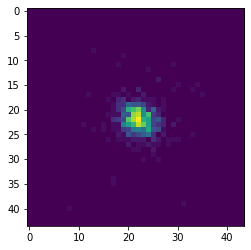

In [228]:
a,b,c,e = d
plt.imshow(e.array)

### Reading in data of 500,000 galaxies with their measured ellipticities

In [4]:
data = pd.read_csv('shear_est_g11g20_lsst.csv')

### Making a mask to cut data based on resolution factor and SNR

In [5]:
mask = np.where((data['resolution_factor']>.3)&(data['SNR']>100))
np.mean(data['g1_corrected'].values[mask]),np.mean(data['g2_corrected'].values[mask])

(0.11428088706070987, -0.002191167888596561)

In [6]:
np.std(data['g1_corrected'].values[mask]),len(mask[0])

(0.2615486485273614, 41083)

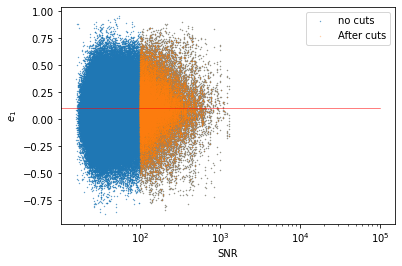

In [42]:
plt.scatter(data['SNR'],data['e1'],s=.1,label ="no cuts")
plt.scatter(data['SNR'].values[mask],data['e1'].values[mask],s=.1,alpha =.5, label="After cuts")
x = np.linspace(0,100000)
y = (x*0)+.1
plt.xlabel("SNR")
plt.ylabel(r"$e_1$")
plt.plot(x,y,lw=.5,c='r',alpha=1)
plt.xscale('log')
#plt.ylim(-5,5)

plt.legend();

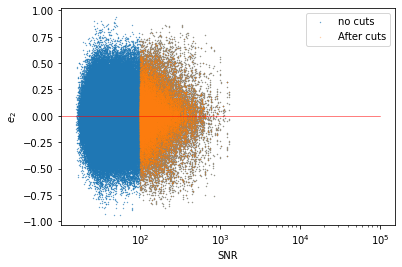

In [43]:
plt.scatter(data['SNR'],data['e2'],s=.1,label ="no cuts")
plt.scatter(data['SNR'].values[mask],data['e2'].values[mask],s=.1,alpha =.5, label="After cuts")
x = np.linspace(0,100000)
y = (x*0)
plt.xlabel("SNR")
plt.ylabel(r"$e_2$")
plt.plot(x,y,lw=.5,c='r',alpha=1)
plt.xscale('log')
#plt.ylim(-5,5)

plt.legend();

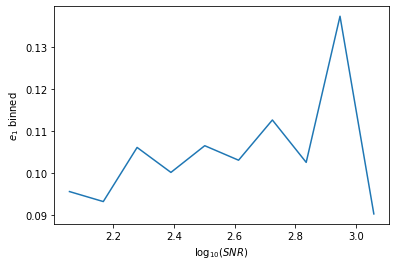

In [32]:
import scipy.stats as stats
bin_stat = stats.binned_statistic(np.log10(data['SNR'].values[mask]),data['e1'].values[mask])
plt.plot((bin_stat[1][1:]+bin_stat[1][:-1])/2,bin_stat[0])
plt.xlabel(r"$\log_{10}(SNR)$")
plt.ylabel(r"$e_1$ binned");

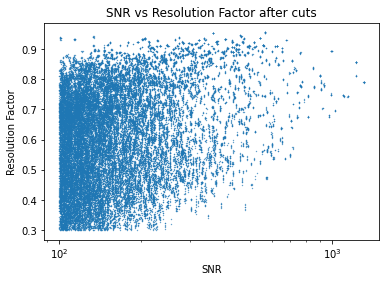

In [35]:
plt.scatter(data['SNR'].values[mask],data['resolution_factor'].values[mask],s=.1)
plt.xscale('log')
plt.title("SNR vs Resolution Factor after cuts")
plt.xlabel("SNR")
plt.ylabel("Resolution Factor");

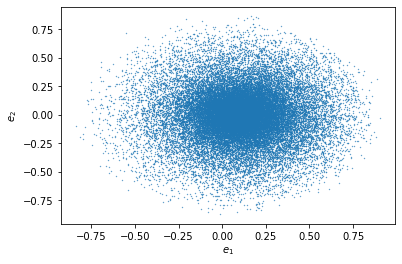

In [46]:
plt.scatter(data['e1'].values[mask],data['e2'].values[mask],s=.1)
plt.xlabel(r"$e_1$")
plt.ylabel(r"$e_2$");

### Guassian Fitting

In [47]:
import pygmmis
gmm=None

In [48]:
#dat = np.array([data['g1_corrected'].values[mask],data['g2_corrected'].values[mask]]).T
dat = np.array([data['e1'].values[mask],data['e2'].values[mask]]).T

In [49]:
gmm = pygmmis.GMM(K=1, D=2)      # K components, D dimensions
logL, U = pygmmis.fit(gmm,data=dat) # logL = log-likelihood, U = association of data to components

In [50]:
def plotResults(orig, data, gmm, patch=None, description=None, disp=None):
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, aspect='equal')

    # plot inner and outer points
    ax.plot(orig[:,0], orig[:,1], '.', mfc='None', mec='r', mew=.1,alpha=.1)
    missing = np.isnan(data)
    if missing.any():
        data_ = data.copy()
        data_[missing] = -5 # put at limits of plotting range
    else:
        data_ = data
    ax.plot(data_[:,0], data_[:,1], '.', mfc='b', mec='None',alpha=.1,mew=.1)#, mew=1)

    # prediction
    B = 100
    x,y = np.meshgrid(np.linspace(-5,15,B), np.linspace(-5,15,B))
    coords = np.dstack((x.flatten(), y.flatten()))[0]

    # compute sum_k(p_k(x)) for all x
    p = gmm(coords).reshape((B,B))
    # for better visibility use arcshinh stretch
    p = np.arcsinh(p/1e-4)
    cs = ax.contourf(p, 10, extent=(-5,15,-5,15), cmap=plt.cm.Greys)
    for c in cs.collections:
        c.set_edgecolor(c.get_facecolor())

    # plot boundary
    if patch is not None:
        import copy
        if hasattr(patch, '__iter__'):
            for p in patch:
                ax.add_artist(copy.copy(p))
        else:
            ax.add_artist(copy.copy(patch))

    # add description and complete data logL to plot
    logL = gmm(orig, as_log=True).mean()
    if description is not None:
        ax.text(0.05, 0.95, r'%s' % description, ha='left', va='top', transform=ax.transAxes, fontsize=20)
        ax.text(0.05, 0.89, '$\log{\mathcal{L}} = %.3f$' % logL, ha='left', va='top', transform=ax.transAxes, fontsize=20)
    else:
        ax.text(0.05, 0.95, '$\log{\mathcal{L}} = %.3f$' % logL, ha='left', va='top', transform=ax.transAxes, fontsize=20)

    # show size of error dispersion as Circle
    if disp is not None:

        circ1 = patches.Circle((12.5, -2.5), radius=disp, fc='b', ec='None', alpha=0.5)
        circ2 = patches.Circle((12.5, -2.5), radius=2*disp, fc='b', ec='None', alpha=0.3)
        circ3 = patches.Circle((12.5, -2.5), radius=3*disp, fc='b', ec='None', alpha=0.1)
        ax.add_artist(circ1)
        ax.add_artist(circ2)
        ax.add_artist(circ3)
        ax.text(12.5, -2.5, r'$\sigma$', color='w', fontsize=20, ha='center', va='center')

    ax.set_xlim(-5, 15)
    ax.set_ylim(-5, 15)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.subplots_adjust(bottom=0.01, top=0.99, left=0.01, right=0.99)
    fig.show()
    
def getBox(coords):
    box_limits = np.array([[0,0],[10,10]])
    return (coords[:,0] > box_limits[0,0]) & (coords[:,0] < box_limits[1,0]) & (coords[:,1] > box_limits[0,1]) & (coords[:,1] < box_limits[1,1])

def getHole(coords):
    x,y,r = 6.5, 6., 2
    return ((coords[:,0] - x)**2 + (coords[:,1] - y)**2 > r**2)

def getBoxWithHole(coords):
    return getBox(coords)*getHole(coords)

def getCut(coords):
    return (coords[:,0] < 6)

def getAll(coords):
    return np.ones(len(coords))

def getHalf(coords, rng=np.random):
    return 0.5 * np.ones(len(coords))

def getSelection(type="hole", rng=np.random):
    if type == "hole":
        cb = getHole
        ps = patches.Circle([6.5, 6.], radius=2, fc="none", ec='k', lw=1, ls='dashed')
    if type == "box":
        cb = getBox
        ps = patches.Rectangle([0,0], 10, 10, fc="none", ec='k', lw=1, ls='dashed')
    if type == "boxWithHole":
        cb = getBoxWithHole
        ps = [patches.Circle([6.5, 6.], radius=2, fc="none", ec='k', lw=1, ls='dashed'),
            patches.Rectangle([0,0], 10, 10, fc="none", ec='k', lw=1, ls='dashed')]
    if type == "cut":
        cb = getCut
        ps = lines.Line2D([6, 6],[-5, 15], ls='dotted', lw=1, color='k')
    if type == "all":
        cb = getAll
        ps = None
    return cb, ps

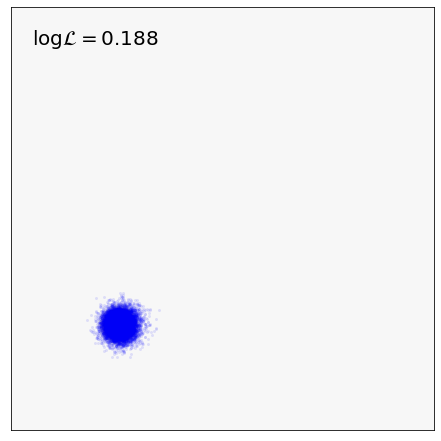

In [51]:
from numpy.random import RandomState
import pygmmis
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
import matplotlib.cm
import datetime
from functools import partial
import logging

rng = RandomState(12)
orig = gmm.draw(len(data['g1_corrected'].values[mask]), rng=rng)
omega, ps = getSelection("hole", rng=rng)


plotResults(orig, np.asarray([data['g1_corrected'].values[mask],data['g2_corrected'].values[mask]]).T, gmm)


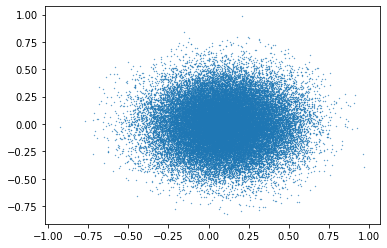

In [52]:
plt.scatter(orig.T[0],orig.T[1],s=.1)

In [53]:
gmm.mean

array([[ 0.09834993, -0.00213618]])

In [54]:
np.sqrt(np.diagonal(gmm.covar))

array([[0.21918006],
       [0.0109583 ]])

Mean $e_1$ = .0983

True $g_1$ = .1

Mean $e_2$ = -0.0021

True $g_2$ = 0

Mean g1 and g2 after HSM corrections using KSB method.

In [63]:

np.mean(data['g1_corrected'].values[mask]),np.mean(data['g2_corrected'].values[mask])


(0.11428088706070987, -0.002191167888596561)